The following additional libraries are needed to run this
notebook. Note that running on Colab is experimental, please report a Github
issue if you have any problem.

In [ ]:
!pip install git+https://github.com/d2l-ai/d2l-zh@release  # installing d2l


# 图像增广
:label:`sec_image_augmentation`

 :numref:`sec_alexnet`提到过大型数据集是成功应用深度神经网络的先决条件。
图像增广在对训练图像进行一系列的随机变化之后，生成相似但不同的训练样本，从而扩大了训练集的规模。
此外，应用图像增广的原因是，随机改变训练样本可以减少模型对某些属性的依赖，从而提高模型的泛化能力。
例如，我们可以以不同的方式裁剪图像，使感兴趣的对象出现在不同的位置，减少模型对于对象出现位置的依赖。
我们还可以调整亮度、颜色等因素来降低模型对颜色的敏感度。
可以说，图像增广技术对于AlexNet的成功是必不可少的。本节将讨论这项广泛应用于计算机视觉的技术。


In [1]:
%matplotlib inline
import warnings
from d2l import paddle as d2l

warnings.filterwarnings("ignore")
import paddle
import paddle.vision as paddlevision
from paddle import nn

## 常用的图像增广方法

在对常用图像增广方法的探索时，我们将使用下面这个尺寸为$400\times 500$的图像作为示例。


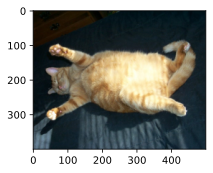

In [2]:
d2l.set_figsize()
img = d2l.Image.open('../img/cat1.jpg')
d2l.plt.imshow(img);

大多数图像增广方法都具有一定的随机性。为了便于观察图像增广的效果，我们下面定义辅助函数`apply`。
此函数在输入图像`img`上多次运行图像增广方法`aug`并显示所有结果。


In [3]:
def apply(img, aug, num_rows=2, num_cols=4, scale=1.5):
    Y = [aug(img) for _ in range(num_rows * num_cols)]
    d2l.show_images(Y, num_rows, num_cols, scale=scale)

### 翻转和裁剪

[**左右翻转图像**]通常不会改变对象的类别。这是最早且最广泛使用的图像增广方法之一。
接下来，我们使用`transforms`模块来创建`RandomFlipLeftRight`实例，这样就各有50%的几率使图像向左或向右翻转。


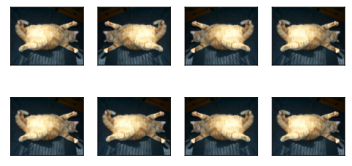

In [4]:
apply(img, paddlevision.transforms.RandomHorizontalFlip())

[**上下翻转图像**]不如左右图像翻转那样常用。但是，至少对于这个示例图像，上下翻转不会妨碍识别。接下来，我们创建一个`RandomFlipTopBottom`实例，使图像各有50%的几率向上或向下翻转。


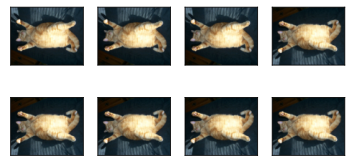

In [5]:
apply(img,  paddlevision.transforms.RandomVerticalFlip())

在我们使用的示例图像中，猫位于图像的中间，但并非所有图像都是这样。
在 :numref:`sec_pooling`中，我们解释了汇聚层可以降低卷积层对目标位置的敏感性。
另外，我们可以通过对图像进行随机裁剪，使物体以不同的比例出现在图像的不同位置。
这也可以降低模型对目标位置的敏感性。

下面的代码将[**随机裁剪**]一个面积为原始面积10%到100%的区域，该区域的宽高比从0.5～2之间随机取值。
然后，区域的宽度和高度都被缩放到200像素。
在本节中（除非另有说明），$a$和$b$之间的随机数指的是在区间$[a, b]$中通过均匀采样获得的连续值。


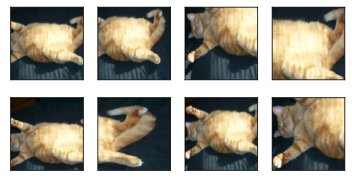

In [6]:
shape_aug =  paddlevision.transforms.RandomResizedCrop(
    (200, 200), scale=(0.1, 1), ratio=(0.5, 2))
apply(img, shape_aug)

### 改变颜色

另一种增广方法是改变颜色。
我们可以改变图像颜色的四个方面：亮度、对比度、饱和度和色调。
在下面的示例中，我们[**随机更改图像的亮度**]，随机值为原始图像的50%（$1-0.5$）到150%（$1+0.5$）之间。


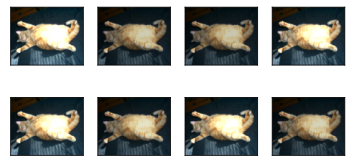

In [7]:
apply(img,  paddlevision.transforms.ColorJitter(
    brightness=0.5, contrast=0, saturation=0, hue=0))

同样，我们可以[**随机更改图像的色调**]。


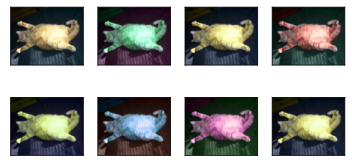

In [8]:
apply(img,  paddlevision.transforms.ColorJitter(
    brightness=0, contrast=0, saturation=0, hue=0.5))

我们还可以创建一个`RandomColorJitter`实例，并设置如何同时[**随机更改图像的亮度（`brightness`）、对比度（`contrast`）、饱和度（`saturation`）和色调（`hue`）**]。


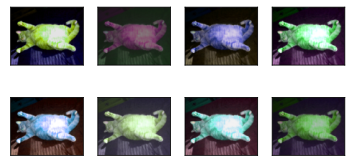

In [9]:
color_aug =  paddlevision.transforms.ColorJitter(
    brightness=0.5, contrast=0.5, saturation=0.5, hue=0.5)
apply(img, color_aug)

### [**结合多种图像增广方法**]

在实践中，我们将结合多种图像增广方法。比如，我们可以通过使用一个`Compose`实例来综合上面定义的不同的图像增广方法，并将它们应用到每个图像。


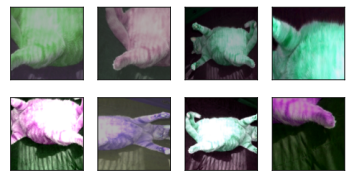

In [10]:
augs =  paddlevision.transforms.Compose([
     paddle.vision.transforms.RandomHorizontalFlip(), color_aug, shape_aug])
apply(img, augs)

## [**使用图像增广进行训练**]

让我们使用图像增广来训练模型。
这里，我们使用CIFAR-10数据集，而不是我们之前使用的Fashion-MNIST数据集。
这是因为Fashion-MNIST数据集中对象的位置和大小已被规范化，而CIFAR-10数据集中对象的颜色和大小差异更明显。
CIFAR-10数据集中的前32个训练图像如下所示。


Cache file /home/ci/.cache/paddle/dataset/cifar/cifar-10-python.tar.gz not found, downloading https://dataset.bj.bcebos.com/cifar/cifar-10-python.tar.gz 
Begin to download


item     1/41626 [..............................] - ETA: 1:00:25 - 87ms/item

item     2/41626 [..............................] - ETA: 30:32 - 44ms/item  

item     3/41626 [..............................] - ETA: 20:31 - 30ms/item

item     4/41626 [..............................] - ETA: 15:30 - 22ms/item

item     5/41626 [..............................] - ETA: 30:14 - 44ms/item

item     6/41626 [..............................] - ETA: 25:16 - 36ms/item

item     7/41626 [..............................] - ETA: 21:44 - 31ms/item

item     8/41626 [..............................] - ETA: 19:04 - 28ms/item

item     9/41626 [..............................] - ETA: 31:52 - 46ms/item

item    10/41626 [..............................] - ETA: 28:44 - 41ms/item

item    11/41626 [..............................] - ETA: 26:12 - 38ms/item

item    12/41626 [..............................] - ETA: 24:03 - 35ms/item

item    13/41626 [..............................] - ETA: 23:05 - 33ms/item

item    14/41626 [..............................] - ETA: 21:28 - 31ms/item

item    15/41626 [..............................] - ETA: 20:04 - 29ms/item

item    16/41626 [..............................] - ETA: 18:50 - 27ms/item

item    17/41626 [..............................] - ETA: 25:30 - 37ms/item

item    18/41626 [..............................] - ETA: 24:07 - 35ms/item

item    19/41626 [..............................] - ETA: 22:53 - 33ms/item

item    20/41626 [..............................] - ETA: 21:46 - 31ms/item

item    21/41626 [..............................] - ETA: 21:15 - 31ms/item

item    22/41626 [..............................] - ETA: 20:18 - 29ms/item

item    23/41626 [..............................] - ETA: 19:27 - 28ms/item

item    24/41626 [..............................] - ETA: 18:40 - 27ms/item

item    25/41626 [..............................] - ETA: 23:14 - 34ms/item

item    26/41626 [..............................] - ETA: 22:22 - 32ms/item

item    27/41626 [..............................] - ETA: 21:34 - 31ms/item

item    28/41626 [..............................] - ETA: 20:49 - 30ms/item

item    29/41626 [..............................] - ETA: 22:00 - 32ms/item

item    30/41626 [..............................] - ETA: 21:17 - 31ms/item

item    31/41626 [..............................] - ETA: 20:37 - 30ms/item

item    32/41626 [..............................] - ETA: 19:59 - 29ms/item

item    33/41626 [..............................] - ETA: 22:03 - 32ms/item

item    34/41626 [..............................] - ETA: 21:25 - 31ms/item

item    35/41626 [..............................] - ETA: 20:49 - 30ms/item

item    36/41626 [..............................] - ETA: 20:15 - 29ms/item

item    37/41626 [..............................] - ETA: 22:18 - 32ms/item

item    38/41626 [..............................] - ETA: 21:43 - 31ms/item

item    39/41626 [..............................] - ETA: 21:10 - 31ms/item

item    40/41626 [..............................] - ETA: 20:39 - 30ms/item

item    41/41626 [..............................] - ETA: 22:39 - 33ms/item

item    42/41626 [..............................] - ETA: 22:07 - 32ms/item

item    43/41626 [..............................] - ETA: 21:37 - 31ms/item

item    44/41626 [..............................] - ETA: 21:08 - 31ms/item

item    45/41626 [..............................] - ETA: 23:38 - 34ms/item

item    46/41626 [..............................] - ETA: 23:08 - 33ms/item

item    47/41626 [..............................] - ETA: 22:39 - 33ms/item

item    48/41626 [..............................] - ETA: 22:11 - 32ms/item

item    49/41626 [..............................] - ETA: 23:56 - 35ms/item

item    50/41626 [..............................] - ETA: 23:28 - 34ms/item

item    51/41626 [..............................] - ETA: 23:01 - 33ms/item

item    52/41626 [..............................] - ETA: 22:34 - 33ms/item

item    53/41626 [..............................] - ETA: 23:42 - 34ms/item

item    54/41626 [..............................] - ETA: 23:16 - 34ms/item

item    55/41626 [..............................] - ETA: 22:51 - 33ms/item

item    56/41626 [..............................] - ETA: 22:27 - 32ms/item

item    57/41626 [..............................] - ETA: 24:05 - 35ms/item

item    58/41626 [..............................] - ETA: 23:40 - 34ms/item

item    59/41626 [..............................] - ETA: 23:17 - 34ms/item

item    60/41626 [..............................] - ETA: 22:54 - 33ms/item

item    61/41626 [..............................] - ETA: 24:29 - 35ms/item

item    62/41626 [..............................] - ETA: 24:06 - 35ms/item

item    63/41626 [..............................] - ETA: 23:43 - 34ms/item

item    64/41626 [..............................] - ETA: 23:21 - 34ms/item

item    65/41626 [..............................] - ETA: 24:11 - 35ms/item

item    66/41626 [..............................] - ETA: 23:50 - 34ms/item

item    67/41626 [..............................] - ETA: 23:29 - 34ms/item

item    68/41626 [..............................] - ETA: 23:09 - 33ms/item

item    69/41626 [..............................] - ETA: 24:32 - 35ms/item

item    70/41626 [..............................] - ETA: 24:12 - 35ms/item

item    71/41626 [..............................] - ETA: 23:52 - 34ms/item

item    72/41626 [..............................] - ETA: 23:32 - 34ms/item

item    73/41626 [..............................] - ETA: 24:34 - 35ms/item

item    74/41626 [..............................] - ETA: 24:14 - 35ms/item

item    75/41626 [..............................] - ETA: 23:55 - 35ms/item

item    76/41626 [..............................] - ETA: 23:37 - 34ms/item

item    77/41626 [..............................] - ETA: 24:33 - 35ms/item

item    78/41626 [..............................] - ETA: 24:15 - 35ms/item

item    79/41626 [..............................] - ETA: 23:56 - 35ms/item

item    80/41626 [..............................] - ETA: 23:39 - 34ms/item

item    81/41626 [..............................] - ETA: 24:51 - 36ms/item

item    82/41626 [..............................] - ETA: 24:34 - 35ms/item

item    83/41626 [..............................] - ETA: 24:16 - 35ms/item

item    84/41626 [..............................] - ETA: 23:59 - 35ms/item

item    85/41626 [..............................] - ETA: 24:53 - 36ms/item

item    86/41626 [..............................] - ETA: 24:36 - 36ms/item

item    87/41626 [..............................] - ETA: 24:20 - 35ms/item

item    88/41626 [..............................] - ETA: 24:03 - 35ms/item

item    89/41626 [..............................] - ETA: 24:46 - 36ms/item

item    90/41626 [..............................] - ETA: 24:29 - 35ms/item

item    91/41626 [..............................] - ETA: 24:13 - 35ms/item

item    92/41626 [..............................] - ETA: 23:58 - 35ms/item

item    93/41626 [..............................] - ETA: 24:57 - 36ms/item

item    94/41626 [..............................] - ETA: 24:41 - 36ms/item

item    95/41626 [..............................] - ETA: 24:26 - 35ms/item

item    96/41626 [..............................] - ETA: 24:11 - 35ms/item

item    97/41626 [..............................] - ETA: 24:53 - 36ms/item

item    98/41626 [..............................] - ETA: 24:38 - 36ms/item

item    99/41626 [..............................] - ETA: 24:23 - 35ms/item

item   100/41626 [..............................] - ETA: 24:09 - 35ms/item

item   101/41626 [..............................] - ETA: 25:17 - 37ms/item

item   102/41626 [..............................] - ETA: 25:02 - 36ms/item

item   103/41626 [..............................] - ETA: 24:48 - 36ms/item

item   104/41626 [..............................] - ETA: 24:34 - 36ms/item

item   105/41626 [..............................] - ETA: 25:30 - 37ms/item

item   106/41626 [..............................] - ETA: 25:16 - 37ms/item

item   107/41626 [..............................] - ETA: 25:02 - 36ms/item

item   108/41626 [..............................] - ETA: 24:48 - 36ms/item

item   109/41626 [..............................] - ETA: 25:50 - 37ms/item

item   110/41626 [..............................] - ETA: 25:36 - 37ms/item

item   111/41626 [..............................] - ETA: 25:22 - 37ms/item

item   112/41626 [..............................] - ETA: 25:09 - 36ms/item

item   113/41626 [..............................] - ETA: 26:05 - 38ms/item

item   114/41626 [..............................] - ETA: 25:52 - 37ms/item

item   115/41626 [..............................] - ETA: 25:38 - 37ms/item

item   116/41626 [..............................] - ETA: 25:25 - 37ms/item

item   117/41626 [..............................] - ETA: 26:01 - 38ms/item

item   118/41626 [..............................] - ETA: 25:48 - 37ms/item

item   119/41626 [..............................] - ETA: 25:35 - 37ms/item

item   120/41626 [..............................] - ETA: 25:23 - 37ms/item

item   121/41626 [..............................] - ETA: 26:15 - 38ms/item

item   122/41626 [..............................] - ETA: 26:02 - 38ms/item

item   123/41626 [..............................] - ETA: 25:49 - 37ms/item

item   124/41626 [..............................] - ETA: 25:37 - 37ms/item

item   125/41626 [..............................] - ETA: 26:25 - 38ms/item

item   126/41626 [..............................] - ETA: 26:12 - 38ms/item

item   127/41626 [..............................] - ETA: 26:00 - 38ms/item

item   128/41626 [..............................] - ETA: 25:48 - 37ms/item

item   129/41626 [..............................] - ETA: 26:40 - 39ms/item

item   130/41626 [..............................] - ETA: 26:28 - 38ms/item

item   131/41626 [..............................] - ETA: 26:16 - 38ms/item

item   132/41626 [..............................] - ETA: 26:04 - 38ms/item

item   133/41626 [..............................] - ETA: 26:47 - 39ms/item

item   134/41626 [..............................] - ETA: 26:35 - 38ms/item

item   135/41626 [..............................] - ETA: 26:24 - 38ms/item

item   136/41626 [..............................] - ETA: 26:12 - 38ms/item

item   137/41626 [..............................] - ETA: 26:43 - 39ms/item

item   138/41626 [..............................] - ETA: 26:31 - 38ms/item

item   139/41626 [..............................] - ETA: 26:20 - 38ms/item

item   140/41626 [..............................] - ETA: 26:09 - 38ms/item

item   141/41626 [..............................] - ETA: 26:53 - 39ms/item

item   142/41626 [..............................] - ETA: 26:42 - 39ms/item

item   143/41626 [..............................] - ETA: 26:31 - 38ms/item

item   144/41626 [..............................] - ETA: 26:20 - 38ms/item

item   145/41626 [..............................] - ETA: 27:04 - 39ms/item

item   146/41626 [..............................] - ETA: 26:53 - 39ms/item

item   147/41626 [..............................] - ETA: 26:42 - 39ms/item

item   148/41626 [..............................] - ETA: 26:32 - 38ms/item

item   149/41626 [..............................] - ETA: 27:13 - 39ms/item

item   150/41626 [..............................] - ETA: 27:02 - 39ms/item

item   151/41626 [..............................] - ETA: 26:51 - 39ms/item

item   152/41626 [..............................] - ETA: 26:41 - 39ms/item

item   153/41626 [..............................] - ETA: 27:27 - 40ms/item

item   154/41626 [..............................] - ETA: 27:16 - 39ms/item

item   155/41626 [..............................] - ETA: 27:06 - 39ms/item

item   156/41626 [..............................] - ETA: 26:56 - 39ms/item

item   157/41626 [..............................] - ETA: 27:41 - 40ms/item

item   158/41626 [..............................] - ETA: 27:31 - 40ms/item

item   159/41626 [..............................] - ETA: 27:21 - 40ms/item

item   160/41626 [..............................] - ETA: 27:10 - 39ms/item

item   161/41626 [..............................] - ETA: 27:53 - 40ms/item

item   162/41626 [..............................] - ETA: 27:43 - 40ms/item

item   163/41626 [..............................] - ETA: 27:33 - 40ms/item

item   164/41626 [..............................] - ETA: 27:23 - 40ms/item

item   165/41626 [..............................] - ETA: 28:09 - 41ms/item

item   166/41626 [..............................] - ETA: 27:59 - 41ms/item

item   167/41626 [..............................] - ETA: 27:49 - 40ms/item

item   168/41626 [..............................] - ETA: 27:39 - 40ms/item

item   169/41626 [..............................] - ETA: 28:20 - 41ms/item

item   170/41626 [..............................] - ETA: 28:10 - 41ms/item

item   171/41626 [..............................] - ETA: 28:00 - 41ms/item

item   172/41626 [..............................] - ETA: 27:51 - 40ms/item

item   173/41626 [..............................] - ETA: 28:30 - 41ms/item

item   174/41626 [..............................] - ETA: 28:21 - 41ms/item

item   175/41626 [..............................] - ETA: 28:11 - 41ms/item

item   176/41626 [..............................] - ETA: 28:02 - 41ms/item

item   177/41626 [..............................] - ETA: 28:38 - 41ms/item

item   178/41626 [..............................] - ETA: 28:28 - 41ms/item

item   179/41626 [..............................] - ETA: 28:19 - 41ms/item

item   180/41626 [..............................] - ETA: 28:10 - 41ms/item

item   181/41626 [..............................] - ETA: 28:54 - 42ms/item

item   182/41626 [..............................] - ETA: 28:45 - 42ms/item

item   183/41626 [..............................] - ETA: 28:35 - 41ms/item

item   184/41626 [..............................] - ETA: 28:26 - 41ms/item

item   185/41626 [..............................] - ETA: 29:03 - 42ms/item

item   186/41626 [..............................] - ETA: 28:54 - 42ms/item

item   187/41626 [..............................] - ETA: 28:45 - 42ms/item

item   188/41626 [..............................] - ETA: 28:35 - 41ms/item

item   189/41626 [..............................] - ETA: 29:10 - 42ms/item

item   190/41626 [..............................] - ETA: 29:01 - 42ms/item

item   191/41626 [..............................] - ETA: 28:52 - 42ms/item

item   192/41626 [..............................] - ETA: 28:43 - 42ms/item

item   193/41626 [..............................] - ETA: 29:19 - 42ms/item

item   194/41626 [..............................] - ETA: 29:10 - 42ms/item

item   195/41626 [..............................] - ETA: 29:01 - 42ms/item

item   196/41626 [..............................] - ETA: 28:52 - 42ms/item

item   197/41626 [..............................] - ETA: 29:38 - 43ms/item

item   198/41626 [..............................] - ETA: 29:29 - 43ms/item

item   199/41626 [..............................] - ETA: 29:21 - 43ms/item

item   200/41626 [..............................] - ETA: 29:12 - 42ms/item

item   201/41626 [..............................] - ETA: 29:53 - 43ms/item

item   202/41626 [..............................] - ETA: 29:44 - 43ms/item

item   203/41626 [..............................] - ETA: 29:35 - 43ms/item

item   204/41626 [..............................] - ETA: 29:27 - 43ms/item

item   205/41626 [..............................] - ETA: 30:09 - 44ms/item

item   206/41626 [..............................] - ETA: 30:01 - 43ms/item

item   207/41626 [..............................] - ETA: 29:52 - 43ms/item

item   208/41626 [..............................] - ETA: 29:43 - 43ms/item

item   209/41626 [..............................] - ETA: 30:23 - 44ms/item

item   210/41626 [..............................] - ETA: 30:15 - 44ms/item

item   211/41626 [..............................] - ETA: 30:06 - 44ms/item

item   212/41626 [..............................] - ETA: 29:58 - 43ms/item

item   213/41626 [..............................] - ETA: 31:12 - 45ms/item

item   214/41626 [..............................] - ETA: 31:04 - 45ms/item

item   215/41626 [..............................] - ETA: 30:55 - 45ms/item

item   216/41626 [..............................] - ETA: 30:47 - 45ms/item

item   217/41626 [..............................] - ETA: 31:46 - 46ms/item

item   218/41626 [..............................] - ETA: 31:38 - 46ms/item

item   219/41626 [..............................] - ETA: 31:29 - 46ms/item

item   220/41626 [..............................] - ETA: 31:21 - 45ms/item

item   221/41626 [..............................] - ETA: 31:51 - 46ms/item

item   222/41626 [..............................] - ETA: 31:42 - 46ms/item

item   223/41626 [..............................] - ETA: 31:34 - 46ms/item

item   224/41626 [..............................] - ETA: 31:25 - 46ms/item

item   225/41626 [..............................] - ETA: 31:55 - 46ms/item

item   226/41626 [..............................] - ETA: 31:47 - 46ms/item

item   227/41626 [..............................] - ETA: 31:38 - 46ms/item

item   228/41626 [..............................] - ETA: 31:30 - 46ms/item

item   229/41626 [..............................] - ETA: 31:59 - 46ms/item

item   230/41626 [..............................] - ETA: 31:51 - 46ms/item

item   231/41626 [..............................] - ETA: 31:42 - 46ms/item

item   232/41626 [..............................] - ETA: 31:34 - 46ms/item

item   233/41626 [..............................] - ETA: 32:03 - 46ms/item

item   234/41626 [..............................] - ETA: 31:55 - 46ms/item

item   235/41626 [..............................] - ETA: 31:47 - 46ms/item

item   236/41626 [..............................] - ETA: 31:39 - 46ms/item

item   237/41626 [..............................] - ETA: 31:59 - 46ms/item

item   238/41626 [..............................] - ETA: 31:51 - 46ms/item

item   239/41626 [..............................] - ETA: 31:44 - 46ms/item

item   240/41626 [..............................] - ETA: 31:36 - 46ms/item

item   241/41626 [..............................] - ETA: 31:55 - 46ms/item

item   242/41626 [..............................] - ETA: 31:47 - 46ms/item

item   243/41626 [..............................] - ETA: 31:39 - 46ms/item

item   244/41626 [..............................] - ETA: 31:31 - 46ms/item

item   245/41626 [..............................] - ETA: 31:47 - 46ms/item

item   246/41626 [..............................] - ETA: 31:39 - 46ms/item

item   247/41626 [..............................] - ETA: 31:32 - 46ms/item

item   248/41626 [..............................] - ETA: 31:24 - 46ms/item

item   249/41626 [..............................] - ETA: 31:40 - 46ms/item

item   250/41626 [..............................] - ETA: 31:33 - 46ms/item

item   251/41626 [..............................] - ETA: 31:25 - 46ms/item

item   252/41626 [..............................] - ETA: 31:18 - 45ms/item

item   253/41626 [..............................] - ETA: 31:29 - 46ms/item

item   254/41626 [..............................] - ETA: 31:22 - 46ms/item

item   255/41626 [..............................] - ETA: 31:15 - 45ms/item

item   256/41626 [..............................] - ETA: 31:07 - 45ms/item

item   257/41626 [..............................] - ETA: 31:18 - 45ms/item

item   258/41626 [..............................] - ETA: 31:11 - 45ms/item

item   259/41626 [..............................] - ETA: 31:03 - 45ms/item

item   260/41626 [..............................] - ETA: 30:56 - 45ms/item

item   261/41626 [..............................] - ETA: 31:04 - 45ms/item

item   262/41626 [..............................] - ETA: 30:57 - 45ms/item

item   263/41626 [..............................] - ETA: 30:50 - 45ms/item

item   264/41626 [..............................] - ETA: 30:43 - 45ms/item

item   265/41626 [..............................] - ETA: 30:53 - 45ms/item

item   266/41626 [..............................] - ETA: 30:46 - 45ms/item

item   267/41626 [..............................] - ETA: 30:39 - 44ms/item

item   268/41626 [..............................] - ETA: 30:32 - 44ms/item

item   269/41626 [..............................] - ETA: 30:40 - 44ms/item

item   270/41626 [..............................] - ETA: 30:33 - 44ms/item

item   271/41626 [..............................] - ETA: 30:26 - 44ms/item

item   272/41626 [..............................] - ETA: 30:20 - 44ms/item

item   273/41626 [..............................] - ETA: 30:24 - 44ms/item

item   274/41626 [..............................] - ETA: 30:18 - 44ms/item

item   275/41626 [..............................] - ETA: 30:11 - 44ms/item

item   276/41626 [..............................] - ETA: 30:05 - 44ms/item

item   277/41626 [..............................] - ETA: 30:11 - 44ms/item

item   278/41626 [..............................] - ETA: 30:05 - 44ms/item

item   279/41626 [..............................] - ETA: 29:58 - 44ms/item

item   280/41626 [..............................] - ETA: 29:52 - 43ms/item

item   281/41626 [..............................] - ETA: 29:57 - 43ms/item

item   282/41626 [..............................] - ETA: 29:51 - 43ms/item

item   283/41626 [..............................] - ETA: 29:45 - 43ms/item

item   284/41626 [..............................] - ETA: 29:39 - 43ms/item

item   285/41626 [..............................] - ETA: 29:42 - 43ms/item

item   286/41626 [..............................] - ETA: 29:35 - 43ms/item

item   287/41626 [..............................] - ETA: 29:29 - 43ms/item

item   288/41626 [..............................] - ETA: 29:23 - 43ms/item

item   289/41626 [..............................] - ETA: 29:27 - 43ms/item

item   290/41626 [..............................] - ETA: 29:21 - 43ms/item

item   291/41626 [..............................] - ETA: 29:15 - 42ms/item

item   292/41626 [..............................] - ETA: 29:10 - 42ms/item

item   293/41626 [..............................] - ETA: 29:12 - 42ms/item

item   294/41626 [..............................] - ETA: 29:06 - 42ms/item

item   295/41626 [..............................] - ETA: 29:00 - 42ms/item

item   296/41626 [..............................] - ETA: 28:54 - 42ms/item

item   297/41626 [..............................] - ETA: 28:58 - 42ms/item

item   298/41626 [..............................] - ETA: 28:52 - 42ms/item

item   299/41626 [..............................] - ETA: 28:46 - 42ms/item

item   300/41626 [..............................] - ETA: 28:41 - 42ms/item

item   301/41626 [..............................] - ETA: 28:43 - 42ms/item

item   302/41626 [..............................] - ETA: 28:38 - 42ms/item

item   303/41626 [..............................] - ETA: 28:32 - 41ms/item

item   304/41626 [..............................] - ETA: 28:27 - 41ms/item

item   305/41626 [..............................] - ETA: 28:28 - 41ms/item

item   306/41626 [..............................] - ETA: 28:22 - 41ms/item

item   307/41626 [..............................] - ETA: 28:17 - 41ms/item

item   308/41626 [..............................] - ETA: 28:12 - 41ms/item

item   309/41626 [..............................] - ETA: 28:14 - 41ms/item

item   310/41626 [..............................] - ETA: 28:08 - 41ms/item

item   311/41626 [..............................] - ETA: 28:03 - 41ms/item

item   312/41626 [..............................] - ETA: 27:58 - 41ms/item

item   313/41626 [..............................] - ETA: 27:58 - 41ms/item

item   314/41626 [..............................] - ETA: 27:53 - 41ms/item

item   315/41626 [..............................] - ETA: 27:48 - 40ms/item

item   316/41626 [..............................] - ETA: 27:43 - 40ms/item

item   317/41626 [..............................] - ETA: 27:45 - 40ms/item

item   318/41626 [..............................] - ETA: 27:39 - 40ms/item

item   319/41626 [..............................] - ETA: 27:34 - 40ms/item

item   320/41626 [..............................] - ETA: 27:29 - 40ms/item

item   321/41626 [..............................] - ETA: 27:31 - 40ms/item

item   322/41626 [..............................] - ETA: 27:26 - 40ms/item

item   323/41626 [..............................] - ETA: 27:21 - 40ms/item

item   324/41626 [..............................] - ETA: 27:16 - 40ms/item

item   325/41626 [..............................] - ETA: 27:16 - 40ms/item

item   326/41626 [..............................] - ETA: 27:11 - 40ms/item

item   327/41626 [..............................] - ETA: 27:06 - 39ms/item

item   328/41626 [..............................] - ETA: 27:01 - 39ms/item

item   329/41626 [..............................] - ETA: 27:02 - 39ms/item

item   330/41626 [..............................] - ETA: 26:57 - 39ms/item

item   331/41626 [..............................] - ETA: 26:53 - 39ms/item

item   332/41626 [..............................] - ETA: 26:48 - 39ms/item

item   333/41626 [..............................] - ETA: 26:49 - 39ms/item

item   334/41626 [..............................] - ETA: 26:44 - 39ms/item

item   335/41626 [..............................] - ETA: 26:40 - 39ms/item

item   336/41626 [..............................] - ETA: 26:35 - 39ms/item

item   337/41626 [..............................] - ETA: 26:34 - 39ms/item

item   338/41626 [..............................] - ETA: 26:30 - 39ms/item

item   339/41626 [..............................] - ETA: 26:25 - 38ms/item

item   340/41626 [..............................] - ETA: 26:21 - 38ms/item

item   341/41626 [..............................] - ETA: 26:21 - 38ms/item

item   342/41626 [..............................] - ETA: 26:17 - 38ms/item

item   343/41626 [..............................] - ETA: 26:12 - 38ms/item

item   344/41626 [..............................] - ETA: 26:08 - 38ms/item

item   345/41626 [..............................] - ETA: 26:07 - 38ms/item

item   346/41626 [..............................] - ETA: 26:03 - 38ms/item

item   347/41626 [..............................] - ETA: 25:59 - 38ms/item

item   348/41626 [..............................] - ETA: 25:54 - 38ms/item

item   349/41626 [..............................] - ETA: 25:54 - 38ms/item

item   350/41626 [..............................] - ETA: 25:50 - 38ms/item

item   351/41626 [..............................] - ETA: 25:46 - 37ms/item

item   352/41626 [..............................] - ETA: 25:41 - 37ms/item

item   353/41626 [..............................] - ETA: 25:42 - 37ms/item

item   354/41626 [..............................] - ETA: 25:37 - 37ms/item

item   355/41626 [..............................] - ETA: 25:33 - 37ms/item

item   356/41626 [..............................] - ETA: 25:29 - 37ms/item

item   357/41626 [..............................] - ETA: 25:28 - 37ms/item

item   358/41626 [..............................] - ETA: 25:24 - 37ms/item

item   359/41626 [..............................] - ETA: 25:20 - 37ms/item

item   360/41626 [..............................] - ETA: 25:16 - 37ms/item

item   361/41626 [..............................] - ETA: 25:16 - 37ms/item

item   362/41626 [..............................] - ETA: 25:12 - 37ms/item

item   363/41626 [..............................] - ETA: 25:08 - 37ms/item

item   364/41626 [..............................] - ETA: 25:04 - 36ms/item

item   365/41626 [..............................] - ETA: 25:04 - 36ms/item

item   366/41626 [..............................] - ETA: 25:00 - 36ms/item

item   367/41626 [..............................] - ETA: 24:56 - 36ms/item

item   368/41626 [..............................] - ETA: 24:52 - 36ms/item

item   369/41626 [..............................] - ETA: 24:51 - 36ms/item

item   370/41626 [..............................] - ETA: 24:47 - 36ms/item

item   371/41626 [..............................] - ETA: 24:43 - 36ms/item

item   372/41626 [..............................] - ETA: 24:39 - 36ms/item

item   373/41626 [..............................] - ETA: 24:39 - 36ms/item

item   374/41626 [..............................] - ETA: 24:35 - 36ms/item

item   375/41626 [..............................] - ETA: 24:31 - 36ms/item

item   376/41626 [..............................] - ETA: 24:27 - 36ms/item

item   377/41626 [..............................] - ETA: 24:26 - 36ms/item

item   378/41626 [..............................] - ETA: 24:23 - 35ms/item

item   379/41626 [..............................] - ETA: 24:19 - 35ms/item

item   380/41626 [..............................] - ETA: 24:15 - 35ms/item

item   381/41626 [..............................] - ETA: 24:15 - 35ms/item

item   382/41626 [..............................] - ETA: 24:11 - 35ms/item

item   383/41626 [..............................] - ETA: 24:07 - 35ms/item

item   384/41626 [..............................] - ETA: 24:04 - 35ms/item

item   385/41626 [..............................] - ETA: 24:03 - 35ms/item

item   386/41626 [..............................] - ETA: 24:00 - 35ms/item

item   387/41626 [..............................] - ETA: 23:56 - 35ms/item

item   388/41626 [..............................] - ETA: 23:52 - 35ms/item

item   389/41626 [..............................] - ETA: 23:51 - 35ms/item

item   390/41626 [..............................] - ETA: 23:48 - 35ms/item

item   391/41626 [..............................] - ETA: 23:44 - 35ms/item

item   392/41626 [..............................] - ETA: 23:41 - 34ms/item

item   393/41626 [..............................] - ETA: 23:40 - 34ms/item

item   394/41626 [..............................] - ETA: 23:37 - 34ms/item

item   395/41626 [..............................] - ETA: 23:33 - 34ms/item

item   396/41626 [..............................] - ETA: 23:30 - 34ms/item

item   397/41626 [..............................] - ETA: 23:29 - 34ms/item

item   398/41626 [..............................] - ETA: 23:25 - 34ms/item

item   399/41626 [..............................] - ETA: 23:22 - 34ms/item

item   400/41626 [..............................] - ETA: 23:18 - 34ms/item

item   401/41626 [..............................] - ETA: 23:18 - 34ms/item

item   402/41626 [..............................] - ETA: 23:14 - 34ms/item

item   403/41626 [..............................] - ETA: 23:11 - 34ms/item

item   404/41626 [..............................] - ETA: 23:08 - 34ms/item

item   405/41626 [..............................] - ETA: 23:07 - 34ms/item

item   406/41626 [..............................] - ETA: 23:04 - 34ms/item

item   407/41626 [..............................] - ETA: 23:00 - 34ms/item

item   408/41626 [..............................] - ETA: 22:57 - 33ms/item

item   409/41626 [..............................] - ETA: 22:56 - 33ms/item

item   410/41626 [..............................] - ETA: 22:53 - 33ms/item

item   411/41626 [..............................] - ETA: 22:49 - 33ms/item

item   412/41626 [..............................] - ETA: 22:46 - 33ms/item

item   413/41626 [..............................] - ETA: 22:46 - 33ms/item

item   414/41626 [..............................] - ETA: 22:42 - 33ms/item

item   415/41626 [..............................] - ETA: 22:39 - 33ms/item

item   416/41626 [..............................] - ETA: 22:36 - 33ms/item

item   417/41626 [..............................] - ETA: 22:35 - 33ms/item

item   418/41626 [..............................] - ETA: 22:32 - 33ms/item

item   419/41626 [..............................] - ETA: 22:29 - 33ms/item

item   420/41626 [..............................] - ETA: 22:26 - 33ms/item

item   421/41626 [..............................] - ETA: 22:25 - 33ms/item

item   422/41626 [..............................] - ETA: 22:22 - 33ms/item

item   423/41626 [..............................] - ETA: 22:19 - 33ms/item

item   424/41626 [..............................] - ETA: 22:16 - 32ms/item

item   425/41626 [..............................] - ETA: 22:15 - 32ms/item

item   426/41626 [..............................] - ETA: 22:12 - 32ms/item

item   427/41626 [..............................] - ETA: 22:09 - 32ms/item

item   428/41626 [..............................] - ETA: 22:06 - 32ms/item

item   429/41626 [..............................] - ETA: 22:04 - 32ms/item

item   430/41626 [..............................] - ETA: 22:01 - 32ms/item

item   431/41626 [..............................] - ETA: 21:58 - 32ms/item

item   432/41626 [..............................] - ETA: 21:55 - 32ms/item

item   433/41626 [..............................] - ETA: 21:55 - 32ms/item

item   434/41626 [..............................] - ETA: 21:52 - 32ms/item

item   435/41626 [..............................] - ETA: 21:49 - 32ms/item

item   436/41626 [..............................] - ETA: 21:46 - 32ms/item

item   437/41626 [..............................] - ETA: 21:45 - 32ms/item

item   438/41626 [..............................] - ETA: 21:42 - 32ms/item

item   439/41626 [..............................] - ETA: 21:39 - 32ms/item

item   440/41626 [..............................] - ETA: 21:37 - 31ms/item

item   441/41626 [..............................] - ETA: 21:35 - 31ms/item

item   442/41626 [..............................] - ETA: 21:32 - 31ms/item

item   443/41626 [..............................] - ETA: 21:30 - 31ms/item

item   444/41626 [..............................] - ETA: 21:27 - 31ms/item

item   445/41626 [..............................] - ETA: 21:26 - 31ms/item

item   446/41626 [..............................] - ETA: 21:23 - 31ms/item

item   447/41626 [..............................] - ETA: 21:20 - 31ms/item

item   448/41626 [..............................] - ETA: 21:18 - 31ms/item

item   449/41626 [..............................] - ETA: 21:17 - 31ms/item

item   450/41626 [..............................] - ETA: 21:14 - 31ms/item

item   451/41626 [..............................] - ETA: 21:11 - 31ms/item

item   452/41626 [..............................] - ETA: 21:08 - 31ms/item

item   453/41626 [..............................] - ETA: 21:07 - 31ms/item

item   454/41626 [..............................] - ETA: 21:05 - 31ms/item

item   455/41626 [..............................] - ETA: 21:02 - 31ms/item

item   456/41626 [..............................] - ETA: 20:59 - 31ms/item

item   457/41626 [..............................] - ETA: 20:58 - 31ms/item

item   458/41626 [..............................] - ETA: 20:56 - 31ms/item

item   459/41626 [..............................] - ETA: 20:53 - 30ms/item

item   460/41626 [..............................] - ETA: 20:50 - 30ms/item

item   461/41626 [..............................] - ETA: 20:49 - 30ms/item

item   462/41626 [..............................] - ETA: 20:47 - 30ms/item

item   463/41626 [..............................] - ETA: 20:44 - 30ms/item

item   464/41626 [..............................] - ETA: 20:41 - 30ms/item

item   465/41626 [..............................] - ETA: 20:40 - 30ms/item

item   466/41626 [..............................] - ETA: 20:38 - 30ms/item

item   467/41626 [..............................] - ETA: 20:35 - 30ms/item

item   468/41626 [..............................] - ETA: 20:33 - 30ms/item

item   469/41626 [..............................] - ETA: 20:32 - 30ms/item

item   470/41626 [..............................] - ETA: 20:29 - 30ms/item

item   471/41626 [..............................] - ETA: 20:27 - 30ms/item

item   472/41626 [..............................] - ETA: 20:24 - 30ms/item

item   473/41626 [..............................] - ETA: 20:23 - 30ms/item

item   474/41626 [..............................] - ETA: 20:21 - 30ms/item

item   475/41626 [..............................] - ETA: 20:18 - 30ms/item

item   476/41626 [..............................] - ETA: 20:15 - 30ms/item

item   477/41626 [..............................] - ETA: 20:15 - 30ms/item

item   478/41626 [..............................] - ETA: 20:12 - 29ms/item

item   479/41626 [..............................] - ETA: 20:10 - 29ms/item

item   480/41626 [..............................] - ETA: 20:07 - 29ms/item

item   481/41626 [..............................] - ETA: 20:06 - 29ms/item

item   482/41626 [..............................] - ETA: 20:04 - 29ms/item

item   483/41626 [..............................] - ETA: 20:01 - 29ms/item

item   484/41626 [..............................] - ETA: 19:59 - 29ms/item

item   485/41626 [..............................] - ETA: 19:58 - 29ms/item

item   486/41626 [..............................] - ETA: 19:56 - 29ms/item

item   487/41626 [..............................] - ETA: 19:53 - 29ms/item

item   488/41626 [..............................] - ETA: 19:51 - 29ms/item

item   489/41626 [..............................] - ETA: 19:50 - 29ms/item

item   490/41626 [..............................] - ETA: 19:48 - 29ms/item

item   491/41626 [..............................] - ETA: 19:45 - 29ms/item

item   492/41626 [..............................] - ETA: 19:43 - 29ms/item

item   493/41626 [..............................] - ETA: 19:42 - 29ms/item

item   494/41626 [..............................] - ETA: 19:39 - 29ms/item

item   495/41626 [..............................] - ETA: 19:37 - 29ms/item

item   496/41626 [..............................] - ETA: 19:35 - 29ms/item

item   497/41626 [..............................] - ETA: 19:34 - 29ms/item

item   498/41626 [..............................] - ETA: 19:32 - 28ms/item

item   499/41626 [..............................] - ETA: 19:29 - 28ms/item

item   500/41626 [..............................] - ETA: 19:27 - 28ms/item

item   501/41626 [..............................] - ETA: 19:26 - 28ms/item

item   502/41626 [..............................] - ETA: 19:24 - 28ms/item

item   503/41626 [..............................] - ETA: 19:22 - 28ms/item

item   504/41626 [..............................] - ETA: 19:19 - 28ms/item

item   505/41626 [..............................] - ETA: 19:18 - 28ms/item

item   506/41626 [..............................] - ETA: 19:16 - 28ms/item

item   507/41626 [..............................] - ETA: 19:14 - 28ms/item

item   508/41626 [..............................] - ETA: 19:11 - 28ms/item

item   509/41626 [..............................] - ETA: 19:11 - 28ms/item

item   510/41626 [..............................] - ETA: 19:08 - 28ms/item

item   511/41626 [..............................] - ETA: 19:06 - 28ms/item

item   512/41626 [..............................] - ETA: 19:04 - 28ms/item

item   513/41626 [..............................] - ETA: 19:03 - 28ms/item

item   514/41626 [..............................] - ETA: 19:01 - 28ms/item

item   515/41626 [..............................] - ETA: 18:59 - 28ms/item

item   516/41626 [..............................] - ETA: 18:56 - 28ms/item



item   517/41626 [..............................] - ETA: 18:56 - 28ms/item

item   518/41626 [..............................] - ETA: 18:53 - 28ms/item

item   519/41626 [..............................] - ETA: 18:51 - 28ms/item

item   520/41626 [..............................] - ETA: 18:49 - 27ms/item

item   521/41626 [..............................] - ETA: 18:48 - 27ms/item

item   522/41626 [..............................] - ETA: 18:46 - 27ms/item

item   523/41626 [..............................] - ETA: 18:44 - 27ms/item

item   524/41626 [..............................] - ETA: 18:42 - 27ms/item

item   525/41626 [..............................] - ETA: 18:41 - 27ms/item

item   526/41626 [..............................] - ETA: 18:39 - 27ms/item

item   527/41626 [..............................] - ETA: 18:37 - 27ms/item

item   528/41626 [..............................] - ETA: 18:35 - 27ms/item

item   529/41626 [..............................] - ETA: 18:34 - 27ms/item

item   530/41626 [..............................] - ETA: 18:32 - 27ms/item

item   531/41626 [..............................] - ETA: 18:30 - 27ms/item

item   532/41626 [..............................] - ETA: 18:28 - 27ms/item

item   533/41626 [..............................] - ETA: 18:27 - 27ms/item

item   534/41626 [..............................] - ETA: 18:25 - 27ms/item

item   535/41626 [..............................] - ETA: 18:23 - 27ms/item

item   536/41626 [..............................] - ETA: 18:21 - 27ms/item

item   537/41626 [..............................] - ETA: 18:20 - 27ms/item

item   538/41626 [..............................] - ETA: 18:18 - 27ms/item

item   539/41626 [..............................] - ETA: 18:16 - 27ms/item

item   540/41626 [..............................] - ETA: 18:14 - 27ms/item

item   541/41626 [..............................] - ETA: 18:13 - 27ms/item

item   542/41626 [..............................] - ETA: 18:11 - 27ms/item

item   543/41626 [..............................] - ETA: 18:09 - 27ms/item

item   544/41626 [..............................] - ETA: 18:07 - 26ms/item

item   545/41626 [..............................] - ETA: 18:06 - 26ms/item

item   546/41626 [..............................] - ETA: 18:04 - 26ms/item

item   547/41626 [..............................] - ETA: 18:02 - 26ms/item

item   548/41626 [..............................] - ETA: 18:00 - 26ms/item

item   549/41626 [..............................] - ETA: 17:59 - 26ms/item

item   550/41626 [..............................] - ETA: 17:57 - 26ms/item

item   551/41626 [..............................] - ETA: 17:55 - 26ms/item

item   552/41626 [..............................] - ETA: 17:54 - 26ms/item

item   553/41626 [..............................] - ETA: 17:53 - 26ms/item

item   554/41626 [..............................] - ETA: 17:51 - 26ms/item

item   555/41626 [..............................] - ETA: 17:49 - 26ms/item

item   556/41626 [..............................] - ETA: 17:47 - 26ms/item

item   557/41626 [..............................] - ETA: 17:46 - 26ms/item

item   558/41626 [..............................] - ETA: 17:44 - 26ms/item

item   559/41626 [..............................] - ETA: 17:42 - 26ms/item

item   560/41626 [..............................] - ETA: 17:40 - 26ms/item

item   561/41626 [..............................] - ETA: 17:40 - 26ms/item

item   562/41626 [..............................] - ETA: 17:38 - 26ms/item

item   563/41626 [..............................] - ETA: 17:36 - 26ms/item

item   564/41626 [..............................] - ETA: 17:34 - 26ms/item

item   565/41626 [..............................] - ETA: 17:33 - 26ms/item

item   566/41626 [..............................] - ETA: 17:31 - 26ms/item

item   567/41626 [..............................] - ETA: 17:30 - 26ms/item

item   568/41626 [..............................] - ETA: 17:28 - 26ms/item

item   569/41626 [..............................] - ETA: 17:27 - 26ms/item

item   570/41626 [..............................] - ETA: 17:25 - 25ms/item

item   571/41626 [..............................] - ETA: 17:23 - 25ms/item

item   572/41626 [..............................] - ETA: 17:21 - 25ms/item

item   573/41626 [..............................] - ETA: 17:21 - 25ms/item

item   574/41626 [..............................] - ETA: 17:19 - 25ms/item

item   575/41626 [..............................] - ETA: 17:17 - 25ms/item

item   576/41626 [..............................] - ETA: 17:15 - 25ms/item

item   577/41626 [..............................] - ETA: 17:14 - 25ms/item

item   578/41626 [..............................] - ETA: 17:13 - 25ms/item

item   579/41626 [..............................] - ETA: 17:11 - 25ms/item

item   580/41626 [..............................] - ETA: 17:09 - 25ms/item

item   581/41626 [..............................] - ETA: 17:08 - 25ms/item

item   582/41626 [..............................] - ETA: 17:07 - 25ms/item

item   583/41626 [..............................] - ETA: 17:05 - 25ms/item



item   584/41626 [..............................] - ETA: 17:03 - 25ms/item

item   585/41626 [..............................] - ETA: 17:02 - 25ms/item

item   586/41626 [..............................] - ETA: 17:01 - 25ms/item

item   587/41626 [..............................] - ETA: 16:59 - 25ms/item

item   588/41626 [..............................] - ETA: 16:57 - 25ms/item

item   589/41626 [..............................] - ETA: 16:56 - 25ms/item

item   590/41626 [..............................] - ETA: 16:55 - 25ms/item

item   591/41626 [..............................] - ETA: 16:53 - 25ms/item

item   592/41626 [..............................] - ETA: 16:51 - 25ms/item

item   593/41626 [..............................] - ETA: 16:50 - 25ms/item

item   594/41626 [..............................] - ETA: 16:49 - 25ms/item

item   595/41626 [..............................] - ETA: 16:47 - 25ms/item

item   596/41626 [..............................] - ETA: 16:45 - 25ms/item

item   597/41626 [..............................] - ETA: 16:44 - 24ms/item

item   598/41626 [..............................] - ETA: 16:43 - 24ms/item

item   599/41626 [..............................] - ETA: 16:41 - 24ms/item

item   600/41626 [..............................] - ETA: 16:40 - 24ms/item

item   601/41626 [..............................] - ETA: 16:39 - 24ms/item

item   602/41626 [..............................] - ETA: 16:37 - 24ms/item

item   603/41626 [..............................] - ETA: 16:36 - 24ms/item

item   604/41626 [..............................] - ETA: 16:34 - 24ms/item

item   605/41626 [..............................] - ETA: 16:33 - 24ms/item

item   606/41626 [..............................] - ETA: 16:32 - 24ms/item

item   607/41626 [..............................] - ETA: 16:30 - 24ms/item

item   608/41626 [..............................] - ETA: 16:28 - 24ms/item

item   609/41626 [..............................] - ETA: 16:27 - 24ms/item

item   610/41626 [..............................] - ETA: 16:26 - 24ms/item

item   611/41626 [..............................] - ETA: 16:24 - 24ms/item

item   612/41626 [..............................] - ETA: 16:23 - 24ms/item

item   613/41626 [..............................] - ETA: 16:22 - 24ms/item

item   614/41626 [..............................] - ETA: 16:20 - 24ms/item

item   615/41626 [..............................] - ETA: 16:19 - 24ms/item

item   616/41626 [..............................] - ETA: 16:17 - 24ms/item

item   617/41626 [..............................] - ETA: 16:16 - 24ms/item

item   618/41626 [..............................] - ETA: 16:15 - 24ms/item

item   619/41626 [..............................] - ETA: 16:13 - 24ms/item

item   620/41626 [..............................] - ETA: 16:12 - 24ms/item

item   621/41626 [..............................] - ETA: 16:11 - 24ms/item

item   622/41626 [..............................] - ETA: 16:09 - 24ms/item

item   623/41626 [..............................] - ETA: 16:08 - 24ms/item

item   624/41626 [..............................] - ETA: 16:06 - 24ms/item

item   625/41626 [..............................] - ETA: 16:06 - 24ms/item

item   626/41626 [..............................] - ETA: 16:04 - 24ms/item

item   627/41626 [..............................] - ETA: 16:03 - 23ms/item

item   628/41626 [..............................] - ETA: 16:01 - 23ms/item

item   629/41626 [..............................] - ETA: 16:00 - 23ms/item

item   630/41626 [..............................] - ETA: 15:59 - 23ms/item

item   631/41626 [..............................] - ETA: 15:57 - 23ms/item

item   632/41626 [..............................] - ETA: 15:56 - 23ms/item

item   633/41626 [..............................] - ETA: 15:55 - 23ms/item

item   634/41626 [..............................] - ETA: 15:53 - 23ms/item

item   635/41626 [..............................] - ETA: 15:52 - 23ms/item

item   636/41626 [..............................] - ETA: 15:51 - 23ms/item

item   637/41626 [..............................] - ETA: 15:50 - 23ms/item

item   638/41626 [..............................] - ETA: 15:48 - 23ms/item

item   639/41626 [..............................] - ETA: 15:47 - 23ms/item

item   640/41626 [..............................] - ETA: 15:45 - 23ms/item

item   641/41626 [..............................] - ETA: 15:45 - 23ms/item

item   642/41626 [..............................] - ETA: 15:43 - 23ms/item

item   643/41626 [..............................] - ETA: 15:42 - 23ms/item

item   644/41626 [..............................] - ETA: 15:40 - 23ms/item

item   645/41626 [..............................] - ETA: 15:39 - 23ms/item

item   646/41626 [..............................] - ETA: 15:38 - 23ms/item

item   647/41626 [..............................] - ETA: 15:37 - 23ms/item

item   648/41626 [..............................] - ETA: 15:35 - 23ms/item

item   649/41626 [..............................] - ETA: 15:34 - 23ms/item

item   650/41626 [..............................] - ETA: 15:33 - 23ms/item

item   651/41626 [..............................] - ETA: 15:32 - 23ms/item

item   652/41626 [..............................] - ETA: 15:30 - 23ms/item

item   653/41626 [..............................] - ETA: 15:29 - 23ms/item

item   654/41626 [..............................] - ETA: 15:28 - 23ms/item

item   655/41626 [..............................] - ETA: 15:27 - 23ms/item

item   656/41626 [..............................] - ETA: 15:25 - 23ms/item

item   657/41626 [..............................] - ETA: 15:25 - 23ms/item

item   658/41626 [..............................] - ETA: 15:23 - 23ms/item

item   659/41626 [..............................] - ETA: 15:22 - 23ms/item

item   660/41626 [..............................] - ETA: 15:21 - 22ms/item

item   661/41626 [..............................] - ETA: 15:20 - 22ms/item

item   662/41626 [..............................] - ETA: 15:18 - 22ms/item

item   663/41626 [..............................] - ETA: 15:17 - 22ms/item

item   664/41626 [..............................] - ETA: 15:16 - 22ms/item

item   665/41626 [..............................] - ETA: 15:15 - 22ms/item

item   666/41626 [..............................] - ETA: 15:13 - 22ms/item

item   667/41626 [..............................] - ETA: 15:12 - 22ms/item

item   668/41626 [..............................] - ETA: 15:11 - 22ms/item

item   669/41626 [..............................] - ETA: 15:10 - 22ms/item

item   670/41626 [..............................] - ETA: 15:09 - 22ms/item

item   671/41626 [..............................] - ETA: 15:07 - 22ms/item

item   672/41626 [..............................] - ETA: 15:06 - 22ms/item

item   673/41626 [..............................] - ETA: 15:05 - 22ms/item

item   674/41626 [..............................] - ETA: 15:04 - 22ms/item

item   675/41626 [..............................] - ETA: 15:03 - 22ms/item

item   676/41626 [..............................] - ETA: 15:01 - 22ms/item

item   677/41626 [..............................] - ETA: 15:01 - 22ms/item

item   678/41626 [..............................] - ETA: 14:59 - 22ms/item

item   679/41626 [..............................] - ETA: 14:58 - 22ms/item

item   680/41626 [..............................] - ETA: 14:57 - 22ms/item

item   681/41626 [..............................] - ETA: 14:56 - 22ms/item

item   682/41626 [..............................] - ETA: 14:55 - 22ms/item

item   683/41626 [..............................] - ETA: 14:53 - 22ms/item

item   684/41626 [..............................] - ETA: 14:52 - 22ms/item

item   685/41626 [..............................] - ETA: 14:51 - 22ms/item

item   686/41626 [..............................] - ETA: 14:50 - 22ms/item

item   687/41626 [..............................] - ETA: 14:49 - 22ms/item

item   688/41626 [..............................] - ETA: 14:48 - 22ms/item

item   689/41626 [..............................] - ETA: 14:47 - 22ms/item

item   690/41626 [..............................] - ETA: 14:46 - 22ms/item

item   691/41626 [..............................] - ETA: 14:44 - 22ms/item

item   692/41626 [..............................] - ETA: 14:43 - 22ms/item

item   693/41626 [..............................] - ETA: 14:42 - 22ms/item

item   694/41626 [..............................] - ETA: 14:41 - 22ms/item

item   695/41626 [..............................] - ETA: 14:40 - 22ms/item

item   696/41626 [..............................] - ETA: 14:39 - 21ms/item

item   697/41626 [..............................] - ETA: 14:38 - 21ms/item

item   698/41626 [..............................] - ETA: 14:37 - 21ms/item

item   699/41626 [..............................] - ETA: 14:35 - 21ms/item

item   700/41626 [..............................] - ETA: 14:34 - 21ms/item

item   701/41626 [..............................] - ETA: 14:33 - 21ms/item

item   702/41626 [..............................] - ETA: 14:32 - 21ms/item

item   703/41626 [..............................] - ETA: 14:31 - 21ms/item

item   704/41626 [..............................] - ETA: 14:30 - 21ms/item

item   705/41626 [..............................] - ETA: 14:29 - 21ms/item

item   706/41626 [..............................] - ETA: 14:28 - 21ms/item

item   707/41626 [..............................] - ETA: 14:27 - 21ms/item

item   708/41626 [..............................] - ETA: 14:26 - 21ms/item

item   709/41626 [..............................] - ETA: 14:25 - 21ms/item

item   710/41626 [..............................] - ETA: 14:24 - 21ms/item

item   711/41626 [..............................] - ETA: 14:22 - 21ms/item

item   712/41626 [..............................] - ETA: 14:21 - 21ms/item

item   713/41626 [..............................] - ETA: 14:21 - 21ms/item

item   714/41626 [..............................] - ETA: 14:19 - 21ms/item

item   715/41626 [..............................] - ETA: 14:18 - 21ms/item

item   716/41626 [..............................] - ETA: 14:17 - 21ms/item

item   717/41626 [..............................] - ETA: 14:16 - 21ms/item

item   718/41626 [..............................] - ETA: 14:15 - 21ms/item

item   719/41626 [..............................] - ETA: 14:14 - 21ms/item

item   720/41626 [..............................] - ETA: 14:13 - 21ms/item

item   721/41626 [..............................] - ETA: 14:12 - 21ms/item

item   722/41626 [..............................] - ETA: 14:11 - 21ms/item

item   723/41626 [..............................] - ETA: 14:10 - 21ms/item

item   724/41626 [..............................] - ETA: 14:09 - 21ms/item

item   725/41626 [..............................] - ETA: 14:08 - 21ms/item

item   726/41626 [..............................] - ETA: 14:07 - 21ms/item

item   727/41626 [..............................] - ETA: 14:06 - 21ms/item

item   728/41626 [..............................] - ETA: 14:05 - 21ms/item

item   729/41626 [..............................] - ETA: 14:04 - 21ms/item

item   730/41626 [..............................] - ETA: 14:03 - 21ms/item

item   731/41626 [..............................] - ETA: 14:02 - 21ms/item

item   732/41626 [..............................] - ETA: 14:00 - 21ms/item

item   733/41626 [..............................] - ETA: 14:00 - 21ms/item

item   734/41626 [..............................] - ETA: 13:59 - 21ms/item

item   735/41626 [..............................] - ETA: 13:58 - 20ms/item

item   736/41626 [..............................] - ETA: 13:56 - 20ms/item

item   737/41626 [..............................] - ETA: 13:56 - 20ms/item

item   738/41626 [..............................] - ETA: 13:55 - 20ms/item

item   739/41626 [..............................] - ETA: 13:54 - 20ms/item

item   740/41626 [..............................] - ETA: 13:52 - 20ms/item

item   741/41626 [..............................] - ETA: 13:52 - 20ms/item

item   742/41626 [..............................] - ETA: 13:51 - 20ms/item

item   743/41626 [..............................] - ETA: 13:50 - 20ms/item

item   744/41626 [..............................] - ETA: 13:49 - 20ms/item

item   745/41626 [..............................] - ETA: 13:48 - 20ms/item

item   746/41626 [..............................] - ETA: 13:47 - 20ms/item

item   747/41626 [..............................] - ETA: 13:46 - 20ms/item

item   748/41626 [..............................] - ETA: 13:45 - 20ms/item

item   749/41626 [..............................] - ETA: 13:44 - 20ms/item

item   750/41626 [..............................] - ETA: 13:43 - 20ms/item

item   751/41626 [..............................] - ETA: 13:42 - 20ms/item

item   752/41626 [..............................] - ETA: 13:41 - 20ms/item

item   753/41626 [..............................] - ETA: 13:40 - 20ms/item

item   754/41626 [..............................] - ETA: 13:39 - 20ms/item

item   755/41626 [..............................] - ETA: 13:38 - 20ms/item

item   756/41626 [..............................] - ETA: 13:37 - 20ms/item

item   757/41626 [..............................] - ETA: 13:36 - 20ms/item

item   758/41626 [..............................] - ETA: 13:35 - 20ms/item

item   759/41626 [..............................] - ETA: 13:34 - 20ms/item

item   760/41626 [..............................] - ETA: 13:33 - 20ms/item

item   761/41626 [..............................] - ETA: 13:32 - 20ms/item

item   762/41626 [..............................] - ETA: 13:31 - 20ms/item

item   763/41626 [..............................] - ETA: 13:30 - 20ms/item

item   764/41626 [..............................] - ETA: 13:29 - 20ms/item

item   765/41626 [..............................] - ETA: 13:29 - 20ms/item

item   766/41626 [..............................] - ETA: 13:28 - 20ms/item

item   767/41626 [..............................] - ETA: 13:27 - 20ms/item

item   768/41626 [..............................] - ETA: 13:26 - 20ms/item

item   769/41626 [..............................] - ETA: 13:25 - 20ms/item

item   770/41626 [..............................] - ETA: 13:24 - 20ms/item

item   771/41626 [..............................] - ETA: 13:23 - 20ms/item

item   772/41626 [..............................] - ETA: 13:22 - 20ms/item

item   773/41626 [..............................] - ETA: 13:21 - 20ms/item

item   774/41626 [..............................] - ETA: 13:20 - 20ms/item

item   775/41626 [..............................] - ETA: 13:19 - 20ms/item

item   776/41626 [..............................] - ETA: 13:18 - 20ms/item

item   777/41626 [..............................] - ETA: 13:18 - 20ms/item

item   778/41626 [..............................] - ETA: 13:17 - 20ms/item

item   779/41626 [..............................] - ETA: 13:16 - 19ms/item

item   780/41626 [..............................] - ETA: 13:15 - 19ms/item

item   781/41626 [..............................] - ETA: 13:14 - 19ms/item

item   782/41626 [..............................] - ETA: 13:13 - 19ms/item

item   783/41626 [..............................] - ETA: 13:12 - 19ms/item

item   784/41626 [..............................] - ETA: 13:11 - 19ms/item

item   785/41626 [..............................] - ETA: 13:10 - 19ms/item

item   786/41626 [..............................] - ETA: 13:09 - 19ms/item

item   787/41626 [..............................] - ETA: 13:08 - 19ms/item

item   788/41626 [..............................] - ETA: 13:07 - 19ms/item

item   789/41626 [..............................] - ETA: 13:07 - 19ms/item

item   790/41626 [..............................] - ETA: 13:06 - 19ms/item

item   791/41626 [..............................] - ETA: 13:05 - 19ms/item

item   792/41626 [..............................] - ETA: 13:04 - 19ms/item

item   793/41626 [..............................] - ETA: 13:03 - 19ms/item

item   794/41626 [..............................] - ETA: 13:02 - 19ms/item

item   795/41626 [..............................] - ETA: 13:01 - 19ms/item

item   796/41626 [..............................] - ETA: 13:00 - 19ms/item

item   797/41626 [..............................] - ETA: 13:00 - 19ms/item

item   798/41626 [..............................] - ETA: 12:59 - 19ms/item

item   799/41626 [..............................] - ETA: 12:58 - 19ms/item

item   800/41626 [..............................] - ETA: 12:57 - 19ms/item

item   801/41626 [..............................] - ETA: 12:56 - 19ms/item

item   802/41626 [..............................] - ETA: 12:55 - 19ms/item

item   803/41626 [..............................] - ETA: 12:54 - 19ms/item

item   804/41626 [..............................] - ETA: 12:53 - 19ms/item

item   805/41626 [..............................] - ETA: 12:53 - 19ms/item

item   806/41626 [..............................] - ETA: 12:52 - 19ms/item

item   807/41626 [..............................] - ETA: 12:51 - 19ms/item

item   808/41626 [..............................] - ETA: 12:50 - 19ms/item

item   809/41626 [..............................] - ETA: 12:49 - 19ms/item

item   810/41626 [..............................] - ETA: 12:48 - 19ms/item

item   811/41626 [..............................] - ETA: 12:48 - 19ms/item

item   812/41626 [..............................] - ETA: 12:47 - 19ms/item

item   813/41626 [..............................] - ETA: 12:46 - 19ms/item

item   814/41626 [..............................] - ETA: 12:45 - 19ms/item

item   815/41626 [..............................] - ETA: 12:44 - 19ms/item

item   816/41626 [..............................] - ETA: 12:43 - 19ms/item

item   817/41626 [..............................] - ETA: 12:43 - 19ms/item

item   818/41626 [..............................] - ETA: 12:42 - 19ms/item

item   819/41626 [..............................] - ETA: 12:41 - 19ms/item

item   820/41626 [..............................] - ETA: 12:40 - 19ms/item

item   821/41626 [..............................] - ETA: 12:39 - 19ms/item

item   822/41626 [..............................] - ETA: 12:38 - 19ms/item

item   823/41626 [..............................] - ETA: 12:38 - 19ms/item

item   824/41626 [..............................] - ETA: 12:37 - 19ms/item

item   825/41626 [..............................] - ETA: 12:36 - 19ms/item

item   826/41626 [..............................] - ETA: 12:35 - 19ms/item

item   827/41626 [..............................] - ETA: 12:34 - 19ms/item

item   828/41626 [..............................] - ETA: 12:33 - 18ms/item

item   829/41626 [..............................] - ETA: 12:33 - 18ms/item

item   830/41626 [..............................] - ETA: 12:32 - 18ms/item

item   831/41626 [..............................] - ETA: 12:31 - 18ms/item

item   832/41626 [..............................] - ETA: 12:30 - 18ms/item

item   833/41626 [..............................] - ETA: 12:30 - 18ms/item

item   834/41626 [..............................] - ETA: 12:29 - 18ms/item

item   835/41626 [..............................] - ETA: 12:28 - 18ms/item

item   836/41626 [..............................] - ETA: 12:27 - 18ms/item

item   837/41626 [..............................] - ETA: 12:26 - 18ms/item

item   838/41626 [..............................] - ETA: 12:26 - 18ms/item

item   839/41626 [..............................] - ETA: 12:25 - 18ms/item

item   840/41626 [..............................] - ETA: 12:24 - 18ms/item

item   841/41626 [..............................] - ETA: 12:23 - 18ms/item

item   842/41626 [..............................] - ETA: 12:22 - 18ms/item

item   843/41626 [..............................] - ETA: 12:22 - 18ms/item

item   844/41626 [..............................] - ETA: 12:21 - 18ms/item

item   845/41626 [..............................] - ETA: 12:20 - 18ms/item

item   846/41626 [..............................] - ETA: 12:19 - 18ms/item

item   847/41626 [..............................] - ETA: 12:18 - 18ms/item

item   848/41626 [..............................] - ETA: 12:18 - 18ms/item

item   849/41626 [..............................] - ETA: 12:17 - 18ms/item

item   850/41626 [..............................] - ETA: 12:16 - 18ms/item

item   851/41626 [..............................] - ETA: 12:15 - 18ms/item

item   852/41626 [..............................] - ETA: 12:14 - 18ms/item

item   853/41626 [..............................] - ETA: 12:14 - 18ms/item

item   854/41626 [..............................] - ETA: 12:13 - 18ms/item

item   855/41626 [..............................] - ETA: 12:12 - 18ms/item

item   856/41626 [..............................] - ETA: 12:11 - 18ms/item

item   857/41626 [..............................] - ETA: 12:11 - 18ms/item

item   858/41626 [..............................] - ETA: 12:10 - 18ms/item

item   859/41626 [..............................] - ETA: 12:09 - 18ms/item

item   860/41626 [..............................] - ETA: 12:08 - 18ms/item

item   861/41626 [..............................] - ETA: 12:08 - 18ms/item

item   862/41626 [..............................] - ETA: 12:07 - 18ms/item

item   863/41626 [..............................] - ETA: 12:06 - 18ms/item

item   864/41626 [..............................] - ETA: 12:05 - 18ms/item

item   865/41626 [..............................] - ETA: 12:05 - 18ms/item

item   866/41626 [..............................] - ETA: 12:04 - 18ms/item

item   867/41626 [..............................] - ETA: 12:03 - 18ms/item

item   868/41626 [..............................] - ETA: 12:02 - 18ms/item

item   869/41626 [..............................] - ETA: 12:02 - 18ms/item

item   870/41626 [..............................] - ETA: 12:01 - 18ms/item

item   871/41626 [..............................] - ETA: 12:00 - 18ms/item

item   872/41626 [..............................] - ETA: 11:59 - 18ms/item

item   873/41626 [..............................] - ETA: 11:59 - 18ms/item

item   874/41626 [..............................] - ETA: 11:58 - 18ms/item

item   875/41626 [..............................] - ETA: 11:57 - 18ms/item

item   876/41626 [..............................] - ETA: 11:56 - 18ms/item

item   877/41626 [..............................] - ETA: 11:56 - 18ms/item

item   878/41626 [..............................] - ETA: 11:55 - 18ms/item

item   879/41626 [..............................] - ETA: 11:54 - 18ms/item

item   880/41626 [..............................] - ETA: 11:53 - 18ms/item

item   881/41626 [..............................] - ETA: 11:53 - 18ms/item

item   882/41626 [..............................] - ETA: 11:52 - 17ms/item

item   883/41626 [..............................] - ETA: 11:51 - 17ms/item

item   884/41626 [..............................] - ETA: 11:51 - 17ms/item

item   885/41626 [..............................] - ETA: 11:50 - 17ms/item

item   886/41626 [..............................] - ETA: 11:49 - 17ms/item

item   887/41626 [..............................] - ETA: 11:49 - 17ms/item

item   888/41626 [..............................] - ETA: 11:48 - 17ms/item

item   889/41626 [..............................] - ETA: 11:47 - 17ms/item

item   890/41626 [..............................] - ETA: 11:46 - 17ms/item

item   891/41626 [..............................] - ETA: 11:46 - 17ms/item

item   892/41626 [..............................] - ETA: 11:45 - 17ms/item

item   893/41626 [..............................] - ETA: 11:44 - 17ms/item

item   894/41626 [..............................] - ETA: 11:44 - 17ms/item

item   895/41626 [..............................] - ETA: 11:43 - 17ms/item

item   896/41626 [..............................] - ETA: 11:42 - 17ms/item

item   897/41626 [..............................] - ETA: 11:41 - 17ms/item

item   898/41626 [..............................] - ETA: 11:41 - 17ms/item

item   899/41626 [..............................] - ETA: 11:40 - 17ms/item

item   900/41626 [..............................] - ETA: 11:39 - 17ms/item

item   901/41626 [..............................] - ETA: 11:39 - 17ms/item

item   902/41626 [..............................] - ETA: 11:38 - 17ms/item

item   903/41626 [..............................] - ETA: 11:37 - 17ms/item

item   904/41626 [..............................] - ETA: 11:36 - 17ms/item

item   905/41626 [..............................] - ETA: 11:36 - 17ms/item

item   906/41626 [..............................] - ETA: 11:35 - 17ms/item

item   907/41626 [..............................] - ETA: 11:34 - 17ms/item

item   908/41626 [..............................] - ETA: 11:34 - 17ms/item

item   909/41626 [..............................] - ETA: 11:33 - 17ms/item

item   910/41626 [..............................] - ETA: 11:32 - 17ms/item

item   911/41626 [..............................] - ETA: 11:32 - 17ms/item

item   912/41626 [..............................] - ETA: 11:31 - 17ms/item

item   913/41626 [..............................] - ETA: 11:30 - 17ms/item

item   914/41626 [..............................] - ETA: 11:30 - 17ms/item

item   915/41626 [..............................] - ETA: 11:29 - 17ms/item

item   916/41626 [..............................] - ETA: 11:28 - 17ms/item

item   917/41626 [..............................] - ETA: 11:28 - 17ms/item

item   918/41626 [..............................] - ETA: 11:27 - 17ms/item

item   919/41626 [..............................] - ETA: 11:26 - 17ms/item

item   920/41626 [..............................] - ETA: 11:26 - 17ms/item

item   921/41626 [..............................] - ETA: 11:25 - 17ms/item

item   922/41626 [..............................] - ETA: 11:24 - 17ms/item

item   923/41626 [..............................] - ETA: 11:24 - 17ms/item

item   924/41626 [..............................] - ETA: 11:23 - 17ms/item

item   925/41626 [..............................] - ETA: 11:22 - 17ms/item

item   926/41626 [..............................] - ETA: 11:22 - 17ms/item

item   927/41626 [..............................] - ETA: 11:21 - 17ms/item

item   928/41626 [..............................] - ETA: 11:20 - 17ms/item

item   929/41626 [..............................] - ETA: 11:20 - 17ms/item

item   930/41626 [..............................] - ETA: 11:19 - 17ms/item

item   931/41626 [..............................] - ETA: 11:18 - 17ms/item

item   932/41626 [..............................] - ETA: 11:18 - 17ms/item

item   933/41626 [..............................] - ETA: 11:17 - 17ms/item

item   934/41626 [..............................] - ETA: 11:16 - 17ms/item

item   935/41626 [..............................] - ETA: 11:16 - 17ms/item

item   936/41626 [..............................] - ETA: 11:15 - 17ms/item

item   937/41626 [..............................] - ETA: 11:14 - 17ms/item

item   938/41626 [..............................] - ETA: 11:14 - 17ms/item

item   939/41626 [..............................] - ETA: 11:13 - 17ms/item

item   940/41626 [..............................] - ETA: 11:12 - 17ms/item

item   941/41626 [..............................] - ETA: 11:12 - 17ms/item

item   942/41626 [..............................] - ETA: 11:11 - 17ms/item

item   943/41626 [..............................] - ETA: 11:10 - 16ms/item

item   944/41626 [..............................] - ETA: 11:10 - 16ms/item

item   945/41626 [..............................] - ETA: 11:09 - 16ms/item

item   946/41626 [..............................] - ETA: 11:09 - 16ms/item

item   947/41626 [..............................] - ETA: 11:08 - 16ms/item

item   948/41626 [..............................] - ETA: 11:07 - 16ms/item

item   949/41626 [..............................] - ETA: 11:07 - 16ms/item

item   950/41626 [..............................] - ETA: 11:06 - 16ms/item

item   951/41626 [..............................] - ETA: 11:05 - 16ms/item

item   952/41626 [..............................] - ETA: 11:05 - 16ms/item

item   953/41626 [..............................] - ETA: 11:04 - 16ms/item

item   954/41626 [..............................] - ETA: 11:03 - 16ms/item

item   955/41626 [..............................] - ETA: 11:03 - 16ms/item

item   956/41626 [..............................] - ETA: 11:02 - 16ms/item

item   957/41626 [..............................] - ETA: 11:02 - 16ms/item

item   958/41626 [..............................] - ETA: 11:01 - 16ms/item

item   959/41626 [..............................] - ETA: 11:00 - 16ms/item

item   960/41626 [..............................] - ETA: 11:00 - 16ms/item

item   961/41626 [..............................] - ETA: 10:59 - 16ms/item

item   962/41626 [..............................] - ETA: 10:59 - 16ms/item

item   963/41626 [..............................] - ETA: 10:58 - 16ms/item

item   964/41626 [..............................] - ETA: 10:57 - 16ms/item

item   965/41626 [..............................] - ETA: 10:57 - 16ms/item

item   966/41626 [..............................] - ETA: 10:56 - 16ms/item

item   967/41626 [..............................] - ETA: 10:55 - 16ms/item

item   968/41626 [..............................] - ETA: 10:55 - 16ms/item

item   969/41626 [..............................] - ETA: 10:54 - 16ms/item

item   970/41626 [..............................] - ETA: 10:54 - 16ms/item

item   971/41626 [..............................] - ETA: 10:53 - 16ms/item

item   972/41626 [..............................] - ETA: 10:52 - 16ms/item

item   973/41626 [..............................] - ETA: 10:52 - 16ms/item

item   974/41626 [..............................] - ETA: 10:51 - 16ms/item

item   975/41626 [..............................] - ETA: 10:51 - 16ms/item

item   976/41626 [..............................] - ETA: 10:50 - 16ms/item

item   977/41626 [..............................] - ETA: 10:49 - 16ms/item

item   978/41626 [..............................] - ETA: 10:49 - 16ms/item

item   979/41626 [..............................] - ETA: 10:48 - 16ms/item

item   980/41626 [..............................] - ETA: 10:47 - 16ms/item

item   981/41626 [..............................] - ETA: 10:47 - 16ms/item

item   982/41626 [..............................] - ETA: 10:46 - 16ms/item

item   983/41626 [..............................] - ETA: 10:46 - 16ms/item

item   984/41626 [..............................] - ETA: 10:45 - 16ms/item

item   985/41626 [..............................] - ETA: 10:45 - 16ms/item

item   986/41626 [..............................] - ETA: 10:44 - 16ms/item

item   987/41626 [..............................] - ETA: 10:43 - 16ms/item

item   988/41626 [..............................] - ETA: 10:43 - 16ms/item

item   989/41626 [..............................] - ETA: 10:42 - 16ms/item

item   990/41626 [..............................] - ETA: 10:42 - 16ms/item

item   991/41626 [..............................] - ETA: 10:41 - 16ms/item

item   992/41626 [..............................] - ETA: 10:40 - 16ms/item

item   993/41626 [..............................] - ETA: 10:40 - 16ms/item

item   994/41626 [..............................] - ETA: 10:39 - 16ms/item

item   995/41626 [..............................] - ETA: 10:39 - 16ms/item

item   996/41626 [..............................] - ETA: 10:38 - 16ms/item

item   997/41626 [..............................] - ETA: 10:38 - 16ms/item

item   998/41626 [..............................] - ETA: 10:37 - 16ms/item

item   999/41626 [..............................] - ETA: 10:36 - 16ms/item

item  1000/41626 [..............................] - ETA: 10:36 - 16ms/item

item  1001/41626 [..............................] - ETA: 10:35 - 16ms/item

item  1002/41626 [..............................] - ETA: 10:35 - 16ms/item

item  1003/41626 [..............................] - ETA: 10:34 - 16ms/item

item  1004/41626 [..............................] - ETA: 10:33 - 16ms/item

item  1005/41626 [..............................] - ETA: 10:33 - 16ms/item

item  1006/41626 [..............................] - ETA: 10:32 - 16ms/item

item  1007/41626 [..............................] - ETA: 10:32 - 16ms/item

item  1008/41626 [..............................] - ETA: 10:31 - 16ms/item

item  1009/41626 [..............................] - ETA: 10:31 - 16ms/item

item  1010/41626 [..............................] - ETA: 10:30 - 16ms/item

item  1011/41626 [..............................] - ETA: 10:29 - 16ms/item

item  1012/41626 [..............................] - ETA: 10:29 - 15ms/item

item  1013/41626 [..............................] - ETA: 10:28 - 15ms/item

item  1014/41626 [..............................] - ETA: 10:28 - 15ms/item

item  1015/41626 [..............................] - ETA: 10:27 - 15ms/item

item  1016/41626 [..............................] - ETA: 10:27 - 15ms/item

item  1017/41626 [..............................] - ETA: 10:26 - 15ms/item

item  1018/41626 [..............................] - ETA: 10:26 - 15ms/item

item  1019/41626 [..............................] - ETA: 10:25 - 15ms/item

item  1020/41626 [..............................] - ETA: 10:24 - 15ms/item

item  1021/41626 [..............................] - ETA: 10:24 - 15ms/item

item  1022/41626 [..............................] - ETA: 10:23 - 15ms/item

item  1023/41626 [..............................] - ETA: 10:23 - 15ms/item

item  1024/41626 [..............................] - ETA: 10:22 - 15ms/item

item  1025/41626 [..............................] - ETA: 10:22 - 15ms/item

item  1026/41626 [..............................] - ETA: 10:21 - 15ms/item

item  1027/41626 [..............................] - ETA: 10:21 - 15ms/item

item  1028/41626 [..............................] - ETA: 10:20 - 15ms/item

item  1029/41626 [..............................] - ETA: 10:20 - 15ms/item

item  1030/41626 [..............................] - ETA: 10:19 - 15ms/item

item  1031/41626 [..............................] - ETA: 10:18 - 15ms/item

item  1032/41626 [..............................] - ETA: 10:18 - 15ms/item

item  1033/41626 [..............................] - ETA: 10:17 - 15ms/item

item  1034/41626 [..............................] - ETA: 10:17 - 15ms/item

item  1035/41626 [..............................] - ETA: 10:16 - 15ms/item

item  1036/41626 [..............................] - ETA: 10:16 - 15ms/item

item  1037/41626 [..............................] - ETA: 10:15 - 15ms/item

item  1038/41626 [..............................] - ETA: 10:15 - 15ms/item

item  1039/41626 [..............................] - ETA: 10:14 - 15ms/item

item  1040/41626 [..............................] - ETA: 10:13 - 15ms/item

item  1041/41626 [..............................] - ETA: 10:13 - 15ms/item

item  1042/41626 [..............................] - ETA: 10:12 - 15ms/item

item  1043/41626 [..............................] - ETA: 10:12 - 15ms/item

item  1044/41626 [..............................] - ETA: 10:11 - 15ms/item

item  1045/41626 [..............................] - ETA: 10:11 - 15ms/item

item  1046/41626 [..............................] - ETA: 10:10 - 15ms/item

item  1047/41626 [..............................] - ETA: 10:10 - 15ms/item

item  1048/41626 [..............................] - ETA: 10:09 - 15ms/item

item  1049/41626 [..............................] - ETA: 10:09 - 15ms/item

item  1050/41626 [..............................] - ETA: 10:08 - 15ms/item

item  1051/41626 [..............................] - ETA: 10:08 - 15ms/item

item  1052/41626 [..............................] - ETA: 10:07 - 15ms/item

item  1053/41626 [..............................] - ETA: 10:07 - 15ms/item

item  1054/41626 [..............................] - ETA: 10:06 - 15ms/item

item  1055/41626 [..............................] - ETA: 10:06 - 15ms/item

item  1056/41626 [..............................] - ETA: 10:05 - 15ms/item

item  1057/41626 [..............................] - ETA: 10:05 - 15ms/item

item  1058/41626 [..............................] - ETA: 10:04 - 15ms/item

item  1059/41626 [..............................] - ETA: 10:03 - 15ms/item

item  1060/41626 [..............................] - ETA: 10:03 - 15ms/item

item  1061/41626 [..............................] - ETA: 10:03 - 15ms/item

item  1062/41626 [..............................] - ETA: 10:02 - 15ms/item

item  1063/41626 [..............................] - ETA: 10:01 - 15ms/item

item  1064/41626 [..............................] - ETA: 10:01 - 15ms/item

item  1065/41626 [..............................] - ETA: 10:00 - 15ms/item

item  1066/41626 [..............................] - ETA: 10:00 - 15ms/item

item  1067/41626 [..............................] - ETA: 9:59 - 15ms/item 

item  1068/41626 [..............................] - ETA: 9:59 - 15ms/item

item  1069/41626 [..............................] - ETA: 9:58 - 15ms/item

item  1070/41626 [..............................] - ETA: 9:58 - 15ms/item

item  1071/41626 [..............................] - ETA: 9:57 - 15ms/item

item  1072/41626 [..............................] - ETA: 9:57 - 15ms/item

item  1073/41626 [..............................] - ETA: 9:56 - 15ms/item

item  1074/41626 [..............................] - ETA: 9:56 - 15ms/item

item  1075/41626 [..............................] - ETA: 9:55 - 15ms/item

item  1076/41626 [..............................] - ETA: 9:55 - 15ms/item

item  1077/41626 [..............................] - ETA: 9:54 - 15ms/item

item  1078/41626 [..............................] - ETA: 9:54 - 15ms/item

item  1079/41626 [..............................] - ETA: 9:53 - 15ms/item

item  1080/41626 [..............................] - ETA: 9:53 - 15ms/item

item  1081/41626 [..............................] - ETA: 9:52 - 15ms/item

item  1082/41626 [..............................] - ETA: 9:52 - 15ms/item

item  1083/41626 [..............................] - ETA: 9:51 - 15ms/item

item  1084/41626 [..............................] - ETA: 9:51 - 15ms/item

item  1085/41626 [..............................] - ETA: 9:50 - 15ms/item

item  1086/41626 [..............................] - ETA: 9:50 - 15ms/item

item  1087/41626 [..............................] - ETA: 9:49 - 15ms/item

item  1088/41626 [..............................] - ETA: 9:49 - 15ms/item

item  1089/41626 [..............................] - ETA: 9:48 - 15ms/item

item  1090/41626 [..............................] - ETA: 9:48 - 15ms/item

item  1091/41626 [..............................] - ETA: 9:47 - 15ms/item

item  1092/41626 [..............................] - ETA: 9:47 - 14ms/item

item  1093/41626 [..............................] - ETA: 9:46 - 14ms/item

item  1094/41626 [..............................] - ETA: 9:46 - 14ms/item

item  1095/41626 [..............................] - ETA: 9:45 - 14ms/item

item  1096/41626 [..............................] - ETA: 9:45 - 14ms/item

item  1097/41626 [..............................] - ETA: 9:44 - 14ms/item

item  1098/41626 [..............................] - ETA: 9:44 - 14ms/item

item  1099/41626 [..............................] - ETA: 9:43 - 14ms/item

item  1100/41626 [..............................] - ETA: 9:43 - 14ms/item

item  1101/41626 [..............................] - ETA: 9:42 - 14ms/item

item  1102/41626 [..............................] - ETA: 9:42 - 14ms/item

item  1103/41626 [..............................] - ETA: 9:41 - 14ms/item

item  1104/41626 [..............................] - ETA: 9:41 - 14ms/item

item  1105/41626 [..............................] - ETA: 9:41 - 14ms/item

item  1106/41626 [..............................] - ETA: 9:40 - 14ms/item

item  1107/41626 [..............................] - ETA: 9:40 - 14ms/item

item  1108/41626 [..............................] - ETA: 9:39 - 14ms/item

item  1109/41626 [..............................] - ETA: 9:39 - 14ms/item

item  1110/41626 [..............................] - ETA: 9:38 - 14ms/item

item  1111/41626 [..............................] - ETA: 9:38 - 14ms/item

item  1112/41626 [..............................] - ETA: 9:37 - 14ms/item

item  1113/41626 [..............................] - ETA: 9:37 - 14ms/item

item  1114/41626 [..............................] - ETA: 9:36 - 14ms/item

item  1115/41626 [..............................] - ETA: 9:36 - 14ms/item

item  1116/41626 [..............................] - ETA: 9:35 - 14ms/item

item  1117/41626 [..............................] - ETA: 9:35 - 14ms/item

item  1118/41626 [..............................] - ETA: 9:34 - 14ms/item

item  1119/41626 [..............................] - ETA: 9:34 - 14ms/item

item  1120/41626 [..............................] - ETA: 9:33 - 14ms/item

item  1121/41626 [..............................] - ETA: 9:33 - 14ms/item

item  1122/41626 [..............................] - ETA: 9:32 - 14ms/item

item  1123/41626 [..............................] - ETA: 9:32 - 14ms/item

item  1124/41626 [..............................] - ETA: 9:31 - 14ms/item

item  1125/41626 [..............................] - ETA: 9:31 - 14ms/item

item  1126/41626 [..............................] - ETA: 9:31 - 14ms/item

item  1127/41626 [..............................] - ETA: 9:30 - 14ms/item

item  1128/41626 [..............................] - ETA: 9:30 - 14ms/item

item  1129/41626 [..............................] - ETA: 9:29 - 14ms/item

item  1130/41626 [..............................] - ETA: 9:29 - 14ms/item

item  1131/41626 [..............................] - ETA: 9:28 - 14ms/item

item  1132/41626 [..............................] - ETA: 9:28 - 14ms/item

item  1133/41626 [..............................] - ETA: 9:27 - 14ms/item

item  1134/41626 [..............................] - ETA: 9:27 - 14ms/item

item  1135/41626 [..............................] - ETA: 9:26 - 14ms/item

item  1136/41626 [..............................] - ETA: 9:26 - 14ms/item

item  1137/41626 [..............................] - ETA: 9:26 - 14ms/item

item  1138/41626 [..............................] - ETA: 9:25 - 14ms/item

item  1139/41626 [..............................] - ETA: 9:25 - 14ms/item

item  1140/41626 [..............................] - ETA: 9:24 - 14ms/item

item  1141/41626 [..............................] - ETA: 9:24 - 14ms/item

item  1142/41626 [..............................] - ETA: 9:23 - 14ms/item

item  1143/41626 [..............................] - ETA: 9:23 - 14ms/item

item  1144/41626 [..............................] - ETA: 9:22 - 14ms/item

item  1145/41626 [..............................] - ETA: 9:22 - 14ms/item

item  1146/41626 [..............................] - ETA: 9:21 - 14ms/item

item  1147/41626 [..............................] - ETA: 9:21 - 14ms/item

item  1148/41626 [..............................] - ETA: 9:21 - 14ms/item

item  1149/41626 [..............................] - ETA: 9:20 - 14ms/item

item  1150/41626 [..............................] - ETA: 9:20 - 14ms/item

item  1151/41626 [..............................] - ETA: 9:19 - 14ms/item

item  1152/41626 [..............................] - ETA: 9:19 - 14ms/item

item  1153/41626 [..............................] - ETA: 9:18 - 14ms/item

item  1154/41626 [..............................] - ETA: 9:18 - 14ms/item

item  1155/41626 [..............................] - ETA: 9:17 - 14ms/item

item  1156/41626 [..............................] - ETA: 9:17 - 14ms/item

item  1157/41626 [..............................] - ETA: 9:17 - 14ms/item

item  1158/41626 [..............................] - ETA: 9:16 - 14ms/item

item  1159/41626 [..............................] - ETA: 9:16 - 14ms/item

item  1160/41626 [..............................] - ETA: 9:15 - 14ms/item

item  1161/41626 [..............................] - ETA: 9:15 - 14ms/item

item  1162/41626 [..............................] - ETA: 9:14 - 14ms/item

item  1163/41626 [..............................] - ETA: 9:14 - 14ms/item

item  1164/41626 [..............................] - ETA: 9:13 - 14ms/item

item  1165/41626 [..............................] - ETA: 9:13 - 14ms/item

item  1166/41626 [..............................] - ETA: 9:13 - 14ms/item

item  1167/41626 [..............................] - ETA: 9:12 - 14ms/item

item  1168/41626 [..............................] - ETA: 9:12 - 14ms/item

item  1169/41626 [..............................] - ETA: 9:11 - 14ms/item

item  1170/41626 [..............................] - ETA: 9:11 - 14ms/item

item  1171/41626 [..............................] - ETA: 9:10 - 14ms/item

item  1172/41626 [..............................] - ETA: 9:10 - 14ms/item

item  1173/41626 [..............................] - ETA: 9:10 - 14ms/item

item  1174/41626 [..............................] - ETA: 9:09 - 14ms/item

item  1175/41626 [..............................] - ETA: 9:09 - 14ms/item

item  1176/41626 [..............................] - ETA: 9:08 - 14ms/item

item  1177/41626 [..............................] - ETA: 9:08 - 14ms/item

item  1178/41626 [..............................] - ETA: 9:07 - 14ms/item

item  1179/41626 [..............................] - ETA: 9:07 - 14ms/item

item  1180/41626 [..............................] - ETA: 9:07 - 14ms/item

item  1181/41626 [..............................] - ETA: 9:06 - 14ms/item

item  1182/41626 [..............................] - ETA: 9:06 - 14ms/item

item  1183/41626 [..............................] - ETA: 9:05 - 13ms/item

item  1184/41626 [..............................] - ETA: 9:05 - 13ms/item

item  1185/41626 [..............................] - ETA: 9:05 - 13ms/item

item  1186/41626 [..............................] - ETA: 9:04 - 13ms/item

item  1187/41626 [..............................] - ETA: 9:04 - 13ms/item

item  1188/41626 [..............................] - ETA: 9:03 - 13ms/item

item  1189/41626 [..............................] - ETA: 9:03 - 13ms/item

item  1190/41626 [..............................] - ETA: 9:02 - 13ms/item

item  1191/41626 [..............................] - ETA: 9:02 - 13ms/item

item  1192/41626 [..............................] - ETA: 9:02 - 13ms/item

item  1193/41626 [..............................] - ETA: 9:01 - 13ms/item

item  1194/41626 [..............................] - ETA: 9:01 - 13ms/item

item  1195/41626 [..............................] - ETA: 9:00 - 13ms/item

item  1196/41626 [..............................] - ETA: 9:00 - 13ms/item

item  1197/41626 [..............................] - ETA: 9:00 - 13ms/item

item  1198/41626 [..............................] - ETA: 8:59 - 13ms/item

item  1199/41626 [..............................] - ETA: 8:59 - 13ms/item

item  1200/41626 [..............................] - ETA: 8:58 - 13ms/item

item  1201/41626 [..............................] - ETA: 8:58 - 13ms/item

item  1202/41626 [..............................] - ETA: 8:57 - 13ms/item

item  1203/41626 [..............................] - ETA: 8:57 - 13ms/item

item  1204/41626 [..............................] - ETA: 8:57 - 13ms/item

item  1205/41626 [..............................] - ETA: 8:56 - 13ms/item

item  1206/41626 [..............................] - ETA: 8:56 - 13ms/item

item  1207/41626 [..............................] - ETA: 8:55 - 13ms/item

item  1208/41626 [..............................] - ETA: 8:55 - 13ms/item

item  1209/41626 [..............................] - ETA: 8:55 - 13ms/item

item  1210/41626 [..............................] - ETA: 8:54 - 13ms/item

item  1211/41626 [..............................] - ETA: 8:54 - 13ms/item

item  1212/41626 [..............................] - ETA: 8:53 - 13ms/item

item  1213/41626 [..............................] - ETA: 8:53 - 13ms/item

item  1214/41626 [..............................] - ETA: 8:53 - 13ms/item

item  1215/41626 [..............................] - ETA: 8:52 - 13ms/item

item  1216/41626 [..............................] - ETA: 8:52 - 13ms/item

item  1217/41626 [..............................] - ETA: 8:51 - 13ms/item

item  1218/41626 [..............................] - ETA: 8:51 - 13ms/item

item  1219/41626 [..............................] - ETA: 8:50 - 13ms/item

item  1220/41626 [..............................] - ETA: 8:50 - 13ms/item

item  1221/41626 [..............................] - ETA: 8:50 - 13ms/item

item  1222/41626 [..............................] - ETA: 8:49 - 13ms/item

item  1223/41626 [..............................] - ETA: 8:49 - 13ms/item

item  1224/41626 [..............................] - ETA: 8:48 - 13ms/item

item  1225/41626 [..............................] - ETA: 8:48 - 13ms/item

item  1226/41626 [..............................] - ETA: 8:48 - 13ms/item

item  1227/41626 [..............................] - ETA: 8:47 - 13ms/item

item  1228/41626 [..............................] - ETA: 8:47 - 13ms/item

item  1229/41626 [..............................] - ETA: 8:47 - 13ms/item

item  1230/41626 [..............................] - ETA: 8:46 - 13ms/item

item  1231/41626 [..............................] - ETA: 8:46 - 13ms/item

item  1232/41626 [..............................] - ETA: 8:45 - 13ms/item

item  1233/41626 [..............................] - ETA: 8:45 - 13ms/item

item  1234/41626 [..............................] - ETA: 8:45 - 13ms/item

item  1235/41626 [..............................] - ETA: 8:44 - 13ms/item

item  1236/41626 [..............................] - ETA: 8:44 - 13ms/item

item  1237/41626 [..............................] - ETA: 8:43 - 13ms/item

item  1238/41626 [..............................] - ETA: 8:43 - 13ms/item

item  1239/41626 [..............................] - ETA: 8:43 - 13ms/item

item  1240/41626 [..............................] - ETA: 8:42 - 13ms/item

item  1241/41626 [..............................] - ETA: 8:42 - 13ms/item

item  1242/41626 [..............................] - ETA: 8:41 - 13ms/item

item  1243/41626 [..............................] - ETA: 8:41 - 13ms/item

item  1244/41626 [..............................] - ETA: 8:41 - 13ms/item

item  1245/41626 [..............................] - ETA: 8:40 - 13ms/item

item  1246/41626 [..............................] - ETA: 8:40 - 13ms/item

item  1247/41626 [..............................] - ETA: 8:40 - 13ms/item

item  1248/41626 [..............................] - ETA: 8:39 - 13ms/item

item  1249/41626 [..............................] - ETA: 8:39 - 13ms/item

item  1250/41626 [..............................] - ETA: 8:38 - 13ms/item

item  1251/41626 [..............................] - ETA: 8:38 - 13ms/item

item  1252/41626 [..............................] - ETA: 8:38 - 13ms/item

item  1253/41626 [..............................] - ETA: 8:37 - 13ms/item

item  1254/41626 [..............................] - ETA: 8:37 - 13ms/item

item  1255/41626 [..............................] - ETA: 8:36 - 13ms/item

item  1256/41626 [..............................] - ETA: 8:36 - 13ms/item

item  1257/41626 [..............................] - ETA: 8:36 - 13ms/item

item  1258/41626 [..............................] - ETA: 8:35 - 13ms/item

item  1259/41626 [..............................] - ETA: 8:35 - 13ms/item

item  1260/41626 [..............................] - ETA: 8:35 - 13ms/item

item  1261/41626 [..............................] - ETA: 8:34 - 13ms/item

item  1262/41626 [..............................] - ETA: 8:34 - 13ms/item

item  1263/41626 [..............................] - ETA: 8:33 - 13ms/item

item  1264/41626 [..............................] - ETA: 8:33 - 13ms/item

item  1265/41626 [..............................] - ETA: 8:33 - 13ms/item

item  1266/41626 [..............................] - ETA: 8:32 - 13ms/item

item  1267/41626 [..............................] - ETA: 8:32 - 13ms/item

item  1268/41626 [..............................] - ETA: 8:32 - 13ms/item

item  1269/41626 [..............................] - ETA: 8:31 - 13ms/item

item  1270/41626 [..............................] - ETA: 8:31 - 13ms/item

item  1271/41626 [..............................] - ETA: 8:30 - 13ms/item

item  1272/41626 [..............................] - ETA: 8:30 - 13ms/item

item  1273/41626 [..............................] - ETA: 8:30 - 13ms/item

item  1274/41626 [..............................] - ETA: 8:29 - 13ms/item

item  1275/41626 [..............................] - ETA: 8:29 - 13ms/item

item  1276/41626 [..............................] - ETA: 8:29 - 13ms/item

item  1277/41626 [..............................] - ETA: 8:28 - 13ms/item

item  1278/41626 [..............................] - ETA: 8:28 - 13ms/item

item  1279/41626 [..............................] - ETA: 8:28 - 13ms/item

item  1280/41626 [..............................] - ETA: 8:27 - 13ms/item

item  1281/41626 [..............................] - ETA: 8:27 - 13ms/item

item  1282/41626 [..............................] - ETA: 8:26 - 13ms/item

item  1283/41626 [..............................] - ETA: 8:26 - 13ms/item

item  1284/41626 [..............................] - ETA: 8:26 - 13ms/item

item  1285/41626 [..............................] - ETA: 8:25 - 13ms/item

item  1286/41626 [..............................] - ETA: 8:25 - 13ms/item

item  1287/41626 [..............................] - ETA: 8:25 - 13ms/item

item  1288/41626 [..............................] - ETA: 8:24 - 13ms/item

item  1289/41626 [..............................] - ETA: 8:24 - 13ms/item

item  1290/41626 [..............................] - ETA: 8:24 - 12ms/item

item  1291/41626 [..............................] - ETA: 8:23 - 12ms/item

item  1292/41626 [..............................] - ETA: 8:23 - 12ms/item

item  1293/41626 [..............................] - ETA: 8:22 - 12ms/item

item  1294/41626 [..............................] - ETA: 8:22 - 12ms/item

item  1295/41626 [..............................] - ETA: 8:22 - 12ms/item

item  1296/41626 [..............................] - ETA: 8:21 - 12ms/item

item  1297/41626 [..............................] - ETA: 8:21 - 12ms/item

item  1298/41626 [..............................] - ETA: 8:21 - 12ms/item

item  1299/41626 [..............................] - ETA: 8:20 - 12ms/item

item  1300/41626 [..............................] - ETA: 8:20 - 12ms/item

item  1301/41626 [..............................] - ETA: 8:20 - 12ms/item

item  1302/41626 [..............................] - ETA: 8:19 - 12ms/item

item  1303/41626 [..............................] - ETA: 8:19 - 12ms/item

item  1304/41626 [..............................] - ETA: 8:18 - 12ms/item

item  1305/41626 [..............................] - ETA: 8:18 - 12ms/item

item  1306/41626 [..............................] - ETA: 8:18 - 12ms/item

item  1307/41626 [..............................] - ETA: 8:17 - 12ms/item

item  1308/41626 [..............................] - ETA: 8:17 - 12ms/item

item  1309/41626 [..............................] - ETA: 8:17 - 12ms/item

item  1310/41626 [..............................] - ETA: 8:16 - 12ms/item

item  1311/41626 [..............................] - ETA: 8:16 - 12ms/item

item  1312/41626 [..............................] - ETA: 8:16 - 12ms/item

item  1313/41626 [..............................] - ETA: 8:15 - 12ms/item

item  1314/41626 [..............................] - ETA: 8:15 - 12ms/item

item  1315/41626 [..............................] - ETA: 8:15 - 12ms/item

item  1316/41626 [..............................] - ETA: 8:14 - 12ms/item

item  1317/41626 [..............................] - ETA: 8:14 - 12ms/item

item  1318/41626 [..............................] - ETA: 8:14 - 12ms/item

item  1319/41626 [..............................] - ETA: 8:13 - 12ms/item

item  1320/41626 [..............................] - ETA: 8:13 - 12ms/item

item  1321/41626 [..............................] - ETA: 8:13 - 12ms/item

item  1322/41626 [..............................] - ETA: 8:12 - 12ms/item

item  1323/41626 [..............................] - ETA: 8:12 - 12ms/item

item  1324/41626 [..............................] - ETA: 8:12 - 12ms/item

item  1325/41626 [..............................] - ETA: 8:11 - 12ms/item

item  1326/41626 [..............................] - ETA: 8:11 - 12ms/item

item  1327/41626 [..............................] - ETA: 8:11 - 12ms/item

item  1328/41626 [..............................] - ETA: 8:10 - 12ms/item

item  1329/41626 [..............................] - ETA: 8:10 - 12ms/item

item  1330/41626 [..............................] - ETA: 8:10 - 12ms/item

item  1331/41626 [..............................] - ETA: 8:09 - 12ms/item

item  1332/41626 [..............................] - ETA: 8:09 - 12ms/item

item  1333/41626 [..............................] - ETA: 8:09 - 12ms/item

item  1334/41626 [..............................] - ETA: 8:08 - 12ms/item

item  1335/41626 [..............................] - ETA: 8:08 - 12ms/item

item  1336/41626 [..............................] - ETA: 8:07 - 12ms/item

item  1337/41626 [..............................] - ETA: 8:07 - 12ms/item

item  1338/41626 [..............................] - ETA: 8:07 - 12ms/item

item  1339/41626 [..............................] - ETA: 8:06 - 12ms/item

item  1340/41626 [..............................] - ETA: 8:06 - 12ms/item

item  1341/41626 [..............................] - ETA: 8:06 - 12ms/item

item  1342/41626 [..............................] - ETA: 8:05 - 12ms/item

item  1343/41626 [..............................] - ETA: 8:05 - 12ms/item

item  1344/41626 [..............................] - ETA: 8:05 - 12ms/item

item  1345/41626 [..............................] - ETA: 8:04 - 12ms/item

item  1346/41626 [..............................] - ETA: 8:04 - 12ms/item

item  1347/41626 [..............................] - ETA: 8:04 - 12ms/item

item  1348/41626 [..............................] - ETA: 8:03 - 12ms/item

item  1349/41626 [..............................] - ETA: 8:03 - 12ms/item

item  1350/41626 [..............................] - ETA: 8:03 - 12ms/item

item  1351/41626 [..............................] - ETA: 8:02 - 12ms/item

item  1352/41626 [..............................] - ETA: 8:02 - 12ms/item

item  1353/41626 [..............................] - ETA: 8:02 - 12ms/item

item  1354/41626 [..............................] - ETA: 8:01 - 12ms/item

item  1355/41626 [..............................] - ETA: 8:01 - 12ms/item

item  1356/41626 [..............................] - ETA: 8:01 - 12ms/item

item  1357/41626 [..............................] - ETA: 8:00 - 12ms/item

item  1358/41626 [..............................] - ETA: 8:00 - 12ms/item

item  1359/41626 [..............................] - ETA: 8:00 - 12ms/item

item  1360/41626 [..............................] - ETA: 7:59 - 12ms/item

item  1361/41626 [..............................] - ETA: 7:59 - 12ms/item

item  1362/41626 [..............................] - ETA: 7:59 - 12ms/item

item  1363/41626 [..............................] - ETA: 7:59 - 12ms/item

item  1364/41626 [..............................] - ETA: 7:58 - 12ms/item

item  1365/41626 [..............................] - ETA: 7:58 - 12ms/item

item  1366/41626 [..............................] - ETA: 7:58 - 12ms/item

item  1367/41626 [..............................] - ETA: 7:57 - 12ms/item

item  1368/41626 [..............................] - ETA: 7:57 - 12ms/item

item  1369/41626 [..............................] - ETA: 7:57 - 12ms/item

item  1370/41626 [..............................] - ETA: 7:56 - 12ms/item

item  1371/41626 [..............................] - ETA: 7:56 - 12ms/item

item  1372/41626 [..............................] - ETA: 7:56 - 12ms/item

item  1373/41626 [..............................] - ETA: 7:55 - 12ms/item

item  1374/41626 [..............................] - ETA: 7:55 - 12ms/item

item  1375/41626 [..............................] - ETA: 7:55 - 12ms/item

item  1376/41626 [..............................] - ETA: 7:54 - 12ms/item

item  1377/41626 [..............................] - ETA: 7:54 - 12ms/item

item  1378/41626 [..............................] - ETA: 7:54 - 12ms/item

item  1379/41626 [..............................] - ETA: 7:53 - 12ms/item

item  1380/41626 [..............................] - ETA: 7:53 - 12ms/item

item  1381/41626 [..............................] - ETA: 7:53 - 12ms/item

item  1382/41626 [..............................] - ETA: 7:52 - 12ms/item

item  1383/41626 [..............................] - ETA: 7:52 - 12ms/item

item  1384/41626 [..............................] - ETA: 7:52 - 12ms/item

item  1385/41626 [..............................] - ETA: 7:51 - 12ms/item

item  1386/41626 [..............................] - ETA: 7:51 - 12ms/item

item  1387/41626 [..............................] - ETA: 7:51 - 12ms/item

item  1388/41626 [>.............................] - ETA: 7:50 - 12ms/item

item  1389/41626 [>.............................] - ETA: 7:50 - 12ms/item

item  1390/41626 [>.............................] - ETA: 7:50 - 12ms/item

item  1391/41626 [>.............................] - ETA: 7:50 - 12ms/item

item  1392/41626 [>.............................] - ETA: 7:49 - 12ms/item

item  1393/41626 [>.............................] - ETA: 7:49 - 12ms/item

item  1394/41626 [>.............................] - ETA: 7:49 - 12ms/item

item  1395/41626 [>.............................] - ETA: 7:48 - 12ms/item

item  1396/41626 [>.............................] - ETA: 7:48 - 12ms/item

item  1397/41626 [>.............................] - ETA: 7:48 - 12ms/item

item  1398/41626 [>.............................] - ETA: 7:47 - 12ms/item

item  1399/41626 [>.............................] - ETA: 7:47 - 12ms/item

item  1400/41626 [>.............................] - ETA: 7:47 - 12ms/item

item  1401/41626 [>.............................] - ETA: 7:46 - 12ms/item

item  1402/41626 [>.............................] - ETA: 7:46 - 12ms/item

item  1403/41626 [>.............................] - ETA: 7:46 - 12ms/item

item  1404/41626 [>.............................] - ETA: 7:45 - 12ms/item

item  1405/41626 [>.............................] - ETA: 7:45 - 12ms/item

item  1406/41626 [>.............................] - ETA: 7:45 - 12ms/item

item  1407/41626 [>.............................] - ETA: 7:45 - 12ms/item

item  1408/41626 [>.............................] - ETA: 7:44 - 12ms/item

item  1409/41626 [>.............................] - ETA: 7:44 - 12ms/item

item  1410/41626 [>.............................] - ETA: 7:44 - 12ms/item

item  1411/41626 [>.............................] - ETA: 7:43 - 12ms/item

item  1412/41626 [>.............................] - ETA: 7:43 - 12ms/item

item  1413/41626 [>.............................] - ETA: 7:43 - 12ms/item

item  1414/41626 [>.............................] - ETA: 7:42 - 12ms/item

item  1415/41626 [>.............................] - ETA: 7:42 - 12ms/item

item  1416/41626 [>.............................] - ETA: 7:42 - 11ms/item

item  1417/41626 [>.............................] - ETA: 7:42 - 11ms/item

item  1418/41626 [>.............................] - ETA: 7:41 - 11ms/item

item  1419/41626 [>.............................] - ETA: 7:41 - 11ms/item

item  1420/41626 [>.............................] - ETA: 7:41 - 11ms/item

item  1421/41626 [>.............................] - ETA: 7:40 - 11ms/item

item  1422/41626 [>.............................] - ETA: 7:40 - 11ms/item

item  1423/41626 [>.............................] - ETA: 7:40 - 11ms/item

item  1424/41626 [>.............................] - ETA: 7:39 - 11ms/item

item  1425/41626 [>.............................] - ETA: 7:39 - 11ms/item

item  1426/41626 [>.............................] - ETA: 7:39 - 11ms/item

item  1427/41626 [>.............................] - ETA: 7:39 - 11ms/item

item  1428/41626 [>.............................] - ETA: 7:38 - 11ms/item

item  1429/41626 [>.............................] - ETA: 7:38 - 11ms/item

item  1430/41626 [>.............................] - ETA: 7:38 - 11ms/item

item  1431/41626 [>.............................] - ETA: 7:37 - 11ms/item

item  1432/41626 [>.............................] - ETA: 7:37 - 11ms/item

item  1433/41626 [>.............................] - ETA: 7:37 - 11ms/item

item  1434/41626 [>.............................] - ETA: 7:36 - 11ms/item

item  1435/41626 [>.............................] - ETA: 7:36 - 11ms/item

item  1436/41626 [>.............................] - ETA: 7:36 - 11ms/item

item  1437/41626 [>.............................] - ETA: 7:36 - 11ms/item

item  1438/41626 [>.............................] - ETA: 7:35 - 11ms/item

item  1439/41626 [>.............................] - ETA: 7:35 - 11ms/item

item  1440/41626 [>.............................] - ETA: 7:35 - 11ms/item

item  1441/41626 [>.............................] - ETA: 7:34 - 11ms/item

item  1442/41626 [>.............................] - ETA: 7:34 - 11ms/item

item  1443/41626 [>.............................] - ETA: 7:34 - 11ms/item

item  1444/41626 [>.............................] - ETA: 7:33 - 11ms/item

item  1445/41626 [>.............................] - ETA: 7:33 - 11ms/item

item  1446/41626 [>.............................] - ETA: 7:33 - 11ms/item

item  1447/41626 [>.............................] - ETA: 7:33 - 11ms/item

item  1448/41626 [>.............................] - ETA: 7:32 - 11ms/item

item  1449/41626 [>.............................] - ETA: 7:32 - 11ms/item

item  1450/41626 [>.............................] - ETA: 7:32 - 11ms/item

item  1451/41626 [>.............................] - ETA: 7:31 - 11ms/item

item  1452/41626 [>.............................] - ETA: 7:31 - 11ms/item

item  1453/41626 [>.............................] - ETA: 7:31 - 11ms/item

item  1454/41626 [>.............................] - ETA: 7:31 - 11ms/item

item  1455/41626 [>.............................] - ETA: 7:30 - 11ms/item

item  1456/41626 [>.............................] - ETA: 7:30 - 11ms/item

item  1457/41626 [>.............................] - ETA: 7:30 - 11ms/item

item  1458/41626 [>.............................] - ETA: 7:29 - 11ms/item

item  1459/41626 [>.............................] - ETA: 7:29 - 11ms/item

item  1460/41626 [>.............................] - ETA: 7:29 - 11ms/item

item  1461/41626 [>.............................] - ETA: 7:29 - 11ms/item

item  1462/41626 [>.............................] - ETA: 7:28 - 11ms/item

item  1463/41626 [>.............................] - ETA: 7:28 - 11ms/item

item  1464/41626 [>.............................] - ETA: 7:28 - 11ms/item

item  1465/41626 [>.............................] - ETA: 7:27 - 11ms/item

item  1466/41626 [>.............................] - ETA: 7:27 - 11ms/item

item  1467/41626 [>.............................] - ETA: 7:27 - 11ms/item

item  1468/41626 [>.............................] - ETA: 7:27 - 11ms/item

item  1469/41626 [>.............................] - ETA: 7:26 - 11ms/item

item  1470/41626 [>.............................] - ETA: 7:26 - 11ms/item

item  1471/41626 [>.............................] - ETA: 7:26 - 11ms/item

item  1472/41626 [>.............................] - ETA: 7:25 - 11ms/item

item  1473/41626 [>.............................] - ETA: 7:25 - 11ms/item

item  1474/41626 [>.............................] - ETA: 7:25 - 11ms/item

item  1475/41626 [>.............................] - ETA: 7:25 - 11ms/item

item  1476/41626 [>.............................] - ETA: 7:24 - 11ms/item

item  1477/41626 [>.............................] - ETA: 7:24 - 11ms/item

item  1478/41626 [>.............................] - ETA: 7:24 - 11ms/item

item  1479/41626 [>.............................] - ETA: 7:23 - 11ms/item

item  1480/41626 [>.............................] - ETA: 7:23 - 11ms/item

item  1481/41626 [>.............................] - ETA: 7:23 - 11ms/item

item  1482/41626 [>.............................] - ETA: 7:23 - 11ms/item

item  1483/41626 [>.............................] - ETA: 7:22 - 11ms/item

item  1484/41626 [>.............................] - ETA: 7:22 - 11ms/item

item  1485/41626 [>.............................] - ETA: 7:22 - 11ms/item

item  1486/41626 [>.............................] - ETA: 7:22 - 11ms/item

item  1487/41626 [>.............................] - ETA: 7:21 - 11ms/item

item  1488/41626 [>.............................] - ETA: 7:21 - 11ms/item

item  1489/41626 [>.............................] - ETA: 7:21 - 11ms/item

item  1490/41626 [>.............................] - ETA: 7:20 - 11ms/item

item  1491/41626 [>.............................] - ETA: 7:20 - 11ms/item

item  1492/41626 [>.............................] - ETA: 7:20 - 11ms/item

item  1493/41626 [>.............................] - ETA: 7:20 - 11ms/item

item  1494/41626 [>.............................] - ETA: 7:19 - 11ms/item

item  1495/41626 [>.............................] - ETA: 7:19 - 11ms/item

item  1496/41626 [>.............................] - ETA: 7:19 - 11ms/item

item  1497/41626 [>.............................] - ETA: 7:19 - 11ms/item

item  1498/41626 [>.............................] - ETA: 7:18 - 11ms/item

item  1499/41626 [>.............................] - ETA: 7:18 - 11ms/item

item  1500/41626 [>.............................] - ETA: 7:18 - 11ms/item

item  1501/41626 [>.............................] - ETA: 7:17 - 11ms/item

item  1502/41626 [>.............................] - ETA: 7:17 - 11ms/item

item  1503/41626 [>.............................] - ETA: 7:17 - 11ms/item

item  1504/41626 [>.............................] - ETA: 7:17 - 11ms/item

item  1505/41626 [>.............................] - ETA: 7:16 - 11ms/item

item  1506/41626 [>.............................] - ETA: 7:16 - 11ms/item

item  1507/41626 [>.............................] - ETA: 7:16 - 11ms/item

item  1508/41626 [>.............................] - ETA: 7:15 - 11ms/item

item  1509/41626 [>.............................] - ETA: 7:15 - 11ms/item

item  1510/41626 [>.............................] - ETA: 7:15 - 11ms/item

item  1511/41626 [>.............................] - ETA: 7:15 - 11ms/item

item  1512/41626 [>.............................] - ETA: 7:14 - 11ms/item

item  1513/41626 [>.............................] - ETA: 7:14 - 11ms/item

item  1514/41626 [>.............................] - ETA: 7:14 - 11ms/item

item  1515/41626 [>.............................] - ETA: 7:14 - 11ms/item

item  1516/41626 [>.............................] - ETA: 7:13 - 11ms/item

item  1517/41626 [>.............................] - ETA: 7:13 - 11ms/item

item  1518/41626 [>.............................] - ETA: 7:13 - 11ms/item

item  1519/41626 [>.............................] - ETA: 7:13 - 11ms/item

item  1520/41626 [>.............................] - ETA: 7:12 - 11ms/item

item  1521/41626 [>.............................] - ETA: 7:12 - 11ms/item

item  1522/41626 [>.............................] - ETA: 7:12 - 11ms/item

item  1523/41626 [>.............................] - ETA: 7:11 - 11ms/item

item  1524/41626 [>.............................] - ETA: 7:11 - 11ms/item

item  1525/41626 [>.............................] - ETA: 7:11 - 11ms/item

item  1526/41626 [>.............................] - ETA: 7:11 - 11ms/item

item  1527/41626 [>.............................] - ETA: 7:10 - 11ms/item

item  1528/41626 [>.............................] - ETA: 7:10 - 11ms/item

item  1529/41626 [>.............................] - ETA: 7:10 - 11ms/item

item  1530/41626 [>.............................] - ETA: 7:10 - 11ms/item

item  1531/41626 [>.............................] - ETA: 7:09 - 11ms/item

item  1532/41626 [>.............................] - ETA: 7:09 - 11ms/item

item  1533/41626 [>.............................] - ETA: 7:09 - 11ms/item

item  1534/41626 [>.............................] - ETA: 7:09 - 11ms/item

item  1535/41626 [>.............................] - ETA: 7:08 - 11ms/item

item  1536/41626 [>.............................] - ETA: 7:08 - 11ms/item

item  1537/41626 [>.............................] - ETA: 7:08 - 11ms/item

item  1538/41626 [>.............................] - ETA: 7:08 - 11ms/item

item  1539/41626 [>.............................] - ETA: 7:07 - 11ms/item

item  1540/41626 [>.............................] - ETA: 7:07 - 11ms/item

item  1541/41626 [>.............................] - ETA: 7:07 - 11ms/item

item  1542/41626 [>.............................] - ETA: 7:07 - 11ms/item

item  1543/41626 [>.............................] - ETA: 7:06 - 11ms/item

item  1544/41626 [>.............................] - ETA: 7:06 - 11ms/item

item  1545/41626 [>.............................] - ETA: 7:06 - 11ms/item

item  1546/41626 [>.............................] - ETA: 7:05 - 11ms/item

item  1547/41626 [>.............................] - ETA: 7:05 - 11ms/item

item  1548/41626 [>.............................] - ETA: 7:05 - 11ms/item

item  1549/41626 [>.............................] - ETA: 7:05 - 11ms/item

item  1550/41626 [>.............................] - ETA: 7:04 - 11ms/item

item  1551/41626 [>.............................] - ETA: 7:04 - 11ms/item

item  1552/41626 [>.............................] - ETA: 7:04 - 11ms/item

item  1553/41626 [>.............................] - ETA: 7:04 - 11ms/item

item  1554/41626 [>.............................] - ETA: 7:03 - 11ms/item

item  1555/41626 [>.............................] - ETA: 7:03 - 11ms/item

item  1556/41626 [>.............................] - ETA: 7:03 - 11ms/item

item  1557/41626 [>.............................] - ETA: 7:03 - 11ms/item

item  1558/41626 [>.............................] - ETA: 7:02 - 11ms/item

item  1559/41626 [>.............................] - ETA: 7:02 - 11ms/item

item  1560/41626 [>.............................] - ETA: 7:02 - 11ms/item

item  1561/41626 [>.............................] - ETA: 7:02 - 11ms/item

item  1562/41626 [>.............................] - ETA: 7:01 - 11ms/item

item  1563/41626 [>.............................] - ETA: 7:01 - 11ms/item

item  1564/41626 [>.............................] - ETA: 7:01 - 11ms/item

item  1565/41626 [>.............................] - ETA: 7:01 - 11ms/item

item  1566/41626 [>.............................] - ETA: 7:00 - 11ms/item

item  1567/41626 [>.............................] - ETA: 7:00 - 11ms/item

item  1568/41626 [>.............................] - ETA: 7:00 - 10ms/item

item  1569/41626 [>.............................] - ETA: 7:00 - 10ms/item

item  1570/41626 [>.............................] - ETA: 6:59 - 10ms/item

item  1571/41626 [>.............................] - ETA: 6:59 - 10ms/item

item  1572/41626 [>.............................] - ETA: 6:59 - 10ms/item

item  1573/41626 [>.............................] - ETA: 6:59 - 10ms/item

item  1574/41626 [>.............................] - ETA: 6:58 - 10ms/item

item  1575/41626 [>.............................] - ETA: 6:58 - 10ms/item

item  1576/41626 [>.............................] - ETA: 6:58 - 10ms/item

item  1577/41626 [>.............................] - ETA: 6:58 - 10ms/item

item  1578/41626 [>.............................] - ETA: 6:57 - 10ms/item

item  1579/41626 [>.............................] - ETA: 6:57 - 10ms/item

item  1580/41626 [>.............................] - ETA: 6:57 - 10ms/item

item  1581/41626 [>.............................] - ETA: 6:57 - 10ms/item

item  1582/41626 [>.............................] - ETA: 6:56 - 10ms/item

item  1583/41626 [>.............................] - ETA: 6:56 - 10ms/item

item  1584/41626 [>.............................] - ETA: 6:56 - 10ms/item

item  1585/41626 [>.............................] - ETA: 6:56 - 10ms/item

item  1586/41626 [>.............................] - ETA: 6:55 - 10ms/item

item  1587/41626 [>.............................] - ETA: 6:55 - 10ms/item

item  1588/41626 [>.............................] - ETA: 6:55 - 10ms/item

item  1589/41626 [>.............................] - ETA: 6:55 - 10ms/item

item  1590/41626 [>.............................] - ETA: 6:54 - 10ms/item

item  1591/41626 [>.............................] - ETA: 6:54 - 10ms/item

item  1592/41626 [>.............................] - ETA: 6:54 - 10ms/item

item  1593/41626 [>.............................] - ETA: 6:54 - 10ms/item

item  1594/41626 [>.............................] - ETA: 6:53 - 10ms/item

item  1595/41626 [>.............................] - ETA: 6:53 - 10ms/item

item  1596/41626 [>.............................] - ETA: 6:53 - 10ms/item

item  1597/41626 [>.............................] - ETA: 6:53 - 10ms/item

item  1598/41626 [>.............................] - ETA: 6:52 - 10ms/item

item  1599/41626 [>.............................] - ETA: 6:52 - 10ms/item

item  1600/41626 [>.............................] - ETA: 6:52 - 10ms/item

item  1601/41626 [>.............................] - ETA: 6:52 - 10ms/item

item  1602/41626 [>.............................] - ETA: 6:52 - 10ms/item

item  1603/41626 [>.............................] - ETA: 6:51 - 10ms/item

item  1604/41626 [>.............................] - ETA: 6:51 - 10ms/item

item  1605/41626 [>.............................] - ETA: 6:51 - 10ms/item

item  1606/41626 [>.............................] - ETA: 6:51 - 10ms/item

item  1607/41626 [>.............................] - ETA: 6:50 - 10ms/item

item  1608/41626 [>.............................] - ETA: 6:50 - 10ms/item

item  1609/41626 [>.............................] - ETA: 6:50 - 10ms/item

item  1610/41626 [>.............................] - ETA: 6:50 - 10ms/item

item  1611/41626 [>.............................] - ETA: 6:49 - 10ms/item

item  1612/41626 [>.............................] - ETA: 6:49 - 10ms/item

item  1613/41626 [>.............................] - ETA: 6:49 - 10ms/item

item  1614/41626 [>.............................] - ETA: 6:49 - 10ms/item

item  1615/41626 [>.............................] - ETA: 6:48 - 10ms/item

item  1616/41626 [>.............................] - ETA: 6:48 - 10ms/item



item  1617/41626 [>.............................] - ETA: 6:48 - 10ms/item

item  1618/41626 [>.............................] - ETA: 6:48 - 10ms/item

item  1619/41626 [>.............................] - ETA: 6:47 - 10ms/item

item  1620/41626 [>.............................] - ETA: 6:47 - 10ms/item

item  1621/41626 [>.............................] - ETA: 6:47 - 10ms/item

item  1622/41626 [>.............................] - ETA: 6:47 - 10ms/item

item  1623/41626 [>.............................] - ETA: 6:47 - 10ms/item

item  1624/41626 [>.............................] - ETA: 6:46 - 10ms/item

item  1625/41626 [>.............................] - ETA: 6:46 - 10ms/item

item  1626/41626 [>.............................] - ETA: 6:46 - 10ms/item

item  1627/41626 [>.............................] - ETA: 6:46 - 10ms/item

item  1628/41626 [>.............................] - ETA: 6:45 - 10ms/item

item  1629/41626 [>.............................] - ETA: 6:45 - 10ms/item

item  1630/41626 [>.............................] - ETA: 6:45 - 10ms/item

item  1631/41626 [>.............................] - ETA: 6:45 - 10ms/item

item  1632/41626 [>.............................] - ETA: 6:44 - 10ms/item

item  1633/41626 [>.............................] - ETA: 6:44 - 10ms/item

item  1634/41626 [>.............................] - ETA: 6:44 - 10ms/item

item  1635/41626 [>.............................] - ETA: 6:44 - 10ms/item

item  1636/41626 [>.............................] - ETA: 6:43 - 10ms/item

item  1637/41626 [>.............................] - ETA: 6:43 - 10ms/item

item  1638/41626 [>.............................] - ETA: 6:43 - 10ms/item

item  1639/41626 [>.............................] - ETA: 6:43 - 10ms/item

item  1640/41626 [>.............................] - ETA: 6:43 - 10ms/item

item  1641/41626 [>.............................] - ETA: 6:42 - 10ms/item

item  1642/41626 [>.............................] - ETA: 6:42 - 10ms/item

item  1643/41626 [>.............................] - ETA: 6:42 - 10ms/item

item  1644/41626 [>.............................] - ETA: 6:42 - 10ms/item

item  1645/41626 [>.............................] - ETA: 6:41 - 10ms/item

item  1646/41626 [>.............................] - ETA: 6:41 - 10ms/item

item  1647/41626 [>.............................] - ETA: 6:41 - 10ms/item

item  1648/41626 [>.............................] - ETA: 6:41 - 10ms/item

item  1649/41626 [>.............................] - ETA: 6:40 - 10ms/item

item  1650/41626 [>.............................] - ETA: 6:40 - 10ms/item

item  1651/41626 [>.............................] - ETA: 6:40 - 10ms/item

item  1652/41626 [>.............................] - ETA: 6:40 - 10ms/item

item  1653/41626 [>.............................] - ETA: 6:40 - 10ms/item

item  1654/41626 [>.............................] - ETA: 6:39 - 10ms/item

item  1655/41626 [>.............................] - ETA: 6:39 - 10ms/item

item  1656/41626 [>.............................] - ETA: 6:39 - 10ms/item

item  1657/41626 [>.............................] - ETA: 6:39 - 10ms/item

item  1658/41626 [>.............................] - ETA: 6:38 - 10ms/item

item  1659/41626 [>.............................] - ETA: 6:38 - 10ms/item

item  1660/41626 [>.............................] - ETA: 6:38 - 10ms/item

item  1661/41626 [>.............................] - ETA: 6:38 - 10ms/item

item  1662/41626 [>.............................] - ETA: 6:38 - 10ms/item

item  1663/41626 [>.............................] - ETA: 6:37 - 10ms/item

item  1664/41626 [>.............................] - ETA: 6:37 - 10ms/item

item  1665/41626 [>.............................] - ETA: 6:37 - 10ms/item

item  1666/41626 [>.............................] - ETA: 6:37 - 10ms/item

item  1667/41626 [>.............................] - ETA: 6:36 - 10ms/item

item  1668/41626 [>.............................] - ETA: 6:36 - 10ms/item

item  1669/41626 [>.............................] - ETA: 6:36 - 10ms/item

item  1670/41626 [>.............................] - ETA: 6:36 - 10ms/item

item  1671/41626 [>.............................] - ETA: 6:36 - 10ms/item

item  1672/41626 [>.............................] - ETA: 6:35 - 10ms/item

item  1673/41626 [>.............................] - ETA: 6:35 - 10ms/item

item  1674/41626 [>.............................] - ETA: 6:35 - 10ms/item

item  1675/41626 [>.............................] - ETA: 6:35 - 10ms/item

item  1676/41626 [>.............................] - ETA: 6:34 - 10ms/item

item  1677/41626 [>.............................] - ETA: 6:34 - 10ms/item

item  1678/41626 [>.............................] - ETA: 6:34 - 10ms/item

item  1679/41626 [>.............................] - ETA: 6:34 - 10ms/item

item  1680/41626 [>.............................] - ETA: 6:34 - 10ms/item

item  1681/41626 [>.............................] - ETA: 6:33 - 10ms/item

item  1682/41626 [>.............................] - ETA: 6:33 - 10ms/item

item  1683/41626 [>.............................] - ETA: 6:33 - 10ms/item

item  1684/41626 [>.............................] - ETA: 6:33 - 10ms/item

item  1685/41626 [>.............................] - ETA: 6:32 - 10ms/item

item  1686/41626 [>.............................] - ETA: 6:32 - 10ms/item

item  1687/41626 [>.............................] - ETA: 6:32 - 10ms/item

item  1688/41626 [>.............................] - ETA: 6:32 - 10ms/item

item  1689/41626 [>.............................] - ETA: 6:32 - 10ms/item

item  1690/41626 [>.............................] - ETA: 6:31 - 10ms/item

item  1691/41626 [>.............................] - ETA: 6:31 - 10ms/item

item  1692/41626 [>.............................] - ETA: 6:31 - 10ms/item

item  1693/41626 [>.............................] - ETA: 6:31 - 10ms/item

item  1694/41626 [>.............................] - ETA: 6:30 - 10ms/item

item  1695/41626 [>.............................] - ETA: 6:30 - 10ms/item

item  1696/41626 [>.............................] - ETA: 6:30 - 10ms/item

item  1697/41626 [>.............................] - ETA: 6:30 - 10ms/item

item  1698/41626 [>.............................] - ETA: 6:30 - 10ms/item

item  1699/41626 [>.............................] - ETA: 6:29 - 10ms/item

item  1700/41626 [>.............................] - ETA: 6:29 - 10ms/item

item  1701/41626 [>.............................] - ETA: 6:29 - 10ms/item

item  1702/41626 [>.............................] - ETA: 6:29 - 10ms/item

item  1703/41626 [>.............................] - ETA: 6:29 - 10ms/item

item  1704/41626 [>.............................] - ETA: 6:28 - 10ms/item

item  1705/41626 [>.............................] - ETA: 6:28 - 10ms/item

item  1706/41626 [>.............................] - ETA: 6:28 - 10ms/item

item  1707/41626 [>.............................] - ETA: 6:28 - 10ms/item

item  1708/41626 [>.............................] - ETA: 6:27 - 10ms/item

item  1709/41626 [>.............................] - ETA: 6:27 - 10ms/item

item  1710/41626 [>.............................] - ETA: 6:27 - 10ms/item

item  1711/41626 [>.............................] - ETA: 6:27 - 10ms/item

item  1712/41626 [>.............................] - ETA: 6:27 - 10ms/item

item  1713/41626 [>.............................] - ETA: 6:26 - 10ms/item

item  1714/41626 [>.............................] - ETA: 6:26 - 10ms/item

item  1715/41626 [>.............................] - ETA: 6:26 - 10ms/item

item  1716/41626 [>.............................] - ETA: 6:26 - 10ms/item

item  1717/41626 [>.............................] - ETA: 6:26 - 10ms/item

item  1718/41626 [>.............................] - ETA: 6:25 - 10ms/item

item  1719/41626 [>.............................] - ETA: 6:25 - 10ms/item

item  1720/41626 [>.............................] - ETA: 6:25 - 10ms/item

item  1721/41626 [>.............................] - ETA: 6:25 - 10ms/item

item  1722/41626 [>.............................] - ETA: 6:24 - 10ms/item

item  1723/41626 [>.............................] - ETA: 6:24 - 10ms/item

item  1724/41626 [>.............................] - ETA: 6:24 - 10ms/item

item  1725/41626 [>.............................] - ETA: 6:24 - 10ms/item

item  1726/41626 [>.............................] - ETA: 6:24 - 10ms/item

item  1727/41626 [>.............................] - ETA: 6:23 - 10ms/item

item  1728/41626 [>.............................] - ETA: 6:23 - 10ms/item

item  1729/41626 [>.............................] - ETA: 6:23 - 10ms/item

item  1730/41626 [>.............................] - ETA: 6:23 - 10ms/item

item  1731/41626 [>.............................] - ETA: 6:23 - 10ms/item

item  1732/41626 [>.............................] - ETA: 6:22 - 10ms/item

item  1733/41626 [>.............................] - ETA: 6:22 - 10ms/item

item  1734/41626 [>.............................] - ETA: 6:22 - 10ms/item

item  1735/41626 [>.............................] - ETA: 6:22 - 10ms/item

item  1736/41626 [>.............................] - ETA: 6:22 - 10ms/item

item  1737/41626 [>.............................] - ETA: 6:21 - 10ms/item

item  1738/41626 [>.............................] - ETA: 6:21 - 10ms/item

item  1739/41626 [>.............................] - ETA: 6:21 - 10ms/item

item  1740/41626 [>.............................] - ETA: 6:21 - 10ms/item

item  1741/41626 [>.............................] - ETA: 6:21 - 10ms/item

item  1742/41626 [>.............................] - ETA: 6:20 - 10ms/item

item  1743/41626 [>.............................] - ETA: 6:20 - 10ms/item

item  1744/41626 [>.............................] - ETA: 6:20 - 10ms/item

item  1745/41626 [>.............................] - ETA: 6:20 - 10ms/item

item  1746/41626 [>.............................] - ETA: 6:19 - 10ms/item

item  1747/41626 [>.............................] - ETA: 6:19 - 10ms/item

item  1748/41626 [>.............................] - ETA: 6:19 - 10ms/item

item  1749/41626 [>.............................] - ETA: 6:19 - 10ms/item

item  1750/41626 [>.............................] - ETA: 6:19 - 10ms/item

item  1751/41626 [>.............................] - ETA: 6:18 - 10ms/item

item  1752/41626 [>.............................] - ETA: 6:18 - 9ms/item 

item  1753/41626 [>.............................] - ETA: 6:18 - 9ms/item

item  1754/41626 [>.............................] - ETA: 6:18 - 9ms/item

item  1755/41626 [>.............................] - ETA: 6:18 - 9ms/item

item  1756/41626 [>.............................] - ETA: 6:17 - 9ms/item

item  1757/41626 [>.............................] - ETA: 6:17 - 9ms/item

item  1758/41626 [>.............................] - ETA: 6:17 - 9ms/item

item  1759/41626 [>.............................] - ETA: 6:17 - 9ms/item

item  1760/41626 [>.............................] - ETA: 6:17 - 9ms/item

item  1761/41626 [>.............................] - ETA: 6:16 - 9ms/item

item  1762/41626 [>.............................] - ETA: 6:16 - 9ms/item

item  1763/41626 [>.............................] - ETA: 6:16 - 9ms/item

item  1764/41626 [>.............................] - ETA: 6:16 - 9ms/item

item  1765/41626 [>.............................] - ETA: 6:16 - 9ms/item

item  1766/41626 [>.............................] - ETA: 6:15 - 9ms/item

item  1767/41626 [>.............................] - ETA: 6:15 - 9ms/item

item  1768/41626 [>.............................] - ETA: 6:15 - 9ms/item



item  1769/41626 [>.............................] - ETA: 6:15 - 9ms/item

item  1770/41626 [>.............................] - ETA: 6:15 - 9ms/item

item  1771/41626 [>.............................] - ETA: 6:14 - 9ms/item

item  1772/41626 [>.............................] - ETA: 6:14 - 9ms/item

item  1773/41626 [>.............................] - ETA: 6:14 - 9ms/item

item  1774/41626 [>.............................] - ETA: 6:14 - 9ms/item

item  1775/41626 [>.............................] - ETA: 6:14 - 9ms/item

item  1776/41626 [>.............................] - ETA: 6:13 - 9ms/item

item  1777/41626 [>.............................] - ETA: 6:13 - 9ms/item

item  1778/41626 [>.............................] - ETA: 6:13 - 9ms/item

item  1779/41626 [>.............................] - ETA: 6:13 - 9ms/item

item  1780/41626 [>.............................] - ETA: 6:13 - 9ms/item

item  1781/41626 [>.............................] - ETA: 6:12 - 9ms/item

item  1782/41626 [>.............................] - ETA: 6:12 - 9ms/item

item  1783/41626 [>.............................] - ETA: 6:12 - 9ms/item

item  1784/41626 [>.............................] - ETA: 6:12 - 9ms/item

item  1785/41626 [>.............................] - ETA: 6:12 - 9ms/item

item  1786/41626 [>.............................] - ETA: 6:11 - 9ms/item

item  1787/41626 [>.............................] - ETA: 6:11 - 9ms/item

item  1788/41626 [>.............................] - ETA: 6:11 - 9ms/item

item  1789/41626 [>.............................] - ETA: 6:11 - 9ms/item

item  1790/41626 [>.............................] - ETA: 6:11 - 9ms/item

item  1791/41626 [>.............................] - ETA: 6:10 - 9ms/item

item  1792/41626 [>.............................] - ETA: 6:10 - 9ms/item

item  1793/41626 [>.............................] - ETA: 6:10 - 9ms/item

item  1794/41626 [>.............................] - ETA: 6:10 - 9ms/item

item  1795/41626 [>.............................] - ETA: 6:10 - 9ms/item

item  1796/41626 [>.............................] - ETA: 6:09 - 9ms/item

item  1797/41626 [>.............................] - ETA: 6:09 - 9ms/item

item  1798/41626 [>.............................] - ETA: 6:09 - 9ms/item

item  1799/41626 [>.............................] - ETA: 6:09 - 9ms/item

item  1800/41626 [>.............................] - ETA: 6:09 - 9ms/item

item  1801/41626 [>.............................] - ETA: 6:09 - 9ms/item

item  1802/41626 [>.............................] - ETA: 6:08 - 9ms/item

item  1803/41626 [>.............................] - ETA: 6:08 - 9ms/item

item  1804/41626 [>.............................] - ETA: 6:08 - 9ms/item

item  1805/41626 [>.............................] - ETA: 6:08 - 9ms/item

item  1806/41626 [>.............................] - ETA: 6:08 - 9ms/item

item  1807/41626 [>.............................] - ETA: 6:07 - 9ms/item

item  1808/41626 [>.............................] - ETA: 6:07 - 9ms/item

item  1809/41626 [>.............................] - ETA: 6:07 - 9ms/item

item  1810/41626 [>.............................] - ETA: 6:07 - 9ms/item

item  1811/41626 [>.............................] - ETA: 6:07 - 9ms/item

item  1812/41626 [>.............................] - ETA: 6:06 - 9ms/item

item  1813/41626 [>.............................] - ETA: 6:06 - 9ms/item

item  1814/41626 [>.............................] - ETA: 6:06 - 9ms/item

item  1815/41626 [>.............................] - ETA: 6:06 - 9ms/item

item  1816/41626 [>.............................] - ETA: 6:06 - 9ms/item

item  1817/41626 [>.............................] - ETA: 6:05 - 9ms/item

item  1818/41626 [>.............................] - ETA: 6:05 - 9ms/item

item  1819/41626 [>.............................] - ETA: 6:05 - 9ms/item

item  1820/41626 [>.............................] - ETA: 6:05 - 9ms/item

item  1821/41626 [>.............................] - ETA: 6:05 - 9ms/item

item  1822/41626 [>.............................] - ETA: 6:04 - 9ms/item

item  1823/41626 [>.............................] - ETA: 6:04 - 9ms/item

item  1824/41626 [>.............................] - ETA: 6:04 - 9ms/item

item  1825/41626 [>.............................] - ETA: 6:04 - 9ms/item

item  1826/41626 [>.............................] - ETA: 6:04 - 9ms/item

item  1827/41626 [>.............................] - ETA: 6:04 - 9ms/item

item  1828/41626 [>.............................] - ETA: 6:03 - 9ms/item

item  1829/41626 [>.............................] - ETA: 6:03 - 9ms/item

item  1830/41626 [>.............................] - ETA: 6:03 - 9ms/item

item  1831/41626 [>.............................] - ETA: 6:03 - 9ms/item

item  1832/41626 [>.............................] - ETA: 6:03 - 9ms/item

item  1833/41626 [>.............................] - ETA: 6:02 - 9ms/item

item  1834/41626 [>.............................] - ETA: 6:02 - 9ms/item

item  1835/41626 [>.............................] - ETA: 6:02 - 9ms/item

item  1836/41626 [>.............................] - ETA: 6:02 - 9ms/item

item  1837/41626 [>.............................] - ETA: 6:02 - 9ms/item

item  1838/41626 [>.............................] - ETA: 6:01 - 9ms/item

item  1839/41626 [>.............................] - ETA: 6:01 - 9ms/item

item  1840/41626 [>.............................] - ETA: 6:01 - 9ms/item

item  1841/41626 [>.............................] - ETA: 6:01 - 9ms/item

item  1842/41626 [>.............................] - ETA: 6:01 - 9ms/item

item  1843/41626 [>.............................] - ETA: 6:01 - 9ms/item

item  1844/41626 [>.............................] - ETA: 6:00 - 9ms/item

item  1845/41626 [>.............................] - ETA: 6:00 - 9ms/item

item  1846/41626 [>.............................] - ETA: 6:00 - 9ms/item

item  1847/41626 [>.............................] - ETA: 6:00 - 9ms/item

item  1848/41626 [>.............................] - ETA: 6:00 - 9ms/item

item  1849/41626 [>.............................] - ETA: 5:59 - 9ms/item

item  1850/41626 [>.............................] - ETA: 5:59 - 9ms/item

item  1851/41626 [>.............................] - ETA: 5:59 - 9ms/item

item  1852/41626 [>.............................] - ETA: 5:59 - 9ms/item

item  1853/41626 [>.............................] - ETA: 5:59 - 9ms/item

item  1854/41626 [>.............................] - ETA: 5:59 - 9ms/item

item  1855/41626 [>.............................] - ETA: 5:58 - 9ms/item

item  1856/41626 [>.............................] - ETA: 5:58 - 9ms/item

item  1857/41626 [>.............................] - ETA: 5:58 - 9ms/item

item  1858/41626 [>.............................] - ETA: 5:58 - 9ms/item

item  1859/41626 [>.............................] - ETA: 5:58 - 9ms/item

item  1860/41626 [>.............................] - ETA: 5:57 - 9ms/item

item  1861/41626 [>.............................] - ETA: 5:57 - 9ms/item

item  1862/41626 [>.............................] - ETA: 5:57 - 9ms/item

item  1863/41626 [>.............................] - ETA: 5:57 - 9ms/item

item  1864/41626 [>.............................] - ETA: 5:57 - 9ms/item

item  1865/41626 [>.............................] - ETA: 5:57 - 9ms/item

item  1866/41626 [>.............................] - ETA: 5:56 - 9ms/item

item  1867/41626 [>.............................] - ETA: 5:56 - 9ms/item

item  1868/41626 [>.............................] - ETA: 5:56 - 9ms/item

item  1869/41626 [>.............................] - ETA: 5:56 - 9ms/item

item  1870/41626 [>.............................] - ETA: 5:56 - 9ms/item

item  1871/41626 [>.............................] - ETA: 5:55 - 9ms/item

item  1872/41626 [>.............................] - ETA: 5:55 - 9ms/item

item  1873/41626 [>.............................] - ETA: 5:55 - 9ms/item

item  1874/41626 [>.............................] - ETA: 5:55 - 9ms/item

item  1875/41626 [>.............................] - ETA: 5:55 - 9ms/item

item  1876/41626 [>.............................] - ETA: 5:55 - 9ms/item

item  1877/41626 [>.............................] - ETA: 5:54 - 9ms/item

item  1878/41626 [>.............................] - ETA: 5:54 - 9ms/item

item  1879/41626 [>.............................] - ETA: 5:54 - 9ms/item

item  1880/41626 [>.............................] - ETA: 5:54 - 9ms/item

item  1881/41626 [>.............................] - ETA: 5:54 - 9ms/item

item  1882/41626 [>.............................] - ETA: 5:53 - 9ms/item

item  1883/41626 [>.............................] - ETA: 5:53 - 9ms/item

item  1884/41626 [>.............................] - ETA: 5:53 - 9ms/item

item  1885/41626 [>.............................] - ETA: 5:53 - 9ms/item

item  1886/41626 [>.............................] - ETA: 5:53 - 9ms/item

item  1887/41626 [>.............................] - ETA: 5:53 - 9ms/item

item  1888/41626 [>.............................] - ETA: 5:52 - 9ms/item

item  1889/41626 [>.............................] - ETA: 5:52 - 9ms/item

item  1890/41626 [>.............................] - ETA: 5:52 - 9ms/item

item  1891/41626 [>.............................] - ETA: 5:52 - 9ms/item

item  1892/41626 [>.............................] - ETA: 5:52 - 9ms/item

item  1893/41626 [>.............................] - ETA: 5:51 - 9ms/item

item  1894/41626 [>.............................] - ETA: 5:51 - 9ms/item

item  1895/41626 [>.............................] - ETA: 5:51 - 9ms/item

item  1896/41626 [>.............................] - ETA: 5:51 - 9ms/item

item  1897/41626 [>.............................] - ETA: 5:51 - 9ms/item

item  1898/41626 [>.............................] - ETA: 5:51 - 9ms/item

item  1899/41626 [>.............................] - ETA: 5:50 - 9ms/item

item  1900/41626 [>.............................] - ETA: 5:50 - 9ms/item

item  1901/41626 [>.............................] - ETA: 5:50 - 9ms/item

item  1902/41626 [>.............................] - ETA: 5:50 - 9ms/item

item  1903/41626 [>.............................] - ETA: 5:50 - 9ms/item

item  1904/41626 [>.............................] - ETA: 5:50 - 9ms/item

item  1905/41626 [>.............................] - ETA: 5:49 - 9ms/item

item  1906/41626 [>.............................] - ETA: 5:49 - 9ms/item

item  1907/41626 [>.............................] - ETA: 5:49 - 9ms/item

item  1908/41626 [>.............................] - ETA: 5:49 - 9ms/item

item  1909/41626 [>.............................] - ETA: 5:49 - 9ms/item

item  1910/41626 [>.............................] - ETA: 5:49 - 9ms/item

item  1911/41626 [>.............................] - ETA: 5:48 - 9ms/item

item  1912/41626 [>.............................] - ETA: 5:48 - 9ms/item

item  1913/41626 [>.............................] - ETA: 5:48 - 9ms/item

item  1914/41626 [>.............................] - ETA: 5:48 - 9ms/item

item  1915/41626 [>.............................] - ETA: 5:48 - 9ms/item

item  1916/41626 [>.............................] - ETA: 5:47 - 9ms/item

item  1917/41626 [>.............................] - ETA: 5:47 - 9ms/item

item  1918/41626 [>.............................] - ETA: 5:47 - 9ms/item

item  1919/41626 [>.............................] - ETA: 5:47 - 9ms/item

item  1920/41626 [>.............................] - ETA: 5:47 - 9ms/item

item  1921/41626 [>.............................] - ETA: 5:47 - 9ms/item

item  1922/41626 [>.............................] - ETA: 5:46 - 9ms/item

item  1923/41626 [>.............................] - ETA: 5:46 - 9ms/item

item  1924/41626 [>.............................] - ETA: 5:46 - 9ms/item

item  1925/41626 [>.............................] - ETA: 5:46 - 9ms/item

item  1926/41626 [>.............................] - ETA: 5:46 - 9ms/item

item  1927/41626 [>.............................] - ETA: 5:46 - 9ms/item

item  1928/41626 [>.............................] - ETA: 5:45 - 9ms/item

item  1929/41626 [>.............................] - ETA: 5:45 - 9ms/item

item  1930/41626 [>.............................] - ETA: 5:45 - 9ms/item

item  1931/41626 [>.............................] - ETA: 5:45 - 9ms/item

item  1932/41626 [>.............................] - ETA: 5:45 - 9ms/item

item  1933/41626 [>.............................] - ETA: 5:45 - 9ms/item

item  1934/41626 [>.............................] - ETA: 5:44 - 9ms/item

item  1935/41626 [>.............................] - ETA: 5:44 - 9ms/item

item  1936/41626 [>.............................] - ETA: 5:44 - 9ms/item

item  1937/41626 [>.............................] - ETA: 5:44 - 9ms/item

item  1938/41626 [>.............................] - ETA: 5:44 - 9ms/item

item  1939/41626 [>.............................] - ETA: 5:44 - 9ms/item

item  1940/41626 [>.............................] - ETA: 5:43 - 9ms/item

item  1941/41626 [>.............................] - ETA: 5:43 - 9ms/item

item  1942/41626 [>.............................] - ETA: 5:43 - 9ms/item

item  1943/41626 [>.............................] - ETA: 5:43 - 9ms/item

item  1944/41626 [>.............................] - ETA: 5:43 - 9ms/item

item  1945/41626 [>.............................] - ETA: 5:43 - 9ms/item

item  1946/41626 [>.............................] - ETA: 5:42 - 9ms/item

item  1947/41626 [>.............................] - ETA: 5:42 - 9ms/item

item  1948/41626 [>.............................] - ETA: 5:42 - 9ms/item

item  1949/41626 [>.............................] - ETA: 5:42 - 9ms/item

item  1950/41626 [>.............................] - ETA: 5:42 - 9ms/item

item  1951/41626 [>.............................] - ETA: 5:42 - 9ms/item

item  1952/41626 [>.............................] - ETA: 5:41 - 9ms/item

item  1953/41626 [>.............................] - ETA: 5:41 - 9ms/item

item  1954/41626 [>.............................] - ETA: 5:41 - 9ms/item

item  1955/41626 [>.............................] - ETA: 5:41 - 9ms/item

item  1956/41626 [>.............................] - ETA: 5:41 - 9ms/item

item  1957/41626 [>.............................] - ETA: 5:41 - 9ms/item

item  1958/41626 [>.............................] - ETA: 5:40 - 9ms/item

item  1959/41626 [>.............................] - ETA: 5:40 - 9ms/item

item  1960/41626 [>.............................] - ETA: 5:40 - 9ms/item

item  1961/41626 [>.............................] - ETA: 5:40 - 9ms/item

item  1962/41626 [>.............................] - ETA: 5:40 - 9ms/item

item  1963/41626 [>.............................] - ETA: 5:40 - 9ms/item

item  1964/41626 [>.............................] - ETA: 5:39 - 9ms/item

item  1965/41626 [>.............................] - ETA: 5:39 - 9ms/item

item  1966/41626 [>.............................] - ETA: 5:39 - 9ms/item

item  1967/41626 [>.............................] - ETA: 5:39 - 9ms/item

item  1968/41626 [>.............................] - ETA: 5:39 - 9ms/item

item  1969/41626 [>.............................] - ETA: 5:39 - 9ms/item

item  1970/41626 [>.............................] - ETA: 5:38 - 9ms/item

item  1971/41626 [>.............................] - ETA: 5:38 - 9ms/item

item  1972/41626 [>.............................] - ETA: 5:38 - 9ms/item

item  1973/41626 [>.............................] - ETA: 5:38 - 9ms/item

item  1974/41626 [>.............................] - ETA: 5:38 - 9ms/item

item  1975/41626 [>.............................] - ETA: 5:38 - 9ms/item

item  1976/41626 [>.............................] - ETA: 5:37 - 9ms/item

item  1977/41626 [>.............................] - ETA: 5:37 - 9ms/item

item  1978/41626 [>.............................] - ETA: 5:37 - 9ms/item

item  1979/41626 [>.............................] - ETA: 5:37 - 9ms/item

item  1980/41626 [>.............................] - ETA: 5:37 - 9ms/item

item  1981/41626 [>.............................] - ETA: 5:37 - 9ms/item

item  1982/41626 [>.............................] - ETA: 5:36 - 8ms/item

item  1983/41626 [>.............................] - ETA: 5:36 - 8ms/item

item  1984/41626 [>.............................] - ETA: 5:36 - 8ms/item

item  1985/41626 [>.............................] - ETA: 5:36 - 8ms/item

item  1986/41626 [>.............................] - ETA: 5:36 - 8ms/item

item  1987/41626 [>.............................] - ETA: 5:36 - 8ms/item

item  1988/41626 [>.............................] - ETA: 5:35 - 8ms/item

item  1989/41626 [>.............................] - ETA: 5:35 - 8ms/item

item  1990/41626 [>.............................] - ETA: 5:35 - 8ms/item

item  1991/41626 [>.............................] - ETA: 5:35 - 8ms/item

item  1992/41626 [>.............................] - ETA: 5:35 - 8ms/item

item  1993/41626 [>.............................] - ETA: 5:35 - 8ms/item

item  1994/41626 [>.............................] - ETA: 5:35 - 8ms/item

item  1995/41626 [>.............................] - ETA: 5:34 - 8ms/item

item  1996/41626 [>.............................] - ETA: 5:34 - 8ms/item

item  1997/41626 [>.............................] - ETA: 5:34 - 8ms/item

item  1998/41626 [>.............................] - ETA: 5:34 - 8ms/item

item  1999/41626 [>.............................] - ETA: 5:34 - 8ms/item

item  2000/41626 [>.............................] - ETA: 5:34 - 8ms/item

item  2001/41626 [>.............................] - ETA: 5:33 - 8ms/item

item  2002/41626 [>.............................] - ETA: 5:33 - 8ms/item

item  2003/41626 [>.............................] - ETA: 5:33 - 8ms/item

item  2004/41626 [>.............................] - ETA: 5:33 - 8ms/item

item  2005/41626 [>.............................] - ETA: 5:33 - 8ms/item

item  2006/41626 [>.............................] - ETA: 5:33 - 8ms/item

item  2007/41626 [>.............................] - ETA: 5:32 - 8ms/item

item  2008/41626 [>.............................] - ETA: 5:32 - 8ms/item

item  2009/41626 [>.............................] - ETA: 5:32 - 8ms/item

item  2010/41626 [>.............................] - ETA: 5:32 - 8ms/item

item  2011/41626 [>.............................] - ETA: 5:32 - 8ms/item

item  2012/41626 [>.............................] - ETA: 5:32 - 8ms/item

item  2013/41626 [>.............................] - ETA: 5:31 - 8ms/item

item  2014/41626 [>.............................] - ETA: 5:31 - 8ms/item

item  2015/41626 [>.............................] - ETA: 5:31 - 8ms/item

item  2016/41626 [>.............................] - ETA: 5:31 - 8ms/item

item  2017/41626 [>.............................] - ETA: 5:31 - 8ms/item

item  2018/41626 [>.............................] - ETA: 5:31 - 8ms/item

item  2019/41626 [>.............................] - ETA: 5:31 - 8ms/item

item  2020/41626 [>.............................] - ETA: 5:30 - 8ms/item

item  2021/41626 [>.............................] - ETA: 5:30 - 8ms/item

item  2022/41626 [>.............................] - ETA: 5:30 - 8ms/item

item  2023/41626 [>.............................] - ETA: 5:30 - 8ms/item

item  2024/41626 [>.............................] - ETA: 5:30 - 8ms/item

item  2025/41626 [>.............................] - ETA: 5:30 - 8ms/item

item  2026/41626 [>.............................] - ETA: 5:29 - 8ms/item

item  2027/41626 [>.............................] - ETA: 5:29 - 8ms/item

item  2028/41626 [>.............................] - ETA: 5:29 - 8ms/item

item  2029/41626 [>.............................] - ETA: 5:29 - 8ms/item

item  2030/41626 [>.............................] - ETA: 5:29 - 8ms/item

item  2031/41626 [>.............................] - ETA: 5:29 - 8ms/item

item  2032/41626 [>.............................] - ETA: 5:29 - 8ms/item

item  2033/41626 [>.............................] - ETA: 5:28 - 8ms/item

item  2034/41626 [>.............................] - ETA: 5:28 - 8ms/item

item  2035/41626 [>.............................] - ETA: 5:28 - 8ms/item

item  2036/41626 [>.............................] - ETA: 5:28 - 8ms/item

item  2037/41626 [>.............................] - ETA: 5:28 - 8ms/item

item  2038/41626 [>.............................] - ETA: 5:28 - 8ms/item

item  2039/41626 [>.............................] - ETA: 5:27 - 8ms/item

item  2040/41626 [>.............................] - ETA: 5:27 - 8ms/item

item  2041/41626 [>.............................] - ETA: 5:27 - 8ms/item

item  2042/41626 [>.............................] - ETA: 5:27 - 8ms/item

item  2043/41626 [>.............................] - ETA: 5:27 - 8ms/item

item  2044/41626 [>.............................] - ETA: 5:27 - 8ms/item

item  2045/41626 [>.............................] - ETA: 5:27 - 8ms/item

item  2046/41626 [>.............................] - ETA: 5:26 - 8ms/item

item  2047/41626 [>.............................] - ETA: 5:26 - 8ms/item

item  2048/41626 [>.............................] - ETA: 5:26 - 8ms/item

item  2049/41626 [>.............................] - ETA: 5:26 - 8ms/item

item  2050/41626 [>.............................] - ETA: 5:26 - 8ms/item

item  2051/41626 [>.............................] - ETA: 5:26 - 8ms/item

item  2052/41626 [>.............................] - ETA: 5:25 - 8ms/item

item  2053/41626 [>.............................] - ETA: 5:25 - 8ms/item

item  2054/41626 [>.............................] - ETA: 5:25 - 8ms/item

item  2055/41626 [>.............................] - ETA: 5:25 - 8ms/item

item  2056/41626 [>.............................] - ETA: 5:25 - 8ms/item

item  2057/41626 [>.............................] - ETA: 5:25 - 8ms/item

item  2058/41626 [>.............................] - ETA: 5:25 - 8ms/item

item  2059/41626 [>.............................] - ETA: 5:24 - 8ms/item

item  2060/41626 [>.............................] - ETA: 5:24 - 8ms/item

item  2061/41626 [>.............................] - ETA: 5:24 - 8ms/item

item  2062/41626 [>.............................] - ETA: 5:24 - 8ms/item

item  2063/41626 [>.............................] - ETA: 5:24 - 8ms/item

item  2064/41626 [>.............................] - ETA: 5:24 - 8ms/item

item  2065/41626 [>.............................] - ETA: 5:24 - 8ms/item

item  2066/41626 [>.............................] - ETA: 5:23 - 8ms/item

item  2067/41626 [>.............................] - ETA: 5:23 - 8ms/item

item  2068/41626 [>.............................] - ETA: 5:23 - 8ms/item

item  2069/41626 [>.............................] - ETA: 5:23 - 8ms/item

item  2070/41626 [>.............................] - ETA: 5:23 - 8ms/item

item  2071/41626 [>.............................] - ETA: 5:23 - 8ms/item

item  2072/41626 [>.............................] - ETA: 5:22 - 8ms/item

item  2073/41626 [>.............................] - ETA: 5:22 - 8ms/item

item  2074/41626 [>.............................] - ETA: 5:22 - 8ms/item

item  2075/41626 [>.............................] - ETA: 5:22 - 8ms/item

item  2076/41626 [>.............................] - ETA: 5:22 - 8ms/item

item  2077/41626 [>.............................] - ETA: 5:22 - 8ms/item

item  2078/41626 [>.............................] - ETA: 5:22 - 8ms/item

item  2079/41626 [>.............................] - ETA: 5:21 - 8ms/item

item  2080/41626 [>.............................] - ETA: 5:21 - 8ms/item

item  2081/41626 [>.............................] - ETA: 5:21 - 8ms/item

item  2081/41626 [>.............................] - ETA: 5:21 - 8ms/item

item  2082/41626 [>.............................] - ETA: 5:21 - 8ms/item

item  2083/41626 [>.............................] - ETA: 5:21 - 8ms/item

item  2084/41626 [>.............................] - ETA: 5:21 - 8ms/item

item  2085/41626 [>.............................] - ETA: 5:21 - 8ms/item

item  2086/41626 [>.............................] - ETA: 5:20 - 8ms/item

item  2087/41626 [>.............................] - ETA: 5:20 - 8ms/item

item  2088/41626 [>.............................] - ETA: 5:20 - 8ms/item

item  2089/41626 [>.............................] - ETA: 5:20 - 8ms/item

item  2090/41626 [>.............................] - ETA: 5:20 - 8ms/item

item  2091/41626 [>.............................] - ETA: 5:20 - 8ms/item

item  2092/41626 [>.............................] - ETA: 5:20 - 8ms/item

item  2093/41626 [>.............................] - ETA: 5:19 - 8ms/item

item  2094/41626 [>.............................] - ETA: 5:19 - 8ms/item

item  2095/41626 [>.............................] - ETA: 5:19 - 8ms/item

item  2096/41626 [>.............................] - ETA: 5:19 - 8ms/item



item  2097/41626 [>.............................] - ETA: 5:19 - 8ms/item

item  2098/41626 [>.............................] - ETA: 5:19 - 8ms/item

item  2099/41626 [>.............................] - ETA: 5:19 - 8ms/item

item  2100/41626 [>.............................] - ETA: 5:18 - 8ms/item

item  2101/41626 [>.............................] - ETA: 5:18 - 8ms/item

item  2102/41626 [>.............................] - ETA: 5:18 - 8ms/item

item  2103/41626 [>.............................] - ETA: 5:18 - 8ms/item

item  2104/41626 [>.............................] - ETA: 5:18 - 8ms/item

item  2105/41626 [>.............................] - ETA: 5:18 - 8ms/item

item  2106/41626 [>.............................] - ETA: 5:18 - 8ms/item

item  2107/41626 [>.............................] - ETA: 5:17 - 8ms/item

item  2108/41626 [>.............................] - ETA: 5:17 - 8ms/item

item  2109/41626 [>.............................] - ETA: 5:17 - 8ms/item

item  2110/41626 [>.............................] - ETA: 5:17 - 8ms/item

item  2111/41626 [>.............................] - ETA: 5:17 - 8ms/item

item  2112/41626 [>.............................] - ETA: 5:17 - 8ms/item

item  2113/41626 [>.............................] - ETA: 5:16 - 8ms/item

item  2114/41626 [>.............................] - ETA: 5:16 - 8ms/item

item  2115/41626 [>.............................] - ETA: 5:16 - 8ms/item

item  2116/41626 [>.............................] - ETA: 5:16 - 8ms/item

item  2117/41626 [>.............................] - ETA: 5:16 - 8ms/item

item  2118/41626 [>.............................] - ETA: 5:16 - 8ms/item

item  2119/41626 [>.............................] - ETA: 5:16 - 8ms/item

item  2120/41626 [>.............................] - ETA: 5:15 - 8ms/item

item  2121/41626 [>.............................] - ETA: 5:15 - 8ms/item

item  2122/41626 [>.............................] - ETA: 5:15 - 8ms/item

item  2123/41626 [>.............................] - ETA: 5:15 - 8ms/item

item  2124/41626 [>.............................] - ETA: 5:15 - 8ms/item

item  2125/41626 [>.............................] - ETA: 5:15 - 8ms/item

item  2126/41626 [>.............................] - ETA: 5:15 - 8ms/item

item  2127/41626 [>.............................] - ETA: 5:14 - 8ms/item

item  2128/41626 [>.............................] - ETA: 5:14 - 8ms/item

item  2129/41626 [>.............................] - ETA: 5:14 - 8ms/item

item  2130/41626 [>.............................] - ETA: 5:14 - 8ms/item

item  2131/41626 [>.............................] - ETA: 5:14 - 8ms/item

item  2132/41626 [>.............................] - ETA: 5:14 - 8ms/item

item  2133/41626 [>.............................] - ETA: 5:14 - 8ms/item

item  2134/41626 [>.............................] - ETA: 5:14 - 8ms/item

item  2135/41626 [>.............................] - ETA: 5:13 - 8ms/item

item  2136/41626 [>.............................] - ETA: 5:13 - 8ms/item

item  2137/41626 [>.............................] - ETA: 5:13 - 8ms/item

item  2138/41626 [>.............................] - ETA: 5:13 - 8ms/item

item  2139/41626 [>.............................] - ETA: 5:13 - 8ms/item

item  2140/41626 [>.............................] - ETA: 5:13 - 8ms/item

item  2141/41626 [>.............................] - ETA: 5:13 - 8ms/item

item  2142/41626 [>.............................] - ETA: 5:12 - 8ms/item

item  2143/41626 [>.............................] - ETA: 5:12 - 8ms/item

item  2144/41626 [>.............................] - ETA: 5:12 - 8ms/item

item  2145/41626 [>.............................] - ETA: 5:12 - 8ms/item

item  2146/41626 [>.............................] - ETA: 5:12 - 8ms/item

item  2147/41626 [>.............................] - ETA: 5:12 - 8ms/item

item  2148/41626 [>.............................] - ETA: 5:12 - 8ms/item

item  2149/41626 [>.............................] - ETA: 5:11 - 8ms/item

item  2150/41626 [>.............................] - ETA: 5:11 - 8ms/item

item  2151/41626 [>.............................] - ETA: 5:11 - 8ms/item

item  2152/41626 [>.............................] - ETA: 5:11 - 8ms/item

item  2153/41626 [>.............................] - ETA: 5:11 - 8ms/item

item  2154/41626 [>.............................] - ETA: 5:11 - 8ms/item

item  2155/41626 [>.............................] - ETA: 5:11 - 8ms/item

item  2156/41626 [>.............................] - ETA: 5:10 - 8ms/item

item  2157/41626 [>.............................] - ETA: 5:10 - 8ms/item

item  2158/41626 [>.............................] - ETA: 5:10 - 8ms/item

item  2159/41626 [>.............................] - ETA: 5:10 - 8ms/item

item  2160/41626 [>.............................] - ETA: 5:10 - 8ms/item

item  2161/41626 [>.............................] - ETA: 5:10 - 8ms/item

item  2162/41626 [>.............................] - ETA: 5:10 - 8ms/item

item  2163/41626 [>.............................] - ETA: 5:10 - 8ms/item

item  2164/41626 [>.............................] - ETA: 5:09 - 8ms/item

item  2165/41626 [>.............................] - ETA: 5:09 - 8ms/item

item  2166/41626 [>.............................] - ETA: 5:09 - 8ms/item

item  2167/41626 [>.............................] - ETA: 5:09 - 8ms/item

item  2168/41626 [>.............................] - ETA: 5:09 - 8ms/item

item  2169/41626 [>.............................] - ETA: 5:09 - 8ms/item

item  2170/41626 [>.............................] - ETA: 5:09 - 8ms/item

item  2171/41626 [>.............................] - ETA: 5:08 - 8ms/item

item  2172/41626 [>.............................] - ETA: 5:08 - 8ms/item

item  2173/41626 [>.............................] - ETA: 5:08 - 8ms/item

item  2174/41626 [>.............................] - ETA: 5:08 - 8ms/item

item  2175/41626 [>.............................] - ETA: 5:08 - 8ms/item

item  2176/41626 [>.............................] - ETA: 5:08 - 8ms/item

item  2177/41626 [>.............................] - ETA: 5:08 - 8ms/item

item  2178/41626 [>.............................] - ETA: 5:07 - 8ms/item

item  2179/41626 [>.............................] - ETA: 5:07 - 8ms/item

item  2180/41626 [>.............................] - ETA: 5:07 - 8ms/item

item  2181/41626 [>.............................] - ETA: 5:07 - 8ms/item

item  2182/41626 [>.............................] - ETA: 5:07 - 8ms/item

item  2183/41626 [>.............................] - ETA: 5:07 - 8ms/item

item  2184/41626 [>.............................] - ETA: 5:07 - 8ms/item

item  2185/41626 [>.............................] - ETA: 5:07 - 8ms/item

item  2186/41626 [>.............................] - ETA: 5:06 - 8ms/item

item  2187/41626 [>.............................] - ETA: 5:06 - 8ms/item

item  2188/41626 [>.............................] - ETA: 5:06 - 8ms/item

item  2189/41626 [>.............................] - ETA: 5:06 - 8ms/item

item  2190/41626 [>.............................] - ETA: 5:06 - 8ms/item

item  2191/41626 [>.............................] - ETA: 5:06 - 8ms/item

item  2192/41626 [>.............................] - ETA: 5:06 - 8ms/item

item  2193/41626 [>.............................] - ETA: 5:05 - 8ms/item

item  2194/41626 [>.............................] - ETA: 5:05 - 8ms/item

item  2195/41626 [>.............................] - ETA: 5:05 - 8ms/item

item  2196/41626 [>.............................] - ETA: 5:05 - 8ms/item

item  2197/41626 [>.............................] - ETA: 5:05 - 8ms/item

item  2198/41626 [>.............................] - ETA: 5:05 - 8ms/item

item  2199/41626 [>.............................] - ETA: 5:05 - 8ms/item

item  2200/41626 [>.............................] - ETA: 5:05 - 8ms/item

item  2201/41626 [>.............................] - ETA: 5:04 - 8ms/item

item  2202/41626 [>.............................] - ETA: 5:04 - 8ms/item

item  2203/41626 [>.............................] - ETA: 5:04 - 8ms/item

item  2204/41626 [>.............................] - ETA: 5:04 - 8ms/item

item  2205/41626 [>.............................] - ETA: 5:04 - 8ms/item

item  2206/41626 [>.............................] - ETA: 5:04 - 8ms/item

item  2207/41626 [>.............................] - ETA: 5:04 - 8ms/item

item  2208/41626 [>.............................] - ETA: 5:03 - 8ms/item

item  2209/41626 [>.............................] - ETA: 5:03 - 8ms/item

item  2210/41626 [>.............................] - ETA: 5:03 - 8ms/item

item  2211/41626 [>.............................] - ETA: 5:03 - 8ms/item

item  2212/41626 [>.............................] - ETA: 5:03 - 8ms/item

item  2213/41626 [>.............................] - ETA: 5:03 - 8ms/item

item  2214/41626 [>.............................] - ETA: 5:03 - 8ms/item

item  2215/41626 [>.............................] - ETA: 5:03 - 8ms/item

item  2216/41626 [>.............................] - ETA: 5:02 - 8ms/item

item  2217/41626 [>.............................] - ETA: 5:02 - 8ms/item

item  2218/41626 [>.............................] - ETA: 5:02 - 8ms/item

item  2219/41626 [>.............................] - ETA: 5:02 - 8ms/item

item  2220/41626 [>.............................] - ETA: 5:02 - 8ms/item

item  2221/41626 [>.............................] - ETA: 5:02 - 8ms/item

item  2222/41626 [>.............................] - ETA: 5:02 - 8ms/item

item  2223/41626 [>.............................] - ETA: 5:02 - 8ms/item

item  2224/41626 [>.............................] - ETA: 5:01 - 8ms/item

item  2225/41626 [>.............................] - ETA: 5:01 - 8ms/item

item  2226/41626 [>.............................] - ETA: 5:01 - 8ms/item

item  2227/41626 [>.............................] - ETA: 5:01 - 8ms/item

item  2228/41626 [>.............................] - ETA: 5:01 - 8ms/item

item  2229/41626 [>.............................] - ETA: 5:01 - 8ms/item

item  2230/41626 [>.............................] - ETA: 5:01 - 8ms/item

item  2231/41626 [>.............................] - ETA: 5:01 - 8ms/item

item  2232/41626 [>.............................] - ETA: 5:00 - 8ms/item

item  2233/41626 [>.............................] - ETA: 5:00 - 8ms/item

item  2234/41626 [>.............................] - ETA: 5:00 - 8ms/item

item  2235/41626 [>.............................] - ETA: 5:00 - 8ms/item

item  2236/41626 [>.............................] - ETA: 5:00 - 8ms/item

item  2237/41626 [>.............................] - ETA: 5:00 - 8ms/item

item  2238/41626 [>.............................] - ETA: 5:00 - 8ms/item

item  2239/41626 [>.............................] - ETA: 4:59 - 8ms/item

item  2240/41626 [>.............................] - ETA: 4:59 - 8ms/item

item  2241/41626 [>.............................] - ETA: 4:59 - 8ms/item

item  2242/41626 [>.............................] - ETA: 4:59 - 8ms/item

item  2243/41626 [>.............................] - ETA: 4:59 - 8ms/item

item  2244/41626 [>.............................] - ETA: 4:59 - 8ms/item

item  2245/41626 [>.............................] - ETA: 4:59 - 8ms/item

item  2246/41626 [>.............................] - ETA: 4:59 - 8ms/item

item  2247/41626 [>.............................] - ETA: 4:58 - 8ms/item

item  2248/41626 [>.............................] - ETA: 4:58 - 8ms/item

item  2249/41626 [>.............................] - ETA: 4:58 - 8ms/item

item  2250/41626 [>.............................] - ETA: 4:58 - 8ms/item

item  2251/41626 [>.............................] - ETA: 4:58 - 8ms/item

item  2252/41626 [>.............................] - ETA: 4:58 - 8ms/item

item  2253/41626 [>.............................] - ETA: 4:58 - 8ms/item

item  2254/41626 [>.............................] - ETA: 4:58 - 8ms/item

item  2255/41626 [>.............................] - ETA: 4:57 - 8ms/item

item  2256/41626 [>.............................] - ETA: 4:57 - 8ms/item

item  2257/41626 [>.............................] - ETA: 4:57 - 8ms/item

item  2258/41626 [>.............................] - ETA: 4:57 - 8ms/item

item  2259/41626 [>.............................] - ETA: 4:57 - 8ms/item

item  2260/41626 [>.............................] - ETA: 4:57 - 8ms/item

item  2261/41626 [>.............................] - ETA: 4:57 - 8ms/item

item  2262/41626 [>.............................] - ETA: 4:57 - 8ms/item

item  2263/41626 [>.............................] - ETA: 4:56 - 8ms/item

item  2264/41626 [>.............................] - ETA: 4:56 - 8ms/item

item  2265/41626 [>.............................] - ETA: 4:56 - 8ms/item

item  2266/41626 [>.............................] - ETA: 4:56 - 8ms/item

item  2267/41626 [>.............................] - ETA: 4:56 - 8ms/item

item  2268/41626 [>.............................] - ETA: 4:56 - 8ms/item

item  2269/41626 [>.............................] - ETA: 4:56 - 8ms/item

item  2270/41626 [>.............................] - ETA: 4:56 - 8ms/item

item  2271/41626 [>.............................] - ETA: 4:55 - 8ms/item

item  2272/41626 [>.............................] - ETA: 4:55 - 8ms/item

item  2273/41626 [>.............................] - ETA: 4:55 - 8ms/item

item  2274/41626 [>.............................] - ETA: 4:55 - 8ms/item

item  2275/41626 [>.............................] - ETA: 4:55 - 8ms/item

item  2276/41626 [>.............................] - ETA: 4:55 - 8ms/item

item  2277/41626 [>.............................] - ETA: 4:55 - 8ms/item

item  2278/41626 [>.............................] - ETA: 4:55 - 7ms/item

item  2279/41626 [>.............................] - ETA: 4:54 - 7ms/item

item  2280/41626 [>.............................] - ETA: 4:54 - 7ms/item

item  2281/41626 [>.............................] - ETA: 4:54 - 7ms/item

item  2282/41626 [>.............................] - ETA: 4:54 - 7ms/item

item  2283/41626 [>.............................] - ETA: 4:54 - 7ms/item

item  2284/41626 [>.............................] - ETA: 4:54 - 7ms/item

item  2285/41626 [>.............................] - ETA: 4:54 - 7ms/item

item  2286/41626 [>.............................] - ETA: 4:54 - 7ms/item

item  2287/41626 [>.............................] - ETA: 4:53 - 7ms/item

item  2288/41626 [>.............................] - ETA: 4:53 - 7ms/item

item  2289/41626 [>.............................] - ETA: 4:53 - 7ms/item

item  2290/41626 [>.............................] - ETA: 4:53 - 7ms/item

item  2291/41626 [>.............................] - ETA: 4:53 - 7ms/item

item  2292/41626 [>.............................] - ETA: 4:53 - 7ms/item

item  2293/41626 [>.............................] - ETA: 4:53 - 7ms/item

item  2294/41626 [>.............................] - ETA: 4:53 - 7ms/item

item  2295/41626 [>.............................] - ETA: 4:52 - 7ms/item

item  2296/41626 [>.............................] - ETA: 4:52 - 7ms/item

item  2297/41626 [>.............................] - ETA: 4:52 - 7ms/item

item  2298/41626 [>.............................] - ETA: 4:52 - 7ms/item

item  2299/41626 [>.............................] - ETA: 4:52 - 7ms/item

item  2300/41626 [>.............................] - ETA: 4:52 - 7ms/item

item  2301/41626 [>.............................] - ETA: 4:52 - 7ms/item

item  2302/41626 [>.............................] - ETA: 4:52 - 7ms/item

item  2303/41626 [>.............................] - ETA: 4:52 - 7ms/item

item  2304/41626 [>.............................] - ETA: 4:51 - 7ms/item

item  2305/41626 [>.............................] - ETA: 4:51 - 7ms/item

item  2306/41626 [>.............................] - ETA: 4:51 - 7ms/item

item  2307/41626 [>.............................] - ETA: 4:51 - 7ms/item

item  2308/41626 [>.............................] - ETA: 4:51 - 7ms/item

item  2309/41626 [>.............................] - ETA: 4:51 - 7ms/item

item  2310/41626 [>.............................] - ETA: 4:51 - 7ms/item

item  2311/41626 [>.............................] - ETA: 4:51 - 7ms/item

item  2312/41626 [>.............................] - ETA: 4:50 - 7ms/item

item  2313/41626 [>.............................] - ETA: 4:50 - 7ms/item

item  2314/41626 [>.............................] - ETA: 4:50 - 7ms/item

item  2315/41626 [>.............................] - ETA: 4:50 - 7ms/item

item  2316/41626 [>.............................] - ETA: 4:50 - 7ms/item

item  2317/41626 [>.............................] - ETA: 4:50 - 7ms/item

item  2318/41626 [>.............................] - ETA: 4:50 - 7ms/item

item  2319/41626 [>.............................] - ETA: 4:50 - 7ms/item

item  2320/41626 [>.............................] - ETA: 4:49 - 7ms/item

item  2321/41626 [>.............................] - ETA: 4:49 - 7ms/item

item  2322/41626 [>.............................] - ETA: 4:49 - 7ms/item

item  2323/41626 [>.............................] - ETA: 4:49 - 7ms/item

item  2324/41626 [>.............................] - ETA: 4:49 - 7ms/item

item  2325/41626 [>.............................] - ETA: 4:49 - 7ms/item

item  2326/41626 [>.............................] - ETA: 4:49 - 7ms/item

item  2327/41626 [>.............................] - ETA: 4:49 - 7ms/item

item  2328/41626 [>.............................] - ETA: 4:49 - 7ms/item

item  2329/41626 [>.............................] - ETA: 4:48 - 7ms/item

item  2330/41626 [>.............................] - ETA: 4:48 - 7ms/item

item  2331/41626 [>.............................] - ETA: 4:48 - 7ms/item

item  2332/41626 [>.............................] - ETA: 4:48 - 7ms/item

item  2333/41626 [>.............................] - ETA: 4:48 - 7ms/item

item  2334/41626 [>.............................] - ETA: 4:48 - 7ms/item

item  2335/41626 [>.............................] - ETA: 4:48 - 7ms/item

item  2336/41626 [>.............................] - ETA: 4:48 - 7ms/item

item  2337/41626 [>.............................] - ETA: 4:47 - 7ms/item

item  2338/41626 [>.............................] - ETA: 4:47 - 7ms/item

item  2339/41626 [>.............................] - ETA: 4:47 - 7ms/item

item  2340/41626 [>.............................] - ETA: 4:47 - 7ms/item

item  2341/41626 [>.............................] - ETA: 4:47 - 7ms/item

item  2342/41626 [>.............................] - ETA: 4:47 - 7ms/item

item  2343/41626 [>.............................] - ETA: 4:47 - 7ms/item

item  2344/41626 [>.............................] - ETA: 4:47 - 7ms/item

item  2345/41626 [>.............................] - ETA: 4:47 - 7ms/item

item  2346/41626 [>.............................] - ETA: 4:46 - 7ms/item

item  2347/41626 [>.............................] - ETA: 4:46 - 7ms/item

item  2348/41626 [>.............................] - ETA: 4:46 - 7ms/item

item  2349/41626 [>.............................] - ETA: 4:46 - 7ms/item

item  2350/41626 [>.............................] - ETA: 4:46 - 7ms/item

item  2351/41626 [>.............................] - ETA: 4:46 - 7ms/item

item  2352/41626 [>.............................] - ETA: 4:46 - 7ms/item

item  2353/41626 [>.............................] - ETA: 4:46 - 7ms/item

item  2354/41626 [>.............................] - ETA: 4:45 - 7ms/item

item  2355/41626 [>.............................] - ETA: 4:45 - 7ms/item

item  2356/41626 [>.............................] - ETA: 4:45 - 7ms/item

item  2357/41626 [>.............................] - ETA: 4:45 - 7ms/item

item  2358/41626 [>.............................] - ETA: 4:45 - 7ms/item

item  2359/41626 [>.............................] - ETA: 4:45 - 7ms/item

item  2360/41626 [>.............................] - ETA: 4:45 - 7ms/item

item  2361/41626 [>.............................] - ETA: 4:45 - 7ms/item

item  2362/41626 [>.............................] - ETA: 4:45 - 7ms/item

item  2363/41626 [>.............................] - ETA: 4:44 - 7ms/item

item  2364/41626 [>.............................] - ETA: 4:44 - 7ms/item

item  2365/41626 [>.............................] - ETA: 4:44 - 7ms/item

item  2366/41626 [>.............................] - ETA: 4:44 - 7ms/item

item  2367/41626 [>.............................] - ETA: 4:44 - 7ms/item

item  2368/41626 [>.............................] - ETA: 4:44 - 7ms/item

item  2369/41626 [>.............................] - ETA: 4:44 - 7ms/item

item  2370/41626 [>.............................] - ETA: 4:44 - 7ms/item

item  2371/41626 [>.............................] - ETA: 4:44 - 7ms/item

item  2372/41626 [>.............................] - ETA: 4:43 - 7ms/item

item  2373/41626 [>.............................] - ETA: 4:43 - 7ms/item

item  2374/41626 [>.............................] - ETA: 4:43 - 7ms/item

item  2375/41626 [>.............................] - ETA: 4:43 - 7ms/item

item  2376/41626 [>.............................] - ETA: 4:43 - 7ms/item

item  2377/41626 [>.............................] - ETA: 4:43 - 7ms/item

item  2378/41626 [>.............................] - ETA: 4:43 - 7ms/item

item  2379/41626 [>.............................] - ETA: 4:43 - 7ms/item

item  2380/41626 [>.............................] - ETA: 4:43 - 7ms/item

item  2381/41626 [>.............................] - ETA: 4:42 - 7ms/item

item  2382/41626 [>.............................] - ETA: 4:42 - 7ms/item

item  2383/41626 [>.............................] - ETA: 4:42 - 7ms/item

item  2384/41626 [>.............................] - ETA: 4:42 - 7ms/item

item  2385/41626 [>.............................] - ETA: 4:42 - 7ms/item

item  2386/41626 [>.............................] - ETA: 4:42 - 7ms/item

item  2387/41626 [>.............................] - ETA: 4:42 - 7ms/item

item  2388/41626 [>.............................] - ETA: 4:42 - 7ms/item

item  2389/41626 [>.............................] - ETA: 4:42 - 7ms/item

item  2390/41626 [>.............................] - ETA: 4:41 - 7ms/item

item  2391/41626 [>.............................] - ETA: 4:41 - 7ms/item

item  2392/41626 [>.............................] - ETA: 4:41 - 7ms/item

item  2393/41626 [>.............................] - ETA: 4:41 - 7ms/item

item  2394/41626 [>.............................] - ETA: 4:41 - 7ms/item

item  2395/41626 [>.............................] - ETA: 4:41 - 7ms/item

item  2396/41626 [>.............................] - ETA: 4:41 - 7ms/item

item  2397/41626 [>.............................] - ETA: 4:41 - 7ms/item

item  2398/41626 [>.............................] - ETA: 4:41 - 7ms/item

item  2399/41626 [>.............................] - ETA: 4:40 - 7ms/item

item  2400/41626 [>.............................] - ETA: 4:40 - 7ms/item

item  2401/41626 [>.............................] - ETA: 4:40 - 7ms/item

item  2402/41626 [>.............................] - ETA: 4:40 - 7ms/item

item  2403/41626 [>.............................] - ETA: 4:40 - 7ms/item

item  2404/41626 [>.............................] - ETA: 4:40 - 7ms/item

item  2405/41626 [>.............................] - ETA: 4:40 - 7ms/item

item  2406/41626 [>.............................] - ETA: 4:40 - 7ms/item

item  2407/41626 [>.............................] - ETA: 4:40 - 7ms/item

item  2408/41626 [>.............................] - ETA: 4:39 - 7ms/item

item  2409/41626 [>.............................] - ETA: 4:39 - 7ms/item

item  2410/41626 [>.............................] - ETA: 4:39 - 7ms/item

item  2411/41626 [>.............................] - ETA: 4:39 - 7ms/item

item  2412/41626 [>.............................] - ETA: 4:39 - 7ms/item

item  2413/41626 [>.............................] - ETA: 4:39 - 7ms/item

item  2414/41626 [>.............................] - ETA: 4:39 - 7ms/item

item  2415/41626 [>.............................] - ETA: 4:39 - 7ms/item

item  2416/41626 [>.............................] - ETA: 4:39 - 7ms/item

item  2417/41626 [>.............................] - ETA: 4:38 - 7ms/item

item  2418/41626 [>.............................] - ETA: 4:38 - 7ms/item

item  2419/41626 [>.............................] - ETA: 4:38 - 7ms/item

item  2420/41626 [>.............................] - ETA: 4:38 - 7ms/item

item  2421/41626 [>.............................] - ETA: 4:38 - 7ms/item

item  2422/41626 [>.............................] - ETA: 4:38 - 7ms/item

item  2423/41626 [>.............................] - ETA: 4:38 - 7ms/item

item  2424/41626 [>.............................] - ETA: 4:38 - 7ms/item

item  2425/41626 [>.............................] - ETA: 4:38 - 7ms/item

item  2426/41626 [>.............................] - ETA: 4:37 - 7ms/item

item  2427/41626 [>.............................] - ETA: 4:37 - 7ms/item

item  2428/41626 [>.............................] - ETA: 4:37 - 7ms/item

item  2429/41626 [>.............................] - ETA: 4:37 - 7ms/item

item  2430/41626 [>.............................] - ETA: 4:37 - 7ms/item

item  2431/41626 [>.............................] - ETA: 4:37 - 7ms/item

item  2432/41626 [>.............................] - ETA: 4:37 - 7ms/item

item  2433/41626 [>.............................] - ETA: 4:37 - 7ms/item

item  2434/41626 [>.............................] - ETA: 4:37 - 7ms/item

item  2435/41626 [>.............................] - ETA: 4:36 - 7ms/item

item  2436/41626 [>.............................] - ETA: 4:36 - 7ms/item

item  2437/41626 [>.............................] - ETA: 4:36 - 7ms/item

item  2438/41626 [>.............................] - ETA: 4:36 - 7ms/item

item  2439/41626 [>.............................] - ETA: 4:36 - 7ms/item

item  2440/41626 [>.............................] - ETA: 4:36 - 7ms/item

item  2441/41626 [>.............................] - ETA: 4:36 - 7ms/item

item  2442/41626 [>.............................] - ETA: 4:36 - 7ms/item

item  2443/41626 [>.............................] - ETA: 4:36 - 7ms/item

item  2444/41626 [>.............................] - ETA: 4:35 - 7ms/item

item  2445/41626 [>.............................] - ETA: 4:35 - 7ms/item

item  2446/41626 [>.............................] - ETA: 4:35 - 7ms/item

item  2447/41626 [>.............................] - ETA: 4:35 - 7ms/item

item  2448/41626 [>.............................] - ETA: 4:35 - 7ms/item

item  2449/41626 [>.............................] - ETA: 4:35 - 7ms/item

item  2450/41626 [>.............................] - ETA: 4:35 - 7ms/item

item  2451/41626 [>.............................] - ETA: 4:35 - 7ms/item

item  2452/41626 [>.............................] - ETA: 4:35 - 7ms/item

item  2453/41626 [>.............................] - ETA: 4:35 - 7ms/item

item  2454/41626 [>.............................] - ETA: 4:34 - 7ms/item

item  2455/41626 [>.............................] - ETA: 4:34 - 7ms/item

item  2456/41626 [>.............................] - ETA: 4:34 - 7ms/item

item  2457/41626 [>.............................] - ETA: 4:34 - 7ms/item

item  2458/41626 [>.............................] - ETA: 4:34 - 7ms/item

item  2459/41626 [>.............................] - ETA: 4:34 - 7ms/item

item  2460/41626 [>.............................] - ETA: 4:34 - 7ms/item

item  2461/41626 [>.............................] - ETA: 4:34 - 7ms/item

item  2462/41626 [>.............................] - ETA: 4:34 - 7ms/item

item  2463/41626 [>.............................] - ETA: 4:33 - 7ms/item

item  2464/41626 [>.............................] - ETA: 4:33 - 7ms/item

item  2465/41626 [>.............................] - ETA: 4:33 - 7ms/item

item  2466/41626 [>.............................] - ETA: 4:33 - 7ms/item

item  2467/41626 [>.............................] - ETA: 4:33 - 7ms/item

item  2468/41626 [>.............................] - ETA: 4:33 - 7ms/item

item  2469/41626 [>.............................] - ETA: 4:33 - 7ms/item

item  2470/41626 [>.............................] - ETA: 4:33 - 7ms/item

item  2471/41626 [>.............................] - ETA: 4:33 - 7ms/item

item  2472/41626 [>.............................] - ETA: 4:32 - 7ms/item

item  2473/41626 [>.............................] - ETA: 4:32 - 7ms/item

item  2474/41626 [>.............................] - ETA: 4:32 - 7ms/item

item  2475/41626 [>.............................] - ETA: 4:32 - 7ms/item

item  2476/41626 [>.............................] - ETA: 4:32 - 7ms/item

item  2477/41626 [>.............................] - ETA: 4:32 - 7ms/item

item  2478/41626 [>.............................] - ETA: 4:32 - 7ms/item

item  2479/41626 [>.............................] - ETA: 4:32 - 7ms/item

item  2480/41626 [>.............................] - ETA: 4:32 - 7ms/item

item  2481/41626 [>.............................] - ETA: 4:32 - 7ms/item

item  2482/41626 [>.............................] - ETA: 4:31 - 7ms/item

item  2483/41626 [>.............................] - ETA: 4:31 - 7ms/item

item  2484/41626 [>.............................] - ETA: 4:31 - 7ms/item

item  2485/41626 [>.............................] - ETA: 4:31 - 7ms/item

item  2486/41626 [>.............................] - ETA: 4:31 - 7ms/item

item  2487/41626 [>.............................] - ETA: 4:31 - 7ms/item

item  2488/41626 [>.............................] - ETA: 4:31 - 7ms/item

item  2489/41626 [>.............................] - ETA: 4:31 - 7ms/item

item  2490/41626 [>.............................] - ETA: 4:31 - 7ms/item

item  2491/41626 [>.............................] - ETA: 4:31 - 7ms/item

item  2492/41626 [>.............................] - ETA: 4:30 - 7ms/item

item  2493/41626 [>.............................] - ETA: 4:30 - 7ms/item

item  2494/41626 [>.............................] - ETA: 4:30 - 7ms/item

item  2495/41626 [>.............................] - ETA: 4:30 - 7ms/item

item  2496/41626 [>.............................] - ETA: 4:30 - 7ms/item

item  2497/41626 [>.............................] - ETA: 4:30 - 7ms/item

item  2498/41626 [>.............................] - ETA: 4:30 - 7ms/item

item  2499/41626 [>.............................] - ETA: 4:30 - 7ms/item

item  2500/41626 [>.............................] - ETA: 4:30 - 7ms/item

item  2501/41626 [>.............................] - ETA: 4:29 - 7ms/item

item  2502/41626 [>.............................] - ETA: 4:29 - 7ms/item

item  2503/41626 [>.............................] - ETA: 4:29 - 7ms/item

item  2504/41626 [>.............................] - ETA: 4:29 - 7ms/item

item  2505/41626 [>.............................] - ETA: 4:29 - 7ms/item

item  2506/41626 [>.............................] - ETA: 4:29 - 7ms/item

item  2507/41626 [>.............................] - ETA: 4:29 - 7ms/item

item  2508/41626 [>.............................] - ETA: 4:29 - 7ms/item

item  2509/41626 [>.............................] - ETA: 4:29 - 7ms/item

item  2510/41626 [>.............................] - ETA: 4:29 - 7ms/item

item  2511/41626 [>.............................] - ETA: 4:28 - 7ms/item

item  2512/41626 [>.............................] - ETA: 4:28 - 7ms/item

item  2513/41626 [>.............................] - ETA: 4:28 - 7ms/item

item  2514/41626 [>.............................] - ETA: 4:28 - 7ms/item

item  2515/41626 [>.............................] - ETA: 4:28 - 7ms/item

item  2516/41626 [>.............................] - ETA: 4:28 - 7ms/item

item  2517/41626 [>.............................] - ETA: 4:28 - 7ms/item

item  2518/41626 [>.............................] - ETA: 4:28 - 7ms/item

item  2519/41626 [>.............................] - ETA: 4:28 - 7ms/item

item  2520/41626 [>.............................] - ETA: 4:28 - 7ms/item

item  2521/41626 [>.............................] - ETA: 4:27 - 7ms/item

item  2522/41626 [>.............................] - ETA: 4:27 - 7ms/item

item  2523/41626 [>.............................] - ETA: 4:27 - 7ms/item

item  2524/41626 [>.............................] - ETA: 4:27 - 7ms/item

item  2525/41626 [>.............................] - ETA: 4:27 - 7ms/item

item  2526/41626 [>.............................] - ETA: 4:27 - 7ms/item

item  2527/41626 [>.............................] - ETA: 4:27 - 7ms/item

item  2528/41626 [>.............................] - ETA: 4:27 - 7ms/item

item  2529/41626 [>.............................] - ETA: 4:27 - 7ms/item

item  2530/41626 [>.............................] - ETA: 4:27 - 7ms/item

item  2531/41626 [>.............................] - ETA: 4:26 - 7ms/item

item  2532/41626 [>.............................] - ETA: 4:26 - 7ms/item

item  2533/41626 [>.............................] - ETA: 4:26 - 7ms/item

item  2534/41626 [>.............................] - ETA: 4:26 - 7ms/item

item  2535/41626 [>.............................] - ETA: 4:26 - 7ms/item

item  2536/41626 [>.............................] - ETA: 4:26 - 7ms/item

item  2537/41626 [>.............................] - ETA: 4:26 - 7ms/item

item  2538/41626 [>.............................] - ETA: 4:26 - 7ms/item

item  2539/41626 [>.............................] - ETA: 4:26 - 7ms/item

item  2540/41626 [>.............................] - ETA: 4:26 - 7ms/item

item  2541/41626 [>.............................] - ETA: 4:25 - 7ms/item

item  2542/41626 [>.............................] - ETA: 4:25 - 7ms/item

item  2543/41626 [>.............................] - ETA: 4:25 - 7ms/item

item  2544/41626 [>.............................] - ETA: 4:25 - 7ms/item

item  2545/41626 [>.............................] - ETA: 4:25 - 7ms/item

item  2546/41626 [>.............................] - ETA: 4:25 - 7ms/item

item  2547/41626 [>.............................] - ETA: 4:25 - 7ms/item

item  2548/41626 [>.............................] - ETA: 4:25 - 7ms/item

item  2549/41626 [>.............................] - ETA: 4:25 - 7ms/item

item  2550/41626 [>.............................] - ETA: 4:25 - 7ms/item

item  2551/41626 [>.............................] - ETA: 4:24 - 7ms/item

item  2552/41626 [>.............................] - ETA: 4:24 - 7ms/item

item  2553/41626 [>.............................] - ETA: 4:24 - 7ms/item

item  2554/41626 [>.............................] - ETA: 4:24 - 7ms/item

item  2555/41626 [>.............................] - ETA: 4:24 - 7ms/item

item  2556/41626 [>.............................] - ETA: 4:24 - 7ms/item

item  2557/41626 [>.............................] - ETA: 4:24 - 7ms/item

item  2558/41626 [>.............................] - ETA: 4:24 - 7ms/item

item  2559/41626 [>.............................] - ETA: 4:24 - 7ms/item

item  2560/41626 [>.............................] - ETA: 4:24 - 7ms/item

item  2561/41626 [>.............................] - ETA: 4:23 - 7ms/item

item  2562/41626 [>.............................] - ETA: 4:23 - 7ms/item

item  2563/41626 [>.............................] - ETA: 4:23 - 7ms/item

item  2564/41626 [>.............................] - ETA: 4:23 - 7ms/item

item  2565/41626 [>.............................] - ETA: 4:23 - 7ms/item

item  2566/41626 [>.............................] - ETA: 4:23 - 7ms/item

item  2567/41626 [>.............................] - ETA: 4:23 - 7ms/item

item  2568/41626 [>.............................] - ETA: 4:23 - 7ms/item

item  2569/41626 [>.............................] - ETA: 4:23 - 7ms/item

item  2570/41626 [>.............................] - ETA: 4:23 - 7ms/item

item  2571/41626 [>.............................] - ETA: 4:23 - 7ms/item

item  2572/41626 [>.............................] - ETA: 4:22 - 7ms/item

item  2573/41626 [>.............................] - ETA: 4:22 - 7ms/item

item  2574/41626 [>.............................] - ETA: 4:22 - 7ms/item

item  2575/41626 [>.............................] - ETA: 4:22 - 7ms/item

item  2576/41626 [>.............................] - ETA: 4:22 - 7ms/item

item  2577/41626 [>.............................] - ETA: 4:22 - 7ms/item

item  2578/41626 [>.............................] - ETA: 4:22 - 7ms/item

item  2579/41626 [>.............................] - ETA: 4:22 - 7ms/item

item  2580/41626 [>.............................] - ETA: 4:22 - 7ms/item

item  2581/41626 [>.............................] - ETA: 4:22 - 7ms/item

item  2582/41626 [>.............................] - ETA: 4:21 - 7ms/item

item  2583/41626 [>.............................] - ETA: 4:21 - 7ms/item

item  2584/41626 [>.............................] - ETA: 4:21 - 7ms/item

item  2585/41626 [>.............................] - ETA: 4:21 - 7ms/item

item  2586/41626 [>.............................] - ETA: 4:21 - 7ms/item

item  2587/41626 [>.............................] - ETA: 4:21 - 7ms/item

item  2588/41626 [>.............................] - ETA: 4:21 - 7ms/item

item  2589/41626 [>.............................] - ETA: 4:21 - 7ms/item

item  2590/41626 [>.............................] - ETA: 4:21 - 7ms/item

item  2591/41626 [>.............................] - ETA: 4:21 - 7ms/item

item  2592/41626 [>.............................] - ETA: 4:20 - 7ms/item

item  2593/41626 [>.............................] - ETA: 4:20 - 7ms/item

item  2594/41626 [>.............................] - ETA: 4:20 - 7ms/item

item  2595/41626 [>.............................] - ETA: 4:20 - 7ms/item

item  2596/41626 [>.............................] - ETA: 4:20 - 7ms/item

item  2597/41626 [>.............................] - ETA: 4:20 - 7ms/item

item  2598/41626 [>.............................] - ETA: 4:20 - 7ms/item

item  2599/41626 [>.............................] - ETA: 4:20 - 7ms/item

item  2600/41626 [>.............................] - ETA: 4:20 - 7ms/item

item  2601/41626 [>.............................] - ETA: 4:20 - 7ms/item

item  2602/41626 [>.............................] - ETA: 4:20 - 7ms/item

item  2603/41626 [>.............................] - ETA: 4:19 - 7ms/item

item  2604/41626 [>.............................] - ETA: 4:19 - 7ms/item

item  2605/41626 [>.............................] - ETA: 4:19 - 7ms/item

item  2606/41626 [>.............................] - ETA: 4:19 - 7ms/item

item  2607/41626 [>.............................] - ETA: 4:19 - 7ms/item

item  2608/41626 [>.............................] - ETA: 4:19 - 7ms/item

item  2609/41626 [>.............................] - ETA: 4:19 - 7ms/item

item  2610/41626 [>.............................] - ETA: 4:19 - 7ms/item

item  2611/41626 [>.............................] - ETA: 4:19 - 7ms/item

item  2612/41626 [>.............................] - ETA: 4:19 - 7ms/item

item  2613/41626 [>.............................] - ETA: 4:19 - 7ms/item

item  2614/41626 [>.............................] - ETA: 4:18 - 7ms/item

item  2615/41626 [>.............................] - ETA: 4:18 - 7ms/item

item  2616/41626 [>.............................] - ETA: 4:18 - 7ms/item

item  2617/41626 [>.............................] - ETA: 4:18 - 7ms/item

item  2618/41626 [>.............................] - ETA: 4:18 - 7ms/item

item  2619/41626 [>.............................] - ETA: 4:18 - 7ms/item

item  2620/41626 [>.............................] - ETA: 4:18 - 7ms/item

item  2621/41626 [>.............................] - ETA: 4:18 - 7ms/item

item  2622/41626 [>.............................] - ETA: 4:18 - 7ms/item

item  2623/41626 [>.............................] - ETA: 4:18 - 7ms/item

item  2624/41626 [>.............................] - ETA: 4:17 - 7ms/item

item  2625/41626 [>.............................] - ETA: 4:17 - 7ms/item

item  2626/41626 [>.............................] - ETA: 4:17 - 7ms/item

item  2627/41626 [>.............................] - ETA: 4:17 - 7ms/item

item  2628/41626 [>.............................] - ETA: 4:17 - 7ms/item

item  2629/41626 [>.............................] - ETA: 4:17 - 7ms/item

item  2630/41626 [>.............................] - ETA: 4:17 - 7ms/item

item  2631/41626 [>.............................] - ETA: 4:17 - 7ms/item

item  2632/41626 [>.............................] - ETA: 4:17 - 7ms/item

item  2633/41626 [>.............................] - ETA: 4:17 - 7ms/item

item  2634/41626 [>.............................] - ETA: 4:17 - 7ms/item

item  2635/41626 [>.............................] - ETA: 4:16 - 7ms/item

item  2636/41626 [>.............................] - ETA: 4:16 - 7ms/item

item  2637/41626 [>.............................] - ETA: 4:16 - 7ms/item

item  2638/41626 [>.............................] - ETA: 4:16 - 7ms/item

item  2639/41626 [>.............................] - ETA: 4:16 - 7ms/item

item  2640/41626 [>.............................] - ETA: 4:16 - 7ms/item

item  2641/41626 [>.............................] - ETA: 4:16 - 7ms/item

item  2642/41626 [>.............................] - ETA: 4:16 - 7ms/item

item  2643/41626 [>.............................] - ETA: 4:16 - 7ms/item

item  2644/41626 [>.............................] - ETA: 4:16 - 7ms/item

item  2645/41626 [>.............................] - ETA: 4:16 - 7ms/item

item  2646/41626 [>.............................] - ETA: 4:15 - 7ms/item

item  2647/41626 [>.............................] - ETA: 4:15 - 7ms/item

item  2648/41626 [>.............................] - ETA: 4:15 - 7ms/item

item  2649/41626 [>.............................] - ETA: 4:15 - 7ms/item

item  2650/41626 [>.............................] - ETA: 4:15 - 7ms/item

item  2651/41626 [>.............................] - ETA: 4:15 - 7ms/item

item  2652/41626 [>.............................] - ETA: 4:15 - 7ms/item

item  2653/41626 [>.............................] - ETA: 4:15 - 7ms/item

item  2654/41626 [>.............................] - ETA: 4:15 - 7ms/item

item  2655/41626 [>.............................] - ETA: 4:15 - 7ms/item

item  2656/41626 [>.............................] - ETA: 4:15 - 7ms/item

item  2657/41626 [>.............................] - ETA: 4:14 - 7ms/item

item  2658/41626 [>.............................] - ETA: 4:14 - 7ms/item

item  2659/41626 [>.............................] - ETA: 4:14 - 7ms/item

item  2660/41626 [>.............................] - ETA: 4:14 - 7ms/item

item  2661/41626 [>.............................] - ETA: 4:14 - 7ms/item

item  2662/41626 [>.............................] - ETA: 4:14 - 7ms/item

item  2663/41626 [>.............................] - ETA: 4:14 - 7ms/item

item  2664/41626 [>.............................] - ETA: 4:14 - 7ms/item

item  2665/41626 [>.............................] - ETA: 4:14 - 7ms/item

item  2666/41626 [>.............................] - ETA: 4:14 - 7ms/item

item  2667/41626 [>.............................] - ETA: 4:14 - 7ms/item

item  2668/41626 [>.............................] - ETA: 4:13 - 7ms/item

item  2669/41626 [>.............................] - ETA: 4:13 - 7ms/item

item  2670/41626 [>.............................] - ETA: 4:13 - 7ms/item

item  2671/41626 [>.............................] - ETA: 4:13 - 7ms/item

item  2672/41626 [>.............................] - ETA: 4:13 - 7ms/item

item  2673/41626 [>.............................] - ETA: 4:13 - 7ms/item

item  2674/41626 [>.............................] - ETA: 4:13 - 7ms/item

item  2675/41626 [>.............................] - ETA: 4:13 - 7ms/item

item  2676/41626 [>.............................] - ETA: 4:13 - 7ms/item

item  2677/41626 [>.............................] - ETA: 4:13 - 6ms/item

item  2678/41626 [>.............................] - ETA: 4:13 - 6ms/item

item  2679/41626 [>.............................] - ETA: 4:12 - 6ms/item

item  2680/41626 [>.............................] - ETA: 4:12 - 6ms/item

item  2681/41626 [>.............................] - ETA: 4:12 - 6ms/item

item  2682/41626 [>.............................] - ETA: 4:12 - 6ms/item

item  2683/41626 [>.............................] - ETA: 4:12 - 6ms/item

item  2684/41626 [>.............................] - ETA: 4:12 - 6ms/item

item  2685/41626 [>.............................] - ETA: 4:12 - 6ms/item

item  2686/41626 [>.............................] - ETA: 4:12 - 6ms/item

item  2687/41626 [>.............................] - ETA: 4:12 - 6ms/item

item  2688/41626 [>.............................] - ETA: 4:12 - 6ms/item

item  2689/41626 [>.............................] - ETA: 4:12 - 6ms/item

item  2690/41626 [>.............................] - ETA: 4:11 - 6ms/item

item  2691/41626 [>.............................] - ETA: 4:11 - 6ms/item

item  2692/41626 [>.............................] - ETA: 4:11 - 6ms/item

item  2693/41626 [>.............................] - ETA: 4:11 - 6ms/item

item  2694/41626 [>.............................] - ETA: 4:11 - 6ms/item

item  2695/41626 [>.............................] - ETA: 4:11 - 6ms/item

item  2696/41626 [>.............................] - ETA: 4:11 - 6ms/item

item  2697/41626 [>.............................] - ETA: 4:11 - 6ms/item

item  2698/41626 [>.............................] - ETA: 4:11 - 6ms/item

item  2699/41626 [>.............................] - ETA: 4:11 - 6ms/item

item  2700/41626 [>.............................] - ETA: 4:11 - 6ms/item

item  2701/41626 [>.............................] - ETA: 4:11 - 6ms/item

item  2702/41626 [>.............................] - ETA: 4:10 - 6ms/item

item  2703/41626 [>.............................] - ETA: 4:10 - 6ms/item

item  2704/41626 [>.............................] - ETA: 4:10 - 6ms/item

item  2705/41626 [>.............................] - ETA: 4:10 - 6ms/item

item  2706/41626 [>.............................] - ETA: 4:10 - 6ms/item

item  2707/41626 [>.............................] - ETA: 4:10 - 6ms/item

item  2708/41626 [>.............................] - ETA: 4:10 - 6ms/item

item  2709/41626 [>.............................] - ETA: 4:10 - 6ms/item

item  2710/41626 [>.............................] - ETA: 4:10 - 6ms/item

item  2711/41626 [>.............................] - ETA: 4:10 - 6ms/item

item  2712/41626 [>.............................] - ETA: 4:10 - 6ms/item

item  2713/41626 [>.............................] - ETA: 4:09 - 6ms/item

item  2714/41626 [>.............................] - ETA: 4:09 - 6ms/item

item  2715/41626 [>.............................] - ETA: 4:09 - 6ms/item

item  2716/41626 [>.............................] - ETA: 4:09 - 6ms/item

item  2717/41626 [>.............................] - ETA: 4:09 - 6ms/item

item  2718/41626 [>.............................] - ETA: 4:09 - 6ms/item

item  2719/41626 [>.............................] - ETA: 4:09 - 6ms/item

item  2720/41626 [>.............................] - ETA: 4:09 - 6ms/item

item  2721/41626 [>.............................] - ETA: 4:09 - 6ms/item

item  2722/41626 [>.............................] - ETA: 4:09 - 6ms/item

item  2723/41626 [>.............................] - ETA: 4:09 - 6ms/item

item  2724/41626 [>.............................] - ETA: 4:09 - 6ms/item

item  2725/41626 [>.............................] - ETA: 4:08 - 6ms/item

item  2726/41626 [>.............................] - ETA: 4:08 - 6ms/item

item  2727/41626 [>.............................] - ETA: 4:08 - 6ms/item

item  2728/41626 [>.............................] - ETA: 4:08 - 6ms/item

item  2729/41626 [>.............................] - ETA: 4:08 - 6ms/item

item  2730/41626 [>.............................] - ETA: 4:08 - 6ms/item

item  2731/41626 [>.............................] - ETA: 4:08 - 6ms/item

item  2732/41626 [>.............................] - ETA: 4:08 - 6ms/item

item  2733/41626 [>.............................] - ETA: 4:08 - 6ms/item

item  2734/41626 [>.............................] - ETA: 4:08 - 6ms/item

item  2735/41626 [>.............................] - ETA: 4:08 - 6ms/item

item  2736/41626 [>.............................] - ETA: 4:07 - 6ms/item

item  2737/41626 [>.............................] - ETA: 4:07 - 6ms/item

item  2738/41626 [>.............................] - ETA: 4:07 - 6ms/item

item  2739/41626 [>.............................] - ETA: 4:07 - 6ms/item

item  2740/41626 [>.............................] - ETA: 4:07 - 6ms/item

item  2741/41626 [>.............................] - ETA: 4:07 - 6ms/item

item  2742/41626 [>.............................] - ETA: 4:07 - 6ms/item

item  2743/41626 [>.............................] - ETA: 4:07 - 6ms/item

item  2744/41626 [>.............................] - ETA: 4:07 - 6ms/item

item  2745/41626 [>.............................] - ETA: 4:07 - 6ms/item

item  2746/41626 [>.............................] - ETA: 4:07 - 6ms/item

item  2747/41626 [>.............................] - ETA: 4:07 - 6ms/item

item  2748/41626 [>.............................] - ETA: 4:06 - 6ms/item

item  2749/41626 [>.............................] - ETA: 4:06 - 6ms/item

item  2750/41626 [>.............................] - ETA: 4:06 - 6ms/item

item  2751/41626 [>.............................] - ETA: 4:06 - 6ms/item

item  2752/41626 [>.............................] - ETA: 4:06 - 6ms/item

item  2753/41626 [>.............................] - ETA: 4:06 - 6ms/item

item  2754/41626 [>.............................] - ETA: 4:06 - 6ms/item

item  2755/41626 [>.............................] - ETA: 4:06 - 6ms/item

item  2756/41626 [>.............................] - ETA: 4:06 - 6ms/item

item  2757/41626 [>.............................] - ETA: 4:06 - 6ms/item

item  2758/41626 [>.............................] - ETA: 4:06 - 6ms/item

item  2759/41626 [>.............................] - ETA: 4:06 - 6ms/item

item  2760/41626 [>.............................] - ETA: 4:05 - 6ms/item

item  2761/41626 [>.............................] - ETA: 4:05 - 6ms/item

item  2762/41626 [>.............................] - ETA: 4:05 - 6ms/item

item  2763/41626 [>.............................] - ETA: 4:05 - 6ms/item

item  2764/41626 [>.............................] - ETA: 4:05 - 6ms/item

item  2765/41626 [>.............................] - ETA: 4:05 - 6ms/item

item  2766/41626 [>.............................] - ETA: 4:05 - 6ms/item

item  2767/41626 [>.............................] - ETA: 4:05 - 6ms/item

item  2768/41626 [>.............................] - ETA: 4:05 - 6ms/item

item  2769/41626 [>.............................] - ETA: 4:05 - 6ms/item

item  2770/41626 [>.............................] - ETA: 4:05 - 6ms/item

item  2771/41626 [>.............................] - ETA: 4:05 - 6ms/item

item  2772/41626 [>.............................] - ETA: 4:04 - 6ms/item

item  2773/41626 [>.............................] - ETA: 4:04 - 6ms/item

item  2774/41626 [>.............................] - ETA: 4:04 - 6ms/item

item  2775/41626 [>.............................] - ETA: 4:04 - 6ms/item

item  2776/41626 [=>............................] - ETA: 4:04 - 6ms/item

item  2777/41626 [=>............................] - ETA: 4:04 - 6ms/item

item  2778/41626 [=>............................] - ETA: 4:04 - 6ms/item

item  2779/41626 [=>............................] - ETA: 4:04 - 6ms/item

item  2780/41626 [=>............................] - ETA: 4:04 - 6ms/item

item  2781/41626 [=>............................] - ETA: 4:04 - 6ms/item

item  2782/41626 [=>............................] - ETA: 4:04 - 6ms/item

item  2783/41626 [=>............................] - ETA: 4:04 - 6ms/item

item  2784/41626 [=>............................] - ETA: 4:03 - 6ms/item

item  2785/41626 [=>............................] - ETA: 4:03 - 6ms/item

item  2786/41626 [=>............................] - ETA: 4:03 - 6ms/item

item  2787/41626 [=>............................] - ETA: 4:03 - 6ms/item

item  2788/41626 [=>............................] - ETA: 4:03 - 6ms/item

item  2789/41626 [=>............................] - ETA: 4:03 - 6ms/item

item  2790/41626 [=>............................] - ETA: 4:03 - 6ms/item

item  2791/41626 [=>............................] - ETA: 4:03 - 6ms/item

item  2792/41626 [=>............................] - ETA: 4:03 - 6ms/item

item  2793/41626 [=>............................] - ETA: 4:03 - 6ms/item

item  2794/41626 [=>............................] - ETA: 4:03 - 6ms/item

item  2795/41626 [=>............................] - ETA: 4:03 - 6ms/item

item  2796/41626 [=>............................] - ETA: 4:02 - 6ms/item

item  2797/41626 [=>............................] - ETA: 4:02 - 6ms/item

item  2798/41626 [=>............................] - ETA: 4:02 - 6ms/item

item  2799/41626 [=>............................] - ETA: 4:02 - 6ms/item

item  2800/41626 [=>............................] - ETA: 4:02 - 6ms/item

item  2801/41626 [=>............................] - ETA: 4:02 - 6ms/item

item  2802/41626 [=>............................] - ETA: 4:02 - 6ms/item

item  2803/41626 [=>............................] - ETA: 4:02 - 6ms/item

item  2804/41626 [=>............................] - ETA: 4:02 - 6ms/item

item  2805/41626 [=>............................] - ETA: 4:02 - 6ms/item

item  2806/41626 [=>............................] - ETA: 4:02 - 6ms/item

item  2807/41626 [=>............................] - ETA: 4:02 - 6ms/item

item  2808/41626 [=>............................] - ETA: 4:01 - 6ms/item

item  2809/41626 [=>............................] - ETA: 4:01 - 6ms/item

item  2810/41626 [=>............................] - ETA: 4:01 - 6ms/item

item  2811/41626 [=>............................] - ETA: 4:01 - 6ms/item

item  2812/41626 [=>............................] - ETA: 4:01 - 6ms/item

item  2813/41626 [=>............................] - ETA: 4:01 - 6ms/item

item  2814/41626 [=>............................] - ETA: 4:01 - 6ms/item

item  2815/41626 [=>............................] - ETA: 4:01 - 6ms/item

item  2816/41626 [=>............................] - ETA: 4:01 - 6ms/item

item  2817/41626 [=>............................] - ETA: 4:01 - 6ms/item

item  2818/41626 [=>............................] - ETA: 4:01 - 6ms/item

item  2819/41626 [=>............................] - ETA: 4:01 - 6ms/item

item  2820/41626 [=>............................] - ETA: 4:00 - 6ms/item

item  2821/41626 [=>............................] - ETA: 4:00 - 6ms/item

item  2822/41626 [=>............................] - ETA: 4:00 - 6ms/item

item  2823/41626 [=>............................] - ETA: 4:00 - 6ms/item

item  2824/41626 [=>............................] - ETA: 4:00 - 6ms/item

item  2825/41626 [=>............................] - ETA: 4:00 - 6ms/item

item  2826/41626 [=>............................] - ETA: 4:00 - 6ms/item

item  2827/41626 [=>............................] - ETA: 4:00 - 6ms/item

item  2828/41626 [=>............................] - ETA: 4:00 - 6ms/item

item  2829/41626 [=>............................] - ETA: 4:00 - 6ms/item

item  2830/41626 [=>............................] - ETA: 4:00 - 6ms/item

item  2831/41626 [=>............................] - ETA: 4:00 - 6ms/item

item  2832/41626 [=>............................] - ETA: 4:00 - 6ms/item

item  2833/41626 [=>............................] - ETA: 3:59 - 6ms/item

item  2834/41626 [=>............................] - ETA: 3:59 - 6ms/item

item  2835/41626 [=>............................] - ETA: 3:59 - 6ms/item

item  2836/41626 [=>............................] - ETA: 3:59 - 6ms/item

item  2837/41626 [=>............................] - ETA: 3:59 - 6ms/item

item  2838/41626 [=>............................] - ETA: 3:59 - 6ms/item

item  2839/41626 [=>............................] - ETA: 3:59 - 6ms/item

item  2840/41626 [=>............................] - ETA: 3:59 - 6ms/item

item  2841/41626 [=>............................] - ETA: 3:59 - 6ms/item

item  2842/41626 [=>............................] - ETA: 3:59 - 6ms/item

item  2843/41626 [=>............................] - ETA: 3:59 - 6ms/item

item  2844/41626 [=>............................] - ETA: 3:59 - 6ms/item

item  2845/41626 [=>............................] - ETA: 3:58 - 6ms/item

item  2846/41626 [=>............................] - ETA: 3:58 - 6ms/item

item  2847/41626 [=>............................] - ETA: 3:58 - 6ms/item

item  2848/41626 [=>............................] - ETA: 3:58 - 6ms/item

item  2849/41626 [=>............................] - ETA: 3:58 - 6ms/item

item  2850/41626 [=>............................] - ETA: 3:58 - 6ms/item

item  2851/41626 [=>............................] - ETA: 3:58 - 6ms/item

item  2852/41626 [=>............................] - ETA: 3:58 - 6ms/item

item  2853/41626 [=>............................] - ETA: 3:58 - 6ms/item

item  2854/41626 [=>............................] - ETA: 3:58 - 6ms/item

item  2855/41626 [=>............................] - ETA: 3:58 - 6ms/item

item  2856/41626 [=>............................] - ETA: 3:58 - 6ms/item

item  2857/41626 [=>............................] - ETA: 3:58 - 6ms/item

item  2858/41626 [=>............................] - ETA: 3:57 - 6ms/item

item  2859/41626 [=>............................] - ETA: 3:57 - 6ms/item

item  2860/41626 [=>............................] - ETA: 3:57 - 6ms/item

item  2861/41626 [=>............................] - ETA: 3:57 - 6ms/item

item  2862/41626 [=>............................] - ETA: 3:57 - 6ms/item

item  2863/41626 [=>............................] - ETA: 3:57 - 6ms/item

item  2864/41626 [=>............................] - ETA: 3:57 - 6ms/item

item  2865/41626 [=>............................] - ETA: 3:57 - 6ms/item

item  2866/41626 [=>............................] - ETA: 3:57 - 6ms/item

item  2867/41626 [=>............................] - ETA: 3:57 - 6ms/item

item  2868/41626 [=>............................] - ETA: 3:57 - 6ms/item

item  2869/41626 [=>............................] - ETA: 3:57 - 6ms/item

item  2870/41626 [=>............................] - ETA: 3:57 - 6ms/item

item  2871/41626 [=>............................] - ETA: 3:56 - 6ms/item

item  2872/41626 [=>............................] - ETA: 3:56 - 6ms/item

item  2873/41626 [=>............................] - ETA: 3:56 - 6ms/item

item  2874/41626 [=>............................] - ETA: 3:56 - 6ms/item

item  2875/41626 [=>............................] - ETA: 3:56 - 6ms/item

item  2876/41626 [=>............................] - ETA: 3:56 - 6ms/item

item  2877/41626 [=>............................] - ETA: 3:56 - 6ms/item

item  2878/41626 [=>............................] - ETA: 3:56 - 6ms/item

item  2879/41626 [=>............................] - ETA: 3:56 - 6ms/item

item  2880/41626 [=>............................] - ETA: 3:56 - 6ms/item

item  2881/41626 [=>............................] - ETA: 3:56 - 6ms/item

item  2882/41626 [=>............................] - ETA: 3:56 - 6ms/item

item  2883/41626 [=>............................] - ETA: 3:56 - 6ms/item

item  2884/41626 [=>............................] - ETA: 3:55 - 6ms/item

item  2885/41626 [=>............................] - ETA: 3:55 - 6ms/item

item  2886/41626 [=>............................] - ETA: 3:55 - 6ms/item

item  2887/41626 [=>............................] - ETA: 3:55 - 6ms/item

item  2888/41626 [=>............................] - ETA: 3:55 - 6ms/item

item  2889/41626 [=>............................] - ETA: 3:55 - 6ms/item

item  2890/41626 [=>............................] - ETA: 3:55 - 6ms/item

item  2891/41626 [=>............................] - ETA: 3:55 - 6ms/item

item  2892/41626 [=>............................] - ETA: 3:55 - 6ms/item

item  2893/41626 [=>............................] - ETA: 3:55 - 6ms/item

item  2894/41626 [=>............................] - ETA: 3:55 - 6ms/item

item  2895/41626 [=>............................] - ETA: 3:55 - 6ms/item

item  2896/41626 [=>............................] - ETA: 3:55 - 6ms/item

item  2897/41626 [=>............................] - ETA: 3:54 - 6ms/item

item  2898/41626 [=>............................] - ETA: 3:54 - 6ms/item

item  2899/41626 [=>............................] - ETA: 3:54 - 6ms/item

item  2900/41626 [=>............................] - ETA: 3:54 - 6ms/item

item  2901/41626 [=>............................] - ETA: 3:54 - 6ms/item

item  2902/41626 [=>............................] - ETA: 3:54 - 6ms/item

item  2903/41626 [=>............................] - ETA: 3:54 - 6ms/item

item  2904/41626 [=>............................] - ETA: 3:54 - 6ms/item

item  2905/41626 [=>............................] - ETA: 3:54 - 6ms/item

item  2906/41626 [=>............................] - ETA: 3:54 - 6ms/item

item  2907/41626 [=>............................] - ETA: 3:54 - 6ms/item

item  2908/41626 [=>............................] - ETA: 3:54 - 6ms/item

item  2909/41626 [=>............................] - ETA: 3:54 - 6ms/item

item  2910/41626 [=>............................] - ETA: 3:53 - 6ms/item

item  2911/41626 [=>............................] - ETA: 3:53 - 6ms/item

item  2912/41626 [=>............................] - ETA: 3:53 - 6ms/item

item  2913/41626 [=>............................] - ETA: 3:53 - 6ms/item

item  2914/41626 [=>............................] - ETA: 3:53 - 6ms/item

item  2915/41626 [=>............................] - ETA: 3:53 - 6ms/item

item  2916/41626 [=>............................] - ETA: 3:53 - 6ms/item

item  2917/41626 [=>............................] - ETA: 3:53 - 6ms/item

item  2918/41626 [=>............................] - ETA: 3:53 - 6ms/item

item  2919/41626 [=>............................] - ETA: 3:53 - 6ms/item

item  2920/41626 [=>............................] - ETA: 3:53 - 6ms/item

item  2921/41626 [=>............................] - ETA: 3:53 - 6ms/item

item  2922/41626 [=>............................] - ETA: 3:53 - 6ms/item

item  2923/41626 [=>............................] - ETA: 3:52 - 6ms/item

item  2924/41626 [=>............................] - ETA: 3:52 - 6ms/item

item  2925/41626 [=>............................] - ETA: 3:52 - 6ms/item

item  2926/41626 [=>............................] - ETA: 3:52 - 6ms/item

item  2927/41626 [=>............................] - ETA: 3:52 - 6ms/item

item  2928/41626 [=>............................] - ETA: 3:52 - 6ms/item

item  2929/41626 [=>............................] - ETA: 3:52 - 6ms/item

item  2930/41626 [=>............................] - ETA: 3:52 - 6ms/item

item  2931/41626 [=>............................] - ETA: 3:52 - 6ms/item

item  2932/41626 [=>............................] - ETA: 3:52 - 6ms/item

item  2933/41626 [=>............................] - ETA: 3:52 - 6ms/item

item  2934/41626 [=>............................] - ETA: 3:52 - 6ms/item

item  2935/41626 [=>............................] - ETA: 3:52 - 6ms/item

item  2936/41626 [=>............................] - ETA: 3:52 - 6ms/item

item  2937/41626 [=>............................] - ETA: 3:51 - 6ms/item

item  2938/41626 [=>............................] - ETA: 3:51 - 6ms/item

item  2939/41626 [=>............................] - ETA: 3:51 - 6ms/item

item  2940/41626 [=>............................] - ETA: 3:51 - 6ms/item

item  2941/41626 [=>............................] - ETA: 3:51 - 6ms/item

item  2942/41626 [=>............................] - ETA: 3:51 - 6ms/item

item  2943/41626 [=>............................] - ETA: 3:51 - 6ms/item

item  2944/41626 [=>............................] - ETA: 3:51 - 6ms/item

item  2945/41626 [=>............................] - ETA: 3:51 - 6ms/item

item  2946/41626 [=>............................] - ETA: 3:51 - 6ms/item

item  2947/41626 [=>............................] - ETA: 3:51 - 6ms/item

item  2948/41626 [=>............................] - ETA: 3:51 - 6ms/item

item  2949/41626 [=>............................] - ETA: 3:51 - 6ms/item

item  2950/41626 [=>............................] - ETA: 3:50 - 6ms/item

item  2951/41626 [=>............................] - ETA: 3:50 - 6ms/item

item  2952/41626 [=>............................] - ETA: 3:50 - 6ms/item

item  2953/41626 [=>............................] - ETA: 3:50 - 6ms/item

item  2954/41626 [=>............................] - ETA: 3:50 - 6ms/item

item  2955/41626 [=>............................] - ETA: 3:50 - 6ms/item

item  2956/41626 [=>............................] - ETA: 3:50 - 6ms/item

item  2957/41626 [=>............................] - ETA: 3:50 - 6ms/item

item  2958/41626 [=>............................] - ETA: 3:50 - 6ms/item

item  2959/41626 [=>............................] - ETA: 3:50 - 6ms/item

item  2960/41626 [=>............................] - ETA: 3:50 - 6ms/item

item  2961/41626 [=>............................] - ETA: 3:50 - 6ms/item

item  2962/41626 [=>............................] - ETA: 3:50 - 6ms/item

item  2963/41626 [=>............................] - ETA: 3:50 - 6ms/item

item  2964/41626 [=>............................] - ETA: 3:49 - 6ms/item

item  2965/41626 [=>............................] - ETA: 3:49 - 6ms/item

item  2966/41626 [=>............................] - ETA: 3:49 - 6ms/item

item  2967/41626 [=>............................] - ETA: 3:49 - 6ms/item

item  2968/41626 [=>............................] - ETA: 3:49 - 6ms/item

item  2969/41626 [=>............................] - ETA: 3:49 - 6ms/item

item  2970/41626 [=>............................] - ETA: 3:49 - 6ms/item

item  2971/41626 [=>............................] - ETA: 3:49 - 6ms/item

item  2972/41626 [=>............................] - ETA: 3:49 - 6ms/item

item  2973/41626 [=>............................] - ETA: 3:49 - 6ms/item

item  2974/41626 [=>............................] - ETA: 3:49 - 6ms/item

item  2975/41626 [=>............................] - ETA: 3:49 - 6ms/item

item  2976/41626 [=>............................] - ETA: 3:49 - 6ms/item

item  2977/41626 [=>............................] - ETA: 3:49 - 6ms/item

item  2978/41626 [=>............................] - ETA: 3:48 - 6ms/item

item  2979/41626 [=>............................] - ETA: 3:48 - 6ms/item

item  2980/41626 [=>............................] - ETA: 3:48 - 6ms/item

item  2981/41626 [=>............................] - ETA: 3:48 - 6ms/item

item  2982/41626 [=>............................] - ETA: 3:48 - 6ms/item

item  2983/41626 [=>............................] - ETA: 3:48 - 6ms/item

item  2984/41626 [=>............................] - ETA: 3:48 - 6ms/item

item  2985/41626 [=>............................] - ETA: 3:48 - 6ms/item

item  2986/41626 [=>............................] - ETA: 3:48 - 6ms/item

item  2987/41626 [=>............................] - ETA: 3:48 - 6ms/item

item  2988/41626 [=>............................] - ETA: 3:48 - 6ms/item

item  2989/41626 [=>............................] - ETA: 3:48 - 6ms/item

item  2990/41626 [=>............................] - ETA: 3:48 - 6ms/item

item  2991/41626 [=>............................] - ETA: 3:47 - 6ms/item

item  2992/41626 [=>............................] - ETA: 3:47 - 6ms/item

item  2993/41626 [=>............................] - ETA: 3:47 - 6ms/item

item  2994/41626 [=>............................] - ETA: 3:47 - 6ms/item

item  2995/41626 [=>............................] - ETA: 3:47 - 6ms/item

item  2996/41626 [=>............................] - ETA: 3:47 - 6ms/item

item  2997/41626 [=>............................] - ETA: 3:47 - 6ms/item

item  2998/41626 [=>............................] - ETA: 3:47 - 6ms/item

item  2999/41626 [=>............................] - ETA: 3:47 - 6ms/item

item  3000/41626 [=>............................] - ETA: 3:47 - 6ms/item

item  3001/41626 [=>............................] - ETA: 3:47 - 6ms/item

item  3002/41626 [=>............................] - ETA: 3:47 - 6ms/item

item  3003/41626 [=>............................] - ETA: 3:47 - 6ms/item

item  3004/41626 [=>............................] - ETA: 3:47 - 6ms/item

item  3005/41626 [=>............................] - ETA: 3:47 - 6ms/item

item  3006/41626 [=>............................] - ETA: 3:46 - 6ms/item

item  3007/41626 [=>............................] - ETA: 3:46 - 6ms/item

item  3008/41626 [=>............................] - ETA: 3:46 - 6ms/item

item  3009/41626 [=>............................] - ETA: 3:46 - 6ms/item

item  3010/41626 [=>............................] - ETA: 3:46 - 6ms/item

item  3011/41626 [=>............................] - ETA: 3:46 - 6ms/item

item  3012/41626 [=>............................] - ETA: 3:46 - 6ms/item

item  3013/41626 [=>............................] - ETA: 3:46 - 6ms/item

item  3014/41626 [=>............................] - ETA: 3:46 - 6ms/item

item  3015/41626 [=>............................] - ETA: 3:46 - 6ms/item

item  3016/41626 [=>............................] - ETA: 3:46 - 6ms/item

item  3017/41626 [=>............................] - ETA: 3:46 - 6ms/item

item  3018/41626 [=>............................] - ETA: 3:46 - 6ms/item

item  3019/41626 [=>............................] - ETA: 3:45 - 6ms/item

item  3020/41626 [=>............................] - ETA: 3:45 - 6ms/item

item  3021/41626 [=>............................] - ETA: 3:45 - 6ms/item

item  3022/41626 [=>............................] - ETA: 3:45 - 6ms/item

item  3023/41626 [=>............................] - ETA: 3:45 - 6ms/item

item  3024/41626 [=>............................] - ETA: 3:45 - 6ms/item

item  3025/41626 [=>............................] - ETA: 3:45 - 6ms/item

item  3026/41626 [=>............................] - ETA: 3:45 - 6ms/item

item  3027/41626 [=>............................] - ETA: 3:45 - 6ms/item

item  3028/41626 [=>............................] - ETA: 3:45 - 6ms/item

item  3029/41626 [=>............................] - ETA: 3:45 - 6ms/item

item  3030/41626 [=>............................] - ETA: 3:45 - 6ms/item

item  3031/41626 [=>............................] - ETA: 3:45 - 6ms/item

item  3032/41626 [=>............................] - ETA: 3:45 - 6ms/item

item  3033/41626 [=>............................] - ETA: 3:45 - 6ms/item

item  3034/41626 [=>............................] - ETA: 3:44 - 6ms/item

item  3035/41626 [=>............................] - ETA: 3:44 - 6ms/item

item  3036/41626 [=>............................] - ETA: 3:44 - 6ms/item

item  3037/41626 [=>............................] - ETA: 3:44 - 6ms/item

item  3038/41626 [=>............................] - ETA: 3:44 - 6ms/item

item  3039/41626 [=>............................] - ETA: 3:44 - 6ms/item

item  3040/41626 [=>............................] - ETA: 3:44 - 6ms/item

item  3041/41626 [=>............................] - ETA: 3:44 - 6ms/item

item  3042/41626 [=>............................] - ETA: 3:44 - 6ms/item

item  3043/41626 [=>............................] - ETA: 3:44 - 6ms/item

item  3044/41626 [=>............................] - ETA: 3:44 - 6ms/item

item  3045/41626 [=>............................] - ETA: 3:44 - 6ms/item

item  3046/41626 [=>............................] - ETA: 3:44 - 6ms/item

item  3047/41626 [=>............................] - ETA: 3:44 - 6ms/item

item  3048/41626 [=>............................] - ETA: 3:43 - 6ms/item

item  3049/41626 [=>............................] - ETA: 3:43 - 6ms/item

item  3050/41626 [=>............................] - ETA: 3:43 - 6ms/item

item  3051/41626 [=>............................] - ETA: 3:43 - 6ms/item

item  3052/41626 [=>............................] - ETA: 3:43 - 6ms/item

item  3053/41626 [=>............................] - ETA: 3:43 - 6ms/item

item  3054/41626 [=>............................] - ETA: 3:43 - 6ms/item

item  3055/41626 [=>............................] - ETA: 3:43 - 6ms/item

item  3056/41626 [=>............................] - ETA: 3:43 - 6ms/item

item  3057/41626 [=>............................] - ETA: 3:43 - 6ms/item

item  3058/41626 [=>............................] - ETA: 3:43 - 6ms/item

item  3059/41626 [=>............................] - ETA: 3:43 - 6ms/item

item  3060/41626 [=>............................] - ETA: 3:43 - 6ms/item

item  3061/41626 [=>............................] - ETA: 3:43 - 6ms/item

item  3062/41626 [=>............................] - ETA: 3:42 - 6ms/item

item  3063/41626 [=>............................] - ETA: 3:42 - 6ms/item

item  3064/41626 [=>............................] - ETA: 3:42 - 6ms/item

item  3065/41626 [=>............................] - ETA: 3:42 - 6ms/item

item  3066/41626 [=>............................] - ETA: 3:42 - 6ms/item

item  3067/41626 [=>............................] - ETA: 3:42 - 6ms/item

item  3068/41626 [=>............................] - ETA: 3:42 - 6ms/item

item  3069/41626 [=>............................] - ETA: 3:42 - 6ms/item

item  3070/41626 [=>............................] - ETA: 3:42 - 6ms/item

item  3071/41626 [=>............................] - ETA: 3:42 - 6ms/item

item  3072/41626 [=>............................] - ETA: 3:42 - 6ms/item

item  3073/41626 [=>............................] - ETA: 3:42 - 6ms/item

item  3074/41626 [=>............................] - ETA: 3:42 - 6ms/item

item  3075/41626 [=>............................] - ETA: 3:42 - 6ms/item

item  3076/41626 [=>............................] - ETA: 3:42 - 6ms/item

item  3077/41626 [=>............................] - ETA: 3:41 - 6ms/item

item  3078/41626 [=>............................] - ETA: 3:41 - 6ms/item

item  3079/41626 [=>............................] - ETA: 3:41 - 6ms/item

item  3080/41626 [=>............................] - ETA: 3:41 - 6ms/item

item  3081/41626 [=>............................] - ETA: 3:41 - 6ms/item

item  3082/41626 [=>............................] - ETA: 3:41 - 6ms/item

item  3083/41626 [=>............................] - ETA: 3:41 - 6ms/item

item  3084/41626 [=>............................] - ETA: 3:41 - 6ms/item

item  3085/41626 [=>............................] - ETA: 3:41 - 6ms/item

item  3086/41626 [=>............................] - ETA: 3:41 - 6ms/item

item  3087/41626 [=>............................] - ETA: 3:41 - 6ms/item

item  3088/41626 [=>............................] - ETA: 3:41 - 6ms/item

item  3089/41626 [=>............................] - ETA: 3:41 - 6ms/item

item  3090/41626 [=>............................] - ETA: 3:41 - 6ms/item

item  3091/41626 [=>............................] - ETA: 3:41 - 6ms/item

item  3092/41626 [=>............................] - ETA: 3:40 - 6ms/item

item  3093/41626 [=>............................] - ETA: 3:40 - 6ms/item

item  3094/41626 [=>............................] - ETA: 3:40 - 6ms/item

item  3095/41626 [=>............................] - ETA: 3:40 - 6ms/item

item  3096/41626 [=>............................] - ETA: 3:40 - 6ms/item

item  3097/41626 [=>............................] - ETA: 3:40 - 6ms/item

item  3098/41626 [=>............................] - ETA: 3:40 - 6ms/item

item  3099/41626 [=>............................] - ETA: 3:40 - 6ms/item

item  3100/41626 [=>............................] - ETA: 3:40 - 6ms/item

item  3101/41626 [=>............................] - ETA: 3:40 - 6ms/item

item  3102/41626 [=>............................] - ETA: 3:40 - 6ms/item

item  3103/41626 [=>............................] - ETA: 3:40 - 6ms/item

item  3104/41626 [=>............................] - ETA: 3:40 - 6ms/item

item  3105/41626 [=>............................] - ETA: 3:40 - 6ms/item

item  3106/41626 [=>............................] - ETA: 3:40 - 6ms/item

item  3107/41626 [=>............................] - ETA: 3:39 - 6ms/item

item  3108/41626 [=>............................] - ETA: 3:39 - 6ms/item

item  3109/41626 [=>............................] - ETA: 3:39 - 6ms/item

item  3110/41626 [=>............................] - ETA: 3:39 - 6ms/item

item  3111/41626 [=>............................] - ETA: 3:39 - 6ms/item

item  3112/41626 [=>............................] - ETA: 3:39 - 6ms/item

item  3113/41626 [=>............................] - ETA: 3:39 - 6ms/item

item  3114/41626 [=>............................] - ETA: 3:39 - 6ms/item

item  3115/41626 [=>............................] - ETA: 3:39 - 6ms/item

item  3116/41626 [=>............................] - ETA: 3:39 - 6ms/item

item  3117/41626 [=>............................] - ETA: 3:39 - 6ms/item

item  3118/41626 [=>............................] - ETA: 3:39 - 6ms/item

item  3119/41626 [=>............................] - ETA: 3:39 - 6ms/item

item  3120/41626 [=>............................] - ETA: 3:39 - 6ms/item

item  3121/41626 [=>............................] - ETA: 3:39 - 6ms/item

item  3122/41626 [=>............................] - ETA: 3:38 - 6ms/item

item  3123/41626 [=>............................] - ETA: 3:38 - 6ms/item

item  3124/41626 [=>............................] - ETA: 3:38 - 6ms/item

item  3125/41626 [=>............................] - ETA: 3:38 - 6ms/item

item  3126/41626 [=>............................] - ETA: 3:38 - 6ms/item

item  3127/41626 [=>............................] - ETA: 3:38 - 6ms/item

item  3128/41626 [=>............................] - ETA: 3:38 - 6ms/item

item  3129/41626 [=>............................] - ETA: 3:38 - 6ms/item

item  3130/41626 [=>............................] - ETA: 3:38 - 6ms/item

item  3131/41626 [=>............................] - ETA: 3:38 - 6ms/item

item  3132/41626 [=>............................] - ETA: 3:38 - 6ms/item

item  3133/41626 [=>............................] - ETA: 3:38 - 6ms/item

item  3134/41626 [=>............................] - ETA: 3:38 - 6ms/item

item  3135/41626 [=>............................] - ETA: 3:38 - 6ms/item

item  3136/41626 [=>............................] - ETA: 3:38 - 6ms/item

item  3137/41626 [=>............................] - ETA: 3:38 - 6ms/item

item  3138/41626 [=>............................] - ETA: 3:37 - 6ms/item

item  3139/41626 [=>............................] - ETA: 3:37 - 6ms/item

item  3140/41626 [=>............................] - ETA: 3:37 - 6ms/item

item  3141/41626 [=>............................] - ETA: 3:37 - 6ms/item

item  3142/41626 [=>............................] - ETA: 3:37 - 6ms/item

item  3143/41626 [=>............................] - ETA: 3:37 - 6ms/item

item  3144/41626 [=>............................] - ETA: 3:37 - 6ms/item

item  3145/41626 [=>............................] - ETA: 3:37 - 6ms/item

item  3146/41626 [=>............................] - ETA: 3:37 - 6ms/item

item  3147/41626 [=>............................] - ETA: 3:37 - 6ms/item

item  3148/41626 [=>............................] - ETA: 3:37 - 6ms/item

item  3149/41626 [=>............................] - ETA: 3:37 - 6ms/item

item  3150/41626 [=>............................] - ETA: 3:37 - 6ms/item

item  3151/41626 [=>............................] - ETA: 3:37 - 6ms/item

item  3152/41626 [=>............................] - ETA: 3:37 - 6ms/item

item  3153/41626 [=>............................] - ETA: 3:36 - 6ms/item

item  3154/41626 [=>............................] - ETA: 3:36 - 6ms/item

item  3155/41626 [=>............................] - ETA: 3:36 - 6ms/item

item  3156/41626 [=>............................] - ETA: 3:36 - 6ms/item

item  3157/41626 [=>............................] - ETA: 3:36 - 6ms/item

item  3158/41626 [=>............................] - ETA: 3:36 - 6ms/item

item  3159/41626 [=>............................] - ETA: 3:36 - 6ms/item

item  3160/41626 [=>............................] - ETA: 3:36 - 6ms/item

item  3161/41626 [=>............................] - ETA: 3:36 - 6ms/item

item  3162/41626 [=>............................] - ETA: 3:36 - 6ms/item

item  3163/41626 [=>............................] - ETA: 3:36 - 6ms/item

item  3164/41626 [=>............................] - ETA: 3:36 - 6ms/item

item  3165/41626 [=>............................] - ETA: 3:36 - 6ms/item

item  3166/41626 [=>............................] - ETA: 3:36 - 6ms/item

item  3167/41626 [=>............................] - ETA: 3:36 - 6ms/item

item  3168/41626 [=>............................] - ETA: 3:36 - 6ms/item

item  3169/41626 [=>............................] - ETA: 3:35 - 6ms/item

item  3170/41626 [=>............................] - ETA: 3:35 - 6ms/item

item  3171/41626 [=>............................] - ETA: 3:35 - 6ms/item

item  3172/41626 [=>............................] - ETA: 3:35 - 6ms/item

item  3173/41626 [=>............................] - ETA: 3:35 - 6ms/item

item  3174/41626 [=>............................] - ETA: 3:35 - 6ms/item

item  3175/41626 [=>............................] - ETA: 3:35 - 6ms/item

item  3176/41626 [=>............................] - ETA: 3:35 - 6ms/item

item  3177/41626 [=>............................] - ETA: 3:35 - 6ms/item

item  3178/41626 [=>............................] - ETA: 3:35 - 6ms/item

item  3179/41626 [=>............................] - ETA: 3:35 - 6ms/item

item  3180/41626 [=>............................] - ETA: 3:35 - 6ms/item

item  3181/41626 [=>............................] - ETA: 3:35 - 6ms/item

item  3182/41626 [=>............................] - ETA: 3:35 - 6ms/item

item  3183/41626 [=>............................] - ETA: 3:35 - 6ms/item

item  3184/41626 [=>............................] - ETA: 3:34 - 6ms/item

item  3185/41626 [=>............................] - ETA: 3:34 - 6ms/item

item  3186/41626 [=>............................] - ETA: 3:34 - 6ms/item

item  3187/41626 [=>............................] - ETA: 3:34 - 6ms/item

item  3188/41626 [=>............................] - ETA: 3:34 - 6ms/item

item  3189/41626 [=>............................] - ETA: 3:34 - 6ms/item

item  3190/41626 [=>............................] - ETA: 3:34 - 6ms/item

item  3191/41626 [=>............................] - ETA: 3:34 - 6ms/item

item  3192/41626 [=>............................] - ETA: 3:34 - 6ms/item

item  3193/41626 [=>............................] - ETA: 3:34 - 6ms/item

item  3194/41626 [=>............................] - ETA: 3:34 - 6ms/item

item  3195/41626 [=>............................] - ETA: 3:34 - 6ms/item

item  3196/41626 [=>............................] - ETA: 3:34 - 6ms/item

item  3197/41626 [=>............................] - ETA: 3:34 - 6ms/item

item  3198/41626 [=>............................] - ETA: 3:34 - 6ms/item

item  3199/41626 [=>............................] - ETA: 3:34 - 6ms/item

item  3200/41626 [=>............................] - ETA: 3:33 - 6ms/item

item  3201/41626 [=>............................] - ETA: 3:33 - 6ms/item

item  3202/41626 [=>............................] - ETA: 3:33 - 6ms/item

item  3203/41626 [=>............................] - ETA: 3:33 - 6ms/item

item  3204/41626 [=>............................] - ETA: 3:33 - 6ms/item

item  3205/41626 [=>............................] - ETA: 3:33 - 6ms/item

item  3206/41626 [=>............................] - ETA: 3:33 - 6ms/item

item  3207/41626 [=>............................] - ETA: 3:33 - 6ms/item

item  3208/41626 [=>............................] - ETA: 3:33 - 6ms/item

item  3209/41626 [=>............................] - ETA: 3:33 - 6ms/item

item  3210/41626 [=>............................] - ETA: 3:33 - 6ms/item

item  3211/41626 [=>............................] - ETA: 3:33 - 6ms/item

item  3212/41626 [=>............................] - ETA: 3:33 - 6ms/item

item  3213/41626 [=>............................] - ETA: 3:33 - 6ms/item

item  3214/41626 [=>............................] - ETA: 3:33 - 6ms/item

item  3215/41626 [=>............................] - ETA: 3:33 - 6ms/item

item  3216/41626 [=>............................] - ETA: 3:32 - 6ms/item

item  3217/41626 [=>............................] - ETA: 3:32 - 6ms/item

item  3218/41626 [=>............................] - ETA: 3:32 - 6ms/item

item  3219/41626 [=>............................] - ETA: 3:32 - 6ms/item

item  3220/41626 [=>............................] - ETA: 3:32 - 6ms/item

item  3221/41626 [=>............................] - ETA: 3:32 - 6ms/item

item  3222/41626 [=>............................] - ETA: 3:32 - 6ms/item

item  3223/41626 [=>............................] - ETA: 3:32 - 6ms/item

item  3224/41626 [=>............................] - ETA: 3:32 - 6ms/item

item  3225/41626 [=>............................] - ETA: 3:32 - 6ms/item

item  3226/41626 [=>............................] - ETA: 3:32 - 6ms/item

item  3227/41626 [=>............................] - ETA: 3:32 - 6ms/item

item  3228/41626 [=>............................] - ETA: 3:32 - 6ms/item

item  3229/41626 [=>............................] - ETA: 3:32 - 6ms/item

item  3230/41626 [=>............................] - ETA: 3:32 - 6ms/item

item  3231/41626 [=>............................] - ETA: 3:32 - 6ms/item

item  3232/41626 [=>............................] - ETA: 3:31 - 6ms/item

item  3233/41626 [=>............................] - ETA: 3:31 - 6ms/item

item  3234/41626 [=>............................] - ETA: 3:31 - 6ms/item

item  3235/41626 [=>............................] - ETA: 3:31 - 6ms/item

item  3236/41626 [=>............................] - ETA: 3:31 - 6ms/item

item  3237/41626 [=>............................] - ETA: 3:31 - 6ms/item

item  3238/41626 [=>............................] - ETA: 3:31 - 6ms/item

item  3239/41626 [=>............................] - ETA: 3:31 - 6ms/item

item  3240/41626 [=>............................] - ETA: 3:31 - 6ms/item

item  3241/41626 [=>............................] - ETA: 3:31 - 6ms/item

item  3242/41626 [=>............................] - ETA: 3:31 - 6ms/item

item  3243/41626 [=>............................] - ETA: 3:31 - 6ms/item

item  3244/41626 [=>............................] - ETA: 3:31 - 6ms/item

item  3245/41626 [=>............................] - ETA: 3:31 - 6ms/item

item  3246/41626 [=>............................] - ETA: 3:31 - 6ms/item

item  3247/41626 [=>............................] - ETA: 3:31 - 5ms/item

item  3248/41626 [=>............................] - ETA: 3:31 - 5ms/item

item  3249/41626 [=>............................] - ETA: 3:30 - 5ms/item

item  3250/41626 [=>............................] - ETA: 3:30 - 5ms/item

item  3251/41626 [=>............................] - ETA: 3:30 - 5ms/item

item  3252/41626 [=>............................] - ETA: 3:30 - 5ms/item

item  3253/41626 [=>............................] - ETA: 3:30 - 5ms/item

item  3254/41626 [=>............................] - ETA: 3:30 - 5ms/item

item  3255/41626 [=>............................] - ETA: 3:30 - 5ms/item

item  3256/41626 [=>............................] - ETA: 3:30 - 5ms/item

item  3257/41626 [=>............................] - ETA: 3:30 - 5ms/item

item  3258/41626 [=>............................] - ETA: 3:30 - 5ms/item

item  3259/41626 [=>............................] - ETA: 3:30 - 5ms/item

item  3260/41626 [=>............................] - ETA: 3:30 - 5ms/item

item  3261/41626 [=>............................] - ETA: 3:30 - 5ms/item

item  3262/41626 [=>............................] - ETA: 3:30 - 5ms/item

item  3263/41626 [=>............................] - ETA: 3:30 - 5ms/item

item  3264/41626 [=>............................] - ETA: 3:30 - 5ms/item

item  3265/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3266/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3267/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3268/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3269/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3270/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3271/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3272/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3273/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3274/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3275/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3276/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3277/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3278/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3279/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3280/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3281/41626 [=>............................] - ETA: 3:29 - 5ms/item

item  3282/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3283/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3284/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3285/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3286/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3287/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3288/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3289/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3290/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3291/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3292/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3293/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3294/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3295/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3296/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3297/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3298/41626 [=>............................] - ETA: 3:28 - 5ms/item

item  3299/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3300/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3301/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3302/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3303/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3304/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3305/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3306/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3307/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3308/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3309/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3310/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3311/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3312/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3313/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3314/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3315/41626 [=>............................] - ETA: 3:27 - 5ms/item

item  3316/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3317/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3318/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3319/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3320/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3321/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3322/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3323/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3324/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3325/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3326/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3327/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3328/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3329/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3330/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3331/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3332/41626 [=>............................] - ETA: 3:26 - 5ms/item

item  3333/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3334/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3335/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3336/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3337/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3338/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3339/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3340/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3341/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3342/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3343/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3344/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3345/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3346/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3347/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3348/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3349/41626 [=>............................] - ETA: 3:25 - 5ms/item

item  3350/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3351/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3352/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3353/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3354/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3355/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3356/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3357/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3358/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3359/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3360/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3361/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3362/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3363/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3364/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3365/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3366/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3367/41626 [=>............................] - ETA: 3:24 - 5ms/item

item  3368/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3369/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3370/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3371/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3372/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3373/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3374/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3375/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3376/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3377/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3378/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3379/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3380/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3381/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3382/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3383/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3384/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3385/41626 [=>............................] - ETA: 3:23 - 5ms/item

item  3386/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3387/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3388/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3389/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3390/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3391/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3392/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3393/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3394/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3395/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3396/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3397/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3398/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3399/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3400/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3401/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3402/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3403/41626 [=>............................] - ETA: 3:22 - 5ms/item

item  3404/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3405/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3406/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3407/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3408/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3409/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3410/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3411/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3412/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3413/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3414/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3415/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3416/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3417/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3418/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3419/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3420/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3421/41626 [=>............................] - ETA: 3:21 - 5ms/item

item  3422/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3423/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3424/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3425/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3426/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3427/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3428/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3429/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3430/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3431/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3432/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3433/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3434/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3435/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3436/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3437/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3438/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3439/41626 [=>............................] - ETA: 3:20 - 5ms/item

item  3440/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3441/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3442/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3443/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3444/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3445/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3446/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3447/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3448/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3449/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3450/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3451/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3452/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3453/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3454/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3455/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3456/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3457/41626 [=>............................] - ETA: 3:19 - 5ms/item

item  3458/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3459/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3460/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3461/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3462/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3463/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3464/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3465/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3466/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3467/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3468/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3469/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3470/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3471/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3472/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3473/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3474/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3475/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3476/41626 [=>............................] - ETA: 3:18 - 5ms/item

item  3477/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3478/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3479/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3480/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3481/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3482/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3483/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3484/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3485/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3486/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3487/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3488/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3489/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3490/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3491/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3492/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3493/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3494/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3495/41626 [=>............................] - ETA: 3:17 - 5ms/item

item  3496/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3497/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3498/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3499/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3500/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3501/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3502/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3503/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3504/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3505/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3506/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3507/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3508/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3509/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3510/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3511/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3512/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3513/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3514/41626 [=>............................] - ETA: 3:16 - 5ms/item

item  3515/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3516/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3517/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3518/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3519/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3520/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3521/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3522/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3523/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3524/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3525/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3526/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3527/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3528/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3529/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3530/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3531/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3532/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3533/41626 [=>............................] - ETA: 3:15 - 5ms/item

item  3534/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3535/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3536/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3537/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3538/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3539/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3540/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3541/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3542/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3543/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3544/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3545/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3546/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3547/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3548/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3549/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3550/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3551/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3552/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3553/41626 [=>............................] - ETA: 3:14 - 5ms/item

item  3554/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3555/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3556/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3557/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3558/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3559/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3560/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3561/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3562/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3563/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3564/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3565/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3566/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3567/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3568/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3569/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3570/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3571/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3572/41626 [=>............................] - ETA: 3:13 - 5ms/item

item  3573/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3574/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3575/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3576/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3577/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3578/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3579/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3580/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3581/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3582/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3583/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3584/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3585/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3586/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3587/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3588/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3589/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3590/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3591/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3592/41626 [=>............................] - ETA: 3:12 - 5ms/item

item  3593/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3594/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3595/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3596/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3597/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3598/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3599/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3600/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3601/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3602/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3603/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3604/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3605/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3606/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3607/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3608/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3609/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3610/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3611/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3612/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3613/41626 [=>............................] - ETA: 3:11 - 5ms/item

item  3614/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3615/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3616/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3617/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3618/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3619/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3620/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3621/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3622/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3623/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3624/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3625/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3626/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3627/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3628/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3629/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3630/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3631/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3632/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3633/41626 [=>............................] - ETA: 3:10 - 5ms/item

item  3634/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3635/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3636/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3637/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3638/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3639/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3640/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3641/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3642/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3643/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3644/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3645/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3646/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3647/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3648/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3649/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3650/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3651/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3652/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3653/41626 [=>............................] - ETA: 3:09 - 5ms/item

item  3654/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3655/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3656/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3657/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3658/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3659/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3660/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3661/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3662/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3663/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3664/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3665/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3666/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3667/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3668/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3669/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3670/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3671/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3672/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3673/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3674/41626 [=>............................] - ETA: 3:08 - 5ms/item

item  3675/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3676/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3677/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3678/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3679/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3680/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3681/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3682/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3683/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3684/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3685/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3686/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3687/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3688/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3689/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3690/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3691/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3692/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3693/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3694/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3695/41626 [=>............................] - ETA: 3:07 - 5ms/item

item  3696/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3697/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3698/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3699/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3700/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3701/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3702/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3703/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3704/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3705/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3706/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3707/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3708/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3709/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3710/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3711/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3712/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3713/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3714/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3715/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3716/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3717/41626 [=>............................] - ETA: 3:06 - 5ms/item

item  3718/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3719/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3720/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3721/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3722/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3723/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3724/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3725/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3726/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3727/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3728/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3729/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3730/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3731/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3732/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3733/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3734/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3735/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3736/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3737/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3738/41626 [=>............................] - ETA: 3:05 - 5ms/item

item  3739/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3740/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3741/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3742/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3743/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3744/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3745/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3746/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3747/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3748/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3749/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3750/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3751/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3752/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3753/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3754/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3755/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3756/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3757/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3758/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3759/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3760/41626 [=>............................] - ETA: 3:04 - 5ms/item

item  3761/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3762/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3763/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3764/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3765/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3766/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3767/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3768/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3769/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3770/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3771/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3772/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3773/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3774/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3775/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3776/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3777/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3778/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3779/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3780/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3781/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3782/41626 [=>............................] - ETA: 3:03 - 5ms/item

item  3783/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3784/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3785/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3786/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3787/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3788/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3789/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3790/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3791/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3792/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3793/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3794/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3795/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3796/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3797/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3798/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3799/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3800/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3801/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3802/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3803/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3804/41626 [=>............................] - ETA: 3:02 - 5ms/item

item  3805/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3806/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3807/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3808/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3809/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3810/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3811/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3812/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3813/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3814/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3815/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3816/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3817/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3818/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3819/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3820/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3821/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3822/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3823/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3824/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3825/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3826/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3827/41626 [=>............................] - ETA: 3:01 - 5ms/item

item  3828/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3829/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3830/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3831/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3832/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3833/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3834/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3835/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3836/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3837/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3838/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3839/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3840/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3841/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3842/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3843/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3844/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3845/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3846/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3847/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3848/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3849/41626 [=>............................] - ETA: 3:00 - 5ms/item

item  3850/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3851/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3852/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3853/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3854/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3855/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3856/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3857/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3858/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3859/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3860/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3861/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3862/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3863/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3864/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3865/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3866/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3867/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3868/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3869/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3870/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3871/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3872/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3873/41626 [=>............................] - ETA: 2:59 - 5ms/item

item  3874/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3875/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3876/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3877/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3878/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3879/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3880/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3881/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3882/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3883/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3884/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3885/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3886/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3887/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3888/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3889/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3890/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3891/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3892/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3893/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3894/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3895/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3896/41626 [=>............................] - ETA: 2:58 - 5ms/item

item  3897/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3898/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3899/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3900/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3901/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3902/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3903/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3904/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3905/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3906/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3907/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3908/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3909/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3910/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3911/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3912/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3913/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3914/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3915/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3916/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3917/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3918/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3919/41626 [=>............................] - ETA: 2:57 - 5ms/item

item  3920/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3921/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3922/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3923/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3924/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3925/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3926/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3927/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3928/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3929/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3930/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3931/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3932/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3933/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3934/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3935/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3936/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3937/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3938/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3939/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3940/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3941/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3942/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3943/41626 [=>............................] - ETA: 2:56 - 5ms/item

item  3944/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3945/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3946/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3947/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3948/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3949/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3950/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3951/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3952/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3953/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3954/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3955/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3956/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3957/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3958/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3959/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3960/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3961/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3962/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3963/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3964/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3965/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3966/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3967/41626 [=>............................] - ETA: 2:55 - 5ms/item

item  3968/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3969/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3970/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3971/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3972/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3973/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3974/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3975/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3976/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3977/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3978/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3979/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3980/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3981/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3982/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3983/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3984/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3985/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3986/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3987/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3988/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3989/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3990/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3991/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3992/41626 [=>............................] - ETA: 2:54 - 5ms/item

item  3993/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  3994/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  3995/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  3996/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  3997/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  3998/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  3999/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4000/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4001/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4002/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4003/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4004/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4005/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4006/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4007/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4008/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4009/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4010/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4011/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4012/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4013/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4014/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4015/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4016/41626 [=>............................] - ETA: 2:53 - 5ms/item

item  4017/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4018/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4019/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4020/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4021/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4022/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4023/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4024/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4025/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4026/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4027/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4028/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4029/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4030/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4031/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4032/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4033/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4034/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4035/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4036/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4037/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4038/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4039/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4040/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4041/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4042/41626 [=>............................] - ETA: 2:52 - 5ms/item

item  4043/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4044/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4045/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4046/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4047/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4048/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4049/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4050/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4051/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4052/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4053/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4054/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4055/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4056/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4057/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4058/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4059/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4060/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4061/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4062/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4063/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4064/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4065/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4066/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4067/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4068/41626 [=>............................] - ETA: 2:51 - 5ms/item

item  4069/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4070/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4071/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4072/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4073/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4074/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4075/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4076/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4077/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4078/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4079/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4080/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4081/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4082/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4083/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4084/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4085/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4086/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4087/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4088/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4089/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4090/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4091/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4092/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4093/41626 [=>............................] - ETA: 2:50 - 5ms/item

item  4094/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4095/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4096/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4097/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4098/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4099/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4100/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4101/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4102/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4103/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4104/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4105/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4106/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4107/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4108/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4109/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4110/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4111/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4112/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4113/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4114/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4115/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4116/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4117/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4118/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4119/41626 [=>............................] - ETA: 2:49 - 5ms/item

item  4120/41626 [=>............................] - ETA: 2:48 - 5ms/item

item  4121/41626 [=>............................] - ETA: 2:48 - 5ms/item

item  4122/41626 [=>............................] - ETA: 2:48 - 5ms/item

item  4123/41626 [=>............................] - ETA: 2:48 - 5ms/item

item  4124/41626 [=>............................] - ETA: 2:48 - 5ms/item

item  4125/41626 [=>............................] - ETA: 2:48 - 5ms/item

item  4126/41626 [=>............................] - ETA: 2:48 - 5ms/item

item  4127/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4128/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4129/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4130/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4131/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4132/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4133/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4134/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4135/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4136/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4137/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4138/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4139/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4140/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4141/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4142/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4143/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4144/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4145/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4146/41626 [=>............................] - ETA: 2:48 - 4ms/item

item  4147/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4148/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4149/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4150/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4151/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4152/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4153/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4154/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4155/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4156/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4157/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4158/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4159/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4160/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4161/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4162/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4162/41626 [=>............................] - ETA: 2:47 - 4ms/item

item  4163/41626 [==>...........................] - ETA: 2:47 - 4ms/item

item  4164/41626 [==>...........................] - ETA: 2:47 - 4ms/item

item  4165/41626 [==>...........................] - ETA: 2:47 - 4ms/item

item  4166/41626 [==>...........................] - ETA: 2:47 - 4ms/item

item  4167/41626 [==>...........................] - ETA: 2:47 - 4ms/item

item  4168/41626 [==>...........................] - ETA: 2:47 - 4ms/item

item  4169/41626 [==>...........................] - ETA: 2:47 - 4ms/item

item  4170/41626 [==>...........................] - ETA: 2:47 - 4ms/item

item  4171/41626 [==>...........................] - ETA: 2:47 - 4ms/item

item  4172/41626 [==>...........................] - ETA: 2:47 - 4ms/item

item  4173/41626 [==>...........................] - ETA: 2:47 - 4ms/item

item  4174/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4175/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4176/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4177/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4178/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4179/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4180/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4181/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4182/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4183/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4184/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4185/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4186/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4187/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4188/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4189/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4190/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4191/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4192/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4193/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4194/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4195/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4196/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4197/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4198/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4199/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4200/41626 [==>...........................] - ETA: 2:46 - 4ms/item

item  4201/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4202/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4203/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4204/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4205/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4206/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4207/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4208/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4209/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4210/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4211/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4212/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4213/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4214/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4215/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4216/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4217/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4218/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4219/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4220/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4221/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4222/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4223/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4224/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4225/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4226/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4227/41626 [==>...........................] - ETA: 2:45 - 4ms/item

item  4228/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4229/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4230/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4231/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4232/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4233/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4234/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4235/41626 [==>...........................] - ETA: 2:44 - 4ms/item



item  4236/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4237/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4238/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4239/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4240/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4241/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4242/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4243/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4244/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4245/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4246/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4247/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4248/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4249/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4250/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4251/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4252/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4253/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4254/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4255/41626 [==>...........................] - ETA: 2:44 - 4ms/item

item  4256/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4257/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4258/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4259/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4260/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4261/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4262/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4263/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4264/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4265/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4266/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4267/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4268/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4269/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4270/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4271/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4272/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4273/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4274/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4275/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4276/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4277/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4278/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4279/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4280/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4281/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4282/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4283/41626 [==>...........................] - ETA: 2:43 - 4ms/item

item  4284/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4285/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4286/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4287/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4288/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4289/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4290/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4291/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4292/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4293/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4294/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4295/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4296/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4297/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4298/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4299/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4300/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4301/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4302/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4303/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4304/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4305/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4306/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4307/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4308/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4309/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4310/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4311/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4312/41626 [==>...........................] - ETA: 2:42 - 4ms/item

item  4313/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4314/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4315/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4316/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4317/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4318/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4319/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4320/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4321/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4322/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4323/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4324/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4325/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4326/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4327/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4328/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4329/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4330/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4331/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4332/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4333/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4334/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4335/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4336/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4337/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4338/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4339/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4340/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4341/41626 [==>...........................] - ETA: 2:41 - 4ms/item

item  4342/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4343/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4344/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4345/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4346/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4347/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4348/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4349/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4350/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4351/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4352/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4353/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4354/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4355/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4356/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4357/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4358/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4359/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4360/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4361/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4362/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4363/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4364/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4365/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4366/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4367/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4368/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4369/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4370/41626 [==>...........................] - ETA: 2:40 - 4ms/item

item  4371/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4372/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4373/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4374/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4375/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4376/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4377/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4378/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4379/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4380/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4381/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4382/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4383/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4384/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4385/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4386/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4387/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4388/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4389/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4390/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4391/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4392/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4393/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4394/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4395/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4396/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4397/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4398/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4399/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4400/41626 [==>...........................] - ETA: 2:39 - 4ms/item

item  4401/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4402/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4403/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4404/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4405/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4406/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4407/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4408/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4409/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4410/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4411/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4412/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4413/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4414/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4415/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4416/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4417/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4418/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4419/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4420/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4421/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4422/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4423/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4424/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4425/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4426/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4427/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4428/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4429/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4430/41626 [==>...........................] - ETA: 2:38 - 4ms/item

item  4431/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4432/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4433/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4434/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4435/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4436/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4437/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4438/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4439/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4440/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4441/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4442/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4443/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4444/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4445/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4446/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4447/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4448/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4449/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4450/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4451/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4452/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4453/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4454/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4455/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4456/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4457/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4458/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4459/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4460/41626 [==>...........................] - ETA: 2:37 - 4ms/item

item  4461/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4462/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4463/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4464/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4465/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4466/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4467/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4468/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4469/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4470/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4471/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4472/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4473/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4474/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4475/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4476/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4477/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4478/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4479/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4480/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4481/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4482/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4483/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4484/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4485/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4486/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4487/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4488/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4489/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4490/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4491/41626 [==>...........................] - ETA: 2:36 - 4ms/item

item  4492/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4493/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4494/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4495/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4496/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4497/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4498/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4499/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4500/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4501/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4502/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4503/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4504/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4505/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4506/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4507/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4508/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4509/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4510/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4511/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4512/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4513/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4514/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4515/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4516/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4517/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4518/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4519/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4520/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4521/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4522/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4523/41626 [==>...........................] - ETA: 2:35 - 4ms/item

item  4524/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4525/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4526/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4527/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4528/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4529/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4530/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4531/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4532/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4533/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4534/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4535/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4536/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4537/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4538/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4539/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4540/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4541/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4542/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4543/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4544/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4545/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4546/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4547/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4548/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4549/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4550/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4551/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4552/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4553/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4554/41626 [==>...........................] - ETA: 2:34 - 4ms/item

item  4555/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4556/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4557/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4558/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4559/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4560/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4561/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4562/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4563/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4564/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4565/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4566/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4567/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4568/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4569/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4570/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4571/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4572/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4573/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4574/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4575/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4576/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4577/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4578/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4579/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4580/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4581/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4582/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4583/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4584/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4585/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4586/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4587/41626 [==>...........................] - ETA: 2:33 - 4ms/item

item  4588/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4589/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4590/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4591/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4592/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4593/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4594/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4595/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4596/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4597/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4598/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4599/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4600/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4601/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4602/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4603/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4604/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4605/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4606/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4607/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4608/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4609/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4610/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4611/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4612/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4613/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4614/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4615/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4616/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4617/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4618/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4619/41626 [==>...........................] - ETA: 2:32 - 4ms/item

item  4620/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4621/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4622/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4623/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4624/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4625/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4626/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4627/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4628/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4629/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4630/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4631/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4632/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4633/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4634/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4635/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4636/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4637/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4638/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4639/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4640/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4641/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4642/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4643/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4644/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4645/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4646/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4647/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4648/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4649/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4650/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4651/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4652/41626 [==>...........................] - ETA: 2:31 - 4ms/item

item  4653/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4654/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4655/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4656/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4657/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4658/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4659/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4660/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4661/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4662/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4663/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4664/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4665/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4666/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4667/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4668/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4669/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4670/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4671/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4672/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4673/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4674/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4675/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4676/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4677/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4678/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4679/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4680/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4681/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4682/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4683/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4684/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4685/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4686/41626 [==>...........................] - ETA: 2:30 - 4ms/item

item  4687/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4688/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4689/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4690/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4691/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4692/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4693/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4694/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4695/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4696/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4697/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4698/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4699/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4700/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4701/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4702/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4703/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4704/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4705/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4706/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4707/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4708/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4709/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4710/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4711/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4712/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4713/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4714/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4715/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4716/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4717/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4718/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4719/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4720/41626 [==>...........................] - ETA: 2:29 - 4ms/item

item  4721/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4722/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4723/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4724/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4725/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4726/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4727/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4728/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4729/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4730/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4731/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4732/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4733/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4734/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4735/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4736/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4737/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4738/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4739/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4740/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4741/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4742/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4743/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4744/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4745/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4746/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4747/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4748/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4749/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4750/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4751/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4752/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4753/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4754/41626 [==>...........................] - ETA: 2:28 - 4ms/item

item  4755/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4756/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4757/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4758/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4759/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4760/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4761/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4762/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4763/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4764/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4765/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4766/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4767/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4768/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4769/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4770/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4771/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4772/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4773/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4774/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4775/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4776/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4777/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4778/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4779/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4780/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4781/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4782/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4783/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4784/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4785/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4786/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4787/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4788/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4789/41626 [==>...........................] - ETA: 2:27 - 4ms/item

item  4790/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4791/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4792/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4793/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4794/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4795/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4796/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4797/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4798/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4799/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4800/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4801/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4802/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4803/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4804/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4805/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4806/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4807/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4808/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4809/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4810/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4811/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4812/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4813/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4814/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4815/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4816/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4817/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4818/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4819/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4820/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4821/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4822/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4823/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4824/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4825/41626 [==>...........................] - ETA: 2:26 - 4ms/item

item  4826/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4827/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4828/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4829/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4830/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4831/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4832/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4833/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4834/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4835/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4836/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4837/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4838/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4839/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4840/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4841/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4842/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4843/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4844/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4845/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4846/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4847/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4848/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4849/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4850/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4851/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4852/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4853/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4854/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4855/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4856/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4857/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4858/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4859/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4860/41626 [==>...........................] - ETA: 2:25 - 4ms/item

item  4861/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4862/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4863/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4864/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4865/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4866/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4867/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4868/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4869/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4870/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4871/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4872/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4873/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4874/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4875/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4876/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4877/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4878/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4879/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4880/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4881/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4882/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4883/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4884/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4885/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4886/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4887/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4888/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4889/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4890/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4891/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4892/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4893/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4894/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4895/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4896/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4897/41626 [==>...........................] - ETA: 2:24 - 4ms/item

item  4898/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4899/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4900/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4901/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4902/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4903/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4904/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4905/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4906/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4907/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4908/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4909/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4910/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4911/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4912/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4913/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4914/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4915/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4916/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4917/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4918/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4919/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4920/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4921/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4922/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4923/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4924/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4925/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4926/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4927/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4928/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4929/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4930/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4931/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4932/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4933/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4934/41626 [==>...........................] - ETA: 2:23 - 4ms/item

item  4935/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4936/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4937/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4938/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4939/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4940/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4941/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4942/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4943/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4944/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4945/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4946/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4947/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4948/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4949/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4950/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4951/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4952/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4953/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4954/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4955/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4956/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4957/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4958/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4959/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4960/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4961/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4962/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4963/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4964/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4965/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4966/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4967/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4968/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4969/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4970/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4971/41626 [==>...........................] - ETA: 2:22 - 4ms/item

item  4972/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4973/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4974/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4975/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4976/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4977/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4978/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4979/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4980/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4981/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4982/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4983/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4984/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4985/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4986/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4987/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4988/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4989/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4990/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4991/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4992/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4993/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4994/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4995/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4996/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4997/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4998/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  4999/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  5000/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  5001/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  5002/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  5003/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  5004/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  5005/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  5006/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  5007/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  5008/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  5009/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  5010/41626 [==>...........................] - ETA: 2:21 - 4ms/item

item  5011/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5012/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5013/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5014/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5015/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5016/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5017/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5018/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5019/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5020/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5021/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5022/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5023/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5024/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5025/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5026/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5027/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5028/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5029/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5030/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5031/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5032/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5033/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5034/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5035/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5036/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5037/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5038/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5039/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5040/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5041/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5042/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5043/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5044/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5045/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5046/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5047/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5048/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5049/41626 [==>...........................] - ETA: 2:20 - 4ms/item

item  5050/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5051/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5052/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5053/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5054/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5055/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5056/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5057/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5058/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5059/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5060/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5061/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5062/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5063/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5064/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5065/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5066/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5067/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5068/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5069/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5070/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5071/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5072/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5073/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5074/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5075/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5076/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5077/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5078/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5079/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5080/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5081/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5082/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5083/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5084/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5085/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5086/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5087/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5088/41626 [==>...........................] - ETA: 2:19 - 4ms/item

item  5089/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5090/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5091/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5092/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5093/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5094/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5095/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5096/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5097/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5098/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5099/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5100/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5101/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5102/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5103/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5104/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5105/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5106/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5107/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5108/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5109/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5110/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5111/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5112/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5113/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5114/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5115/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5116/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5117/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5118/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5119/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5120/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5121/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5122/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5123/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5124/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5125/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5126/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5127/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5128/41626 [==>...........................] - ETA: 2:18 - 4ms/item

item  5129/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5130/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5131/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5132/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5133/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5134/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5135/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5136/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5137/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5138/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5139/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5140/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5141/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5142/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5143/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5144/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5145/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5146/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5147/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5148/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5149/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5150/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5151/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5152/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5153/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5154/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5155/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5156/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5157/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5158/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5159/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5160/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5161/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5162/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5163/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5164/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5165/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5166/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5167/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5168/41626 [==>...........................] - ETA: 2:17 - 4ms/item

item  5169/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5170/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5171/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5172/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5173/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5174/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5175/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5176/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5177/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5178/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5179/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5180/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5181/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5182/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5183/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5184/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5185/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5186/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5187/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5188/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5189/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5190/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5191/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5192/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5193/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5194/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5195/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5196/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5197/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5198/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5199/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5200/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5201/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5202/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5203/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5204/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5205/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5206/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5207/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5208/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5209/41626 [==>...........................] - ETA: 2:16 - 4ms/item

item  5210/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5211/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5212/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5213/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5214/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5215/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5216/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5217/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5218/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5219/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5220/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5221/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5222/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5223/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5224/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5225/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5226/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5227/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5228/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5229/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5230/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5231/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5232/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5233/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5234/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5235/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5236/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5237/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5238/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5239/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5240/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5241/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5242/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5243/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5244/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5245/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5246/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5247/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5248/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5249/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5250/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5251/41626 [==>...........................] - ETA: 2:15 - 4ms/item

item  5252/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5253/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5254/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5255/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5256/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5257/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5258/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5259/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5260/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5261/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5262/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5263/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5264/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5265/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5266/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5267/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5268/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5269/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5270/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5271/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5272/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5273/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5274/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5275/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5276/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5277/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5278/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5279/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5280/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5281/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5282/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5283/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5284/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5285/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5286/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5287/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5288/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5289/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5290/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5291/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5292/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5293/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5294/41626 [==>...........................] - ETA: 2:14 - 4ms/item

item  5295/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5296/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5297/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5298/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5299/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5300/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5301/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5302/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5303/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5304/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5305/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5306/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5307/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5308/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5309/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5310/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5311/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5312/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5313/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5314/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5315/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5316/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5317/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5318/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5319/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5320/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5321/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5322/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5323/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5324/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5325/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5326/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5327/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5328/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5329/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5330/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5331/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5332/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5333/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5334/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5335/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5336/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5337/41626 [==>...........................] - ETA: 2:13 - 4ms/item

item  5338/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5339/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5340/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5341/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5342/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5343/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5344/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5345/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5346/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5347/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5348/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5349/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5350/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5351/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5352/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5353/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5354/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5355/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5356/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5357/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5358/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5359/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5360/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5361/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5362/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5363/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5364/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5365/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5366/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5367/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5368/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5369/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5370/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5371/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5372/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5373/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5374/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5375/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5376/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5377/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5378/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5379/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5380/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5381/41626 [==>...........................] - ETA: 2:12 - 4ms/item

item  5382/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5383/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5384/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5385/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5386/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5387/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5388/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5389/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5390/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5391/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5392/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5393/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5394/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5395/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5396/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5397/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5398/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5399/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5400/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5401/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5402/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5403/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5404/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5405/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5406/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5407/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5408/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5409/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5410/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5411/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5412/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5413/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5414/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5415/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5416/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5417/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5418/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5419/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5420/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5421/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5422/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5423/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5424/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5425/41626 [==>...........................] - ETA: 2:11 - 4ms/item

item  5426/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5427/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5428/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5429/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5430/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5431/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5432/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5433/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5434/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5435/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5436/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5437/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5438/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5439/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5440/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5441/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5442/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5443/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5444/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5445/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5446/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5447/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5448/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5449/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5450/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5451/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5452/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5453/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5454/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5455/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5456/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5457/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5458/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5459/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5460/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5461/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5462/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5463/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5464/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5465/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5466/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5467/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5468/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5469/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5470/41626 [==>...........................] - ETA: 2:10 - 4ms/item

item  5471/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5472/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5473/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5474/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5475/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5476/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5477/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5478/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5479/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5480/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5481/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5482/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5483/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5484/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5485/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5486/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5487/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5488/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5489/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5490/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5491/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5492/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5493/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5494/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5495/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5496/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5497/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5498/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5499/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5500/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5501/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5502/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5503/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5504/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5505/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5506/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5507/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5508/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5509/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5510/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5511/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5512/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5513/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5514/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5515/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5516/41626 [==>...........................] - ETA: 2:09 - 4ms/item

item  5517/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5518/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5519/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5520/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5521/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5522/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5523/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5524/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5525/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5526/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5527/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5528/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5529/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5530/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5531/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5532/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5533/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5534/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5535/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5536/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5537/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5538/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5539/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5540/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5541/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5542/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5543/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5544/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5545/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5546/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5547/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5548/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5549/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5550/41626 [==>...........................] - ETA: 2:08 - 4ms/item

item  5551/41626 [===>..........................] - ETA: 2:08 - 4ms/item

item  5552/41626 [===>..........................] - ETA: 2:08 - 4ms/item

item  5553/41626 [===>..........................] - ETA: 2:08 - 4ms/item

item  5554/41626 [===>..........................] - ETA: 2:08 - 4ms/item

item  5555/41626 [===>..........................] - ETA: 2:08 - 4ms/item

item  5556/41626 [===>..........................] - ETA: 2:08 - 4ms/item

item  5557/41626 [===>..........................] - ETA: 2:08 - 4ms/item

item  5558/41626 [===>..........................] - ETA: 2:08 - 4ms/item

item  5559/41626 [===>..........................] - ETA: 2:08 - 4ms/item

item  5560/41626 [===>..........................] - ETA: 2:08 - 4ms/item

item  5561/41626 [===>..........................] - ETA: 2:08 - 4ms/item

item  5562/41626 [===>..........................] - ETA: 2:08 - 4ms/item

item  5563/41626 [===>..........................] - ETA: 2:08 - 4ms/item

item  5564/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5565/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5566/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5567/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5568/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5569/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5570/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5571/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5572/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5573/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5574/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5575/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5576/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5577/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5578/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5579/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5580/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5581/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5582/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5583/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5584/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5585/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5586/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5587/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5588/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5589/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5590/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5591/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5592/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5593/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5594/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5595/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5596/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5597/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5598/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5599/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5600/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5601/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5602/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5603/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5604/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5605/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5606/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5607/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5608/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5609/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5610/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5611/41626 [===>..........................] - ETA: 2:07 - 4ms/item

item  5612/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5613/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5614/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5615/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5616/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5617/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5618/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5619/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5620/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5621/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5622/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5623/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5624/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5625/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5626/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5627/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5628/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5629/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5630/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5631/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5632/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5633/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5634/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5635/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5636/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5637/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5638/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5639/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5640/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5641/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5642/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5643/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5644/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5645/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5646/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5647/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5648/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5649/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5650/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5651/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5652/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5653/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5654/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5655/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5656/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5657/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5658/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5659/41626 [===>..........................] - ETA: 2:06 - 4ms/item

item  5660/41626 [===>..........................] - ETA: 2:05 - 4ms/item

item  5661/41626 [===>..........................] - ETA: 2:05 - 4ms/item

item  5662/41626 [===>..........................] - ETA: 2:05 - 4ms/item

item  5663/41626 [===>..........................] - ETA: 2:05 - 4ms/item

item  5664/41626 [===>..........................] - ETA: 2:05 - 4ms/item

item  5665/41626 [===>..........................] - ETA: 2:05 - 4ms/item

item  5666/41626 [===>..........................] - ETA: 2:05 - 4ms/item

item  5667/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5668/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5669/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5670/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5671/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5672/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5673/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5674/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5675/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5676/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5677/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5678/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5679/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5680/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5681/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5682/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5683/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5684/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5685/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5686/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5687/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5688/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5689/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5690/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5691/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5692/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5693/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5694/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5695/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5696/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5697/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5698/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5699/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5700/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5701/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5702/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5703/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5704/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5705/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5706/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5707/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5708/41626 [===>..........................] - ETA: 2:05 - 3ms/item

item  5709/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5710/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5711/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5712/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5713/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5714/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5715/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5716/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5717/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5718/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5719/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5720/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5721/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5722/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5723/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5724/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5725/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5726/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5727/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5728/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5729/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5730/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5731/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5732/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5733/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5734/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5735/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5736/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5737/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5738/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5739/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5740/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5741/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5742/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5743/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5744/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5745/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5746/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5747/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5748/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5749/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5750/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5751/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5752/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5753/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5754/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5755/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5756/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5757/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5758/41626 [===>..........................] - ETA: 2:04 - 3ms/item

item  5759/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5760/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5761/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5762/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5763/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5764/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5765/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5766/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5767/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5768/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5769/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5770/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5771/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5772/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5773/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5774/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5775/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5776/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5777/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5778/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5779/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5780/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5781/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5782/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5783/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5784/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5785/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5786/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5787/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5788/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5789/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5790/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5791/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5792/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5793/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5794/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5795/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5796/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5797/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5798/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5799/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5800/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5801/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5802/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5803/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5804/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5805/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5806/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5807/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5808/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5809/41626 [===>..........................] - ETA: 2:03 - 3ms/item

item  5810/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5811/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5812/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5813/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5814/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5815/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5816/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5817/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5818/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5819/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5820/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5821/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5822/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5823/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5824/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5825/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5826/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5827/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5828/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5829/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5830/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5831/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5832/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5833/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5834/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5835/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5836/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5837/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5838/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5839/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5840/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5841/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5842/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5843/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5844/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5845/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5846/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5847/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5848/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5849/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5850/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5851/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5852/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5853/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5854/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5855/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5856/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5857/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5858/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5859/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5860/41626 [===>..........................] - ETA: 2:02 - 3ms/item

item  5861/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5862/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5863/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5864/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5865/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5866/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5867/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5868/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5869/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5870/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5871/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5872/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5873/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5874/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5875/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5876/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5877/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5878/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5879/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5880/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5881/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5882/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5883/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5884/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5885/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5886/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5887/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5888/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5889/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5890/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5891/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5892/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5893/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5894/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5895/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5896/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5897/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5898/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5899/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5900/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5901/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5902/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5903/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5904/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5905/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5906/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5907/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5908/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5909/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5910/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5911/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5912/41626 [===>..........................] - ETA: 2:01 - 3ms/item

item  5913/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5914/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5915/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5916/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5917/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5918/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5919/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5920/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5921/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5922/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5923/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5924/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5925/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5926/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5927/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5928/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5929/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5930/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5931/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5932/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5933/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5934/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5935/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5936/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5937/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5938/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5939/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5940/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5941/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5942/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5943/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5944/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5945/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5946/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5947/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5948/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5949/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5950/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5951/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5952/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5953/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5954/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5955/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5956/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5957/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5958/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5959/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5960/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5961/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5962/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5963/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5964/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5965/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5966/41626 [===>..........................] - ETA: 2:00 - 3ms/item

item  5967/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5968/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5969/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5970/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5971/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5972/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5973/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5974/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5975/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5976/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5977/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5978/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5979/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5980/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5981/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5982/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5983/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5984/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5985/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5986/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5987/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5988/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5989/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5990/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5991/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5992/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5993/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5994/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5995/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5996/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5997/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5998/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  5999/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6000/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6001/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6002/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6003/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6004/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6005/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6006/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6007/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6008/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6009/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6010/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6011/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6012/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6013/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6014/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6015/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6016/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6017/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6018/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6019/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6020/41626 [===>..........................] - ETA: 1:59 - 3ms/item

item  6021/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6022/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6023/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6024/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6025/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6026/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6027/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6028/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6029/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6030/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6031/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6032/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6033/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6034/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6035/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6036/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6037/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6038/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6039/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6040/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6041/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6042/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6043/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6044/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6045/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6046/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6047/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6048/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6049/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6050/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6051/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6052/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6053/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6054/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6055/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6056/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6057/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6058/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6059/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6060/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6061/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6062/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6063/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6064/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6065/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6066/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6067/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6068/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6069/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6070/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6071/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6072/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6073/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6074/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6075/41626 [===>..........................] - ETA: 1:58 - 3ms/item

item  6076/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6077/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6078/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6079/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6080/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6081/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6082/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6083/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6084/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6085/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6086/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6087/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6088/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6089/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6090/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6091/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6092/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6093/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6094/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6095/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6096/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6097/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6098/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6099/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6100/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6101/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6102/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6103/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6104/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6105/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6106/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6107/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6108/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6109/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6110/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6111/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6112/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6113/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6114/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6115/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6116/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6117/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6118/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6119/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6120/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6121/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6122/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6123/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6124/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6125/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6126/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6127/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6128/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6129/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6130/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6131/41626 [===>..........................] - ETA: 1:57 - 3ms/item

item  6132/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6133/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6134/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6135/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6136/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6137/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6138/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6139/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6140/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6141/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6142/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6143/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6144/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6145/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6146/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6147/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6148/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6149/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6150/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6151/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6152/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6153/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6154/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6155/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6156/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6157/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6158/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6159/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6160/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6161/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6162/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6163/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6164/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6165/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6166/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6167/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6168/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6169/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6170/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6171/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6172/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6173/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6174/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6175/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6176/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6177/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6178/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6179/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6180/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6181/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6182/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6183/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6184/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6185/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6186/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6187/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6188/41626 [===>..........................] - ETA: 1:56 - 3ms/item

item  6189/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6190/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6191/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6192/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6193/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6194/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6195/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6196/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6197/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6198/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6199/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6200/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6201/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6202/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6203/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6204/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6205/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6206/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6207/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6208/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6209/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6210/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6211/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6212/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6213/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6214/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6215/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6216/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6217/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6218/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6219/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6220/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6221/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6222/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6223/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6224/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6225/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6226/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6227/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6228/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6229/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6230/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6231/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6232/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6233/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6234/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6235/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6236/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6237/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6238/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6239/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6240/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6241/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6242/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6243/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6243/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6244/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6245/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6246/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6247/41626 [===>..........................] - ETA: 1:55 - 3ms/item

item  6248/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6249/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6250/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6251/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6252/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6253/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6254/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6255/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6256/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6257/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6258/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6259/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6260/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6261/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6262/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6263/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6264/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6265/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6266/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6267/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6268/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6269/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6270/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6271/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6272/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6273/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6274/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6275/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6276/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6277/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6278/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6279/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6280/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6281/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6282/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6283/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6284/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6285/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6286/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6287/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6288/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6289/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6290/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6291/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6292/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6293/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6294/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6295/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6296/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6297/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6298/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6299/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6300/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6301/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6302/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6303/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6304/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6305/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6306/41626 [===>..........................] - ETA: 1:54 - 3ms/item

item  6307/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6308/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6309/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6310/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6311/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6312/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6313/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6314/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6315/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6316/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6317/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6318/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6319/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6320/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6321/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6322/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6323/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6324/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6325/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6326/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6327/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6328/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6329/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6330/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6331/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6332/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6333/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6334/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6335/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6336/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6337/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6338/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6339/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6340/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6341/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6342/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6343/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6344/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6345/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6346/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6347/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6348/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6349/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6350/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6351/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6352/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6353/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6354/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6355/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6356/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6357/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6358/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6359/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6360/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6361/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6362/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6363/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6364/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6365/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6366/41626 [===>..........................] - ETA: 1:53 - 3ms/item

item  6367/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6368/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6369/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6370/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6371/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6372/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6373/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6374/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6375/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6376/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6377/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6378/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6379/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6380/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6381/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6382/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6383/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6384/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6385/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6386/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6387/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6388/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6389/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6390/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6391/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6392/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6393/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6394/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6395/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6396/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6397/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6398/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6399/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6400/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6401/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6402/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6403/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6404/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6405/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6406/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6407/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6408/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6409/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6410/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6411/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6412/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6413/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6414/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6415/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6416/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6417/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6418/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6419/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6420/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6421/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6422/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6423/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6424/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6425/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6426/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6427/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6428/41626 [===>..........................] - ETA: 1:52 - 3ms/item

item  6429/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6430/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6431/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6432/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6433/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6434/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6435/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6436/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6437/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6438/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6439/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6440/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6441/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6442/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6443/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6444/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6445/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6446/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6447/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6448/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6449/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6450/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6451/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6452/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6453/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6454/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6455/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6456/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6457/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6458/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6459/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6460/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6461/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6462/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6463/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6464/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6465/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6466/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6467/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6468/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6469/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6470/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6471/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6472/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6473/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6474/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6475/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6476/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6477/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6478/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6479/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6480/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6481/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6482/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6483/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6484/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6485/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6486/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6487/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6488/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6489/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6490/41626 [===>..........................] - ETA: 1:51 - 3ms/item

item  6491/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6492/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6493/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6494/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6495/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6496/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6497/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6498/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6499/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6500/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6501/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6502/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6503/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6504/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6505/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6506/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6507/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6508/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6509/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6510/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6511/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6512/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6513/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6514/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6515/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6516/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6517/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6518/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6519/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6520/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6521/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6522/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6523/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6524/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6525/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6526/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6527/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6528/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6529/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6530/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6531/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6532/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6533/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6534/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6535/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6536/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6537/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6538/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6539/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6540/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6541/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6542/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6543/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6544/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6545/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6546/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6547/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6548/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6549/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6550/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6551/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6552/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6553/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6554/41626 [===>..........................] - ETA: 1:50 - 3ms/item

item  6555/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6556/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6557/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6558/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6559/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6560/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6561/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6562/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6563/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6564/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6565/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6566/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6567/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6568/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6569/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6570/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6571/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6572/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6573/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6574/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6575/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6576/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6577/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6578/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6579/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6580/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6581/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6582/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6583/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6584/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6585/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6586/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6587/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6588/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6589/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6590/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6591/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6592/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6593/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6594/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6595/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6596/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6597/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6598/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6599/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6600/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6601/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6602/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6603/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6604/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6605/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6606/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6607/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6608/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6609/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6610/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6611/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6612/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6613/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6614/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6615/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6616/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6617/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6618/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6619/41626 [===>..........................] - ETA: 1:49 - 3ms/item

item  6620/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6621/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6622/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6623/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6624/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6625/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6626/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6627/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6628/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6629/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6630/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6631/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6632/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6633/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6634/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6635/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6636/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6637/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6638/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6639/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6640/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6641/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6642/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6643/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6644/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6645/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6646/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6647/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6648/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6649/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6650/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6651/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6652/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6653/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6654/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6655/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6656/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6657/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6658/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6659/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6660/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6661/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6662/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6663/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6664/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6665/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6666/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6667/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6668/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6669/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6670/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6671/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6672/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6673/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6674/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6675/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6676/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6677/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6678/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6679/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6680/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6681/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6682/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6683/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6684/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6685/41626 [===>..........................] - ETA: 1:48 - 3ms/item

item  6686/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6687/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6688/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6689/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6690/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6691/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6692/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6693/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6694/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6695/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6696/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6697/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6698/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6699/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6700/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6701/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6702/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6703/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6704/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6705/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6706/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6707/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6708/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6709/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6710/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6711/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6712/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6713/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6714/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6715/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6716/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6717/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6718/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6719/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6720/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6721/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6722/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6723/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6724/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6725/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6726/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6727/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6728/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6729/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6730/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6731/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6732/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6733/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6734/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6735/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6736/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6737/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6738/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6739/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6740/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6741/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6742/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6743/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6744/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6745/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6746/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6747/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6748/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6749/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6750/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6751/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6752/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6753/41626 [===>..........................] - ETA: 1:47 - 3ms/item

item  6754/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6755/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6756/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6757/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6758/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6759/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6760/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6761/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6762/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6763/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6764/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6765/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6766/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6767/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6768/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6769/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6770/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6771/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6772/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6773/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6774/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6775/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6776/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6777/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6778/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6779/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6780/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6781/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6782/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6783/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6784/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6785/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6786/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6787/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6788/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6789/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6790/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6791/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6792/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6793/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6794/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6795/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6796/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6797/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6798/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6799/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6800/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6801/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6802/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6803/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6804/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6805/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6806/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6807/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6808/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6809/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6810/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6811/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6812/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6813/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6814/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6815/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6816/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6817/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6818/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6819/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6820/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6821/41626 [===>..........................] - ETA: 1:46 - 3ms/item

item  6822/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6823/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6824/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6825/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6826/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6827/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6828/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6829/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6830/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6831/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6832/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6833/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6834/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6835/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6836/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6837/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6838/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6839/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6840/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6841/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6842/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6843/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6844/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6845/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6846/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6847/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6848/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6849/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6850/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6851/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6852/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6853/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6854/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6855/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6856/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6857/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6858/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6859/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6860/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6861/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6862/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6863/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6864/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6865/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6866/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6867/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6868/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6869/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6870/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6871/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6872/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6873/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6874/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6875/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6876/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6877/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6878/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6879/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6880/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6881/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6882/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6883/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6884/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6885/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6886/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6887/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6888/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6889/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6890/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6891/41626 [===>..........................] - ETA: 1:45 - 3ms/item

item  6892/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6893/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6894/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6895/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6896/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6897/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6898/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6899/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6900/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6901/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6902/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6903/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6904/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6905/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6906/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6907/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6908/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6909/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6910/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6911/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6912/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6913/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6914/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6915/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6916/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6917/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6918/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6919/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6920/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6921/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6922/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6923/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6924/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6925/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6926/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6927/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6928/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6929/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6930/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6931/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6932/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6933/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6934/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6935/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6936/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6937/41626 [===>..........................] - ETA: 1:44 - 3ms/item

item  6938/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6939/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6940/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6941/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6942/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6943/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6944/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6945/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6946/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6947/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6948/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6949/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6950/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6951/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6952/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6953/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6954/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6955/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6956/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6957/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6958/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6959/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6960/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6961/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6962/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6963/41626 [====>.........................] - ETA: 1:44 - 3ms/item

item  6964/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6965/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6966/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6967/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6968/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6969/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6970/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6971/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6972/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6973/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6974/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6975/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6976/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6977/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6978/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6979/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6980/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6981/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6982/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6983/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6984/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6985/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6986/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6987/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6988/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6989/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6990/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6991/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6992/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6993/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6994/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6995/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6996/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6997/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6998/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  6999/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7000/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7001/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7002/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7003/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7004/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7005/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7006/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7007/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7008/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7009/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7010/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7011/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7012/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7013/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7014/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7015/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7016/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7017/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7018/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7019/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7020/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7021/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7022/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7023/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7024/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7025/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7026/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7027/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7028/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7029/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7030/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7031/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7032/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7033/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7034/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7035/41626 [====>.........................] - ETA: 1:43 - 3ms/item

item  7036/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7037/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7038/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7039/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7040/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7041/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7042/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7043/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7044/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7045/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7046/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7047/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7048/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7049/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7050/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7051/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7052/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7053/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7054/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7055/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7056/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7057/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7058/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7059/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7060/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7061/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7062/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7063/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7064/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7065/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7066/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7067/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7068/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7069/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7070/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7071/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7072/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7073/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7074/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7075/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7076/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7077/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7078/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7079/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7080/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7081/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7082/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7083/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7084/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7085/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7086/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7087/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7088/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7089/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7090/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7091/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7092/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7093/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7094/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7095/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7096/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7097/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7098/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7099/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7100/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7101/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7102/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7103/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7104/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7105/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7106/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7107/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7108/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7109/41626 [====>.........................] - ETA: 1:42 - 3ms/item

item  7110/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7111/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7112/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7113/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7114/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7115/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7116/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7117/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7118/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7119/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7120/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7121/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7122/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7123/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7124/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7125/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7126/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7127/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7128/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7129/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7130/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7131/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7132/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7133/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7134/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7135/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7136/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7137/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7138/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7139/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7140/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7141/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7142/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7143/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7144/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7145/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7146/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7147/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7148/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7149/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7150/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7151/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7152/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7153/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7154/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7155/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7156/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7157/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7158/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7159/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7160/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7161/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7162/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7163/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7164/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7165/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7166/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7167/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7168/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7169/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7170/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7171/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7172/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7173/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7174/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7175/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7176/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7177/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7178/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7179/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7180/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7181/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7182/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7183/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7184/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7185/41626 [====>.........................] - ETA: 1:41 - 3ms/item

item  7186/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7187/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7188/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7189/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7190/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7191/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7192/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7193/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7194/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7195/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7196/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7197/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7198/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7199/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7200/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7201/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7202/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7203/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7204/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7205/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7206/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7207/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7208/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7209/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7210/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7211/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7212/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7213/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7214/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7215/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7216/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7217/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7218/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7219/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7220/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7221/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7222/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7223/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7224/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7225/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7226/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7227/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7228/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7229/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7230/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7231/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7232/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7233/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7234/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7235/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7236/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7237/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7238/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7239/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7240/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7241/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7242/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7243/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7244/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7245/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7246/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7247/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7248/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7249/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7250/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7251/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7252/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7253/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7254/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7255/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7256/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7257/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7258/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7259/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7260/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7261/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7262/41626 [====>.........................] - ETA: 1:40 - 3ms/item

item  7263/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7264/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7265/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7266/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7267/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7268/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7269/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7270/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7271/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7272/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7273/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7274/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7275/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7276/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7277/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7278/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7279/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7280/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7281/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7282/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7283/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7284/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7285/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7286/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7287/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7288/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7289/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7290/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7291/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7292/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7293/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7294/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7295/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7296/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7297/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7298/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7299/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7300/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7301/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7302/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7303/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7304/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7305/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7306/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7307/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7308/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7309/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7310/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7311/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7312/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7313/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7314/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7315/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7316/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7317/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7318/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7319/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7320/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7321/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7322/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7323/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7324/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7325/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7326/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7327/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7328/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7329/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7330/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7331/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7332/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7333/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7334/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7335/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7336/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7337/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7338/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7339/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7340/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7341/41626 [====>.........................] - ETA: 1:39 - 3ms/item

item  7342/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7343/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7344/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7345/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7346/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7347/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7348/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7349/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7350/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7351/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7352/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7353/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7354/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7355/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7356/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7357/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7358/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7359/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7360/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7361/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7362/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7363/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7364/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7365/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7366/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7367/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7368/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7369/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7370/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7371/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7372/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7373/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7374/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7375/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7376/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7377/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7378/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7379/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7380/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7381/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7382/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7383/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7384/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7385/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7386/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7387/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7388/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7389/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7390/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7391/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7392/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7393/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7394/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7395/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7396/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7397/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7398/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7399/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7400/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7401/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7402/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7403/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7404/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7405/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7406/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7407/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7408/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7409/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7410/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7411/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7412/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7413/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7414/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7415/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7416/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7417/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7418/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7419/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7420/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7421/41626 [====>.........................] - ETA: 1:38 - 3ms/item

item  7422/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7423/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7424/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7425/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7426/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7427/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7428/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7429/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7430/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7431/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7432/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7433/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7434/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7435/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7436/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7437/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7438/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7439/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7440/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7441/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7442/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7443/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7444/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7445/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7446/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7447/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7448/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7449/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7450/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7451/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7452/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7453/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7454/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7455/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7456/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7457/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7458/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7459/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7460/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7461/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7462/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7463/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7464/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7465/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7466/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7467/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7468/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7469/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7470/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7471/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7472/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7473/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7474/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7475/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7476/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7477/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7478/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7479/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7480/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7481/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7482/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7483/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7484/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7485/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7486/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7487/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7488/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7489/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7490/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7491/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7492/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7493/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7494/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7495/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7496/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7497/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7498/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7499/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7500/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7501/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7502/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7503/41626 [====>.........................] - ETA: 1:37 - 3ms/item

item  7504/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7505/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7506/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7507/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7508/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7509/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7510/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7511/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7512/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7513/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7514/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7515/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7516/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7517/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7518/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7519/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7520/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7521/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7522/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7523/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7524/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7525/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7526/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7527/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7528/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7529/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7530/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7531/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7532/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7533/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7534/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7535/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7536/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7537/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7538/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7539/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7540/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7541/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7542/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7543/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7544/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7545/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7546/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7547/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7548/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7549/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7550/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7551/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7552/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7553/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7554/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7555/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7556/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7557/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7558/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7559/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7560/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7561/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7562/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7563/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7564/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7565/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7566/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7567/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7568/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7569/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7570/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7571/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7572/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7573/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7574/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7575/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7576/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7577/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7578/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7579/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7580/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7581/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7582/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7583/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7584/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7585/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7586/41626 [====>.........................] - ETA: 1:36 - 3ms/item

item  7587/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7588/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7589/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7590/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7591/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7592/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7593/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7594/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7595/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7596/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7597/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7598/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7599/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7600/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7601/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7602/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7603/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7604/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7605/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7606/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7607/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7608/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7609/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7610/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7611/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7612/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7613/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7614/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7615/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7616/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7617/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7618/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7619/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7620/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7621/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7622/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7623/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7624/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7625/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7626/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7627/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7628/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7629/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7630/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7631/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7632/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7633/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7634/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7635/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7636/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7637/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7638/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7639/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7640/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7641/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7642/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7643/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7644/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7645/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7646/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7647/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7648/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7649/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7650/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7651/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7652/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7653/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7654/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7655/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7656/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7657/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7658/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7659/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7660/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7661/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7662/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7663/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7664/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7665/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7666/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7667/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7668/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7669/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7670/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7671/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7672/41626 [====>.........................] - ETA: 1:35 - 3ms/item

item  7673/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7674/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7675/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7676/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7677/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7678/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7679/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7680/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7681/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7682/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7683/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7684/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7685/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7686/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7687/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7688/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7689/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7690/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7691/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7692/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7693/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7694/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7695/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7696/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7697/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7698/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7699/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7700/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7701/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7702/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7703/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7704/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7705/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7706/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7707/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7708/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7709/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7710/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7711/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7712/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7713/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7714/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7715/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7716/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7717/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7718/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7719/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7720/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7721/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7722/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7723/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7724/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7725/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7726/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7727/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7728/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7729/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7730/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7731/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7732/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7733/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7734/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7735/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7736/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7737/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7738/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7739/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7740/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7741/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7742/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7743/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7744/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7745/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7746/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7747/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7748/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7749/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7750/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7751/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7752/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7753/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7754/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7755/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7756/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7757/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7758/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7759/41626 [====>.........................] - ETA: 1:34 - 3ms/item

item  7760/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7761/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7762/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7763/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7764/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7765/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7766/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7767/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7768/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7769/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7770/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7771/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7772/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7773/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7774/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7775/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7776/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7777/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7778/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7779/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7780/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7781/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7782/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7783/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7784/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7785/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7786/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7787/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7788/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7789/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7790/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7791/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7792/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7793/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7794/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7795/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7796/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7797/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7798/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7799/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7800/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7801/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7802/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7803/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7804/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7805/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7806/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7807/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7808/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7809/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7810/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7811/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7812/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7813/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7814/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7815/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7816/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7817/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7818/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7819/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7820/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7821/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7822/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7823/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7824/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7825/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7826/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7827/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7828/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7829/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7830/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7831/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7832/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7833/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7834/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7835/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7836/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7837/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7838/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7839/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7840/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7841/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7842/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7843/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7844/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7845/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7846/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7847/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7848/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7849/41626 [====>.........................] - ETA: 1:33 - 3ms/item

item  7850/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7851/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7852/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7853/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7854/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7855/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7856/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7857/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7858/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7859/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7860/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7861/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7862/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7863/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7864/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7865/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7866/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7867/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7868/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7869/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7870/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7871/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7872/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7873/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7874/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7875/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7876/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7877/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7878/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7879/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7880/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7881/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7882/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7883/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7884/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7885/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7886/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7887/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7888/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7889/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7890/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7891/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7892/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7893/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7894/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7895/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7896/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7897/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7898/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7899/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7900/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7901/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7902/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7903/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7904/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7905/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7906/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7907/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7908/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7909/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7910/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7911/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7912/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7913/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7914/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7915/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7916/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7917/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7918/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7919/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7920/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7921/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7922/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7923/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7924/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7925/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7926/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7927/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7928/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7929/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7930/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7931/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7932/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7933/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7934/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7935/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7936/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7937/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7938/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7939/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7940/41626 [====>.........................] - ETA: 1:32 - 3ms/item

item  7941/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7942/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7943/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7944/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7945/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7946/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7947/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7948/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7949/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7950/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7951/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7952/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7953/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7954/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7955/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7956/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7957/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7958/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7959/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7960/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7961/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7962/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7963/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7964/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7965/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7966/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7967/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7968/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7969/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7970/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7971/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7972/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7973/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7974/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7975/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7976/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7977/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7978/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7979/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7980/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7981/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7982/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7983/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7984/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7985/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7986/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7987/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7988/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7989/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7990/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7991/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7992/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7993/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7994/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7995/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7996/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7997/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7998/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  7999/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8000/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8001/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8002/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8003/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8004/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8005/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8006/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8007/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8008/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8009/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8010/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8011/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8012/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8013/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8014/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8015/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8016/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8017/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8018/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8019/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8020/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8021/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8022/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8023/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8024/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8025/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8026/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8027/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8028/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8029/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8030/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8031/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8032/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8033/41626 [====>.........................] - ETA: 1:31 - 3ms/item

item  8034/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8035/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8036/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8037/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8038/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8039/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8040/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8041/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8042/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8043/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8044/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8045/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8046/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8047/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8048/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8049/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8050/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8051/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8052/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8053/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8054/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8055/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8056/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8057/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8058/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8059/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8060/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8061/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8062/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8063/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8064/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8065/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8066/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8067/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8068/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8069/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8070/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8071/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8072/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8073/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8074/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8075/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8076/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8077/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8078/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8079/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8080/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8081/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8082/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8083/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8084/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8085/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8086/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8087/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8088/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8089/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8090/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8091/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8092/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8093/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8094/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8095/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8096/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8097/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8098/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8099/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8100/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8101/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8102/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8103/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8104/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8105/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8106/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8107/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8108/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8109/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8110/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8111/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8112/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8113/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8114/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8115/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8116/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8117/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8118/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8119/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8120/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8121/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8122/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8123/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8124/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8125/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8126/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8127/41626 [====>.........................] - ETA: 1:30 - 3ms/item

item  8128/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8129/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8130/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8131/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8132/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8133/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8134/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8135/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8136/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8137/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8138/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8139/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8140/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8141/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8142/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8143/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8144/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8145/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8146/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8147/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8148/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8149/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8150/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8151/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8152/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8153/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8154/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8155/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8156/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8157/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8158/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8159/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8160/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8161/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8162/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8163/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8164/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8165/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8166/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8167/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8168/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8169/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8170/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8171/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8172/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8173/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8174/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8175/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8176/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8177/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8178/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8179/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8180/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8181/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8182/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8183/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8184/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8185/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8186/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8187/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8188/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8189/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8190/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8191/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8192/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8193/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8194/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8195/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8196/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8197/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8198/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8199/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8200/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8201/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8202/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8203/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8204/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8205/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8206/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8207/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8208/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8209/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8210/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8211/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8212/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8213/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8214/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8215/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8216/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8217/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8218/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8219/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8220/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8221/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8222/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8223/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8224/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8225/41626 [====>.........................] - ETA: 1:29 - 3ms/item

item  8226/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8227/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8228/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8229/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8230/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8231/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8232/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8233/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8234/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8235/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8236/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8237/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8238/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8239/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8240/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8241/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8242/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8243/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8244/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8245/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8246/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8247/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8248/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8249/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8250/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8251/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8252/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8253/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8254/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8255/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8256/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8257/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8258/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8259/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8260/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8261/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8262/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8263/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8264/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8265/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8266/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8267/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8268/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8269/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8270/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8271/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8272/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8273/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8274/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8275/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8276/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8277/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8278/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8279/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8280/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8281/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8282/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8283/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8284/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8285/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8286/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8287/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8288/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8289/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8290/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8291/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8292/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8293/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8294/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8295/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8296/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8297/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8298/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8299/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8300/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8301/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8302/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8303/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8304/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8305/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8306/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8307/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8308/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8309/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8310/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8311/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8312/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8313/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8314/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8315/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8316/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8317/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8318/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8319/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8320/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8321/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8322/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8323/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8324/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8324/41626 [====>.........................] - ETA: 1:28 - 3ms/item

item  8325/41626 [====>.........................] - ETA: 1:27 - 3ms/item

item  8326/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8327/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8328/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8329/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8330/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8331/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8332/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8333/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8334/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8335/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8336/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8337/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8338/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8339/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8340/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8341/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8342/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8343/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8344/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8345/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8346/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8347/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8348/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8349/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8350/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8351/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8352/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8353/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8354/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8355/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8356/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8357/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8358/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8359/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8360/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8361/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8362/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8363/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8364/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8365/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8366/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8367/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8368/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8369/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8370/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8371/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8372/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8373/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8374/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8375/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8376/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8377/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8378/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8379/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8380/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8381/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8382/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8383/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8384/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8385/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8386/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8387/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8388/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8389/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8390/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8391/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8392/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8393/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8394/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8395/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8396/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8397/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8398/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8399/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8400/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8401/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8402/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8403/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8404/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8405/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8406/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8407/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8408/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8409/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8410/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8411/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8412/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8413/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8414/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8415/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8416/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8417/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8418/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8419/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8420/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8421/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8422/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8423/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8424/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8425/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8426/41626 [=====>........................] - ETA: 1:27 - 3ms/item

item  8427/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8428/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8429/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8430/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8431/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8432/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8433/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8434/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8435/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8436/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8437/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8438/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8439/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8440/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8441/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8442/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8443/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8444/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8445/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8446/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8447/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8448/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8449/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8450/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8451/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8452/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8453/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8454/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8455/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8456/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8457/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8458/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8459/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8460/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8461/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8462/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8463/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8464/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8465/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8466/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8467/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8468/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8469/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8470/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8471/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8472/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8473/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8474/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8475/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8476/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8477/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8478/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8479/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8480/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8481/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8482/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8483/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8484/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8485/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8486/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8487/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8488/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8489/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8490/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8491/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8492/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8493/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8494/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8495/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8496/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8497/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8498/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8499/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8500/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8501/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8502/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8503/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8504/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8505/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8506/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8507/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8508/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8509/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8510/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8511/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8512/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8513/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8514/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8515/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8516/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8517/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8518/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8519/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8520/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8521/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8522/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8523/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8524/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8525/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8526/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8527/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8528/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8529/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8530/41626 [=====>........................] - ETA: 1:26 - 3ms/item

item  8531/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8532/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8533/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8534/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8535/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8536/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8537/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8538/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8539/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8540/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8541/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8542/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8543/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8544/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8545/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8546/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8547/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8548/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8549/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8550/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8551/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8552/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8553/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8554/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8555/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8556/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8557/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8558/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8559/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8560/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8561/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8562/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8563/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8564/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8565/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8566/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8567/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8568/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8569/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8570/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8571/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8572/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8573/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8574/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8575/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8576/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8577/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8578/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8579/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8580/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8581/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8582/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8583/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8584/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8585/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8586/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8587/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8588/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8589/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8590/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8591/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8592/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8593/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8594/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8595/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8596/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8597/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8598/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8599/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8600/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8601/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8602/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8603/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8604/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8605/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8606/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8607/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8608/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8609/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8610/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8611/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8612/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8613/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8614/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8615/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8616/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8617/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8618/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8619/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8620/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8621/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8622/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8623/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8624/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8625/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8626/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8627/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8628/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8629/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8630/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8631/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8632/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8633/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8634/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8635/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8636/41626 [=====>........................] - ETA: 1:25 - 3ms/item

item  8637/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8638/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8639/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8640/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8641/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8642/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8643/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8644/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8645/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8646/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8647/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8648/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8649/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8650/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8651/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8652/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8653/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8654/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8655/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8656/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8657/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8658/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8659/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8660/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8661/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8662/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8663/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8664/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8665/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8666/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8667/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8668/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8669/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8670/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8671/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8672/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8673/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8674/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8675/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8676/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8677/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8678/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8679/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8680/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8681/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8682/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8683/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8684/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8685/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8686/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8687/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8688/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8689/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8690/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8691/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8692/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8693/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8694/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8695/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8696/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8697/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8698/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8699/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8700/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8701/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8702/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8703/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8704/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8705/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8706/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8707/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8708/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8709/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8710/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8711/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8712/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8713/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8714/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8715/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8716/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8717/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8718/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8719/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8720/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8721/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8722/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8723/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8724/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8725/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8726/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8727/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8728/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8729/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8730/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8731/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8732/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8733/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8734/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8735/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8736/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8737/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8738/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8739/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8740/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8741/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8742/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8743/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8744/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8745/41626 [=====>........................] - ETA: 1:24 - 3ms/item

item  8746/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8747/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8748/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8749/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8750/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8751/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8752/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8753/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8754/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8755/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8756/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8757/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8758/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8759/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8760/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8761/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8762/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8763/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8764/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8765/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8766/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8767/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8768/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8769/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8770/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8771/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8772/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8773/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8774/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8775/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8776/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8777/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8778/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8779/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8780/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8781/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8782/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8783/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8784/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8785/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8786/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8787/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8788/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8789/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8790/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8791/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8792/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8793/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8794/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8795/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8796/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8797/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8798/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8799/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8800/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8801/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8802/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8803/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8804/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8805/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8806/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8807/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8808/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8809/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8810/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8811/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8812/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8813/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8814/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8815/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8816/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8817/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8818/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8819/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8820/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8821/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8822/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8823/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8824/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8825/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8826/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8827/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8828/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8829/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8830/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8831/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8832/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8833/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8834/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8835/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8836/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8837/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8838/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8839/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8840/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8841/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8842/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8843/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8844/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8845/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8846/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8847/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8848/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8849/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8850/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8851/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8852/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8853/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8854/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8855/41626 [=====>........................] - ETA: 1:23 - 3ms/item

item  8856/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8857/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8858/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8859/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8860/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8861/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8862/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8863/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8864/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8865/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8866/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8867/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8868/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8869/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8870/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8871/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8872/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8873/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8874/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8875/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8876/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8877/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8878/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8879/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8880/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8881/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8882/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8883/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8884/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8885/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8886/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8887/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8888/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8889/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8890/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8891/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8892/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8893/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8894/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8895/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8896/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8897/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8898/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8899/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8900/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8901/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8902/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8903/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8904/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8905/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8906/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8907/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8908/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8909/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8910/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8911/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8912/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8913/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8914/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8915/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8916/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8917/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8918/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8919/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8920/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8921/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8922/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8923/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8924/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8925/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8926/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8927/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8928/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8929/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8930/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8931/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8932/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8933/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8934/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8935/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8936/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8937/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8938/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8939/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8940/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8941/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8942/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8943/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8944/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8945/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8946/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8947/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8948/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8949/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8950/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8951/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8952/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8953/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8954/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8955/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8956/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8957/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8958/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8959/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8960/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8961/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8962/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8963/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8964/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8965/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8966/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8967/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8968/41626 [=====>........................] - ETA: 1:22 - 3ms/item

item  8969/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8970/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8971/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8972/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8973/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8974/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8975/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8976/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8977/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8978/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8979/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8980/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8981/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8982/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8983/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8984/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8985/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8986/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8987/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8988/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8989/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8990/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8991/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8992/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8993/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8994/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8995/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8996/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8997/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8998/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  8999/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9000/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9001/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9002/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9003/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9004/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9005/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9006/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9007/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9008/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9009/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9010/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9011/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9012/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9013/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9014/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9015/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9016/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9017/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9018/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9019/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9020/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9021/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9022/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9023/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9024/41626 [=====>........................] - ETA: 1:21 - 3ms/item

item  9025/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9026/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9027/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9028/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9029/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9030/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9031/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9032/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9033/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9034/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9035/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9036/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9037/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9038/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9039/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9040/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9041/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9042/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9043/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9044/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9045/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9046/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9047/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9048/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9049/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9050/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9051/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9052/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9053/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9054/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9055/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9056/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9057/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9058/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9059/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9060/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9061/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9062/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9063/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9064/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9065/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9066/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9067/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9068/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9069/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9070/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9071/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9072/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9073/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9074/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9075/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9076/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9077/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9078/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9079/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9080/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9081/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9082/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9083/41626 [=====>........................] - ETA: 1:21 - 2ms/item

item  9084/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9085/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9086/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9087/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9088/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9089/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9090/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9091/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9092/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9093/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9094/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9095/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9096/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9097/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9098/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9099/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9100/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9101/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9102/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9103/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9104/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9105/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9106/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9107/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9108/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9109/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9110/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9111/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9112/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9113/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9114/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9115/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9116/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9117/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9118/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9119/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9120/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9121/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9122/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9123/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9124/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9125/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9126/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9127/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9128/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9129/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9130/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9131/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9132/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9133/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9134/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9135/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9136/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9137/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9138/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9139/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9140/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9141/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9142/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9143/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9144/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9145/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9146/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9147/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9148/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9149/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9150/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9151/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9152/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9153/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9154/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9155/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9156/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9157/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9158/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9159/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9160/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9161/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9162/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9163/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9164/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9165/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9166/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9167/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9168/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9169/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9170/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9171/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9172/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9173/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9174/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9175/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9176/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9177/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9178/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9179/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9180/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9181/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9182/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9183/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9184/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9185/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9186/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9187/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9188/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9189/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9190/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9191/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9192/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9193/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9194/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9195/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9196/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9197/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9198/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9199/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9200/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9201/41626 [=====>........................] - ETA: 1:20 - 2ms/item

item  9202/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9203/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9204/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9205/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9206/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9207/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9208/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9209/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9210/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9211/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9212/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9213/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9214/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9215/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9216/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9217/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9218/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9219/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9220/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9221/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9222/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9223/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9224/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9225/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9226/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9227/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9228/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9229/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9230/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9231/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9232/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9233/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9234/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9235/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9236/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9237/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9238/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9239/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9240/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9241/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9242/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9243/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9244/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9245/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9246/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9247/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9248/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9249/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9250/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9251/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9252/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9253/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9254/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9255/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9256/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9257/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9258/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9259/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9260/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9261/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9262/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9263/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9264/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9265/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9266/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9267/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9268/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9269/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9270/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9271/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9272/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9273/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9274/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9275/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9276/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9277/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9278/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9279/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9280/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9281/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9282/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9283/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9284/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9285/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9286/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9287/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9288/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9289/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9290/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9291/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9292/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9293/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9294/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9295/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9296/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9297/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9298/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9299/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9300/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9301/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9302/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9303/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9304/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9305/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9306/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9307/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9308/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9309/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9310/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9311/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9312/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9313/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9314/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9315/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9316/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9317/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9318/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9319/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9320/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9321/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9322/41626 [=====>........................] - ETA: 1:19 - 2ms/item

item  9323/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9324/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9325/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9326/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9327/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9328/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9329/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9330/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9331/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9332/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9333/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9334/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9335/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9336/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9337/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9338/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9339/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9340/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9341/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9342/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9343/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9344/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9345/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9346/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9347/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9348/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9349/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9350/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9351/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9352/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9353/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9354/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9355/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9356/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9357/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9358/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9359/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9360/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9361/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9362/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9363/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9364/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9365/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9366/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9367/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9368/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9369/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9370/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9371/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9372/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9373/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9374/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9375/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9376/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9377/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9378/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9379/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9380/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9381/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9382/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9383/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9384/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9385/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9386/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9387/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9388/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9389/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9390/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9391/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9392/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9393/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9394/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9395/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9396/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9397/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9398/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9399/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9400/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9401/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9402/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9403/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9404/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9405/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9406/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9407/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9408/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9409/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9410/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9411/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9412/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9413/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9414/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9415/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9416/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9417/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9418/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9419/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9420/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9421/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9422/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9423/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9424/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9425/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9426/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9427/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9428/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9429/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9430/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9431/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9432/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9433/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9434/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9435/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9436/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9437/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9438/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9439/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9440/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9441/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9442/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9443/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9444/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9445/41626 [=====>........................] - ETA: 1:18 - 2ms/item

item  9446/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9447/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9448/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9449/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9450/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9451/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9452/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9453/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9454/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9455/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9456/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9457/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9458/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9459/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9460/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9461/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9462/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9463/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9464/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9465/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9466/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9467/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9468/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9469/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9470/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9471/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9472/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9473/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9474/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9475/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9476/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9477/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9478/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9479/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9480/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9481/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9482/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9483/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9484/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9485/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9486/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9487/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9488/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9489/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9490/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9491/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9492/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9493/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9494/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9495/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9496/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9497/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9498/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9499/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9500/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9501/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9502/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9503/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9504/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9505/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9506/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9507/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9508/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9509/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9510/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9511/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9512/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9513/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9514/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9515/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9516/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9517/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9518/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9519/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9520/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9521/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9522/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9523/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9524/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9525/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9526/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9527/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9528/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9529/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9530/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9531/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9532/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9533/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9534/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9535/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9536/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9537/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9538/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9539/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9540/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9541/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9542/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9543/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9544/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9545/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9546/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9547/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9548/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9549/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9550/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9551/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9552/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9553/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9554/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9555/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9556/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9557/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9558/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9559/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9560/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9561/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9562/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9563/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9564/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9565/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9566/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9567/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9568/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9569/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9570/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9571/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9572/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9573/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9574/41626 [=====>........................] - ETA: 1:17 - 2ms/item

item  9575/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9576/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9577/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9578/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9579/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9580/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9581/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9582/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9583/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9584/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9585/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9586/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9587/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9588/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9589/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9590/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9591/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9592/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9593/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9594/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9595/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9596/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9597/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9598/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9599/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9600/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9601/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9602/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9603/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9604/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9605/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9606/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9607/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9608/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9609/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9610/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9611/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9612/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9613/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9614/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9615/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9616/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9617/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9618/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9619/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9620/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9621/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9622/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9623/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9624/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9625/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9626/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9627/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9628/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9629/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9630/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9631/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9632/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9633/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9634/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9635/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9636/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9637/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9638/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9639/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9640/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9641/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9642/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9643/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9644/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9645/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9646/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9647/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9648/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9649/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9650/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9651/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9652/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9653/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9654/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9655/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9656/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9657/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9658/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9659/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9660/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9661/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9662/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9663/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9664/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9665/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9666/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9667/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9668/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9669/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9670/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9671/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9672/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9673/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9674/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9675/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9676/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9677/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9678/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9679/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9680/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9681/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9682/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9683/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9684/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9685/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9686/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9687/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9688/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9689/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9690/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9691/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9692/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9693/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9694/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9695/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9696/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9697/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9698/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9699/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9700/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9701/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9702/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9703/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9704/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9705/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9706/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9707/41626 [=====>........................] - ETA: 1:16 - 2ms/item

item  9708/41626 [=====>........................] - ETA: 1:15 - 2ms/item

item  9709/41626 [=====>........................] - ETA: 1:15 - 2ms/item

item  9710/41626 [=====>........................] - ETA: 1:15 - 2ms/item

item  9711/41626 [=====>........................] - ETA: 1:15 - 2ms/item

item  9712/41626 [=====>........................] - ETA: 1:15 - 2ms/item

item  9713/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9714/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9715/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9716/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9717/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9718/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9719/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9720/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9721/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9722/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9723/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9724/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9725/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9726/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9727/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9728/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9729/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9730/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9731/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9732/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9733/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9734/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9735/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9736/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9737/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9738/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9739/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9740/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9741/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9742/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9743/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9744/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9745/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9746/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9747/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9748/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9749/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9750/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9751/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9752/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9753/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9754/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9755/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9756/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9757/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9758/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9759/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9760/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9761/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9762/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9763/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9764/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9765/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9766/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9767/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9768/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9769/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9770/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9771/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9772/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9773/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9774/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9775/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9776/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9777/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9778/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9779/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9780/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9781/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9782/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9783/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9784/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9785/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9786/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9787/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9788/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9789/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9790/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9791/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9792/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9793/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9794/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9795/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9796/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9797/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9798/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9799/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9800/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9801/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9802/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9803/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9804/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9805/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9806/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9807/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9808/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9809/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9810/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9811/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9812/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9813/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9814/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9815/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9816/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9817/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9818/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9819/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9820/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9821/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9822/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9823/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9824/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9825/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9826/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9827/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9828/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9829/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9830/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9831/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9832/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9833/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9834/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9835/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9836/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9837/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9838/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9839/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9840/41626 [======>.......................] - ETA: 1:15 - 2ms/item

item  9841/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9842/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9843/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9844/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9845/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9846/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9847/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9848/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9849/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9850/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9851/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9852/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9853/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9854/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9855/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9856/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9857/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9858/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9859/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9860/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9861/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9862/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9863/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9864/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9865/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9866/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9867/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9868/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9869/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9870/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9871/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9872/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9873/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9874/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9875/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9876/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9877/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9878/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9879/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9880/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9881/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9882/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9883/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9884/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9885/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9886/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9887/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9888/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9889/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9890/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9891/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9892/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9893/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9894/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9895/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9896/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9897/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9898/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9899/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9900/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9901/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9902/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9903/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9904/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9905/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9906/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9907/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9908/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9909/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9910/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9911/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9912/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9913/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9914/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9915/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9916/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9917/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9918/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9919/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9920/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9921/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9922/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9923/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9924/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9925/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9926/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9927/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9928/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9929/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9930/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9931/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9932/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9933/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9934/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9935/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9936/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9937/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9938/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9939/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9940/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9941/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9942/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9943/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9944/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9945/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9946/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9947/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9948/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9949/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9950/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9951/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9952/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9953/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9954/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9955/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9956/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9957/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9958/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9959/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9960/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9961/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9962/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9963/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9964/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9965/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9966/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9967/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9968/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9969/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9970/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9971/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9972/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9973/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9974/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9975/41626 [======>.......................] - ETA: 1:14 - 2ms/item

item  9976/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9977/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9978/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9979/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9980/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9981/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9982/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9983/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9984/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9985/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9986/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9987/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9988/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9989/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9990/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9991/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9992/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9993/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9994/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9995/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9996/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9997/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9998/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item  9999/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10000/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10001/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10002/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10003/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10004/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10005/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10006/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10007/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10008/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10009/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10010/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10011/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10012/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10013/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10014/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10015/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10016/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10017/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10018/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10019/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10020/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10021/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10022/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10023/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10024/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10025/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10026/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10027/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10028/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10029/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10030/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10031/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10032/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10033/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10034/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10035/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10036/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10037/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10038/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10039/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10040/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10041/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10042/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10043/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10044/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10045/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10046/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10047/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10048/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10049/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10050/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10051/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10052/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10053/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10054/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10055/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10056/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10057/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10058/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10059/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10060/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10061/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10062/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10063/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10064/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10065/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10066/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10067/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10068/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10069/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10070/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10071/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10072/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10073/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10074/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10075/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10076/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10077/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10078/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10079/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10080/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10081/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10082/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10083/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10084/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10085/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10086/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10087/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10088/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10089/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10090/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10091/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10092/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10093/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10094/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10095/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10096/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10097/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10098/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10099/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10100/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10101/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10102/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10103/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10104/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10105/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10106/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10107/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10108/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10109/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10110/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10111/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10112/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10113/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10114/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10115/41626 [======>.......................] - ETA: 1:13 - 2ms/item

item 10116/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10117/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10118/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10119/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10120/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10121/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10122/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10123/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10124/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10125/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10126/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10127/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10128/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10129/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10130/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10131/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10132/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10133/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10134/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10135/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10136/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10137/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10138/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10139/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10140/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10141/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10142/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10143/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10144/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10145/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10146/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10147/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10148/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10149/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10150/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10151/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10152/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10153/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10154/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10155/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10156/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10157/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10158/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10159/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10160/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10161/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10162/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10163/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10164/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10165/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10166/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10167/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10168/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10169/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10170/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10171/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10172/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10173/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10174/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10175/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10176/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10177/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10178/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10179/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10180/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10181/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10182/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10183/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10184/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10185/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10186/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10187/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10188/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10189/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10190/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10191/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10192/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10193/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10194/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10195/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10196/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10197/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10198/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10199/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10200/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10201/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10202/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10203/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10204/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10205/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10206/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10207/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10208/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10209/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10210/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10211/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10212/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10213/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10214/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10215/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10216/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10217/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10218/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10219/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10220/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10221/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10222/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10223/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10224/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10225/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10226/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10227/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10228/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10229/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10230/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10231/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10232/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10233/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10234/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10235/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10236/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10237/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10238/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10239/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10240/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10241/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10242/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10243/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10244/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10245/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10246/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10247/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10248/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10249/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10250/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10251/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10252/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10253/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10254/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10255/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10256/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10257/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10258/41626 [======>.......................] - ETA: 1:12 - 2ms/item

item 10259/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10260/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10261/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10262/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10263/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10264/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10265/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10266/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10267/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10268/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10269/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10270/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10271/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10272/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10273/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10274/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10275/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10276/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10277/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10278/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10279/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10280/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10281/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10282/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10283/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10284/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10285/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10286/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10287/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10288/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10289/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10290/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10291/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10292/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10293/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10294/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10295/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10296/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10297/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10298/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10299/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10300/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10301/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10302/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10303/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10304/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10305/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10306/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10307/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10308/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10309/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10310/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10311/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10312/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10313/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10314/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10315/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10316/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10317/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10318/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10319/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10320/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10321/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10322/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10323/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10324/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10325/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10326/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10327/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10328/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10329/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10330/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10331/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10332/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10333/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10334/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10335/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10336/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10337/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10338/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10339/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10340/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10341/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10342/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10343/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10344/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10345/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10346/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10347/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10348/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10349/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10350/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10351/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10352/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10353/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10354/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10355/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10356/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10357/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10358/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10359/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10360/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10361/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10362/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10363/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10364/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10365/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10366/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10367/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10368/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10369/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10370/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10371/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10372/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10373/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10374/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10375/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10376/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10377/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10378/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10379/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10380/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10381/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10382/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10383/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10384/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10385/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10386/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10387/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10388/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10389/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10390/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10391/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10392/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10393/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10394/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10395/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10396/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10397/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10398/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10399/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10400/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10401/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10402/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10403/41626 [======>.......................] - ETA: 1:11 - 2ms/item

item 10404/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10405/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10405/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10406/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10407/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10408/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10409/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10410/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10411/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10412/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10413/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10414/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10415/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10416/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10417/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10418/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10419/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10420/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10421/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10422/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10423/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10424/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10425/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10426/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10427/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10428/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10429/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10430/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10431/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10432/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10433/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10434/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10435/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10436/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10437/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10438/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10439/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10440/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10441/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10442/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10443/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10444/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10445/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10446/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10447/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10448/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10449/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10450/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10451/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10452/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10453/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10454/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10455/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10456/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10457/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10458/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10459/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10460/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10461/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10462/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10463/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10464/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10465/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10466/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10467/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10468/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10469/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10470/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10471/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10472/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10473/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10474/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10475/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10476/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10477/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10478/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10479/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10480/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10481/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10482/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10483/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10484/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10485/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10486/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10487/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10488/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10489/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10490/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10491/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10492/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10493/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10494/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10495/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10496/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10497/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10498/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10499/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10500/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10501/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10502/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10503/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10504/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10505/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10506/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10507/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10508/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10509/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10510/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10511/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10512/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10513/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10514/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10515/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10516/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10517/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10518/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10519/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10520/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10521/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10522/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10523/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10524/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10525/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10526/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10527/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10528/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10529/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10530/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10531/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10532/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10533/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10534/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10535/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10536/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10537/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10538/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10539/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10540/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10541/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10542/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10543/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10544/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10545/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10546/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10547/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10548/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10549/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10550/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10551/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10552/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10553/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10554/41626 [======>.......................] - ETA: 1:10 - 2ms/item

item 10555/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10556/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10557/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10558/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10559/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10560/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10561/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10562/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10563/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10564/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10565/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10566/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10567/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10568/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10569/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10570/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10571/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10572/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10573/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10574/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10575/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10576/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10577/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10578/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10579/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10580/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10581/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10582/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10583/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10584/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10585/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10586/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10587/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10588/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10589/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10590/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10591/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10592/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10593/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10594/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10595/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10596/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10597/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10598/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10599/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10600/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10601/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10602/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10603/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10604/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10605/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10606/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10607/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10608/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10609/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10610/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10611/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10612/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10613/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10614/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10615/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10616/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10617/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10618/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10619/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10620/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10621/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10622/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10623/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10624/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10625/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10626/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10627/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10628/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10629/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10630/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10631/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10632/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10633/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10634/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10635/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10636/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10637/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10638/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10639/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10640/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10641/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10642/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10643/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10644/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10645/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10646/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10647/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10648/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10649/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10650/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10651/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10652/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10653/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10654/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10655/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10656/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10657/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10658/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10659/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10660/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10661/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10662/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10663/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10664/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10665/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10666/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10667/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10668/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10669/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10670/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10671/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10672/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10673/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10674/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10675/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10676/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10677/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10678/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10679/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10680/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10681/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10682/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10683/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10684/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10685/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10686/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10687/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10688/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10689/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10690/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10691/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10692/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10693/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10694/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10695/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10696/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10697/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10698/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10699/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10700/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10701/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10702/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10703/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10704/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10705/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10706/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10707/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10708/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10709/41626 [======>.......................] - ETA: 1:09 - 2ms/item

item 10710/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10711/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10712/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10713/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10714/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10715/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10716/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10717/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10718/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10719/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10720/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10721/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10722/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10723/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10724/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10725/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10726/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10727/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10728/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10729/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10730/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10731/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10732/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10733/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10734/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10735/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10736/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10737/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10738/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10739/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10740/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10741/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10742/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10743/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10744/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10745/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10746/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10747/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10748/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10749/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10750/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10751/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10752/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10753/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10754/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10755/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10756/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10757/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10758/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10759/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10760/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10761/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10762/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10763/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10764/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10765/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10766/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10767/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10768/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10769/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10770/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10771/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10772/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10773/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10774/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10775/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10776/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10777/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10778/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10779/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10780/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10781/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10782/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10783/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10784/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10785/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10786/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10787/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10788/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10789/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10790/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10791/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10792/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10793/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10794/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10795/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10796/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10797/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10798/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10799/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10800/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10801/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10802/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10803/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10804/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10805/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10806/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10807/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10808/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10809/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10810/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10811/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10812/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10813/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10814/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10815/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10816/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10817/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10818/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10819/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10820/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10821/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10822/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10823/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10824/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10825/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10826/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10827/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10828/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10829/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10830/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10831/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10832/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10833/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10834/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10835/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10836/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10837/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10838/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10839/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10840/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10841/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10842/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10843/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10844/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10845/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10846/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10847/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10848/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10849/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10850/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10851/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10852/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10853/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10854/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10855/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10856/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10857/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10858/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10859/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10860/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10861/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10862/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10863/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10864/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10865/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10866/41626 [======>.......................] - ETA: 1:08 - 2ms/item

item 10867/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10868/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10869/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10870/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10871/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10872/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10873/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10874/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10875/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10876/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10877/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10878/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10879/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10880/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10881/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10882/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10883/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10884/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10885/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10886/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10887/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10888/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10889/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10890/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10891/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10892/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10893/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10894/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10895/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10896/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10897/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10898/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10899/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10900/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10901/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10902/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10903/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10904/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10905/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10906/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10907/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10908/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10909/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10910/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10911/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10912/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10913/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10914/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10915/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10916/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10917/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10918/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10919/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10920/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10921/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10922/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10923/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10924/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10925/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10926/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10927/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10928/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10929/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10930/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10931/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10932/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10933/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10934/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10935/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10936/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10937/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10938/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10939/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10940/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10941/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10942/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10943/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10944/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10945/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10946/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10947/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10948/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10949/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10950/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10951/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10952/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10953/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10954/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10955/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10956/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10957/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10958/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10959/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10960/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10961/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10962/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10963/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10964/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10965/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10966/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10967/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10968/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10969/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10970/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10971/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10972/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10973/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10974/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10975/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10976/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10977/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10978/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10979/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10980/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10981/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10982/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10983/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10984/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10985/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10986/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10987/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10988/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10989/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10990/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10991/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10992/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10993/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10994/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10995/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10996/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10997/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10998/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 10999/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11000/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11001/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11002/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11003/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11004/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11005/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11006/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11007/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11008/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11009/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11010/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11011/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11012/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11013/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11014/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11015/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11016/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11017/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11018/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11019/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11020/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11021/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11022/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11023/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11024/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11025/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11026/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11027/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11028/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11029/41626 [======>.......................] - ETA: 1:07 - 2ms/item

item 11030/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11031/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11032/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11033/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11034/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11035/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11036/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11037/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11038/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11039/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11040/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11041/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11042/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11043/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11044/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11045/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11046/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11047/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11048/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11049/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11050/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11051/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11052/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11053/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11054/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11055/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11056/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11057/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11058/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11059/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11060/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11061/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11062/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11063/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11064/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11065/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11066/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11067/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11068/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11069/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11070/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11071/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11072/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11073/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11074/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11075/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11076/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11077/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11078/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11079/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11080/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11081/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11082/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11083/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11084/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11085/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11086/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11087/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11088/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11089/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11090/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11091/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11092/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11093/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11094/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11095/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11096/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11097/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11098/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11099/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11100/41626 [======>.......................] - ETA: 1:06 - 2ms/item

item 11101/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11102/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11103/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11104/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11105/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11106/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11107/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11108/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11109/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11110/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11111/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11112/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11113/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11114/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11115/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11116/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11117/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11118/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11119/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11120/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11121/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11122/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11123/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11124/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11125/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11126/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11127/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11128/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11129/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11130/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11131/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11132/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11133/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11134/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11135/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11136/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11137/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11138/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11139/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11140/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11141/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11142/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11143/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11144/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11145/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11146/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11147/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11148/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11149/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11150/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11151/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11152/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11153/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11154/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11155/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11156/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11157/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11158/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11159/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11160/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11161/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11162/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11163/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11164/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11165/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11166/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11167/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11168/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11169/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11170/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11171/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11172/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11173/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11174/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11175/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11176/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11177/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11178/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11179/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11180/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11181/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11182/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11183/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11184/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11185/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11186/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11187/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11188/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11189/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11190/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11191/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11192/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11193/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11194/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11195/41626 [=======>......................] - ETA: 1:06 - 2ms/item

item 11196/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11197/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11198/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11199/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11200/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11201/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11202/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11203/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11204/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11205/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11206/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11207/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11208/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11209/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11210/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11211/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11212/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11213/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11214/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11215/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11216/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11217/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11218/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11219/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11220/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11221/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11222/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11223/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11224/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11225/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11226/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11227/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11228/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11229/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11230/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11231/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11232/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11233/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11234/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11235/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11236/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11237/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11238/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11239/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11240/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11241/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11242/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11243/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11244/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11245/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11246/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11247/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11248/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11249/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11250/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11251/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11252/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11253/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11254/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11255/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11256/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11257/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11258/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11259/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11260/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11261/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11262/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11263/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11264/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11265/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11266/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11267/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11268/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11269/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11270/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11271/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11272/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11273/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11274/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11275/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11276/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11277/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11278/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11279/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11280/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11281/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11282/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11283/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11284/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11285/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11286/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11287/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11288/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11289/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11290/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11291/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11292/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11293/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11294/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11295/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11296/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11297/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11298/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11299/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11300/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11301/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11302/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11303/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11304/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11305/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11306/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11307/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11308/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11309/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11310/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11311/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11312/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11313/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11314/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11315/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11316/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11317/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11318/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11319/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11320/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11321/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11322/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11323/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11324/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11325/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11326/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11327/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11328/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11329/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11330/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11331/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11332/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11333/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11334/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11335/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11336/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11337/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11338/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11339/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11340/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11341/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11342/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11343/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11344/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11345/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11346/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11347/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11348/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11349/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11350/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11351/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11352/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11353/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11354/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11355/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11356/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11357/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11358/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11359/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11360/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11361/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11362/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11363/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11364/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11365/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11366/41626 [=======>......................] - ETA: 1:05 - 2ms/item

item 11367/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11368/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11369/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11370/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11371/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11372/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11373/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11374/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11375/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11376/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11377/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11378/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11379/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11380/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11381/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11382/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11383/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11384/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11385/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11386/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11387/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11388/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11389/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11390/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11391/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11392/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11393/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11394/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11395/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11396/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11397/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11398/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11399/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11400/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11401/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11402/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11403/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11404/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11405/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11406/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11407/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11408/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11409/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11410/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11411/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11412/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11413/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11414/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11415/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11416/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11417/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11418/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11419/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11420/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11421/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11422/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11423/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11424/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11425/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11426/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11427/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11428/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11429/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11430/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11431/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11432/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11433/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11434/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11435/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11436/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11437/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11438/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11439/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11440/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11441/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11442/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11443/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11444/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11445/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11446/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11447/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11448/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11449/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11450/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11451/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11452/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11453/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11454/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11455/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11456/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11457/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11458/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11459/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11460/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11461/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11462/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11463/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11464/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11465/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11466/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11467/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11468/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11469/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11470/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11471/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11472/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11473/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11474/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11475/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11476/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11477/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11478/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11479/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11480/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11481/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11482/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11483/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11484/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11485/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11486/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11487/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11488/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11489/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11490/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11491/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11492/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11493/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11494/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11495/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11496/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11497/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11498/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11499/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11500/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11501/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11502/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11503/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11504/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11505/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11506/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11507/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11508/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11509/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11510/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11511/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11512/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11513/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11514/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11515/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11516/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11517/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11518/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11519/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11520/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11521/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11522/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11523/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11524/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11525/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11526/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11527/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11528/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11529/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11530/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11531/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11532/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11533/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11534/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11535/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11536/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11537/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11538/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11539/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11540/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11541/41626 [=======>......................] - ETA: 1:04 - 2ms/item

item 11542/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11543/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11544/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11545/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11546/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11547/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11548/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11549/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11550/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11551/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11552/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11553/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11554/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11555/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11556/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11557/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11558/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11559/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11560/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11561/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11562/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11563/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11564/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11565/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11566/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11567/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11568/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11569/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11570/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11571/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11572/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11573/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11574/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11575/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11576/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11577/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11578/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11579/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11580/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11581/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11582/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11583/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11584/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11585/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11586/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11587/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11588/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11589/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11590/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11591/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11592/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11593/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11594/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11595/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11596/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11597/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11598/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11599/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11600/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11601/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11602/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11603/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11604/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11605/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11606/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11607/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11608/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11609/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11610/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11611/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11612/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11613/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11614/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11615/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11616/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11617/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11618/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11619/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11620/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11621/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11622/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11623/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11624/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11625/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11626/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11627/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11628/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11629/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11630/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11631/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11632/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11633/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11634/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11635/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11636/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11637/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11638/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11639/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11640/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11641/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11642/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11643/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11644/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11645/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11646/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11647/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11648/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11649/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11650/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11651/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11652/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11653/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11654/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11655/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11656/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11657/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11658/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11659/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11660/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11661/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11662/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11663/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11664/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11665/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11666/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11667/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11668/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11669/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11670/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11671/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11672/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11673/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11674/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11675/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11676/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11677/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11678/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11679/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11680/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11681/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11682/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11683/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11684/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11685/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11686/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11687/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11688/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11689/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11690/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11691/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11692/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11693/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11694/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11695/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11696/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11697/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11698/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11699/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11700/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11701/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11702/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11703/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11704/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11705/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11706/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11707/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11708/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11709/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11710/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11711/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11712/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11713/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11714/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11715/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11716/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11717/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11718/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11719/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11720/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11721/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11722/41626 [=======>......................] - ETA: 1:03 - 2ms/item

item 11723/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11724/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11725/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11726/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11727/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11728/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11729/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11730/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11731/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11732/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11733/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11734/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11735/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11736/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11737/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11738/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11739/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11740/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11741/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11742/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11743/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11744/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11745/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11746/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11747/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11748/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11749/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11750/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11751/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11752/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11753/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11754/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11755/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11756/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11757/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11758/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11759/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11760/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11761/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11762/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11763/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11764/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11765/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11766/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11767/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11768/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11769/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11770/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11771/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11772/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11773/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11774/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11775/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11776/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11777/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11778/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11779/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11780/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11781/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11782/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11783/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11784/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11785/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11786/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11787/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11788/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11789/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11790/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11791/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11792/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11793/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11794/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11795/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11796/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11797/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11798/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11799/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11800/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11801/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11802/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11803/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11804/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11805/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11806/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11807/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11808/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11809/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11810/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11811/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11812/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11813/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11814/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11815/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11816/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11817/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11818/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11819/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11820/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11821/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11822/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11823/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11824/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11825/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11826/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11827/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11828/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11829/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11830/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11831/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11832/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11833/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11834/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11835/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11836/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11837/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11838/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11839/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11840/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11841/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11842/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11843/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11844/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11845/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11846/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11847/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11848/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11849/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11850/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11851/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11852/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11853/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11854/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11855/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11856/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11857/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11858/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11859/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11860/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11861/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11862/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11863/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11864/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11865/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11866/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11867/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11868/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11869/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11870/41626 [=======>......................] - ETA: 1:02 - 2ms/item



item 11871/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11872/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11873/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11874/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11875/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11876/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11877/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11878/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11879/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11880/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11881/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11882/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11883/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11884/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11885/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11886/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11887/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11888/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11889/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11890/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11891/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11892/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11893/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11894/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11895/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11896/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11897/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11898/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11899/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11900/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11901/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11902/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11903/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11904/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11905/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11906/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11907/41626 [=======>......................] - ETA: 1:02 - 2ms/item

item 11908/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11909/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11910/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11911/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11912/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11913/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11914/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11915/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11916/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11917/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11918/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11919/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11920/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11921/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11922/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11923/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11924/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11925/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11926/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11927/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11928/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11929/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11930/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11931/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11932/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11933/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11934/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11935/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11936/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11937/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11938/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11939/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11940/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11941/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11942/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11943/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11944/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11945/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11946/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11947/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11948/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11949/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11950/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11951/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11952/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11953/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11954/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11955/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11956/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11957/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11958/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11959/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11960/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11961/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11962/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11963/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11964/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11965/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11966/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11967/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11968/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11969/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11970/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11971/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11972/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11973/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11974/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11975/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11976/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11977/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11978/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11979/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11980/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11981/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11982/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11983/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11984/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11985/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11986/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11987/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11988/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11989/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11990/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11991/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11992/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11993/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11994/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11995/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11996/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11997/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11998/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 11999/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12000/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12001/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12002/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12003/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12004/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12005/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12006/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12007/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12008/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12009/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12010/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12011/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12012/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12013/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12014/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12015/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12016/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12017/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12018/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12019/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12020/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12021/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12022/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12023/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12024/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12025/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12026/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12027/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12028/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12029/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12030/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12031/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12032/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12033/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12034/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12035/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12036/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12037/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12038/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12039/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12040/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12041/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12042/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12043/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12044/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12045/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12046/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12047/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12048/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12049/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12050/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12051/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12052/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12053/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12054/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12055/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12056/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12057/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12058/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12059/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12060/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12061/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12062/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12063/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12064/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12065/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12066/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12067/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12068/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12069/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12070/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12071/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12072/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12073/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12074/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12075/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12076/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12077/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12078/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12079/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12080/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12081/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12082/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12083/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12084/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12085/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12086/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12087/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12088/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12089/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12090/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12091/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12092/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12093/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12094/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12095/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12096/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12097/41626 [=======>......................] - ETA: 1:01 - 2ms/item

item 12098/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12099/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12100/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12101/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12102/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12103/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12104/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12105/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12106/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12107/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12108/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12109/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12110/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12111/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12112/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12113/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12114/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12115/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12116/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12117/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12118/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12119/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12120/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12121/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12122/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12123/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12124/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12125/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12126/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12127/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12128/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12129/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12130/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12131/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12132/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12133/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12134/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12135/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12136/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12137/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12138/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12139/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12140/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12141/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12142/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12143/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12144/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12145/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12146/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12147/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12148/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12149/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12150/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12151/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12152/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12153/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12154/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12155/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12156/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12157/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12158/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12159/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12160/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12161/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12162/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12163/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12164/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12165/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12166/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12167/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12168/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12169/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12170/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12171/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12172/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12173/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12174/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12175/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12176/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12177/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12178/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12179/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12180/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12181/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12182/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12183/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12184/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12185/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12186/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12187/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12188/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12189/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12190/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12191/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12192/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12193/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12194/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12195/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12196/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12197/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12198/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12199/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12200/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12201/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12202/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12203/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12204/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12205/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12206/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12207/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12208/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12209/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12210/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12211/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12212/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12213/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12214/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12215/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12216/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12217/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12218/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12219/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12220/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12221/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12222/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12223/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12224/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12225/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12226/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12227/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12228/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12229/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12230/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12231/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12232/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12233/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12234/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12235/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12236/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12237/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12238/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12239/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12240/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12241/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12242/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12243/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12244/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12245/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12246/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12247/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12248/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12249/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12250/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12251/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12252/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12253/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12254/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12255/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12256/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12257/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12258/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12259/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12260/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12261/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12262/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12263/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12264/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12265/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12266/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12267/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12268/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12269/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12270/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12271/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12272/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12273/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12274/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12275/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12276/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12277/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12278/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12279/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12280/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12281/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12282/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12283/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12284/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12285/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12286/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12287/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12288/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12289/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12290/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12291/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12292/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12293/41626 [=======>......................] - ETA: 1:00 - 2ms/item

item 12294/41626 [=======>......................] - ETA: 59s - 2ms/item 

item 12295/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12296/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12297/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12298/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12299/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12300/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12301/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12302/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12303/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12304/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12305/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12306/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12307/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12308/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12309/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12310/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12311/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12312/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12313/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12314/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12315/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12316/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12317/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12318/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12319/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12320/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12321/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12322/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12323/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12324/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12325/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12326/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12327/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12328/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12329/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12330/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12331/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12332/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12333/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12334/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12335/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12336/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12337/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12338/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12339/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12340/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12341/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12342/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12343/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12344/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12345/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12346/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12347/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12348/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12349/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12350/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12351/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12352/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12353/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12354/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12355/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12356/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12357/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12358/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12359/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12360/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12361/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12362/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12363/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12364/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12365/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12366/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12367/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12368/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12369/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12370/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12371/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12372/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12373/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12374/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12375/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12376/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12377/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12378/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12379/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12380/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12381/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12382/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12383/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12384/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12385/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12386/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12387/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12388/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12389/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12390/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12391/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12392/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12393/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12394/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12395/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12396/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12397/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12398/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12399/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12400/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12401/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12402/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12403/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12404/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12405/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12406/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12407/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12408/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12409/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12410/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12411/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12412/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12413/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12414/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12415/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12416/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12417/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12418/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12419/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12420/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12421/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12422/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12423/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12424/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12425/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12426/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12427/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12428/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12429/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12430/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12431/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12432/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12433/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12434/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12435/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12436/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12437/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12438/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12439/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12440/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12441/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12442/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12443/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12444/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12445/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12446/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12447/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12448/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12449/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12450/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12451/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12452/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12453/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12454/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12455/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12456/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12457/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12458/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12459/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12460/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12461/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12462/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12463/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12464/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12465/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12466/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12467/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12468/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12469/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12470/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12471/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12472/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12473/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12474/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12475/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12476/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12477/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12478/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12479/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12480/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12481/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12482/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12483/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12484/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12485/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12486/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12486/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12487/41626 [=======>......................] - ETA: 59s - 2ms/item

item 12488/41626 [========>.....................] - ETA: 59s - 2ms/item

item 12489/41626 [========>.....................] - ETA: 59s - 2ms/item

item 12490/41626 [========>.....................] - ETA: 59s - 2ms/item

item 12491/41626 [========>.....................] - ETA: 59s - 2ms/item

item 12492/41626 [========>.....................] - ETA: 59s - 2ms/item

item 12493/41626 [========>.....................] - ETA: 59s - 2ms/item

item 12494/41626 [========>.....................] - ETA: 59s - 2ms/item

item 12495/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12496/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12497/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12498/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12499/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12500/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12501/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12502/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12503/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12504/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12505/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12506/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12507/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12508/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12509/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12510/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12511/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12512/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12513/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12514/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12515/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12516/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12517/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12518/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12519/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12520/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12521/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12522/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12523/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12524/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12525/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12526/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12527/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12528/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12529/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12530/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12531/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12532/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12533/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12534/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12535/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12536/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12537/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12538/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12539/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12540/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12541/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12542/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12543/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12544/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12545/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12546/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12547/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12548/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12549/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12550/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12551/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12552/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12553/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12554/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12555/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12556/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12557/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12558/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12559/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12560/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12561/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12562/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12563/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12564/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12565/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12566/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12567/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12568/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12569/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12570/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12571/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12572/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12573/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12574/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12575/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12576/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12577/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12578/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12579/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12580/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12581/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12582/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12583/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12584/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12585/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12586/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12587/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12588/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12589/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12590/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12591/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12592/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12593/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12594/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12595/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12596/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12597/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12598/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12599/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12600/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12601/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12602/41626 [========>.....................] - ETA: 58s - 2ms/item



item 12603/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12604/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12605/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12606/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12607/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12608/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12609/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12610/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12611/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12612/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12613/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12614/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12615/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12616/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12617/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12618/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12619/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12620/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12621/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12622/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12623/41626 [========>.....................] - ETA: 58s - 2ms/item



item 12624/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12625/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12626/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12627/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12628/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12629/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12630/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12631/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12632/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12633/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12634/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12635/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12636/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12637/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12638/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12639/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12640/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12641/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12642/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12643/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12644/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12645/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12646/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12647/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12648/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12649/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12650/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12651/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12652/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12653/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12654/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12655/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12656/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12657/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12658/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12659/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12660/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12661/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12662/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12663/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12664/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12665/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12666/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12667/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12668/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12669/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12670/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12671/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12672/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12673/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12674/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12675/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12676/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12677/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12678/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12679/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12680/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12681/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12682/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12683/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12684/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12685/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12686/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12687/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12688/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12689/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12690/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12691/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12692/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12693/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12694/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12695/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12696/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12697/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12698/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12699/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12700/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12701/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12702/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12703/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12704/41626 [========>.....................] - ETA: 58s - 2ms/item

item 12705/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12706/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12707/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12708/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12709/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12710/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12711/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12712/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12713/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12714/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12715/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12716/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12717/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12718/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12719/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12720/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12721/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12722/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12723/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12724/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12725/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12726/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12727/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12728/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12729/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12730/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12731/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12732/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12733/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12734/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12735/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12736/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12737/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12738/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12739/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12740/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12741/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12742/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12743/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12744/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12745/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12746/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12747/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12748/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12749/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12750/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12751/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12752/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12753/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12754/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12755/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12756/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12757/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12758/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12759/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12760/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12761/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12762/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12763/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12764/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12765/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12766/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12767/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12768/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12769/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12770/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12771/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12772/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12773/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12774/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12775/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12776/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12777/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12778/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12779/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12780/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12781/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12782/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12783/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12784/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12785/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12786/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12787/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12788/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12789/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12790/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12791/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12792/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12793/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12794/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12795/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12796/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12797/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12798/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12799/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12800/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12801/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12802/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12803/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12804/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12805/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12806/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12807/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12808/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12809/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12810/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12811/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12812/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12813/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12814/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12815/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12816/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12817/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12818/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12819/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12820/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12821/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12822/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12823/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12824/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12825/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12826/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12827/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12828/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12829/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12830/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12831/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12832/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12833/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12834/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12835/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12836/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12837/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12838/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12839/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12840/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12841/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12842/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12843/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12844/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12845/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12846/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12847/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12848/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12849/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12850/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12851/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12852/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12853/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12854/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12855/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12856/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12857/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12858/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12859/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12860/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12861/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12862/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12863/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12864/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12865/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12866/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12867/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12868/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12869/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12870/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12871/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12872/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12873/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12874/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12875/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12876/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12877/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12878/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12879/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12880/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12881/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12882/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12883/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12884/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12885/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12886/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12887/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12888/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12889/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12890/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12891/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12892/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12893/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12894/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12895/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12896/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12897/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12898/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12899/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12900/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12901/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12902/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12903/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12904/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12905/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12906/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12907/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12908/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12909/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12910/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12911/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12912/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12913/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12914/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12915/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12916/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12917/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12918/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12919/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12920/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12921/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12922/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12923/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12924/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12925/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12926/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12927/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12928/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12929/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12930/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12931/41626 [========>.....................] - ETA: 57s - 2ms/item

item 12932/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12933/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12934/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12935/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12936/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12937/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12938/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12939/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12940/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12941/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12942/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12943/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12944/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12945/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12946/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12947/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12948/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12949/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12950/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12951/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12952/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12953/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12954/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12955/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12956/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12957/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12958/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12959/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12960/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12961/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12962/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12963/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12964/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12965/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12966/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12967/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12968/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12969/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12970/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12971/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12972/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12973/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12974/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12975/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12976/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12977/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12978/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12979/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12980/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12981/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12982/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12983/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12984/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12985/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12986/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12987/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12988/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12989/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12990/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12991/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12992/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12993/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12994/41626 [========>.....................] - ETA: 56s - 2ms/item



item 12995/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12996/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12997/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12998/41626 [========>.....................] - ETA: 56s - 2ms/item

item 12999/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13000/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13001/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13002/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13003/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13004/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13005/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13006/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13007/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13008/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13009/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13010/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13011/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13012/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13013/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13014/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13015/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13016/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13017/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13018/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13019/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13020/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13021/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13022/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13023/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13024/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13025/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13026/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13027/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13028/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13029/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13030/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13031/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13032/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13033/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13034/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13035/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13036/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13037/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13038/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13039/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13040/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13041/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13042/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13043/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13044/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13045/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13046/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13047/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13048/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13049/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13050/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13051/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13052/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13053/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13054/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13055/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13056/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13057/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13058/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13059/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13060/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13061/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13062/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13063/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13064/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13065/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13066/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13067/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13068/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13069/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13070/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13071/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13072/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13073/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13074/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13075/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13076/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13077/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13078/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13079/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13080/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13081/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13082/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13083/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13084/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13085/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13086/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13087/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13088/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13089/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13090/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13091/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13092/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13093/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13094/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13095/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13096/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13097/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13098/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13099/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13100/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13101/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13102/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13103/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13104/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13105/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13106/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13107/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13108/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13109/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13110/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13111/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13112/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13113/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13114/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13115/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13116/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13117/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13118/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13119/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13120/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13121/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13122/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13123/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13124/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13125/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13126/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13127/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13128/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13129/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13130/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13131/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13132/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13133/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13134/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13135/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13136/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13137/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13138/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13139/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13140/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13141/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13142/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13143/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13144/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13145/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13146/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13147/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13148/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13149/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13150/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13151/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13152/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13153/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13154/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13155/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13156/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13157/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13158/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13159/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13160/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13161/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13162/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13163/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13164/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13165/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13166/41626 [========>.....................] - ETA: 56s - 2ms/item

item 13167/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13168/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13169/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13170/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13171/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13172/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13173/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13174/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13175/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13176/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13177/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13178/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13179/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13180/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13181/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13182/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13183/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13184/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13185/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13186/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13187/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13188/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13189/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13190/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13191/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13192/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13193/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13194/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13195/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13196/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13197/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13198/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13199/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13200/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13201/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13202/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13203/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13204/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13205/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13206/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13207/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13208/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13209/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13210/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13211/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13212/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13213/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13214/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13215/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13216/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13217/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13218/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13219/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13220/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13221/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13222/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13223/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13224/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13225/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13226/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13227/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13228/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13229/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13230/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13231/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13232/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13233/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13234/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13235/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13236/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13237/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13238/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13239/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13240/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13241/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13242/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13243/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13244/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13245/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13246/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13247/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13248/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13249/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13250/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13251/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13252/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13253/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13254/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13255/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13256/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13257/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13258/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13259/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13260/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13261/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13262/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13263/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13264/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13265/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13266/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13267/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13268/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13269/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13270/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13271/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13272/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13273/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13274/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13275/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13276/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13277/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13278/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13279/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13280/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13281/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13282/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13283/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13284/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13285/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13286/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13287/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13288/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13289/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13290/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13291/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13292/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13293/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13294/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13295/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13296/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13297/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13298/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13299/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13300/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13301/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13302/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13303/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13304/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13305/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13306/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13307/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13308/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13309/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13310/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13311/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13312/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13313/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13314/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13315/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13316/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13317/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13318/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13319/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13320/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13321/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13322/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13323/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13324/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13325/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13326/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13327/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13328/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13329/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13330/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13331/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13332/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13333/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13334/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13335/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13336/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13337/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13338/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13339/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13340/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13341/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13342/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13343/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13344/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13345/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13346/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13347/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13348/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13349/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13350/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13351/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13352/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13353/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13354/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13355/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13356/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13357/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13358/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13359/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13360/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13361/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13362/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13363/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13364/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13365/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13366/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13367/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13368/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13369/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13370/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13371/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13372/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13373/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13374/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13375/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13376/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13377/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13378/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13379/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13380/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13381/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13382/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13383/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13384/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13385/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13386/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13387/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13388/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13389/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13390/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13391/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13392/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13393/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13394/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13395/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13396/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13397/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13398/41626 [========>.....................] - ETA: 55s - 2ms/item

item 13399/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13400/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13401/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13402/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13403/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13404/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13405/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13406/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13407/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13408/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13409/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13410/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13411/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13412/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13413/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13414/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13415/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13416/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13417/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13418/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13419/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13420/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13421/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13422/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13423/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13424/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13425/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13426/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13427/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13428/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13429/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13430/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13431/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13432/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13433/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13434/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13435/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13436/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13437/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13438/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13439/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13440/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13441/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13442/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13443/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13444/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13445/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13446/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13447/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13448/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13449/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13450/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13451/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13452/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13453/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13454/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13455/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13456/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13457/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13458/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13459/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13460/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13461/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13462/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13463/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13464/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13465/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13466/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13467/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13468/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13469/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13470/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13471/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13472/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13473/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13474/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13475/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13476/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13477/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13478/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13479/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13480/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13481/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13482/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13483/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13484/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13485/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13486/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13487/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13488/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13489/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13490/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13491/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13492/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13493/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13494/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13495/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13496/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13497/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13498/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13499/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13500/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13501/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13502/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13503/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13504/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13505/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13506/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13507/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13508/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13509/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13510/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13511/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13512/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13513/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13514/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13515/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13516/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13517/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13518/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13519/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13520/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13521/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13522/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13523/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13524/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13525/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13526/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13527/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13528/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13529/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13530/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13531/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13532/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13533/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13534/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13535/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13536/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13537/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13538/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13539/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13540/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13541/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13542/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13543/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13544/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13545/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13546/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13547/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13548/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13549/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13550/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13551/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13552/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13553/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13554/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13555/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13556/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13557/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13558/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13559/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13560/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13561/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13562/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13563/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13564/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13565/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13566/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13567/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13568/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13569/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13570/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13571/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13572/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13573/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13574/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13575/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13576/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13577/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13578/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13579/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13580/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13581/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13582/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13583/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13584/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13585/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13586/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13587/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13588/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13589/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13590/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13591/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13592/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13593/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13594/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13595/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13596/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13597/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13598/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13599/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13600/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13601/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13602/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13603/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13604/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13605/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13606/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13607/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13608/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13609/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13610/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13611/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13612/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13613/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13614/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13615/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13616/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13617/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13618/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13619/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13620/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13621/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13622/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13623/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13624/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13625/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13626/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13627/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13628/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13629/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13630/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13631/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13632/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13633/41626 [========>.....................] - ETA: 54s - 2ms/item

item 13634/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13635/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13636/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13637/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13638/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13639/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13640/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13641/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13642/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13643/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13644/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13645/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13646/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13647/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13648/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13649/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13650/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13651/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13652/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13653/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13654/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13655/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13656/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13657/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13658/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13659/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13660/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13661/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13662/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13663/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13664/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13665/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13666/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13667/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13668/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13669/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13670/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13671/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13672/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13673/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13674/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13675/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13676/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13677/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13678/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13679/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13680/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13681/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13682/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13683/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13684/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13685/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13686/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13687/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13688/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13689/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13690/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13691/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13692/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13693/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13694/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13695/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13696/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13697/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13698/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13699/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13700/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13701/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13702/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13703/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13704/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13705/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13706/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13707/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13708/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13709/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13710/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13711/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13712/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13713/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13714/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13715/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13716/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13717/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13718/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13719/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13720/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13721/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13722/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13723/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13724/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13725/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13726/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13727/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13728/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13729/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13730/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13731/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13732/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13733/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13734/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13735/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13736/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13737/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13738/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13739/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13740/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13741/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13742/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13743/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13744/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13745/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13746/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13747/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13748/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13749/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13750/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13751/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13752/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13753/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13754/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13755/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13756/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13757/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13758/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13759/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13760/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13761/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13762/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13763/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13764/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13765/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13766/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13767/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13768/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13769/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13770/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13771/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13772/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13773/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13774/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13775/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13776/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13777/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13778/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13779/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13780/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13781/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13782/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13783/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13784/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13785/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13786/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13787/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13788/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13789/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13790/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13791/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13792/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13793/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13794/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13795/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13796/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13797/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13798/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13799/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13800/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13801/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13802/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13803/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13804/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13805/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13806/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13807/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13808/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13809/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13810/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13811/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13812/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13813/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13814/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13815/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13816/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13817/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13818/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13819/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13820/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13821/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13822/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13823/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13824/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13825/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13826/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13827/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13828/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13829/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13830/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13831/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13832/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13833/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13834/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13835/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13836/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13837/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13838/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13839/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13840/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13841/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13842/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13843/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13844/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13845/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13846/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13847/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13848/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13849/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13850/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13851/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13852/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13853/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13854/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13855/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13856/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13857/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13858/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13859/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13860/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13861/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13862/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13863/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13864/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13865/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13866/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13867/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13868/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13869/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13870/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13871/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13872/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13873/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13874/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13875/41626 [========>.....................] - ETA: 53s - 2ms/item

item 13876/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13877/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13878/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13879/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13880/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13881/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13882/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13883/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13884/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13885/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13886/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13887/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13888/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13889/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13890/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13891/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13892/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13893/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13894/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13895/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13896/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13897/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13898/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13899/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13900/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13901/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13902/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13903/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13904/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13905/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13906/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13907/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13908/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13909/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13910/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13911/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13912/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13913/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13914/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13915/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13916/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13917/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13918/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13919/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13920/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13921/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13922/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13923/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13924/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13925/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13926/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13927/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13928/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13929/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13930/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13931/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13932/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13933/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13934/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13935/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13936/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13937/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13938/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13939/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13940/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13941/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13942/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13943/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13944/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13945/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13946/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13947/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13948/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13949/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13950/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13951/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13952/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13953/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13954/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13955/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13956/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13957/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13958/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13959/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13960/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13961/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13962/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13963/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13964/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13965/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13966/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13967/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13968/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13969/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13970/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13971/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13972/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13973/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13974/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13975/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13976/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13977/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13978/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13979/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13980/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13981/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13982/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13983/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13984/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13985/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13986/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13987/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13988/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13989/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13990/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13991/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13992/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13993/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13994/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13995/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13996/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13997/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13998/41626 [=========>....................] - ETA: 52s - 2ms/item

item 13999/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14000/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14001/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14002/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14003/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14004/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14005/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14006/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14007/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14008/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14009/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14010/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14011/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14012/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14013/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14014/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14015/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14016/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14017/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14018/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14019/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14020/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14021/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14022/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14023/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14024/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14025/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14026/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14027/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14028/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14029/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14030/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14031/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14032/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14033/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14034/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14035/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14036/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14037/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14038/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14039/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14040/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14041/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14042/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14043/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14044/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14045/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14046/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14047/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14048/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14049/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14050/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14051/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14052/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14053/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14054/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14055/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14056/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14057/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14058/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14059/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14060/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14061/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14062/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14063/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14064/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14065/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14066/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14067/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14068/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14069/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14070/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14071/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14072/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14073/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14074/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14075/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14076/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14077/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14078/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14079/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14080/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14081/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14082/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14083/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14084/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14085/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14086/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14087/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14088/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14089/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14090/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14091/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14092/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14093/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14094/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14095/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14096/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14097/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14098/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14099/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14100/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14101/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14102/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14103/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14104/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14105/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14106/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14107/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14108/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14109/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14110/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14111/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14112/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14113/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14114/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14115/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14116/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14117/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14118/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14119/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14120/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14121/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14122/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14123/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14124/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14125/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14126/41626 [=========>....................] - ETA: 52s - 2ms/item

item 14127/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14128/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14129/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14130/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14131/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14132/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14133/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14134/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14135/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14136/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14137/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14138/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14139/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14140/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14141/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14142/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14143/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14144/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14145/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14146/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14147/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14148/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14149/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14150/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14151/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14152/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14153/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14154/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14155/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14156/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14157/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14158/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14159/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14160/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14161/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14162/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14163/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14164/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14165/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14166/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14167/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14168/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14169/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14170/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14171/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14172/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14173/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14174/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14175/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14176/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14177/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14178/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14179/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14180/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14181/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14182/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14183/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14184/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14185/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14186/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14187/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14188/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14189/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14190/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14191/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14192/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14193/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14194/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14195/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14196/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14197/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14198/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14199/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14200/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14201/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14202/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14203/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14204/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14205/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14206/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14207/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14208/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14209/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14210/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14211/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14212/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14213/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14214/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14215/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14216/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14217/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14218/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14219/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14220/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14221/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14222/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14223/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14224/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14225/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14226/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14227/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14228/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14229/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14230/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14231/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14232/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14233/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14234/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14235/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14236/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14237/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14238/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14239/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14240/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14241/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14242/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14243/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14244/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14245/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14246/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14247/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14248/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14249/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14250/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14251/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14252/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14253/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14254/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14255/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14256/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14257/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14258/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14259/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14260/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14261/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14262/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14263/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14264/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14265/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14266/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14267/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14268/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14269/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14270/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14271/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14272/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14273/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14274/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14275/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14276/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14277/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14278/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14279/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14280/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14281/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14282/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14283/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14284/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14285/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14286/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14287/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14288/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14289/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14290/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14291/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14292/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14293/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14294/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14295/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14296/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14297/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14298/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14299/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14300/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14301/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14302/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14303/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14304/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14305/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14306/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14307/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14308/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14309/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14310/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14311/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14312/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14313/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14314/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14315/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14316/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14317/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14318/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14319/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14320/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14321/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14322/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14323/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14324/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14325/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14326/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14327/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14328/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14329/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14330/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14331/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14332/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14333/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14334/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14335/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14336/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14337/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14338/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14339/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14340/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14341/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14342/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14343/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14344/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14345/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14346/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14347/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14348/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14349/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14350/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14351/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14352/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14353/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14354/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14355/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14356/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14357/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14358/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14359/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14360/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14361/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14362/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14363/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14364/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14365/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14366/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14367/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14368/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14369/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14370/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14371/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14372/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14373/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14374/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14375/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14376/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14377/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14378/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14379/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14380/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14381/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14382/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14383/41626 [=========>....................] - ETA: 51s - 2ms/item

item 14384/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14385/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14386/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14387/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14388/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14389/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14390/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14391/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14392/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14393/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14394/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14395/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14396/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14397/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14398/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14399/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14400/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14401/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14402/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14403/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14404/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14405/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14406/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14407/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14408/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14409/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14410/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14411/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14412/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14413/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14414/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14415/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14416/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14417/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14418/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14419/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14420/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14421/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14422/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14423/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14424/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14425/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14426/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14427/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14428/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14429/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14430/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14431/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14432/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14433/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14434/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14435/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14436/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14437/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14438/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14439/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14440/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14441/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14442/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14443/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14444/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14445/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14446/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14447/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14448/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14449/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14450/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14451/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14452/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14453/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14454/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14455/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14456/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14457/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14458/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14459/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14460/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14461/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14462/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14463/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14464/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14465/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14466/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14467/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14468/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14469/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14470/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14471/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14472/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14473/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14474/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14475/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14476/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14477/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14478/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14479/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14480/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14481/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14482/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14483/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14484/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14485/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14486/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14487/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14488/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14489/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14490/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14491/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14492/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14493/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14494/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14495/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14496/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14497/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14498/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14499/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14500/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14501/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14502/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14503/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14504/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14505/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14506/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14507/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14508/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14509/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14510/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14511/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14512/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14513/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14514/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14515/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14516/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14517/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14518/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14519/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14520/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14521/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14522/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14523/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14524/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14525/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14526/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14527/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14528/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14529/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14530/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14531/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14532/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14533/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14534/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14535/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14536/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14537/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14538/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14539/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14540/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14541/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14542/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14543/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14544/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14545/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14546/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14547/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14548/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14549/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14550/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14551/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14552/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14553/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14554/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14555/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14556/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14557/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14558/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14559/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14560/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14561/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14562/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14563/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14564/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14565/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14566/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14567/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14567/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14568/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14569/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14570/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14571/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14572/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14573/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14574/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14575/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14576/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14577/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14578/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14579/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14580/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14581/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14582/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14583/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14584/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14585/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14586/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14587/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14588/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14589/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14590/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14591/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14592/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14593/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14594/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14595/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14596/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14597/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14598/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14599/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14600/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14601/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14602/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14603/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14604/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14605/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14606/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14607/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14608/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14609/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14610/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14611/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14612/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14613/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14614/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14615/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14616/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14617/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14618/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14619/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14620/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14621/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14622/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14623/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14624/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14625/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14626/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14627/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14628/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14629/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14630/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14631/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14632/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14633/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14634/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14635/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14636/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14637/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14638/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14639/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14640/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14641/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14642/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14643/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14644/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14645/41626 [=========>....................] - ETA: 50s - 2ms/item

item 14646/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14647/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14648/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14649/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14650/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14651/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14652/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14653/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14654/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14655/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14656/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14657/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14658/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14659/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14660/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14661/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14662/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14663/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14664/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14665/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14666/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14667/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14668/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14669/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14670/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14671/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14672/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14673/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14674/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14675/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14676/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14677/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14678/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14679/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14680/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14681/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14682/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14683/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14684/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14685/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14686/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14687/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14688/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14689/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14690/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14691/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14692/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14693/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14694/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14695/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14696/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14697/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14698/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14699/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14700/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14701/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14702/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14703/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14704/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14705/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14706/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14707/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14708/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14709/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14710/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14711/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14712/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14713/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14714/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14715/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14716/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14717/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14718/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14719/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14720/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14721/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14722/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14723/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14724/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14725/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14726/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14727/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14728/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14729/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14730/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14731/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14732/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14733/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14734/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14735/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14736/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14737/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14738/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14739/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14740/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14741/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14742/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14743/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14744/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14745/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14746/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14747/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14748/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14749/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14750/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14751/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14752/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14753/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14754/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14755/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14756/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14757/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14758/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14759/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14760/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14761/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14762/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14763/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14764/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14765/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14766/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14767/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14768/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14769/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14770/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14771/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14772/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14773/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14774/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14775/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14776/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14777/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14778/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14779/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14780/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14781/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14782/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14783/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14784/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14785/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14786/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14787/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14788/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14789/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14790/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14791/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14792/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14793/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14794/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14795/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14796/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14797/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14798/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14799/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14800/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14801/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14802/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14803/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14804/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14805/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14806/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14807/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14808/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14809/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14810/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14811/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14812/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14813/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14814/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14815/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14816/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14817/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14818/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14819/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14820/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14821/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14822/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14823/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14824/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14825/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14826/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14827/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14828/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14829/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14830/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14831/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14832/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14833/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14834/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14835/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14836/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14837/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14838/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14839/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14840/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14841/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14842/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14843/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14844/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14845/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14846/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14847/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14848/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14849/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14850/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14851/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14852/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14853/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14854/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14855/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14856/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14857/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14858/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14859/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14860/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14861/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14862/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14863/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14864/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14865/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14866/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14867/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14868/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14869/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14870/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14871/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14872/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14873/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14874/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14875/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14876/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14877/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14878/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14879/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14880/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14881/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14882/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14883/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14884/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14885/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14886/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14887/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14888/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14889/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14890/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14891/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14892/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14893/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14894/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14895/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14896/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14897/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14898/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14899/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14900/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14901/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14902/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14903/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14904/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14905/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14906/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14907/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14908/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14909/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14910/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14911/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14912/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14913/41626 [=========>....................] - ETA: 49s - 2ms/item

item 14914/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14915/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14916/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14917/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14918/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14919/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14920/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14921/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14922/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14923/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14924/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14925/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14926/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14927/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14928/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14929/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14930/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14931/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14932/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14933/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14934/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14935/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14936/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14937/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14938/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14939/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14940/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14941/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14942/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14943/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14944/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14945/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14946/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14947/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14948/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14949/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14950/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14951/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14952/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14953/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14954/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14955/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14956/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14957/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14958/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14959/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14960/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14961/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14962/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14963/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14964/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14965/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14966/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14967/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14968/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14969/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14970/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14971/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14972/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14973/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14974/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14975/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14976/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14977/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14978/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14979/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14980/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14981/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14982/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14983/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14984/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14985/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14986/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14987/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14988/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14989/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14990/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14991/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14992/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14993/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14994/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14995/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14996/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14997/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14998/41626 [=========>....................] - ETA: 48s - 2ms/item

item 14999/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15000/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15001/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15002/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15003/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15004/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15005/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15006/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15007/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15008/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15009/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15010/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15011/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15012/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15013/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15014/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15015/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15016/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15017/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15018/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15019/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15020/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15021/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15022/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15023/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15024/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15025/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15026/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15027/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15028/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15029/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15030/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15031/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15032/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15033/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15034/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15035/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15036/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15037/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15038/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15039/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15040/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15041/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15042/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15043/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15044/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15045/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15046/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15047/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15048/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15049/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15050/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15051/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15052/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15053/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15054/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15055/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15056/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15057/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15058/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15059/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15060/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15061/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15062/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15063/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15064/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15065/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15066/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15067/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15068/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15069/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15070/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15071/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15072/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15073/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15074/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15075/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15076/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15077/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15078/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15079/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15080/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15081/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15082/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15083/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15084/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15085/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15086/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15087/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15088/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15089/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15090/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15091/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15092/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15093/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15094/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15095/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15096/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15097/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15098/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15099/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15100/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15101/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15102/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15103/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15104/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15105/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15106/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15107/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15108/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15109/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15110/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15111/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15112/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15113/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15114/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15115/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15116/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15117/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15118/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15119/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15120/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15121/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15122/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15123/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15124/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15125/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15126/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15127/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15128/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15129/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15130/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15131/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15132/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15133/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15134/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15135/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15136/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15137/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15138/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15139/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15140/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15141/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15142/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15143/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15144/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15145/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15146/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15147/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15148/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15149/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15150/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15151/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15152/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15153/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15154/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15155/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15156/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15157/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15158/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15159/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15160/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15161/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15162/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15163/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15164/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15165/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15166/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15167/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15168/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15169/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15170/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15171/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15172/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15173/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15174/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15175/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15176/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15177/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15178/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15179/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15180/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15181/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15182/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15183/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15184/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15185/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15186/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15187/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15188/41626 [=========>....................] - ETA: 48s - 2ms/item

item 15189/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15190/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15191/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15192/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15193/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15194/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15195/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15196/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15197/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15198/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15199/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15200/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15201/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15202/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15203/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15204/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15205/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15206/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15207/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15208/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15209/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15210/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15211/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15212/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15213/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15214/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15215/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15216/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15217/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15218/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15219/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15220/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15221/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15222/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15223/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15224/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15225/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15226/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15227/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15228/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15229/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15230/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15231/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15232/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15233/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15234/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15235/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15236/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15237/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15238/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15239/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15240/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15241/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15242/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15243/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15244/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15245/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15246/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15247/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15248/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15249/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15250/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15251/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15252/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15253/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15254/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15255/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15256/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15257/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15258/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15259/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15260/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15261/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15262/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15263/41626 [=========>....................] - ETA: 47s - 2ms/item

item 15264/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15265/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15266/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15267/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15268/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15269/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15270/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15271/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15272/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15273/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15274/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15275/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15276/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15277/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15278/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15279/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15280/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15281/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15282/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15283/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15284/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15285/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15286/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15287/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15288/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15289/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15290/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15291/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15292/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15293/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15294/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15295/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15296/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15297/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15298/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15299/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15300/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15301/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15302/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15303/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15304/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15305/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15306/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15307/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15308/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15309/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15310/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15311/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15312/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15313/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15314/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15315/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15316/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15317/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15318/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15319/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15320/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15321/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15322/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15323/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15324/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15325/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15326/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15327/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15328/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15329/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15330/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15331/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15332/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15333/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15334/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15335/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15336/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15337/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15338/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15339/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15340/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15341/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15342/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15343/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15344/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15345/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15346/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15347/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15348/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15349/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15350/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15351/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15352/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15353/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15354/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15355/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15356/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15357/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15358/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15359/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15360/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15361/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15362/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15363/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15364/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15365/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15366/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15367/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15368/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15369/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15370/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15371/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15372/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15373/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15374/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15375/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15376/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15377/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15378/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15379/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15380/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15381/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15382/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15383/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15384/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15385/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15386/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15387/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15388/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15389/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15390/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15391/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15392/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15393/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15394/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15395/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15396/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15397/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15398/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15399/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15400/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15401/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15402/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15403/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15404/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15405/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15406/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15407/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15408/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15409/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15410/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15411/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15412/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15413/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15414/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15415/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15416/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15417/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15418/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15419/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15420/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15421/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15422/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15423/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15424/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15425/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15426/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15427/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15428/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15429/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15430/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15431/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15432/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15433/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15434/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15435/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15436/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15437/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15438/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15439/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15440/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15441/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15442/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15443/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15444/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15445/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15446/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15447/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15448/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15449/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15450/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15451/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15452/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15453/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15454/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15455/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15456/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15457/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15458/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15459/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15460/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15461/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15462/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15463/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15464/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15465/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15466/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15467/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15468/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15469/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15470/41626 [==========>...................] - ETA: 47s - 2ms/item

item 15471/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15472/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15473/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15474/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15475/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15476/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15477/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15478/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15479/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15480/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15481/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15482/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15483/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15484/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15485/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15486/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15487/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15488/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15489/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15490/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15491/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15492/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15493/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15494/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15495/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15496/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15497/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15498/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15499/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15500/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15501/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15502/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15503/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15504/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15505/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15506/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15507/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15508/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15509/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15510/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15511/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15512/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15513/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15514/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15515/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15516/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15517/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15518/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15519/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15520/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15521/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15522/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15523/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15524/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15525/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15526/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15527/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15528/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15529/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15530/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15531/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15532/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15533/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15534/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15535/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15536/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15537/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15538/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15539/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15540/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15541/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15542/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15543/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15544/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15545/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15546/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15547/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15548/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15549/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15550/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15551/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15552/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15553/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15554/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15555/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15556/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15557/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15558/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15559/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15560/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15561/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15562/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15563/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15564/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15565/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15566/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15567/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15568/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15569/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15570/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15571/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15572/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15573/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15574/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15575/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15576/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15577/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15578/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15579/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15580/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15581/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15582/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15583/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15584/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15585/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15586/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15587/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15588/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15589/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15590/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15591/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15592/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15593/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15594/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15595/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15596/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15597/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15598/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15599/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15600/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15601/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15602/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15603/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15604/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15605/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15606/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15607/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15608/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15609/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15610/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15611/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15612/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15613/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15614/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15615/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15616/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15617/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15618/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15619/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15620/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15621/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15622/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15623/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15624/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15625/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15626/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15627/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15628/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15629/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15630/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15631/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15632/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15633/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15634/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15635/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15636/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15637/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15638/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15639/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15640/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15641/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15642/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15643/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15644/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15645/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15646/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15647/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15648/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15649/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15650/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15651/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15652/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15653/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15654/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15655/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15656/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15657/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15658/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15659/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15660/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15661/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15662/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15663/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15664/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15665/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15666/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15667/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15668/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15669/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15670/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15671/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15672/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15673/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15674/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15675/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15676/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15677/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15678/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15679/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15680/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15681/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15682/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15683/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15684/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15685/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15686/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15687/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15688/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15689/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15690/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15691/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15692/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15693/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15694/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15695/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15696/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15697/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15698/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15699/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15700/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15701/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15702/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15703/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15704/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15705/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15706/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15707/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15708/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15709/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15710/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15711/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15712/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15713/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15714/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15715/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15716/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15717/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15718/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15719/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15720/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15721/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15722/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15723/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15724/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15725/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15726/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15727/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15728/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15729/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15730/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15731/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15732/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15733/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15734/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15735/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15736/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15737/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15738/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15739/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15740/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15741/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15742/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15743/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15744/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15745/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15746/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15747/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15748/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15749/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15750/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15751/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15752/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15753/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15754/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15755/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15756/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15757/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15758/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15759/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15760/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15761/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15762/41626 [==========>...................] - ETA: 46s - 2ms/item

item 15763/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15764/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15765/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15766/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15767/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15768/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15769/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15770/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15771/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15772/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15773/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15774/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15775/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15776/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15777/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15778/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15779/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15780/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15781/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15782/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15783/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15784/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15785/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15786/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15787/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15788/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15789/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15790/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15791/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15792/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15793/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15794/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15795/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15796/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15797/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15798/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15799/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15800/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15801/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15802/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15803/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15804/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15805/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15806/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15807/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15808/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15809/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15810/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15811/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15812/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15813/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15814/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15815/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15816/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15817/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15818/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15819/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15820/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15821/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15822/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15823/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15824/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15825/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15826/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15827/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15828/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15829/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15830/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15831/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15832/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15833/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15834/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15835/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15836/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15837/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15838/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15839/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15840/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15841/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15842/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15843/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15844/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15845/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15846/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15847/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15848/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15849/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15850/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15851/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15852/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15853/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15854/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15855/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15856/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15857/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15858/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15859/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15860/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15861/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15862/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15863/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15864/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15865/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15866/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15867/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15868/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15869/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15870/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15871/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15872/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15873/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15874/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15875/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15876/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15877/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15878/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15879/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15880/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15881/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15882/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15883/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15884/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15885/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15886/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15887/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15888/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15889/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15890/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15891/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15892/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15893/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15894/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15895/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15896/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15897/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15898/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15899/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15900/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15901/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15902/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15903/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15904/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15905/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15906/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15907/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15908/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15909/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15910/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15911/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15912/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15913/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15914/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15915/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15916/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15917/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15918/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15919/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15920/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15921/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15922/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15923/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15924/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15925/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15926/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15927/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15928/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15929/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15930/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15931/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15932/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15933/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15934/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15935/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15936/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15937/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15938/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15939/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15940/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15941/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15942/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15943/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15944/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15945/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15946/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15947/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15948/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15949/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15950/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15951/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15952/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15953/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15954/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15955/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15956/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15957/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15958/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15959/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15960/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15961/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15962/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15963/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15964/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15965/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15966/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15967/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15968/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15969/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15970/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15971/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15972/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15973/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15974/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15975/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15976/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15977/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15978/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15979/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15980/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15981/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15982/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15983/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15984/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15985/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15986/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15987/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15988/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15989/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15990/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15991/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15992/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15993/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15994/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15995/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15996/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15997/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15998/41626 [==========>...................] - ETA: 45s - 2ms/item

item 15999/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16000/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16001/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16002/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16003/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16004/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16005/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16006/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16007/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16008/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16009/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16010/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16011/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16012/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16013/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16014/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16015/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16016/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16017/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16018/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16019/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16020/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16021/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16022/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16023/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16024/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16025/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16026/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16027/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16028/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16029/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16030/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16031/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16032/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16033/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16034/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16035/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16036/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16037/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16038/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16039/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16040/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16041/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16042/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16043/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16044/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16045/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16046/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16047/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16048/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16049/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16050/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16051/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16052/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16053/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16054/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16055/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16056/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16057/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16058/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16059/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16060/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16061/41626 [==========>...................] - ETA: 45s - 2ms/item

item 16062/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16063/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16064/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16065/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16066/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16067/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16068/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16069/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16070/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16071/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16072/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16073/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16074/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16075/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16076/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16077/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16078/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16079/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16080/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16081/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16082/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16083/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16084/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16085/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16086/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16087/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16088/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16089/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16090/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16091/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16092/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16093/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16094/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16095/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16096/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16097/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16098/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16099/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16100/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16101/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16102/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16103/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16104/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16105/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16106/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16107/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16108/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16109/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16110/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16111/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16112/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16113/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16114/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16115/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16116/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16117/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16118/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16119/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16120/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16121/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16122/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16123/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16124/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16125/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16126/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16127/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16128/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16129/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16130/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16131/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16132/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16133/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16134/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16135/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16136/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16137/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16138/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16139/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16140/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16141/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16142/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16143/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16144/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16145/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16146/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16147/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16148/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16149/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16150/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16151/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16152/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16153/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16154/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16155/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16156/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16157/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16158/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16159/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16160/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16161/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16162/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16163/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16164/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16165/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16166/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16167/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16168/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16169/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16170/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16171/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16172/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16173/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16174/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16175/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16176/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16177/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16178/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16179/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16180/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16181/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16182/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16183/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16184/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16185/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16186/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16187/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16188/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16189/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16190/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16191/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16192/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16193/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16194/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16195/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16196/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16197/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16198/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16199/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16200/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16201/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16202/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16203/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16204/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16205/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16206/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16207/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16208/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16209/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16210/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16211/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16212/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16213/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16214/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16215/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16216/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16217/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16218/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16219/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16220/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16221/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16222/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16223/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16224/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16225/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16226/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16227/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16228/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16229/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16230/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16231/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16232/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16233/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16234/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16235/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16236/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16237/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16238/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16239/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16240/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16241/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16242/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16243/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16244/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16245/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16246/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16247/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16248/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16249/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16250/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16251/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16252/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16253/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16254/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16255/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16256/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16257/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16258/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16259/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16260/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16261/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16262/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16263/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16264/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16265/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16266/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16267/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16268/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16269/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16270/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16271/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16272/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16273/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16274/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16275/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16276/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16277/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16278/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16279/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16280/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16281/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16282/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16283/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16284/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16285/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16286/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16287/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16288/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16289/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16290/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16291/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16292/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16293/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16294/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16295/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16296/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16297/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16298/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16299/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16300/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16301/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16302/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16303/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16304/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16305/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16306/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16307/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16308/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16309/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16310/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16311/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16312/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16313/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16314/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16315/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16316/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16317/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16318/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16319/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16320/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16321/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16322/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16323/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16324/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16325/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16326/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16327/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16328/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16329/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16330/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16331/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16332/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16333/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16334/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16335/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16336/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16337/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16338/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16339/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16340/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16341/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16342/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16343/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16344/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16345/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16346/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16347/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16348/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16349/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16350/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16351/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16352/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16353/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16354/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16355/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16356/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16357/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16358/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16359/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16360/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16361/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16362/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16363/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16364/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16365/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16366/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16367/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16368/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16369/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16370/41626 [==========>...................] - ETA: 44s - 2ms/item

item 16371/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16372/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16373/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16374/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16375/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16376/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16377/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16378/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16379/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16380/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16381/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16382/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16383/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16384/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16385/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16386/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16387/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16388/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16389/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16390/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16391/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16392/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16393/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16394/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16395/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16396/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16397/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16398/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16399/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16400/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16401/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16402/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16403/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16404/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16405/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16406/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16407/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16408/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16409/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16410/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16411/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16412/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16413/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16414/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16415/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16416/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16417/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16418/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16419/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16420/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16421/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16422/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16423/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16424/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16425/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16426/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16427/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16428/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16429/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16430/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16431/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16432/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16433/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16434/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16435/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16436/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16437/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16438/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16439/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16440/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16441/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16442/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16443/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16444/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16445/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16446/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16447/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16448/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16449/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16450/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16451/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16452/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16453/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16454/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16455/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16456/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16457/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16458/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16459/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16460/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16461/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16462/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16463/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16464/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16465/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16466/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16467/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16468/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16469/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16470/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16471/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16472/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16473/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16474/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16475/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16476/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16477/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16478/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16479/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16480/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16481/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16482/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16483/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16484/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16485/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16486/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16487/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16488/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16489/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16490/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16491/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16492/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16493/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16494/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16495/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16496/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16497/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16498/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16499/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16500/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16501/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16502/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16503/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16504/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16505/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16506/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16507/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16508/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16509/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16510/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16511/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16512/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16513/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16514/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16515/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16516/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16517/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16518/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16519/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16520/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16521/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16522/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16523/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16524/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16525/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16526/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16527/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16528/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16529/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16530/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16531/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16532/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16533/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16534/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16535/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16536/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16537/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16538/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16539/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16540/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16541/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16542/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16543/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16544/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16545/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16546/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16547/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16548/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16549/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16550/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16551/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16552/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16553/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16554/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16555/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16556/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16557/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16558/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16559/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16560/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16561/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16562/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16563/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16564/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16565/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16566/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16567/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16568/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16569/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16570/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16571/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16572/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16573/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16574/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16575/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16576/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16577/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16578/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16579/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16580/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16581/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16582/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16583/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16584/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16585/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16586/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16587/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16588/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16589/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16590/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16591/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16592/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16593/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16594/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16595/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16596/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16597/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16598/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16599/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16600/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16601/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16602/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16603/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16604/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16605/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16606/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16607/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16608/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16609/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16610/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16611/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16612/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16613/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16614/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16615/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16616/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16617/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16618/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16619/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16620/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16621/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16622/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16623/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16624/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16625/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16626/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16627/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16628/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16629/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16630/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16631/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16632/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16633/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16634/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16635/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16636/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16637/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16638/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16639/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16640/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16641/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16642/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16643/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16644/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16645/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16646/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16647/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16648/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16648/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16649/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16650/41626 [==========>...................] - ETA: 43s - 2ms/item

item 16651/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16652/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16653/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16654/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16655/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16656/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16657/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16658/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16659/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16660/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16661/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16662/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16663/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16664/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16665/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16666/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16667/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16668/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16669/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16670/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16671/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16672/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16673/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16674/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16675/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16676/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16677/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16678/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16679/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16680/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16681/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16682/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16683/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16684/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16685/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16686/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16687/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16688/41626 [===========>..................] - ETA: 43s - 2ms/item

item 16689/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16690/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16691/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16692/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16693/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16694/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16695/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16696/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16697/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16698/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16699/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16700/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16701/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16702/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16703/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16704/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16705/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16706/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16707/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16708/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16709/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16710/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16711/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16712/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16713/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16714/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16715/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16716/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16717/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16718/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16719/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16720/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16721/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16722/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16723/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16724/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16725/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16726/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16727/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16728/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16729/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16730/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16731/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16732/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16733/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16734/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16735/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16736/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16737/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16738/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16739/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16740/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16741/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16742/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16743/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16744/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16745/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16746/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16747/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16748/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16749/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16750/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16751/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16752/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16753/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16754/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16755/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16756/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16757/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16758/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16759/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16760/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16761/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16762/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16763/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16764/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16765/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16766/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16767/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16768/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16769/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16770/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16771/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16772/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16773/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16774/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16775/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16776/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16777/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16778/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16779/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16780/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16781/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16782/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16783/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16784/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16785/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16786/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16787/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16788/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16789/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16790/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16791/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16792/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16793/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16794/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16795/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16796/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16797/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16798/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16799/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16800/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16801/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16802/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16803/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16804/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16805/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16806/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16807/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16808/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16809/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16810/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16811/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16812/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16813/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16814/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16815/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16816/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16817/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16818/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16819/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16820/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16821/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16822/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16823/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16824/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16825/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16826/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16827/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16828/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16829/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16830/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16831/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16832/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16833/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16834/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16835/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16836/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16837/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16838/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16839/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16840/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16841/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16842/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16843/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16844/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16845/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16846/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16847/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16848/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16849/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16850/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16851/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16852/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16853/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16854/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16855/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16856/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16857/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16858/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16859/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16860/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16861/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16862/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16863/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16864/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16865/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16866/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16867/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16868/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16869/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16870/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16871/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16872/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16873/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16874/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16875/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16876/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16877/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16878/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16879/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16880/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16881/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16882/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16883/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16884/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16885/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16886/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16887/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16888/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16889/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16890/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16891/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16892/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16893/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16894/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16895/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16896/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16897/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16898/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16899/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16900/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16901/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16902/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16903/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16904/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16905/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16906/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16907/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16908/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16909/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16910/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16911/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16912/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16913/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16914/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16915/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16916/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16917/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16918/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16919/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16920/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16921/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16922/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16923/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16924/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16925/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16926/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16927/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16928/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16929/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16930/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16931/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16932/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16933/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16934/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16935/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16936/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16937/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16938/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16939/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16940/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16941/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16942/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16943/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16944/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16945/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16946/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16947/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16948/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16949/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16950/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16951/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16952/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16953/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16954/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16955/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16956/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16957/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16958/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16959/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16960/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16961/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16962/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16963/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16964/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16965/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16966/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16967/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16968/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16969/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16970/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16971/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16972/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16973/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16974/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16975/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16976/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16977/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16978/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16979/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16980/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16981/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16982/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16983/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16984/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16985/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16986/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16987/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16988/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16989/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16990/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16991/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16992/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16993/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16994/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16995/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16996/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16997/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16998/41626 [===========>..................] - ETA: 42s - 2ms/item

item 16999/41626 [===========>..................] - ETA: 42s - 2ms/item

item 17000/41626 [===========>..................] - ETA: 42s - 2ms/item

item 17001/41626 [===========>..................] - ETA: 42s - 2ms/item

item 17002/41626 [===========>..................] - ETA: 42s - 2ms/item

item 17003/41626 [===========>..................] - ETA: 42s - 2ms/item

item 17004/41626 [===========>..................] - ETA: 42s - 2ms/item

item 17005/41626 [===========>..................] - ETA: 42s - 2ms/item

item 17006/41626 [===========>..................] - ETA: 42s - 2ms/item

item 17007/41626 [===========>..................] - ETA: 42s - 2ms/item

item 17008/41626 [===========>..................] - ETA: 42s - 2ms/item

item 17009/41626 [===========>..................] - ETA: 42s - 2ms/item

item 17010/41626 [===========>..................] - ETA: 42s - 2ms/item

item 17011/41626 [===========>..................] - ETA: 42s - 2ms/item

item 17012/41626 [===========>..................] - ETA: 42s - 2ms/item

item 17013/41626 [===========>..................] - ETA: 42s - 2ms/item

item 17014/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17015/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17016/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17017/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17018/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17019/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17020/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17021/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17022/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17023/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17024/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17025/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17026/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17027/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17028/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17029/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17030/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17031/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17032/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17033/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17034/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17035/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17036/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17037/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17038/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17039/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17040/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17041/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17042/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17043/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17044/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17045/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17046/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17047/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17048/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17049/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17050/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17051/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17052/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17053/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17054/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17055/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17056/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17057/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17058/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17059/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17060/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17061/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17062/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17063/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17064/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17065/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17066/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17067/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17068/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17069/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17070/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17071/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17072/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17073/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17074/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17075/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17076/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17077/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17078/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17079/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17080/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17081/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17082/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17083/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17084/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17085/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17086/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17087/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17088/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17089/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17090/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17091/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17092/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17093/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17094/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17095/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17096/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17097/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17098/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17099/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17100/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17101/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17102/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17103/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17104/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17105/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17106/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17107/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17108/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17109/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17110/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17111/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17112/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17113/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17114/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17115/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17116/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17117/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17118/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17119/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17120/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17121/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17122/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17123/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17124/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17125/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17126/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17127/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17128/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17129/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17130/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17131/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17132/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17133/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17134/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17135/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17136/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17137/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17138/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17139/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17140/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17141/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17142/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17143/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17144/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17145/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17146/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17147/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17148/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17149/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17150/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17151/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17152/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17153/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17154/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17155/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17156/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17157/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17158/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17159/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17160/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17161/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17162/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17163/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17164/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17165/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17166/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17167/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17168/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17169/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17170/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17171/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17172/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17173/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17174/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17175/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17176/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17177/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17178/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17179/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17180/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17181/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17182/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17183/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17184/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17185/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17186/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17187/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17188/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17189/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17190/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17191/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17192/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17193/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17194/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17195/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17196/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17197/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17198/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17199/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17200/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17201/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17202/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17203/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17204/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17205/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17206/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17207/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17208/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17209/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17210/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17211/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17212/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17213/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17214/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17215/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17216/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17217/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17218/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17219/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17220/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17221/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17222/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17223/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17224/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17225/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17226/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17227/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17228/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17229/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17230/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17231/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17232/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17233/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17234/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17235/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17236/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17237/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17238/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17239/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17240/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17241/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17242/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17243/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17244/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17245/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17246/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17247/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17248/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17249/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17250/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17251/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17252/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17253/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17254/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17255/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17256/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17257/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17258/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17259/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17260/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17261/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17262/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17263/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17264/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17265/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17266/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17267/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17268/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17269/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17270/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17271/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17272/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17273/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17274/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17275/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17276/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17277/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17278/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17279/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17280/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17281/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17282/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17283/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17284/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17285/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17286/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17287/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17288/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17289/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17290/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17291/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17292/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17293/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17294/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17295/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17296/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17297/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17298/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17299/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17300/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17301/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17302/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17303/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17304/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17305/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17306/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17307/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17308/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17309/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17310/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17311/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17312/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17313/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17314/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17315/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17316/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17317/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17318/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17319/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17320/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17321/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17322/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17323/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17324/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17325/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17326/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17327/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17328/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17329/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17330/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17331/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17332/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17333/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17334/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17335/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17336/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17337/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17338/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17339/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17340/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17341/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17342/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17343/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17344/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17345/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17346/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17347/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17348/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17349/41626 [===========>..................] - ETA: 41s - 2ms/item

item 17350/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17351/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17352/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17353/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17354/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17355/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17356/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17357/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17358/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17359/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17360/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17361/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17362/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17363/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17364/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17365/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17366/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17367/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17368/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17369/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17370/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17371/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17372/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17373/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17374/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17375/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17376/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17377/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17378/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17379/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17380/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17381/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17382/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17383/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17384/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17385/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17386/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17387/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17388/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17389/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17390/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17391/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17392/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17393/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17394/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17395/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17396/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17397/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17398/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17399/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17400/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17401/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17402/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17403/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17404/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17405/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17406/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17407/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17408/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17409/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17410/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17411/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17412/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17413/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17414/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17415/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17416/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17417/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17418/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17419/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17420/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17421/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17422/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17423/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17424/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17425/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17426/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17427/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17428/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17429/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17430/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17431/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17432/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17433/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17434/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17435/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17436/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17437/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17438/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17439/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17440/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17441/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17442/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17443/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17444/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17445/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17446/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17447/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17448/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17449/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17450/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17451/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17452/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17453/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17454/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17455/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17456/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17457/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17458/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17459/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17460/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17461/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17462/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17463/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17464/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17465/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17466/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17467/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17468/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17469/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17470/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17471/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17472/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17473/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17474/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17475/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17476/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17477/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17478/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17479/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17480/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17481/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17482/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17483/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17484/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17485/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17486/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17487/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17488/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17489/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17490/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17491/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17492/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17493/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17494/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17495/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17496/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17497/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17498/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17499/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17500/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17501/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17502/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17503/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17504/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17505/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17506/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17507/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17508/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17509/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17510/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17511/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17512/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17513/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17514/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17515/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17516/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17517/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17518/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17519/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17520/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17521/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17522/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17523/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17524/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17525/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17526/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17527/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17528/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17529/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17530/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17531/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17532/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17533/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17534/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17535/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17536/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17537/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17538/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17539/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17540/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17541/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17542/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17543/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17544/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17545/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17546/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17547/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17548/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17549/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17550/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17551/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17552/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17553/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17554/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17555/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17556/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17557/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17558/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17559/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17560/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17561/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17562/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17563/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17564/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17565/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17566/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17567/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17568/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17569/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17570/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17571/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17572/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17573/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17574/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17575/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17576/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17577/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17578/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17579/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17580/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17581/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17582/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17583/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17584/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17585/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17586/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17587/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17588/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17589/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17590/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17591/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17592/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17593/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17594/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17595/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17596/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17597/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17598/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17599/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17600/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17601/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17602/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17603/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17604/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17605/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17606/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17607/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17608/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17609/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17610/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17611/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17612/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17613/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17614/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17615/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17616/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17617/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17618/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17619/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17620/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17621/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17622/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17623/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17624/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17625/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17626/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17627/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17628/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17629/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17630/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17631/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17632/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17633/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17634/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17635/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17636/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17637/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17638/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17639/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17640/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17641/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17642/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17643/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17644/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17645/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17646/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17647/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17648/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17649/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17650/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17651/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17652/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17653/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17654/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17655/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17656/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17657/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17658/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17659/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17660/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17661/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17662/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17663/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17664/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17665/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17666/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17667/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17668/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17669/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17670/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17671/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17672/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17673/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17674/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17675/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17676/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17677/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17678/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17679/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17680/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17681/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17682/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17683/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17684/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17685/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17686/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17687/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17688/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17689/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17690/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17691/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17692/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17693/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17694/41626 [===========>..................] - ETA: 40s - 2ms/item

item 17695/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17696/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17697/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17698/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17699/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17700/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17701/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17702/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17703/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17704/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17705/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17706/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17707/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17708/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17709/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17710/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17711/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17712/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17713/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17714/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17715/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17716/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17717/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17718/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17719/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17720/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17721/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17722/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17723/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17724/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17725/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17726/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17727/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17728/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17729/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17730/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17731/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17732/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17733/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17734/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17735/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17736/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17737/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17738/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17739/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17740/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17741/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17742/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17743/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17744/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17745/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17746/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17747/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17748/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17749/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17750/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17751/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17752/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17753/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17754/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17755/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17756/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17757/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17758/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17759/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17760/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17761/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17762/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17763/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17764/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17765/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17766/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17767/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17768/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17769/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17770/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17771/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17772/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17773/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17774/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17775/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17776/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17777/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17778/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17779/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17780/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17781/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17782/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17783/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17784/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17785/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17786/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17787/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17788/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17789/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17790/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17791/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17792/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17793/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17794/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17795/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17796/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17797/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17798/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17799/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17800/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17801/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17802/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17803/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17804/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17805/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17806/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17807/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17808/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17809/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17810/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17811/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17812/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17813/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17814/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17815/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17816/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17817/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17818/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17819/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17820/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17821/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17822/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17823/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17824/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17825/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17826/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17827/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17828/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17829/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17830/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17831/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17832/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17833/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17834/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17835/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17836/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17837/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17838/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17839/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17840/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17841/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17842/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17843/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17844/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17845/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17846/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17847/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17848/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17849/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17850/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17851/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17852/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17853/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17854/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17855/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17856/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17857/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17858/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17859/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17860/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17861/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17862/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17863/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17864/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17865/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17866/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17867/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17868/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17869/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17870/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17871/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17872/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17873/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17874/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17875/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17876/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17877/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17878/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17879/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17880/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17881/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17882/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17883/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17884/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17885/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17886/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17887/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17888/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17889/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17890/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17891/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17892/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17893/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17894/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17895/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17896/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17897/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17898/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17899/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17900/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17901/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17902/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17903/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17904/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17905/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17906/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17907/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17908/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17909/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17910/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17911/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17912/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17913/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17914/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17915/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17916/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17917/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17918/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17919/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17920/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17921/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17922/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17923/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17924/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17925/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17926/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17927/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17928/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17929/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17930/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17931/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17932/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17933/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17934/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17935/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17936/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17937/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17938/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17939/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17940/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17941/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17942/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17943/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17944/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17945/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17946/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17947/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17948/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17949/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17950/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17951/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17952/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17953/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17954/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17955/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17956/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17957/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17958/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17959/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17960/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17961/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17962/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17963/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17964/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17965/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17966/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17967/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17968/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17969/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17970/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17971/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17972/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17973/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17974/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17975/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17976/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17977/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17978/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17979/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17980/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17981/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17982/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17983/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17984/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17985/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17986/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17987/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17988/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17989/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17990/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17991/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17992/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17993/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17994/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17995/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17996/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17997/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17998/41626 [===========>..................] - ETA: 39s - 2ms/item

item 17999/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18000/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18001/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18002/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18003/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18004/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18005/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18006/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18007/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18008/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18009/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18010/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18011/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18012/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18013/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18014/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18015/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18016/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18017/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18018/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18019/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18020/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18021/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18022/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18023/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18024/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18025/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18026/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18027/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18028/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18029/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18030/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18031/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18032/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18033/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18034/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18035/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18036/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18037/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18038/41626 [===========>..................] - ETA: 39s - 2ms/item

item 18039/41626 [============>.................] - ETA: 39s - 2ms/item

item 18040/41626 [============>.................] - ETA: 39s - 2ms/item

item 18041/41626 [============>.................] - ETA: 39s - 2ms/item

item 18042/41626 [============>.................] - ETA: 39s - 2ms/item

item 18043/41626 [============>.................] - ETA: 39s - 2ms/item

item 18044/41626 [============>.................] - ETA: 39s - 2ms/item

item 18045/41626 [============>.................] - ETA: 39s - 2ms/item

item 18046/41626 [============>.................] - ETA: 39s - 2ms/item

item 18047/41626 [============>.................] - ETA: 39s - 2ms/item

item 18048/41626 [============>.................] - ETA: 39s - 2ms/item

item 18049/41626 [============>.................] - ETA: 39s - 2ms/item

item 18050/41626 [============>.................] - ETA: 39s - 2ms/item

item 18051/41626 [============>.................] - ETA: 38s - 2ms/item

item 18052/41626 [============>.................] - ETA: 38s - 2ms/item

item 18053/41626 [============>.................] - ETA: 38s - 2ms/item

item 18054/41626 [============>.................] - ETA: 38s - 2ms/item

item 18055/41626 [============>.................] - ETA: 38s - 2ms/item

item 18056/41626 [============>.................] - ETA: 38s - 2ms/item

item 18057/41626 [============>.................] - ETA: 38s - 2ms/item

item 18058/41626 [============>.................] - ETA: 38s - 2ms/item

item 18059/41626 [============>.................] - ETA: 38s - 2ms/item

item 18060/41626 [============>.................] - ETA: 38s - 2ms/item

item 18061/41626 [============>.................] - ETA: 38s - 2ms/item

item 18062/41626 [============>.................] - ETA: 38s - 2ms/item

item 18063/41626 [============>.................] - ETA: 38s - 2ms/item

item 18064/41626 [============>.................] - ETA: 38s - 2ms/item

item 18065/41626 [============>.................] - ETA: 38s - 2ms/item

item 18066/41626 [============>.................] - ETA: 38s - 2ms/item

item 18067/41626 [============>.................] - ETA: 38s - 2ms/item

item 18068/41626 [============>.................] - ETA: 38s - 2ms/item

item 18069/41626 [============>.................] - ETA: 38s - 2ms/item

item 18070/41626 [============>.................] - ETA: 38s - 2ms/item

item 18071/41626 [============>.................] - ETA: 38s - 2ms/item

item 18072/41626 [============>.................] - ETA: 38s - 2ms/item

item 18073/41626 [============>.................] - ETA: 38s - 2ms/item

item 18074/41626 [============>.................] - ETA: 38s - 2ms/item

item 18075/41626 [============>.................] - ETA: 38s - 2ms/item

item 18076/41626 [============>.................] - ETA: 38s - 2ms/item

item 18077/41626 [============>.................] - ETA: 38s - 2ms/item

item 18078/41626 [============>.................] - ETA: 38s - 2ms/item

item 18079/41626 [============>.................] - ETA: 38s - 2ms/item

item 18080/41626 [============>.................] - ETA: 38s - 2ms/item

item 18081/41626 [============>.................] - ETA: 38s - 2ms/item

item 18082/41626 [============>.................] - ETA: 38s - 2ms/item

item 18083/41626 [============>.................] - ETA: 38s - 2ms/item

item 18084/41626 [============>.................] - ETA: 38s - 2ms/item

item 18085/41626 [============>.................] - ETA: 38s - 2ms/item

item 18086/41626 [============>.................] - ETA: 38s - 2ms/item

item 18087/41626 [============>.................] - ETA: 38s - 2ms/item

item 18088/41626 [============>.................] - ETA: 38s - 2ms/item

item 18089/41626 [============>.................] - ETA: 38s - 2ms/item

item 18090/41626 [============>.................] - ETA: 38s - 2ms/item

item 18091/41626 [============>.................] - ETA: 38s - 2ms/item

item 18092/41626 [============>.................] - ETA: 38s - 2ms/item

item 18093/41626 [============>.................] - ETA: 38s - 2ms/item

item 18094/41626 [============>.................] - ETA: 38s - 2ms/item

item 18095/41626 [============>.................] - ETA: 38s - 2ms/item

item 18096/41626 [============>.................] - ETA: 38s - 2ms/item

item 18097/41626 [============>.................] - ETA: 38s - 2ms/item

item 18098/41626 [============>.................] - ETA: 38s - 2ms/item

item 18099/41626 [============>.................] - ETA: 38s - 2ms/item

item 18100/41626 [============>.................] - ETA: 38s - 2ms/item

item 18101/41626 [============>.................] - ETA: 38s - 2ms/item

item 18102/41626 [============>.................] - ETA: 38s - 2ms/item

item 18103/41626 [============>.................] - ETA: 38s - 2ms/item

item 18104/41626 [============>.................] - ETA: 38s - 2ms/item

item 18105/41626 [============>.................] - ETA: 38s - 2ms/item

item 18106/41626 [============>.................] - ETA: 38s - 2ms/item

item 18107/41626 [============>.................] - ETA: 38s - 2ms/item

item 18108/41626 [============>.................] - ETA: 38s - 2ms/item

item 18109/41626 [============>.................] - ETA: 38s - 2ms/item

item 18110/41626 [============>.................] - ETA: 38s - 2ms/item

item 18111/41626 [============>.................] - ETA: 38s - 2ms/item

item 18112/41626 [============>.................] - ETA: 38s - 2ms/item

item 18113/41626 [============>.................] - ETA: 38s - 2ms/item

item 18114/41626 [============>.................] - ETA: 38s - 2ms/item

item 18115/41626 [============>.................] - ETA: 38s - 2ms/item

item 18116/41626 [============>.................] - ETA: 38s - 2ms/item

item 18117/41626 [============>.................] - ETA: 38s - 2ms/item

item 18118/41626 [============>.................] - ETA: 38s - 2ms/item

item 18119/41626 [============>.................] - ETA: 38s - 2ms/item

item 18120/41626 [============>.................] - ETA: 38s - 2ms/item

item 18121/41626 [============>.................] - ETA: 38s - 2ms/item

item 18122/41626 [============>.................] - ETA: 38s - 2ms/item

item 18123/41626 [============>.................] - ETA: 38s - 2ms/item

item 18124/41626 [============>.................] - ETA: 38s - 2ms/item

item 18125/41626 [============>.................] - ETA: 38s - 2ms/item

item 18126/41626 [============>.................] - ETA: 38s - 2ms/item

item 18127/41626 [============>.................] - ETA: 38s - 2ms/item

item 18128/41626 [============>.................] - ETA: 38s - 2ms/item

item 18129/41626 [============>.................] - ETA: 38s - 2ms/item

item 18130/41626 [============>.................] - ETA: 38s - 2ms/item

item 18131/41626 [============>.................] - ETA: 38s - 2ms/item

item 18132/41626 [============>.................] - ETA: 38s - 2ms/item

item 18133/41626 [============>.................] - ETA: 38s - 2ms/item

item 18134/41626 [============>.................] - ETA: 38s - 2ms/item

item 18135/41626 [============>.................] - ETA: 38s - 2ms/item

item 18136/41626 [============>.................] - ETA: 38s - 2ms/item

item 18137/41626 [============>.................] - ETA: 38s - 2ms/item

item 18138/41626 [============>.................] - ETA: 38s - 2ms/item

item 18139/41626 [============>.................] - ETA: 38s - 2ms/item

item 18140/41626 [============>.................] - ETA: 38s - 2ms/item

item 18141/41626 [============>.................] - ETA: 38s - 2ms/item

item 18142/41626 [============>.................] - ETA: 38s - 2ms/item

item 18143/41626 [============>.................] - ETA: 38s - 2ms/item

item 18144/41626 [============>.................] - ETA: 38s - 2ms/item

item 18145/41626 [============>.................] - ETA: 38s - 2ms/item

item 18146/41626 [============>.................] - ETA: 38s - 2ms/item

item 18147/41626 [============>.................] - ETA: 38s - 2ms/item

item 18148/41626 [============>.................] - ETA: 38s - 2ms/item

item 18149/41626 [============>.................] - ETA: 38s - 2ms/item

item 18150/41626 [============>.................] - ETA: 38s - 2ms/item

item 18151/41626 [============>.................] - ETA: 38s - 2ms/item

item 18152/41626 [============>.................] - ETA: 38s - 2ms/item

item 18153/41626 [============>.................] - ETA: 38s - 2ms/item

item 18154/41626 [============>.................] - ETA: 38s - 2ms/item

item 18155/41626 [============>.................] - ETA: 38s - 2ms/item

item 18156/41626 [============>.................] - ETA: 38s - 2ms/item

item 18157/41626 [============>.................] - ETA: 38s - 2ms/item

item 18158/41626 [============>.................] - ETA: 38s - 2ms/item

item 18159/41626 [============>.................] - ETA: 38s - 2ms/item

item 18160/41626 [============>.................] - ETA: 38s - 2ms/item

item 18161/41626 [============>.................] - ETA: 38s - 2ms/item

item 18162/41626 [============>.................] - ETA: 38s - 2ms/item

item 18163/41626 [============>.................] - ETA: 38s - 2ms/item

item 18164/41626 [============>.................] - ETA: 38s - 2ms/item

item 18165/41626 [============>.................] - ETA: 38s - 2ms/item

item 18166/41626 [============>.................] - ETA: 38s - 2ms/item

item 18167/41626 [============>.................] - ETA: 38s - 2ms/item

item 18168/41626 [============>.................] - ETA: 38s - 2ms/item

item 18169/41626 [============>.................] - ETA: 38s - 2ms/item

item 18170/41626 [============>.................] - ETA: 38s - 2ms/item

item 18171/41626 [============>.................] - ETA: 38s - 2ms/item

item 18172/41626 [============>.................] - ETA: 38s - 2ms/item

item 18173/41626 [============>.................] - ETA: 38s - 2ms/item

item 18174/41626 [============>.................] - ETA: 38s - 2ms/item

item 18175/41626 [============>.................] - ETA: 38s - 2ms/item

item 18176/41626 [============>.................] - ETA: 38s - 2ms/item

item 18177/41626 [============>.................] - ETA: 38s - 2ms/item

item 18178/41626 [============>.................] - ETA: 38s - 2ms/item

item 18179/41626 [============>.................] - ETA: 38s - 2ms/item

item 18180/41626 [============>.................] - ETA: 38s - 2ms/item

item 18181/41626 [============>.................] - ETA: 38s - 2ms/item

item 18182/41626 [============>.................] - ETA: 38s - 2ms/item

item 18183/41626 [============>.................] - ETA: 38s - 2ms/item

item 18184/41626 [============>.................] - ETA: 38s - 2ms/item

item 18185/41626 [============>.................] - ETA: 38s - 2ms/item

item 18186/41626 [============>.................] - ETA: 38s - 2ms/item

item 18187/41626 [============>.................] - ETA: 38s - 2ms/item

item 18188/41626 [============>.................] - ETA: 38s - 2ms/item

item 18189/41626 [============>.................] - ETA: 38s - 2ms/item

item 18190/41626 [============>.................] - ETA: 38s - 2ms/item

item 18191/41626 [============>.................] - ETA: 38s - 2ms/item

item 18192/41626 [============>.................] - ETA: 38s - 2ms/item

item 18193/41626 [============>.................] - ETA: 38s - 2ms/item

item 18194/41626 [============>.................] - ETA: 38s - 2ms/item

item 18195/41626 [============>.................] - ETA: 38s - 2ms/item

item 18196/41626 [============>.................] - ETA: 38s - 2ms/item

item 18197/41626 [============>.................] - ETA: 38s - 2ms/item

item 18198/41626 [============>.................] - ETA: 38s - 2ms/item

item 18199/41626 [============>.................] - ETA: 38s - 2ms/item

item 18200/41626 [============>.................] - ETA: 38s - 2ms/item

item 18201/41626 [============>.................] - ETA: 38s - 2ms/item

item 18202/41626 [============>.................] - ETA: 38s - 2ms/item

item 18203/41626 [============>.................] - ETA: 38s - 2ms/item

item 18204/41626 [============>.................] - ETA: 38s - 2ms/item

item 18205/41626 [============>.................] - ETA: 38s - 2ms/item

item 18206/41626 [============>.................] - ETA: 38s - 2ms/item

item 18207/41626 [============>.................] - ETA: 38s - 2ms/item

item 18208/41626 [============>.................] - ETA: 38s - 2ms/item

item 18209/41626 [============>.................] - ETA: 38s - 2ms/item

item 18210/41626 [============>.................] - ETA: 38s - 2ms/item

item 18211/41626 [============>.................] - ETA: 38s - 2ms/item

item 18212/41626 [============>.................] - ETA: 38s - 2ms/item

item 18213/41626 [============>.................] - ETA: 38s - 2ms/item

item 18214/41626 [============>.................] - ETA: 38s - 2ms/item

item 18215/41626 [============>.................] - ETA: 38s - 2ms/item

item 18216/41626 [============>.................] - ETA: 38s - 2ms/item

item 18217/41626 [============>.................] - ETA: 38s - 2ms/item

item 18218/41626 [============>.................] - ETA: 38s - 2ms/item

item 18219/41626 [============>.................] - ETA: 38s - 2ms/item

item 18220/41626 [============>.................] - ETA: 38s - 2ms/item

item 18221/41626 [============>.................] - ETA: 38s - 2ms/item

item 18222/41626 [============>.................] - ETA: 38s - 2ms/item

item 18223/41626 [============>.................] - ETA: 38s - 2ms/item

item 18224/41626 [============>.................] - ETA: 38s - 2ms/item

item 18225/41626 [============>.................] - ETA: 38s - 2ms/item

item 18226/41626 [============>.................] - ETA: 38s - 2ms/item

item 18227/41626 [============>.................] - ETA: 38s - 2ms/item

item 18228/41626 [============>.................] - ETA: 38s - 2ms/item

item 18229/41626 [============>.................] - ETA: 38s - 2ms/item

item 18230/41626 [============>.................] - ETA: 38s - 2ms/item

item 18231/41626 [============>.................] - ETA: 38s - 2ms/item

item 18232/41626 [============>.................] - ETA: 38s - 2ms/item

item 18233/41626 [============>.................] - ETA: 38s - 2ms/item

item 18234/41626 [============>.................] - ETA: 38s - 2ms/item

item 18235/41626 [============>.................] - ETA: 38s - 2ms/item

item 18236/41626 [============>.................] - ETA: 38s - 2ms/item

item 18237/41626 [============>.................] - ETA: 38s - 2ms/item

item 18238/41626 [============>.................] - ETA: 38s - 2ms/item

item 18239/41626 [============>.................] - ETA: 38s - 2ms/item

item 18240/41626 [============>.................] - ETA: 38s - 2ms/item

item 18241/41626 [============>.................] - ETA: 38s - 2ms/item

item 18242/41626 [============>.................] - ETA: 38s - 2ms/item

item 18243/41626 [============>.................] - ETA: 38s - 2ms/item

item 18244/41626 [============>.................] - ETA: 38s - 2ms/item

item 18245/41626 [============>.................] - ETA: 38s - 2ms/item

item 18246/41626 [============>.................] - ETA: 38s - 2ms/item

item 18247/41626 [============>.................] - ETA: 38s - 2ms/item

item 18248/41626 [============>.................] - ETA: 38s - 2ms/item

item 18249/41626 [============>.................] - ETA: 38s - 2ms/item

item 18250/41626 [============>.................] - ETA: 38s - 2ms/item

item 18251/41626 [============>.................] - ETA: 38s - 2ms/item

item 18252/41626 [============>.................] - ETA: 38s - 2ms/item

item 18253/41626 [============>.................] - ETA: 38s - 2ms/item

item 18254/41626 [============>.................] - ETA: 38s - 2ms/item

item 18255/41626 [============>.................] - ETA: 38s - 2ms/item

item 18256/41626 [============>.................] - ETA: 38s - 2ms/item

item 18257/41626 [============>.................] - ETA: 38s - 2ms/item

item 18258/41626 [============>.................] - ETA: 38s - 2ms/item

item 18259/41626 [============>.................] - ETA: 38s - 2ms/item

item 18260/41626 [============>.................] - ETA: 38s - 2ms/item

item 18261/41626 [============>.................] - ETA: 38s - 2ms/item

item 18262/41626 [============>.................] - ETA: 38s - 2ms/item

item 18263/41626 [============>.................] - ETA: 38s - 2ms/item

item 18264/41626 [============>.................] - ETA: 38s - 2ms/item

item 18265/41626 [============>.................] - ETA: 38s - 2ms/item

item 18266/41626 [============>.................] - ETA: 38s - 2ms/item

item 18267/41626 [============>.................] - ETA: 38s - 2ms/item

item 18268/41626 [============>.................] - ETA: 38s - 2ms/item

item 18269/41626 [============>.................] - ETA: 38s - 2ms/item

item 18270/41626 [============>.................] - ETA: 38s - 2ms/item

item 18271/41626 [============>.................] - ETA: 38s - 2ms/item

item 18272/41626 [============>.................] - ETA: 38s - 2ms/item

item 18273/41626 [============>.................] - ETA: 38s - 2ms/item

item 18274/41626 [============>.................] - ETA: 38s - 2ms/item

item 18275/41626 [============>.................] - ETA: 38s - 2ms/item

item 18276/41626 [============>.................] - ETA: 38s - 2ms/item

item 18277/41626 [============>.................] - ETA: 38s - 2ms/item

item 18278/41626 [============>.................] - ETA: 38s - 2ms/item

item 18279/41626 [============>.................] - ETA: 38s - 2ms/item

item 18280/41626 [============>.................] - ETA: 38s - 2ms/item

item 18281/41626 [============>.................] - ETA: 38s - 2ms/item

item 18282/41626 [============>.................] - ETA: 38s - 2ms/item

item 18283/41626 [============>.................] - ETA: 38s - 2ms/item

item 18284/41626 [============>.................] - ETA: 38s - 2ms/item

item 18285/41626 [============>.................] - ETA: 38s - 2ms/item

item 18286/41626 [============>.................] - ETA: 38s - 2ms/item

item 18287/41626 [============>.................] - ETA: 38s - 2ms/item

item 18288/41626 [============>.................] - ETA: 38s - 2ms/item

item 18289/41626 [============>.................] - ETA: 38s - 2ms/item

item 18290/41626 [============>.................] - ETA: 38s - 2ms/item

item 18291/41626 [============>.................] - ETA: 38s - 2ms/item

item 18292/41626 [============>.................] - ETA: 38s - 2ms/item

item 18293/41626 [============>.................] - ETA: 38s - 2ms/item

item 18294/41626 [============>.................] - ETA: 38s - 2ms/item

item 18295/41626 [============>.................] - ETA: 38s - 2ms/item

item 18296/41626 [============>.................] - ETA: 38s - 2ms/item

item 18297/41626 [============>.................] - ETA: 38s - 2ms/item

item 18298/41626 [============>.................] - ETA: 38s - 2ms/item

item 18299/41626 [============>.................] - ETA: 38s - 2ms/item

item 18300/41626 [============>.................] - ETA: 38s - 2ms/item

item 18301/41626 [============>.................] - ETA: 38s - 2ms/item

item 18302/41626 [============>.................] - ETA: 38s - 2ms/item

item 18303/41626 [============>.................] - ETA: 38s - 2ms/item

item 18304/41626 [============>.................] - ETA: 38s - 2ms/item

item 18305/41626 [============>.................] - ETA: 38s - 2ms/item

item 18306/41626 [============>.................] - ETA: 38s - 2ms/item

item 18307/41626 [============>.................] - ETA: 38s - 2ms/item

item 18308/41626 [============>.................] - ETA: 38s - 2ms/item

item 18309/41626 [============>.................] - ETA: 38s - 2ms/item

item 18310/41626 [============>.................] - ETA: 38s - 2ms/item

item 18311/41626 [============>.................] - ETA: 38s - 2ms/item

item 18312/41626 [============>.................] - ETA: 38s - 2ms/item

item 18313/41626 [============>.................] - ETA: 38s - 2ms/item

item 18314/41626 [============>.................] - ETA: 38s - 2ms/item

item 18315/41626 [============>.................] - ETA: 38s - 2ms/item

item 18316/41626 [============>.................] - ETA: 38s - 2ms/item

item 18317/41626 [============>.................] - ETA: 38s - 2ms/item

item 18318/41626 [============>.................] - ETA: 38s - 2ms/item

item 18319/41626 [============>.................] - ETA: 38s - 2ms/item

item 18320/41626 [============>.................] - ETA: 38s - 2ms/item

item 18321/41626 [============>.................] - ETA: 38s - 2ms/item

item 18322/41626 [============>.................] - ETA: 38s - 2ms/item

item 18323/41626 [============>.................] - ETA: 38s - 2ms/item

item 18324/41626 [============>.................] - ETA: 38s - 2ms/item

item 18325/41626 [============>.................] - ETA: 38s - 2ms/item

item 18326/41626 [============>.................] - ETA: 38s - 2ms/item

item 18327/41626 [============>.................] - ETA: 38s - 2ms/item

item 18328/41626 [============>.................] - ETA: 38s - 2ms/item

item 18329/41626 [============>.................] - ETA: 38s - 2ms/item

item 18330/41626 [============>.................] - ETA: 38s - 2ms/item

item 18331/41626 [============>.................] - ETA: 38s - 2ms/item

item 18332/41626 [============>.................] - ETA: 38s - 2ms/item

item 18333/41626 [============>.................] - ETA: 38s - 2ms/item

item 18334/41626 [============>.................] - ETA: 38s - 2ms/item

item 18335/41626 [============>.................] - ETA: 38s - 2ms/item

item 18336/41626 [============>.................] - ETA: 38s - 2ms/item

item 18337/41626 [============>.................] - ETA: 38s - 2ms/item

item 18338/41626 [============>.................] - ETA: 38s - 2ms/item

item 18339/41626 [============>.................] - ETA: 38s - 2ms/item

item 18340/41626 [============>.................] - ETA: 38s - 2ms/item

item 18341/41626 [============>.................] - ETA: 38s - 2ms/item

item 18342/41626 [============>.................] - ETA: 38s - 2ms/item

item 18343/41626 [============>.................] - ETA: 38s - 2ms/item

item 18344/41626 [============>.................] - ETA: 38s - 2ms/item

item 18345/41626 [============>.................] - ETA: 38s - 2ms/item

item 18346/41626 [============>.................] - ETA: 38s - 2ms/item

item 18347/41626 [============>.................] - ETA: 38s - 2ms/item

item 18348/41626 [============>.................] - ETA: 38s - 2ms/item

item 18349/41626 [============>.................] - ETA: 38s - 2ms/item

item 18350/41626 [============>.................] - ETA: 38s - 2ms/item

item 18351/41626 [============>.................] - ETA: 38s - 2ms/item

item 18352/41626 [============>.................] - ETA: 38s - 2ms/item

item 18353/41626 [============>.................] - ETA: 38s - 2ms/item

item 18354/41626 [============>.................] - ETA: 38s - 2ms/item

item 18355/41626 [============>.................] - ETA: 38s - 2ms/item

item 18356/41626 [============>.................] - ETA: 38s - 2ms/item

item 18357/41626 [============>.................] - ETA: 38s - 2ms/item

item 18358/41626 [============>.................] - ETA: 38s - 2ms/item

item 18359/41626 [============>.................] - ETA: 38s - 2ms/item

item 18360/41626 [============>.................] - ETA: 38s - 2ms/item

item 18361/41626 [============>.................] - ETA: 38s - 2ms/item

item 18362/41626 [============>.................] - ETA: 38s - 2ms/item

item 18363/41626 [============>.................] - ETA: 38s - 2ms/item

item 18364/41626 [============>.................] - ETA: 38s - 2ms/item

item 18365/41626 [============>.................] - ETA: 38s - 2ms/item

item 18366/41626 [============>.................] - ETA: 38s - 2ms/item

item 18367/41626 [============>.................] - ETA: 38s - 2ms/item

item 18368/41626 [============>.................] - ETA: 38s - 2ms/item

item 18369/41626 [============>.................] - ETA: 38s - 2ms/item

item 18370/41626 [============>.................] - ETA: 38s - 2ms/item

item 18371/41626 [============>.................] - ETA: 38s - 2ms/item

item 18372/41626 [============>.................] - ETA: 38s - 2ms/item

item 18373/41626 [============>.................] - ETA: 38s - 2ms/item

item 18374/41626 [============>.................] - ETA: 38s - 2ms/item

item 18375/41626 [============>.................] - ETA: 38s - 2ms/item

item 18376/41626 [============>.................] - ETA: 38s - 2ms/item

item 18377/41626 [============>.................] - ETA: 38s - 2ms/item

item 18378/41626 [============>.................] - ETA: 38s - 2ms/item

item 18379/41626 [============>.................] - ETA: 38s - 2ms/item

item 18380/41626 [============>.................] - ETA: 38s - 2ms/item

item 18381/41626 [============>.................] - ETA: 38s - 2ms/item

item 18382/41626 [============>.................] - ETA: 38s - 2ms/item

item 18383/41626 [============>.................] - ETA: 38s - 2ms/item

item 18384/41626 [============>.................] - ETA: 38s - 2ms/item

item 18385/41626 [============>.................] - ETA: 38s - 2ms/item

item 18386/41626 [============>.................] - ETA: 38s - 2ms/item

item 18387/41626 [============>.................] - ETA: 38s - 2ms/item

item 18388/41626 [============>.................] - ETA: 38s - 2ms/item

item 18389/41626 [============>.................] - ETA: 38s - 2ms/item

item 18390/41626 [============>.................] - ETA: 38s - 2ms/item

item 18391/41626 [============>.................] - ETA: 38s - 2ms/item

item 18392/41626 [============>.................] - ETA: 38s - 2ms/item

item 18393/41626 [============>.................] - ETA: 38s - 2ms/item

item 18394/41626 [============>.................] - ETA: 38s - 2ms/item

item 18395/41626 [============>.................] - ETA: 38s - 2ms/item

item 18396/41626 [============>.................] - ETA: 38s - 2ms/item

item 18397/41626 [============>.................] - ETA: 38s - 2ms/item

item 18398/41626 [============>.................] - ETA: 38s - 2ms/item

item 18399/41626 [============>.................] - ETA: 38s - 2ms/item

item 18400/41626 [============>.................] - ETA: 38s - 2ms/item

item 18401/41626 [============>.................] - ETA: 38s - 2ms/item

item 18402/41626 [============>.................] - ETA: 38s - 2ms/item

item 18403/41626 [============>.................] - ETA: 38s - 2ms/item

item 18404/41626 [============>.................] - ETA: 38s - 2ms/item

item 18405/41626 [============>.................] - ETA: 38s - 2ms/item

item 18406/41626 [============>.................] - ETA: 38s - 2ms/item

item 18407/41626 [============>.................] - ETA: 38s - 2ms/item

item 18408/41626 [============>.................] - ETA: 38s - 2ms/item

item 18409/41626 [============>.................] - ETA: 38s - 2ms/item

item 18410/41626 [============>.................] - ETA: 38s - 2ms/item

item 18411/41626 [============>.................] - ETA: 38s - 2ms/item

item 18412/41626 [============>.................] - ETA: 38s - 2ms/item

item 18413/41626 [============>.................] - ETA: 38s - 2ms/item

item 18414/41626 [============>.................] - ETA: 38s - 2ms/item

item 18415/41626 [============>.................] - ETA: 38s - 2ms/item

item 18416/41626 [============>.................] - ETA: 37s - 2ms/item

item 18417/41626 [============>.................] - ETA: 37s - 2ms/item

item 18418/41626 [============>.................] - ETA: 37s - 2ms/item

item 18419/41626 [============>.................] - ETA: 37s - 2ms/item

item 18420/41626 [============>.................] - ETA: 37s - 2ms/item

item 18421/41626 [============>.................] - ETA: 37s - 2ms/item

item 18422/41626 [============>.................] - ETA: 37s - 2ms/item

item 18423/41626 [============>.................] - ETA: 37s - 2ms/item

item 18424/41626 [============>.................] - ETA: 37s - 2ms/item

item 18425/41626 [============>.................] - ETA: 37s - 2ms/item

item 18426/41626 [============>.................] - ETA: 37s - 2ms/item

item 18427/41626 [============>.................] - ETA: 37s - 2ms/item

item 18428/41626 [============>.................] - ETA: 37s - 2ms/item

item 18429/41626 [============>.................] - ETA: 37s - 2ms/item

item 18430/41626 [============>.................] - ETA: 37s - 2ms/item

item 18431/41626 [============>.................] - ETA: 37s - 2ms/item

item 18432/41626 [============>.................] - ETA: 37s - 2ms/item

item 18433/41626 [============>.................] - ETA: 37s - 2ms/item

item 18434/41626 [============>.................] - ETA: 37s - 2ms/item

item 18435/41626 [============>.................] - ETA: 37s - 2ms/item

item 18436/41626 [============>.................] - ETA: 37s - 2ms/item

item 18437/41626 [============>.................] - ETA: 37s - 2ms/item

item 18438/41626 [============>.................] - ETA: 37s - 2ms/item

item 18439/41626 [============>.................] - ETA: 37s - 2ms/item

item 18440/41626 [============>.................] - ETA: 37s - 2ms/item

item 18441/41626 [============>.................] - ETA: 37s - 2ms/item

item 18442/41626 [============>.................] - ETA: 37s - 2ms/item

item 18443/41626 [============>.................] - ETA: 37s - 2ms/item

item 18444/41626 [============>.................] - ETA: 37s - 2ms/item

item 18445/41626 [============>.................] - ETA: 37s - 2ms/item

item 18446/41626 [============>.................] - ETA: 37s - 2ms/item

item 18447/41626 [============>.................] - ETA: 37s - 2ms/item

item 18448/41626 [============>.................] - ETA: 37s - 2ms/item

item 18449/41626 [============>.................] - ETA: 37s - 2ms/item

item 18450/41626 [============>.................] - ETA: 37s - 2ms/item

item 18451/41626 [============>.................] - ETA: 37s - 2ms/item

item 18452/41626 [============>.................] - ETA: 37s - 2ms/item

item 18453/41626 [============>.................] - ETA: 37s - 2ms/item

item 18454/41626 [============>.................] - ETA: 37s - 2ms/item

item 18455/41626 [============>.................] - ETA: 37s - 2ms/item

item 18456/41626 [============>.................] - ETA: 37s - 2ms/item

item 18457/41626 [============>.................] - ETA: 37s - 2ms/item

item 18458/41626 [============>.................] - ETA: 37s - 2ms/item

item 18459/41626 [============>.................] - ETA: 37s - 2ms/item

item 18460/41626 [============>.................] - ETA: 37s - 2ms/item

item 18461/41626 [============>.................] - ETA: 37s - 2ms/item

item 18462/41626 [============>.................] - ETA: 37s - 2ms/item

item 18463/41626 [============>.................] - ETA: 37s - 2ms/item

item 18464/41626 [============>.................] - ETA: 37s - 2ms/item

item 18465/41626 [============>.................] - ETA: 37s - 2ms/item

item 18466/41626 [============>.................] - ETA: 37s - 2ms/item

item 18467/41626 [============>.................] - ETA: 37s - 2ms/item

item 18468/41626 [============>.................] - ETA: 37s - 2ms/item

item 18469/41626 [============>.................] - ETA: 37s - 2ms/item

item 18470/41626 [============>.................] - ETA: 37s - 2ms/item

item 18471/41626 [============>.................] - ETA: 37s - 2ms/item

item 18472/41626 [============>.................] - ETA: 37s - 2ms/item

item 18473/41626 [============>.................] - ETA: 37s - 2ms/item

item 18474/41626 [============>.................] - ETA: 37s - 2ms/item

item 18475/41626 [============>.................] - ETA: 37s - 2ms/item

item 18476/41626 [============>.................] - ETA: 37s - 2ms/item

item 18477/41626 [============>.................] - ETA: 37s - 2ms/item

item 18478/41626 [============>.................] - ETA: 37s - 2ms/item

item 18479/41626 [============>.................] - ETA: 37s - 2ms/item

item 18480/41626 [============>.................] - ETA: 37s - 2ms/item

item 18481/41626 [============>.................] - ETA: 37s - 2ms/item

item 18482/41626 [============>.................] - ETA: 37s - 2ms/item

item 18483/41626 [============>.................] - ETA: 37s - 2ms/item

item 18484/41626 [============>.................] - ETA: 37s - 2ms/item

item 18485/41626 [============>.................] - ETA: 37s - 2ms/item

item 18486/41626 [============>.................] - ETA: 37s - 2ms/item

item 18487/41626 [============>.................] - ETA: 37s - 2ms/item

item 18488/41626 [============>.................] - ETA: 37s - 2ms/item

item 18489/41626 [============>.................] - ETA: 37s - 2ms/item

item 18490/41626 [============>.................] - ETA: 37s - 2ms/item

item 18491/41626 [============>.................] - ETA: 37s - 2ms/item

item 18492/41626 [============>.................] - ETA: 37s - 2ms/item

item 18493/41626 [============>.................] - ETA: 37s - 2ms/item

item 18494/41626 [============>.................] - ETA: 37s - 2ms/item

item 18495/41626 [============>.................] - ETA: 37s - 2ms/item

item 18496/41626 [============>.................] - ETA: 37s - 2ms/item

item 18497/41626 [============>.................] - ETA: 37s - 2ms/item

item 18498/41626 [============>.................] - ETA: 37s - 2ms/item

item 18499/41626 [============>.................] - ETA: 37s - 2ms/item

item 18500/41626 [============>.................] - ETA: 37s - 2ms/item

item 18501/41626 [============>.................] - ETA: 37s - 2ms/item

item 18502/41626 [============>.................] - ETA: 37s - 2ms/item

item 18503/41626 [============>.................] - ETA: 37s - 2ms/item

item 18504/41626 [============>.................] - ETA: 37s - 2ms/item

item 18505/41626 [============>.................] - ETA: 37s - 2ms/item

item 18506/41626 [============>.................] - ETA: 37s - 2ms/item

item 18507/41626 [============>.................] - ETA: 37s - 2ms/item

item 18508/41626 [============>.................] - ETA: 37s - 2ms/item

item 18509/41626 [============>.................] - ETA: 37s - 2ms/item

item 18510/41626 [============>.................] - ETA: 37s - 2ms/item

item 18511/41626 [============>.................] - ETA: 37s - 2ms/item

item 18512/41626 [============>.................] - ETA: 37s - 2ms/item

item 18513/41626 [============>.................] - ETA: 37s - 2ms/item

item 18514/41626 [============>.................] - ETA: 37s - 2ms/item

item 18515/41626 [============>.................] - ETA: 37s - 2ms/item

item 18516/41626 [============>.................] - ETA: 37s - 2ms/item

item 18517/41626 [============>.................] - ETA: 37s - 2ms/item

item 18518/41626 [============>.................] - ETA: 37s - 2ms/item

item 18519/41626 [============>.................] - ETA: 37s - 2ms/item

item 18520/41626 [============>.................] - ETA: 37s - 2ms/item

item 18521/41626 [============>.................] - ETA: 37s - 2ms/item

item 18522/41626 [============>.................] - ETA: 37s - 2ms/item

item 18523/41626 [============>.................] - ETA: 37s - 2ms/item

item 18524/41626 [============>.................] - ETA: 37s - 2ms/item

item 18525/41626 [============>.................] - ETA: 37s - 2ms/item

item 18526/41626 [============>.................] - ETA: 37s - 2ms/item

item 18527/41626 [============>.................] - ETA: 37s - 2ms/item

item 18528/41626 [============>.................] - ETA: 37s - 2ms/item

item 18529/41626 [============>.................] - ETA: 37s - 2ms/item

item 18530/41626 [============>.................] - ETA: 37s - 2ms/item

item 18531/41626 [============>.................] - ETA: 37s - 2ms/item

item 18532/41626 [============>.................] - ETA: 37s - 2ms/item

item 18533/41626 [============>.................] - ETA: 37s - 2ms/item

item 18534/41626 [============>.................] - ETA: 37s - 2ms/item

item 18535/41626 [============>.................] - ETA: 37s - 2ms/item

item 18536/41626 [============>.................] - ETA: 37s - 2ms/item

item 18537/41626 [============>.................] - ETA: 37s - 2ms/item

item 18538/41626 [============>.................] - ETA: 37s - 2ms/item

item 18539/41626 [============>.................] - ETA: 37s - 2ms/item

item 18540/41626 [============>.................] - ETA: 37s - 2ms/item

item 18541/41626 [============>.................] - ETA: 37s - 2ms/item

item 18542/41626 [============>.................] - ETA: 37s - 2ms/item

item 18543/41626 [============>.................] - ETA: 37s - 2ms/item

item 18544/41626 [============>.................] - ETA: 37s - 2ms/item

item 18545/41626 [============>.................] - ETA: 37s - 2ms/item

item 18546/41626 [============>.................] - ETA: 37s - 2ms/item

item 18547/41626 [============>.................] - ETA: 37s - 2ms/item

item 18548/41626 [============>.................] - ETA: 37s - 2ms/item

item 18549/41626 [============>.................] - ETA: 37s - 2ms/item

item 18550/41626 [============>.................] - ETA: 37s - 2ms/item

item 18551/41626 [============>.................] - ETA: 37s - 2ms/item

item 18552/41626 [============>.................] - ETA: 37s - 2ms/item

item 18553/41626 [============>.................] - ETA: 37s - 2ms/item

item 18554/41626 [============>.................] - ETA: 37s - 2ms/item

item 18555/41626 [============>.................] - ETA: 37s - 2ms/item

item 18556/41626 [============>.................] - ETA: 37s - 2ms/item

item 18557/41626 [============>.................] - ETA: 37s - 2ms/item

item 18558/41626 [============>.................] - ETA: 37s - 2ms/item

item 18559/41626 [============>.................] - ETA: 37s - 2ms/item

item 18560/41626 [============>.................] - ETA: 37s - 2ms/item

item 18561/41626 [============>.................] - ETA: 37s - 2ms/item

item 18562/41626 [============>.................] - ETA: 37s - 2ms/item

item 18563/41626 [============>.................] - ETA: 37s - 2ms/item

item 18564/41626 [============>.................] - ETA: 37s - 2ms/item

item 18565/41626 [============>.................] - ETA: 37s - 2ms/item

item 18566/41626 [============>.................] - ETA: 37s - 2ms/item

item 18567/41626 [============>.................] - ETA: 37s - 2ms/item

item 18568/41626 [============>.................] - ETA: 37s - 2ms/item

item 18569/41626 [============>.................] - ETA: 37s - 2ms/item

item 18570/41626 [============>.................] - ETA: 37s - 2ms/item

item 18571/41626 [============>.................] - ETA: 37s - 2ms/item

item 18572/41626 [============>.................] - ETA: 37s - 2ms/item

item 18573/41626 [============>.................] - ETA: 37s - 2ms/item

item 18574/41626 [============>.................] - ETA: 37s - 2ms/item

item 18575/41626 [============>.................] - ETA: 37s - 2ms/item

item 18576/41626 [============>.................] - ETA: 37s - 2ms/item

item 18577/41626 [============>.................] - ETA: 37s - 2ms/item

item 18578/41626 [============>.................] - ETA: 37s - 2ms/item

item 18579/41626 [============>.................] - ETA: 37s - 2ms/item

item 18580/41626 [============>.................] - ETA: 37s - 2ms/item

item 18581/41626 [============>.................] - ETA: 37s - 2ms/item

item 18582/41626 [============>.................] - ETA: 37s - 2ms/item

item 18583/41626 [============>.................] - ETA: 37s - 2ms/item

item 18584/41626 [============>.................] - ETA: 37s - 2ms/item

item 18585/41626 [============>.................] - ETA: 37s - 2ms/item

item 18586/41626 [============>.................] - ETA: 37s - 2ms/item

item 18587/41626 [============>.................] - ETA: 37s - 2ms/item

item 18588/41626 [============>.................] - ETA: 37s - 2ms/item

item 18589/41626 [============>.................] - ETA: 37s - 2ms/item

item 18590/41626 [============>.................] - ETA: 37s - 2ms/item

item 18591/41626 [============>.................] - ETA: 37s - 2ms/item

item 18592/41626 [============>.................] - ETA: 37s - 2ms/item

item 18593/41626 [============>.................] - ETA: 37s - 2ms/item

item 18594/41626 [============>.................] - ETA: 37s - 2ms/item

item 18595/41626 [============>.................] - ETA: 37s - 2ms/item

item 18596/41626 [============>.................] - ETA: 37s - 2ms/item

item 18597/41626 [============>.................] - ETA: 37s - 2ms/item

item 18598/41626 [============>.................] - ETA: 37s - 2ms/item

item 18599/41626 [============>.................] - ETA: 37s - 2ms/item

item 18600/41626 [============>.................] - ETA: 37s - 2ms/item

item 18601/41626 [============>.................] - ETA: 37s - 2ms/item

item 18602/41626 [============>.................] - ETA: 37s - 2ms/item

item 18603/41626 [============>.................] - ETA: 37s - 2ms/item

item 18604/41626 [============>.................] - ETA: 37s - 2ms/item

item 18605/41626 [============>.................] - ETA: 37s - 2ms/item

item 18606/41626 [============>.................] - ETA: 37s - 2ms/item

item 18607/41626 [============>.................] - ETA: 37s - 2ms/item

item 18608/41626 [============>.................] - ETA: 37s - 2ms/item

item 18609/41626 [============>.................] - ETA: 37s - 2ms/item

item 18610/41626 [============>.................] - ETA: 37s - 2ms/item

item 18611/41626 [============>.................] - ETA: 37s - 2ms/item

item 18612/41626 [============>.................] - ETA: 37s - 2ms/item

item 18613/41626 [============>.................] - ETA: 37s - 2ms/item

item 18614/41626 [============>.................] - ETA: 37s - 2ms/item

item 18615/41626 [============>.................] - ETA: 37s - 2ms/item

item 18616/41626 [============>.................] - ETA: 37s - 2ms/item

item 18617/41626 [============>.................] - ETA: 37s - 2ms/item

item 18618/41626 [============>.................] - ETA: 37s - 2ms/item

item 18619/41626 [============>.................] - ETA: 37s - 2ms/item

item 18620/41626 [============>.................] - ETA: 37s - 2ms/item

item 18621/41626 [============>.................] - ETA: 37s - 2ms/item

item 18622/41626 [============>.................] - ETA: 37s - 2ms/item

item 18623/41626 [============>.................] - ETA: 37s - 2ms/item

item 18624/41626 [============>.................] - ETA: 37s - 2ms/item

item 18625/41626 [============>.................] - ETA: 37s - 2ms/item

item 18626/41626 [============>.................] - ETA: 37s - 2ms/item

item 18627/41626 [============>.................] - ETA: 37s - 2ms/item

item 18628/41626 [============>.................] - ETA: 37s - 2ms/item

item 18629/41626 [============>.................] - ETA: 37s - 2ms/item

item 18630/41626 [============>.................] - ETA: 37s - 2ms/item

item 18631/41626 [============>.................] - ETA: 37s - 2ms/item

item 18632/41626 [============>.................] - ETA: 37s - 2ms/item

item 18633/41626 [============>.................] - ETA: 37s - 2ms/item

item 18634/41626 [============>.................] - ETA: 37s - 2ms/item

item 18635/41626 [============>.................] - ETA: 37s - 2ms/item

item 18636/41626 [============>.................] - ETA: 37s - 2ms/item

item 18637/41626 [============>.................] - ETA: 37s - 2ms/item

item 18638/41626 [============>.................] - ETA: 37s - 2ms/item

item 18639/41626 [============>.................] - ETA: 37s - 2ms/item

item 18640/41626 [============>.................] - ETA: 37s - 2ms/item

item 18641/41626 [============>.................] - ETA: 37s - 2ms/item

item 18642/41626 [============>.................] - ETA: 37s - 2ms/item

item 18643/41626 [============>.................] - ETA: 37s - 2ms/item

item 18644/41626 [============>.................] - ETA: 37s - 2ms/item

item 18645/41626 [============>.................] - ETA: 37s - 2ms/item

item 18646/41626 [============>.................] - ETA: 37s - 2ms/item

item 18647/41626 [============>.................] - ETA: 37s - 2ms/item

item 18648/41626 [============>.................] - ETA: 37s - 2ms/item

item 18649/41626 [============>.................] - ETA: 37s - 2ms/item

item 18650/41626 [============>.................] - ETA: 37s - 2ms/item

item 18651/41626 [============>.................] - ETA: 37s - 2ms/item

item 18652/41626 [============>.................] - ETA: 37s - 2ms/item

item 18653/41626 [============>.................] - ETA: 37s - 2ms/item

item 18654/41626 [============>.................] - ETA: 37s - 2ms/item

item 18655/41626 [============>.................] - ETA: 37s - 2ms/item

item 18656/41626 [============>.................] - ETA: 37s - 2ms/item

item 18657/41626 [============>.................] - ETA: 37s - 2ms/item

item 18658/41626 [============>.................] - ETA: 37s - 2ms/item

item 18659/41626 [============>.................] - ETA: 37s - 2ms/item

item 18660/41626 [============>.................] - ETA: 37s - 2ms/item

item 18661/41626 [============>.................] - ETA: 37s - 2ms/item

item 18662/41626 [============>.................] - ETA: 37s - 2ms/item

item 18663/41626 [============>.................] - ETA: 37s - 2ms/item

item 18664/41626 [============>.................] - ETA: 37s - 2ms/item

item 18665/41626 [============>.................] - ETA: 37s - 2ms/item

item 18666/41626 [============>.................] - ETA: 37s - 2ms/item

item 18667/41626 [============>.................] - ETA: 37s - 2ms/item

item 18668/41626 [============>.................] - ETA: 37s - 2ms/item

item 18669/41626 [============>.................] - ETA: 37s - 2ms/item

item 18670/41626 [============>.................] - ETA: 37s - 2ms/item

item 18671/41626 [============>.................] - ETA: 37s - 2ms/item

item 18672/41626 [============>.................] - ETA: 37s - 2ms/item

item 18673/41626 [============>.................] - ETA: 37s - 2ms/item

item 18674/41626 [============>.................] - ETA: 37s - 2ms/item

item 18675/41626 [============>.................] - ETA: 37s - 2ms/item

item 18676/41626 [============>.................] - ETA: 37s - 2ms/item

item 18677/41626 [============>.................] - ETA: 37s - 2ms/item

item 18678/41626 [============>.................] - ETA: 37s - 2ms/item

item 18679/41626 [============>.................] - ETA: 37s - 2ms/item

item 18680/41626 [============>.................] - ETA: 37s - 2ms/item

item 18681/41626 [============>.................] - ETA: 37s - 2ms/item

item 18682/41626 [============>.................] - ETA: 37s - 2ms/item

item 18683/41626 [============>.................] - ETA: 37s - 2ms/item

item 18684/41626 [============>.................] - ETA: 37s - 2ms/item

item 18685/41626 [============>.................] - ETA: 37s - 2ms/item

item 18686/41626 [============>.................] - ETA: 37s - 2ms/item

item 18687/41626 [============>.................] - ETA: 37s - 2ms/item

item 18688/41626 [============>.................] - ETA: 37s - 2ms/item

item 18689/41626 [============>.................] - ETA: 37s - 2ms/item

item 18690/41626 [============>.................] - ETA: 37s - 2ms/item

item 18691/41626 [============>.................] - ETA: 37s - 2ms/item

item 18692/41626 [============>.................] - ETA: 37s - 2ms/item

item 18693/41626 [============>.................] - ETA: 37s - 2ms/item

item 18694/41626 [============>.................] - ETA: 37s - 2ms/item

item 18695/41626 [============>.................] - ETA: 37s - 2ms/item

item 18696/41626 [============>.................] - ETA: 37s - 2ms/item

item 18697/41626 [============>.................] - ETA: 37s - 2ms/item

item 18698/41626 [============>.................] - ETA: 37s - 2ms/item

item 18699/41626 [============>.................] - ETA: 37s - 2ms/item

item 18700/41626 [============>.................] - ETA: 37s - 2ms/item

item 18701/41626 [============>.................] - ETA: 37s - 2ms/item

item 18702/41626 [============>.................] - ETA: 37s - 2ms/item

item 18703/41626 [============>.................] - ETA: 37s - 2ms/item

item 18704/41626 [============>.................] - ETA: 37s - 2ms/item

item 18705/41626 [============>.................] - ETA: 37s - 2ms/item

item 18706/41626 [============>.................] - ETA: 37s - 2ms/item

item 18707/41626 [============>.................] - ETA: 37s - 2ms/item

item 18708/41626 [============>.................] - ETA: 37s - 2ms/item

item 18709/41626 [============>.................] - ETA: 37s - 2ms/item

item 18710/41626 [============>.................] - ETA: 37s - 2ms/item

item 18711/41626 [============>.................] - ETA: 37s - 2ms/item

item 18712/41626 [============>.................] - ETA: 37s - 2ms/item

item 18713/41626 [============>.................] - ETA: 37s - 2ms/item

item 18714/41626 [============>.................] - ETA: 37s - 2ms/item

item 18715/41626 [============>.................] - ETA: 37s - 2ms/item

item 18716/41626 [============>.................] - ETA: 37s - 2ms/item

item 18717/41626 [============>.................] - ETA: 37s - 2ms/item

item 18718/41626 [============>.................] - ETA: 37s - 2ms/item

item 18719/41626 [============>.................] - ETA: 37s - 2ms/item

item 18720/41626 [============>.................] - ETA: 37s - 2ms/item

item 18721/41626 [============>.................] - ETA: 37s - 2ms/item

item 18722/41626 [============>.................] - ETA: 37s - 2ms/item

item 18723/41626 [============>.................] - ETA: 37s - 2ms/item

item 18724/41626 [============>.................] - ETA: 37s - 2ms/item

item 18725/41626 [============>.................] - ETA: 37s - 2ms/item

item 18726/41626 [============>.................] - ETA: 37s - 2ms/item

item 18727/41626 [============>.................] - ETA: 37s - 2ms/item

item 18728/41626 [============>.................] - ETA: 37s - 2ms/item

item 18729/41626 [============>.................] - ETA: 37s - 2ms/item

item 18729/41626 [============>.................] - ETA: 37s - 2ms/item

item 18730/41626 [============>.................] - ETA: 37s - 2ms/item

item 18731/41626 [============>.................] - ETA: 37s - 2ms/item

item 18732/41626 [============>.................] - ETA: 37s - 2ms/item

item 18733/41626 [============>.................] - ETA: 37s - 2ms/item

item 18734/41626 [============>.................] - ETA: 37s - 2ms/item

item 18735/41626 [============>.................] - ETA: 37s - 2ms/item

item 18736/41626 [============>.................] - ETA: 37s - 2ms/item

item 18737/41626 [============>.................] - ETA: 37s - 2ms/item

item 18738/41626 [============>.................] - ETA: 37s - 2ms/item

item 18739/41626 [============>.................] - ETA: 37s - 2ms/item

item 18740/41626 [============>.................] - ETA: 37s - 2ms/item

item 18741/41626 [============>.................] - ETA: 37s - 2ms/item

item 18742/41626 [============>.................] - ETA: 37s - 2ms/item

item 18743/41626 [============>.................] - ETA: 37s - 2ms/item

item 18744/41626 [============>.................] - ETA: 37s - 2ms/item

item 18745/41626 [============>.................] - ETA: 37s - 2ms/item

item 18746/41626 [============>.................] - ETA: 37s - 2ms/item

item 18747/41626 [============>.................] - ETA: 37s - 2ms/item

item 18748/41626 [============>.................] - ETA: 37s - 2ms/item

item 18749/41626 [============>.................] - ETA: 37s - 2ms/item

item 18750/41626 [============>.................] - ETA: 37s - 2ms/item

item 18751/41626 [============>.................] - ETA: 37s - 2ms/item

item 18752/41626 [============>.................] - ETA: 37s - 2ms/item

item 18753/41626 [============>.................] - ETA: 37s - 2ms/item

item 18754/41626 [============>.................] - ETA: 37s - 2ms/item

item 18755/41626 [============>.................] - ETA: 37s - 2ms/item

item 18756/41626 [============>.................] - ETA: 37s - 2ms/item

item 18757/41626 [============>.................] - ETA: 37s - 2ms/item

item 18758/41626 [============>.................] - ETA: 37s - 2ms/item

item 18759/41626 [============>.................] - ETA: 37s - 2ms/item

item 18760/41626 [============>.................] - ETA: 37s - 2ms/item

item 18761/41626 [============>.................] - ETA: 37s - 2ms/item

item 18762/41626 [============>.................] - ETA: 37s - 2ms/item

item 18763/41626 [============>.................] - ETA: 37s - 2ms/item

item 18764/41626 [============>.................] - ETA: 37s - 2ms/item

item 18765/41626 [============>.................] - ETA: 37s - 2ms/item

item 18766/41626 [============>.................] - ETA: 37s - 2ms/item

item 18767/41626 [============>.................] - ETA: 37s - 2ms/item

item 18768/41626 [============>.................] - ETA: 37s - 2ms/item

item 18769/41626 [============>.................] - ETA: 37s - 2ms/item

item 18770/41626 [============>.................] - ETA: 37s - 2ms/item

item 18771/41626 [============>.................] - ETA: 37s - 2ms/item

item 18772/41626 [============>.................] - ETA: 37s - 2ms/item

item 18773/41626 [============>.................] - ETA: 37s - 2ms/item

item 18774/41626 [============>.................] - ETA: 37s - 2ms/item

item 18775/41626 [============>.................] - ETA: 37s - 2ms/item

item 18776/41626 [============>.................] - ETA: 37s - 2ms/item

item 18777/41626 [============>.................] - ETA: 37s - 2ms/item

item 18778/41626 [============>.................] - ETA: 37s - 2ms/item

item 18779/41626 [============>.................] - ETA: 37s - 2ms/item

item 18780/41626 [============>.................] - ETA: 37s - 2ms/item

item 18781/41626 [============>.................] - ETA: 37s - 2ms/item

item 18782/41626 [============>.................] - ETA: 37s - 2ms/item

item 18783/41626 [============>.................] - ETA: 37s - 2ms/item

item 18784/41626 [============>.................] - ETA: 37s - 2ms/item

item 18785/41626 [============>.................] - ETA: 37s - 2ms/item

item 18786/41626 [============>.................] - ETA: 37s - 2ms/item

item 18787/41626 [============>.................] - ETA: 37s - 2ms/item

item 18788/41626 [============>.................] - ETA: 37s - 2ms/item

item 18789/41626 [============>.................] - ETA: 37s - 2ms/item

item 18790/41626 [============>.................] - ETA: 37s - 2ms/item

item 18791/41626 [============>.................] - ETA: 37s - 2ms/item

item 18792/41626 [============>.................] - ETA: 36s - 2ms/item

item 18793/41626 [============>.................] - ETA: 36s - 2ms/item

item 18794/41626 [============>.................] - ETA: 36s - 2ms/item

item 18795/41626 [============>.................] - ETA: 36s - 2ms/item

item 18796/41626 [============>.................] - ETA: 36s - 2ms/item

item 18797/41626 [============>.................] - ETA: 36s - 2ms/item

item 18798/41626 [============>.................] - ETA: 36s - 2ms/item

item 18799/41626 [============>.................] - ETA: 36s - 2ms/item

item 18800/41626 [============>.................] - ETA: 36s - 2ms/item

item 18801/41626 [============>.................] - ETA: 36s - 2ms/item

item 18802/41626 [============>.................] - ETA: 36s - 2ms/item

item 18803/41626 [============>.................] - ETA: 36s - 2ms/item

item 18804/41626 [============>.................] - ETA: 36s - 2ms/item

item 18805/41626 [============>.................] - ETA: 36s - 2ms/item

item 18806/41626 [============>.................] - ETA: 36s - 2ms/item

item 18807/41626 [============>.................] - ETA: 36s - 2ms/item

item 18808/41626 [============>.................] - ETA: 36s - 2ms/item

item 18809/41626 [============>.................] - ETA: 36s - 2ms/item

item 18810/41626 [============>.................] - ETA: 36s - 2ms/item

item 18811/41626 [============>.................] - ETA: 36s - 2ms/item

item 18812/41626 [============>.................] - ETA: 36s - 2ms/item

item 18813/41626 [============>.................] - ETA: 36s - 2ms/item

item 18814/41626 [============>.................] - ETA: 36s - 2ms/item

item 18815/41626 [============>.................] - ETA: 36s - 2ms/item

item 18816/41626 [============>.................] - ETA: 36s - 2ms/item

item 18817/41626 [============>.................] - ETA: 36s - 2ms/item

item 18818/41626 [============>.................] - ETA: 36s - 2ms/item

item 18819/41626 [============>.................] - ETA: 36s - 2ms/item

item 18820/41626 [============>.................] - ETA: 36s - 2ms/item

item 18821/41626 [============>.................] - ETA: 36s - 2ms/item

item 18822/41626 [============>.................] - ETA: 36s - 2ms/item

item 18823/41626 [============>.................] - ETA: 36s - 2ms/item

item 18824/41626 [============>.................] - ETA: 36s - 2ms/item

item 18825/41626 [============>.................] - ETA: 36s - 2ms/item

item 18826/41626 [============>.................] - ETA: 36s - 2ms/item

item 18827/41626 [============>.................] - ETA: 36s - 2ms/item

item 18828/41626 [============>.................] - ETA: 36s - 2ms/item

item 18829/41626 [============>.................] - ETA: 36s - 2ms/item

item 18830/41626 [============>.................] - ETA: 36s - 2ms/item

item 18831/41626 [============>.................] - ETA: 36s - 2ms/item

item 18832/41626 [============>.................] - ETA: 36s - 2ms/item

item 18833/41626 [============>.................] - ETA: 36s - 2ms/item

item 18834/41626 [============>.................] - ETA: 36s - 2ms/item

item 18835/41626 [============>.................] - ETA: 36s - 2ms/item

item 18836/41626 [============>.................] - ETA: 36s - 2ms/item

item 18837/41626 [============>.................] - ETA: 36s - 2ms/item

item 18838/41626 [============>.................] - ETA: 36s - 2ms/item

item 18839/41626 [============>.................] - ETA: 36s - 2ms/item

item 18840/41626 [============>.................] - ETA: 36s - 2ms/item

item 18841/41626 [============>.................] - ETA: 36s - 2ms/item

item 18842/41626 [============>.................] - ETA: 36s - 2ms/item

item 18843/41626 [============>.................] - ETA: 36s - 2ms/item

item 18844/41626 [============>.................] - ETA: 36s - 2ms/item

item 18845/41626 [============>.................] - ETA: 36s - 2ms/item

item 18846/41626 [============>.................] - ETA: 36s - 2ms/item

item 18847/41626 [============>.................] - ETA: 36s - 2ms/item

item 18848/41626 [============>.................] - ETA: 36s - 2ms/item

item 18849/41626 [============>.................] - ETA: 36s - 2ms/item

item 18850/41626 [============>.................] - ETA: 36s - 2ms/item

item 18851/41626 [============>.................] - ETA: 36s - 2ms/item

item 18852/41626 [============>.................] - ETA: 36s - 2ms/item

item 18853/41626 [============>.................] - ETA: 36s - 2ms/item

item 18854/41626 [============>.................] - ETA: 36s - 2ms/item

item 18855/41626 [============>.................] - ETA: 36s - 2ms/item

item 18856/41626 [============>.................] - ETA: 36s - 2ms/item

item 18857/41626 [============>.................] - ETA: 36s - 2ms/item

item 18858/41626 [============>.................] - ETA: 36s - 2ms/item

item 18859/41626 [============>.................] - ETA: 36s - 2ms/item

item 18860/41626 [============>.................] - ETA: 36s - 2ms/item

item 18861/41626 [============>.................] - ETA: 36s - 2ms/item

item 18862/41626 [============>.................] - ETA: 36s - 2ms/item

item 18863/41626 [============>.................] - ETA: 36s - 2ms/item

item 18864/41626 [============>.................] - ETA: 36s - 2ms/item

item 18865/41626 [============>.................] - ETA: 36s - 2ms/item

item 18866/41626 [============>.................] - ETA: 36s - 2ms/item

item 18867/41626 [============>.................] - ETA: 36s - 2ms/item

item 18868/41626 [============>.................] - ETA: 36s - 2ms/item

item 18869/41626 [============>.................] - ETA: 36s - 2ms/item

item 18870/41626 [============>.................] - ETA: 36s - 2ms/item

item 18871/41626 [============>.................] - ETA: 36s - 2ms/item

item 18872/41626 [============>.................] - ETA: 36s - 2ms/item

item 18873/41626 [============>.................] - ETA: 36s - 2ms/item

item 18874/41626 [============>.................] - ETA: 36s - 2ms/item

item 18875/41626 [============>.................] - ETA: 36s - 2ms/item

item 18876/41626 [============>.................] - ETA: 36s - 2ms/item

item 18877/41626 [============>.................] - ETA: 36s - 2ms/item

item 18878/41626 [============>.................] - ETA: 36s - 2ms/item

item 18879/41626 [============>.................] - ETA: 36s - 2ms/item

item 18880/41626 [============>.................] - ETA: 36s - 2ms/item

item 18881/41626 [============>.................] - ETA: 36s - 2ms/item

item 18882/41626 [============>.................] - ETA: 36s - 2ms/item

item 18883/41626 [============>.................] - ETA: 36s - 2ms/item

item 18884/41626 [============>.................] - ETA: 36s - 2ms/item

item 18885/41626 [============>.................] - ETA: 36s - 2ms/item

item 18886/41626 [============>.................] - ETA: 36s - 2ms/item

item 18887/41626 [============>.................] - ETA: 36s - 2ms/item

item 18888/41626 [============>.................] - ETA: 36s - 2ms/item

item 18889/41626 [============>.................] - ETA: 36s - 2ms/item

item 18890/41626 [============>.................] - ETA: 36s - 2ms/item

item 18891/41626 [============>.................] - ETA: 36s - 2ms/item

item 18892/41626 [============>.................] - ETA: 36s - 2ms/item

item 18893/41626 [============>.................] - ETA: 36s - 2ms/item

item 18894/41626 [============>.................] - ETA: 36s - 2ms/item

item 18895/41626 [============>.................] - ETA: 36s - 2ms/item

item 18896/41626 [============>.................] - ETA: 36s - 2ms/item

item 18897/41626 [============>.................] - ETA: 36s - 2ms/item

item 18898/41626 [============>.................] - ETA: 36s - 2ms/item

item 18899/41626 [============>.................] - ETA: 36s - 2ms/item

item 18900/41626 [============>.................] - ETA: 36s - 2ms/item

item 18901/41626 [============>.................] - ETA: 36s - 2ms/item

item 18902/41626 [============>.................] - ETA: 36s - 2ms/item

item 18903/41626 [============>.................] - ETA: 36s - 2ms/item

item 18904/41626 [============>.................] - ETA: 36s - 2ms/item

item 18905/41626 [============>.................] - ETA: 36s - 2ms/item

item 18906/41626 [============>.................] - ETA: 36s - 2ms/item

item 18907/41626 [============>.................] - ETA: 36s - 2ms/item

item 18908/41626 [============>.................] - ETA: 36s - 2ms/item

item 18909/41626 [============>.................] - ETA: 36s - 2ms/item

item 18910/41626 [============>.................] - ETA: 36s - 2ms/item

item 18911/41626 [============>.................] - ETA: 36s - 2ms/item

item 18912/41626 [============>.................] - ETA: 36s - 2ms/item

item 18913/41626 [============>.................] - ETA: 36s - 2ms/item

item 18914/41626 [============>.................] - ETA: 36s - 2ms/item

item 18915/41626 [============>.................] - ETA: 36s - 2ms/item

item 18916/41626 [============>.................] - ETA: 36s - 2ms/item

item 18917/41626 [============>.................] - ETA: 36s - 2ms/item

item 18918/41626 [============>.................] - ETA: 36s - 2ms/item

item 18919/41626 [============>.................] - ETA: 36s - 2ms/item

item 18920/41626 [============>.................] - ETA: 36s - 2ms/item

item 18921/41626 [============>.................] - ETA: 36s - 2ms/item

item 18922/41626 [============>.................] - ETA: 36s - 2ms/item

item 18923/41626 [============>.................] - ETA: 36s - 2ms/item

item 18924/41626 [============>.................] - ETA: 36s - 2ms/item

item 18925/41626 [============>.................] - ETA: 36s - 2ms/item

item 18926/41626 [============>.................] - ETA: 36s - 2ms/item

item 18927/41626 [============>.................] - ETA: 36s - 2ms/item

item 18928/41626 [============>.................] - ETA: 36s - 2ms/item

item 18929/41626 [============>.................] - ETA: 36s - 2ms/item

item 18930/41626 [============>.................] - ETA: 36s - 2ms/item

item 18931/41626 [============>.................] - ETA: 36s - 2ms/item

item 18932/41626 [============>.................] - ETA: 36s - 2ms/item

item 18933/41626 [============>.................] - ETA: 36s - 2ms/item

item 18934/41626 [============>.................] - ETA: 36s - 2ms/item

item 18935/41626 [============>.................] - ETA: 36s - 2ms/item

item 18936/41626 [============>.................] - ETA: 36s - 2ms/item

item 18937/41626 [============>.................] - ETA: 36s - 2ms/item

item 18938/41626 [============>.................] - ETA: 36s - 2ms/item

item 18939/41626 [============>.................] - ETA: 36s - 2ms/item

item 18940/41626 [============>.................] - ETA: 36s - 2ms/item

item 18941/41626 [============>.................] - ETA: 36s - 2ms/item

item 18942/41626 [============>.................] - ETA: 36s - 2ms/item

item 18943/41626 [============>.................] - ETA: 36s - 2ms/item

item 18944/41626 [============>.................] - ETA: 36s - 2ms/item

item 18945/41626 [============>.................] - ETA: 36s - 2ms/item

item 18946/41626 [============>.................] - ETA: 36s - 2ms/item

item 18947/41626 [============>.................] - ETA: 36s - 2ms/item

item 18948/41626 [============>.................] - ETA: 36s - 2ms/item

item 18949/41626 [============>.................] - ETA: 36s - 2ms/item

item 18950/41626 [============>.................] - ETA: 36s - 2ms/item

item 18951/41626 [============>.................] - ETA: 36s - 2ms/item

item 18952/41626 [============>.................] - ETA: 36s - 2ms/item

item 18953/41626 [============>.................] - ETA: 36s - 2ms/item

item 18954/41626 [============>.................] - ETA: 36s - 2ms/item

item 18955/41626 [============>.................] - ETA: 36s - 2ms/item

item 18956/41626 [============>.................] - ETA: 36s - 2ms/item

item 18957/41626 [============>.................] - ETA: 36s - 2ms/item

item 18958/41626 [============>.................] - ETA: 36s - 2ms/item

item 18959/41626 [============>.................] - ETA: 36s - 2ms/item

item 18960/41626 [============>.................] - ETA: 36s - 2ms/item

item 18961/41626 [============>.................] - ETA: 36s - 2ms/item

item 18962/41626 [============>.................] - ETA: 36s - 2ms/item

item 18963/41626 [============>.................] - ETA: 36s - 2ms/item

item 18964/41626 [============>.................] - ETA: 36s - 2ms/item

item 18965/41626 [============>.................] - ETA: 36s - 2ms/item

item 18966/41626 [============>.................] - ETA: 36s - 2ms/item

item 18967/41626 [============>.................] - ETA: 36s - 2ms/item

item 18968/41626 [============>.................] - ETA: 36s - 2ms/item

item 18969/41626 [============>.................] - ETA: 36s - 2ms/item

item 18970/41626 [============>.................] - ETA: 36s - 2ms/item

item 18971/41626 [============>.................] - ETA: 36s - 2ms/item

item 18972/41626 [============>.................] - ETA: 36s - 2ms/item

item 18973/41626 [============>.................] - ETA: 36s - 2ms/item

item 18974/41626 [============>.................] - ETA: 36s - 2ms/item

item 18975/41626 [============>.................] - ETA: 36s - 2ms/item

item 18976/41626 [============>.................] - ETA: 36s - 2ms/item

item 18977/41626 [============>.................] - ETA: 36s - 2ms/item

item 18978/41626 [============>.................] - ETA: 36s - 2ms/item

item 18979/41626 [============>.................] - ETA: 36s - 2ms/item

item 18980/41626 [============>.................] - ETA: 36s - 2ms/item

item 18981/41626 [============>.................] - ETA: 36s - 2ms/item

item 18982/41626 [============>.................] - ETA: 36s - 2ms/item

item 18983/41626 [============>.................] - ETA: 36s - 2ms/item

item 18984/41626 [============>.................] - ETA: 36s - 2ms/item

item 18985/41626 [============>.................] - ETA: 36s - 2ms/item

item 18986/41626 [============>.................] - ETA: 36s - 2ms/item

item 18987/41626 [============>.................] - ETA: 36s - 2ms/item

item 18988/41626 [============>.................] - ETA: 36s - 2ms/item

item 18989/41626 [============>.................] - ETA: 36s - 2ms/item

item 18990/41626 [============>.................] - ETA: 36s - 2ms/item

item 18991/41626 [============>.................] - ETA: 36s - 2ms/item

item 18992/41626 [============>.................] - ETA: 36s - 2ms/item

item 18993/41626 [============>.................] - ETA: 36s - 2ms/item

item 18994/41626 [============>.................] - ETA: 36s - 2ms/item

item 18995/41626 [============>.................] - ETA: 36s - 2ms/item

item 18996/41626 [============>.................] - ETA: 36s - 2ms/item

item 18997/41626 [============>.................] - ETA: 36s - 2ms/item

item 18998/41626 [============>.................] - ETA: 36s - 2ms/item

item 18999/41626 [============>.................] - ETA: 36s - 2ms/item

item 19000/41626 [============>.................] - ETA: 36s - 2ms/item

item 19001/41626 [============>.................] - ETA: 36s - 2ms/item

item 19002/41626 [============>.................] - ETA: 36s - 2ms/item

item 19003/41626 [============>.................] - ETA: 36s - 2ms/item

item 19004/41626 [============>.................] - ETA: 36s - 2ms/item

item 19005/41626 [============>.................] - ETA: 36s - 2ms/item

item 19006/41626 [============>.................] - ETA: 36s - 2ms/item

item 19007/41626 [============>.................] - ETA: 36s - 2ms/item

item 19008/41626 [============>.................] - ETA: 36s - 2ms/item

item 19009/41626 [============>.................] - ETA: 36s - 2ms/item

item 19010/41626 [============>.................] - ETA: 36s - 2ms/item

item 19011/41626 [============>.................] - ETA: 36s - 2ms/item

item 19012/41626 [============>.................] - ETA: 36s - 2ms/item

item 19013/41626 [============>.................] - ETA: 36s - 2ms/item

item 19014/41626 [============>.................] - ETA: 36s - 2ms/item

item 19015/41626 [============>.................] - ETA: 36s - 2ms/item

item 19016/41626 [============>.................] - ETA: 36s - 2ms/item

item 19017/41626 [============>.................] - ETA: 36s - 2ms/item

item 19018/41626 [============>.................] - ETA: 36s - 2ms/item

item 19019/41626 [============>.................] - ETA: 36s - 2ms/item

item 19020/41626 [============>.................] - ETA: 36s - 2ms/item

item 19021/41626 [============>.................] - ETA: 36s - 2ms/item

item 19022/41626 [============>.................] - ETA: 36s - 2ms/item

item 19023/41626 [============>.................] - ETA: 36s - 2ms/item

item 19024/41626 [============>.................] - ETA: 36s - 2ms/item

item 19025/41626 [============>.................] - ETA: 36s - 2ms/item

item 19026/41626 [============>.................] - ETA: 36s - 2ms/item

item 19027/41626 [============>.................] - ETA: 36s - 2ms/item

item 19028/41626 [============>.................] - ETA: 36s - 2ms/item

item 19029/41626 [============>.................] - ETA: 36s - 2ms/item

item 19030/41626 [============>.................] - ETA: 36s - 2ms/item

item 19031/41626 [============>.................] - ETA: 36s - 2ms/item

item 19032/41626 [============>.................] - ETA: 36s - 2ms/item

item 19033/41626 [============>.................] - ETA: 36s - 2ms/item

item 19034/41626 [============>.................] - ETA: 36s - 2ms/item

item 19035/41626 [============>.................] - ETA: 36s - 2ms/item

item 19036/41626 [============>.................] - ETA: 36s - 2ms/item

item 19037/41626 [============>.................] - ETA: 36s - 2ms/item

item 19038/41626 [============>.................] - ETA: 36s - 2ms/item

item 19039/41626 [============>.................] - ETA: 36s - 2ms/item

item 19040/41626 [============>.................] - ETA: 36s - 2ms/item

item 19041/41626 [============>.................] - ETA: 36s - 2ms/item

item 19042/41626 [============>.................] - ETA: 36s - 2ms/item

item 19043/41626 [============>.................] - ETA: 36s - 2ms/item

item 19044/41626 [============>.................] - ETA: 36s - 2ms/item

item 19045/41626 [============>.................] - ETA: 36s - 2ms/item

item 19046/41626 [============>.................] - ETA: 36s - 2ms/item

item 19047/41626 [============>.................] - ETA: 36s - 2ms/item

item 19048/41626 [============>.................] - ETA: 36s - 2ms/item

item 19049/41626 [============>.................] - ETA: 36s - 2ms/item

item 19050/41626 [============>.................] - ETA: 36s - 2ms/item

item 19051/41626 [============>.................] - ETA: 36s - 2ms/item

item 19052/41626 [============>.................] - ETA: 36s - 2ms/item

item 19053/41626 [============>.................] - ETA: 36s - 2ms/item

item 19054/41626 [============>.................] - ETA: 36s - 2ms/item

item 19055/41626 [============>.................] - ETA: 36s - 2ms/item

item 19056/41626 [============>.................] - ETA: 36s - 2ms/item

item 19057/41626 [============>.................] - ETA: 36s - 2ms/item

item 19058/41626 [============>.................] - ETA: 36s - 2ms/item

item 19059/41626 [============>.................] - ETA: 36s - 2ms/item

item 19060/41626 [============>.................] - ETA: 36s - 2ms/item

item 19061/41626 [============>.................] - ETA: 36s - 2ms/item

item 19062/41626 [============>.................] - ETA: 36s - 2ms/item

item 19063/41626 [============>.................] - ETA: 36s - 2ms/item

item 19064/41626 [============>.................] - ETA: 36s - 2ms/item

item 19065/41626 [============>.................] - ETA: 36s - 2ms/item

item 19066/41626 [============>.................] - ETA: 36s - 2ms/item

item 19067/41626 [============>.................] - ETA: 36s - 2ms/item

item 19068/41626 [============>.................] - ETA: 36s - 2ms/item

item 19069/41626 [============>.................] - ETA: 36s - 2ms/item

item 19070/41626 [============>.................] - ETA: 36s - 2ms/item

item 19071/41626 [============>.................] - ETA: 36s - 2ms/item

item 19072/41626 [============>.................] - ETA: 36s - 2ms/item

item 19073/41626 [============>.................] - ETA: 36s - 2ms/item

item 19074/41626 [============>.................] - ETA: 36s - 2ms/item

item 19075/41626 [============>.................] - ETA: 36s - 2ms/item

item 19076/41626 [============>.................] - ETA: 36s - 2ms/item

item 19077/41626 [============>.................] - ETA: 36s - 2ms/item

item 19078/41626 [============>.................] - ETA: 36s - 2ms/item

item 19079/41626 [============>.................] - ETA: 36s - 2ms/item

item 19080/41626 [============>.................] - ETA: 36s - 2ms/item

item 19081/41626 [============>.................] - ETA: 36s - 2ms/item

item 19082/41626 [============>.................] - ETA: 36s - 2ms/item

item 19083/41626 [============>.................] - ETA: 36s - 2ms/item

item 19084/41626 [============>.................] - ETA: 36s - 2ms/item

item 19085/41626 [============>.................] - ETA: 36s - 2ms/item

item 19086/41626 [============>.................] - ETA: 36s - 2ms/item

item 19087/41626 [============>.................] - ETA: 36s - 2ms/item

item 19088/41626 [============>.................] - ETA: 36s - 2ms/item

item 19089/41626 [============>.................] - ETA: 36s - 2ms/item

item 19090/41626 [============>.................] - ETA: 36s - 2ms/item

item 19091/41626 [============>.................] - ETA: 36s - 2ms/item

item 19092/41626 [============>.................] - ETA: 36s - 2ms/item

item 19093/41626 [============>.................] - ETA: 36s - 2ms/item

item 19094/41626 [============>.................] - ETA: 36s - 2ms/item

item 19095/41626 [============>.................] - ETA: 36s - 2ms/item

item 19096/41626 [============>.................] - ETA: 36s - 2ms/item

item 19097/41626 [============>.................] - ETA: 36s - 2ms/item

item 19098/41626 [============>.................] - ETA: 36s - 2ms/item

item 19099/41626 [============>.................] - ETA: 36s - 2ms/item

item 19100/41626 [============>.................] - ETA: 36s - 2ms/item

item 19101/41626 [============>.................] - ETA: 36s - 2ms/item

item 19102/41626 [============>.................] - ETA: 36s - 2ms/item

item 19103/41626 [============>.................] - ETA: 36s - 2ms/item

item 19104/41626 [============>.................] - ETA: 36s - 2ms/item

item 19105/41626 [============>.................] - ETA: 36s - 2ms/item

item 19106/41626 [============>.................] - ETA: 36s - 2ms/item

item 19107/41626 [============>.................] - ETA: 36s - 2ms/item

item 19108/41626 [============>.................] - ETA: 36s - 2ms/item

item 19109/41626 [============>.................] - ETA: 36s - 2ms/item

item 19110/41626 [============>.................] - ETA: 36s - 2ms/item

item 19111/41626 [============>.................] - ETA: 36s - 2ms/item

item 19112/41626 [============>.................] - ETA: 36s - 2ms/item

item 19113/41626 [============>.................] - ETA: 36s - 2ms/item

item 19114/41626 [============>.................] - ETA: 36s - 2ms/item

item 19115/41626 [============>.................] - ETA: 36s - 2ms/item

item 19116/41626 [============>.................] - ETA: 36s - 2ms/item

item 19117/41626 [============>.................] - ETA: 36s - 2ms/item

item 19118/41626 [============>.................] - ETA: 36s - 2ms/item

item 19119/41626 [============>.................] - ETA: 36s - 2ms/item

item 19120/41626 [============>.................] - ETA: 36s - 2ms/item

item 19121/41626 [============>.................] - ETA: 36s - 2ms/item

item 19122/41626 [============>.................] - ETA: 36s - 2ms/item

item 19123/41626 [============>.................] - ETA: 36s - 2ms/item

item 19124/41626 [============>.................] - ETA: 36s - 2ms/item

item 19125/41626 [============>.................] - ETA: 36s - 2ms/item

item 19126/41626 [============>.................] - ETA: 36s - 2ms/item

item 19127/41626 [============>.................] - ETA: 36s - 2ms/item

item 19128/41626 [============>.................] - ETA: 36s - 2ms/item

item 19129/41626 [============>.................] - ETA: 36s - 2ms/item

item 19130/41626 [============>.................] - ETA: 36s - 2ms/item

item 19131/41626 [============>.................] - ETA: 36s - 2ms/item

item 19132/41626 [============>.................] - ETA: 36s - 2ms/item

item 19133/41626 [============>.................] - ETA: 36s - 2ms/item

item 19134/41626 [============>.................] - ETA: 36s - 2ms/item

item 19135/41626 [============>.................] - ETA: 36s - 2ms/item

item 19136/41626 [============>.................] - ETA: 36s - 2ms/item

item 19137/41626 [============>.................] - ETA: 36s - 2ms/item

item 19138/41626 [============>.................] - ETA: 36s - 2ms/item

item 19139/41626 [============>.................] - ETA: 36s - 2ms/item

item 19140/41626 [============>.................] - ETA: 36s - 2ms/item

item 19141/41626 [============>.................] - ETA: 36s - 2ms/item

item 19142/41626 [============>.................] - ETA: 36s - 2ms/item

item 19143/41626 [============>.................] - ETA: 36s - 2ms/item

item 19144/41626 [============>.................] - ETA: 36s - 2ms/item

item 19145/41626 [============>.................] - ETA: 36s - 2ms/item

item 19146/41626 [============>.................] - ETA: 36s - 2ms/item

item 19147/41626 [============>.................] - ETA: 36s - 2ms/item

item 19148/41626 [============>.................] - ETA: 36s - 2ms/item

item 19149/41626 [============>.................] - ETA: 36s - 2ms/item

item 19150/41626 [============>.................] - ETA: 36s - 2ms/item

item 19151/41626 [============>.................] - ETA: 36s - 2ms/item

item 19152/41626 [============>.................] - ETA: 36s - 2ms/item

item 19153/41626 [============>.................] - ETA: 36s - 2ms/item

item 19154/41626 [============>.................] - ETA: 36s - 2ms/item

item 19155/41626 [============>.................] - ETA: 36s - 2ms/item

item 19156/41626 [============>.................] - ETA: 36s - 2ms/item

item 19157/41626 [============>.................] - ETA: 36s - 2ms/item

item 19158/41626 [============>.................] - ETA: 36s - 2ms/item

item 19159/41626 [============>.................] - ETA: 36s - 2ms/item

item 19160/41626 [============>.................] - ETA: 36s - 2ms/item

item 19161/41626 [============>.................] - ETA: 36s - 2ms/item

item 19162/41626 [============>.................] - ETA: 36s - 2ms/item

item 19163/41626 [============>.................] - ETA: 36s - 2ms/item

item 19164/41626 [============>.................] - ETA: 36s - 2ms/item

item 19165/41626 [============>.................] - ETA: 36s - 2ms/item

item 19166/41626 [============>.................] - ETA: 36s - 2ms/item

item 19167/41626 [============>.................] - ETA: 36s - 2ms/item

item 19168/41626 [============>.................] - ETA: 36s - 2ms/item

item 19169/41626 [============>.................] - ETA: 36s - 2ms/item

item 19170/41626 [============>.................] - ETA: 36s - 2ms/item

item 19171/41626 [============>.................] - ETA: 36s - 2ms/item

item 19172/41626 [============>.................] - ETA: 36s - 2ms/item

item 19173/41626 [============>.................] - ETA: 36s - 2ms/item

item 19174/41626 [============>.................] - ETA: 36s - 2ms/item

item 19175/41626 [============>.................] - ETA: 36s - 2ms/item

item 19176/41626 [============>.................] - ETA: 36s - 2ms/item

item 19177/41626 [============>.................] - ETA: 36s - 2ms/item

item 19178/41626 [============>.................] - ETA: 36s - 2ms/item

item 19179/41626 [============>.................] - ETA: 35s - 2ms/item

item 19180/41626 [============>.................] - ETA: 35s - 2ms/item

item 19181/41626 [============>.................] - ETA: 35s - 2ms/item

item 19182/41626 [============>.................] - ETA: 35s - 2ms/item

item 19183/41626 [============>.................] - ETA: 35s - 2ms/item

item 19184/41626 [============>.................] - ETA: 35s - 2ms/item

item 19185/41626 [============>.................] - ETA: 35s - 2ms/item

item 19186/41626 [============>.................] - ETA: 35s - 2ms/item

item 19187/41626 [============>.................] - ETA: 35s - 2ms/item

item 19188/41626 [============>.................] - ETA: 35s - 2ms/item

item 19189/41626 [============>.................] - ETA: 35s - 2ms/item

item 19190/41626 [============>.................] - ETA: 35s - 2ms/item

item 19191/41626 [============>.................] - ETA: 35s - 2ms/item

item 19192/41626 [============>.................] - ETA: 35s - 2ms/item

item 19193/41626 [============>.................] - ETA: 35s - 2ms/item

item 19194/41626 [============>.................] - ETA: 35s - 2ms/item

item 19195/41626 [============>.................] - ETA: 35s - 2ms/item

item 19196/41626 [============>.................] - ETA: 35s - 2ms/item

item 19197/41626 [============>.................] - ETA: 35s - 2ms/item

item 19198/41626 [============>.................] - ETA: 35s - 2ms/item

item 19199/41626 [============>.................] - ETA: 35s - 2ms/item

item 19200/41626 [============>.................] - ETA: 35s - 2ms/item

item 19201/41626 [============>.................] - ETA: 35s - 2ms/item

item 19202/41626 [============>.................] - ETA: 35s - 2ms/item

item 19203/41626 [============>.................] - ETA: 35s - 2ms/item

item 19204/41626 [============>.................] - ETA: 35s - 2ms/item

item 19205/41626 [============>.................] - ETA: 35s - 2ms/item

item 19206/41626 [============>.................] - ETA: 35s - 2ms/item

item 19207/41626 [============>.................] - ETA: 35s - 2ms/item

item 19208/41626 [============>.................] - ETA: 35s - 2ms/item

item 19209/41626 [============>.................] - ETA: 35s - 2ms/item

item 19210/41626 [============>.................] - ETA: 35s - 2ms/item

item 19211/41626 [============>.................] - ETA: 35s - 2ms/item

item 19212/41626 [============>.................] - ETA: 35s - 2ms/item

item 19213/41626 [============>.................] - ETA: 35s - 2ms/item

item 19214/41626 [============>.................] - ETA: 35s - 2ms/item

item 19215/41626 [============>.................] - ETA: 35s - 2ms/item

item 19216/41626 [============>.................] - ETA: 35s - 2ms/item

item 19217/41626 [============>.................] - ETA: 35s - 2ms/item

item 19218/41626 [============>.................] - ETA: 35s - 2ms/item

item 19219/41626 [============>.................] - ETA: 35s - 2ms/item

item 19220/41626 [============>.................] - ETA: 35s - 2ms/item

item 19221/41626 [============>.................] - ETA: 35s - 2ms/item

item 19222/41626 [============>.................] - ETA: 35s - 2ms/item

item 19223/41626 [============>.................] - ETA: 35s - 2ms/item

item 19224/41626 [============>.................] - ETA: 35s - 2ms/item

item 19225/41626 [============>.................] - ETA: 35s - 2ms/item

item 19226/41626 [============>.................] - ETA: 35s - 2ms/item

item 19227/41626 [============>.................] - ETA: 35s - 2ms/item

item 19228/41626 [============>.................] - ETA: 35s - 2ms/item

item 19229/41626 [============>.................] - ETA: 35s - 2ms/item

item 19230/41626 [============>.................] - ETA: 35s - 2ms/item

item 19231/41626 [============>.................] - ETA: 35s - 2ms/item

item 19232/41626 [============>.................] - ETA: 35s - 2ms/item

item 19233/41626 [============>.................] - ETA: 35s - 2ms/item

item 19234/41626 [============>.................] - ETA: 35s - 2ms/item

item 19235/41626 [============>.................] - ETA: 35s - 2ms/item

item 19236/41626 [============>.................] - ETA: 35s - 2ms/item

item 19237/41626 [============>.................] - ETA: 35s - 2ms/item

item 19238/41626 [============>.................] - ETA: 35s - 2ms/item

item 19239/41626 [============>.................] - ETA: 35s - 2ms/item

item 19240/41626 [============>.................] - ETA: 35s - 2ms/item

item 19241/41626 [============>.................] - ETA: 35s - 2ms/item

item 19242/41626 [============>.................] - ETA: 35s - 2ms/item

item 19243/41626 [============>.................] - ETA: 35s - 2ms/item

item 19244/41626 [============>.................] - ETA: 35s - 2ms/item

item 19245/41626 [============>.................] - ETA: 35s - 2ms/item

item 19246/41626 [============>.................] - ETA: 35s - 2ms/item

item 19247/41626 [============>.................] - ETA: 35s - 2ms/item

item 19248/41626 [============>.................] - ETA: 35s - 2ms/item

item 19249/41626 [============>.................] - ETA: 35s - 2ms/item

item 19250/41626 [============>.................] - ETA: 35s - 2ms/item

item 19251/41626 [============>.................] - ETA: 35s - 2ms/item

item 19252/41626 [============>.................] - ETA: 35s - 2ms/item

item 19253/41626 [============>.................] - ETA: 35s - 2ms/item

item 19254/41626 [============>.................] - ETA: 35s - 2ms/item

item 19255/41626 [============>.................] - ETA: 35s - 2ms/item

item 19256/41626 [============>.................] - ETA: 35s - 2ms/item

item 19257/41626 [============>.................] - ETA: 35s - 2ms/item

item 19258/41626 [============>.................] - ETA: 35s - 2ms/item

item 19259/41626 [============>.................] - ETA: 35s - 2ms/item

item 19260/41626 [============>.................] - ETA: 35s - 2ms/item

item 19261/41626 [============>.................] - ETA: 35s - 2ms/item

item 19262/41626 [============>.................] - ETA: 35s - 2ms/item

item 19263/41626 [============>.................] - ETA: 35s - 2ms/item

item 19264/41626 [============>.................] - ETA: 35s - 2ms/item

item 19265/41626 [============>.................] - ETA: 35s - 2ms/item

item 19266/41626 [============>.................] - ETA: 35s - 2ms/item

item 19267/41626 [============>.................] - ETA: 35s - 2ms/item

item 19268/41626 [============>.................] - ETA: 35s - 2ms/item

item 19269/41626 [============>.................] - ETA: 35s - 2ms/item

item 19270/41626 [============>.................] - ETA: 35s - 2ms/item

item 19271/41626 [============>.................] - ETA: 35s - 2ms/item

item 19272/41626 [============>.................] - ETA: 35s - 2ms/item

item 19273/41626 [============>.................] - ETA: 35s - 2ms/item

item 19274/41626 [============>.................] - ETA: 35s - 2ms/item

item 19275/41626 [============>.................] - ETA: 35s - 2ms/item

item 19276/41626 [============>.................] - ETA: 35s - 2ms/item

item 19277/41626 [============>.................] - ETA: 35s - 2ms/item

item 19278/41626 [============>.................] - ETA: 35s - 2ms/item

item 19279/41626 [============>.................] - ETA: 35s - 2ms/item

item 19280/41626 [============>.................] - ETA: 35s - 2ms/item

item 19281/41626 [============>.................] - ETA: 35s - 2ms/item

item 19282/41626 [============>.................] - ETA: 35s - 2ms/item

item 19283/41626 [============>.................] - ETA: 35s - 2ms/item

item 19284/41626 [============>.................] - ETA: 35s - 2ms/item

item 19285/41626 [============>.................] - ETA: 35s - 2ms/item

item 19286/41626 [============>.................] - ETA: 35s - 2ms/item

item 19287/41626 [============>.................] - ETA: 35s - 2ms/item

item 19288/41626 [============>.................] - ETA: 35s - 2ms/item

item 19289/41626 [============>.................] - ETA: 35s - 2ms/item

item 19290/41626 [============>.................] - ETA: 35s - 2ms/item

item 19291/41626 [============>.................] - ETA: 35s - 2ms/item

item 19292/41626 [============>.................] - ETA: 35s - 2ms/item

item 19293/41626 [============>.................] - ETA: 35s - 2ms/item

item 19294/41626 [============>.................] - ETA: 35s - 2ms/item

item 19295/41626 [============>.................] - ETA: 35s - 2ms/item

item 19296/41626 [============>.................] - ETA: 35s - 2ms/item

item 19297/41626 [============>.................] - ETA: 35s - 2ms/item

item 19298/41626 [============>.................] - ETA: 35s - 2ms/item

item 19299/41626 [============>.................] - ETA: 35s - 2ms/item

item 19300/41626 [============>.................] - ETA: 35s - 2ms/item

item 19301/41626 [============>.................] - ETA: 35s - 2ms/item

item 19302/41626 [============>.................] - ETA: 35s - 2ms/item

item 19303/41626 [============>.................] - ETA: 35s - 2ms/item

item 19304/41626 [============>.................] - ETA: 35s - 2ms/item

item 19305/41626 [============>.................] - ETA: 35s - 2ms/item

item 19306/41626 [============>.................] - ETA: 35s - 2ms/item

item 19307/41626 [============>.................] - ETA: 35s - 2ms/item

item 19308/41626 [============>.................] - ETA: 35s - 2ms/item

item 19309/41626 [============>.................] - ETA: 35s - 2ms/item

item 19310/41626 [============>.................] - ETA: 35s - 2ms/item

item 19311/41626 [============>.................] - ETA: 35s - 2ms/item

item 19312/41626 [============>.................] - ETA: 35s - 2ms/item

item 19313/41626 [============>.................] - ETA: 35s - 2ms/item

item 19314/41626 [============>.................] - ETA: 35s - 2ms/item

item 19315/41626 [============>.................] - ETA: 35s - 2ms/item

item 19316/41626 [============>.................] - ETA: 35s - 2ms/item

item 19317/41626 [============>.................] - ETA: 35s - 2ms/item

item 19318/41626 [============>.................] - ETA: 35s - 2ms/item

item 19319/41626 [============>.................] - ETA: 35s - 2ms/item

item 19320/41626 [============>.................] - ETA: 35s - 2ms/item

item 19321/41626 [============>.................] - ETA: 35s - 2ms/item

item 19322/41626 [============>.................] - ETA: 35s - 2ms/item

item 19323/41626 [============>.................] - ETA: 35s - 2ms/item

item 19324/41626 [============>.................] - ETA: 35s - 2ms/item

item 19325/41626 [============>.................] - ETA: 35s - 2ms/item

item 19326/41626 [============>.................] - ETA: 35s - 2ms/item

item 19327/41626 [============>.................] - ETA: 35s - 2ms/item

item 19328/41626 [============>.................] - ETA: 35s - 2ms/item

item 19329/41626 [============>.................] - ETA: 35s - 2ms/item

item 19330/41626 [============>.................] - ETA: 35s - 2ms/item

item 19331/41626 [============>.................] - ETA: 35s - 2ms/item

item 19332/41626 [============>.................] - ETA: 35s - 2ms/item

item 19333/41626 [============>.................] - ETA: 35s - 2ms/item

item 19334/41626 [============>.................] - ETA: 35s - 2ms/item

item 19335/41626 [============>.................] - ETA: 35s - 2ms/item

item 19336/41626 [============>.................] - ETA: 35s - 2ms/item

item 19337/41626 [============>.................] - ETA: 35s - 2ms/item

item 19338/41626 [============>.................] - ETA: 35s - 2ms/item

item 19339/41626 [============>.................] - ETA: 35s - 2ms/item

item 19340/41626 [============>.................] - ETA: 35s - 2ms/item

item 19341/41626 [============>.................] - ETA: 35s - 2ms/item

item 19342/41626 [============>.................] - ETA: 35s - 2ms/item

item 19343/41626 [============>.................] - ETA: 35s - 2ms/item

item 19344/41626 [============>.................] - ETA: 35s - 2ms/item

item 19345/41626 [============>.................] - ETA: 35s - 2ms/item

item 19346/41626 [============>.................] - ETA: 35s - 2ms/item

item 19347/41626 [============>.................] - ETA: 35s - 2ms/item

item 19348/41626 [============>.................] - ETA: 35s - 2ms/item

item 19349/41626 [============>.................] - ETA: 35s - 2ms/item

item 19350/41626 [============>.................] - ETA: 35s - 2ms/item

item 19351/41626 [============>.................] - ETA: 35s - 2ms/item

item 19352/41626 [============>.................] - ETA: 35s - 2ms/item

item 19353/41626 [============>.................] - ETA: 35s - 2ms/item

item 19354/41626 [============>.................] - ETA: 35s - 2ms/item

item 19355/41626 [============>.................] - ETA: 35s - 2ms/item

item 19356/41626 [============>.................] - ETA: 35s - 2ms/item

item 19357/41626 [============>.................] - ETA: 35s - 2ms/item

item 19358/41626 [============>.................] - ETA: 35s - 2ms/item

item 19359/41626 [============>.................] - ETA: 35s - 2ms/item

item 19360/41626 [============>.................] - ETA: 35s - 2ms/item

item 19361/41626 [============>.................] - ETA: 35s - 2ms/item

item 19362/41626 [============>.................] - ETA: 35s - 2ms/item

item 19363/41626 [============>.................] - ETA: 35s - 2ms/item

item 19364/41626 [============>.................] - ETA: 35s - 2ms/item

item 19365/41626 [============>.................] - ETA: 35s - 2ms/item

item 19366/41626 [============>.................] - ETA: 35s - 2ms/item

item 19367/41626 [============>.................] - ETA: 35s - 2ms/item

item 19368/41626 [============>.................] - ETA: 35s - 2ms/item

item 19369/41626 [============>.................] - ETA: 35s - 2ms/item

item 19370/41626 [============>.................] - ETA: 35s - 2ms/item

item 19371/41626 [============>.................] - ETA: 35s - 2ms/item

item 19372/41626 [============>.................] - ETA: 35s - 2ms/item

item 19373/41626 [============>.................] - ETA: 35s - 2ms/item

item 19374/41626 [============>.................] - ETA: 35s - 2ms/item

item 19375/41626 [============>.................] - ETA: 35s - 2ms/item

item 19376/41626 [============>.................] - ETA: 35s - 2ms/item

item 19377/41626 [============>.................] - ETA: 35s - 2ms/item

item 19378/41626 [============>.................] - ETA: 35s - 2ms/item

item 19379/41626 [============>.................] - ETA: 35s - 2ms/item

item 19380/41626 [============>.................] - ETA: 35s - 2ms/item

item 19381/41626 [============>.................] - ETA: 35s - 2ms/item

item 19382/41626 [============>.................] - ETA: 35s - 2ms/item

item 19383/41626 [============>.................] - ETA: 35s - 2ms/item

item 19384/41626 [============>.................] - ETA: 35s - 2ms/item

item 19385/41626 [============>.................] - ETA: 35s - 2ms/item

item 19386/41626 [============>.................] - ETA: 35s - 2ms/item

item 19387/41626 [============>.................] - ETA: 35s - 2ms/item

item 19388/41626 [============>.................] - ETA: 35s - 2ms/item

item 19389/41626 [============>.................] - ETA: 35s - 2ms/item

item 19390/41626 [============>.................] - ETA: 35s - 2ms/item

item 19391/41626 [============>.................] - ETA: 35s - 2ms/item

item 19392/41626 [============>.................] - ETA: 35s - 2ms/item

item 19393/41626 [============>.................] - ETA: 35s - 2ms/item

item 19394/41626 [============>.................] - ETA: 35s - 2ms/item

item 19395/41626 [============>.................] - ETA: 35s - 2ms/item

item 19396/41626 [============>.................] - ETA: 35s - 2ms/item

item 19397/41626 [============>.................] - ETA: 35s - 2ms/item

item 19398/41626 [============>.................] - ETA: 35s - 2ms/item

item 19399/41626 [============>.................] - ETA: 35s - 2ms/item

item 19400/41626 [============>.................] - ETA: 35s - 2ms/item

item 19401/41626 [============>.................] - ETA: 35s - 2ms/item

item 19402/41626 [============>.................] - ETA: 35s - 2ms/item

item 19403/41626 [============>.................] - ETA: 35s - 2ms/item

item 19404/41626 [============>.................] - ETA: 35s - 2ms/item

item 19405/41626 [============>.................] - ETA: 35s - 2ms/item

item 19406/41626 [============>.................] - ETA: 35s - 2ms/item

item 19407/41626 [============>.................] - ETA: 35s - 2ms/item

item 19408/41626 [============>.................] - ETA: 35s - 2ms/item

item 19409/41626 [============>.................] - ETA: 35s - 2ms/item

item 19410/41626 [============>.................] - ETA: 35s - 2ms/item

item 19411/41626 [============>.................] - ETA: 35s - 2ms/item

item 19412/41626 [============>.................] - ETA: 35s - 2ms/item

item 19413/41626 [============>.................] - ETA: 35s - 2ms/item

item 19414/41626 [============>.................] - ETA: 35s - 2ms/item

item 19415/41626 [============>.................] - ETA: 35s - 2ms/item

item 19416/41626 [============>.................] - ETA: 35s - 2ms/item

item 19417/41626 [============>.................] - ETA: 35s - 2ms/item

item 19418/41626 [============>.................] - ETA: 35s - 2ms/item

item 19419/41626 [============>.................] - ETA: 35s - 2ms/item

item 19420/41626 [============>.................] - ETA: 35s - 2ms/item

item 19421/41626 [============>.................] - ETA: 35s - 2ms/item

item 19422/41626 [============>.................] - ETA: 35s - 2ms/item

item 19423/41626 [============>.................] - ETA: 35s - 2ms/item

item 19424/41626 [============>.................] - ETA: 35s - 2ms/item

item 19425/41626 [============>.................] - ETA: 35s - 2ms/item

item 19426/41626 [=============>................] - ETA: 35s - 2ms/item

item 19427/41626 [=============>................] - ETA: 35s - 2ms/item

item 19428/41626 [=============>................] - ETA: 35s - 2ms/item

item 19429/41626 [=============>................] - ETA: 35s - 2ms/item

item 19430/41626 [=============>................] - ETA: 35s - 2ms/item

item 19431/41626 [=============>................] - ETA: 35s - 2ms/item

item 19432/41626 [=============>................] - ETA: 35s - 2ms/item

item 19433/41626 [=============>................] - ETA: 35s - 2ms/item

item 19434/41626 [=============>................] - ETA: 35s - 2ms/item

item 19435/41626 [=============>................] - ETA: 35s - 2ms/item

item 19436/41626 [=============>................] - ETA: 35s - 2ms/item

item 19437/41626 [=============>................] - ETA: 35s - 2ms/item

item 19438/41626 [=============>................] - ETA: 35s - 2ms/item

item 19439/41626 [=============>................] - ETA: 35s - 2ms/item

item 19440/41626 [=============>................] - ETA: 35s - 2ms/item

item 19441/41626 [=============>................] - ETA: 35s - 2ms/item

item 19442/41626 [=============>................] - ETA: 35s - 2ms/item

item 19443/41626 [=============>................] - ETA: 35s - 2ms/item

item 19444/41626 [=============>................] - ETA: 35s - 2ms/item

item 19445/41626 [=============>................] - ETA: 35s - 2ms/item

item 19446/41626 [=============>................] - ETA: 35s - 2ms/item

item 19447/41626 [=============>................] - ETA: 35s - 2ms/item

item 19448/41626 [=============>................] - ETA: 35s - 2ms/item

item 19449/41626 [=============>................] - ETA: 35s - 2ms/item

item 19450/41626 [=============>................] - ETA: 35s - 2ms/item

item 19451/41626 [=============>................] - ETA: 35s - 2ms/item

item 19452/41626 [=============>................] - ETA: 35s - 2ms/item

item 19453/41626 [=============>................] - ETA: 35s - 2ms/item

item 19454/41626 [=============>................] - ETA: 35s - 2ms/item

item 19455/41626 [=============>................] - ETA: 35s - 2ms/item

item 19456/41626 [=============>................] - ETA: 35s - 2ms/item

item 19457/41626 [=============>................] - ETA: 35s - 2ms/item

item 19458/41626 [=============>................] - ETA: 35s - 2ms/item

item 19459/41626 [=============>................] - ETA: 35s - 2ms/item

item 19460/41626 [=============>................] - ETA: 35s - 2ms/item

item 19461/41626 [=============>................] - ETA: 35s - 2ms/item

item 19462/41626 [=============>................] - ETA: 35s - 2ms/item

item 19463/41626 [=============>................] - ETA: 35s - 2ms/item

item 19464/41626 [=============>................] - ETA: 35s - 2ms/item

item 19465/41626 [=============>................] - ETA: 35s - 2ms/item

item 19466/41626 [=============>................] - ETA: 35s - 2ms/item

item 19467/41626 [=============>................] - ETA: 35s - 2ms/item

item 19468/41626 [=============>................] - ETA: 35s - 2ms/item

item 19469/41626 [=============>................] - ETA: 35s - 2ms/item

item 19470/41626 [=============>................] - ETA: 35s - 2ms/item

item 19471/41626 [=============>................] - ETA: 35s - 2ms/item

item 19472/41626 [=============>................] - ETA: 35s - 2ms/item

item 19473/41626 [=============>................] - ETA: 35s - 2ms/item

item 19474/41626 [=============>................] - ETA: 35s - 2ms/item

item 19475/41626 [=============>................] - ETA: 35s - 2ms/item

item 19476/41626 [=============>................] - ETA: 35s - 2ms/item

item 19477/41626 [=============>................] - ETA: 35s - 2ms/item

item 19478/41626 [=============>................] - ETA: 35s - 2ms/item

item 19479/41626 [=============>................] - ETA: 35s - 2ms/item

item 19480/41626 [=============>................] - ETA: 35s - 2ms/item

item 19481/41626 [=============>................] - ETA: 35s - 2ms/item

item 19482/41626 [=============>................] - ETA: 35s - 2ms/item

item 19483/41626 [=============>................] - ETA: 35s - 2ms/item

item 19484/41626 [=============>................] - ETA: 35s - 2ms/item

item 19485/41626 [=============>................] - ETA: 35s - 2ms/item

item 19486/41626 [=============>................] - ETA: 35s - 2ms/item

item 19487/41626 [=============>................] - ETA: 35s - 2ms/item

item 19488/41626 [=============>................] - ETA: 35s - 2ms/item

item 19489/41626 [=============>................] - ETA: 35s - 2ms/item

item 19490/41626 [=============>................] - ETA: 35s - 2ms/item

item 19491/41626 [=============>................] - ETA: 35s - 2ms/item

item 19492/41626 [=============>................] - ETA: 35s - 2ms/item

item 19493/41626 [=============>................] - ETA: 35s - 2ms/item

item 19494/41626 [=============>................] - ETA: 35s - 2ms/item

item 19495/41626 [=============>................] - ETA: 35s - 2ms/item

item 19496/41626 [=============>................] - ETA: 35s - 2ms/item

item 19497/41626 [=============>................] - ETA: 35s - 2ms/item

item 19498/41626 [=============>................] - ETA: 35s - 2ms/item

item 19499/41626 [=============>................] - ETA: 35s - 2ms/item

item 19500/41626 [=============>................] - ETA: 35s - 2ms/item

item 19501/41626 [=============>................] - ETA: 35s - 2ms/item

item 19502/41626 [=============>................] - ETA: 35s - 2ms/item

item 19503/41626 [=============>................] - ETA: 35s - 2ms/item

item 19504/41626 [=============>................] - ETA: 35s - 2ms/item

item 19505/41626 [=============>................] - ETA: 35s - 2ms/item

item 19506/41626 [=============>................] - ETA: 35s - 2ms/item

item 19507/41626 [=============>................] - ETA: 35s - 2ms/item

item 19508/41626 [=============>................] - ETA: 35s - 2ms/item

item 19509/41626 [=============>................] - ETA: 35s - 2ms/item

item 19510/41626 [=============>................] - ETA: 35s - 2ms/item

item 19511/41626 [=============>................] - ETA: 35s - 2ms/item

item 19512/41626 [=============>................] - ETA: 35s - 2ms/item

item 19513/41626 [=============>................] - ETA: 35s - 2ms/item

item 19514/41626 [=============>................] - ETA: 35s - 2ms/item

item 19515/41626 [=============>................] - ETA: 35s - 2ms/item

item 19516/41626 [=============>................] - ETA: 35s - 2ms/item

item 19517/41626 [=============>................] - ETA: 35s - 2ms/item

item 19518/41626 [=============>................] - ETA: 35s - 2ms/item

item 19519/41626 [=============>................] - ETA: 35s - 2ms/item

item 19520/41626 [=============>................] - ETA: 35s - 2ms/item

item 19521/41626 [=============>................] - ETA: 35s - 2ms/item

item 19522/41626 [=============>................] - ETA: 35s - 2ms/item

item 19523/41626 [=============>................] - ETA: 35s - 2ms/item

item 19524/41626 [=============>................] - ETA: 35s - 2ms/item

item 19525/41626 [=============>................] - ETA: 35s - 2ms/item

item 19526/41626 [=============>................] - ETA: 35s - 2ms/item

item 19527/41626 [=============>................] - ETA: 35s - 2ms/item

item 19528/41626 [=============>................] - ETA: 35s - 2ms/item

item 19529/41626 [=============>................] - ETA: 35s - 2ms/item

item 19530/41626 [=============>................] - ETA: 35s - 2ms/item

item 19531/41626 [=============>................] - ETA: 35s - 2ms/item

item 19532/41626 [=============>................] - ETA: 35s - 2ms/item

item 19533/41626 [=============>................] - ETA: 35s - 2ms/item

item 19534/41626 [=============>................] - ETA: 35s - 2ms/item

item 19535/41626 [=============>................] - ETA: 35s - 2ms/item

item 19536/41626 [=============>................] - ETA: 35s - 2ms/item

item 19537/41626 [=============>................] - ETA: 35s - 2ms/item

item 19538/41626 [=============>................] - ETA: 35s - 2ms/item

item 19539/41626 [=============>................] - ETA: 35s - 2ms/item

item 19540/41626 [=============>................] - ETA: 35s - 2ms/item

item 19541/41626 [=============>................] - ETA: 35s - 2ms/item

item 19542/41626 [=============>................] - ETA: 35s - 2ms/item

item 19543/41626 [=============>................] - ETA: 35s - 2ms/item

item 19544/41626 [=============>................] - ETA: 35s - 2ms/item

item 19545/41626 [=============>................] - ETA: 35s - 2ms/item

item 19546/41626 [=============>................] - ETA: 35s - 2ms/item

item 19547/41626 [=============>................] - ETA: 35s - 2ms/item

item 19548/41626 [=============>................] - ETA: 35s - 2ms/item

item 19549/41626 [=============>................] - ETA: 35s - 2ms/item

item 19550/41626 [=============>................] - ETA: 35s - 2ms/item

item 19551/41626 [=============>................] - ETA: 35s - 2ms/item

item 19552/41626 [=============>................] - ETA: 35s - 2ms/item

item 19553/41626 [=============>................] - ETA: 35s - 2ms/item

item 19554/41626 [=============>................] - ETA: 35s - 2ms/item

item 19555/41626 [=============>................] - ETA: 35s - 2ms/item

item 19556/41626 [=============>................] - ETA: 35s - 2ms/item

item 19557/41626 [=============>................] - ETA: 35s - 2ms/item

item 19558/41626 [=============>................] - ETA: 35s - 2ms/item

item 19559/41626 [=============>................] - ETA: 35s - 2ms/item

item 19560/41626 [=============>................] - ETA: 35s - 2ms/item

item 19561/41626 [=============>................] - ETA: 35s - 2ms/item

item 19562/41626 [=============>................] - ETA: 35s - 2ms/item

item 19563/41626 [=============>................] - ETA: 35s - 2ms/item

item 19564/41626 [=============>................] - ETA: 35s - 2ms/item

item 19565/41626 [=============>................] - ETA: 35s - 2ms/item

item 19566/41626 [=============>................] - ETA: 35s - 2ms/item

item 19567/41626 [=============>................] - ETA: 35s - 2ms/item

item 19568/41626 [=============>................] - ETA: 35s - 2ms/item

item 19569/41626 [=============>................] - ETA: 35s - 2ms/item

item 19570/41626 [=============>................] - ETA: 35s - 2ms/item

item 19571/41626 [=============>................] - ETA: 35s - 2ms/item

item 19572/41626 [=============>................] - ETA: 35s - 2ms/item

item 19573/41626 [=============>................] - ETA: 35s - 2ms/item

item 19574/41626 [=============>................] - ETA: 35s - 2ms/item

item 19575/41626 [=============>................] - ETA: 34s - 2ms/item

item 19576/41626 [=============>................] - ETA: 34s - 2ms/item

item 19577/41626 [=============>................] - ETA: 34s - 2ms/item

item 19578/41626 [=============>................] - ETA: 34s - 2ms/item

item 19579/41626 [=============>................] - ETA: 34s - 2ms/item

item 19580/41626 [=============>................] - ETA: 34s - 2ms/item

item 19581/41626 [=============>................] - ETA: 34s - 2ms/item

item 19582/41626 [=============>................] - ETA: 34s - 2ms/item

item 19583/41626 [=============>................] - ETA: 34s - 2ms/item

item 19584/41626 [=============>................] - ETA: 34s - 2ms/item

item 19585/41626 [=============>................] - ETA: 34s - 2ms/item

item 19586/41626 [=============>................] - ETA: 34s - 2ms/item

item 19587/41626 [=============>................] - ETA: 34s - 2ms/item

item 19588/41626 [=============>................] - ETA: 34s - 2ms/item

item 19589/41626 [=============>................] - ETA: 34s - 2ms/item

item 19590/41626 [=============>................] - ETA: 34s - 2ms/item

item 19591/41626 [=============>................] - ETA: 34s - 2ms/item

item 19592/41626 [=============>................] - ETA: 34s - 2ms/item

item 19593/41626 [=============>................] - ETA: 34s - 2ms/item

item 19594/41626 [=============>................] - ETA: 34s - 2ms/item

item 19595/41626 [=============>................] - ETA: 34s - 2ms/item

item 19596/41626 [=============>................] - ETA: 34s - 2ms/item

item 19597/41626 [=============>................] - ETA: 34s - 2ms/item

item 19598/41626 [=============>................] - ETA: 34s - 2ms/item

item 19599/41626 [=============>................] - ETA: 34s - 2ms/item

item 19600/41626 [=============>................] - ETA: 34s - 2ms/item

item 19601/41626 [=============>................] - ETA: 34s - 2ms/item

item 19602/41626 [=============>................] - ETA: 34s - 2ms/item

item 19603/41626 [=============>................] - ETA: 34s - 2ms/item

item 19604/41626 [=============>................] - ETA: 34s - 2ms/item

item 19605/41626 [=============>................] - ETA: 34s - 2ms/item

item 19606/41626 [=============>................] - ETA: 34s - 2ms/item

item 19607/41626 [=============>................] - ETA: 34s - 2ms/item

item 19608/41626 [=============>................] - ETA: 34s - 2ms/item

item 19609/41626 [=============>................] - ETA: 34s - 2ms/item

item 19610/41626 [=============>................] - ETA: 34s - 2ms/item

item 19611/41626 [=============>................] - ETA: 34s - 2ms/item

item 19612/41626 [=============>................] - ETA: 34s - 2ms/item

item 19613/41626 [=============>................] - ETA: 34s - 2ms/item

item 19614/41626 [=============>................] - ETA: 34s - 2ms/item

item 19615/41626 [=============>................] - ETA: 34s - 2ms/item

item 19616/41626 [=============>................] - ETA: 34s - 2ms/item

item 19617/41626 [=============>................] - ETA: 34s - 2ms/item

item 19618/41626 [=============>................] - ETA: 34s - 2ms/item

item 19619/41626 [=============>................] - ETA: 34s - 2ms/item

item 19620/41626 [=============>................] - ETA: 34s - 2ms/item

item 19621/41626 [=============>................] - ETA: 34s - 2ms/item

item 19622/41626 [=============>................] - ETA: 34s - 2ms/item

item 19623/41626 [=============>................] - ETA: 34s - 2ms/item

item 19624/41626 [=============>................] - ETA: 34s - 2ms/item

item 19625/41626 [=============>................] - ETA: 34s - 2ms/item

item 19626/41626 [=============>................] - ETA: 34s - 2ms/item

item 19627/41626 [=============>................] - ETA: 34s - 2ms/item

item 19628/41626 [=============>................] - ETA: 34s - 2ms/item

item 19629/41626 [=============>................] - ETA: 34s - 2ms/item

item 19630/41626 [=============>................] - ETA: 34s - 2ms/item

item 19631/41626 [=============>................] - ETA: 34s - 2ms/item

item 19632/41626 [=============>................] - ETA: 34s - 2ms/item

item 19633/41626 [=============>................] - ETA: 34s - 2ms/item

item 19634/41626 [=============>................] - ETA: 34s - 2ms/item

item 19635/41626 [=============>................] - ETA: 34s - 2ms/item

item 19636/41626 [=============>................] - ETA: 34s - 2ms/item

item 19637/41626 [=============>................] - ETA: 34s - 2ms/item

item 19638/41626 [=============>................] - ETA: 34s - 2ms/item

item 19639/41626 [=============>................] - ETA: 34s - 2ms/item

item 19640/41626 [=============>................] - ETA: 34s - 2ms/item

item 19641/41626 [=============>................] - ETA: 34s - 2ms/item

item 19642/41626 [=============>................] - ETA: 34s - 2ms/item

item 19643/41626 [=============>................] - ETA: 34s - 2ms/item

item 19644/41626 [=============>................] - ETA: 34s - 2ms/item

item 19645/41626 [=============>................] - ETA: 34s - 2ms/item

item 19646/41626 [=============>................] - ETA: 34s - 2ms/item

item 19647/41626 [=============>................] - ETA: 34s - 2ms/item

item 19648/41626 [=============>................] - ETA: 34s - 2ms/item

item 19649/41626 [=============>................] - ETA: 34s - 2ms/item

item 19650/41626 [=============>................] - ETA: 34s - 2ms/item

item 19651/41626 [=============>................] - ETA: 34s - 2ms/item

item 19652/41626 [=============>................] - ETA: 34s - 2ms/item

item 19653/41626 [=============>................] - ETA: 34s - 2ms/item

item 19654/41626 [=============>................] - ETA: 34s - 2ms/item

item 19655/41626 [=============>................] - ETA: 34s - 2ms/item

item 19656/41626 [=============>................] - ETA: 34s - 2ms/item

item 19657/41626 [=============>................] - ETA: 34s - 2ms/item

item 19658/41626 [=============>................] - ETA: 34s - 2ms/item

item 19659/41626 [=============>................] - ETA: 34s - 2ms/item

item 19660/41626 [=============>................] - ETA: 34s - 2ms/item

item 19661/41626 [=============>................] - ETA: 34s - 2ms/item

item 19662/41626 [=============>................] - ETA: 34s - 2ms/item

item 19663/41626 [=============>................] - ETA: 34s - 2ms/item

item 19664/41626 [=============>................] - ETA: 34s - 2ms/item

item 19665/41626 [=============>................] - ETA: 34s - 2ms/item

item 19666/41626 [=============>................] - ETA: 34s - 2ms/item

item 19667/41626 [=============>................] - ETA: 34s - 2ms/item

item 19668/41626 [=============>................] - ETA: 34s - 2ms/item

item 19669/41626 [=============>................] - ETA: 34s - 2ms/item

item 19670/41626 [=============>................] - ETA: 34s - 2ms/item

item 19671/41626 [=============>................] - ETA: 34s - 2ms/item

item 19672/41626 [=============>................] - ETA: 34s - 2ms/item

item 19673/41626 [=============>................] - ETA: 34s - 2ms/item

item 19674/41626 [=============>................] - ETA: 34s - 2ms/item

item 19675/41626 [=============>................] - ETA: 34s - 2ms/item

item 19676/41626 [=============>................] - ETA: 34s - 2ms/item

item 19677/41626 [=============>................] - ETA: 34s - 2ms/item

item 19678/41626 [=============>................] - ETA: 34s - 2ms/item

item 19679/41626 [=============>................] - ETA: 34s - 2ms/item

item 19680/41626 [=============>................] - ETA: 34s - 2ms/item

item 19681/41626 [=============>................] - ETA: 34s - 2ms/item

item 19682/41626 [=============>................] - ETA: 34s - 2ms/item

item 19683/41626 [=============>................] - ETA: 34s - 2ms/item

item 19684/41626 [=============>................] - ETA: 34s - 2ms/item

item 19685/41626 [=============>................] - ETA: 34s - 2ms/item

item 19686/41626 [=============>................] - ETA: 34s - 2ms/item

item 19687/41626 [=============>................] - ETA: 34s - 2ms/item

item 19688/41626 [=============>................] - ETA: 34s - 2ms/item

item 19689/41626 [=============>................] - ETA: 34s - 2ms/item

item 19690/41626 [=============>................] - ETA: 34s - 2ms/item

item 19691/41626 [=============>................] - ETA: 34s - 2ms/item

item 19692/41626 [=============>................] - ETA: 34s - 2ms/item

item 19693/41626 [=============>................] - ETA: 34s - 2ms/item

item 19694/41626 [=============>................] - ETA: 34s - 2ms/item

item 19695/41626 [=============>................] - ETA: 34s - 2ms/item

item 19696/41626 [=============>................] - ETA: 34s - 2ms/item

item 19697/41626 [=============>................] - ETA: 34s - 2ms/item

item 19698/41626 [=============>................] - ETA: 34s - 2ms/item

item 19699/41626 [=============>................] - ETA: 34s - 2ms/item

item 19700/41626 [=============>................] - ETA: 34s - 2ms/item

item 19701/41626 [=============>................] - ETA: 34s - 2ms/item

item 19702/41626 [=============>................] - ETA: 34s - 2ms/item

item 19703/41626 [=============>................] - ETA: 34s - 2ms/item

item 19704/41626 [=============>................] - ETA: 34s - 2ms/item

item 19705/41626 [=============>................] - ETA: 34s - 2ms/item

item 19706/41626 [=============>................] - ETA: 34s - 2ms/item

item 19707/41626 [=============>................] - ETA: 34s - 2ms/item

item 19708/41626 [=============>................] - ETA: 34s - 2ms/item

item 19709/41626 [=============>................] - ETA: 34s - 2ms/item

item 19710/41626 [=============>................] - ETA: 34s - 2ms/item

item 19711/41626 [=============>................] - ETA: 34s - 2ms/item

item 19712/41626 [=============>................] - ETA: 34s - 2ms/item

item 19713/41626 [=============>................] - ETA: 34s - 2ms/item

item 19714/41626 [=============>................] - ETA: 34s - 2ms/item

item 19715/41626 [=============>................] - ETA: 34s - 2ms/item

item 19716/41626 [=============>................] - ETA: 34s - 2ms/item

item 19717/41626 [=============>................] - ETA: 34s - 2ms/item

item 19718/41626 [=============>................] - ETA: 34s - 2ms/item

item 19719/41626 [=============>................] - ETA: 34s - 2ms/item

item 19720/41626 [=============>................] - ETA: 34s - 2ms/item

item 19721/41626 [=============>................] - ETA: 34s - 2ms/item

item 19722/41626 [=============>................] - ETA: 34s - 2ms/item

item 19723/41626 [=============>................] - ETA: 34s - 2ms/item

item 19724/41626 [=============>................] - ETA: 34s - 2ms/item

item 19725/41626 [=============>................] - ETA: 34s - 2ms/item

item 19726/41626 [=============>................] - ETA: 34s - 2ms/item

item 19727/41626 [=============>................] - ETA: 34s - 2ms/item

item 19728/41626 [=============>................] - ETA: 34s - 2ms/item

item 19729/41626 [=============>................] - ETA: 34s - 2ms/item

item 19730/41626 [=============>................] - ETA: 34s - 2ms/item

item 19731/41626 [=============>................] - ETA: 34s - 2ms/item

item 19732/41626 [=============>................] - ETA: 34s - 2ms/item

item 19733/41626 [=============>................] - ETA: 34s - 2ms/item

item 19734/41626 [=============>................] - ETA: 34s - 2ms/item

item 19735/41626 [=============>................] - ETA: 34s - 2ms/item

item 19736/41626 [=============>................] - ETA: 34s - 2ms/item

item 19737/41626 [=============>................] - ETA: 34s - 2ms/item

item 19738/41626 [=============>................] - ETA: 34s - 2ms/item

item 19739/41626 [=============>................] - ETA: 34s - 2ms/item

item 19740/41626 [=============>................] - ETA: 34s - 2ms/item

item 19741/41626 [=============>................] - ETA: 34s - 2ms/item

item 19742/41626 [=============>................] - ETA: 34s - 2ms/item

item 19743/41626 [=============>................] - ETA: 34s - 2ms/item

item 19744/41626 [=============>................] - ETA: 34s - 2ms/item

item 19745/41626 [=============>................] - ETA: 34s - 2ms/item

item 19746/41626 [=============>................] - ETA: 34s - 2ms/item

item 19747/41626 [=============>................] - ETA: 34s - 2ms/item

item 19748/41626 [=============>................] - ETA: 34s - 2ms/item

item 19749/41626 [=============>................] - ETA: 34s - 2ms/item

item 19750/41626 [=============>................] - ETA: 34s - 2ms/item

item 19751/41626 [=============>................] - ETA: 34s - 2ms/item

item 19752/41626 [=============>................] - ETA: 34s - 2ms/item

item 19753/41626 [=============>................] - ETA: 34s - 2ms/item

item 19754/41626 [=============>................] - ETA: 34s - 2ms/item

item 19755/41626 [=============>................] - ETA: 34s - 2ms/item

item 19756/41626 [=============>................] - ETA: 34s - 2ms/item

item 19757/41626 [=============>................] - ETA: 34s - 2ms/item

item 19758/41626 [=============>................] - ETA: 34s - 2ms/item

item 19759/41626 [=============>................] - ETA: 34s - 2ms/item

item 19760/41626 [=============>................] - ETA: 34s - 2ms/item

item 19761/41626 [=============>................] - ETA: 34s - 2ms/item

item 19762/41626 [=============>................] - ETA: 34s - 2ms/item

item 19763/41626 [=============>................] - ETA: 34s - 2ms/item

item 19764/41626 [=============>................] - ETA: 34s - 2ms/item

item 19765/41626 [=============>................] - ETA: 34s - 2ms/item

item 19766/41626 [=============>................] - ETA: 34s - 2ms/item

item 19767/41626 [=============>................] - ETA: 34s - 2ms/item

item 19768/41626 [=============>................] - ETA: 34s - 2ms/item

item 19769/41626 [=============>................] - ETA: 34s - 2ms/item

item 19770/41626 [=============>................] - ETA: 34s - 2ms/item

item 19771/41626 [=============>................] - ETA: 34s - 2ms/item

item 19772/41626 [=============>................] - ETA: 34s - 2ms/item

item 19773/41626 [=============>................] - ETA: 34s - 2ms/item

item 19774/41626 [=============>................] - ETA: 34s - 2ms/item

item 19775/41626 [=============>................] - ETA: 34s - 2ms/item

item 19776/41626 [=============>................] - ETA: 34s - 2ms/item

item 19777/41626 [=============>................] - ETA: 34s - 2ms/item

item 19778/41626 [=============>................] - ETA: 34s - 2ms/item

item 19779/41626 [=============>................] - ETA: 34s - 2ms/item

item 19780/41626 [=============>................] - ETA: 34s - 2ms/item

item 19781/41626 [=============>................] - ETA: 34s - 2ms/item

item 19782/41626 [=============>................] - ETA: 34s - 2ms/item

item 19783/41626 [=============>................] - ETA: 34s - 2ms/item

item 19784/41626 [=============>................] - ETA: 34s - 2ms/item

item 19785/41626 [=============>................] - ETA: 34s - 2ms/item

item 19786/41626 [=============>................] - ETA: 34s - 2ms/item

item 19787/41626 [=============>................] - ETA: 34s - 2ms/item

item 19788/41626 [=============>................] - ETA: 34s - 2ms/item

item 19789/41626 [=============>................] - ETA: 34s - 2ms/item

item 19790/41626 [=============>................] - ETA: 34s - 2ms/item

item 19791/41626 [=============>................] - ETA: 34s - 2ms/item

item 19792/41626 [=============>................] - ETA: 34s - 2ms/item

item 19793/41626 [=============>................] - ETA: 34s - 2ms/item

item 19794/41626 [=============>................] - ETA: 34s - 2ms/item

item 19795/41626 [=============>................] - ETA: 34s - 2ms/item

item 19796/41626 [=============>................] - ETA: 34s - 2ms/item

item 19797/41626 [=============>................] - ETA: 34s - 2ms/item

item 19798/41626 [=============>................] - ETA: 34s - 2ms/item

item 19799/41626 [=============>................] - ETA: 34s - 2ms/item

item 19800/41626 [=============>................] - ETA: 34s - 2ms/item

item 19801/41626 [=============>................] - ETA: 34s - 2ms/item

item 19802/41626 [=============>................] - ETA: 34s - 2ms/item

item 19803/41626 [=============>................] - ETA: 34s - 2ms/item

item 19804/41626 [=============>................] - ETA: 34s - 2ms/item

item 19805/41626 [=============>................] - ETA: 34s - 2ms/item

item 19806/41626 [=============>................] - ETA: 34s - 2ms/item

item 19807/41626 [=============>................] - ETA: 34s - 2ms/item

item 19808/41626 [=============>................] - ETA: 34s - 2ms/item

item 19809/41626 [=============>................] - ETA: 34s - 2ms/item

item 19810/41626 [=============>................] - ETA: 34s - 2ms/item

item 19811/41626 [=============>................] - ETA: 34s - 2ms/item

item 19812/41626 [=============>................] - ETA: 34s - 2ms/item

item 19813/41626 [=============>................] - ETA: 34s - 2ms/item

item 19814/41626 [=============>................] - ETA: 34s - 2ms/item

item 19815/41626 [=============>................] - ETA: 34s - 2ms/item

item 19816/41626 [=============>................] - ETA: 34s - 2ms/item

item 19817/41626 [=============>................] - ETA: 34s - 2ms/item

item 19818/41626 [=============>................] - ETA: 34s - 2ms/item

item 19819/41626 [=============>................] - ETA: 34s - 2ms/item

item 19820/41626 [=============>................] - ETA: 34s - 2ms/item

item 19821/41626 [=============>................] - ETA: 34s - 2ms/item

item 19822/41626 [=============>................] - ETA: 34s - 2ms/item

item 19823/41626 [=============>................] - ETA: 34s - 2ms/item

item 19824/41626 [=============>................] - ETA: 34s - 2ms/item

item 19825/41626 [=============>................] - ETA: 34s - 2ms/item

item 19826/41626 [=============>................] - ETA: 34s - 2ms/item

item 19827/41626 [=============>................] - ETA: 34s - 2ms/item

item 19828/41626 [=============>................] - ETA: 34s - 2ms/item

item 19829/41626 [=============>................] - ETA: 34s - 2ms/item

item 19830/41626 [=============>................] - ETA: 34s - 2ms/item

item 19831/41626 [=============>................] - ETA: 34s - 2ms/item

item 19832/41626 [=============>................] - ETA: 34s - 2ms/item

item 19833/41626 [=============>................] - ETA: 34s - 2ms/item

item 19834/41626 [=============>................] - ETA: 34s - 2ms/item

item 19835/41626 [=============>................] - ETA: 34s - 2ms/item

item 19836/41626 [=============>................] - ETA: 34s - 2ms/item

item 19837/41626 [=============>................] - ETA: 34s - 2ms/item

item 19838/41626 [=============>................] - ETA: 34s - 2ms/item

item 19839/41626 [=============>................] - ETA: 34s - 2ms/item

item 19840/41626 [=============>................] - ETA: 34s - 2ms/item

item 19841/41626 [=============>................] - ETA: 34s - 2ms/item

item 19842/41626 [=============>................] - ETA: 34s - 2ms/item

item 19843/41626 [=============>................] - ETA: 34s - 2ms/item

item 19844/41626 [=============>................] - ETA: 34s - 2ms/item

item 19845/41626 [=============>................] - ETA: 34s - 2ms/item

item 19846/41626 [=============>................] - ETA: 34s - 2ms/item

item 19847/41626 [=============>................] - ETA: 34s - 2ms/item

item 19848/41626 [=============>................] - ETA: 34s - 2ms/item

item 19849/41626 [=============>................] - ETA: 34s - 2ms/item

item 19850/41626 [=============>................] - ETA: 34s - 2ms/item

item 19851/41626 [=============>................] - ETA: 34s - 2ms/item

item 19852/41626 [=============>................] - ETA: 34s - 2ms/item

item 19853/41626 [=============>................] - ETA: 34s - 2ms/item

item 19854/41626 [=============>................] - ETA: 34s - 2ms/item

item 19855/41626 [=============>................] - ETA: 34s - 2ms/item

item 19856/41626 [=============>................] - ETA: 34s - 2ms/item

item 19857/41626 [=============>................] - ETA: 34s - 2ms/item

item 19858/41626 [=============>................] - ETA: 34s - 2ms/item

item 19859/41626 [=============>................] - ETA: 34s - 2ms/item

item 19860/41626 [=============>................] - ETA: 34s - 2ms/item

item 19861/41626 [=============>................] - ETA: 34s - 2ms/item

item 19862/41626 [=============>................] - ETA: 34s - 2ms/item

item 19863/41626 [=============>................] - ETA: 34s - 2ms/item

item 19864/41626 [=============>................] - ETA: 34s - 2ms/item

item 19865/41626 [=============>................] - ETA: 34s - 2ms/item

item 19866/41626 [=============>................] - ETA: 34s - 2ms/item

item 19867/41626 [=============>................] - ETA: 34s - 2ms/item

item 19868/41626 [=============>................] - ETA: 34s - 2ms/item

item 19869/41626 [=============>................] - ETA: 34s - 2ms/item

item 19870/41626 [=============>................] - ETA: 34s - 2ms/item

item 19871/41626 [=============>................] - ETA: 34s - 2ms/item

item 19872/41626 [=============>................] - ETA: 34s - 2ms/item

item 19873/41626 [=============>................] - ETA: 34s - 2ms/item

item 19874/41626 [=============>................] - ETA: 34s - 2ms/item

item 19875/41626 [=============>................] - ETA: 34s - 2ms/item

item 19876/41626 [=============>................] - ETA: 34s - 2ms/item

item 19877/41626 [=============>................] - ETA: 34s - 2ms/item

item 19878/41626 [=============>................] - ETA: 34s - 2ms/item

item 19879/41626 [=============>................] - ETA: 34s - 2ms/item

item 19880/41626 [=============>................] - ETA: 34s - 2ms/item

item 19881/41626 [=============>................] - ETA: 34s - 2ms/item

item 19882/41626 [=============>................] - ETA: 34s - 2ms/item

item 19883/41626 [=============>................] - ETA: 34s - 2ms/item

item 19884/41626 [=============>................] - ETA: 34s - 2ms/item

item 19885/41626 [=============>................] - ETA: 34s - 2ms/item

item 19886/41626 [=============>................] - ETA: 34s - 2ms/item

item 19887/41626 [=============>................] - ETA: 34s - 2ms/item

item 19888/41626 [=============>................] - ETA: 34s - 2ms/item

item 19889/41626 [=============>................] - ETA: 34s - 2ms/item

item 19890/41626 [=============>................] - ETA: 34s - 2ms/item

item 19891/41626 [=============>................] - ETA: 34s - 2ms/item

item 19892/41626 [=============>................] - ETA: 34s - 2ms/item

item 19893/41626 [=============>................] - ETA: 34s - 2ms/item

item 19894/41626 [=============>................] - ETA: 34s - 2ms/item

item 19895/41626 [=============>................] - ETA: 34s - 2ms/item

item 19896/41626 [=============>................] - ETA: 34s - 2ms/item

item 19897/41626 [=============>................] - ETA: 34s - 2ms/item

item 19898/41626 [=============>................] - ETA: 34s - 2ms/item

item 19899/41626 [=============>................] - ETA: 34s - 2ms/item

item 19900/41626 [=============>................] - ETA: 34s - 2ms/item

item 19901/41626 [=============>................] - ETA: 34s - 2ms/item

item 19902/41626 [=============>................] - ETA: 34s - 2ms/item

item 19903/41626 [=============>................] - ETA: 34s - 2ms/item

item 19904/41626 [=============>................] - ETA: 34s - 2ms/item

item 19905/41626 [=============>................] - ETA: 34s - 2ms/item

item 19906/41626 [=============>................] - ETA: 34s - 2ms/item

item 19907/41626 [=============>................] - ETA: 34s - 2ms/item

item 19908/41626 [=============>................] - ETA: 34s - 2ms/item

item 19909/41626 [=============>................] - ETA: 34s - 2ms/item

item 19910/41626 [=============>................] - ETA: 34s - 2ms/item

item 19911/41626 [=============>................] - ETA: 34s - 2ms/item

item 19912/41626 [=============>................] - ETA: 34s - 2ms/item

item 19913/41626 [=============>................] - ETA: 34s - 2ms/item

item 19914/41626 [=============>................] - ETA: 34s - 2ms/item

item 19915/41626 [=============>................] - ETA: 34s - 2ms/item

item 19916/41626 [=============>................] - ETA: 34s - 2ms/item

item 19917/41626 [=============>................] - ETA: 34s - 2ms/item

item 19918/41626 [=============>................] - ETA: 34s - 2ms/item

item 19919/41626 [=============>................] - ETA: 34s - 2ms/item

item 19920/41626 [=============>................] - ETA: 34s - 2ms/item

item 19921/41626 [=============>................] - ETA: 34s - 2ms/item

item 19922/41626 [=============>................] - ETA: 34s - 2ms/item

item 19923/41626 [=============>................] - ETA: 34s - 2ms/item

item 19924/41626 [=============>................] - ETA: 34s - 2ms/item

item 19925/41626 [=============>................] - ETA: 34s - 2ms/item

item 19926/41626 [=============>................] - ETA: 34s - 2ms/item

item 19927/41626 [=============>................] - ETA: 34s - 2ms/item

item 19928/41626 [=============>................] - ETA: 34s - 2ms/item

item 19929/41626 [=============>................] - ETA: 34s - 2ms/item

item 19930/41626 [=============>................] - ETA: 34s - 2ms/item

item 19931/41626 [=============>................] - ETA: 34s - 2ms/item

item 19932/41626 [=============>................] - ETA: 34s - 2ms/item

item 19933/41626 [=============>................] - ETA: 34s - 2ms/item

item 19934/41626 [=============>................] - ETA: 34s - 2ms/item

item 19935/41626 [=============>................] - ETA: 34s - 2ms/item

item 19936/41626 [=============>................] - ETA: 34s - 2ms/item

item 19937/41626 [=============>................] - ETA: 34s - 2ms/item

item 19938/41626 [=============>................] - ETA: 34s - 2ms/item

item 19939/41626 [=============>................] - ETA: 34s - 2ms/item

item 19940/41626 [=============>................] - ETA: 34s - 2ms/item

item 19941/41626 [=============>................] - ETA: 34s - 2ms/item

item 19942/41626 [=============>................] - ETA: 34s - 2ms/item

item 19943/41626 [=============>................] - ETA: 34s - 2ms/item

item 19944/41626 [=============>................] - ETA: 34s - 2ms/item

item 19945/41626 [=============>................] - ETA: 34s - 2ms/item

item 19946/41626 [=============>................] - ETA: 34s - 2ms/item

item 19947/41626 [=============>................] - ETA: 34s - 2ms/item

item 19948/41626 [=============>................] - ETA: 34s - 2ms/item

item 19949/41626 [=============>................] - ETA: 34s - 2ms/item

item 19950/41626 [=============>................] - ETA: 34s - 2ms/item

item 19951/41626 [=============>................] - ETA: 34s - 2ms/item

item 19952/41626 [=============>................] - ETA: 34s - 2ms/item

item 19953/41626 [=============>................] - ETA: 34s - 2ms/item

item 19954/41626 [=============>................] - ETA: 34s - 2ms/item

item 19955/41626 [=============>................] - ETA: 34s - 2ms/item

item 19956/41626 [=============>................] - ETA: 34s - 2ms/item

item 19957/41626 [=============>................] - ETA: 34s - 2ms/item

item 19958/41626 [=============>................] - ETA: 34s - 2ms/item

item 19959/41626 [=============>................] - ETA: 34s - 2ms/item

item 19960/41626 [=============>................] - ETA: 34s - 2ms/item

item 19961/41626 [=============>................] - ETA: 34s - 2ms/item

item 19962/41626 [=============>................] - ETA: 34s - 2ms/item

item 19963/41626 [=============>................] - ETA: 34s - 2ms/item

item 19964/41626 [=============>................] - ETA: 34s - 2ms/item

item 19965/41626 [=============>................] - ETA: 34s - 2ms/item

item 19966/41626 [=============>................] - ETA: 34s - 2ms/item

item 19967/41626 [=============>................] - ETA: 34s - 2ms/item

item 19968/41626 [=============>................] - ETA: 34s - 2ms/item

item 19969/41626 [=============>................] - ETA: 34s - 2ms/item

item 19970/41626 [=============>................] - ETA: 34s - 2ms/item

item 19971/41626 [=============>................] - ETA: 34s - 2ms/item

item 19972/41626 [=============>................] - ETA: 34s - 2ms/item

item 19973/41626 [=============>................] - ETA: 34s - 2ms/item

item 19974/41626 [=============>................] - ETA: 34s - 2ms/item

item 19975/41626 [=============>................] - ETA: 34s - 2ms/item

item 19976/41626 [=============>................] - ETA: 34s - 2ms/item

item 19977/41626 [=============>................] - ETA: 34s - 2ms/item

item 19978/41626 [=============>................] - ETA: 34s - 2ms/item

item 19979/41626 [=============>................] - ETA: 34s - 2ms/item

item 19980/41626 [=============>................] - ETA: 34s - 2ms/item

item 19981/41626 [=============>................] - ETA: 34s - 2ms/item

item 19982/41626 [=============>................] - ETA: 34s - 2ms/item

item 19983/41626 [=============>................] - ETA: 33s - 2ms/item

item 19984/41626 [=============>................] - ETA: 33s - 2ms/item

item 19985/41626 [=============>................] - ETA: 33s - 2ms/item

item 19986/41626 [=============>................] - ETA: 33s - 2ms/item

item 19987/41626 [=============>................] - ETA: 33s - 2ms/item

item 19988/41626 [=============>................] - ETA: 33s - 2ms/item

item 19989/41626 [=============>................] - ETA: 33s - 2ms/item

item 19990/41626 [=============>................] - ETA: 33s - 2ms/item

item 19991/41626 [=============>................] - ETA: 33s - 2ms/item

item 19992/41626 [=============>................] - ETA: 33s - 2ms/item

item 19993/41626 [=============>................] - ETA: 33s - 2ms/item

item 19994/41626 [=============>................] - ETA: 33s - 2ms/item

item 19995/41626 [=============>................] - ETA: 33s - 2ms/item

item 19996/41626 [=============>................] - ETA: 33s - 2ms/item

item 19997/41626 [=============>................] - ETA: 33s - 2ms/item

item 19998/41626 [=============>................] - ETA: 33s - 2ms/item

item 19999/41626 [=============>................] - ETA: 33s - 2ms/item

item 20000/41626 [=============>................] - ETA: 33s - 2ms/item

item 20001/41626 [=============>................] - ETA: 33s - 2ms/item

item 20002/41626 [=============>................] - ETA: 33s - 2ms/item

item 20003/41626 [=============>................] - ETA: 33s - 2ms/item

item 20004/41626 [=============>................] - ETA: 33s - 2ms/item

item 20005/41626 [=============>................] - ETA: 33s - 2ms/item

item 20006/41626 [=============>................] - ETA: 33s - 2ms/item

item 20007/41626 [=============>................] - ETA: 33s - 2ms/item

item 20008/41626 [=============>................] - ETA: 33s - 2ms/item

item 20009/41626 [=============>................] - ETA: 33s - 2ms/item

item 20010/41626 [=============>................] - ETA: 33s - 2ms/item

item 20011/41626 [=============>................] - ETA: 33s - 2ms/item

item 20012/41626 [=============>................] - ETA: 33s - 2ms/item

item 20013/41626 [=============>................] - ETA: 33s - 2ms/item

item 20014/41626 [=============>................] - ETA: 33s - 2ms/item

item 20015/41626 [=============>................] - ETA: 33s - 2ms/item

item 20016/41626 [=============>................] - ETA: 33s - 2ms/item

item 20017/41626 [=============>................] - ETA: 33s - 2ms/item

item 20018/41626 [=============>................] - ETA: 33s - 2ms/item

item 20019/41626 [=============>................] - ETA: 33s - 2ms/item

item 20020/41626 [=============>................] - ETA: 33s - 2ms/item

item 20021/41626 [=============>................] - ETA: 33s - 2ms/item

item 20022/41626 [=============>................] - ETA: 33s - 2ms/item

item 20023/41626 [=============>................] - ETA: 33s - 2ms/item

item 20024/41626 [=============>................] - ETA: 33s - 2ms/item

item 20025/41626 [=============>................] - ETA: 33s - 2ms/item

item 20026/41626 [=============>................] - ETA: 33s - 2ms/item

item 20027/41626 [=============>................] - ETA: 33s - 2ms/item

item 20028/41626 [=============>................] - ETA: 33s - 2ms/item

item 20029/41626 [=============>................] - ETA: 33s - 2ms/item

item 20030/41626 [=============>................] - ETA: 33s - 2ms/item

item 20031/41626 [=============>................] - ETA: 33s - 2ms/item

item 20032/41626 [=============>................] - ETA: 33s - 2ms/item

item 20033/41626 [=============>................] - ETA: 33s - 2ms/item

item 20034/41626 [=============>................] - ETA: 33s - 2ms/item

item 20035/41626 [=============>................] - ETA: 33s - 2ms/item

item 20036/41626 [=============>................] - ETA: 33s - 2ms/item

item 20037/41626 [=============>................] - ETA: 33s - 2ms/item

item 20038/41626 [=============>................] - ETA: 33s - 2ms/item

item 20039/41626 [=============>................] - ETA: 33s - 2ms/item

item 20040/41626 [=============>................] - ETA: 33s - 2ms/item

item 20041/41626 [=============>................] - ETA: 33s - 2ms/item

item 20042/41626 [=============>................] - ETA: 33s - 2ms/item

item 20043/41626 [=============>................] - ETA: 33s - 2ms/item

item 20044/41626 [=============>................] - ETA: 33s - 2ms/item

item 20045/41626 [=============>................] - ETA: 33s - 2ms/item

item 20046/41626 [=============>................] - ETA: 33s - 2ms/item

item 20047/41626 [=============>................] - ETA: 33s - 2ms/item

item 20048/41626 [=============>................] - ETA: 33s - 2ms/item

item 20049/41626 [=============>................] - ETA: 33s - 2ms/item

item 20050/41626 [=============>................] - ETA: 33s - 2ms/item

item 20051/41626 [=============>................] - ETA: 33s - 2ms/item

item 20052/41626 [=============>................] - ETA: 33s - 2ms/item

item 20053/41626 [=============>................] - ETA: 33s - 2ms/item

item 20054/41626 [=============>................] - ETA: 33s - 2ms/item

item 20055/41626 [=============>................] - ETA: 33s - 2ms/item

item 20056/41626 [=============>................] - ETA: 33s - 2ms/item

item 20057/41626 [=============>................] - ETA: 33s - 2ms/item

item 20058/41626 [=============>................] - ETA: 33s - 2ms/item

item 20059/41626 [=============>................] - ETA: 33s - 2ms/item

item 20060/41626 [=============>................] - ETA: 33s - 2ms/item

item 20061/41626 [=============>................] - ETA: 33s - 2ms/item

item 20062/41626 [=============>................] - ETA: 33s - 2ms/item

item 20063/41626 [=============>................] - ETA: 33s - 2ms/item

item 20064/41626 [=============>................] - ETA: 33s - 2ms/item

item 20065/41626 [=============>................] - ETA: 33s - 2ms/item

item 20066/41626 [=============>................] - ETA: 33s - 2ms/item

item 20067/41626 [=============>................] - ETA: 33s - 2ms/item

item 20068/41626 [=============>................] - ETA: 33s - 2ms/item

item 20069/41626 [=============>................] - ETA: 33s - 2ms/item

item 20070/41626 [=============>................] - ETA: 33s - 2ms/item

item 20071/41626 [=============>................] - ETA: 33s - 2ms/item

item 20072/41626 [=============>................] - ETA: 33s - 2ms/item

item 20073/41626 [=============>................] - ETA: 33s - 2ms/item

item 20074/41626 [=============>................] - ETA: 33s - 2ms/item

item 20075/41626 [=============>................] - ETA: 33s - 2ms/item

item 20076/41626 [=============>................] - ETA: 33s - 2ms/item

item 20077/41626 [=============>................] - ETA: 33s - 2ms/item

item 20078/41626 [=============>................] - ETA: 33s - 2ms/item

item 20079/41626 [=============>................] - ETA: 33s - 2ms/item

item 20080/41626 [=============>................] - ETA: 33s - 2ms/item

item 20081/41626 [=============>................] - ETA: 33s - 2ms/item

item 20082/41626 [=============>................] - ETA: 33s - 2ms/item

item 20083/41626 [=============>................] - ETA: 33s - 2ms/item

item 20084/41626 [=============>................] - ETA: 33s - 2ms/item

item 20085/41626 [=============>................] - ETA: 33s - 2ms/item

item 20086/41626 [=============>................] - ETA: 33s - 2ms/item

item 20087/41626 [=============>................] - ETA: 33s - 2ms/item

item 20088/41626 [=============>................] - ETA: 33s - 2ms/item

item 20089/41626 [=============>................] - ETA: 33s - 2ms/item

item 20090/41626 [=============>................] - ETA: 33s - 2ms/item

item 20091/41626 [=============>................] - ETA: 33s - 2ms/item

item 20092/41626 [=============>................] - ETA: 33s - 2ms/item

item 20093/41626 [=============>................] - ETA: 33s - 2ms/item

item 20094/41626 [=============>................] - ETA: 33s - 2ms/item

item 20095/41626 [=============>................] - ETA: 33s - 2ms/item

item 20096/41626 [=============>................] - ETA: 33s - 2ms/item

item 20097/41626 [=============>................] - ETA: 33s - 2ms/item

item 20098/41626 [=============>................] - ETA: 33s - 2ms/item

item 20099/41626 [=============>................] - ETA: 33s - 2ms/item

item 20100/41626 [=============>................] - ETA: 33s - 2ms/item

item 20101/41626 [=============>................] - ETA: 33s - 2ms/item

item 20102/41626 [=============>................] - ETA: 33s - 2ms/item

item 20103/41626 [=============>................] - ETA: 33s - 2ms/item

item 20104/41626 [=============>................] - ETA: 33s - 2ms/item

item 20105/41626 [=============>................] - ETA: 33s - 2ms/item

item 20106/41626 [=============>................] - ETA: 33s - 2ms/item

item 20107/41626 [=============>................] - ETA: 33s - 2ms/item

item 20108/41626 [=============>................] - ETA: 33s - 2ms/item

item 20109/41626 [=============>................] - ETA: 33s - 2ms/item

item 20110/41626 [=============>................] - ETA: 33s - 2ms/item

item 20111/41626 [=============>................] - ETA: 33s - 2ms/item

item 20112/41626 [=============>................] - ETA: 33s - 2ms/item

item 20113/41626 [=============>................] - ETA: 33s - 2ms/item

item 20114/41626 [=============>................] - ETA: 33s - 2ms/item

item 20115/41626 [=============>................] - ETA: 33s - 2ms/item

item 20116/41626 [=============>................] - ETA: 33s - 2ms/item

item 20117/41626 [=============>................] - ETA: 33s - 2ms/item

item 20118/41626 [=============>................] - ETA: 33s - 2ms/item

item 20119/41626 [=============>................] - ETA: 33s - 2ms/item

item 20120/41626 [=============>................] - ETA: 33s - 2ms/item

item 20121/41626 [=============>................] - ETA: 33s - 2ms/item

item 20122/41626 [=============>................] - ETA: 33s - 2ms/item

item 20123/41626 [=============>................] - ETA: 33s - 2ms/item

item 20124/41626 [=============>................] - ETA: 33s - 2ms/item

item 20125/41626 [=============>................] - ETA: 33s - 2ms/item

item 20126/41626 [=============>................] - ETA: 33s - 2ms/item

item 20127/41626 [=============>................] - ETA: 33s - 2ms/item

item 20128/41626 [=============>................] - ETA: 33s - 2ms/item

item 20129/41626 [=============>................] - ETA: 33s - 2ms/item

item 20130/41626 [=============>................] - ETA: 33s - 2ms/item

item 20131/41626 [=============>................] - ETA: 33s - 2ms/item

item 20132/41626 [=============>................] - ETA: 33s - 2ms/item

item 20133/41626 [=============>................] - ETA: 33s - 2ms/item

item 20134/41626 [=============>................] - ETA: 33s - 2ms/item

item 20135/41626 [=============>................] - ETA: 33s - 2ms/item

item 20136/41626 [=============>................] - ETA: 33s - 2ms/item

item 20137/41626 [=============>................] - ETA: 33s - 2ms/item

item 20138/41626 [=============>................] - ETA: 33s - 2ms/item

item 20139/41626 [=============>................] - ETA: 33s - 2ms/item

item 20140/41626 [=============>................] - ETA: 33s - 2ms/item

item 20141/41626 [=============>................] - ETA: 33s - 2ms/item

item 20142/41626 [=============>................] - ETA: 33s - 2ms/item

item 20143/41626 [=============>................] - ETA: 33s - 2ms/item

item 20144/41626 [=============>................] - ETA: 33s - 2ms/item

item 20145/41626 [=============>................] - ETA: 33s - 2ms/item

item 20146/41626 [=============>................] - ETA: 33s - 2ms/item

item 20147/41626 [=============>................] - ETA: 33s - 2ms/item

item 20148/41626 [=============>................] - ETA: 33s - 2ms/item

item 20149/41626 [=============>................] - ETA: 33s - 2ms/item

item 20150/41626 [=============>................] - ETA: 33s - 2ms/item

item 20151/41626 [=============>................] - ETA: 33s - 2ms/item

item 20152/41626 [=============>................] - ETA: 33s - 2ms/item

item 20153/41626 [=============>................] - ETA: 33s - 2ms/item

item 20154/41626 [=============>................] - ETA: 33s - 2ms/item

item 20155/41626 [=============>................] - ETA: 33s - 2ms/item

item 20156/41626 [=============>................] - ETA: 33s - 2ms/item

item 20157/41626 [=============>................] - ETA: 33s - 2ms/item

item 20158/41626 [=============>................] - ETA: 33s - 2ms/item

item 20159/41626 [=============>................] - ETA: 33s - 2ms/item

item 20160/41626 [=============>................] - ETA: 33s - 2ms/item

item 20161/41626 [=============>................] - ETA: 33s - 2ms/item

item 20162/41626 [=============>................] - ETA: 33s - 2ms/item

item 20163/41626 [=============>................] - ETA: 33s - 2ms/item

item 20164/41626 [=============>................] - ETA: 33s - 2ms/item

item 20165/41626 [=============>................] - ETA: 33s - 2ms/item

item 20166/41626 [=============>................] - ETA: 33s - 2ms/item

item 20167/41626 [=============>................] - ETA: 33s - 2ms/item

item 20168/41626 [=============>................] - ETA: 33s - 2ms/item

item 20169/41626 [=============>................] - ETA: 33s - 2ms/item

item 20170/41626 [=============>................] - ETA: 33s - 2ms/item

item 20171/41626 [=============>................] - ETA: 33s - 2ms/item

item 20172/41626 [=============>................] - ETA: 33s - 2ms/item

item 20173/41626 [=============>................] - ETA: 33s - 2ms/item

item 20174/41626 [=============>................] - ETA: 33s - 2ms/item

item 20175/41626 [=============>................] - ETA: 33s - 2ms/item

item 20176/41626 [=============>................] - ETA: 33s - 2ms/item

item 20177/41626 [=============>................] - ETA: 33s - 2ms/item

item 20178/41626 [=============>................] - ETA: 33s - 2ms/item

item 20179/41626 [=============>................] - ETA: 33s - 2ms/item

item 20180/41626 [=============>................] - ETA: 33s - 2ms/item

item 20181/41626 [=============>................] - ETA: 33s - 2ms/item

item 20182/41626 [=============>................] - ETA: 33s - 2ms/item

item 20183/41626 [=============>................] - ETA: 33s - 2ms/item

item 20184/41626 [=============>................] - ETA: 33s - 2ms/item

item 20185/41626 [=============>................] - ETA: 33s - 2ms/item

item 20186/41626 [=============>................] - ETA: 33s - 2ms/item

item 20187/41626 [=============>................] - ETA: 33s - 2ms/item

item 20188/41626 [=============>................] - ETA: 33s - 2ms/item

item 20189/41626 [=============>................] - ETA: 33s - 2ms/item

item 20190/41626 [=============>................] - ETA: 33s - 2ms/item

item 20191/41626 [=============>................] - ETA: 33s - 2ms/item

item 20192/41626 [=============>................] - ETA: 33s - 2ms/item

item 20193/41626 [=============>................] - ETA: 33s - 2ms/item

item 20194/41626 [=============>................] - ETA: 33s - 2ms/item

item 20195/41626 [=============>................] - ETA: 33s - 2ms/item

item 20196/41626 [=============>................] - ETA: 33s - 2ms/item

item 20197/41626 [=============>................] - ETA: 33s - 2ms/item

item 20198/41626 [=============>................] - ETA: 33s - 2ms/item

item 20199/41626 [=============>................] - ETA: 33s - 2ms/item

item 20200/41626 [=============>................] - ETA: 33s - 2ms/item

item 20201/41626 [=============>................] - ETA: 33s - 2ms/item

item 20202/41626 [=============>................] - ETA: 33s - 2ms/item

item 20203/41626 [=============>................] - ETA: 33s - 2ms/item

item 20204/41626 [=============>................] - ETA: 33s - 2ms/item

item 20205/41626 [=============>................] - ETA: 33s - 2ms/item

item 20206/41626 [=============>................] - ETA: 33s - 2ms/item

item 20207/41626 [=============>................] - ETA: 33s - 2ms/item

item 20208/41626 [=============>................] - ETA: 33s - 2ms/item

item 20209/41626 [=============>................] - ETA: 33s - 2ms/item

item 20210/41626 [=============>................] - ETA: 33s - 2ms/item

item 20211/41626 [=============>................] - ETA: 33s - 2ms/item

item 20212/41626 [=============>................] - ETA: 33s - 2ms/item

item 20213/41626 [=============>................] - ETA: 33s - 2ms/item

item 20214/41626 [=============>................] - ETA: 33s - 2ms/item

item 20215/41626 [=============>................] - ETA: 33s - 2ms/item

item 20216/41626 [=============>................] - ETA: 33s - 2ms/item

item 20217/41626 [=============>................] - ETA: 33s - 2ms/item

item 20218/41626 [=============>................] - ETA: 33s - 2ms/item

item 20219/41626 [=============>................] - ETA: 33s - 2ms/item

item 20220/41626 [=============>................] - ETA: 33s - 2ms/item

item 20221/41626 [=============>................] - ETA: 33s - 2ms/item

item 20222/41626 [=============>................] - ETA: 33s - 2ms/item

item 20223/41626 [=============>................] - ETA: 33s - 2ms/item

item 20224/41626 [=============>................] - ETA: 33s - 2ms/item

item 20225/41626 [=============>................] - ETA: 33s - 2ms/item

item 20226/41626 [=============>................] - ETA: 33s - 2ms/item

item 20227/41626 [=============>................] - ETA: 33s - 2ms/item

item 20228/41626 [=============>................] - ETA: 33s - 2ms/item

item 20229/41626 [=============>................] - ETA: 33s - 2ms/item

item 20230/41626 [=============>................] - ETA: 33s - 2ms/item

item 20231/41626 [=============>................] - ETA: 33s - 2ms/item

item 20232/41626 [=============>................] - ETA: 33s - 2ms/item

item 20233/41626 [=============>................] - ETA: 33s - 2ms/item

item 20234/41626 [=============>................] - ETA: 33s - 2ms/item

item 20235/41626 [=============>................] - ETA: 33s - 2ms/item

item 20236/41626 [=============>................] - ETA: 33s - 2ms/item

item 20237/41626 [=============>................] - ETA: 33s - 2ms/item

item 20238/41626 [=============>................] - ETA: 33s - 2ms/item

item 20239/41626 [=============>................] - ETA: 33s - 2ms/item

item 20240/41626 [=============>................] - ETA: 33s - 2ms/item

item 20241/41626 [=============>................] - ETA: 33s - 2ms/item

item 20242/41626 [=============>................] - ETA: 33s - 2ms/item

item 20243/41626 [=============>................] - ETA: 33s - 2ms/item

item 20244/41626 [=============>................] - ETA: 33s - 2ms/item

item 20245/41626 [=============>................] - ETA: 33s - 2ms/item

item 20246/41626 [=============>................] - ETA: 33s - 2ms/item

item 20247/41626 [=============>................] - ETA: 33s - 2ms/item

item 20248/41626 [=============>................] - ETA: 33s - 2ms/item

item 20249/41626 [=============>................] - ETA: 33s - 2ms/item

item 20250/41626 [=============>................] - ETA: 33s - 2ms/item

item 20251/41626 [=============>................] - ETA: 33s - 2ms/item

item 20252/41626 [=============>................] - ETA: 33s - 2ms/item

item 20253/41626 [=============>................] - ETA: 33s - 2ms/item

item 20254/41626 [=============>................] - ETA: 33s - 2ms/item

item 20255/41626 [=============>................] - ETA: 33s - 2ms/item

item 20256/41626 [=============>................] - ETA: 33s - 2ms/item

item 20257/41626 [=============>................] - ETA: 33s - 2ms/item

item 20258/41626 [=============>................] - ETA: 33s - 2ms/item

item 20259/41626 [=============>................] - ETA: 33s - 2ms/item

item 20260/41626 [=============>................] - ETA: 33s - 2ms/item

item 20261/41626 [=============>................] - ETA: 33s - 2ms/item

item 20262/41626 [=============>................] - ETA: 33s - 2ms/item

item 20263/41626 [=============>................] - ETA: 33s - 2ms/item

item 20264/41626 [=============>................] - ETA: 33s - 2ms/item

item 20265/41626 [=============>................] - ETA: 33s - 2ms/item

item 20266/41626 [=============>................] - ETA: 33s - 2ms/item

item 20267/41626 [=============>................] - ETA: 33s - 2ms/item

item 20268/41626 [=============>................] - ETA: 33s - 2ms/item

item 20269/41626 [=============>................] - ETA: 33s - 2ms/item

item 20270/41626 [=============>................] - ETA: 33s - 2ms/item

item 20271/41626 [=============>................] - ETA: 33s - 2ms/item

item 20272/41626 [=============>................] - ETA: 33s - 2ms/item

item 20273/41626 [=============>................] - ETA: 33s - 2ms/item

item 20274/41626 [=============>................] - ETA: 33s - 2ms/item

item 20275/41626 [=============>................] - ETA: 33s - 2ms/item

item 20276/41626 [=============>................] - ETA: 33s - 2ms/item

item 20277/41626 [=============>................] - ETA: 33s - 2ms/item

item 20278/41626 [=============>................] - ETA: 33s - 2ms/item

item 20279/41626 [=============>................] - ETA: 33s - 2ms/item

item 20280/41626 [=============>................] - ETA: 33s - 2ms/item

item 20281/41626 [=============>................] - ETA: 33s - 2ms/item

item 20282/41626 [=============>................] - ETA: 33s - 2ms/item

item 20283/41626 [=============>................] - ETA: 33s - 2ms/item

item 20284/41626 [=============>................] - ETA: 33s - 2ms/item

item 20285/41626 [=============>................] - ETA: 33s - 2ms/item

item 20286/41626 [=============>................] - ETA: 33s - 2ms/item

item 20287/41626 [=============>................] - ETA: 33s - 2ms/item

item 20288/41626 [=============>................] - ETA: 33s - 2ms/item

item 20289/41626 [=============>................] - ETA: 33s - 2ms/item

item 20290/41626 [=============>................] - ETA: 33s - 2ms/item

item 20291/41626 [=============>................] - ETA: 33s - 2ms/item

item 20292/41626 [=============>................] - ETA: 33s - 2ms/item

item 20293/41626 [=============>................] - ETA: 33s - 2ms/item

item 20294/41626 [=============>................] - ETA: 33s - 2ms/item

item 20295/41626 [=============>................] - ETA: 33s - 2ms/item

item 20296/41626 [=============>................] - ETA: 33s - 2ms/item

item 20297/41626 [=============>................] - ETA: 33s - 2ms/item

item 20298/41626 [=============>................] - ETA: 33s - 2ms/item

item 20299/41626 [=============>................] - ETA: 33s - 2ms/item

item 20300/41626 [=============>................] - ETA: 33s - 2ms/item

item 20301/41626 [=============>................] - ETA: 33s - 2ms/item

item 20302/41626 [=============>................] - ETA: 33s - 2ms/item

item 20303/41626 [=============>................] - ETA: 33s - 2ms/item

item 20304/41626 [=============>................] - ETA: 33s - 2ms/item

item 20305/41626 [=============>................] - ETA: 33s - 2ms/item

item 20306/41626 [=============>................] - ETA: 33s - 2ms/item

item 20307/41626 [=============>................] - ETA: 33s - 2ms/item

item 20308/41626 [=============>................] - ETA: 33s - 2ms/item

item 20309/41626 [=============>................] - ETA: 33s - 2ms/item

item 20310/41626 [=============>................] - ETA: 33s - 2ms/item

item 20311/41626 [=============>................] - ETA: 33s - 2ms/item

item 20312/41626 [=============>................] - ETA: 33s - 2ms/item

item 20313/41626 [=============>................] - ETA: 33s - 2ms/item

item 20314/41626 [=============>................] - ETA: 33s - 2ms/item

item 20315/41626 [=============>................] - ETA: 33s - 2ms/item

item 20316/41626 [=============>................] - ETA: 33s - 2ms/item

item 20317/41626 [=============>................] - ETA: 33s - 2ms/item

item 20318/41626 [=============>................] - ETA: 33s - 2ms/item

item 20319/41626 [=============>................] - ETA: 33s - 2ms/item

item 20320/41626 [=============>................] - ETA: 33s - 2ms/item

item 20321/41626 [=============>................] - ETA: 33s - 2ms/item

item 20322/41626 [=============>................] - ETA: 33s - 2ms/item

item 20323/41626 [=============>................] - ETA: 33s - 2ms/item

item 20324/41626 [=============>................] - ETA: 33s - 2ms/item

item 20325/41626 [=============>................] - ETA: 33s - 2ms/item

item 20326/41626 [=============>................] - ETA: 33s - 2ms/item

item 20327/41626 [=============>................] - ETA: 33s - 2ms/item

item 20328/41626 [=============>................] - ETA: 33s - 2ms/item

item 20329/41626 [=============>................] - ETA: 33s - 2ms/item

item 20330/41626 [=============>................] - ETA: 33s - 2ms/item

item 20331/41626 [=============>................] - ETA: 33s - 2ms/item

item 20332/41626 [=============>................] - ETA: 33s - 2ms/item

item 20333/41626 [=============>................] - ETA: 33s - 2ms/item

item 20334/41626 [=============>................] - ETA: 33s - 2ms/item

item 20335/41626 [=============>................] - ETA: 33s - 2ms/item

item 20336/41626 [=============>................] - ETA: 33s - 2ms/item

item 20337/41626 [=============>................] - ETA: 33s - 2ms/item

item 20338/41626 [=============>................] - ETA: 33s - 2ms/item

item 20339/41626 [=============>................] - ETA: 33s - 2ms/item

item 20340/41626 [=============>................] - ETA: 33s - 2ms/item

item 20341/41626 [=============>................] - ETA: 33s - 2ms/item

item 20342/41626 [=============>................] - ETA: 33s - 2ms/item

item 20343/41626 [=============>................] - ETA: 33s - 2ms/item

item 20344/41626 [=============>................] - ETA: 33s - 2ms/item

item 20345/41626 [=============>................] - ETA: 33s - 2ms/item

item 20346/41626 [=============>................] - ETA: 33s - 2ms/item

item 20347/41626 [=============>................] - ETA: 33s - 2ms/item

item 20348/41626 [=============>................] - ETA: 33s - 2ms/item

item 20349/41626 [=============>................] - ETA: 33s - 2ms/item

item 20350/41626 [=============>................] - ETA: 33s - 2ms/item

item 20351/41626 [=============>................] - ETA: 33s - 2ms/item

item 20352/41626 [=============>................] - ETA: 33s - 2ms/item

item 20353/41626 [=============>................] - ETA: 33s - 2ms/item

item 20354/41626 [=============>................] - ETA: 33s - 2ms/item

item 20355/41626 [=============>................] - ETA: 33s - 2ms/item

item 20356/41626 [=============>................] - ETA: 33s - 2ms/item

item 20357/41626 [=============>................] - ETA: 33s - 2ms/item

item 20358/41626 [=============>................] - ETA: 33s - 2ms/item

item 20359/41626 [=============>................] - ETA: 33s - 2ms/item

item 20360/41626 [=============>................] - ETA: 33s - 2ms/item

item 20361/41626 [=============>................] - ETA: 33s - 2ms/item

item 20362/41626 [=============>................] - ETA: 33s - 2ms/item

item 20363/41626 [=============>................] - ETA: 33s - 2ms/item

item 20364/41626 [=============>................] - ETA: 33s - 2ms/item

item 20365/41626 [=============>................] - ETA: 33s - 2ms/item

item 20366/41626 [=============>................] - ETA: 33s - 2ms/item

item 20367/41626 [=============>................] - ETA: 33s - 2ms/item

item 20368/41626 [=============>................] - ETA: 33s - 2ms/item

item 20369/41626 [=============>................] - ETA: 33s - 2ms/item

item 20370/41626 [=============>................] - ETA: 33s - 2ms/item

item 20371/41626 [=============>................] - ETA: 33s - 2ms/item

item 20372/41626 [=============>................] - ETA: 33s - 2ms/item

item 20373/41626 [=============>................] - ETA: 33s - 2ms/item

item 20374/41626 [=============>................] - ETA: 33s - 2ms/item

item 20375/41626 [=============>................] - ETA: 33s - 2ms/item

item 20376/41626 [=============>................] - ETA: 33s - 2ms/item

item 20377/41626 [=============>................] - ETA: 33s - 2ms/item

item 20378/41626 [=============>................] - ETA: 33s - 2ms/item

item 20379/41626 [=============>................] - ETA: 33s - 2ms/item

item 20380/41626 [=============>................] - ETA: 33s - 2ms/item

item 20381/41626 [=============>................] - ETA: 33s - 2ms/item

item 20382/41626 [=============>................] - ETA: 33s - 2ms/item

item 20383/41626 [=============>................] - ETA: 33s - 2ms/item

item 20384/41626 [=============>................] - ETA: 33s - 2ms/item

item 20385/41626 [=============>................] - ETA: 33s - 2ms/item

item 20386/41626 [=============>................] - ETA: 33s - 2ms/item

item 20387/41626 [=============>................] - ETA: 33s - 2ms/item

item 20388/41626 [=============>................] - ETA: 33s - 2ms/item

item 20389/41626 [=============>................] - ETA: 33s - 2ms/item

item 20390/41626 [=============>................] - ETA: 33s - 2ms/item

item 20391/41626 [=============>................] - ETA: 33s - 2ms/item

item 20392/41626 [=============>................] - ETA: 33s - 2ms/item

item 20393/41626 [=============>................] - ETA: 33s - 2ms/item

item 20394/41626 [=============>................] - ETA: 33s - 2ms/item

item 20395/41626 [=============>................] - ETA: 33s - 2ms/item

item 20396/41626 [=============>................] - ETA: 33s - 2ms/item

item 20397/41626 [=============>................] - ETA: 33s - 2ms/item

item 20398/41626 [=============>................] - ETA: 33s - 2ms/item

item 20399/41626 [=============>................] - ETA: 33s - 2ms/item

item 20400/41626 [=============>................] - ETA: 33s - 2ms/item

item 20401/41626 [=============>................] - ETA: 33s - 2ms/item

item 20402/41626 [=============>................] - ETA: 33s - 2ms/item

item 20403/41626 [=============>................] - ETA: 32s - 2ms/item

item 20404/41626 [=============>................] - ETA: 32s - 2ms/item

item 20405/41626 [=============>................] - ETA: 32s - 2ms/item

item 20406/41626 [=============>................] - ETA: 32s - 2ms/item

item 20407/41626 [=============>................] - ETA: 32s - 2ms/item

item 20408/41626 [=============>................] - ETA: 32s - 2ms/item

item 20409/41626 [=============>................] - ETA: 32s - 2ms/item

item 20410/41626 [=============>................] - ETA: 32s - 2ms/item

item 20411/41626 [=============>................] - ETA: 32s - 2ms/item

item 20412/41626 [=============>................] - ETA: 32s - 2ms/item

item 20413/41626 [=============>................] - ETA: 32s - 2ms/item

item 20414/41626 [=============>................] - ETA: 32s - 2ms/item

item 20415/41626 [=============>................] - ETA: 32s - 2ms/item

item 20416/41626 [=============>................] - ETA: 32s - 2ms/item

item 20417/41626 [=============>................] - ETA: 32s - 2ms/item

item 20418/41626 [=============>................] - ETA: 32s - 2ms/item

item 20419/41626 [=============>................] - ETA: 32s - 2ms/item

item 20420/41626 [=============>................] - ETA: 32s - 2ms/item

item 20421/41626 [=============>................] - ETA: 32s - 2ms/item

item 20422/41626 [=============>................] - ETA: 32s - 2ms/item

item 20423/41626 [=============>................] - ETA: 32s - 2ms/item

item 20424/41626 [=============>................] - ETA: 32s - 2ms/item

item 20425/41626 [=============>................] - ETA: 32s - 2ms/item

item 20426/41626 [=============>................] - ETA: 32s - 2ms/item

item 20427/41626 [=============>................] - ETA: 32s - 2ms/item

item 20428/41626 [=============>................] - ETA: 32s - 2ms/item

item 20429/41626 [=============>................] - ETA: 32s - 2ms/item

item 20430/41626 [=============>................] - ETA: 32s - 2ms/item

item 20431/41626 [=============>................] - ETA: 32s - 2ms/item

item 20432/41626 [=============>................] - ETA: 32s - 2ms/item

item 20433/41626 [=============>................] - ETA: 32s - 2ms/item

item 20434/41626 [=============>................] - ETA: 32s - 2ms/item

item 20435/41626 [=============>................] - ETA: 32s - 2ms/item

item 20436/41626 [=============>................] - ETA: 32s - 2ms/item

item 20437/41626 [=============>................] - ETA: 32s - 2ms/item

item 20438/41626 [=============>................] - ETA: 32s - 2ms/item

item 20439/41626 [=============>................] - ETA: 32s - 2ms/item

item 20440/41626 [=============>................] - ETA: 32s - 2ms/item

item 20441/41626 [=============>................] - ETA: 32s - 2ms/item

item 20442/41626 [=============>................] - ETA: 32s - 2ms/item

item 20443/41626 [=============>................] - ETA: 32s - 2ms/item

item 20444/41626 [=============>................] - ETA: 32s - 2ms/item

item 20445/41626 [=============>................] - ETA: 32s - 2ms/item

item 20446/41626 [=============>................] - ETA: 32s - 2ms/item

item 20447/41626 [=============>................] - ETA: 32s - 2ms/item

item 20448/41626 [=============>................] - ETA: 32s - 2ms/item

item 20449/41626 [=============>................] - ETA: 32s - 2ms/item

item 20450/41626 [=============>................] - ETA: 32s - 2ms/item

item 20451/41626 [=============>................] - ETA: 32s - 2ms/item

item 20452/41626 [=============>................] - ETA: 32s - 2ms/item

item 20453/41626 [=============>................] - ETA: 32s - 2ms/item

item 20454/41626 [=============>................] - ETA: 32s - 2ms/item

item 20455/41626 [=============>................] - ETA: 32s - 2ms/item

item 20456/41626 [=============>................] - ETA: 32s - 2ms/item

item 20457/41626 [=============>................] - ETA: 32s - 2ms/item

item 20458/41626 [=============>................] - ETA: 32s - 2ms/item

item 20459/41626 [=============>................] - ETA: 32s - 2ms/item

item 20460/41626 [=============>................] - ETA: 32s - 2ms/item

item 20461/41626 [=============>................] - ETA: 32s - 2ms/item

item 20462/41626 [=============>................] - ETA: 32s - 2ms/item

item 20463/41626 [=============>................] - ETA: 32s - 2ms/item

item 20464/41626 [=============>................] - ETA: 32s - 2ms/item

item 20465/41626 [=============>................] - ETA: 32s - 2ms/item

item 20466/41626 [=============>................] - ETA: 32s - 2ms/item

item 20467/41626 [=============>................] - ETA: 32s - 2ms/item

item 20468/41626 [=============>................] - ETA: 32s - 2ms/item

item 20469/41626 [=============>................] - ETA: 32s - 2ms/item

item 20470/41626 [=============>................] - ETA: 32s - 2ms/item

item 20471/41626 [=============>................] - ETA: 32s - 2ms/item

item 20472/41626 [=============>................] - ETA: 32s - 2ms/item

item 20473/41626 [=============>................] - ETA: 32s - 2ms/item

item 20474/41626 [=============>................] - ETA: 32s - 2ms/item

item 20475/41626 [=============>................] - ETA: 32s - 2ms/item

item 20476/41626 [=============>................] - ETA: 32s - 2ms/item

item 20477/41626 [=============>................] - ETA: 32s - 2ms/item

item 20478/41626 [=============>................] - ETA: 32s - 2ms/item

item 20479/41626 [=============>................] - ETA: 32s - 2ms/item

item 20480/41626 [=============>................] - ETA: 32s - 2ms/item

item 20481/41626 [=============>................] - ETA: 32s - 2ms/item

item 20482/41626 [=============>................] - ETA: 32s - 2ms/item

item 20483/41626 [=============>................] - ETA: 32s - 2ms/item

item 20484/41626 [=============>................] - ETA: 32s - 2ms/item

item 20485/41626 [=============>................] - ETA: 32s - 2ms/item

item 20486/41626 [=============>................] - ETA: 32s - 2ms/item

item 20487/41626 [=============>................] - ETA: 32s - 2ms/item

item 20488/41626 [=============>................] - ETA: 32s - 2ms/item

item 20489/41626 [=============>................] - ETA: 32s - 2ms/item

item 20490/41626 [=============>................] - ETA: 32s - 2ms/item

item 20491/41626 [=============>................] - ETA: 32s - 2ms/item

item 20492/41626 [=============>................] - ETA: 32s - 2ms/item

item 20493/41626 [=============>................] - ETA: 32s - 2ms/item

item 20494/41626 [=============>................] - ETA: 32s - 2ms/item

item 20495/41626 [=============>................] - ETA: 32s - 2ms/item

item 20496/41626 [=============>................] - ETA: 32s - 2ms/item

item 20497/41626 [=============>................] - ETA: 32s - 2ms/item

item 20498/41626 [=============>................] - ETA: 32s - 2ms/item

item 20499/41626 [=============>................] - ETA: 32s - 2ms/item

item 20500/41626 [=============>................] - ETA: 32s - 2ms/item

item 20501/41626 [=============>................] - ETA: 32s - 2ms/item

item 20502/41626 [=============>................] - ETA: 32s - 2ms/item

item 20503/41626 [=============>................] - ETA: 32s - 2ms/item

item 20504/41626 [=============>................] - ETA: 32s - 2ms/item

item 20505/41626 [=============>................] - ETA: 32s - 2ms/item

item 20506/41626 [=============>................] - ETA: 32s - 2ms/item

item 20507/41626 [=============>................] - ETA: 32s - 2ms/item

item 20508/41626 [=============>................] - ETA: 32s - 2ms/item

item 20509/41626 [=============>................] - ETA: 32s - 2ms/item

item 20510/41626 [=============>................] - ETA: 32s - 2ms/item

item 20511/41626 [=============>................] - ETA: 32s - 2ms/item

item 20512/41626 [=============>................] - ETA: 32s - 2ms/item

item 20513/41626 [=============>................] - ETA: 32s - 2ms/item

item 20514/41626 [=============>................] - ETA: 32s - 2ms/item

item 20515/41626 [=============>................] - ETA: 32s - 2ms/item

item 20516/41626 [=============>................] - ETA: 32s - 2ms/item

item 20517/41626 [=============>................] - ETA: 32s - 2ms/item

item 20518/41626 [=============>................] - ETA: 32s - 2ms/item

item 20519/41626 [=============>................] - ETA: 32s - 2ms/item

item 20520/41626 [=============>................] - ETA: 32s - 2ms/item

item 20521/41626 [=============>................] - ETA: 32s - 2ms/item

item 20522/41626 [=============>................] - ETA: 32s - 2ms/item

item 20523/41626 [=============>................] - ETA: 32s - 2ms/item

item 20524/41626 [=============>................] - ETA: 32s - 2ms/item

item 20525/41626 [=============>................] - ETA: 32s - 2ms/item

item 20526/41626 [=============>................] - ETA: 32s - 2ms/item

item 20527/41626 [=============>................] - ETA: 32s - 2ms/item

item 20528/41626 [=============>................] - ETA: 32s - 2ms/item

item 20529/41626 [=============>................] - ETA: 32s - 2ms/item

item 20530/41626 [=============>................] - ETA: 32s - 2ms/item

item 20531/41626 [=============>................] - ETA: 32s - 2ms/item

item 20532/41626 [=============>................] - ETA: 32s - 2ms/item

item 20533/41626 [=============>................] - ETA: 32s - 2ms/item

item 20534/41626 [=============>................] - ETA: 32s - 2ms/item

item 20535/41626 [=============>................] - ETA: 32s - 2ms/item

item 20536/41626 [=============>................] - ETA: 32s - 2ms/item

item 20537/41626 [=============>................] - ETA: 32s - 2ms/item

item 20538/41626 [=============>................] - ETA: 32s - 2ms/item

item 20539/41626 [=============>................] - ETA: 32s - 2ms/item

item 20540/41626 [=============>................] - ETA: 32s - 2ms/item

item 20541/41626 [=============>................] - ETA: 32s - 2ms/item

item 20542/41626 [=============>................] - ETA: 32s - 2ms/item

item 20543/41626 [=============>................] - ETA: 32s - 2ms/item

item 20544/41626 [=============>................] - ETA: 32s - 2ms/item

item 20545/41626 [=============>................] - ETA: 32s - 2ms/item

item 20546/41626 [=============>................] - ETA: 32s - 2ms/item

item 20547/41626 [=============>................] - ETA: 32s - 2ms/item

item 20548/41626 [=============>................] - ETA: 32s - 2ms/item

item 20549/41626 [=============>................] - ETA: 32s - 2ms/item

item 20550/41626 [=============>................] - ETA: 32s - 2ms/item

item 20551/41626 [=============>................] - ETA: 32s - 2ms/item

item 20552/41626 [=============>................] - ETA: 32s - 2ms/item

item 20553/41626 [=============>................] - ETA: 32s - 2ms/item

item 20554/41626 [=============>................] - ETA: 32s - 2ms/item

item 20555/41626 [=============>................] - ETA: 32s - 2ms/item

item 20556/41626 [=============>................] - ETA: 32s - 2ms/item

item 20557/41626 [=============>................] - ETA: 32s - 2ms/item

item 20558/41626 [=============>................] - ETA: 32s - 2ms/item

item 20559/41626 [=============>................] - ETA: 32s - 2ms/item

item 20560/41626 [=============>................] - ETA: 32s - 2ms/item

item 20561/41626 [=============>................] - ETA: 32s - 2ms/item

item 20562/41626 [=============>................] - ETA: 32s - 2ms/item

item 20563/41626 [=============>................] - ETA: 32s - 2ms/item

item 20564/41626 [=============>................] - ETA: 32s - 2ms/item

item 20565/41626 [=============>................] - ETA: 32s - 2ms/item

item 20566/41626 [=============>................] - ETA: 32s - 2ms/item

item 20567/41626 [=============>................] - ETA: 32s - 2ms/item

item 20568/41626 [=============>................] - ETA: 32s - 2ms/item

item 20569/41626 [=============>................] - ETA: 32s - 2ms/item

item 20570/41626 [=============>................] - ETA: 32s - 2ms/item

item 20571/41626 [=============>................] - ETA: 32s - 2ms/item

item 20572/41626 [=============>................] - ETA: 32s - 2ms/item

item 20573/41626 [=============>................] - ETA: 32s - 2ms/item

item 20574/41626 [=============>................] - ETA: 32s - 2ms/item

item 20575/41626 [=============>................] - ETA: 32s - 2ms/item

item 20576/41626 [=============>................] - ETA: 32s - 2ms/item

item 20577/41626 [=============>................] - ETA: 32s - 2ms/item

item 20578/41626 [=============>................] - ETA: 32s - 2ms/item

item 20579/41626 [=============>................] - ETA: 32s - 2ms/item

item 20580/41626 [=============>................] - ETA: 32s - 2ms/item

item 20581/41626 [=============>................] - ETA: 32s - 2ms/item

item 20582/41626 [=============>................] - ETA: 32s - 2ms/item

item 20583/41626 [=============>................] - ETA: 32s - 2ms/item

item 20584/41626 [=============>................] - ETA: 32s - 2ms/item

item 20585/41626 [=============>................] - ETA: 32s - 2ms/item

item 20586/41626 [=============>................] - ETA: 32s - 2ms/item

item 20587/41626 [=============>................] - ETA: 32s - 2ms/item

item 20588/41626 [=============>................] - ETA: 32s - 2ms/item

item 20589/41626 [=============>................] - ETA: 32s - 2ms/item

item 20590/41626 [=============>................] - ETA: 32s - 2ms/item

item 20591/41626 [=============>................] - ETA: 32s - 2ms/item

item 20592/41626 [=============>................] - ETA: 32s - 2ms/item

item 20593/41626 [=============>................] - ETA: 32s - 2ms/item

item 20594/41626 [=============>................] - ETA: 32s - 2ms/item

item 20595/41626 [=============>................] - ETA: 32s - 2ms/item

item 20596/41626 [=============>................] - ETA: 32s - 2ms/item

item 20597/41626 [=============>................] - ETA: 32s - 2ms/item

item 20598/41626 [=============>................] - ETA: 32s - 2ms/item

item 20599/41626 [=============>................] - ETA: 32s - 2ms/item

item 20600/41626 [=============>................] - ETA: 32s - 2ms/item

item 20601/41626 [=============>................] - ETA: 32s - 2ms/item

item 20602/41626 [=============>................] - ETA: 32s - 2ms/item

item 20603/41626 [=============>................] - ETA: 32s - 2ms/item

item 20604/41626 [=============>................] - ETA: 32s - 2ms/item

item 20605/41626 [=============>................] - ETA: 32s - 2ms/item

item 20606/41626 [=============>................] - ETA: 32s - 2ms/item

item 20607/41626 [=============>................] - ETA: 32s - 2ms/item

item 20608/41626 [=============>................] - ETA: 32s - 2ms/item

item 20609/41626 [=============>................] - ETA: 32s - 2ms/item

item 20610/41626 [=============>................] - ETA: 32s - 2ms/item

item 20611/41626 [=============>................] - ETA: 32s - 2ms/item

item 20612/41626 [=============>................] - ETA: 32s - 2ms/item

item 20613/41626 [=============>................] - ETA: 32s - 2ms/item

item 20614/41626 [=============>................] - ETA: 32s - 2ms/item

item 20615/41626 [=============>................] - ETA: 32s - 2ms/item

item 20616/41626 [=============>................] - ETA: 32s - 2ms/item

item 20617/41626 [=============>................] - ETA: 32s - 2ms/item

item 20618/41626 [=============>................] - ETA: 32s - 2ms/item

item 20619/41626 [=============>................] - ETA: 32s - 2ms/item

item 20620/41626 [=============>................] - ETA: 32s - 2ms/item

item 20621/41626 [=============>................] - ETA: 32s - 2ms/item

item 20622/41626 [=============>................] - ETA: 32s - 2ms/item

item 20623/41626 [=============>................] - ETA: 32s - 2ms/item

item 20624/41626 [=============>................] - ETA: 32s - 2ms/item

item 20625/41626 [=============>................] - ETA: 32s - 2ms/item

item 20626/41626 [=============>................] - ETA: 32s - 2ms/item

item 20627/41626 [=============>................] - ETA: 32s - 2ms/item

item 20628/41626 [=============>................] - ETA: 32s - 2ms/item

item 20629/41626 [=============>................] - ETA: 32s - 2ms/item

item 20630/41626 [=============>................] - ETA: 32s - 2ms/item

item 20631/41626 [=============>................] - ETA: 32s - 2ms/item

item 20632/41626 [=============>................] - ETA: 32s - 2ms/item

item 20633/41626 [=============>................] - ETA: 32s - 2ms/item

item 20634/41626 [=============>................] - ETA: 32s - 2ms/item

item 20635/41626 [=============>................] - ETA: 32s - 2ms/item

item 20636/41626 [=============>................] - ETA: 32s - 2ms/item

item 20637/41626 [=============>................] - ETA: 32s - 2ms/item

item 20638/41626 [=============>................] - ETA: 32s - 2ms/item

item 20639/41626 [=============>................] - ETA: 32s - 2ms/item

item 20640/41626 [=============>................] - ETA: 32s - 2ms/item

item 20641/41626 [=============>................] - ETA: 32s - 2ms/item

item 20642/41626 [=============>................] - ETA: 32s - 2ms/item

item 20643/41626 [=============>................] - ETA: 32s - 2ms/item

item 20644/41626 [=============>................] - ETA: 32s - 2ms/item

item 20645/41626 [=============>................] - ETA: 32s - 2ms/item

item 20646/41626 [=============>................] - ETA: 32s - 2ms/item

item 20647/41626 [=============>................] - ETA: 32s - 2ms/item

item 20648/41626 [=============>................] - ETA: 32s - 2ms/item

item 20649/41626 [=============>................] - ETA: 32s - 2ms/item

item 20650/41626 [=============>................] - ETA: 32s - 2ms/item

item 20651/41626 [=============>................] - ETA: 32s - 2ms/item

item 20652/41626 [=============>................] - ETA: 32s - 2ms/item

item 20653/41626 [=============>................] - ETA: 32s - 2ms/item

item 20654/41626 [=============>................] - ETA: 32s - 2ms/item

item 20655/41626 [=============>................] - ETA: 32s - 2ms/item

item 20656/41626 [=============>................] - ETA: 32s - 2ms/item

item 20657/41626 [=============>................] - ETA: 32s - 2ms/item

item 20658/41626 [=============>................] - ETA: 32s - 2ms/item

item 20659/41626 [=============>................] - ETA: 32s - 2ms/item

item 20660/41626 [=============>................] - ETA: 32s - 2ms/item

item 20661/41626 [=============>................] - ETA: 32s - 2ms/item

item 20662/41626 [=============>................] - ETA: 32s - 2ms/item

item 20663/41626 [=============>................] - ETA: 32s - 2ms/item

item 20664/41626 [=============>................] - ETA: 32s - 2ms/item

item 20665/41626 [=============>................] - ETA: 32s - 2ms/item

item 20666/41626 [=============>................] - ETA: 32s - 2ms/item

item 20667/41626 [=============>................] - ETA: 32s - 2ms/item

item 20668/41626 [=============>................] - ETA: 32s - 2ms/item

item 20669/41626 [=============>................] - ETA: 32s - 2ms/item

item 20670/41626 [=============>................] - ETA: 32s - 2ms/item

item 20671/41626 [=============>................] - ETA: 32s - 2ms/item

item 20672/41626 [=============>................] - ETA: 32s - 2ms/item

item 20673/41626 [=============>................] - ETA: 32s - 2ms/item

item 20674/41626 [=============>................] - ETA: 32s - 2ms/item

item 20675/41626 [=============>................] - ETA: 32s - 2ms/item

item 20676/41626 [=============>................] - ETA: 32s - 2ms/item

item 20677/41626 [=============>................] - ETA: 32s - 2ms/item

item 20678/41626 [=============>................] - ETA: 32s - 2ms/item

item 20679/41626 [=============>................] - ETA: 32s - 2ms/item

item 20680/41626 [=============>................] - ETA: 32s - 2ms/item

item 20681/41626 [=============>................] - ETA: 32s - 2ms/item

item 20682/41626 [=============>................] - ETA: 32s - 2ms/item

item 20683/41626 [=============>................] - ETA: 32s - 2ms/item

item 20684/41626 [=============>................] - ETA: 32s - 2ms/item

item 20685/41626 [=============>................] - ETA: 32s - 2ms/item

item 20686/41626 [=============>................] - ETA: 32s - 2ms/item

item 20687/41626 [=============>................] - ETA: 32s - 2ms/item

item 20688/41626 [=============>................] - ETA: 32s - 2ms/item

item 20689/41626 [=============>................] - ETA: 32s - 2ms/item

item 20690/41626 [=============>................] - ETA: 32s - 2ms/item

item 20691/41626 [=============>................] - ETA: 32s - 2ms/item

item 20692/41626 [=============>................] - ETA: 32s - 2ms/item

item 20693/41626 [=============>................] - ETA: 32s - 2ms/item

item 20694/41626 [=============>................] - ETA: 32s - 2ms/item

item 20695/41626 [=============>................] - ETA: 32s - 2ms/item

item 20696/41626 [=============>................] - ETA: 32s - 2ms/item

item 20697/41626 [=============>................] - ETA: 32s - 2ms/item

item 20698/41626 [=============>................] - ETA: 32s - 2ms/item

item 20699/41626 [=============>................] - ETA: 32s - 2ms/item

item 20700/41626 [=============>................] - ETA: 32s - 2ms/item

item 20701/41626 [=============>................] - ETA: 32s - 2ms/item

item 20702/41626 [=============>................] - ETA: 32s - 2ms/item

item 20703/41626 [=============>................] - ETA: 32s - 2ms/item

item 20704/41626 [=============>................] - ETA: 32s - 2ms/item

item 20705/41626 [=============>................] - ETA: 32s - 2ms/item

item 20706/41626 [=============>................] - ETA: 32s - 2ms/item

item 20707/41626 [=============>................] - ETA: 32s - 2ms/item

item 20708/41626 [=============>................] - ETA: 32s - 2ms/item

item 20709/41626 [=============>................] - ETA: 32s - 2ms/item

item 20710/41626 [=============>................] - ETA: 32s - 2ms/item

item 20711/41626 [=============>................] - ETA: 32s - 2ms/item

item 20712/41626 [=============>................] - ETA: 32s - 2ms/item

item 20713/41626 [=============>................] - ETA: 32s - 2ms/item

item 20714/41626 [=============>................] - ETA: 32s - 2ms/item

item 20715/41626 [=============>................] - ETA: 32s - 2ms/item

item 20716/41626 [=============>................] - ETA: 32s - 2ms/item

item 20717/41626 [=============>................] - ETA: 32s - 2ms/item

item 20718/41626 [=============>................] - ETA: 32s - 2ms/item

item 20719/41626 [=============>................] - ETA: 32s - 2ms/item

item 20720/41626 [=============>................] - ETA: 32s - 2ms/item

item 20721/41626 [=============>................] - ETA: 32s - 2ms/item

item 20722/41626 [=============>................] - ETA: 32s - 2ms/item

item 20723/41626 [=============>................] - ETA: 32s - 2ms/item

item 20724/41626 [=============>................] - ETA: 32s - 2ms/item

item 20725/41626 [=============>................] - ETA: 32s - 2ms/item

item 20726/41626 [=============>................] - ETA: 32s - 2ms/item

item 20727/41626 [=============>................] - ETA: 32s - 2ms/item

item 20728/41626 [=============>................] - ETA: 32s - 2ms/item

item 20729/41626 [=============>................] - ETA: 32s - 2ms/item

item 20730/41626 [=============>................] - ETA: 32s - 2ms/item

item 20731/41626 [=============>................] - ETA: 32s - 2ms/item

item 20732/41626 [=============>................] - ETA: 32s - 2ms/item

item 20733/41626 [=============>................] - ETA: 32s - 2ms/item

item 20734/41626 [=============>................] - ETA: 32s - 2ms/item

item 20735/41626 [=============>................] - ETA: 32s - 2ms/item

item 20736/41626 [=============>................] - ETA: 32s - 2ms/item

item 20737/41626 [=============>................] - ETA: 32s - 2ms/item

item 20738/41626 [=============>................] - ETA: 32s - 2ms/item

item 20739/41626 [=============>................] - ETA: 32s - 2ms/item

item 20740/41626 [=============>................] - ETA: 32s - 2ms/item

item 20741/41626 [=============>................] - ETA: 32s - 2ms/item

item 20742/41626 [=============>................] - ETA: 32s - 2ms/item

item 20743/41626 [=============>................] - ETA: 32s - 2ms/item

item 20744/41626 [=============>................] - ETA: 32s - 2ms/item

item 20745/41626 [=============>................] - ETA: 32s - 2ms/item

item 20746/41626 [=============>................] - ETA: 32s - 2ms/item

item 20747/41626 [=============>................] - ETA: 32s - 2ms/item

item 20748/41626 [=============>................] - ETA: 32s - 2ms/item

item 20749/41626 [=============>................] - ETA: 32s - 2ms/item

item 20750/41626 [=============>................] - ETA: 32s - 2ms/item

item 20751/41626 [=============>................] - ETA: 32s - 2ms/item

item 20752/41626 [=============>................] - ETA: 32s - 2ms/item

item 20753/41626 [=============>................] - ETA: 32s - 2ms/item

item 20754/41626 [=============>................] - ETA: 32s - 2ms/item

item 20755/41626 [=============>................] - ETA: 32s - 2ms/item

item 20756/41626 [=============>................] - ETA: 32s - 2ms/item

item 20757/41626 [=============>................] - ETA: 32s - 2ms/item

item 20758/41626 [=============>................] - ETA: 32s - 2ms/item

item 20759/41626 [=============>................] - ETA: 32s - 2ms/item

item 20760/41626 [=============>................] - ETA: 32s - 2ms/item

item 20761/41626 [=============>................] - ETA: 32s - 2ms/item

item 20762/41626 [=============>................] - ETA: 32s - 2ms/item

item 20763/41626 [=============>................] - ETA: 32s - 2ms/item

item 20764/41626 [=============>................] - ETA: 32s - 2ms/item

item 20765/41626 [=============>................] - ETA: 32s - 2ms/item

item 20766/41626 [=============>................] - ETA: 32s - 2ms/item

item 20767/41626 [=============>................] - ETA: 32s - 2ms/item

item 20768/41626 [=============>................] - ETA: 32s - 2ms/item

item 20769/41626 [=============>................] - ETA: 32s - 2ms/item

item 20770/41626 [=============>................] - ETA: 32s - 2ms/item

item 20771/41626 [=============>................] - ETA: 32s - 2ms/item

item 20772/41626 [=============>................] - ETA: 32s - 2ms/item

item 20773/41626 [=============>................] - ETA: 32s - 2ms/item

item 20774/41626 [=============>................] - ETA: 32s - 2ms/item

item 20775/41626 [=============>................] - ETA: 32s - 2ms/item

item 20776/41626 [=============>................] - ETA: 32s - 2ms/item

item 20777/41626 [=============>................] - ETA: 32s - 2ms/item

item 20778/41626 [=============>................] - ETA: 32s - 2ms/item

item 20779/41626 [=============>................] - ETA: 32s - 2ms/item

item 20780/41626 [=============>................] - ETA: 32s - 2ms/item

item 20781/41626 [=============>................] - ETA: 32s - 2ms/item

item 20782/41626 [=============>................] - ETA: 32s - 2ms/item

item 20783/41626 [=============>................] - ETA: 32s - 2ms/item

item 20784/41626 [=============>................] - ETA: 32s - 2ms/item

item 20785/41626 [=============>................] - ETA: 32s - 2ms/item

item 20786/41626 [=============>................] - ETA: 32s - 2ms/item

item 20787/41626 [=============>................] - ETA: 32s - 2ms/item

item 20788/41626 [=============>................] - ETA: 32s - 2ms/item

item 20789/41626 [=============>................] - ETA: 32s - 2ms/item

item 20790/41626 [=============>................] - ETA: 32s - 2ms/item

item 20791/41626 [=============>................] - ETA: 32s - 2ms/item

item 20792/41626 [=============>................] - ETA: 32s - 2ms/item

item 20793/41626 [=============>................] - ETA: 32s - 2ms/item

item 20794/41626 [=============>................] - ETA: 32s - 2ms/item

item 20795/41626 [=============>................] - ETA: 32s - 2ms/item

item 20796/41626 [=============>................] - ETA: 32s - 2ms/item

item 20797/41626 [=============>................] - ETA: 32s - 2ms/item

item 20798/41626 [=============>................] - ETA: 32s - 2ms/item

item 20799/41626 [=============>................] - ETA: 32s - 2ms/item

item 20800/41626 [=============>................] - ETA: 32s - 2ms/item

item 20801/41626 [=============>................] - ETA: 32s - 2ms/item

item 20802/41626 [=============>................] - ETA: 32s - 2ms/item

item 20803/41626 [=============>................] - ETA: 32s - 2ms/item

item 20804/41626 [=============>................] - ETA: 32s - 2ms/item

item 20805/41626 [=============>................] - ETA: 32s - 2ms/item

item 20806/41626 [=============>................] - ETA: 32s - 2ms/item

item 20807/41626 [=============>................] - ETA: 32s - 2ms/item

item 20808/41626 [=============>................] - ETA: 32s - 2ms/item

item 20809/41626 [=============>................] - ETA: 32s - 2ms/item

item 20810/41626 [=============>................] - ETA: 32s - 2ms/item

item 20810/41626 [=============>................] - ETA: 32s - 2ms/item

item 20811/41626 [=============>................] - ETA: 32s - 2ms/item

item 20812/41626 [=============>................] - ETA: 32s - 2ms/item

item 20813/41626 [=============>................] - ETA: 32s - 2ms/item

item 20814/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20815/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20816/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20817/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20818/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20819/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20820/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20821/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20822/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20823/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20824/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20825/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20826/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20827/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20828/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20829/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20830/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20831/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20832/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20833/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20834/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20835/41626 [==============>...............] - ETA: 32s - 2ms/item

item 20836/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20837/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20838/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20839/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20840/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20841/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20842/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20843/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20844/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20845/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20846/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20847/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20848/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20849/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20850/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20851/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20852/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20853/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20854/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20855/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20856/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20857/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20858/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20859/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20860/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20861/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20862/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20863/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20864/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20865/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20866/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20867/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20868/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20869/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20870/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20871/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20872/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20873/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20874/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20875/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20876/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20877/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20878/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20879/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20880/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20881/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20882/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20883/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20884/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20885/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20886/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20887/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20888/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20889/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20890/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20891/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20892/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20893/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20894/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20895/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20896/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20897/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20898/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20899/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20900/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20901/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20902/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20903/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20904/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20905/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20906/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20907/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20908/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20909/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20910/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20911/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20912/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20913/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20914/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20915/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20916/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20917/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20918/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20919/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20920/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20921/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20922/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20923/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20924/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20925/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20926/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20927/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20928/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20929/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20930/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20931/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20932/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20933/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20934/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20935/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20936/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20937/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20938/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20939/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20940/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20941/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20942/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20943/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20944/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20945/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20946/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20947/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20948/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20949/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20950/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20951/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20952/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20953/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20954/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20955/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20956/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20957/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20958/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20959/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20960/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20961/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20962/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20963/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20964/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20965/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20966/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20967/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20968/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20969/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20970/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20971/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20972/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20973/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20974/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20975/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20976/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20977/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20978/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20979/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20980/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20981/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20982/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20983/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20984/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20985/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20986/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20987/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20988/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20989/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20990/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20991/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20992/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20993/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20994/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20995/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20996/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20997/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20998/41626 [==============>...............] - ETA: 31s - 2ms/item

item 20999/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21000/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21001/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21002/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21003/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21004/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21005/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21006/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21007/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21008/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21009/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21010/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21011/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21012/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21013/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21014/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21015/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21016/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21017/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21018/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21019/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21020/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21021/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21022/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21023/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21024/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21025/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21026/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21027/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21028/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21029/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21030/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21031/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21032/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21033/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21034/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21035/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21036/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21037/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21038/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21039/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21040/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21041/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21042/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21043/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21044/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21045/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21046/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21047/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21048/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21049/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21050/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21051/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21052/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21053/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21054/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21055/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21056/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21057/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21058/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21059/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21060/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21061/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21062/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21063/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21064/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21065/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21066/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21067/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21068/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21069/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21070/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21071/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21072/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21073/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21074/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21075/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21076/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21077/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21078/41626 [==============>...............] - ETA: 31s - 2ms/item



item 21079/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21080/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21081/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21082/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21083/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21084/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21085/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21086/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21087/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21088/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21089/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21090/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21091/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21092/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21093/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21094/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21095/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21096/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21097/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21098/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21099/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21100/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21101/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21102/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21103/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21104/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21105/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21106/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21107/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21108/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21109/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21110/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21111/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21112/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21113/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21114/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21115/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21116/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21117/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21118/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21119/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21120/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21121/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21122/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21123/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21124/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21125/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21126/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21127/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21128/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21129/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21130/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21131/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21132/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21133/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21134/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21135/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21136/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21137/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21138/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21139/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21140/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21141/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21142/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21143/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21144/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21145/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21146/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21147/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21148/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21149/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21150/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21151/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21152/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21153/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21154/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21155/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21156/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21157/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21158/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21159/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21160/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21161/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21162/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21163/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21164/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21165/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21166/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21167/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21168/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21169/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21170/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21171/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21172/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21173/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21174/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21175/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21176/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21177/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21178/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21179/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21180/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21181/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21182/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21183/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21184/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21185/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21186/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21187/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21188/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21189/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21190/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21191/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21192/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21193/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21194/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21195/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21196/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21197/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21198/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21199/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21200/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21201/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21202/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21203/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21204/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21205/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21206/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21207/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21208/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21209/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21210/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21211/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21212/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21213/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21214/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21215/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21216/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21217/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21218/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21219/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21220/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21221/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21222/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21223/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21224/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21225/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21226/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21227/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21228/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21229/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21230/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21231/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21232/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21233/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21234/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21235/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21236/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21237/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21238/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21239/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21240/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21241/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21242/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21243/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21244/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21245/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21246/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21247/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21248/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21249/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21250/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21251/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21252/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21253/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21254/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21255/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21256/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21257/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21258/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21259/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21260/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21261/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21262/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21263/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21264/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21265/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21266/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21267/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21268/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21269/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21270/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21271/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21272/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21273/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21274/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21275/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21276/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21277/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21278/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21279/41626 [==============>...............] - ETA: 31s - 2ms/item

item 21280/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21281/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21282/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21283/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21284/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21285/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21286/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21287/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21288/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21289/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21290/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21291/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21292/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21293/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21294/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21295/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21296/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21297/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21298/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21299/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21300/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21301/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21302/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21303/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21304/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21305/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21306/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21307/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21308/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21309/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21310/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21311/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21312/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21313/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21314/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21315/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21316/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21317/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21318/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21319/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21320/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21321/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21322/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21323/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21324/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21325/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21326/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21327/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21328/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21329/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21330/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21331/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21332/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21333/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21334/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21335/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21336/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21337/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21338/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21339/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21340/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21341/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21342/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21343/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21344/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21345/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21346/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21347/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21348/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21349/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21350/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21351/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21352/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21353/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21354/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21355/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21356/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21357/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21358/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21359/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21360/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21361/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21362/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21363/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21364/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21365/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21366/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21367/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21368/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21369/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21370/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21371/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21372/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21373/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21374/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21375/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21376/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21377/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21378/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21379/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21380/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21381/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21382/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21383/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21384/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21385/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21386/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21387/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21388/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21389/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21390/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21391/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21392/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21393/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21394/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21395/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21396/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21397/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21398/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21399/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21400/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21401/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21402/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21403/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21404/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21405/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21406/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21407/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21408/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21409/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21410/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21411/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21412/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21413/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21414/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21415/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21416/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21417/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21418/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21419/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21420/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21421/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21422/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21423/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21424/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21425/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21426/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21427/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21428/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21429/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21430/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21431/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21432/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21433/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21434/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21435/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21436/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21437/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21438/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21439/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21440/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21441/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21442/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21443/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21444/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21445/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21446/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21447/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21448/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21449/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21450/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21451/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21452/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21453/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21454/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21455/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21456/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21457/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21458/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21459/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21460/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21461/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21462/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21463/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21464/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21465/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21466/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21467/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21468/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21469/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21470/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21471/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21472/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21473/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21474/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21475/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21476/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21477/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21478/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21479/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21480/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21481/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21482/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21483/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21484/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21485/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21486/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21487/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21488/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21489/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21490/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21491/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21492/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21493/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21494/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21495/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21496/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21497/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21498/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21499/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21500/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21501/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21502/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21503/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21504/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21505/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21506/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21507/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21508/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21509/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21510/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21511/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21512/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21513/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21514/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21515/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21516/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21517/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21518/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21519/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21520/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21521/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21522/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21523/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21524/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21525/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21526/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21527/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21528/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21529/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21530/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21531/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21532/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21533/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21534/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21535/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21536/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21537/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21538/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21539/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21540/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21541/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21542/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21543/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21544/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21545/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21546/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21547/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21548/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21549/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21550/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21551/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21552/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21553/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21554/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21555/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21556/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21557/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21558/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21559/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21560/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21561/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21562/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21563/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21564/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21565/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21566/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21567/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21568/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21569/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21570/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21571/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21572/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21573/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21574/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21575/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21576/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21577/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21578/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21579/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21580/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21581/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21582/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21583/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21584/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21585/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21586/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21587/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21588/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21589/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21590/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21591/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21592/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21593/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21594/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21595/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21596/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21597/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21598/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21599/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21600/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21601/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21602/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21603/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21604/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21605/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21606/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21607/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21608/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21609/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21610/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21611/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21612/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21613/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21614/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21615/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21616/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21617/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21618/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21619/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21620/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21621/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21622/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21623/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21624/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21625/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21626/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21627/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21628/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21629/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21630/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21631/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21632/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21633/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21634/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21635/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21636/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21637/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21638/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21639/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21640/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21641/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21642/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21643/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21644/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21645/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21646/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21647/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21648/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21649/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21650/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21651/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21652/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21653/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21654/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21655/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21656/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21657/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21658/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21659/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21660/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21661/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21662/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21663/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21664/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21665/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21666/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21667/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21668/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21669/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21670/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21671/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21672/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21673/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21674/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21675/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21676/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21677/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21678/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21679/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21680/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21681/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21682/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21683/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21684/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21685/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21686/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21687/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21688/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21689/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21690/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21691/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21692/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21693/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21694/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21695/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21696/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21697/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21698/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21699/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21700/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21701/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21702/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21703/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21704/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21705/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21706/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21707/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21708/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21709/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21710/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21711/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21712/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21713/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21714/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21715/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21716/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21717/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21718/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21719/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21720/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21721/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21722/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21723/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21724/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21725/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21726/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21727/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21728/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21729/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21730/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21731/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21732/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21733/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21734/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21735/41626 [==============>...............] - ETA: 30s - 2ms/item

item 21736/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21737/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21738/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21739/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21740/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21741/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21742/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21743/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21744/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21745/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21746/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21747/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21748/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21749/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21750/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21751/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21752/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21753/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21754/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21755/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21756/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21757/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21758/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21759/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21760/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21761/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21762/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21763/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21764/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21765/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21766/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21767/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21768/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21769/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21770/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21771/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21772/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21773/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21774/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21775/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21776/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21777/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21778/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21779/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21780/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21781/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21782/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21783/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21784/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21785/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21786/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21787/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21788/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21789/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21790/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21791/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21792/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21793/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21794/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21795/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21796/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21797/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21798/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21799/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21800/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21801/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21802/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21803/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21804/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21805/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21806/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21807/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21808/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21809/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21810/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21811/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21812/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21813/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21814/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21815/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21816/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21817/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21818/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21819/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21820/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21821/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21822/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21823/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21824/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21825/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21826/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21827/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21828/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21829/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21830/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21831/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21832/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21833/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21834/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21835/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21836/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21837/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21838/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21839/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21840/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21841/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21842/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21843/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21844/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21845/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21846/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21847/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21848/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21849/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21850/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21851/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21852/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21853/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21854/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21855/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21856/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21857/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21858/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21859/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21860/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21861/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21862/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21863/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21864/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21865/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21866/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21867/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21868/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21869/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21870/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21871/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21872/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21873/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21874/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21875/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21876/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21877/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21878/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21879/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21880/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21881/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21882/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21883/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21884/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21885/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21886/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21887/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21888/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21889/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21890/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21891/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21892/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21893/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21894/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21895/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21896/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21897/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21898/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21899/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21900/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21901/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21902/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21903/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21904/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21905/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21906/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21907/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21908/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21909/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21910/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21911/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21912/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21913/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21914/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21915/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21916/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21917/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21918/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21919/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21920/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21921/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21922/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21923/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21924/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21925/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21926/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21927/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21928/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21929/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21930/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21931/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21932/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21933/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21934/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21935/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21936/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21937/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21938/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21939/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21940/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21941/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21942/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21943/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21944/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21945/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21946/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21947/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21948/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21949/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21950/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21951/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21952/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21953/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21954/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21955/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21956/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21957/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21958/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21959/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21960/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21961/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21962/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21963/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21964/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21965/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21966/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21967/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21968/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21969/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21970/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21971/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21972/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21973/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21974/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21975/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21976/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21977/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21978/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21979/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21980/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21981/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21982/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21983/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21984/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21985/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21986/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21987/41626 [==============>...............] - ETA: 29s - 2ms/item

item 21988/41626 [==============>...............] - ETA: 29s - 1ms/item

item 21989/41626 [==============>...............] - ETA: 29s - 1ms/item

item 21990/41626 [==============>...............] - ETA: 29s - 1ms/item

item 21991/41626 [==============>...............] - ETA: 29s - 1ms/item

item 21992/41626 [==============>...............] - ETA: 29s - 1ms/item

item 21993/41626 [==============>...............] - ETA: 29s - 1ms/item

item 21994/41626 [==============>...............] - ETA: 29s - 1ms/item

item 21995/41626 [==============>...............] - ETA: 29s - 1ms/item

item 21996/41626 [==============>...............] - ETA: 29s - 1ms/item

item 21997/41626 [==============>...............] - ETA: 29s - 1ms/item

item 21998/41626 [==============>...............] - ETA: 29s - 1ms/item

item 21999/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22000/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22001/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22002/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22003/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22004/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22005/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22006/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22007/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22008/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22009/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22010/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22011/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22012/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22013/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22014/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22015/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22016/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22017/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22018/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22019/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22020/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22021/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22022/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22023/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22024/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22025/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22026/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22027/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22028/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22029/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22030/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22031/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22032/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22033/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22034/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22035/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22036/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22037/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22038/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22039/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22040/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22041/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22042/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22043/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22044/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22045/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22046/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22047/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22048/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22049/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22050/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22051/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22052/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22053/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22054/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22055/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22056/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22057/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22058/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22059/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22060/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22061/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22062/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22063/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22064/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22065/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22066/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22067/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22068/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22069/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22070/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22071/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22072/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22073/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22074/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22075/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22076/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22077/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22078/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22079/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22080/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22081/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22082/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22083/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22084/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22085/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22086/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22087/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22088/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22089/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22090/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22091/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22092/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22093/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22094/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22095/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22096/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22097/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22098/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22099/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22100/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22101/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22102/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22103/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22104/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22105/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22106/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22107/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22108/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22109/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22110/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22111/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22112/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22113/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22114/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22115/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22116/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22117/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22118/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22119/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22120/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22121/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22122/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22123/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22124/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22125/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22126/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22127/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22128/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22129/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22130/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22131/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22132/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22133/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22134/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22135/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22136/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22137/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22138/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22139/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22140/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22141/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22142/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22143/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22144/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22145/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22146/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22147/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22148/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22149/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22150/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22151/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22152/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22153/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22154/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22155/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22156/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22157/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22158/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22159/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22160/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22161/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22162/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22163/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22164/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22165/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22166/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22167/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22168/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22169/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22170/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22171/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22172/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22173/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22174/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22175/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22176/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22177/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22178/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22179/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22180/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22181/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22182/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22183/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22184/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22185/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22186/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22187/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22188/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22189/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22190/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22191/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22192/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22193/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22194/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22195/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22196/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22197/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22198/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22199/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22200/41626 [==============>...............] - ETA: 29s - 1ms/item

item 22201/41626 [===============>..............] - ETA: 29s - 1ms/item

item 22202/41626 [===============>..............] - ETA: 29s - 1ms/item

item 22203/41626 [===============>..............] - ETA: 29s - 1ms/item

item 22204/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22205/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22206/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22207/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22208/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22209/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22210/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22211/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22212/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22213/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22214/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22215/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22216/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22217/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22218/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22219/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22220/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22221/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22222/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22223/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22224/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22225/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22226/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22227/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22228/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22229/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22230/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22231/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22232/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22233/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22234/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22235/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22236/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22237/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22238/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22239/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22240/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22241/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22242/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22243/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22244/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22245/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22246/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22247/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22248/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22249/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22250/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22251/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22252/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22253/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22254/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22255/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22256/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22257/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22258/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22259/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22260/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22261/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22262/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22263/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22264/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22265/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22266/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22267/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22268/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22269/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22270/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22271/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22272/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22273/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22274/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22275/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22276/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22277/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22278/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22279/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22280/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22281/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22282/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22283/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22284/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22285/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22286/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22287/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22288/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22289/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22290/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22291/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22292/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22293/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22294/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22295/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22296/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22297/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22298/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22299/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22300/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22301/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22302/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22303/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22304/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22305/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22306/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22307/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22308/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22309/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22310/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22311/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22312/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22313/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22314/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22315/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22316/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22317/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22318/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22319/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22320/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22321/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22322/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22323/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22324/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22325/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22326/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22327/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22328/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22329/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22330/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22331/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22332/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22333/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22334/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22335/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22336/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22337/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22338/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22339/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22340/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22341/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22342/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22343/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22344/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22345/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22346/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22347/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22348/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22349/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22350/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22351/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22352/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22353/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22354/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22355/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22356/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22357/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22358/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22359/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22360/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22361/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22362/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22363/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22364/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22365/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22366/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22367/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22368/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22369/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22370/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22371/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22372/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22373/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22374/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22375/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22376/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22377/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22378/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22379/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22380/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22381/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22382/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22383/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22384/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22385/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22386/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22387/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22388/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22389/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22390/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22391/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22392/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22393/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22394/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22395/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22396/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22397/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22398/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22399/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22400/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22401/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22402/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22403/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22404/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22405/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22406/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22407/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22408/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22409/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22410/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22411/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22412/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22413/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22414/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22415/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22416/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22417/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22418/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22419/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22420/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22421/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22422/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22423/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22424/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22425/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22426/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22427/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22428/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22429/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22430/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22431/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22432/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22433/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22434/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22435/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22436/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22437/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22438/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22439/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22440/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22441/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22442/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22443/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22444/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22445/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22446/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22447/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22448/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22449/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22450/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22451/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22452/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22453/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22454/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22455/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22456/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22457/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22458/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22459/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22460/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22461/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22462/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22463/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22464/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22465/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22466/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22467/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22468/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22469/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22470/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22471/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22472/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22473/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22474/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22475/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22476/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22477/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22478/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22479/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22480/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22481/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22482/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22483/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22484/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22485/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22486/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22487/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22488/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22489/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22490/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22491/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22492/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22493/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22494/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22495/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22496/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22497/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22498/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22499/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22500/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22501/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22502/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22503/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22504/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22505/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22506/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22507/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22508/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22509/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22510/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22511/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22512/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22513/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22514/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22515/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22516/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22517/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22518/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22519/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22520/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22521/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22522/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22523/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22524/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22525/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22526/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22527/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22528/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22529/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22530/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22531/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22532/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22533/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22534/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22535/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22536/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22537/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22538/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22539/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22540/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22541/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22542/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22543/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22544/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22545/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22546/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22547/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22548/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22549/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22550/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22551/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22552/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22553/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22554/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22555/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22556/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22557/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22558/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22559/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22560/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22561/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22562/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22563/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22564/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22565/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22566/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22567/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22568/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22569/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22570/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22571/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22572/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22573/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22574/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22575/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22576/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22577/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22578/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22579/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22580/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22581/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22582/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22583/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22584/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22585/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22586/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22587/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22588/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22589/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22590/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22591/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22592/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22593/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22594/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22595/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22596/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22597/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22598/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22599/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22600/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22601/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22602/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22603/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22604/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22605/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22606/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22607/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22608/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22609/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22610/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22611/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22612/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22613/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22614/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22615/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22616/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22617/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22618/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22619/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22620/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22621/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22622/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22623/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22624/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22625/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22626/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22627/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22628/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22629/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22630/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22631/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22632/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22633/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22634/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22635/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22636/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22637/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22638/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22639/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22640/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22641/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22642/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22643/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22644/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22645/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22646/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22647/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22648/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22649/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22650/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22651/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22652/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22653/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22654/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22655/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22656/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22657/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22658/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22659/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22660/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22661/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22662/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22663/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22664/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22665/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22666/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22667/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22668/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22669/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22670/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22671/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22672/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22673/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22674/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22675/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22676/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22677/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22678/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22679/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22680/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22681/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22682/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22683/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22684/41626 [===============>..............] - ETA: 28s - 1ms/item

item 22685/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22686/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22687/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22688/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22689/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22690/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22691/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22692/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22693/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22694/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22695/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22696/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22697/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22698/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22699/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22700/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22701/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22702/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22703/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22704/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22705/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22706/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22707/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22708/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22709/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22710/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22711/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22712/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22713/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22714/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22715/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22716/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22717/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22718/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22719/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22720/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22721/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22722/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22723/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22724/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22725/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22726/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22727/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22728/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22729/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22730/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22731/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22732/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22733/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22734/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22735/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22736/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22737/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22738/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22739/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22740/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22741/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22742/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22743/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22744/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22745/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22746/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22747/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22748/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22749/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22750/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22751/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22752/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22753/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22754/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22755/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22756/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22757/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22758/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22759/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22760/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22761/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22762/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22763/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22764/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22765/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22766/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22767/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22768/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22769/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22770/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22771/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22772/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22773/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22774/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22775/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22776/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22777/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22778/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22779/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22780/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22781/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22782/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22783/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22784/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22785/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22786/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22787/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22788/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22789/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22790/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22791/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22792/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22793/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22794/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22795/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22796/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22797/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22798/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22799/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22800/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22801/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22802/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22803/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22804/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22805/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22806/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22807/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22808/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22809/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22810/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22811/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22812/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22813/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22814/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22815/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22816/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22817/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22818/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22819/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22820/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22821/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22822/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22823/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22824/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22825/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22826/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22827/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22828/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22829/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22830/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22831/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22832/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22833/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22834/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22835/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22836/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22837/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22838/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22839/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22840/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22841/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22842/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22843/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22844/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22845/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22846/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22847/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22848/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22849/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22850/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22851/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22852/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22853/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22854/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22855/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22856/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22857/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22858/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22859/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22860/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22861/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22862/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22863/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22864/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22865/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22866/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22867/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22868/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22869/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22870/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22871/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22872/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22873/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22874/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22875/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22876/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22877/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22878/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22879/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22880/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22881/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22882/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22883/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22884/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22885/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22886/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22887/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22888/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22889/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22890/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22891/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22891/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22892/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22893/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22894/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22895/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22896/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22897/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22898/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22899/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22900/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22901/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22902/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22903/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22904/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22905/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22906/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22907/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22908/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22909/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22910/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22911/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22912/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22913/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22914/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22915/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22916/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22917/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22918/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22919/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22920/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22921/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22922/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22923/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22924/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22925/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22926/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22927/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22928/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22929/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22930/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22931/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22932/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22933/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22934/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22935/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22936/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22937/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22938/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22939/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22940/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22941/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22942/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22943/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22944/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22945/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22946/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22947/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22948/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22949/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22950/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22951/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22952/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22953/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22954/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22955/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22956/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22957/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22958/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22959/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22960/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22961/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22962/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22963/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22964/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22965/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22966/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22967/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22968/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22969/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22970/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22971/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22972/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22973/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22974/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22975/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22976/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22977/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22978/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22979/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22980/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22981/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22982/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22983/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22984/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22985/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22986/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22987/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22988/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22989/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22990/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22991/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22992/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22993/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22994/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22995/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22996/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22997/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22998/41626 [===============>..............] - ETA: 27s - 1ms/item

item 22999/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23000/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23001/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23002/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23003/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23004/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23005/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23006/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23007/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23008/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23009/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23010/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23011/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23012/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23013/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23014/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23015/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23016/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23017/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23018/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23019/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23020/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23021/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23022/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23023/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23024/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23025/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23026/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23027/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23028/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23029/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23030/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23031/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23032/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23033/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23034/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23035/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23036/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23037/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23038/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23039/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23040/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23041/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23042/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23043/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23044/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23045/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23046/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23047/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23048/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23049/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23050/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23051/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23052/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23053/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23054/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23055/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23056/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23057/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23058/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23059/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23060/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23061/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23062/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23063/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23064/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23065/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23066/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23067/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23068/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23069/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23070/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23071/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23072/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23073/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23074/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23075/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23076/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23077/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23078/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23079/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23080/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23081/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23082/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23083/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23084/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23085/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23086/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23087/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23088/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23089/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23090/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23091/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23092/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23093/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23094/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23095/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23096/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23097/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23098/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23099/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23100/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23101/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23102/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23103/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23104/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23105/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23106/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23107/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23108/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23109/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23110/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23111/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23112/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23113/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23114/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23115/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23116/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23117/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23118/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23119/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23120/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23121/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23122/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23123/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23124/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23125/41626 [===============>..............] - ETA: 27s - 1ms/item



item 23126/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23127/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23128/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23129/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23130/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23131/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23132/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23133/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23134/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23135/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23136/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23137/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23138/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23139/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23140/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23141/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23142/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23143/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23144/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23145/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23146/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23147/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23148/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23149/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23150/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23151/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23152/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23153/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23154/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23155/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23156/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23157/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23158/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23159/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23160/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23161/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23162/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23163/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23164/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23165/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23166/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23167/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23168/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23169/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23170/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23171/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23172/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23173/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23174/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23175/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23176/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23177/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23178/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23179/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23180/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23181/41626 [===============>..............] - ETA: 27s - 1ms/item

item 23182/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23183/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23184/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23185/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23186/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23187/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23188/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23189/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23190/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23191/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23192/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23193/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23194/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23195/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23196/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23197/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23198/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23199/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23200/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23201/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23202/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23203/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23204/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23205/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23206/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23207/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23208/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23209/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23210/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23211/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23212/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23213/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23214/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23215/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23216/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23217/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23218/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23219/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23220/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23221/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23222/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23223/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23224/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23225/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23226/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23227/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23228/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23229/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23230/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23231/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23232/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23233/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23234/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23235/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23236/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23237/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23238/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23239/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23240/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23241/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23242/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23243/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23244/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23245/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23246/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23247/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23248/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23249/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23250/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23251/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23252/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23253/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23254/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23255/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23256/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23257/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23258/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23259/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23260/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23261/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23262/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23263/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23264/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23265/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23266/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23267/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23268/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23269/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23270/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23271/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23272/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23273/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23274/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23275/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23276/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23277/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23278/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23279/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23280/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23281/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23282/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23283/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23284/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23285/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23286/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23287/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23288/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23289/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23290/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23291/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23292/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23293/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23294/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23295/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23296/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23297/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23298/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23299/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23300/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23301/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23302/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23303/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23304/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23305/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23306/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23307/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23308/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23309/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23310/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23311/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23312/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23313/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23314/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23315/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23316/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23317/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23318/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23319/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23320/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23321/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23322/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23323/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23324/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23325/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23326/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23327/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23328/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23329/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23330/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23331/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23332/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23333/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23334/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23335/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23336/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23337/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23338/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23339/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23340/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23341/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23342/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23343/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23344/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23345/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23346/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23347/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23348/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23349/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23350/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23351/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23352/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23353/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23354/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23355/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23356/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23357/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23358/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23359/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23360/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23361/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23362/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23363/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23364/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23365/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23366/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23367/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23368/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23369/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23370/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23371/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23372/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23373/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23374/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23375/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23376/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23377/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23378/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23379/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23380/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23381/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23382/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23383/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23384/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23385/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23386/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23387/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23388/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23389/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23390/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23391/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23392/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23393/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23394/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23395/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23396/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23397/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23398/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23399/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23400/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23401/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23402/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23403/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23404/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23405/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23406/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23407/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23408/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23409/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23410/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23411/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23412/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23413/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23414/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23415/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23416/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23417/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23418/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23419/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23420/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23421/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23422/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23423/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23424/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23425/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23426/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23427/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23428/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23429/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23430/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23431/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23432/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23433/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23434/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23435/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23436/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23437/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23438/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23439/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23440/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23441/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23442/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23443/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23444/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23445/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23446/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23447/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23448/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23449/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23450/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23451/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23452/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23453/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23454/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23455/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23456/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23457/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23458/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23459/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23460/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23461/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23462/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23463/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23464/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23465/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23466/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23467/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23468/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23469/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23470/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23471/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23472/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23473/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23474/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23475/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23476/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23477/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23478/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23479/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23480/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23481/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23482/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23483/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23484/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23485/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23486/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23487/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23488/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23489/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23490/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23491/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23492/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23493/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23494/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23495/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23496/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23497/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23498/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23499/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23500/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23501/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23502/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23503/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23504/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23505/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23506/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23507/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23508/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23509/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23510/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23511/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23512/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23513/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23514/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23515/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23516/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23517/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23518/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23519/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23520/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23521/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23522/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23523/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23524/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23525/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23526/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23527/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23528/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23529/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23530/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23531/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23532/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23533/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23534/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23535/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23536/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23537/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23538/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23539/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23540/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23541/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23542/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23543/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23544/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23545/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23546/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23547/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23548/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23549/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23550/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23551/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23552/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23553/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23554/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23555/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23556/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23557/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23558/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23559/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23560/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23561/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23562/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23563/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23564/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23565/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23566/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23567/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23568/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23569/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23570/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23571/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23572/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23573/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23574/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23575/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23576/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23577/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23578/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23579/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23580/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23581/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23582/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23583/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23584/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23585/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23586/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23587/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23588/41626 [===============>..............] - ETA: 26s - 1ms/item

item 23589/41626 [================>.............] - ETA: 26s - 1ms/item

item 23590/41626 [================>.............] - ETA: 26s - 1ms/item

item 23591/41626 [================>.............] - ETA: 26s - 1ms/item

item 23592/41626 [================>.............] - ETA: 26s - 1ms/item

item 23593/41626 [================>.............] - ETA: 26s - 1ms/item

item 23594/41626 [================>.............] - ETA: 26s - 1ms/item

item 23595/41626 [================>.............] - ETA: 26s - 1ms/item

item 23596/41626 [================>.............] - ETA: 26s - 1ms/item

item 23597/41626 [================>.............] - ETA: 26s - 1ms/item

item 23598/41626 [================>.............] - ETA: 26s - 1ms/item

item 23599/41626 [================>.............] - ETA: 26s - 1ms/item

item 23600/41626 [================>.............] - ETA: 26s - 1ms/item

item 23601/41626 [================>.............] - ETA: 26s - 1ms/item

item 23602/41626 [================>.............] - ETA: 26s - 1ms/item

item 23603/41626 [================>.............] - ETA: 26s - 1ms/item

item 23604/41626 [================>.............] - ETA: 26s - 1ms/item

item 23605/41626 [================>.............] - ETA: 26s - 1ms/item

item 23606/41626 [================>.............] - ETA: 26s - 1ms/item

item 23607/41626 [================>.............] - ETA: 26s - 1ms/item

item 23608/41626 [================>.............] - ETA: 26s - 1ms/item

item 23609/41626 [================>.............] - ETA: 26s - 1ms/item

item 23610/41626 [================>.............] - ETA: 26s - 1ms/item

item 23611/41626 [================>.............] - ETA: 26s - 1ms/item

item 23612/41626 [================>.............] - ETA: 26s - 1ms/item

item 23613/41626 [================>.............] - ETA: 26s - 1ms/item

item 23614/41626 [================>.............] - ETA: 26s - 1ms/item

item 23615/41626 [================>.............] - ETA: 26s - 1ms/item

item 23616/41626 [================>.............] - ETA: 26s - 1ms/item

item 23617/41626 [================>.............] - ETA: 26s - 1ms/item

item 23618/41626 [================>.............] - ETA: 26s - 1ms/item

item 23619/41626 [================>.............] - ETA: 26s - 1ms/item

item 23620/41626 [================>.............] - ETA: 26s - 1ms/item

item 23621/41626 [================>.............] - ETA: 26s - 1ms/item

item 23622/41626 [================>.............] - ETA: 26s - 1ms/item

item 23623/41626 [================>.............] - ETA: 26s - 1ms/item

item 23624/41626 [================>.............] - ETA: 26s - 1ms/item

item 23625/41626 [================>.............] - ETA: 26s - 1ms/item

item 23626/41626 [================>.............] - ETA: 26s - 1ms/item

item 23627/41626 [================>.............] - ETA: 26s - 1ms/item

item 23628/41626 [================>.............] - ETA: 26s - 1ms/item

item 23629/41626 [================>.............] - ETA: 26s - 1ms/item

item 23630/41626 [================>.............] - ETA: 26s - 1ms/item

item 23631/41626 [================>.............] - ETA: 26s - 1ms/item

item 23632/41626 [================>.............] - ETA: 26s - 1ms/item

item 23633/41626 [================>.............] - ETA: 26s - 1ms/item

item 23634/41626 [================>.............] - ETA: 26s - 1ms/item

item 23635/41626 [================>.............] - ETA: 26s - 1ms/item

item 23636/41626 [================>.............] - ETA: 26s - 1ms/item

item 23637/41626 [================>.............] - ETA: 26s - 1ms/item

item 23638/41626 [================>.............] - ETA: 26s - 1ms/item

item 23639/41626 [================>.............] - ETA: 26s - 1ms/item

item 23640/41626 [================>.............] - ETA: 26s - 1ms/item

item 23641/41626 [================>.............] - ETA: 26s - 1ms/item

item 23642/41626 [================>.............] - ETA: 26s - 1ms/item

item 23643/41626 [================>.............] - ETA: 26s - 1ms/item

item 23644/41626 [================>.............] - ETA: 26s - 1ms/item

item 23645/41626 [================>.............] - ETA: 26s - 1ms/item

item 23646/41626 [================>.............] - ETA: 26s - 1ms/item

item 23647/41626 [================>.............] - ETA: 26s - 1ms/item

item 23648/41626 [================>.............] - ETA: 26s - 1ms/item

item 23649/41626 [================>.............] - ETA: 26s - 1ms/item

item 23650/41626 [================>.............] - ETA: 26s - 1ms/item

item 23651/41626 [================>.............] - ETA: 26s - 1ms/item

item 23652/41626 [================>.............] - ETA: 26s - 1ms/item

item 23653/41626 [================>.............] - ETA: 26s - 1ms/item

item 23654/41626 [================>.............] - ETA: 26s - 1ms/item

item 23655/41626 [================>.............] - ETA: 26s - 1ms/item

item 23656/41626 [================>.............] - ETA: 26s - 1ms/item

item 23657/41626 [================>.............] - ETA: 26s - 1ms/item

item 23658/41626 [================>.............] - ETA: 26s - 1ms/item

item 23659/41626 [================>.............] - ETA: 26s - 1ms/item

item 23660/41626 [================>.............] - ETA: 26s - 1ms/item

item 23661/41626 [================>.............] - ETA: 26s - 1ms/item

item 23662/41626 [================>.............] - ETA: 26s - 1ms/item

item 23663/41626 [================>.............] - ETA: 26s - 1ms/item

item 23664/41626 [================>.............] - ETA: 26s - 1ms/item

item 23665/41626 [================>.............] - ETA: 26s - 1ms/item

item 23666/41626 [================>.............] - ETA: 26s - 1ms/item

item 23667/41626 [================>.............] - ETA: 26s - 1ms/item

item 23668/41626 [================>.............] - ETA: 26s - 1ms/item

item 23669/41626 [================>.............] - ETA: 26s - 1ms/item

item 23670/41626 [================>.............] - ETA: 26s - 1ms/item

item 23671/41626 [================>.............] - ETA: 26s - 1ms/item

item 23672/41626 [================>.............] - ETA: 26s - 1ms/item

item 23673/41626 [================>.............] - ETA: 26s - 1ms/item

item 23674/41626 [================>.............] - ETA: 26s - 1ms/item

item 23675/41626 [================>.............] - ETA: 26s - 1ms/item

item 23676/41626 [================>.............] - ETA: 26s - 1ms/item

item 23677/41626 [================>.............] - ETA: 26s - 1ms/item

item 23678/41626 [================>.............] - ETA: 26s - 1ms/item

item 23679/41626 [================>.............] - ETA: 26s - 1ms/item

item 23680/41626 [================>.............] - ETA: 26s - 1ms/item

item 23681/41626 [================>.............] - ETA: 26s - 1ms/item

item 23682/41626 [================>.............] - ETA: 26s - 1ms/item

item 23683/41626 [================>.............] - ETA: 26s - 1ms/item

item 23684/41626 [================>.............] - ETA: 26s - 1ms/item

item 23685/41626 [================>.............] - ETA: 26s - 1ms/item

item 23686/41626 [================>.............] - ETA: 26s - 1ms/item

item 23687/41626 [================>.............] - ETA: 26s - 1ms/item

item 23688/41626 [================>.............] - ETA: 26s - 1ms/item

item 23689/41626 [================>.............] - ETA: 26s - 1ms/item

item 23690/41626 [================>.............] - ETA: 26s - 1ms/item

item 23691/41626 [================>.............] - ETA: 25s - 1ms/item

item 23692/41626 [================>.............] - ETA: 25s - 1ms/item

item 23693/41626 [================>.............] - ETA: 25s - 1ms/item

item 23694/41626 [================>.............] - ETA: 25s - 1ms/item

item 23695/41626 [================>.............] - ETA: 25s - 1ms/item

item 23696/41626 [================>.............] - ETA: 25s - 1ms/item

item 23697/41626 [================>.............] - ETA: 25s - 1ms/item

item 23698/41626 [================>.............] - ETA: 25s - 1ms/item

item 23699/41626 [================>.............] - ETA: 25s - 1ms/item

item 23700/41626 [================>.............] - ETA: 25s - 1ms/item

item 23701/41626 [================>.............] - ETA: 25s - 1ms/item

item 23702/41626 [================>.............] - ETA: 25s - 1ms/item

item 23703/41626 [================>.............] - ETA: 25s - 1ms/item

item 23704/41626 [================>.............] - ETA: 25s - 1ms/item

item 23705/41626 [================>.............] - ETA: 25s - 1ms/item

item 23706/41626 [================>.............] - ETA: 25s - 1ms/item

item 23707/41626 [================>.............] - ETA: 25s - 1ms/item

item 23708/41626 [================>.............] - ETA: 25s - 1ms/item

item 23709/41626 [================>.............] - ETA: 25s - 1ms/item

item 23710/41626 [================>.............] - ETA: 25s - 1ms/item

item 23711/41626 [================>.............] - ETA: 25s - 1ms/item

item 23712/41626 [================>.............] - ETA: 25s - 1ms/item

item 23713/41626 [================>.............] - ETA: 25s - 1ms/item

item 23714/41626 [================>.............] - ETA: 25s - 1ms/item

item 23715/41626 [================>.............] - ETA: 25s - 1ms/item

item 23716/41626 [================>.............] - ETA: 25s - 1ms/item

item 23717/41626 [================>.............] - ETA: 25s - 1ms/item

item 23718/41626 [================>.............] - ETA: 25s - 1ms/item

item 23719/41626 [================>.............] - ETA: 25s - 1ms/item

item 23720/41626 [================>.............] - ETA: 25s - 1ms/item

item 23721/41626 [================>.............] - ETA: 25s - 1ms/item

item 23722/41626 [================>.............] - ETA: 25s - 1ms/item

item 23723/41626 [================>.............] - ETA: 25s - 1ms/item

item 23724/41626 [================>.............] - ETA: 25s - 1ms/item

item 23725/41626 [================>.............] - ETA: 25s - 1ms/item

item 23726/41626 [================>.............] - ETA: 25s - 1ms/item

item 23727/41626 [================>.............] - ETA: 25s - 1ms/item

item 23728/41626 [================>.............] - ETA: 25s - 1ms/item

item 23729/41626 [================>.............] - ETA: 25s - 1ms/item

item 23730/41626 [================>.............] - ETA: 25s - 1ms/item

item 23731/41626 [================>.............] - ETA: 25s - 1ms/item

item 23732/41626 [================>.............] - ETA: 25s - 1ms/item

item 23733/41626 [================>.............] - ETA: 25s - 1ms/item

item 23734/41626 [================>.............] - ETA: 25s - 1ms/item

item 23735/41626 [================>.............] - ETA: 25s - 1ms/item

item 23736/41626 [================>.............] - ETA: 25s - 1ms/item

item 23737/41626 [================>.............] - ETA: 25s - 1ms/item

item 23738/41626 [================>.............] - ETA: 25s - 1ms/item

item 23739/41626 [================>.............] - ETA: 25s - 1ms/item

item 23740/41626 [================>.............] - ETA: 25s - 1ms/item

item 23741/41626 [================>.............] - ETA: 25s - 1ms/item

item 23742/41626 [================>.............] - ETA: 25s - 1ms/item

item 23743/41626 [================>.............] - ETA: 25s - 1ms/item

item 23744/41626 [================>.............] - ETA: 25s - 1ms/item

item 23745/41626 [================>.............] - ETA: 25s - 1ms/item

item 23746/41626 [================>.............] - ETA: 25s - 1ms/item

item 23747/41626 [================>.............] - ETA: 25s - 1ms/item

item 23748/41626 [================>.............] - ETA: 25s - 1ms/item

item 23749/41626 [================>.............] - ETA: 25s - 1ms/item

item 23750/41626 [================>.............] - ETA: 25s - 1ms/item

item 23751/41626 [================>.............] - ETA: 25s - 1ms/item

item 23752/41626 [================>.............] - ETA: 25s - 1ms/item

item 23753/41626 [================>.............] - ETA: 25s - 1ms/item

item 23754/41626 [================>.............] - ETA: 25s - 1ms/item

item 23755/41626 [================>.............] - ETA: 25s - 1ms/item

item 23756/41626 [================>.............] - ETA: 25s - 1ms/item

item 23757/41626 [================>.............] - ETA: 25s - 1ms/item

item 23758/41626 [================>.............] - ETA: 25s - 1ms/item

item 23759/41626 [================>.............] - ETA: 25s - 1ms/item

item 23760/41626 [================>.............] - ETA: 25s - 1ms/item

item 23761/41626 [================>.............] - ETA: 25s - 1ms/item

item 23762/41626 [================>.............] - ETA: 25s - 1ms/item

item 23763/41626 [================>.............] - ETA: 25s - 1ms/item

item 23764/41626 [================>.............] - ETA: 25s - 1ms/item

item 23765/41626 [================>.............] - ETA: 25s - 1ms/item

item 23766/41626 [================>.............] - ETA: 25s - 1ms/item

item 23767/41626 [================>.............] - ETA: 25s - 1ms/item

item 23768/41626 [================>.............] - ETA: 25s - 1ms/item

item 23769/41626 [================>.............] - ETA: 25s - 1ms/item

item 23770/41626 [================>.............] - ETA: 25s - 1ms/item

item 23771/41626 [================>.............] - ETA: 25s - 1ms/item

item 23772/41626 [================>.............] - ETA: 25s - 1ms/item

item 23773/41626 [================>.............] - ETA: 25s - 1ms/item

item 23774/41626 [================>.............] - ETA: 25s - 1ms/item

item 23775/41626 [================>.............] - ETA: 25s - 1ms/item

item 23776/41626 [================>.............] - ETA: 25s - 1ms/item

item 23777/41626 [================>.............] - ETA: 25s - 1ms/item

item 23778/41626 [================>.............] - ETA: 25s - 1ms/item

item 23779/41626 [================>.............] - ETA: 25s - 1ms/item

item 23780/41626 [================>.............] - ETA: 25s - 1ms/item

item 23781/41626 [================>.............] - ETA: 25s - 1ms/item

item 23782/41626 [================>.............] - ETA: 25s - 1ms/item

item 23783/41626 [================>.............] - ETA: 25s - 1ms/item

item 23784/41626 [================>.............] - ETA: 25s - 1ms/item

item 23785/41626 [================>.............] - ETA: 25s - 1ms/item

item 23786/41626 [================>.............] - ETA: 25s - 1ms/item

item 23787/41626 [================>.............] - ETA: 25s - 1ms/item

item 23788/41626 [================>.............] - ETA: 25s - 1ms/item

item 23789/41626 [================>.............] - ETA: 25s - 1ms/item

item 23790/41626 [================>.............] - ETA: 25s - 1ms/item

item 23791/41626 [================>.............] - ETA: 25s - 1ms/item

item 23792/41626 [================>.............] - ETA: 25s - 1ms/item

item 23793/41626 [================>.............] - ETA: 25s - 1ms/item

item 23794/41626 [================>.............] - ETA: 25s - 1ms/item

item 23795/41626 [================>.............] - ETA: 25s - 1ms/item

item 23796/41626 [================>.............] - ETA: 25s - 1ms/item

item 23797/41626 [================>.............] - ETA: 25s - 1ms/item

item 23798/41626 [================>.............] - ETA: 25s - 1ms/item

item 23799/41626 [================>.............] - ETA: 25s - 1ms/item

item 23800/41626 [================>.............] - ETA: 25s - 1ms/item

item 23801/41626 [================>.............] - ETA: 25s - 1ms/item

item 23802/41626 [================>.............] - ETA: 25s - 1ms/item

item 23803/41626 [================>.............] - ETA: 25s - 1ms/item

item 23804/41626 [================>.............] - ETA: 25s - 1ms/item

item 23805/41626 [================>.............] - ETA: 25s - 1ms/item

item 23806/41626 [================>.............] - ETA: 25s - 1ms/item

item 23807/41626 [================>.............] - ETA: 25s - 1ms/item

item 23808/41626 [================>.............] - ETA: 25s - 1ms/item

item 23809/41626 [================>.............] - ETA: 25s - 1ms/item

item 23810/41626 [================>.............] - ETA: 25s - 1ms/item

item 23811/41626 [================>.............] - ETA: 25s - 1ms/item

item 23812/41626 [================>.............] - ETA: 25s - 1ms/item

item 23813/41626 [================>.............] - ETA: 25s - 1ms/item

item 23814/41626 [================>.............] - ETA: 25s - 1ms/item

item 23815/41626 [================>.............] - ETA: 25s - 1ms/item

item 23816/41626 [================>.............] - ETA: 25s - 1ms/item

item 23817/41626 [================>.............] - ETA: 25s - 1ms/item

item 23818/41626 [================>.............] - ETA: 25s - 1ms/item

item 23819/41626 [================>.............] - ETA: 25s - 1ms/item

item 23820/41626 [================>.............] - ETA: 25s - 1ms/item

item 23821/41626 [================>.............] - ETA: 25s - 1ms/item

item 23822/41626 [================>.............] - ETA: 25s - 1ms/item

item 23823/41626 [================>.............] - ETA: 25s - 1ms/item

item 23824/41626 [================>.............] - ETA: 25s - 1ms/item

item 23825/41626 [================>.............] - ETA: 25s - 1ms/item

item 23826/41626 [================>.............] - ETA: 25s - 1ms/item

item 23827/41626 [================>.............] - ETA: 25s - 1ms/item

item 23828/41626 [================>.............] - ETA: 25s - 1ms/item

item 23829/41626 [================>.............] - ETA: 25s - 1ms/item

item 23830/41626 [================>.............] - ETA: 25s - 1ms/item

item 23831/41626 [================>.............] - ETA: 25s - 1ms/item

item 23832/41626 [================>.............] - ETA: 25s - 1ms/item

item 23833/41626 [================>.............] - ETA: 25s - 1ms/item

item 23834/41626 [================>.............] - ETA: 25s - 1ms/item

item 23835/41626 [================>.............] - ETA: 25s - 1ms/item

item 23836/41626 [================>.............] - ETA: 25s - 1ms/item

item 23837/41626 [================>.............] - ETA: 25s - 1ms/item

item 23838/41626 [================>.............] - ETA: 25s - 1ms/item

item 23839/41626 [================>.............] - ETA: 25s - 1ms/item

item 23840/41626 [================>.............] - ETA: 25s - 1ms/item

item 23841/41626 [================>.............] - ETA: 25s - 1ms/item

item 23842/41626 [================>.............] - ETA: 25s - 1ms/item

item 23843/41626 [================>.............] - ETA: 25s - 1ms/item

item 23844/41626 [================>.............] - ETA: 25s - 1ms/item

item 23845/41626 [================>.............] - ETA: 25s - 1ms/item

item 23846/41626 [================>.............] - ETA: 25s - 1ms/item

item 23847/41626 [================>.............] - ETA: 25s - 1ms/item

item 23848/41626 [================>.............] - ETA: 25s - 1ms/item

item 23849/41626 [================>.............] - ETA: 25s - 1ms/item

item 23850/41626 [================>.............] - ETA: 25s - 1ms/item

item 23851/41626 [================>.............] - ETA: 25s - 1ms/item

item 23852/41626 [================>.............] - ETA: 25s - 1ms/item

item 23853/41626 [================>.............] - ETA: 25s - 1ms/item

item 23854/41626 [================>.............] - ETA: 25s - 1ms/item

item 23855/41626 [================>.............] - ETA: 25s - 1ms/item

item 23856/41626 [================>.............] - ETA: 25s - 1ms/item

item 23857/41626 [================>.............] - ETA: 25s - 1ms/item

item 23858/41626 [================>.............] - ETA: 25s - 1ms/item

item 23859/41626 [================>.............] - ETA: 25s - 1ms/item

item 23860/41626 [================>.............] - ETA: 25s - 1ms/item

item 23861/41626 [================>.............] - ETA: 25s - 1ms/item

item 23862/41626 [================>.............] - ETA: 25s - 1ms/item

item 23863/41626 [================>.............] - ETA: 25s - 1ms/item

item 23864/41626 [================>.............] - ETA: 25s - 1ms/item

item 23865/41626 [================>.............] - ETA: 25s - 1ms/item

item 23866/41626 [================>.............] - ETA: 25s - 1ms/item

item 23867/41626 [================>.............] - ETA: 25s - 1ms/item

item 23868/41626 [================>.............] - ETA: 25s - 1ms/item

item 23869/41626 [================>.............] - ETA: 25s - 1ms/item

item 23870/41626 [================>.............] - ETA: 25s - 1ms/item

item 23871/41626 [================>.............] - ETA: 25s - 1ms/item

item 23872/41626 [================>.............] - ETA: 25s - 1ms/item

item 23873/41626 [================>.............] - ETA: 25s - 1ms/item

item 23874/41626 [================>.............] - ETA: 25s - 1ms/item

item 23875/41626 [================>.............] - ETA: 25s - 1ms/item

item 23876/41626 [================>.............] - ETA: 25s - 1ms/item

item 23877/41626 [================>.............] - ETA: 25s - 1ms/item

item 23878/41626 [================>.............] - ETA: 25s - 1ms/item

item 23879/41626 [================>.............] - ETA: 25s - 1ms/item

item 23880/41626 [================>.............] - ETA: 25s - 1ms/item

item 23881/41626 [================>.............] - ETA: 25s - 1ms/item

item 23882/41626 [================>.............] - ETA: 25s - 1ms/item

item 23883/41626 [================>.............] - ETA: 25s - 1ms/item

item 23884/41626 [================>.............] - ETA: 25s - 1ms/item

item 23885/41626 [================>.............] - ETA: 25s - 1ms/item

item 23886/41626 [================>.............] - ETA: 25s - 1ms/item

item 23887/41626 [================>.............] - ETA: 25s - 1ms/item

item 23888/41626 [================>.............] - ETA: 25s - 1ms/item

item 23889/41626 [================>.............] - ETA: 25s - 1ms/item

item 23890/41626 [================>.............] - ETA: 25s - 1ms/item

item 23891/41626 [================>.............] - ETA: 25s - 1ms/item

item 23892/41626 [================>.............] - ETA: 25s - 1ms/item

item 23893/41626 [================>.............] - ETA: 25s - 1ms/item

item 23894/41626 [================>.............] - ETA: 25s - 1ms/item

item 23895/41626 [================>.............] - ETA: 25s - 1ms/item

item 23896/41626 [================>.............] - ETA: 25s - 1ms/item

item 23897/41626 [================>.............] - ETA: 25s - 1ms/item

item 23898/41626 [================>.............] - ETA: 25s - 1ms/item

item 23899/41626 [================>.............] - ETA: 25s - 1ms/item

item 23900/41626 [================>.............] - ETA: 25s - 1ms/item

item 23901/41626 [================>.............] - ETA: 25s - 1ms/item

item 23902/41626 [================>.............] - ETA: 25s - 1ms/item

item 23903/41626 [================>.............] - ETA: 25s - 1ms/item

item 23904/41626 [================>.............] - ETA: 25s - 1ms/item

item 23905/41626 [================>.............] - ETA: 25s - 1ms/item

item 23906/41626 [================>.............] - ETA: 25s - 1ms/item

item 23907/41626 [================>.............] - ETA: 25s - 1ms/item

item 23908/41626 [================>.............] - ETA: 25s - 1ms/item

item 23909/41626 [================>.............] - ETA: 25s - 1ms/item

item 23910/41626 [================>.............] - ETA: 25s - 1ms/item

item 23911/41626 [================>.............] - ETA: 25s - 1ms/item

item 23912/41626 [================>.............] - ETA: 25s - 1ms/item

item 23913/41626 [================>.............] - ETA: 25s - 1ms/item

item 23914/41626 [================>.............] - ETA: 25s - 1ms/item

item 23915/41626 [================>.............] - ETA: 25s - 1ms/item

item 23916/41626 [================>.............] - ETA: 25s - 1ms/item

item 23917/41626 [================>.............] - ETA: 25s - 1ms/item

item 23918/41626 [================>.............] - ETA: 25s - 1ms/item

item 23919/41626 [================>.............] - ETA: 25s - 1ms/item

item 23920/41626 [================>.............] - ETA: 25s - 1ms/item

item 23921/41626 [================>.............] - ETA: 25s - 1ms/item

item 23922/41626 [================>.............] - ETA: 25s - 1ms/item

item 23923/41626 [================>.............] - ETA: 25s - 1ms/item

item 23924/41626 [================>.............] - ETA: 25s - 1ms/item

item 23925/41626 [================>.............] - ETA: 25s - 1ms/item

item 23926/41626 [================>.............] - ETA: 25s - 1ms/item

item 23927/41626 [================>.............] - ETA: 25s - 1ms/item

item 23928/41626 [================>.............] - ETA: 25s - 1ms/item

item 23929/41626 [================>.............] - ETA: 25s - 1ms/item

item 23930/41626 [================>.............] - ETA: 25s - 1ms/item

item 23931/41626 [================>.............] - ETA: 25s - 1ms/item

item 23932/41626 [================>.............] - ETA: 25s - 1ms/item

item 23933/41626 [================>.............] - ETA: 25s - 1ms/item

item 23934/41626 [================>.............] - ETA: 25s - 1ms/item

item 23935/41626 [================>.............] - ETA: 25s - 1ms/item

item 23936/41626 [================>.............] - ETA: 25s - 1ms/item

item 23937/41626 [================>.............] - ETA: 25s - 1ms/item

item 23938/41626 [================>.............] - ETA: 25s - 1ms/item

item 23939/41626 [================>.............] - ETA: 25s - 1ms/item

item 23940/41626 [================>.............] - ETA: 25s - 1ms/item

item 23941/41626 [================>.............] - ETA: 25s - 1ms/item

item 23942/41626 [================>.............] - ETA: 25s - 1ms/item

item 23943/41626 [================>.............] - ETA: 25s - 1ms/item

item 23944/41626 [================>.............] - ETA: 25s - 1ms/item

item 23945/41626 [================>.............] - ETA: 25s - 1ms/item

item 23946/41626 [================>.............] - ETA: 25s - 1ms/item

item 23947/41626 [================>.............] - ETA: 25s - 1ms/item

item 23948/41626 [================>.............] - ETA: 25s - 1ms/item

item 23949/41626 [================>.............] - ETA: 25s - 1ms/item

item 23950/41626 [================>.............] - ETA: 25s - 1ms/item

item 23951/41626 [================>.............] - ETA: 25s - 1ms/item

item 23952/41626 [================>.............] - ETA: 25s - 1ms/item

item 23953/41626 [================>.............] - ETA: 25s - 1ms/item

item 23954/41626 [================>.............] - ETA: 25s - 1ms/item

item 23955/41626 [================>.............] - ETA: 25s - 1ms/item

item 23956/41626 [================>.............] - ETA: 25s - 1ms/item

item 23957/41626 [================>.............] - ETA: 25s - 1ms/item

item 23958/41626 [================>.............] - ETA: 25s - 1ms/item

item 23959/41626 [================>.............] - ETA: 25s - 1ms/item

item 23960/41626 [================>.............] - ETA: 25s - 1ms/item

item 23961/41626 [================>.............] - ETA: 25s - 1ms/item

item 23962/41626 [================>.............] - ETA: 25s - 1ms/item

item 23963/41626 [================>.............] - ETA: 25s - 1ms/item

item 23964/41626 [================>.............] - ETA: 25s - 1ms/item

item 23965/41626 [================>.............] - ETA: 25s - 1ms/item

item 23966/41626 [================>.............] - ETA: 25s - 1ms/item

item 23967/41626 [================>.............] - ETA: 25s - 1ms/item

item 23968/41626 [================>.............] - ETA: 25s - 1ms/item

item 23969/41626 [================>.............] - ETA: 25s - 1ms/item

item 23970/41626 [================>.............] - ETA: 25s - 1ms/item

item 23971/41626 [================>.............] - ETA: 25s - 1ms/item

item 23972/41626 [================>.............] - ETA: 25s - 1ms/item

item 23973/41626 [================>.............] - ETA: 25s - 1ms/item

item 23974/41626 [================>.............] - ETA: 25s - 1ms/item

item 23975/41626 [================>.............] - ETA: 25s - 1ms/item

item 23976/41626 [================>.............] - ETA: 25s - 1ms/item

item 23977/41626 [================>.............] - ETA: 25s - 1ms/item

item 23978/41626 [================>.............] - ETA: 25s - 1ms/item

item 23979/41626 [================>.............] - ETA: 25s - 1ms/item

item 23980/41626 [================>.............] - ETA: 25s - 1ms/item

item 23981/41626 [================>.............] - ETA: 25s - 1ms/item

item 23982/41626 [================>.............] - ETA: 25s - 1ms/item

item 23983/41626 [================>.............] - ETA: 25s - 1ms/item

item 23984/41626 [================>.............] - ETA: 25s - 1ms/item

item 23985/41626 [================>.............] - ETA: 25s - 1ms/item

item 23986/41626 [================>.............] - ETA: 25s - 1ms/item

item 23987/41626 [================>.............] - ETA: 25s - 1ms/item

item 23988/41626 [================>.............] - ETA: 25s - 1ms/item

item 23989/41626 [================>.............] - ETA: 25s - 1ms/item

item 23990/41626 [================>.............] - ETA: 25s - 1ms/item

item 23991/41626 [================>.............] - ETA: 25s - 1ms/item

item 23992/41626 [================>.............] - ETA: 25s - 1ms/item

item 23993/41626 [================>.............] - ETA: 25s - 1ms/item

item 23994/41626 [================>.............] - ETA: 25s - 1ms/item

item 23995/41626 [================>.............] - ETA: 25s - 1ms/item

item 23996/41626 [================>.............] - ETA: 25s - 1ms/item

item 23997/41626 [================>.............] - ETA: 25s - 1ms/item

item 23998/41626 [================>.............] - ETA: 25s - 1ms/item

item 23999/41626 [================>.............] - ETA: 25s - 1ms/item

item 24000/41626 [================>.............] - ETA: 25s - 1ms/item

item 24001/41626 [================>.............] - ETA: 25s - 1ms/item

item 24002/41626 [================>.............] - ETA: 25s - 1ms/item

item 24003/41626 [================>.............] - ETA: 25s - 1ms/item

item 24004/41626 [================>.............] - ETA: 25s - 1ms/item

item 24005/41626 [================>.............] - ETA: 25s - 1ms/item

item 24006/41626 [================>.............] - ETA: 25s - 1ms/item

item 24007/41626 [================>.............] - ETA: 25s - 1ms/item

item 24008/41626 [================>.............] - ETA: 25s - 1ms/item

item 24009/41626 [================>.............] - ETA: 25s - 1ms/item

item 24010/41626 [================>.............] - ETA: 25s - 1ms/item

item 24011/41626 [================>.............] - ETA: 25s - 1ms/item

item 24012/41626 [================>.............] - ETA: 25s - 1ms/item

item 24013/41626 [================>.............] - ETA: 25s - 1ms/item

item 24014/41626 [================>.............] - ETA: 25s - 1ms/item

item 24015/41626 [================>.............] - ETA: 25s - 1ms/item

item 24016/41626 [================>.............] - ETA: 25s - 1ms/item

item 24017/41626 [================>.............] - ETA: 25s - 1ms/item

item 24018/41626 [================>.............] - ETA: 25s - 1ms/item

item 24019/41626 [================>.............] - ETA: 25s - 1ms/item

item 24020/41626 [================>.............] - ETA: 25s - 1ms/item

item 24021/41626 [================>.............] - ETA: 25s - 1ms/item

item 24022/41626 [================>.............] - ETA: 25s - 1ms/item

item 24023/41626 [================>.............] - ETA: 25s - 1ms/item

item 24024/41626 [================>.............] - ETA: 25s - 1ms/item

item 24025/41626 [================>.............] - ETA: 25s - 1ms/item

item 24026/41626 [================>.............] - ETA: 25s - 1ms/item

item 24027/41626 [================>.............] - ETA: 25s - 1ms/item

item 24028/41626 [================>.............] - ETA: 25s - 1ms/item

item 24029/41626 [================>.............] - ETA: 25s - 1ms/item

item 24030/41626 [================>.............] - ETA: 25s - 1ms/item

item 24031/41626 [================>.............] - ETA: 25s - 1ms/item

item 24032/41626 [================>.............] - ETA: 25s - 1ms/item

item 24033/41626 [================>.............] - ETA: 25s - 1ms/item

item 24034/41626 [================>.............] - ETA: 25s - 1ms/item

item 24035/41626 [================>.............] - ETA: 25s - 1ms/item

item 24036/41626 [================>.............] - ETA: 25s - 1ms/item

item 24037/41626 [================>.............] - ETA: 25s - 1ms/item

item 24038/41626 [================>.............] - ETA: 25s - 1ms/item

item 24039/41626 [================>.............] - ETA: 25s - 1ms/item

item 24040/41626 [================>.............] - ETA: 25s - 1ms/item

item 24041/41626 [================>.............] - ETA: 25s - 1ms/item

item 24042/41626 [================>.............] - ETA: 25s - 1ms/item

item 24043/41626 [================>.............] - ETA: 25s - 1ms/item

item 24044/41626 [================>.............] - ETA: 25s - 1ms/item

item 24045/41626 [================>.............] - ETA: 25s - 1ms/item

item 24046/41626 [================>.............] - ETA: 25s - 1ms/item

item 24047/41626 [================>.............] - ETA: 25s - 1ms/item

item 24048/41626 [================>.............] - ETA: 25s - 1ms/item

item 24049/41626 [================>.............] - ETA: 25s - 1ms/item

item 24050/41626 [================>.............] - ETA: 25s - 1ms/item

item 24051/41626 [================>.............] - ETA: 25s - 1ms/item

item 24052/41626 [================>.............] - ETA: 25s - 1ms/item

item 24053/41626 [================>.............] - ETA: 25s - 1ms/item

item 24054/41626 [================>.............] - ETA: 25s - 1ms/item

item 24055/41626 [================>.............] - ETA: 25s - 1ms/item

item 24056/41626 [================>.............] - ETA: 25s - 1ms/item

item 24057/41626 [================>.............] - ETA: 25s - 1ms/item

item 24058/41626 [================>.............] - ETA: 25s - 1ms/item

item 24059/41626 [================>.............] - ETA: 25s - 1ms/item

item 24060/41626 [================>.............] - ETA: 25s - 1ms/item

item 24061/41626 [================>.............] - ETA: 25s - 1ms/item

item 24062/41626 [================>.............] - ETA: 25s - 1ms/item

item 24063/41626 [================>.............] - ETA: 25s - 1ms/item

item 24064/41626 [================>.............] - ETA: 25s - 1ms/item

item 24065/41626 [================>.............] - ETA: 25s - 1ms/item

item 24066/41626 [================>.............] - ETA: 25s - 1ms/item

item 24067/41626 [================>.............] - ETA: 25s - 1ms/item

item 24068/41626 [================>.............] - ETA: 25s - 1ms/item

item 24069/41626 [================>.............] - ETA: 25s - 1ms/item

item 24070/41626 [================>.............] - ETA: 25s - 1ms/item

item 24071/41626 [================>.............] - ETA: 25s - 1ms/item

item 24072/41626 [================>.............] - ETA: 25s - 1ms/item

item 24073/41626 [================>.............] - ETA: 25s - 1ms/item

item 24074/41626 [================>.............] - ETA: 25s - 1ms/item

item 24075/41626 [================>.............] - ETA: 25s - 1ms/item

item 24076/41626 [================>.............] - ETA: 25s - 1ms/item

item 24077/41626 [================>.............] - ETA: 25s - 1ms/item

item 24078/41626 [================>.............] - ETA: 25s - 1ms/item

item 24079/41626 [================>.............] - ETA: 25s - 1ms/item

item 24080/41626 [================>.............] - ETA: 25s - 1ms/item

item 24081/41626 [================>.............] - ETA: 25s - 1ms/item

item 24082/41626 [================>.............] - ETA: 25s - 1ms/item

item 24083/41626 [================>.............] - ETA: 25s - 1ms/item

item 24084/41626 [================>.............] - ETA: 25s - 1ms/item

item 24085/41626 [================>.............] - ETA: 25s - 1ms/item

item 24086/41626 [================>.............] - ETA: 25s - 1ms/item

item 24087/41626 [================>.............] - ETA: 25s - 1ms/item

item 24088/41626 [================>.............] - ETA: 25s - 1ms/item

item 24089/41626 [================>.............] - ETA: 25s - 1ms/item

item 24090/41626 [================>.............] - ETA: 25s - 1ms/item

item 24091/41626 [================>.............] - ETA: 25s - 1ms/item

item 24092/41626 [================>.............] - ETA: 25s - 1ms/item

item 24093/41626 [================>.............] - ETA: 25s - 1ms/item

item 24094/41626 [================>.............] - ETA: 25s - 1ms/item

item 24095/41626 [================>.............] - ETA: 25s - 1ms/item

item 24096/41626 [================>.............] - ETA: 25s - 1ms/item

item 24097/41626 [================>.............] - ETA: 25s - 1ms/item

item 24098/41626 [================>.............] - ETA: 25s - 1ms/item

item 24099/41626 [================>.............] - ETA: 25s - 1ms/item

item 24100/41626 [================>.............] - ETA: 25s - 1ms/item

item 24101/41626 [================>.............] - ETA: 25s - 1ms/item

item 24102/41626 [================>.............] - ETA: 25s - 1ms/item

item 24103/41626 [================>.............] - ETA: 25s - 1ms/item

item 24104/41626 [================>.............] - ETA: 25s - 1ms/item

item 24105/41626 [================>.............] - ETA: 25s - 1ms/item

item 24106/41626 [================>.............] - ETA: 25s - 1ms/item

item 24107/41626 [================>.............] - ETA: 25s - 1ms/item

item 24108/41626 [================>.............] - ETA: 25s - 1ms/item

item 24109/41626 [================>.............] - ETA: 25s - 1ms/item

item 24110/41626 [================>.............] - ETA: 25s - 1ms/item

item 24111/41626 [================>.............] - ETA: 25s - 1ms/item

item 24112/41626 [================>.............] - ETA: 25s - 1ms/item

item 24113/41626 [================>.............] - ETA: 25s - 1ms/item

item 24114/41626 [================>.............] - ETA: 25s - 1ms/item

item 24115/41626 [================>.............] - ETA: 25s - 1ms/item

item 24116/41626 [================>.............] - ETA: 25s - 1ms/item

item 24117/41626 [================>.............] - ETA: 25s - 1ms/item

item 24118/41626 [================>.............] - ETA: 25s - 1ms/item

item 24119/41626 [================>.............] - ETA: 25s - 1ms/item

item 24120/41626 [================>.............] - ETA: 25s - 1ms/item

item 24121/41626 [================>.............] - ETA: 25s - 1ms/item

item 24122/41626 [================>.............] - ETA: 25s - 1ms/item

item 24123/41626 [================>.............] - ETA: 25s - 1ms/item

item 24124/41626 [================>.............] - ETA: 25s - 1ms/item

item 24125/41626 [================>.............] - ETA: 25s - 1ms/item

item 24126/41626 [================>.............] - ETA: 25s - 1ms/item

item 24127/41626 [================>.............] - ETA: 25s - 1ms/item

item 24128/41626 [================>.............] - ETA: 25s - 1ms/item

item 24129/41626 [================>.............] - ETA: 25s - 1ms/item

item 24130/41626 [================>.............] - ETA: 25s - 1ms/item

item 24131/41626 [================>.............] - ETA: 25s - 1ms/item

item 24132/41626 [================>.............] - ETA: 25s - 1ms/item

item 24133/41626 [================>.............] - ETA: 25s - 1ms/item

item 24134/41626 [================>.............] - ETA: 25s - 1ms/item

item 24135/41626 [================>.............] - ETA: 25s - 1ms/item

item 24136/41626 [================>.............] - ETA: 25s - 1ms/item

item 24137/41626 [================>.............] - ETA: 25s - 1ms/item

item 24138/41626 [================>.............] - ETA: 25s - 1ms/item

item 24139/41626 [================>.............] - ETA: 25s - 1ms/item

item 24140/41626 [================>.............] - ETA: 25s - 1ms/item

item 24141/41626 [================>.............] - ETA: 25s - 1ms/item

item 24142/41626 [================>.............] - ETA: 25s - 1ms/item

item 24143/41626 [================>.............] - ETA: 25s - 1ms/item

item 24144/41626 [================>.............] - ETA: 25s - 1ms/item

item 24145/41626 [================>.............] - ETA: 25s - 1ms/item

item 24146/41626 [================>.............] - ETA: 25s - 1ms/item

item 24147/41626 [================>.............] - ETA: 25s - 1ms/item

item 24148/41626 [================>.............] - ETA: 25s - 1ms/item

item 24149/41626 [================>.............] - ETA: 25s - 1ms/item

item 24150/41626 [================>.............] - ETA: 25s - 1ms/item

item 24151/41626 [================>.............] - ETA: 25s - 1ms/item

item 24152/41626 [================>.............] - ETA: 25s - 1ms/item

item 24153/41626 [================>.............] - ETA: 25s - 1ms/item

item 24154/41626 [================>.............] - ETA: 25s - 1ms/item

item 24155/41626 [================>.............] - ETA: 25s - 1ms/item

item 24156/41626 [================>.............] - ETA: 25s - 1ms/item

item 24157/41626 [================>.............] - ETA: 25s - 1ms/item

item 24158/41626 [================>.............] - ETA: 25s - 1ms/item

item 24159/41626 [================>.............] - ETA: 25s - 1ms/item

item 24160/41626 [================>.............] - ETA: 25s - 1ms/item

item 24161/41626 [================>.............] - ETA: 25s - 1ms/item

item 24162/41626 [================>.............] - ETA: 25s - 1ms/item

item 24163/41626 [================>.............] - ETA: 25s - 1ms/item

item 24164/41626 [================>.............] - ETA: 25s - 1ms/item

item 24165/41626 [================>.............] - ETA: 25s - 1ms/item

item 24166/41626 [================>.............] - ETA: 25s - 1ms/item

item 24167/41626 [================>.............] - ETA: 25s - 1ms/item

item 24168/41626 [================>.............] - ETA: 25s - 1ms/item

item 24169/41626 [================>.............] - ETA: 25s - 1ms/item

item 24170/41626 [================>.............] - ETA: 25s - 1ms/item

item 24171/41626 [================>.............] - ETA: 25s - 1ms/item

item 24172/41626 [================>.............] - ETA: 25s - 1ms/item

item 24173/41626 [================>.............] - ETA: 25s - 1ms/item

item 24174/41626 [================>.............] - ETA: 25s - 1ms/item

item 24175/41626 [================>.............] - ETA: 25s - 1ms/item

item 24176/41626 [================>.............] - ETA: 25s - 1ms/item

item 24177/41626 [================>.............] - ETA: 25s - 1ms/item

item 24178/41626 [================>.............] - ETA: 25s - 1ms/item

item 24179/41626 [================>.............] - ETA: 25s - 1ms/item

item 24180/41626 [================>.............] - ETA: 25s - 1ms/item

item 24181/41626 [================>.............] - ETA: 25s - 1ms/item

item 24182/41626 [================>.............] - ETA: 25s - 1ms/item

item 24183/41626 [================>.............] - ETA: 25s - 1ms/item

item 24184/41626 [================>.............] - ETA: 25s - 1ms/item

item 24185/41626 [================>.............] - ETA: 25s - 1ms/item

item 24186/41626 [================>.............] - ETA: 25s - 1ms/item

item 24187/41626 [================>.............] - ETA: 25s - 1ms/item

item 24188/41626 [================>.............] - ETA: 25s - 1ms/item

item 24189/41626 [================>.............] - ETA: 25s - 1ms/item

item 24190/41626 [================>.............] - ETA: 25s - 1ms/item

item 24191/41626 [================>.............] - ETA: 25s - 1ms/item

item 24192/41626 [================>.............] - ETA: 25s - 1ms/item

item 24193/41626 [================>.............] - ETA: 25s - 1ms/item

item 24194/41626 [================>.............] - ETA: 25s - 1ms/item

item 24195/41626 [================>.............] - ETA: 25s - 1ms/item

item 24196/41626 [================>.............] - ETA: 25s - 1ms/item

item 24197/41626 [================>.............] - ETA: 25s - 1ms/item

item 24198/41626 [================>.............] - ETA: 25s - 1ms/item

item 24199/41626 [================>.............] - ETA: 25s - 1ms/item

item 24200/41626 [================>.............] - ETA: 25s - 1ms/item

item 24201/41626 [================>.............] - ETA: 25s - 1ms/item

item 24202/41626 [================>.............] - ETA: 25s - 1ms/item

item 24203/41626 [================>.............] - ETA: 25s - 1ms/item

item 24204/41626 [================>.............] - ETA: 25s - 1ms/item

item 24205/41626 [================>.............] - ETA: 25s - 1ms/item

item 24206/41626 [================>.............] - ETA: 25s - 1ms/item

item 24207/41626 [================>.............] - ETA: 25s - 1ms/item

item 24208/41626 [================>.............] - ETA: 25s - 1ms/item

item 24209/41626 [================>.............] - ETA: 25s - 1ms/item

item 24210/41626 [================>.............] - ETA: 25s - 1ms/item

item 24211/41626 [================>.............] - ETA: 25s - 1ms/item

item 24212/41626 [================>.............] - ETA: 24s - 1ms/item

item 24213/41626 [================>.............] - ETA: 24s - 1ms/item

item 24214/41626 [================>.............] - ETA: 24s - 1ms/item

item 24215/41626 [================>.............] - ETA: 24s - 1ms/item

item 24216/41626 [================>.............] - ETA: 24s - 1ms/item

item 24217/41626 [================>.............] - ETA: 24s - 1ms/item

item 24218/41626 [================>.............] - ETA: 24s - 1ms/item

item 24219/41626 [================>.............] - ETA: 24s - 1ms/item

item 24220/41626 [================>.............] - ETA: 24s - 1ms/item

item 24221/41626 [================>.............] - ETA: 24s - 1ms/item

item 24222/41626 [================>.............] - ETA: 24s - 1ms/item

item 24223/41626 [================>.............] - ETA: 24s - 1ms/item

item 24224/41626 [================>.............] - ETA: 24s - 1ms/item

item 24225/41626 [================>.............] - ETA: 24s - 1ms/item

item 24226/41626 [================>.............] - ETA: 24s - 1ms/item

item 24227/41626 [================>.............] - ETA: 24s - 1ms/item

item 24228/41626 [================>.............] - ETA: 24s - 1ms/item

item 24229/41626 [================>.............] - ETA: 24s - 1ms/item

item 24230/41626 [================>.............] - ETA: 24s - 1ms/item

item 24231/41626 [================>.............] - ETA: 24s - 1ms/item

item 24232/41626 [================>.............] - ETA: 24s - 1ms/item

item 24233/41626 [================>.............] - ETA: 24s - 1ms/item

item 24234/41626 [================>.............] - ETA: 24s - 1ms/item

item 24235/41626 [================>.............] - ETA: 24s - 1ms/item

item 24236/41626 [================>.............] - ETA: 24s - 1ms/item

item 24237/41626 [================>.............] - ETA: 24s - 1ms/item

item 24238/41626 [================>.............] - ETA: 24s - 1ms/item

item 24239/41626 [================>.............] - ETA: 24s - 1ms/item

item 24240/41626 [================>.............] - ETA: 24s - 1ms/item

item 24241/41626 [================>.............] - ETA: 24s - 1ms/item

item 24242/41626 [================>.............] - ETA: 24s - 1ms/item

item 24243/41626 [================>.............] - ETA: 24s - 1ms/item

item 24244/41626 [================>.............] - ETA: 24s - 1ms/item

item 24245/41626 [================>.............] - ETA: 24s - 1ms/item

item 24246/41626 [================>.............] - ETA: 24s - 1ms/item

item 24247/41626 [================>.............] - ETA: 24s - 1ms/item

item 24248/41626 [================>.............] - ETA: 24s - 1ms/item

item 24249/41626 [================>.............] - ETA: 24s - 1ms/item

item 24250/41626 [================>.............] - ETA: 24s - 1ms/item

item 24251/41626 [================>.............] - ETA: 24s - 1ms/item

item 24252/41626 [================>.............] - ETA: 24s - 1ms/item

item 24253/41626 [================>.............] - ETA: 24s - 1ms/item

item 24254/41626 [================>.............] - ETA: 24s - 1ms/item

item 24255/41626 [================>.............] - ETA: 24s - 1ms/item

item 24256/41626 [================>.............] - ETA: 24s - 1ms/item

item 24257/41626 [================>.............] - ETA: 24s - 1ms/item

item 24258/41626 [================>.............] - ETA: 24s - 1ms/item

item 24259/41626 [================>.............] - ETA: 24s - 1ms/item

item 24260/41626 [================>.............] - ETA: 24s - 1ms/item

item 24261/41626 [================>.............] - ETA: 24s - 1ms/item

item 24262/41626 [================>.............] - ETA: 24s - 1ms/item

item 24263/41626 [================>.............] - ETA: 24s - 1ms/item

item 24264/41626 [================>.............] - ETA: 24s - 1ms/item

item 24265/41626 [================>.............] - ETA: 24s - 1ms/item

item 24266/41626 [================>.............] - ETA: 24s - 1ms/item

item 24267/41626 [================>.............] - ETA: 24s - 1ms/item

item 24268/41626 [================>.............] - ETA: 24s - 1ms/item

item 24269/41626 [================>.............] - ETA: 24s - 1ms/item

item 24270/41626 [================>.............] - ETA: 24s - 1ms/item

item 24271/41626 [================>.............] - ETA: 24s - 1ms/item

item 24272/41626 [================>.............] - ETA: 24s - 1ms/item

item 24273/41626 [================>.............] - ETA: 24s - 1ms/item

item 24274/41626 [================>.............] - ETA: 24s - 1ms/item

item 24275/41626 [================>.............] - ETA: 24s - 1ms/item

item 24276/41626 [================>.............] - ETA: 24s - 1ms/item

item 24277/41626 [================>.............] - ETA: 24s - 1ms/item

item 24278/41626 [================>.............] - ETA: 24s - 1ms/item

item 24279/41626 [================>.............] - ETA: 24s - 1ms/item

item 24280/41626 [================>.............] - ETA: 24s - 1ms/item

item 24281/41626 [================>.............] - ETA: 24s - 1ms/item

item 24282/41626 [================>.............] - ETA: 24s - 1ms/item

item 24283/41626 [================>.............] - ETA: 24s - 1ms/item

item 24284/41626 [================>.............] - ETA: 24s - 1ms/item

item 24285/41626 [================>.............] - ETA: 24s - 1ms/item

item 24286/41626 [================>.............] - ETA: 24s - 1ms/item

item 24287/41626 [================>.............] - ETA: 24s - 1ms/item

item 24288/41626 [================>.............] - ETA: 24s - 1ms/item

item 24289/41626 [================>.............] - ETA: 24s - 1ms/item

item 24290/41626 [================>.............] - ETA: 24s - 1ms/item

item 24291/41626 [================>.............] - ETA: 24s - 1ms/item

item 24292/41626 [================>.............] - ETA: 24s - 1ms/item

item 24293/41626 [================>.............] - ETA: 24s - 1ms/item

item 24294/41626 [================>.............] - ETA: 24s - 1ms/item

item 24295/41626 [================>.............] - ETA: 24s - 1ms/item

item 24296/41626 [================>.............] - ETA: 24s - 1ms/item

item 24297/41626 [================>.............] - ETA: 24s - 1ms/item

item 24298/41626 [================>.............] - ETA: 24s - 1ms/item

item 24299/41626 [================>.............] - ETA: 24s - 1ms/item

item 24300/41626 [================>.............] - ETA: 24s - 1ms/item

item 24301/41626 [================>.............] - ETA: 24s - 1ms/item

item 24302/41626 [================>.............] - ETA: 24s - 1ms/item

item 24303/41626 [================>.............] - ETA: 24s - 1ms/item

item 24304/41626 [================>.............] - ETA: 24s - 1ms/item

item 24305/41626 [================>.............] - ETA: 24s - 1ms/item

item 24306/41626 [================>.............] - ETA: 24s - 1ms/item

item 24307/41626 [================>.............] - ETA: 24s - 1ms/item

item 24308/41626 [================>.............] - ETA: 24s - 1ms/item

item 24309/41626 [================>.............] - ETA: 24s - 1ms/item

item 24310/41626 [================>.............] - ETA: 24s - 1ms/item

item 24311/41626 [================>.............] - ETA: 24s - 1ms/item

item 24312/41626 [================>.............] - ETA: 24s - 1ms/item

item 24313/41626 [================>.............] - ETA: 24s - 1ms/item

item 24314/41626 [================>.............] - ETA: 24s - 1ms/item

item 24315/41626 [================>.............] - ETA: 24s - 1ms/item

item 24316/41626 [================>.............] - ETA: 24s - 1ms/item

item 24317/41626 [================>.............] - ETA: 24s - 1ms/item

item 24318/41626 [================>.............] - ETA: 24s - 1ms/item

item 24319/41626 [================>.............] - ETA: 24s - 1ms/item

item 24320/41626 [================>.............] - ETA: 24s - 1ms/item

item 24321/41626 [================>.............] - ETA: 24s - 1ms/item

item 24322/41626 [================>.............] - ETA: 24s - 1ms/item

item 24323/41626 [================>.............] - ETA: 24s - 1ms/item

item 24324/41626 [================>.............] - ETA: 24s - 1ms/item

item 24325/41626 [================>.............] - ETA: 24s - 1ms/item

item 24326/41626 [================>.............] - ETA: 24s - 1ms/item

item 24327/41626 [================>.............] - ETA: 24s - 1ms/item

item 24328/41626 [================>.............] - ETA: 24s - 1ms/item

item 24329/41626 [================>.............] - ETA: 24s - 1ms/item

item 24330/41626 [================>.............] - ETA: 24s - 1ms/item

item 24331/41626 [================>.............] - ETA: 24s - 1ms/item

item 24332/41626 [================>.............] - ETA: 24s - 1ms/item

item 24333/41626 [================>.............] - ETA: 24s - 1ms/item

item 24334/41626 [================>.............] - ETA: 24s - 1ms/item

item 24335/41626 [================>.............] - ETA: 24s - 1ms/item

item 24336/41626 [================>.............] - ETA: 24s - 1ms/item

item 24337/41626 [================>.............] - ETA: 24s - 1ms/item

item 24338/41626 [================>.............] - ETA: 24s - 1ms/item

item 24339/41626 [================>.............] - ETA: 24s - 1ms/item

item 24340/41626 [================>.............] - ETA: 24s - 1ms/item

item 24341/41626 [================>.............] - ETA: 24s - 1ms/item

item 24342/41626 [================>.............] - ETA: 24s - 1ms/item

item 24343/41626 [================>.............] - ETA: 24s - 1ms/item

item 24344/41626 [================>.............] - ETA: 24s - 1ms/item

item 24345/41626 [================>.............] - ETA: 24s - 1ms/item

item 24346/41626 [================>.............] - ETA: 24s - 1ms/item

item 24347/41626 [================>.............] - ETA: 24s - 1ms/item

item 24348/41626 [================>.............] - ETA: 24s - 1ms/item

item 24349/41626 [================>.............] - ETA: 24s - 1ms/item

item 24350/41626 [================>.............] - ETA: 24s - 1ms/item

item 24351/41626 [================>.............] - ETA: 24s - 1ms/item

item 24352/41626 [================>.............] - ETA: 24s - 1ms/item



item 24353/41626 [================>.............] - ETA: 24s - 1ms/item

item 24354/41626 [================>.............] - ETA: 24s - 1ms/item

item 24355/41626 [================>.............] - ETA: 24s - 1ms/item

item 24356/41626 [================>.............] - ETA: 24s - 1ms/item

item 24357/41626 [================>.............] - ETA: 24s - 1ms/item

item 24358/41626 [================>.............] - ETA: 24s - 1ms/item

item 24359/41626 [================>.............] - ETA: 24s - 1ms/item

item 24360/41626 [================>.............] - ETA: 24s - 1ms/item

item 24361/41626 [================>.............] - ETA: 24s - 1ms/item

item 24362/41626 [================>.............] - ETA: 24s - 1ms/item

item 24363/41626 [================>.............] - ETA: 24s - 1ms/item

item 24364/41626 [================>.............] - ETA: 24s - 1ms/item

item 24365/41626 [================>.............] - ETA: 24s - 1ms/item

item 24366/41626 [================>.............] - ETA: 24s - 1ms/item

item 24367/41626 [================>.............] - ETA: 24s - 1ms/item

item 24368/41626 [================>.............] - ETA: 24s - 1ms/item

item 24369/41626 [================>.............] - ETA: 24s - 1ms/item

item 24370/41626 [================>.............] - ETA: 24s - 1ms/item

item 24371/41626 [================>.............] - ETA: 24s - 1ms/item

item 24372/41626 [================>.............] - ETA: 24s - 1ms/item

item 24373/41626 [================>.............] - ETA: 24s - 1ms/item

item 24374/41626 [================>.............] - ETA: 24s - 1ms/item

item 24375/41626 [================>.............] - ETA: 24s - 1ms/item

item 24376/41626 [================>.............] - ETA: 24s - 1ms/item

item 24377/41626 [================>.............] - ETA: 24s - 1ms/item

item 24378/41626 [================>.............] - ETA: 24s - 1ms/item

item 24379/41626 [================>.............] - ETA: 24s - 1ms/item

item 24380/41626 [================>.............] - ETA: 24s - 1ms/item

item 24381/41626 [================>.............] - ETA: 24s - 1ms/item

item 24382/41626 [================>.............] - ETA: 24s - 1ms/item

item 24383/41626 [================>.............] - ETA: 24s - 1ms/item

item 24384/41626 [================>.............] - ETA: 24s - 1ms/item

item 24385/41626 [================>.............] - ETA: 24s - 1ms/item

item 24386/41626 [================>.............] - ETA: 24s - 1ms/item

item 24387/41626 [================>.............] - ETA: 24s - 1ms/item

item 24388/41626 [================>.............] - ETA: 24s - 1ms/item

item 24389/41626 [================>.............] - ETA: 24s - 1ms/item

item 24390/41626 [================>.............] - ETA: 24s - 1ms/item

item 24391/41626 [================>.............] - ETA: 24s - 1ms/item

item 24392/41626 [================>.............] - ETA: 24s - 1ms/item

item 24393/41626 [================>.............] - ETA: 24s - 1ms/item

item 24394/41626 [================>.............] - ETA: 24s - 1ms/item

item 24395/41626 [================>.............] - ETA: 24s - 1ms/item

item 24396/41626 [================>.............] - ETA: 24s - 1ms/item

item 24397/41626 [================>.............] - ETA: 24s - 1ms/item

item 24398/41626 [================>.............] - ETA: 24s - 1ms/item

item 24399/41626 [================>.............] - ETA: 24s - 1ms/item

item 24400/41626 [================>.............] - ETA: 24s - 1ms/item

item 24401/41626 [================>.............] - ETA: 24s - 1ms/item

item 24402/41626 [================>.............] - ETA: 24s - 1ms/item

item 24403/41626 [================>.............] - ETA: 24s - 1ms/item

item 24404/41626 [================>.............] - ETA: 24s - 1ms/item

item 24405/41626 [================>.............] - ETA: 24s - 1ms/item

item 24406/41626 [================>.............] - ETA: 24s - 1ms/item

item 24407/41626 [================>.............] - ETA: 24s - 1ms/item

item 24408/41626 [================>.............] - ETA: 24s - 1ms/item

item 24409/41626 [================>.............] - ETA: 24s - 1ms/item

item 24410/41626 [================>.............] - ETA: 24s - 1ms/item

item 24411/41626 [================>.............] - ETA: 24s - 1ms/item

item 24412/41626 [================>.............] - ETA: 24s - 1ms/item

item 24413/41626 [================>.............] - ETA: 24s - 1ms/item

item 24414/41626 [================>.............] - ETA: 24s - 1ms/item

item 24415/41626 [================>.............] - ETA: 24s - 1ms/item

item 24416/41626 [================>.............] - ETA: 24s - 1ms/item

item 24417/41626 [================>.............] - ETA: 24s - 1ms/item

item 24418/41626 [================>.............] - ETA: 24s - 1ms/item

item 24419/41626 [================>.............] - ETA: 24s - 1ms/item

item 24420/41626 [================>.............] - ETA: 24s - 1ms/item

item 24421/41626 [================>.............] - ETA: 24s - 1ms/item

item 24422/41626 [================>.............] - ETA: 24s - 1ms/item

item 24423/41626 [================>.............] - ETA: 24s - 1ms/item

item 24424/41626 [================>.............] - ETA: 24s - 1ms/item

item 24425/41626 [================>.............] - ETA: 24s - 1ms/item

item 24426/41626 [================>.............] - ETA: 24s - 1ms/item

item 24427/41626 [================>.............] - ETA: 24s - 1ms/item

item 24428/41626 [================>.............] - ETA: 24s - 1ms/item

item 24429/41626 [================>.............] - ETA: 24s - 1ms/item

item 24430/41626 [================>.............] - ETA: 24s - 1ms/item

item 24431/41626 [================>.............] - ETA: 24s - 1ms/item

item 24432/41626 [================>.............] - ETA: 24s - 1ms/item

item 24433/41626 [================>.............] - ETA: 24s - 1ms/item

item 24434/41626 [================>.............] - ETA: 24s - 1ms/item

item 24435/41626 [================>.............] - ETA: 24s - 1ms/item

item 24436/41626 [================>.............] - ETA: 24s - 1ms/item

item 24437/41626 [================>.............] - ETA: 24s - 1ms/item

item 24438/41626 [================>.............] - ETA: 24s - 1ms/item

item 24439/41626 [================>.............] - ETA: 24s - 1ms/item

item 24440/41626 [================>.............] - ETA: 24s - 1ms/item

item 24441/41626 [================>.............] - ETA: 24s - 1ms/item

item 24442/41626 [================>.............] - ETA: 24s - 1ms/item

item 24443/41626 [================>.............] - ETA: 24s - 1ms/item

item 24444/41626 [================>.............] - ETA: 24s - 1ms/item

item 24445/41626 [================>.............] - ETA: 24s - 1ms/item

item 24446/41626 [================>.............] - ETA: 24s - 1ms/item

item 24447/41626 [================>.............] - ETA: 24s - 1ms/item

item 24448/41626 [================>.............] - ETA: 24s - 1ms/item

item 24449/41626 [================>.............] - ETA: 24s - 1ms/item

item 24450/41626 [================>.............] - ETA: 24s - 1ms/item

item 24451/41626 [================>.............] - ETA: 24s - 1ms/item

item 24452/41626 [================>.............] - ETA: 24s - 1ms/item

item 24453/41626 [================>.............] - ETA: 24s - 1ms/item

item 24454/41626 [================>.............] - ETA: 24s - 1ms/item

item 24455/41626 [================>.............] - ETA: 24s - 1ms/item

item 24456/41626 [================>.............] - ETA: 24s - 1ms/item

item 24457/41626 [================>.............] - ETA: 24s - 1ms/item

item 24458/41626 [================>.............] - ETA: 24s - 1ms/item

item 24459/41626 [================>.............] - ETA: 24s - 1ms/item

item 24460/41626 [================>.............] - ETA: 24s - 1ms/item

item 24461/41626 [================>.............] - ETA: 24s - 1ms/item

item 24462/41626 [================>.............] - ETA: 24s - 1ms/item

item 24463/41626 [================>.............] - ETA: 24s - 1ms/item

item 24464/41626 [================>.............] - ETA: 24s - 1ms/item

item 24465/41626 [================>.............] - ETA: 24s - 1ms/item

item 24466/41626 [================>.............] - ETA: 24s - 1ms/item

item 24467/41626 [================>.............] - ETA: 24s - 1ms/item

item 24468/41626 [================>.............] - ETA: 24s - 1ms/item

item 24469/41626 [================>.............] - ETA: 24s - 1ms/item

item 24470/41626 [================>.............] - ETA: 24s - 1ms/item

item 24471/41626 [================>.............] - ETA: 24s - 1ms/item

item 24472/41626 [================>.............] - ETA: 24s - 1ms/item

item 24473/41626 [================>.............] - ETA: 24s - 1ms/item

item 24474/41626 [================>.............] - ETA: 24s - 1ms/item

item 24475/41626 [================>.............] - ETA: 24s - 1ms/item

item 24476/41626 [================>.............] - ETA: 24s - 1ms/item

item 24477/41626 [================>.............] - ETA: 24s - 1ms/item

item 24478/41626 [================>.............] - ETA: 24s - 1ms/item

item 24479/41626 [================>.............] - ETA: 24s - 1ms/item

item 24480/41626 [================>.............] - ETA: 24s - 1ms/item

item 24481/41626 [================>.............] - ETA: 24s - 1ms/item

item 24482/41626 [================>.............] - ETA: 24s - 1ms/item

item 24483/41626 [================>.............] - ETA: 24s - 1ms/item

item 24484/41626 [================>.............] - ETA: 24s - 1ms/item

item 24485/41626 [================>.............] - ETA: 24s - 1ms/item

item 24486/41626 [================>.............] - ETA: 24s - 1ms/item

item 24487/41626 [================>.............] - ETA: 24s - 1ms/item

item 24488/41626 [================>.............] - ETA: 24s - 1ms/item

item 24489/41626 [================>.............] - ETA: 24s - 1ms/item

item 24490/41626 [================>.............] - ETA: 24s - 1ms/item

item 24491/41626 [================>.............] - ETA: 24s - 1ms/item

item 24492/41626 [================>.............] - ETA: 24s - 1ms/item

item 24493/41626 [================>.............] - ETA: 24s - 1ms/item

item 24494/41626 [================>.............] - ETA: 24s - 1ms/item

item 24495/41626 [================>.............] - ETA: 24s - 1ms/item

item 24496/41626 [================>.............] - ETA: 24s - 1ms/item

item 24497/41626 [================>.............] - ETA: 24s - 1ms/item

item 24498/41626 [================>.............] - ETA: 24s - 1ms/item

item 24499/41626 [================>.............] - ETA: 24s - 1ms/item

item 24500/41626 [================>.............] - ETA: 24s - 1ms/item

item 24501/41626 [================>.............] - ETA: 24s - 1ms/item

item 24502/41626 [================>.............] - ETA: 24s - 1ms/item

item 24503/41626 [================>.............] - ETA: 24s - 1ms/item

item 24504/41626 [================>.............] - ETA: 24s - 1ms/item

item 24505/41626 [================>.............] - ETA: 24s - 1ms/item

item 24506/41626 [================>.............] - ETA: 24s - 1ms/item

item 24507/41626 [================>.............] - ETA: 24s - 1ms/item

item 24508/41626 [================>.............] - ETA: 24s - 1ms/item

item 24509/41626 [================>.............] - ETA: 24s - 1ms/item

item 24510/41626 [================>.............] - ETA: 24s - 1ms/item

item 24511/41626 [================>.............] - ETA: 24s - 1ms/item

item 24512/41626 [================>.............] - ETA: 24s - 1ms/item

item 24513/41626 [================>.............] - ETA: 24s - 1ms/item

item 24514/41626 [================>.............] - ETA: 24s - 1ms/item

item 24515/41626 [================>.............] - ETA: 24s - 1ms/item

item 24516/41626 [================>.............] - ETA: 24s - 1ms/item

item 24517/41626 [================>.............] - ETA: 24s - 1ms/item

item 24518/41626 [================>.............] - ETA: 24s - 1ms/item

item 24519/41626 [================>.............] - ETA: 24s - 1ms/item

item 24520/41626 [================>.............] - ETA: 24s - 1ms/item

item 24521/41626 [================>.............] - ETA: 24s - 1ms/item

item 24522/41626 [================>.............] - ETA: 24s - 1ms/item

item 24523/41626 [================>.............] - ETA: 24s - 1ms/item

item 24524/41626 [================>.............] - ETA: 24s - 1ms/item

item 24525/41626 [================>.............] - ETA: 24s - 1ms/item

item 24526/41626 [================>.............] - ETA: 24s - 1ms/item

item 24527/41626 [================>.............] - ETA: 24s - 1ms/item

item 24528/41626 [================>.............] - ETA: 24s - 1ms/item

item 24529/41626 [================>.............] - ETA: 24s - 1ms/item

item 24530/41626 [================>.............] - ETA: 24s - 1ms/item

item 24531/41626 [================>.............] - ETA: 24s - 1ms/item

item 24532/41626 [================>.............] - ETA: 24s - 1ms/item

item 24533/41626 [================>.............] - ETA: 24s - 1ms/item

item 24534/41626 [================>.............] - ETA: 24s - 1ms/item

item 24535/41626 [================>.............] - ETA: 24s - 1ms/item

item 24536/41626 [================>.............] - ETA: 24s - 1ms/item

item 24537/41626 [================>.............] - ETA: 24s - 1ms/item

item 24538/41626 [================>.............] - ETA: 24s - 1ms/item

item 24539/41626 [================>.............] - ETA: 24s - 1ms/item

item 24540/41626 [================>.............] - ETA: 24s - 1ms/item

item 24541/41626 [================>.............] - ETA: 24s - 1ms/item

item 24542/41626 [================>.............] - ETA: 24s - 1ms/item

item 24543/41626 [================>.............] - ETA: 24s - 1ms/item

item 24544/41626 [================>.............] - ETA: 24s - 1ms/item

item 24545/41626 [================>.............] - ETA: 24s - 1ms/item

item 24546/41626 [================>.............] - ETA: 24s - 1ms/item

item 24547/41626 [================>.............] - ETA: 24s - 1ms/item

item 24548/41626 [================>.............] - ETA: 24s - 1ms/item

item 24549/41626 [================>.............] - ETA: 24s - 1ms/item

item 24550/41626 [================>.............] - ETA: 24s - 1ms/item

item 24551/41626 [================>.............] - ETA: 24s - 1ms/item

item 24552/41626 [================>.............] - ETA: 24s - 1ms/item

item 24553/41626 [================>.............] - ETA: 24s - 1ms/item

item 24554/41626 [================>.............] - ETA: 24s - 1ms/item

item 24555/41626 [================>.............] - ETA: 24s - 1ms/item

item 24556/41626 [================>.............] - ETA: 24s - 1ms/item

item 24557/41626 [================>.............] - ETA: 24s - 1ms/item

item 24558/41626 [================>.............] - ETA: 24s - 1ms/item

item 24559/41626 [================>.............] - ETA: 24s - 1ms/item

item 24560/41626 [================>.............] - ETA: 24s - 1ms/item

item 24561/41626 [================>.............] - ETA: 24s - 1ms/item

item 24562/41626 [================>.............] - ETA: 24s - 1ms/item

item 24563/41626 [================>.............] - ETA: 24s - 1ms/item

item 24564/41626 [================>.............] - ETA: 24s - 1ms/item

item 24565/41626 [================>.............] - ETA: 24s - 1ms/item

item 24566/41626 [================>.............] - ETA: 24s - 1ms/item

item 24567/41626 [================>.............] - ETA: 24s - 1ms/item

item 24568/41626 [================>.............] - ETA: 24s - 1ms/item

item 24569/41626 [================>.............] - ETA: 24s - 1ms/item

item 24570/41626 [================>.............] - ETA: 24s - 1ms/item

item 24571/41626 [================>.............] - ETA: 24s - 1ms/item

item 24572/41626 [================>.............] - ETA: 24s - 1ms/item

item 24573/41626 [================>.............] - ETA: 24s - 1ms/item

item 24574/41626 [================>.............] - ETA: 24s - 1ms/item

item 24575/41626 [================>.............] - ETA: 24s - 1ms/item

item 24576/41626 [================>.............] - ETA: 24s - 1ms/item

item 24577/41626 [================>.............] - ETA: 24s - 1ms/item

item 24578/41626 [================>.............] - ETA: 24s - 1ms/item

item 24579/41626 [================>.............] - ETA: 24s - 1ms/item

item 24580/41626 [================>.............] - ETA: 24s - 1ms/item

item 24581/41626 [================>.............] - ETA: 24s - 1ms/item

item 24582/41626 [================>.............] - ETA: 24s - 1ms/item

item 24583/41626 [================>.............] - ETA: 24s - 1ms/item

item 24584/41626 [================>.............] - ETA: 24s - 1ms/item

item 24585/41626 [================>.............] - ETA: 24s - 1ms/item

item 24586/41626 [================>.............] - ETA: 24s - 1ms/item

item 24587/41626 [================>.............] - ETA: 24s - 1ms/item

item 24588/41626 [================>.............] - ETA: 24s - 1ms/item

item 24589/41626 [================>.............] - ETA: 24s - 1ms/item

item 24590/41626 [================>.............] - ETA: 24s - 1ms/item

item 24591/41626 [================>.............] - ETA: 24s - 1ms/item

item 24592/41626 [================>.............] - ETA: 24s - 1ms/item

item 24593/41626 [================>.............] - ETA: 24s - 1ms/item

item 24594/41626 [================>.............] - ETA: 24s - 1ms/item

item 24595/41626 [================>.............] - ETA: 24s - 1ms/item

item 24596/41626 [================>.............] - ETA: 24s - 1ms/item

item 24597/41626 [================>.............] - ETA: 24s - 1ms/item

item 24598/41626 [================>.............] - ETA: 24s - 1ms/item

item 24599/41626 [================>.............] - ETA: 24s - 1ms/item

item 24600/41626 [================>.............] - ETA: 24s - 1ms/item

item 24601/41626 [================>.............] - ETA: 24s - 1ms/item

item 24602/41626 [================>.............] - ETA: 24s - 1ms/item

item 24603/41626 [================>.............] - ETA: 24s - 1ms/item

item 24604/41626 [================>.............] - ETA: 24s - 1ms/item

item 24605/41626 [================>.............] - ETA: 24s - 1ms/item

item 24606/41626 [================>.............] - ETA: 24s - 1ms/item

item 24607/41626 [================>.............] - ETA: 24s - 1ms/item

item 24608/41626 [================>.............] - ETA: 24s - 1ms/item

item 24609/41626 [================>.............] - ETA: 24s - 1ms/item

item 24610/41626 [================>.............] - ETA: 24s - 1ms/item

item 24611/41626 [================>.............] - ETA: 24s - 1ms/item

item 24612/41626 [================>.............] - ETA: 24s - 1ms/item

item 24613/41626 [================>.............] - ETA: 24s - 1ms/item

item 24614/41626 [================>.............] - ETA: 24s - 1ms/item

item 24615/41626 [================>.............] - ETA: 24s - 1ms/item

item 24616/41626 [================>.............] - ETA: 24s - 1ms/item

item 24617/41626 [================>.............] - ETA: 24s - 1ms/item

item 24618/41626 [================>.............] - ETA: 24s - 1ms/item

item 24619/41626 [================>.............] - ETA: 24s - 1ms/item

item 24620/41626 [================>.............] - ETA: 24s - 1ms/item

item 24621/41626 [================>.............] - ETA: 24s - 1ms/item

item 24622/41626 [================>.............] - ETA: 24s - 1ms/item

item 24623/41626 [================>.............] - ETA: 24s - 1ms/item

item 24624/41626 [================>.............] - ETA: 24s - 1ms/item

item 24625/41626 [================>.............] - ETA: 24s - 1ms/item

item 24626/41626 [================>.............] - ETA: 24s - 1ms/item

item 24627/41626 [================>.............] - ETA: 24s - 1ms/item

item 24628/41626 [================>.............] - ETA: 24s - 1ms/item

item 24629/41626 [================>.............] - ETA: 24s - 1ms/item

item 24630/41626 [================>.............] - ETA: 24s - 1ms/item

item 24631/41626 [================>.............] - ETA: 24s - 1ms/item

item 24632/41626 [================>.............] - ETA: 24s - 1ms/item

item 24633/41626 [================>.............] - ETA: 24s - 1ms/item

item 24634/41626 [================>.............] - ETA: 24s - 1ms/item

item 24635/41626 [================>.............] - ETA: 24s - 1ms/item

item 24636/41626 [================>.............] - ETA: 24s - 1ms/item

item 24637/41626 [================>.............] - ETA: 24s - 1ms/item

item 24638/41626 [================>.............] - ETA: 24s - 1ms/item

item 24639/41626 [================>.............] - ETA: 24s - 1ms/item

item 24640/41626 [================>.............] - ETA: 24s - 1ms/item

item 24641/41626 [================>.............] - ETA: 24s - 1ms/item

item 24642/41626 [================>.............] - ETA: 24s - 1ms/item

item 24643/41626 [================>.............] - ETA: 24s - 1ms/item

item 24644/41626 [================>.............] - ETA: 24s - 1ms/item

item 24645/41626 [================>.............] - ETA: 24s - 1ms/item

item 24646/41626 [================>.............] - ETA: 24s - 1ms/item

item 24647/41626 [================>.............] - ETA: 24s - 1ms/item

item 24648/41626 [================>.............] - ETA: 24s - 1ms/item

item 24649/41626 [================>.............] - ETA: 24s - 1ms/item

item 24650/41626 [================>.............] - ETA: 24s - 1ms/item

item 24651/41626 [================>.............] - ETA: 24s - 1ms/item

item 24652/41626 [================>.............] - ETA: 24s - 1ms/item

item 24653/41626 [================>.............] - ETA: 24s - 1ms/item

item 24654/41626 [================>.............] - ETA: 24s - 1ms/item

item 24655/41626 [================>.............] - ETA: 24s - 1ms/item

item 24656/41626 [================>.............] - ETA: 24s - 1ms/item

item 24657/41626 [================>.............] - ETA: 24s - 1ms/item

item 24658/41626 [================>.............] - ETA: 24s - 1ms/item

item 24659/41626 [================>.............] - ETA: 24s - 1ms/item

item 24660/41626 [================>.............] - ETA: 24s - 1ms/item

item 24661/41626 [================>.............] - ETA: 24s - 1ms/item

item 24662/41626 [================>.............] - ETA: 24s - 1ms/item

item 24663/41626 [================>.............] - ETA: 24s - 1ms/item



item 24664/41626 [================>.............] - ETA: 24s - 1ms/item

item 24665/41626 [================>.............] - ETA: 24s - 1ms/item

item 24666/41626 [================>.............] - ETA: 24s - 1ms/item

item 24667/41626 [================>.............] - ETA: 24s - 1ms/item

item 24668/41626 [================>.............] - ETA: 24s - 1ms/item

item 24669/41626 [================>.............] - ETA: 24s - 1ms/item

item 24670/41626 [================>.............] - ETA: 24s - 1ms/item

item 24671/41626 [================>.............] - ETA: 24s - 1ms/item

item 24672/41626 [================>.............] - ETA: 24s - 1ms/item

item 24673/41626 [================>.............] - ETA: 24s - 1ms/item

item 24674/41626 [================>.............] - ETA: 24s - 1ms/item

item 24675/41626 [================>.............] - ETA: 24s - 1ms/item

item 24676/41626 [================>.............] - ETA: 24s - 1ms/item

item 24677/41626 [================>.............] - ETA: 24s - 1ms/item

item 24678/41626 [================>.............] - ETA: 24s - 1ms/item

item 24679/41626 [================>.............] - ETA: 24s - 1ms/item

item 24680/41626 [================>.............] - ETA: 24s - 1ms/item

item 24681/41626 [================>.............] - ETA: 24s - 1ms/item

item 24682/41626 [================>.............] - ETA: 24s - 1ms/item

item 24683/41626 [================>.............] - ETA: 24s - 1ms/item

item 24684/41626 [================>.............] - ETA: 24s - 1ms/item

item 24685/41626 [================>.............] - ETA: 24s - 1ms/item

item 24686/41626 [================>.............] - ETA: 24s - 1ms/item

item 24687/41626 [================>.............] - ETA: 24s - 1ms/item

item 24688/41626 [================>.............] - ETA: 24s - 1ms/item

item 24689/41626 [================>.............] - ETA: 24s - 1ms/item

item 24690/41626 [================>.............] - ETA: 24s - 1ms/item

item 24691/41626 [================>.............] - ETA: 24s - 1ms/item

item 24692/41626 [================>.............] - ETA: 24s - 1ms/item

item 24693/41626 [================>.............] - ETA: 24s - 1ms/item

item 24694/41626 [================>.............] - ETA: 24s - 1ms/item

item 24695/41626 [================>.............] - ETA: 24s - 1ms/item

item 24696/41626 [================>.............] - ETA: 24s - 1ms/item

item 24697/41626 [================>.............] - ETA: 24s - 1ms/item

item 24698/41626 [================>.............] - ETA: 24s - 1ms/item

item 24699/41626 [================>.............] - ETA: 24s - 1ms/item

item 24700/41626 [================>.............] - ETA: 24s - 1ms/item

item 24701/41626 [================>.............] - ETA: 24s - 1ms/item

item 24702/41626 [================>.............] - ETA: 24s - 1ms/item

item 24703/41626 [================>.............] - ETA: 24s - 1ms/item

item 24704/41626 [================>.............] - ETA: 24s - 1ms/item

item 24705/41626 [================>.............] - ETA: 24s - 1ms/item

item 24706/41626 [================>.............] - ETA: 24s - 1ms/item

item 24707/41626 [================>.............] - ETA: 24s - 1ms/item

item 24708/41626 [================>.............] - ETA: 24s - 1ms/item

item 24709/41626 [================>.............] - ETA: 24s - 1ms/item

item 24710/41626 [================>.............] - ETA: 24s - 1ms/item

item 24711/41626 [================>.............] - ETA: 24s - 1ms/item

item 24712/41626 [================>.............] - ETA: 24s - 1ms/item

item 24713/41626 [================>.............] - ETA: 24s - 1ms/item

item 24714/41626 [================>.............] - ETA: 24s - 1ms/item

item 24715/41626 [================>.............] - ETA: 24s - 1ms/item

item 24716/41626 [================>.............] - ETA: 24s - 1ms/item

item 24717/41626 [================>.............] - ETA: 24s - 1ms/item

item 24718/41626 [================>.............] - ETA: 24s - 1ms/item

item 24719/41626 [================>.............] - ETA: 24s - 1ms/item

item 24720/41626 [================>.............] - ETA: 24s - 1ms/item

item 24721/41626 [================>.............] - ETA: 24s - 1ms/item

item 24722/41626 [================>.............] - ETA: 24s - 1ms/item

item 24723/41626 [================>.............] - ETA: 24s - 1ms/item

item 24724/41626 [================>.............] - ETA: 24s - 1ms/item

item 24725/41626 [================>.............] - ETA: 24s - 1ms/item

item 24726/41626 [================>.............] - ETA: 24s - 1ms/item

item 24727/41626 [================>.............] - ETA: 24s - 1ms/item

item 24728/41626 [================>.............] - ETA: 24s - 1ms/item

item 24729/41626 [================>.............] - ETA: 24s - 1ms/item

item 24730/41626 [================>.............] - ETA: 24s - 1ms/item

item 24731/41626 [================>.............] - ETA: 24s - 1ms/item

item 24732/41626 [================>.............] - ETA: 24s - 1ms/item

item 24733/41626 [================>.............] - ETA: 24s - 1ms/item

item 24734/41626 [================>.............] - ETA: 24s - 1ms/item

item 24735/41626 [================>.............] - ETA: 24s - 1ms/item

item 24736/41626 [================>.............] - ETA: 24s - 1ms/item

item 24737/41626 [================>.............] - ETA: 24s - 1ms/item

item 24738/41626 [================>.............] - ETA: 24s - 1ms/item

item 24739/41626 [================>.............] - ETA: 24s - 1ms/item

item 24740/41626 [================>.............] - ETA: 24s - 1ms/item

item 24741/41626 [================>.............] - ETA: 24s - 1ms/item

item 24742/41626 [================>.............] - ETA: 24s - 1ms/item

item 24743/41626 [================>.............] - ETA: 24s - 1ms/item

item 24744/41626 [================>.............] - ETA: 24s - 1ms/item

item 24745/41626 [================>.............] - ETA: 23s - 1ms/item

item 24746/41626 [================>.............] - ETA: 23s - 1ms/item

item 24747/41626 [================>.............] - ETA: 23s - 1ms/item

item 24748/41626 [================>.............] - ETA: 23s - 1ms/item

item 24749/41626 [================>.............] - ETA: 23s - 1ms/item

item 24750/41626 [================>.............] - ETA: 23s - 1ms/item

item 24751/41626 [================>.............] - ETA: 23s - 1ms/item

item 24752/41626 [================>.............] - ETA: 23s - 1ms/item

item 24753/41626 [================>.............] - ETA: 23s - 1ms/item

item 24754/41626 [================>.............] - ETA: 23s - 1ms/item

item 24755/41626 [================>.............] - ETA: 23s - 1ms/item

item 24756/41626 [================>.............] - ETA: 23s - 1ms/item

item 24757/41626 [================>.............] - ETA: 23s - 1ms/item

item 24758/41626 [================>.............] - ETA: 23s - 1ms/item

item 24759/41626 [================>.............] - ETA: 23s - 1ms/item

item 24760/41626 [================>.............] - ETA: 23s - 1ms/item

item 24761/41626 [================>.............] - ETA: 23s - 1ms/item

item 24762/41626 [================>.............] - ETA: 23s - 1ms/item

item 24763/41626 [================>.............] - ETA: 23s - 1ms/item

item 24764/41626 [================>.............] - ETA: 23s - 1ms/item

item 24765/41626 [================>.............] - ETA: 23s - 1ms/item

item 24766/41626 [================>.............] - ETA: 23s - 1ms/item

item 24767/41626 [================>.............] - ETA: 23s - 1ms/item

item 24768/41626 [================>.............] - ETA: 23s - 1ms/item

item 24769/41626 [================>.............] - ETA: 23s - 1ms/item

item 24770/41626 [================>.............] - ETA: 23s - 1ms/item

item 24771/41626 [================>.............] - ETA: 23s - 1ms/item

item 24772/41626 [================>.............] - ETA: 23s - 1ms/item

item 24773/41626 [================>.............] - ETA: 23s - 1ms/item

item 24774/41626 [================>.............] - ETA: 23s - 1ms/item

item 24775/41626 [================>.............] - ETA: 23s - 1ms/item

item 24776/41626 [================>.............] - ETA: 23s - 1ms/item

item 24777/41626 [================>.............] - ETA: 23s - 1ms/item

item 24778/41626 [================>.............] - ETA: 23s - 1ms/item

item 24779/41626 [================>.............] - ETA: 23s - 1ms/item

item 24780/41626 [================>.............] - ETA: 23s - 1ms/item

item 24781/41626 [================>.............] - ETA: 23s - 1ms/item

item 24782/41626 [================>.............] - ETA: 23s - 1ms/item

item 24783/41626 [================>.............] - ETA: 23s - 1ms/item

item 24784/41626 [================>.............] - ETA: 23s - 1ms/item

item 24785/41626 [================>.............] - ETA: 23s - 1ms/item

item 24786/41626 [================>.............] - ETA: 23s - 1ms/item

item 24787/41626 [================>.............] - ETA: 23s - 1ms/item

item 24788/41626 [================>.............] - ETA: 23s - 1ms/item

item 24789/41626 [================>.............] - ETA: 23s - 1ms/item

item 24790/41626 [================>.............] - ETA: 23s - 1ms/item

item 24791/41626 [================>.............] - ETA: 23s - 1ms/item

item 24792/41626 [================>.............] - ETA: 23s - 1ms/item

item 24793/41626 [================>.............] - ETA: 23s - 1ms/item

item 24794/41626 [================>.............] - ETA: 23s - 1ms/item

item 24795/41626 [================>.............] - ETA: 23s - 1ms/item

item 24796/41626 [================>.............] - ETA: 23s - 1ms/item

item 24797/41626 [================>.............] - ETA: 23s - 1ms/item

item 24798/41626 [================>.............] - ETA: 23s - 1ms/item

item 24799/41626 [================>.............] - ETA: 23s - 1ms/item

item 24800/41626 [================>.............] - ETA: 23s - 1ms/item

item 24801/41626 [================>.............] - ETA: 23s - 1ms/item

item 24802/41626 [================>.............] - ETA: 23s - 1ms/item

item 24803/41626 [================>.............] - ETA: 23s - 1ms/item

item 24804/41626 [================>.............] - ETA: 23s - 1ms/item

item 24805/41626 [================>.............] - ETA: 23s - 1ms/item

item 24806/41626 [================>.............] - ETA: 23s - 1ms/item

item 24807/41626 [================>.............] - ETA: 23s - 1ms/item

item 24808/41626 [================>.............] - ETA: 23s - 1ms/item

item 24809/41626 [================>.............] - ETA: 23s - 1ms/item

item 24810/41626 [================>.............] - ETA: 23s - 1ms/item

item 24811/41626 [================>.............] - ETA: 23s - 1ms/item

item 24812/41626 [================>.............] - ETA: 23s - 1ms/item

item 24813/41626 [================>.............] - ETA: 23s - 1ms/item

item 24814/41626 [================>.............] - ETA: 23s - 1ms/item

item 24815/41626 [================>.............] - ETA: 23s - 1ms/item

item 24816/41626 [================>.............] - ETA: 23s - 1ms/item

item 24817/41626 [================>.............] - ETA: 23s - 1ms/item

item 24818/41626 [================>.............] - ETA: 23s - 1ms/item

item 24819/41626 [================>.............] - ETA: 23s - 1ms/item

item 24820/41626 [================>.............] - ETA: 23s - 1ms/item

item 24821/41626 [================>.............] - ETA: 23s - 1ms/item

item 24822/41626 [================>.............] - ETA: 23s - 1ms/item

item 24823/41626 [================>.............] - ETA: 23s - 1ms/item

item 24824/41626 [================>.............] - ETA: 23s - 1ms/item

item 24825/41626 [================>.............] - ETA: 23s - 1ms/item

item 24826/41626 [================>.............] - ETA: 23s - 1ms/item

item 24827/41626 [================>.............] - ETA: 23s - 1ms/item

item 24828/41626 [================>.............] - ETA: 23s - 1ms/item

item 24829/41626 [================>.............] - ETA: 23s - 1ms/item

item 24830/41626 [================>.............] - ETA: 23s - 1ms/item

item 24831/41626 [================>.............] - ETA: 23s - 1ms/item

item 24832/41626 [================>.............] - ETA: 23s - 1ms/item

item 24833/41626 [================>.............] - ETA: 23s - 1ms/item

item 24834/41626 [================>.............] - ETA: 23s - 1ms/item

item 24835/41626 [================>.............] - ETA: 23s - 1ms/item

item 24836/41626 [================>.............] - ETA: 23s - 1ms/item

item 24837/41626 [================>.............] - ETA: 23s - 1ms/item

item 24838/41626 [================>.............] - ETA: 23s - 1ms/item

item 24839/41626 [================>.............] - ETA: 23s - 1ms/item

item 24840/41626 [================>.............] - ETA: 23s - 1ms/item

item 24841/41626 [================>.............] - ETA: 23s - 1ms/item

item 24842/41626 [================>.............] - ETA: 23s - 1ms/item

item 24843/41626 [================>.............] - ETA: 23s - 1ms/item

item 24844/41626 [================>.............] - ETA: 23s - 1ms/item

item 24845/41626 [================>.............] - ETA: 23s - 1ms/item

item 24846/41626 [================>.............] - ETA: 23s - 1ms/item

item 24847/41626 [================>.............] - ETA: 23s - 1ms/item

item 24848/41626 [================>.............] - ETA: 23s - 1ms/item

item 24849/41626 [================>.............] - ETA: 23s - 1ms/item

item 24850/41626 [================>.............] - ETA: 23s - 1ms/item

item 24851/41626 [================>.............] - ETA: 23s - 1ms/item

item 24852/41626 [================>.............] - ETA: 23s - 1ms/item

item 24853/41626 [================>.............] - ETA: 23s - 1ms/item

item 24854/41626 [================>.............] - ETA: 23s - 1ms/item

item 24855/41626 [================>.............] - ETA: 23s - 1ms/item

item 24856/41626 [================>.............] - ETA: 23s - 1ms/item

item 24857/41626 [================>.............] - ETA: 23s - 1ms/item

item 24858/41626 [================>.............] - ETA: 23s - 1ms/item

item 24859/41626 [================>.............] - ETA: 23s - 1ms/item

item 24860/41626 [================>.............] - ETA: 23s - 1ms/item

item 24861/41626 [================>.............] - ETA: 23s - 1ms/item

item 24862/41626 [================>.............] - ETA: 23s - 1ms/item

item 24863/41626 [================>.............] - ETA: 23s - 1ms/item

item 24864/41626 [================>.............] - ETA: 23s - 1ms/item

item 24865/41626 [================>.............] - ETA: 23s - 1ms/item

item 24866/41626 [================>.............] - ETA: 23s - 1ms/item

item 24867/41626 [================>.............] - ETA: 23s - 1ms/item

item 24868/41626 [================>.............] - ETA: 23s - 1ms/item

item 24869/41626 [================>.............] - ETA: 23s - 1ms/item

item 24870/41626 [================>.............] - ETA: 23s - 1ms/item

item 24871/41626 [================>.............] - ETA: 23s - 1ms/item

item 24872/41626 [================>.............] - ETA: 23s - 1ms/item

item 24873/41626 [================>.............] - ETA: 23s - 1ms/item

item 24874/41626 [================>.............] - ETA: 23s - 1ms/item

item 24875/41626 [================>.............] - ETA: 23s - 1ms/item

item 24876/41626 [================>.............] - ETA: 23s - 1ms/item

item 24877/41626 [================>.............] - ETA: 23s - 1ms/item

item 24878/41626 [================>.............] - ETA: 23s - 1ms/item

item 24879/41626 [================>.............] - ETA: 23s - 1ms/item

item 24880/41626 [================>.............] - ETA: 23s - 1ms/item

item 24881/41626 [================>.............] - ETA: 23s - 1ms/item

item 24882/41626 [================>.............] - ETA: 23s - 1ms/item

item 24883/41626 [================>.............] - ETA: 23s - 1ms/item

item 24884/41626 [================>.............] - ETA: 23s - 1ms/item

item 24885/41626 [================>.............] - ETA: 23s - 1ms/item

item 24886/41626 [================>.............] - ETA: 23s - 1ms/item

item 24887/41626 [================>.............] - ETA: 23s - 1ms/item

item 24888/41626 [================>.............] - ETA: 23s - 1ms/item

item 24889/41626 [================>.............] - ETA: 23s - 1ms/item

item 24890/41626 [================>.............] - ETA: 23s - 1ms/item

item 24891/41626 [================>.............] - ETA: 23s - 1ms/item

item 24892/41626 [================>.............] - ETA: 23s - 1ms/item

item 24893/41626 [================>.............] - ETA: 23s - 1ms/item

item 24894/41626 [================>.............] - ETA: 23s - 1ms/item

item 24895/41626 [================>.............] - ETA: 23s - 1ms/item

item 24896/41626 [================>.............] - ETA: 23s - 1ms/item

item 24897/41626 [================>.............] - ETA: 23s - 1ms/item

item 24898/41626 [================>.............] - ETA: 23s - 1ms/item

item 24899/41626 [================>.............] - ETA: 23s - 1ms/item

item 24900/41626 [================>.............] - ETA: 23s - 1ms/item

item 24901/41626 [================>.............] - ETA: 23s - 1ms/item

item 24902/41626 [================>.............] - ETA: 23s - 1ms/item

item 24903/41626 [================>.............] - ETA: 23s - 1ms/item

item 24904/41626 [================>.............] - ETA: 23s - 1ms/item

item 24905/41626 [================>.............] - ETA: 23s - 1ms/item

item 24906/41626 [================>.............] - ETA: 23s - 1ms/item

item 24907/41626 [================>.............] - ETA: 23s - 1ms/item

item 24908/41626 [================>.............] - ETA: 23s - 1ms/item

item 24909/41626 [================>.............] - ETA: 23s - 1ms/item

item 24910/41626 [================>.............] - ETA: 23s - 1ms/item

item 24911/41626 [================>.............] - ETA: 23s - 1ms/item

item 24912/41626 [================>.............] - ETA: 23s - 1ms/item

item 24913/41626 [================>.............] - ETA: 23s - 1ms/item

item 24914/41626 [================>.............] - ETA: 23s - 1ms/item

item 24915/41626 [================>.............] - ETA: 23s - 1ms/item

item 24916/41626 [================>.............] - ETA: 23s - 1ms/item

item 24917/41626 [================>.............] - ETA: 23s - 1ms/item

item 24918/41626 [================>.............] - ETA: 23s - 1ms/item

item 24919/41626 [================>.............] - ETA: 23s - 1ms/item

item 24920/41626 [================>.............] - ETA: 23s - 1ms/item

item 24921/41626 [================>.............] - ETA: 23s - 1ms/item

item 24922/41626 [================>.............] - ETA: 23s - 1ms/item

item 24923/41626 [================>.............] - ETA: 23s - 1ms/item

item 24924/41626 [================>.............] - ETA: 23s - 1ms/item

item 24925/41626 [================>.............] - ETA: 23s - 1ms/item

item 24926/41626 [================>.............] - ETA: 23s - 1ms/item

item 24927/41626 [================>.............] - ETA: 23s - 1ms/item

item 24928/41626 [================>.............] - ETA: 23s - 1ms/item

item 24929/41626 [================>.............] - ETA: 23s - 1ms/item

item 24930/41626 [================>.............] - ETA: 23s - 1ms/item

item 24931/41626 [================>.............] - ETA: 23s - 1ms/item

item 24932/41626 [================>.............] - ETA: 23s - 1ms/item

item 24933/41626 [================>.............] - ETA: 23s - 1ms/item

item 24934/41626 [================>.............] - ETA: 23s - 1ms/item

item 24935/41626 [================>.............] - ETA: 23s - 1ms/item

item 24936/41626 [================>.............] - ETA: 23s - 1ms/item

item 24937/41626 [================>.............] - ETA: 23s - 1ms/item

item 24938/41626 [================>.............] - ETA: 23s - 1ms/item

item 24939/41626 [================>.............] - ETA: 23s - 1ms/item

item 24940/41626 [================>.............] - ETA: 23s - 1ms/item

item 24941/41626 [================>.............] - ETA: 23s - 1ms/item

item 24942/41626 [================>.............] - ETA: 23s - 1ms/item

item 24943/41626 [================>.............] - ETA: 23s - 1ms/item

item 24944/41626 [================>.............] - ETA: 23s - 1ms/item

item 24945/41626 [================>.............] - ETA: 23s - 1ms/item

item 24946/41626 [================>.............] - ETA: 23s - 1ms/item

item 24947/41626 [================>.............] - ETA: 23s - 1ms/item

item 24948/41626 [================>.............] - ETA: 23s - 1ms/item

item 24949/41626 [================>.............] - ETA: 23s - 1ms/item

item 24950/41626 [================>.............] - ETA: 23s - 1ms/item

item 24951/41626 [================>.............] - ETA: 23s - 1ms/item

item 24952/41626 [================>.............] - ETA: 23s - 1ms/item

item 24953/41626 [================>.............] - ETA: 23s - 1ms/item

item 24954/41626 [================>.............] - ETA: 23s - 1ms/item

item 24955/41626 [================>.............] - ETA: 23s - 1ms/item

item 24956/41626 [================>.............] - ETA: 23s - 1ms/item

item 24957/41626 [================>.............] - ETA: 23s - 1ms/item

item 24958/41626 [================>.............] - ETA: 23s - 1ms/item

item 24959/41626 [================>.............] - ETA: 23s - 1ms/item

item 24960/41626 [================>.............] - ETA: 23s - 1ms/item

item 24961/41626 [================>.............] - ETA: 23s - 1ms/item

item 24962/41626 [================>.............] - ETA: 23s - 1ms/item

item 24963/41626 [================>.............] - ETA: 23s - 1ms/item

item 24964/41626 [================>.............] - ETA: 23s - 1ms/item

item 24965/41626 [================>.............] - ETA: 23s - 1ms/item

item 24966/41626 [================>.............] - ETA: 23s - 1ms/item

item 24967/41626 [================>.............] - ETA: 23s - 1ms/item

item 24968/41626 [================>.............] - ETA: 23s - 1ms/item

item 24969/41626 [================>.............] - ETA: 23s - 1ms/item

item 24970/41626 [================>.............] - ETA: 23s - 1ms/item

item 24971/41626 [================>.............] - ETA: 23s - 1ms/item

item 24972/41626 [================>.............] - ETA: 23s - 1ms/item

item 24972/41626 [================>.............] - ETA: 23s - 1ms/item

item 24973/41626 [================>.............] - ETA: 23s - 1ms/item

item 24974/41626 [================>.............] - ETA: 23s - 1ms/item

item 24975/41626 [================>.............] - ETA: 23s - 1ms/item

item 24976/41626 [=================>............] - ETA: 23s - 1ms/item

item 24977/41626 [=================>............] - ETA: 23s - 1ms/item

item 24978/41626 [=================>............] - ETA: 23s - 1ms/item

item 24979/41626 [=================>............] - ETA: 23s - 1ms/item

item 24980/41626 [=================>............] - ETA: 23s - 1ms/item

item 24981/41626 [=================>............] - ETA: 23s - 1ms/item

item 24982/41626 [=================>............] - ETA: 23s - 1ms/item

item 24983/41626 [=================>............] - ETA: 23s - 1ms/item

item 24984/41626 [=================>............] - ETA: 23s - 1ms/item

item 24985/41626 [=================>............] - ETA: 23s - 1ms/item

item 24986/41626 [=================>............] - ETA: 23s - 1ms/item

item 24987/41626 [=================>............] - ETA: 23s - 1ms/item

item 24988/41626 [=================>............] - ETA: 23s - 1ms/item

item 24989/41626 [=================>............] - ETA: 23s - 1ms/item

item 24990/41626 [=================>............] - ETA: 23s - 1ms/item

item 24991/41626 [=================>............] - ETA: 23s - 1ms/item

item 24992/41626 [=================>............] - ETA: 23s - 1ms/item

item 24993/41626 [=================>............] - ETA: 23s - 1ms/item

item 24994/41626 [=================>............] - ETA: 23s - 1ms/item

item 24995/41626 [=================>............] - ETA: 23s - 1ms/item

item 24996/41626 [=================>............] - ETA: 23s - 1ms/item

item 24997/41626 [=================>............] - ETA: 23s - 1ms/item

item 24998/41626 [=================>............] - ETA: 23s - 1ms/item

item 24999/41626 [=================>............] - ETA: 23s - 1ms/item

item 25000/41626 [=================>............] - ETA: 23s - 1ms/item

item 25001/41626 [=================>............] - ETA: 23s - 1ms/item

item 25002/41626 [=================>............] - ETA: 23s - 1ms/item

item 25003/41626 [=================>............] - ETA: 23s - 1ms/item

item 25004/41626 [=================>............] - ETA: 23s - 1ms/item

item 25005/41626 [=================>............] - ETA: 23s - 1ms/item

item 25006/41626 [=================>............] - ETA: 23s - 1ms/item

item 25007/41626 [=================>............] - ETA: 23s - 1ms/item

item 25008/41626 [=================>............] - ETA: 23s - 1ms/item

item 25009/41626 [=================>............] - ETA: 23s - 1ms/item

item 25010/41626 [=================>............] - ETA: 23s - 1ms/item

item 25011/41626 [=================>............] - ETA: 23s - 1ms/item

item 25012/41626 [=================>............] - ETA: 23s - 1ms/item

item 25013/41626 [=================>............] - ETA: 23s - 1ms/item

item 25014/41626 [=================>............] - ETA: 23s - 1ms/item

item 25015/41626 [=================>............] - ETA: 23s - 1ms/item

item 25016/41626 [=================>............] - ETA: 23s - 1ms/item

item 25017/41626 [=================>............] - ETA: 23s - 1ms/item

item 25018/41626 [=================>............] - ETA: 23s - 1ms/item

item 25019/41626 [=================>............] - ETA: 23s - 1ms/item

item 25020/41626 [=================>............] - ETA: 23s - 1ms/item

item 25021/41626 [=================>............] - ETA: 23s - 1ms/item

item 25022/41626 [=================>............] - ETA: 23s - 1ms/item

item 25023/41626 [=================>............] - ETA: 23s - 1ms/item

item 25024/41626 [=================>............] - ETA: 23s - 1ms/item

item 25025/41626 [=================>............] - ETA: 23s - 1ms/item

item 25026/41626 [=================>............] - ETA: 23s - 1ms/item

item 25027/41626 [=================>............] - ETA: 23s - 1ms/item

item 25028/41626 [=================>............] - ETA: 23s - 1ms/item

item 25029/41626 [=================>............] - ETA: 23s - 1ms/item

item 25030/41626 [=================>............] - ETA: 23s - 1ms/item

item 25031/41626 [=================>............] - ETA: 23s - 1ms/item

item 25032/41626 [=================>............] - ETA: 23s - 1ms/item

item 25033/41626 [=================>............] - ETA: 23s - 1ms/item

item 25034/41626 [=================>............] - ETA: 23s - 1ms/item

item 25035/41626 [=================>............] - ETA: 23s - 1ms/item

item 25036/41626 [=================>............] - ETA: 23s - 1ms/item

item 25037/41626 [=================>............] - ETA: 23s - 1ms/item

item 25038/41626 [=================>............] - ETA: 23s - 1ms/item

item 25039/41626 [=================>............] - ETA: 23s - 1ms/item

item 25040/41626 [=================>............] - ETA: 23s - 1ms/item

item 25041/41626 [=================>............] - ETA: 23s - 1ms/item

item 25042/41626 [=================>............] - ETA: 23s - 1ms/item

item 25043/41626 [=================>............] - ETA: 23s - 1ms/item

item 25044/41626 [=================>............] - ETA: 23s - 1ms/item

item 25045/41626 [=================>............] - ETA: 23s - 1ms/item

item 25046/41626 [=================>............] - ETA: 23s - 1ms/item

item 25047/41626 [=================>............] - ETA: 23s - 1ms/item

item 25048/41626 [=================>............] - ETA: 23s - 1ms/item

item 25049/41626 [=================>............] - ETA: 23s - 1ms/item

item 25050/41626 [=================>............] - ETA: 23s - 1ms/item

item 25051/41626 [=================>............] - ETA: 23s - 1ms/item

item 25052/41626 [=================>............] - ETA: 23s - 1ms/item

item 25053/41626 [=================>............] - ETA: 23s - 1ms/item

item 25054/41626 [=================>............] - ETA: 23s - 1ms/item

item 25055/41626 [=================>............] - ETA: 23s - 1ms/item

item 25056/41626 [=================>............] - ETA: 23s - 1ms/item

item 25057/41626 [=================>............] - ETA: 23s - 1ms/item

item 25058/41626 [=================>............] - ETA: 23s - 1ms/item

item 25059/41626 [=================>............] - ETA: 23s - 1ms/item

item 25060/41626 [=================>............] - ETA: 23s - 1ms/item

item 25061/41626 [=================>............] - ETA: 23s - 1ms/item

item 25062/41626 [=================>............] - ETA: 23s - 1ms/item

item 25063/41626 [=================>............] - ETA: 23s - 1ms/item

item 25064/41626 [=================>............] - ETA: 23s - 1ms/item

item 25065/41626 [=================>............] - ETA: 23s - 1ms/item

item 25066/41626 [=================>............] - ETA: 23s - 1ms/item

item 25067/41626 [=================>............] - ETA: 23s - 1ms/item

item 25068/41626 [=================>............] - ETA: 23s - 1ms/item

item 25069/41626 [=================>............] - ETA: 23s - 1ms/item

item 25070/41626 [=================>............] - ETA: 23s - 1ms/item

item 25071/41626 [=================>............] - ETA: 23s - 1ms/item

item 25072/41626 [=================>............] - ETA: 23s - 1ms/item

item 25073/41626 [=================>............] - ETA: 23s - 1ms/item

item 25074/41626 [=================>............] - ETA: 23s - 1ms/item

item 25075/41626 [=================>............] - ETA: 23s - 1ms/item

item 25076/41626 [=================>............] - ETA: 23s - 1ms/item

item 25077/41626 [=================>............] - ETA: 23s - 1ms/item

item 25078/41626 [=================>............] - ETA: 23s - 1ms/item

item 25079/41626 [=================>............] - ETA: 23s - 1ms/item

item 25080/41626 [=================>............] - ETA: 23s - 1ms/item

item 25081/41626 [=================>............] - ETA: 23s - 1ms/item

item 25082/41626 [=================>............] - ETA: 23s - 1ms/item

item 25083/41626 [=================>............] - ETA: 23s - 1ms/item

item 25084/41626 [=================>............] - ETA: 23s - 1ms/item

item 25085/41626 [=================>............] - ETA: 23s - 1ms/item

item 25086/41626 [=================>............] - ETA: 23s - 1ms/item

item 25087/41626 [=================>............] - ETA: 23s - 1ms/item

item 25088/41626 [=================>............] - ETA: 23s - 1ms/item

item 25089/41626 [=================>............] - ETA: 23s - 1ms/item

item 25090/41626 [=================>............] - ETA: 23s - 1ms/item

item 25091/41626 [=================>............] - ETA: 23s - 1ms/item

item 25092/41626 [=================>............] - ETA: 23s - 1ms/item

item 25093/41626 [=================>............] - ETA: 23s - 1ms/item

item 25094/41626 [=================>............] - ETA: 23s - 1ms/item

item 25095/41626 [=================>............] - ETA: 23s - 1ms/item

item 25096/41626 [=================>............] - ETA: 23s - 1ms/item

item 25097/41626 [=================>............] - ETA: 23s - 1ms/item

item 25098/41626 [=================>............] - ETA: 23s - 1ms/item

item 25099/41626 [=================>............] - ETA: 23s - 1ms/item

item 25100/41626 [=================>............] - ETA: 23s - 1ms/item

item 25101/41626 [=================>............] - ETA: 23s - 1ms/item

item 25102/41626 [=================>............] - ETA: 23s - 1ms/item

item 25103/41626 [=================>............] - ETA: 23s - 1ms/item

item 25104/41626 [=================>............] - ETA: 23s - 1ms/item

item 25105/41626 [=================>............] - ETA: 23s - 1ms/item

item 25106/41626 [=================>............] - ETA: 23s - 1ms/item

item 25107/41626 [=================>............] - ETA: 23s - 1ms/item

item 25108/41626 [=================>............] - ETA: 23s - 1ms/item

item 25109/41626 [=================>............] - ETA: 23s - 1ms/item

item 25110/41626 [=================>............] - ETA: 23s - 1ms/item

item 25111/41626 [=================>............] - ETA: 23s - 1ms/item

item 25112/41626 [=================>............] - ETA: 23s - 1ms/item

item 25113/41626 [=================>............] - ETA: 23s - 1ms/item

item 25114/41626 [=================>............] - ETA: 23s - 1ms/item

item 25115/41626 [=================>............] - ETA: 23s - 1ms/item

item 25116/41626 [=================>............] - ETA: 23s - 1ms/item

item 25117/41626 [=================>............] - ETA: 23s - 1ms/item

item 25118/41626 [=================>............] - ETA: 23s - 1ms/item

item 25119/41626 [=================>............] - ETA: 23s - 1ms/item

item 25120/41626 [=================>............] - ETA: 23s - 1ms/item

item 25121/41626 [=================>............] - ETA: 23s - 1ms/item

item 25122/41626 [=================>............] - ETA: 23s - 1ms/item

item 25123/41626 [=================>............] - ETA: 23s - 1ms/item

item 25124/41626 [=================>............] - ETA: 23s - 1ms/item

item 25125/41626 [=================>............] - ETA: 23s - 1ms/item

item 25126/41626 [=================>............] - ETA: 23s - 1ms/item

item 25127/41626 [=================>............] - ETA: 23s - 1ms/item

item 25128/41626 [=================>............] - ETA: 23s - 1ms/item

item 25129/41626 [=================>............] - ETA: 23s - 1ms/item

item 25130/41626 [=================>............] - ETA: 23s - 1ms/item

item 25131/41626 [=================>............] - ETA: 23s - 1ms/item

item 25132/41626 [=================>............] - ETA: 23s - 1ms/item

item 25133/41626 [=================>............] - ETA: 23s - 1ms/item

item 25134/41626 [=================>............] - ETA: 23s - 1ms/item

item 25135/41626 [=================>............] - ETA: 23s - 1ms/item

item 25136/41626 [=================>............] - ETA: 23s - 1ms/item

item 25137/41626 [=================>............] - ETA: 23s - 1ms/item

item 25138/41626 [=================>............] - ETA: 23s - 1ms/item

item 25139/41626 [=================>............] - ETA: 23s - 1ms/item

item 25140/41626 [=================>............] - ETA: 23s - 1ms/item

item 25141/41626 [=================>............] - ETA: 23s - 1ms/item

item 25142/41626 [=================>............] - ETA: 23s - 1ms/item

item 25143/41626 [=================>............] - ETA: 23s - 1ms/item

item 25144/41626 [=================>............] - ETA: 23s - 1ms/item

item 25145/41626 [=================>............] - ETA: 23s - 1ms/item

item 25146/41626 [=================>............] - ETA: 23s - 1ms/item

item 25147/41626 [=================>............] - ETA: 23s - 1ms/item

item 25148/41626 [=================>............] - ETA: 23s - 1ms/item

item 25149/41626 [=================>............] - ETA: 23s - 1ms/item

item 25150/41626 [=================>............] - ETA: 23s - 1ms/item

item 25151/41626 [=================>............] - ETA: 23s - 1ms/item

item 25152/41626 [=================>............] - ETA: 23s - 1ms/item

item 25153/41626 [=================>............] - ETA: 23s - 1ms/item

item 25154/41626 [=================>............] - ETA: 23s - 1ms/item

item 25155/41626 [=================>............] - ETA: 23s - 1ms/item

item 25156/41626 [=================>............] - ETA: 23s - 1ms/item

item 25157/41626 [=================>............] - ETA: 23s - 1ms/item

item 25158/41626 [=================>............] - ETA: 23s - 1ms/item

item 25159/41626 [=================>............] - ETA: 23s - 1ms/item

item 25160/41626 [=================>............] - ETA: 23s - 1ms/item

item 25161/41626 [=================>............] - ETA: 23s - 1ms/item

item 25162/41626 [=================>............] - ETA: 23s - 1ms/item

item 25163/41626 [=================>............] - ETA: 23s - 1ms/item

item 25164/41626 [=================>............] - ETA: 23s - 1ms/item

item 25165/41626 [=================>............] - ETA: 23s - 1ms/item

item 25166/41626 [=================>............] - ETA: 23s - 1ms/item

item 25167/41626 [=================>............] - ETA: 23s - 1ms/item

item 25168/41626 [=================>............] - ETA: 23s - 1ms/item

item 25169/41626 [=================>............] - ETA: 23s - 1ms/item

item 25170/41626 [=================>............] - ETA: 23s - 1ms/item

item 25171/41626 [=================>............] - ETA: 23s - 1ms/item

item 25172/41626 [=================>............] - ETA: 23s - 1ms/item

item 25173/41626 [=================>............] - ETA: 23s - 1ms/item

item 25174/41626 [=================>............] - ETA: 23s - 1ms/item

item 25175/41626 [=================>............] - ETA: 23s - 1ms/item

item 25176/41626 [=================>............] - ETA: 23s - 1ms/item

item 25177/41626 [=================>............] - ETA: 23s - 1ms/item

item 25178/41626 [=================>............] - ETA: 23s - 1ms/item

item 25179/41626 [=================>............] - ETA: 23s - 1ms/item

item 25180/41626 [=================>............] - ETA: 23s - 1ms/item

item 25181/41626 [=================>............] - ETA: 23s - 1ms/item

item 25182/41626 [=================>............] - ETA: 23s - 1ms/item

item 25183/41626 [=================>............] - ETA: 23s - 1ms/item

item 25184/41626 [=================>............] - ETA: 23s - 1ms/item

item 25185/41626 [=================>............] - ETA: 23s - 1ms/item

item 25186/41626 [=================>............] - ETA: 23s - 1ms/item

item 25187/41626 [=================>............] - ETA: 23s - 1ms/item

item 25188/41626 [=================>............] - ETA: 23s - 1ms/item

item 25189/41626 [=================>............] - ETA: 23s - 1ms/item

item 25190/41626 [=================>............] - ETA: 23s - 1ms/item

item 25191/41626 [=================>............] - ETA: 23s - 1ms/item

item 25192/41626 [=================>............] - ETA: 23s - 1ms/item

item 25193/41626 [=================>............] - ETA: 23s - 1ms/item

item 25194/41626 [=================>............] - ETA: 23s - 1ms/item

item 25195/41626 [=================>............] - ETA: 23s - 1ms/item

item 25196/41626 [=================>............] - ETA: 23s - 1ms/item

item 25197/41626 [=================>............] - ETA: 23s - 1ms/item

item 25198/41626 [=================>............] - ETA: 23s - 1ms/item

item 25199/41626 [=================>............] - ETA: 23s - 1ms/item

item 25200/41626 [=================>............] - ETA: 23s - 1ms/item

item 25201/41626 [=================>............] - ETA: 23s - 1ms/item

item 25202/41626 [=================>............] - ETA: 23s - 1ms/item

item 25203/41626 [=================>............] - ETA: 23s - 1ms/item

item 25204/41626 [=================>............] - ETA: 23s - 1ms/item

item 25205/41626 [=================>............] - ETA: 23s - 1ms/item

item 25206/41626 [=================>............] - ETA: 23s - 1ms/item

item 25207/41626 [=================>............] - ETA: 23s - 1ms/item

item 25208/41626 [=================>............] - ETA: 23s - 1ms/item

item 25209/41626 [=================>............] - ETA: 23s - 1ms/item

item 25210/41626 [=================>............] - ETA: 23s - 1ms/item

item 25211/41626 [=================>............] - ETA: 23s - 1ms/item

item 25212/41626 [=================>............] - ETA: 23s - 1ms/item

item 25213/41626 [=================>............] - ETA: 23s - 1ms/item

item 25214/41626 [=================>............] - ETA: 23s - 1ms/item

item 25215/41626 [=================>............] - ETA: 23s - 1ms/item

item 25216/41626 [=================>............] - ETA: 23s - 1ms/item

item 25217/41626 [=================>............] - ETA: 23s - 1ms/item

item 25218/41626 [=================>............] - ETA: 23s - 1ms/item

item 25219/41626 [=================>............] - ETA: 23s - 1ms/item

item 25220/41626 [=================>............] - ETA: 23s - 1ms/item

item 25221/41626 [=================>............] - ETA: 23s - 1ms/item

item 25222/41626 [=================>............] - ETA: 23s - 1ms/item

item 25223/41626 [=================>............] - ETA: 23s - 1ms/item

item 25224/41626 [=================>............] - ETA: 23s - 1ms/item

item 25225/41626 [=================>............] - ETA: 23s - 1ms/item

item 25226/41626 [=================>............] - ETA: 23s - 1ms/item

item 25227/41626 [=================>............] - ETA: 23s - 1ms/item

item 25228/41626 [=================>............] - ETA: 23s - 1ms/item

item 25229/41626 [=================>............] - ETA: 23s - 1ms/item

item 25230/41626 [=================>............] - ETA: 23s - 1ms/item

item 25231/41626 [=================>............] - ETA: 23s - 1ms/item

item 25232/41626 [=================>............] - ETA: 23s - 1ms/item

item 25233/41626 [=================>............] - ETA: 23s - 1ms/item

item 25234/41626 [=================>............] - ETA: 23s - 1ms/item

item 25235/41626 [=================>............] - ETA: 23s - 1ms/item

item 25236/41626 [=================>............] - ETA: 23s - 1ms/item

item 25237/41626 [=================>............] - ETA: 23s - 1ms/item

item 25238/41626 [=================>............] - ETA: 23s - 1ms/item

item 25239/41626 [=================>............] - ETA: 23s - 1ms/item

item 25240/41626 [=================>............] - ETA: 23s - 1ms/item

item 25241/41626 [=================>............] - ETA: 23s - 1ms/item

item 25242/41626 [=================>............] - ETA: 23s - 1ms/item

item 25243/41626 [=================>............] - ETA: 23s - 1ms/item

item 25244/41626 [=================>............] - ETA: 23s - 1ms/item

item 25245/41626 [=================>............] - ETA: 23s - 1ms/item

item 25246/41626 [=================>............] - ETA: 23s - 1ms/item

item 25247/41626 [=================>............] - ETA: 23s - 1ms/item

item 25248/41626 [=================>............] - ETA: 23s - 1ms/item

item 25249/41626 [=================>............] - ETA: 23s - 1ms/item

item 25250/41626 [=================>............] - ETA: 23s - 1ms/item

item 25251/41626 [=================>............] - ETA: 23s - 1ms/item

item 25252/41626 [=================>............] - ETA: 23s - 1ms/item

item 25253/41626 [=================>............] - ETA: 23s - 1ms/item

item 25254/41626 [=================>............] - ETA: 23s - 1ms/item

item 25255/41626 [=================>............] - ETA: 23s - 1ms/item

item 25256/41626 [=================>............] - ETA: 23s - 1ms/item

item 25257/41626 [=================>............] - ETA: 23s - 1ms/item

item 25258/41626 [=================>............] - ETA: 23s - 1ms/item

item 25259/41626 [=================>............] - ETA: 23s - 1ms/item

item 25260/41626 [=================>............] - ETA: 23s - 1ms/item

item 25261/41626 [=================>............] - ETA: 23s - 1ms/item

item 25262/41626 [=================>............] - ETA: 23s - 1ms/item

item 25263/41626 [=================>............] - ETA: 23s - 1ms/item

item 25264/41626 [=================>............] - ETA: 23s - 1ms/item

item 25265/41626 [=================>............] - ETA: 23s - 1ms/item

item 25266/41626 [=================>............] - ETA: 23s - 1ms/item

item 25267/41626 [=================>............] - ETA: 23s - 1ms/item

item 25268/41626 [=================>............] - ETA: 23s - 1ms/item

item 25269/41626 [=================>............] - ETA: 23s - 1ms/item

item 25270/41626 [=================>............] - ETA: 23s - 1ms/item

item 25271/41626 [=================>............] - ETA: 23s - 1ms/item

item 25272/41626 [=================>............] - ETA: 23s - 1ms/item

item 25273/41626 [=================>............] - ETA: 23s - 1ms/item

item 25274/41626 [=================>............] - ETA: 23s - 1ms/item

item 25275/41626 [=================>............] - ETA: 23s - 1ms/item

item 25276/41626 [=================>............] - ETA: 23s - 1ms/item

item 25277/41626 [=================>............] - ETA: 23s - 1ms/item

item 25278/41626 [=================>............] - ETA: 23s - 1ms/item

item 25279/41626 [=================>............] - ETA: 23s - 1ms/item

item 25280/41626 [=================>............] - ETA: 23s - 1ms/item

item 25281/41626 [=================>............] - ETA: 23s - 1ms/item

item 25282/41626 [=================>............] - ETA: 23s - 1ms/item

item 25283/41626 [=================>............] - ETA: 23s - 1ms/item

item 25284/41626 [=================>............] - ETA: 23s - 1ms/item

item 25285/41626 [=================>............] - ETA: 23s - 1ms/item

item 25286/41626 [=================>............] - ETA: 23s - 1ms/item

item 25287/41626 [=================>............] - ETA: 23s - 1ms/item

item 25288/41626 [=================>............] - ETA: 23s - 1ms/item

item 25289/41626 [=================>............] - ETA: 23s - 1ms/item

item 25290/41626 [=================>............] - ETA: 23s - 1ms/item

item 25291/41626 [=================>............] - ETA: 23s - 1ms/item

item 25292/41626 [=================>............] - ETA: 22s - 1ms/item

item 25293/41626 [=================>............] - ETA: 22s - 1ms/item

item 25294/41626 [=================>............] - ETA: 22s - 1ms/item

item 25295/41626 [=================>............] - ETA: 22s - 1ms/item

item 25296/41626 [=================>............] - ETA: 22s - 1ms/item

item 25297/41626 [=================>............] - ETA: 22s - 1ms/item

item 25298/41626 [=================>............] - ETA: 22s - 1ms/item

item 25299/41626 [=================>............] - ETA: 22s - 1ms/item

item 25300/41626 [=================>............] - ETA: 22s - 1ms/item

item 25301/41626 [=================>............] - ETA: 22s - 1ms/item

item 25302/41626 [=================>............] - ETA: 22s - 1ms/item

item 25303/41626 [=================>............] - ETA: 22s - 1ms/item

item 25304/41626 [=================>............] - ETA: 22s - 1ms/item

item 25305/41626 [=================>............] - ETA: 22s - 1ms/item

item 25306/41626 [=================>............] - ETA: 22s - 1ms/item

item 25307/41626 [=================>............] - ETA: 22s - 1ms/item

item 25308/41626 [=================>............] - ETA: 22s - 1ms/item

item 25309/41626 [=================>............] - ETA: 22s - 1ms/item

item 25310/41626 [=================>............] - ETA: 22s - 1ms/item

item 25311/41626 [=================>............] - ETA: 22s - 1ms/item

item 25312/41626 [=================>............] - ETA: 22s - 1ms/item

item 25313/41626 [=================>............] - ETA: 22s - 1ms/item

item 25314/41626 [=================>............] - ETA: 22s - 1ms/item

item 25315/41626 [=================>............] - ETA: 22s - 1ms/item

item 25316/41626 [=================>............] - ETA: 22s - 1ms/item

item 25317/41626 [=================>............] - ETA: 22s - 1ms/item

item 25318/41626 [=================>............] - ETA: 22s - 1ms/item

item 25319/41626 [=================>............] - ETA: 22s - 1ms/item

item 25320/41626 [=================>............] - ETA: 22s - 1ms/item

item 25321/41626 [=================>............] - ETA: 22s - 1ms/item

item 25322/41626 [=================>............] - ETA: 22s - 1ms/item

item 25323/41626 [=================>............] - ETA: 22s - 1ms/item

item 25324/41626 [=================>............] - ETA: 22s - 1ms/item

item 25325/41626 [=================>............] - ETA: 22s - 1ms/item

item 25326/41626 [=================>............] - ETA: 22s - 1ms/item

item 25327/41626 [=================>............] - ETA: 22s - 1ms/item

item 25328/41626 [=================>............] - ETA: 22s - 1ms/item

item 25329/41626 [=================>............] - ETA: 22s - 1ms/item

item 25330/41626 [=================>............] - ETA: 22s - 1ms/item

item 25331/41626 [=================>............] - ETA: 22s - 1ms/item

item 25332/41626 [=================>............] - ETA: 22s - 1ms/item

item 25333/41626 [=================>............] - ETA: 22s - 1ms/item

item 25334/41626 [=================>............] - ETA: 22s - 1ms/item

item 25335/41626 [=================>............] - ETA: 22s - 1ms/item

item 25336/41626 [=================>............] - ETA: 22s - 1ms/item

item 25337/41626 [=================>............] - ETA: 22s - 1ms/item

item 25338/41626 [=================>............] - ETA: 22s - 1ms/item

item 25339/41626 [=================>............] - ETA: 22s - 1ms/item

item 25340/41626 [=================>............] - ETA: 22s - 1ms/item

item 25341/41626 [=================>............] - ETA: 22s - 1ms/item

item 25342/41626 [=================>............] - ETA: 22s - 1ms/item

item 25343/41626 [=================>............] - ETA: 22s - 1ms/item

item 25344/41626 [=================>............] - ETA: 22s - 1ms/item

item 25345/41626 [=================>............] - ETA: 22s - 1ms/item

item 25346/41626 [=================>............] - ETA: 22s - 1ms/item

item 25347/41626 [=================>............] - ETA: 22s - 1ms/item

item 25348/41626 [=================>............] - ETA: 22s - 1ms/item

item 25349/41626 [=================>............] - ETA: 22s - 1ms/item

item 25350/41626 [=================>............] - ETA: 22s - 1ms/item

item 25351/41626 [=================>............] - ETA: 22s - 1ms/item

item 25352/41626 [=================>............] - ETA: 22s - 1ms/item

item 25353/41626 [=================>............] - ETA: 22s - 1ms/item

item 25354/41626 [=================>............] - ETA: 22s - 1ms/item

item 25355/41626 [=================>............] - ETA: 22s - 1ms/item

item 25356/41626 [=================>............] - ETA: 22s - 1ms/item

item 25357/41626 [=================>............] - ETA: 22s - 1ms/item

item 25358/41626 [=================>............] - ETA: 22s - 1ms/item

item 25359/41626 [=================>............] - ETA: 22s - 1ms/item

item 25360/41626 [=================>............] - ETA: 22s - 1ms/item

item 25361/41626 [=================>............] - ETA: 22s - 1ms/item

item 25362/41626 [=================>............] - ETA: 22s - 1ms/item

item 25363/41626 [=================>............] - ETA: 22s - 1ms/item

item 25364/41626 [=================>............] - ETA: 22s - 1ms/item

item 25365/41626 [=================>............] - ETA: 22s - 1ms/item

item 25366/41626 [=================>............] - ETA: 22s - 1ms/item

item 25367/41626 [=================>............] - ETA: 22s - 1ms/item

item 25368/41626 [=================>............] - ETA: 22s - 1ms/item

item 25369/41626 [=================>............] - ETA: 22s - 1ms/item

item 25370/41626 [=================>............] - ETA: 22s - 1ms/item

item 25371/41626 [=================>............] - ETA: 22s - 1ms/item

item 25372/41626 [=================>............] - ETA: 22s - 1ms/item

item 25373/41626 [=================>............] - ETA: 22s - 1ms/item

item 25374/41626 [=================>............] - ETA: 22s - 1ms/item

item 25375/41626 [=================>............] - ETA: 22s - 1ms/item

item 25376/41626 [=================>............] - ETA: 22s - 1ms/item

item 25377/41626 [=================>............] - ETA: 22s - 1ms/item

item 25378/41626 [=================>............] - ETA: 22s - 1ms/item

item 25379/41626 [=================>............] - ETA: 22s - 1ms/item

item 25380/41626 [=================>............] - ETA: 22s - 1ms/item

item 25381/41626 [=================>............] - ETA: 22s - 1ms/item

item 25382/41626 [=================>............] - ETA: 22s - 1ms/item

item 25383/41626 [=================>............] - ETA: 22s - 1ms/item

item 25384/41626 [=================>............] - ETA: 22s - 1ms/item

item 25385/41626 [=================>............] - ETA: 22s - 1ms/item

item 25386/41626 [=================>............] - ETA: 22s - 1ms/item

item 25387/41626 [=================>............] - ETA: 22s - 1ms/item

item 25388/41626 [=================>............] - ETA: 22s - 1ms/item

item 25389/41626 [=================>............] - ETA: 22s - 1ms/item

item 25390/41626 [=================>............] - ETA: 22s - 1ms/item

item 25391/41626 [=================>............] - ETA: 22s - 1ms/item

item 25392/41626 [=================>............] - ETA: 22s - 1ms/item

item 25393/41626 [=================>............] - ETA: 22s - 1ms/item

item 25394/41626 [=================>............] - ETA: 22s - 1ms/item

item 25395/41626 [=================>............] - ETA: 22s - 1ms/item

item 25396/41626 [=================>............] - ETA: 22s - 1ms/item

item 25397/41626 [=================>............] - ETA: 22s - 1ms/item

item 25398/41626 [=================>............] - ETA: 22s - 1ms/item

item 25399/41626 [=================>............] - ETA: 22s - 1ms/item

item 25400/41626 [=================>............] - ETA: 22s - 1ms/item

item 25401/41626 [=================>............] - ETA: 22s - 1ms/item

item 25402/41626 [=================>............] - ETA: 22s - 1ms/item

item 25403/41626 [=================>............] - ETA: 22s - 1ms/item

item 25404/41626 [=================>............] - ETA: 22s - 1ms/item

item 25405/41626 [=================>............] - ETA: 22s - 1ms/item

item 25406/41626 [=================>............] - ETA: 22s - 1ms/item

item 25407/41626 [=================>............] - ETA: 22s - 1ms/item

item 25408/41626 [=================>............] - ETA: 22s - 1ms/item

item 25409/41626 [=================>............] - ETA: 22s - 1ms/item

item 25410/41626 [=================>............] - ETA: 22s - 1ms/item

item 25411/41626 [=================>............] - ETA: 22s - 1ms/item

item 25412/41626 [=================>............] - ETA: 22s - 1ms/item

item 25413/41626 [=================>............] - ETA: 22s - 1ms/item

item 25414/41626 [=================>............] - ETA: 22s - 1ms/item

item 25415/41626 [=================>............] - ETA: 22s - 1ms/item

item 25416/41626 [=================>............] - ETA: 22s - 1ms/item

item 25417/41626 [=================>............] - ETA: 22s - 1ms/item

item 25418/41626 [=================>............] - ETA: 22s - 1ms/item

item 25419/41626 [=================>............] - ETA: 22s - 1ms/item

item 25420/41626 [=================>............] - ETA: 22s - 1ms/item

item 25421/41626 [=================>............] - ETA: 22s - 1ms/item

item 25422/41626 [=================>............] - ETA: 22s - 1ms/item

item 25423/41626 [=================>............] - ETA: 22s - 1ms/item

item 25424/41626 [=================>............] - ETA: 22s - 1ms/item

item 25425/41626 [=================>............] - ETA: 22s - 1ms/item

item 25426/41626 [=================>............] - ETA: 22s - 1ms/item

item 25427/41626 [=================>............] - ETA: 22s - 1ms/item

item 25428/41626 [=================>............] - ETA: 22s - 1ms/item

item 25429/41626 [=================>............] - ETA: 22s - 1ms/item

item 25430/41626 [=================>............] - ETA: 22s - 1ms/item

item 25431/41626 [=================>............] - ETA: 22s - 1ms/item

item 25432/41626 [=================>............] - ETA: 22s - 1ms/item

item 25433/41626 [=================>............] - ETA: 22s - 1ms/item

item 25434/41626 [=================>............] - ETA: 22s - 1ms/item

item 25435/41626 [=================>............] - ETA: 22s - 1ms/item

item 25436/41626 [=================>............] - ETA: 22s - 1ms/item

item 25437/41626 [=================>............] - ETA: 22s - 1ms/item

item 25438/41626 [=================>............] - ETA: 22s - 1ms/item

item 25439/41626 [=================>............] - ETA: 22s - 1ms/item

item 25440/41626 [=================>............] - ETA: 22s - 1ms/item

item 25441/41626 [=================>............] - ETA: 22s - 1ms/item

item 25442/41626 [=================>............] - ETA: 22s - 1ms/item

item 25443/41626 [=================>............] - ETA: 22s - 1ms/item

item 25444/41626 [=================>............] - ETA: 22s - 1ms/item

item 25445/41626 [=================>............] - ETA: 22s - 1ms/item

item 25446/41626 [=================>............] - ETA: 22s - 1ms/item

item 25447/41626 [=================>............] - ETA: 22s - 1ms/item

item 25448/41626 [=================>............] - ETA: 22s - 1ms/item

item 25449/41626 [=================>............] - ETA: 22s - 1ms/item

item 25450/41626 [=================>............] - ETA: 22s - 1ms/item

item 25451/41626 [=================>............] - ETA: 22s - 1ms/item

item 25452/41626 [=================>............] - ETA: 22s - 1ms/item

item 25453/41626 [=================>............] - ETA: 22s - 1ms/item

item 25454/41626 [=================>............] - ETA: 22s - 1ms/item

item 25455/41626 [=================>............] - ETA: 22s - 1ms/item

item 25456/41626 [=================>............] - ETA: 22s - 1ms/item

item 25457/41626 [=================>............] - ETA: 22s - 1ms/item

item 25458/41626 [=================>............] - ETA: 22s - 1ms/item

item 25459/41626 [=================>............] - ETA: 22s - 1ms/item

item 25460/41626 [=================>............] - ETA: 22s - 1ms/item

item 25461/41626 [=================>............] - ETA: 22s - 1ms/item

item 25462/41626 [=================>............] - ETA: 22s - 1ms/item

item 25463/41626 [=================>............] - ETA: 22s - 1ms/item

item 25464/41626 [=================>............] - ETA: 22s - 1ms/item

item 25465/41626 [=================>............] - ETA: 22s - 1ms/item

item 25466/41626 [=================>............] - ETA: 22s - 1ms/item

item 25467/41626 [=================>............] - ETA: 22s - 1ms/item

item 25468/41626 [=================>............] - ETA: 22s - 1ms/item

item 25469/41626 [=================>............] - ETA: 22s - 1ms/item

item 25470/41626 [=================>............] - ETA: 22s - 1ms/item

item 25471/41626 [=================>............] - ETA: 22s - 1ms/item

item 25472/41626 [=================>............] - ETA: 22s - 1ms/item

item 25473/41626 [=================>............] - ETA: 22s - 1ms/item

item 25474/41626 [=================>............] - ETA: 22s - 1ms/item

item 25475/41626 [=================>............] - ETA: 22s - 1ms/item

item 25476/41626 [=================>............] - ETA: 22s - 1ms/item

item 25477/41626 [=================>............] - ETA: 22s - 1ms/item

item 25478/41626 [=================>............] - ETA: 22s - 1ms/item

item 25479/41626 [=================>............] - ETA: 22s - 1ms/item

item 25480/41626 [=================>............] - ETA: 22s - 1ms/item

item 25481/41626 [=================>............] - ETA: 22s - 1ms/item

item 25482/41626 [=================>............] - ETA: 22s - 1ms/item

item 25483/41626 [=================>............] - ETA: 22s - 1ms/item

item 25484/41626 [=================>............] - ETA: 22s - 1ms/item

item 25485/41626 [=================>............] - ETA: 22s - 1ms/item

item 25486/41626 [=================>............] - ETA: 22s - 1ms/item

item 25487/41626 [=================>............] - ETA: 22s - 1ms/item

item 25488/41626 [=================>............] - ETA: 22s - 1ms/item

item 25489/41626 [=================>............] - ETA: 22s - 1ms/item

item 25490/41626 [=================>............] - ETA: 22s - 1ms/item

item 25491/41626 [=================>............] - ETA: 22s - 1ms/item

item 25492/41626 [=================>............] - ETA: 22s - 1ms/item

item 25493/41626 [=================>............] - ETA: 22s - 1ms/item

item 25494/41626 [=================>............] - ETA: 22s - 1ms/item

item 25495/41626 [=================>............] - ETA: 22s - 1ms/item

item 25496/41626 [=================>............] - ETA: 22s - 1ms/item

item 25497/41626 [=================>............] - ETA: 22s - 1ms/item

item 25498/41626 [=================>............] - ETA: 22s - 1ms/item

item 25499/41626 [=================>............] - ETA: 22s - 1ms/item

item 25500/41626 [=================>............] - ETA: 22s - 1ms/item

item 25501/41626 [=================>............] - ETA: 22s - 1ms/item

item 25502/41626 [=================>............] - ETA: 22s - 1ms/item

item 25503/41626 [=================>............] - ETA: 22s - 1ms/item

item 25504/41626 [=================>............] - ETA: 22s - 1ms/item

item 25505/41626 [=================>............] - ETA: 22s - 1ms/item

item 25506/41626 [=================>............] - ETA: 22s - 1ms/item

item 25507/41626 [=================>............] - ETA: 22s - 1ms/item

item 25508/41626 [=================>............] - ETA: 22s - 1ms/item

item 25509/41626 [=================>............] - ETA: 22s - 1ms/item

item 25510/41626 [=================>............] - ETA: 22s - 1ms/item

item 25511/41626 [=================>............] - ETA: 22s - 1ms/item

item 25512/41626 [=================>............] - ETA: 22s - 1ms/item

item 25513/41626 [=================>............] - ETA: 22s - 1ms/item

item 25514/41626 [=================>............] - ETA: 22s - 1ms/item

item 25515/41626 [=================>............] - ETA: 22s - 1ms/item

item 25516/41626 [=================>............] - ETA: 22s - 1ms/item

item 25517/41626 [=================>............] - ETA: 22s - 1ms/item

item 25518/41626 [=================>............] - ETA: 22s - 1ms/item

item 25519/41626 [=================>............] - ETA: 22s - 1ms/item

item 25520/41626 [=================>............] - ETA: 22s - 1ms/item

item 25521/41626 [=================>............] - ETA: 22s - 1ms/item

item 25522/41626 [=================>............] - ETA: 22s - 1ms/item

item 25523/41626 [=================>............] - ETA: 22s - 1ms/item

item 25524/41626 [=================>............] - ETA: 22s - 1ms/item

item 25525/41626 [=================>............] - ETA: 22s - 1ms/item

item 25526/41626 [=================>............] - ETA: 22s - 1ms/item

item 25527/41626 [=================>............] - ETA: 22s - 1ms/item

item 25528/41626 [=================>............] - ETA: 22s - 1ms/item

item 25529/41626 [=================>............] - ETA: 22s - 1ms/item

item 25530/41626 [=================>............] - ETA: 22s - 1ms/item

item 25531/41626 [=================>............] - ETA: 22s - 1ms/item

item 25532/41626 [=================>............] - ETA: 22s - 1ms/item

item 25533/41626 [=================>............] - ETA: 22s - 1ms/item

item 25534/41626 [=================>............] - ETA: 22s - 1ms/item

item 25535/41626 [=================>............] - ETA: 22s - 1ms/item

item 25536/41626 [=================>............] - ETA: 22s - 1ms/item

item 25537/41626 [=================>............] - ETA: 22s - 1ms/item

item 25538/41626 [=================>............] - ETA: 22s - 1ms/item

item 25539/41626 [=================>............] - ETA: 22s - 1ms/item

item 25540/41626 [=================>............] - ETA: 22s - 1ms/item

item 25541/41626 [=================>............] - ETA: 22s - 1ms/item

item 25542/41626 [=================>............] - ETA: 22s - 1ms/item

item 25543/41626 [=================>............] - ETA: 22s - 1ms/item

item 25544/41626 [=================>............] - ETA: 22s - 1ms/item

item 25545/41626 [=================>............] - ETA: 22s - 1ms/item

item 25546/41626 [=================>............] - ETA: 22s - 1ms/item

item 25547/41626 [=================>............] - ETA: 22s - 1ms/item

item 25548/41626 [=================>............] - ETA: 22s - 1ms/item

item 25549/41626 [=================>............] - ETA: 22s - 1ms/item

item 25550/41626 [=================>............] - ETA: 22s - 1ms/item

item 25551/41626 [=================>............] - ETA: 22s - 1ms/item

item 25552/41626 [=================>............] - ETA: 22s - 1ms/item

item 25553/41626 [=================>............] - ETA: 22s - 1ms/item

item 25554/41626 [=================>............] - ETA: 22s - 1ms/item

item 25555/41626 [=================>............] - ETA: 22s - 1ms/item

item 25556/41626 [=================>............] - ETA: 22s - 1ms/item

item 25557/41626 [=================>............] - ETA: 22s - 1ms/item

item 25558/41626 [=================>............] - ETA: 22s - 1ms/item

item 25559/41626 [=================>............] - ETA: 22s - 1ms/item

item 25560/41626 [=================>............] - ETA: 22s - 1ms/item

item 25561/41626 [=================>............] - ETA: 22s - 1ms/item

item 25562/41626 [=================>............] - ETA: 22s - 1ms/item

item 25563/41626 [=================>............] - ETA: 22s - 1ms/item

item 25564/41626 [=================>............] - ETA: 22s - 1ms/item

item 25565/41626 [=================>............] - ETA: 22s - 1ms/item

item 25566/41626 [=================>............] - ETA: 22s - 1ms/item

item 25567/41626 [=================>............] - ETA: 22s - 1ms/item

item 25568/41626 [=================>............] - ETA: 22s - 1ms/item

item 25569/41626 [=================>............] - ETA: 22s - 1ms/item

item 25570/41626 [=================>............] - ETA: 22s - 1ms/item

item 25571/41626 [=================>............] - ETA: 22s - 1ms/item

item 25572/41626 [=================>............] - ETA: 22s - 1ms/item

item 25573/41626 [=================>............] - ETA: 22s - 1ms/item

item 25574/41626 [=================>............] - ETA: 22s - 1ms/item

item 25575/41626 [=================>............] - ETA: 22s - 1ms/item

item 25576/41626 [=================>............] - ETA: 22s - 1ms/item

item 25577/41626 [=================>............] - ETA: 22s - 1ms/item

item 25578/41626 [=================>............] - ETA: 22s - 1ms/item

item 25579/41626 [=================>............] - ETA: 22s - 1ms/item

item 25580/41626 [=================>............] - ETA: 22s - 1ms/item

item 25581/41626 [=================>............] - ETA: 22s - 1ms/item

item 25582/41626 [=================>............] - ETA: 22s - 1ms/item

item 25583/41626 [=================>............] - ETA: 22s - 1ms/item

item 25584/41626 [=================>............] - ETA: 22s - 1ms/item

item 25585/41626 [=================>............] - ETA: 22s - 1ms/item

item 25586/41626 [=================>............] - ETA: 22s - 1ms/item

item 25587/41626 [=================>............] - ETA: 22s - 1ms/item

item 25588/41626 [=================>............] - ETA: 22s - 1ms/item

item 25589/41626 [=================>............] - ETA: 22s - 1ms/item

item 25590/41626 [=================>............] - ETA: 22s - 1ms/item

item 25591/41626 [=================>............] - ETA: 22s - 1ms/item

item 25592/41626 [=================>............] - ETA: 22s - 1ms/item

item 25593/41626 [=================>............] - ETA: 22s - 1ms/item

item 25594/41626 [=================>............] - ETA: 22s - 1ms/item

item 25595/41626 [=================>............] - ETA: 22s - 1ms/item

item 25596/41626 [=================>............] - ETA: 22s - 1ms/item

item 25597/41626 [=================>............] - ETA: 22s - 1ms/item

item 25598/41626 [=================>............] - ETA: 22s - 1ms/item

item 25599/41626 [=================>............] - ETA: 22s - 1ms/item

item 25600/41626 [=================>............] - ETA: 22s - 1ms/item

item 25601/41626 [=================>............] - ETA: 22s - 1ms/item

item 25602/41626 [=================>............] - ETA: 22s - 1ms/item

item 25603/41626 [=================>............] - ETA: 22s - 1ms/item

item 25604/41626 [=================>............] - ETA: 22s - 1ms/item

item 25605/41626 [=================>............] - ETA: 22s - 1ms/item

item 25606/41626 [=================>............] - ETA: 22s - 1ms/item

item 25607/41626 [=================>............] - ETA: 22s - 1ms/item

item 25608/41626 [=================>............] - ETA: 22s - 1ms/item

item 25609/41626 [=================>............] - ETA: 22s - 1ms/item

item 25610/41626 [=================>............] - ETA: 22s - 1ms/item

item 25611/41626 [=================>............] - ETA: 22s - 1ms/item

item 25612/41626 [=================>............] - ETA: 22s - 1ms/item

item 25613/41626 [=================>............] - ETA: 22s - 1ms/item

item 25614/41626 [=================>............] - ETA: 22s - 1ms/item

item 25615/41626 [=================>............] - ETA: 22s - 1ms/item

item 25616/41626 [=================>............] - ETA: 22s - 1ms/item

item 25617/41626 [=================>............] - ETA: 22s - 1ms/item

item 25618/41626 [=================>............] - ETA: 22s - 1ms/item

item 25619/41626 [=================>............] - ETA: 22s - 1ms/item

item 25620/41626 [=================>............] - ETA: 22s - 1ms/item

item 25621/41626 [=================>............] - ETA: 22s - 1ms/item

item 25622/41626 [=================>............] - ETA: 22s - 1ms/item

item 25623/41626 [=================>............] - ETA: 22s - 1ms/item

item 25624/41626 [=================>............] - ETA: 22s - 1ms/item

item 25625/41626 [=================>............] - ETA: 22s - 1ms/item

item 25626/41626 [=================>............] - ETA: 22s - 1ms/item

item 25627/41626 [=================>............] - ETA: 22s - 1ms/item

item 25628/41626 [=================>............] - ETA: 22s - 1ms/item

item 25629/41626 [=================>............] - ETA: 22s - 1ms/item

item 25630/41626 [=================>............] - ETA: 22s - 1ms/item

item 25631/41626 [=================>............] - ETA: 22s - 1ms/item

item 25632/41626 [=================>............] - ETA: 22s - 1ms/item

item 25633/41626 [=================>............] - ETA: 22s - 1ms/item

item 25634/41626 [=================>............] - ETA: 22s - 1ms/item

item 25635/41626 [=================>............] - ETA: 22s - 1ms/item

item 25636/41626 [=================>............] - ETA: 22s - 1ms/item

item 25637/41626 [=================>............] - ETA: 22s - 1ms/item

item 25638/41626 [=================>............] - ETA: 22s - 1ms/item

item 25639/41626 [=================>............] - ETA: 22s - 1ms/item

item 25640/41626 [=================>............] - ETA: 22s - 1ms/item

item 25641/41626 [=================>............] - ETA: 22s - 1ms/item

item 25642/41626 [=================>............] - ETA: 22s - 1ms/item

item 25643/41626 [=================>............] - ETA: 22s - 1ms/item

item 25644/41626 [=================>............] - ETA: 22s - 1ms/item

item 25645/41626 [=================>............] - ETA: 22s - 1ms/item

item 25646/41626 [=================>............] - ETA: 22s - 1ms/item

item 25647/41626 [=================>............] - ETA: 22s - 1ms/item

item 25648/41626 [=================>............] - ETA: 22s - 1ms/item

item 25649/41626 [=================>............] - ETA: 22s - 1ms/item

item 25650/41626 [=================>............] - ETA: 22s - 1ms/item

item 25651/41626 [=================>............] - ETA: 22s - 1ms/item

item 25652/41626 [=================>............] - ETA: 22s - 1ms/item

item 25653/41626 [=================>............] - ETA: 22s - 1ms/item

item 25654/41626 [=================>............] - ETA: 22s - 1ms/item

item 25655/41626 [=================>............] - ETA: 22s - 1ms/item

item 25656/41626 [=================>............] - ETA: 22s - 1ms/item

item 25657/41626 [=================>............] - ETA: 22s - 1ms/item

item 25658/41626 [=================>............] - ETA: 22s - 1ms/item

item 25659/41626 [=================>............] - ETA: 22s - 1ms/item

item 25660/41626 [=================>............] - ETA: 22s - 1ms/item

item 25661/41626 [=================>............] - ETA: 22s - 1ms/item

item 25662/41626 [=================>............] - ETA: 22s - 1ms/item

item 25663/41626 [=================>............] - ETA: 22s - 1ms/item

item 25664/41626 [=================>............] - ETA: 22s - 1ms/item

item 25665/41626 [=================>............] - ETA: 22s - 1ms/item

item 25666/41626 [=================>............] - ETA: 22s - 1ms/item

item 25667/41626 [=================>............] - ETA: 22s - 1ms/item

item 25668/41626 [=================>............] - ETA: 22s - 1ms/item

item 25669/41626 [=================>............] - ETA: 22s - 1ms/item

item 25670/41626 [=================>............] - ETA: 22s - 1ms/item

item 25671/41626 [=================>............] - ETA: 22s - 1ms/item

item 25672/41626 [=================>............] - ETA: 22s - 1ms/item

item 25673/41626 [=================>............] - ETA: 22s - 1ms/item

item 25674/41626 [=================>............] - ETA: 22s - 1ms/item

item 25675/41626 [=================>............] - ETA: 22s - 1ms/item

item 25676/41626 [=================>............] - ETA: 22s - 1ms/item

item 25677/41626 [=================>............] - ETA: 22s - 1ms/item

item 25678/41626 [=================>............] - ETA: 22s - 1ms/item

item 25679/41626 [=================>............] - ETA: 22s - 1ms/item

item 25680/41626 [=================>............] - ETA: 22s - 1ms/item

item 25681/41626 [=================>............] - ETA: 22s - 1ms/item

item 25682/41626 [=================>............] - ETA: 22s - 1ms/item

item 25683/41626 [=================>............] - ETA: 22s - 1ms/item

item 25684/41626 [=================>............] - ETA: 22s - 1ms/item

item 25685/41626 [=================>............] - ETA: 22s - 1ms/item

item 25686/41626 [=================>............] - ETA: 22s - 1ms/item

item 25687/41626 [=================>............] - ETA: 22s - 1ms/item

item 25688/41626 [=================>............] - ETA: 22s - 1ms/item

item 25689/41626 [=================>............] - ETA: 22s - 1ms/item

item 25690/41626 [=================>............] - ETA: 22s - 1ms/item

item 25691/41626 [=================>............] - ETA: 22s - 1ms/item

item 25692/41626 [=================>............] - ETA: 22s - 1ms/item

item 25693/41626 [=================>............] - ETA: 22s - 1ms/item

item 25694/41626 [=================>............] - ETA: 22s - 1ms/item

item 25695/41626 [=================>............] - ETA: 22s - 1ms/item

item 25696/41626 [=================>............] - ETA: 22s - 1ms/item

item 25697/41626 [=================>............] - ETA: 22s - 1ms/item

item 25698/41626 [=================>............] - ETA: 22s - 1ms/item

item 25699/41626 [=================>............] - ETA: 22s - 1ms/item

item 25700/41626 [=================>............] - ETA: 22s - 1ms/item

item 25701/41626 [=================>............] - ETA: 22s - 1ms/item

item 25702/41626 [=================>............] - ETA: 22s - 1ms/item

item 25703/41626 [=================>............] - ETA: 22s - 1ms/item

item 25704/41626 [=================>............] - ETA: 22s - 1ms/item

item 25705/41626 [=================>............] - ETA: 22s - 1ms/item

item 25706/41626 [=================>............] - ETA: 22s - 1ms/item

item 25707/41626 [=================>............] - ETA: 22s - 1ms/item

item 25708/41626 [=================>............] - ETA: 22s - 1ms/item

item 25709/41626 [=================>............] - ETA: 22s - 1ms/item

item 25710/41626 [=================>............] - ETA: 22s - 1ms/item

item 25711/41626 [=================>............] - ETA: 22s - 1ms/item

item 25712/41626 [=================>............] - ETA: 22s - 1ms/item

item 25713/41626 [=================>............] - ETA: 22s - 1ms/item

item 25714/41626 [=================>............] - ETA: 22s - 1ms/item

item 25715/41626 [=================>............] - ETA: 22s - 1ms/item

item 25716/41626 [=================>............] - ETA: 22s - 1ms/item

item 25717/41626 [=================>............] - ETA: 22s - 1ms/item

item 25718/41626 [=================>............] - ETA: 22s - 1ms/item

item 25719/41626 [=================>............] - ETA: 22s - 1ms/item

item 25720/41626 [=================>............] - ETA: 22s - 1ms/item

item 25721/41626 [=================>............] - ETA: 22s - 1ms/item

item 25722/41626 [=================>............] - ETA: 22s - 1ms/item

item 25723/41626 [=================>............] - ETA: 22s - 1ms/item

item 25724/41626 [=================>............] - ETA: 22s - 1ms/item

item 25725/41626 [=================>............] - ETA: 22s - 1ms/item

item 25726/41626 [=================>............] - ETA: 22s - 1ms/item

item 25727/41626 [=================>............] - ETA: 22s - 1ms/item

item 25728/41626 [=================>............] - ETA: 22s - 1ms/item

item 25729/41626 [=================>............] - ETA: 22s - 1ms/item

item 25730/41626 [=================>............] - ETA: 22s - 1ms/item

item 25731/41626 [=================>............] - ETA: 22s - 1ms/item

item 25732/41626 [=================>............] - ETA: 22s - 1ms/item

item 25733/41626 [=================>............] - ETA: 22s - 1ms/item

item 25734/41626 [=================>............] - ETA: 22s - 1ms/item

item 25735/41626 [=================>............] - ETA: 22s - 1ms/item

item 25736/41626 [=================>............] - ETA: 22s - 1ms/item

item 25737/41626 [=================>............] - ETA: 22s - 1ms/item

item 25738/41626 [=================>............] - ETA: 22s - 1ms/item

item 25739/41626 [=================>............] - ETA: 22s - 1ms/item

item 25740/41626 [=================>............] - ETA: 22s - 1ms/item

item 25741/41626 [=================>............] - ETA: 22s - 1ms/item

item 25742/41626 [=================>............] - ETA: 22s - 1ms/item

item 25743/41626 [=================>............] - ETA: 22s - 1ms/item

item 25744/41626 [=================>............] - ETA: 22s - 1ms/item

item 25745/41626 [=================>............] - ETA: 22s - 1ms/item

item 25746/41626 [=================>............] - ETA: 22s - 1ms/item

item 25747/41626 [=================>............] - ETA: 22s - 1ms/item

item 25748/41626 [=================>............] - ETA: 22s - 1ms/item

item 25749/41626 [=================>............] - ETA: 22s - 1ms/item

item 25750/41626 [=================>............] - ETA: 22s - 1ms/item

item 25751/41626 [=================>............] - ETA: 22s - 1ms/item

item 25752/41626 [=================>............] - ETA: 22s - 1ms/item

item 25753/41626 [=================>............] - ETA: 22s - 1ms/item

item 25754/41626 [=================>............] - ETA: 22s - 1ms/item

item 25755/41626 [=================>............] - ETA: 22s - 1ms/item

item 25756/41626 [=================>............] - ETA: 22s - 1ms/item

item 25757/41626 [=================>............] - ETA: 22s - 1ms/item

item 25758/41626 [=================>............] - ETA: 22s - 1ms/item

item 25759/41626 [=================>............] - ETA: 22s - 1ms/item

item 25760/41626 [=================>............] - ETA: 22s - 1ms/item

item 25761/41626 [=================>............] - ETA: 22s - 1ms/item

item 25762/41626 [=================>............] - ETA: 22s - 1ms/item

item 25763/41626 [=================>............] - ETA: 22s - 1ms/item

item 25764/41626 [=================>............] - ETA: 22s - 1ms/item

item 25765/41626 [=================>............] - ETA: 22s - 1ms/item

item 25766/41626 [=================>............] - ETA: 22s - 1ms/item

item 25767/41626 [=================>............] - ETA: 22s - 1ms/item

item 25768/41626 [=================>............] - ETA: 22s - 1ms/item

item 25769/41626 [=================>............] - ETA: 22s - 1ms/item

item 25770/41626 [=================>............] - ETA: 22s - 1ms/item

item 25771/41626 [=================>............] - ETA: 22s - 1ms/item

item 25772/41626 [=================>............] - ETA: 22s - 1ms/item

item 25773/41626 [=================>............] - ETA: 22s - 1ms/item

item 25774/41626 [=================>............] - ETA: 22s - 1ms/item

item 25775/41626 [=================>............] - ETA: 22s - 1ms/item

item 25776/41626 [=================>............] - ETA: 22s - 1ms/item

item 25777/41626 [=================>............] - ETA: 22s - 1ms/item

item 25778/41626 [=================>............] - ETA: 22s - 1ms/item

item 25779/41626 [=================>............] - ETA: 22s - 1ms/item

item 25780/41626 [=================>............] - ETA: 22s - 1ms/item

item 25781/41626 [=================>............] - ETA: 22s - 1ms/item

item 25782/41626 [=================>............] - ETA: 22s - 1ms/item

item 25783/41626 [=================>............] - ETA: 22s - 1ms/item

item 25784/41626 [=================>............] - ETA: 22s - 1ms/item

item 25785/41626 [=================>............] - ETA: 22s - 1ms/item

item 25786/41626 [=================>............] - ETA: 22s - 1ms/item

item 25787/41626 [=================>............] - ETA: 22s - 1ms/item

item 25788/41626 [=================>............] - ETA: 22s - 1ms/item

item 25789/41626 [=================>............] - ETA: 22s - 1ms/item

item 25790/41626 [=================>............] - ETA: 22s - 1ms/item

item 25791/41626 [=================>............] - ETA: 22s - 1ms/item

item 25792/41626 [=================>............] - ETA: 22s - 1ms/item

item 25793/41626 [=================>............] - ETA: 22s - 1ms/item

item 25794/41626 [=================>............] - ETA: 22s - 1ms/item

item 25795/41626 [=================>............] - ETA: 22s - 1ms/item

item 25796/41626 [=================>............] - ETA: 22s - 1ms/item

item 25797/41626 [=================>............] - ETA: 22s - 1ms/item

item 25798/41626 [=================>............] - ETA: 22s - 1ms/item

item 25799/41626 [=================>............] - ETA: 22s - 1ms/item

item 25800/41626 [=================>............] - ETA: 22s - 1ms/item

item 25801/41626 [=================>............] - ETA: 22s - 1ms/item

item 25802/41626 [=================>............] - ETA: 22s - 1ms/item

item 25803/41626 [=================>............] - ETA: 22s - 1ms/item

item 25804/41626 [=================>............] - ETA: 22s - 1ms/item

item 25805/41626 [=================>............] - ETA: 22s - 1ms/item

item 25806/41626 [=================>............] - ETA: 22s - 1ms/item

item 25807/41626 [=================>............] - ETA: 22s - 1ms/item

item 25808/41626 [=================>............] - ETA: 22s - 1ms/item

item 25809/41626 [=================>............] - ETA: 22s - 1ms/item

item 25810/41626 [=================>............] - ETA: 22s - 1ms/item

item 25811/41626 [=================>............] - ETA: 22s - 1ms/item

item 25812/41626 [=================>............] - ETA: 22s - 1ms/item

item 25813/41626 [=================>............] - ETA: 22s - 1ms/item

item 25814/41626 [=================>............] - ETA: 22s - 1ms/item

item 25815/41626 [=================>............] - ETA: 22s - 1ms/item

item 25816/41626 [=================>............] - ETA: 22s - 1ms/item

item 25817/41626 [=================>............] - ETA: 22s - 1ms/item

item 25818/41626 [=================>............] - ETA: 22s - 1ms/item

item 25819/41626 [=================>............] - ETA: 22s - 1ms/item

item 25820/41626 [=================>............] - ETA: 22s - 1ms/item

item 25821/41626 [=================>............] - ETA: 22s - 1ms/item

item 25822/41626 [=================>............] - ETA: 22s - 1ms/item

item 25823/41626 [=================>............] - ETA: 22s - 1ms/item

item 25824/41626 [=================>............] - ETA: 22s - 1ms/item

item 25825/41626 [=================>............] - ETA: 22s - 1ms/item

item 25826/41626 [=================>............] - ETA: 22s - 1ms/item

item 25827/41626 [=================>............] - ETA: 22s - 1ms/item

item 25828/41626 [=================>............] - ETA: 22s - 1ms/item

item 25829/41626 [=================>............] - ETA: 22s - 1ms/item

item 25830/41626 [=================>............] - ETA: 22s - 1ms/item

item 25831/41626 [=================>............] - ETA: 22s - 1ms/item

item 25832/41626 [=================>............] - ETA: 22s - 1ms/item

item 25833/41626 [=================>............] - ETA: 22s - 1ms/item

item 25834/41626 [=================>............] - ETA: 22s - 1ms/item

item 25835/41626 [=================>............] - ETA: 22s - 1ms/item

item 25836/41626 [=================>............] - ETA: 22s - 1ms/item

item 25837/41626 [=================>............] - ETA: 22s - 1ms/item

item 25838/41626 [=================>............] - ETA: 22s - 1ms/item

item 25839/41626 [=================>............] - ETA: 22s - 1ms/item

item 25840/41626 [=================>............] - ETA: 22s - 1ms/item

item 25841/41626 [=================>............] - ETA: 22s - 1ms/item

item 25842/41626 [=================>............] - ETA: 22s - 1ms/item

item 25843/41626 [=================>............] - ETA: 22s - 1ms/item

item 25844/41626 [=================>............] - ETA: 22s - 1ms/item

item 25845/41626 [=================>............] - ETA: 22s - 1ms/item

item 25846/41626 [=================>............] - ETA: 22s - 1ms/item

item 25847/41626 [=================>............] - ETA: 22s - 1ms/item

item 25848/41626 [=================>............] - ETA: 22s - 1ms/item

item 25849/41626 [=================>............] - ETA: 22s - 1ms/item

item 25850/41626 [=================>............] - ETA: 22s - 1ms/item

item 25851/41626 [=================>............] - ETA: 21s - 1ms/item

item 25852/41626 [=================>............] - ETA: 21s - 1ms/item

item 25853/41626 [=================>............] - ETA: 21s - 1ms/item

item 25854/41626 [=================>............] - ETA: 21s - 1ms/item

item 25855/41626 [=================>............] - ETA: 21s - 1ms/item

item 25856/41626 [=================>............] - ETA: 21s - 1ms/item

item 25857/41626 [=================>............] - ETA: 21s - 1ms/item

item 25858/41626 [=================>............] - ETA: 21s - 1ms/item

item 25859/41626 [=================>............] - ETA: 21s - 1ms/item

item 25860/41626 [=================>............] - ETA: 21s - 1ms/item

item 25861/41626 [=================>............] - ETA: 21s - 1ms/item

item 25862/41626 [=================>............] - ETA: 21s - 1ms/item

item 25863/41626 [=================>............] - ETA: 21s - 1ms/item

item 25864/41626 [=================>............] - ETA: 21s - 1ms/item

item 25865/41626 [=================>............] - ETA: 21s - 1ms/item

item 25866/41626 [=================>............] - ETA: 21s - 1ms/item

item 25867/41626 [=================>............] - ETA: 21s - 1ms/item

item 25868/41626 [=================>............] - ETA: 21s - 1ms/item

item 25869/41626 [=================>............] - ETA: 21s - 1ms/item

item 25870/41626 [=================>............] - ETA: 21s - 1ms/item

item 25871/41626 [=================>............] - ETA: 21s - 1ms/item

item 25872/41626 [=================>............] - ETA: 21s - 1ms/item

item 25873/41626 [=================>............] - ETA: 21s - 1ms/item

item 25874/41626 [=================>............] - ETA: 21s - 1ms/item

item 25875/41626 [=================>............] - ETA: 21s - 1ms/item

item 25876/41626 [=================>............] - ETA: 21s - 1ms/item

item 25877/41626 [=================>............] - ETA: 21s - 1ms/item

item 25878/41626 [=================>............] - ETA: 21s - 1ms/item

item 25879/41626 [=================>............] - ETA: 21s - 1ms/item

item 25880/41626 [=================>............] - ETA: 21s - 1ms/item

item 25881/41626 [=================>............] - ETA: 21s - 1ms/item

item 25882/41626 [=================>............] - ETA: 21s - 1ms/item

item 25883/41626 [=================>............] - ETA: 21s - 1ms/item

item 25884/41626 [=================>............] - ETA: 21s - 1ms/item

item 25885/41626 [=================>............] - ETA: 21s - 1ms/item

item 25886/41626 [=================>............] - ETA: 21s - 1ms/item

item 25887/41626 [=================>............] - ETA: 21s - 1ms/item

item 25888/41626 [=================>............] - ETA: 21s - 1ms/item

item 25889/41626 [=================>............] - ETA: 21s - 1ms/item

item 25890/41626 [=================>............] - ETA: 21s - 1ms/item

item 25891/41626 [=================>............] - ETA: 21s - 1ms/item

item 25892/41626 [=================>............] - ETA: 21s - 1ms/item

item 25893/41626 [=================>............] - ETA: 21s - 1ms/item

item 25894/41626 [=================>............] - ETA: 21s - 1ms/item

item 25895/41626 [=================>............] - ETA: 21s - 1ms/item

item 25896/41626 [=================>............] - ETA: 21s - 1ms/item

item 25897/41626 [=================>............] - ETA: 21s - 1ms/item

item 25898/41626 [=================>............] - ETA: 21s - 1ms/item

item 25899/41626 [=================>............] - ETA: 21s - 1ms/item

item 25900/41626 [=================>............] - ETA: 21s - 1ms/item

item 25901/41626 [=================>............] - ETA: 21s - 1ms/item

item 25902/41626 [=================>............] - ETA: 21s - 1ms/item

item 25903/41626 [=================>............] - ETA: 21s - 1ms/item

item 25904/41626 [=================>............] - ETA: 21s - 1ms/item

item 25905/41626 [=================>............] - ETA: 21s - 1ms/item

item 25906/41626 [=================>............] - ETA: 21s - 1ms/item

item 25907/41626 [=================>............] - ETA: 21s - 1ms/item

item 25908/41626 [=================>............] - ETA: 21s - 1ms/item

item 25909/41626 [=================>............] - ETA: 21s - 1ms/item

item 25910/41626 [=================>............] - ETA: 21s - 1ms/item

item 25911/41626 [=================>............] - ETA: 21s - 1ms/item

item 25912/41626 [=================>............] - ETA: 21s - 1ms/item

item 25913/41626 [=================>............] - ETA: 21s - 1ms/item

item 25914/41626 [=================>............] - ETA: 21s - 1ms/item

item 25915/41626 [=================>............] - ETA: 21s - 1ms/item

item 25916/41626 [=================>............] - ETA: 21s - 1ms/item

item 25917/41626 [=================>............] - ETA: 21s - 1ms/item

item 25918/41626 [=================>............] - ETA: 21s - 1ms/item

item 25919/41626 [=================>............] - ETA: 21s - 1ms/item

item 25920/41626 [=================>............] - ETA: 21s - 1ms/item

item 25921/41626 [=================>............] - ETA: 21s - 1ms/item

item 25922/41626 [=================>............] - ETA: 21s - 1ms/item

item 25923/41626 [=================>............] - ETA: 21s - 1ms/item

item 25924/41626 [=================>............] - ETA: 21s - 1ms/item

item 25925/41626 [=================>............] - ETA: 21s - 1ms/item

item 25926/41626 [=================>............] - ETA: 21s - 1ms/item

item 25927/41626 [=================>............] - ETA: 21s - 1ms/item

item 25928/41626 [=================>............] - ETA: 21s - 1ms/item

item 25929/41626 [=================>............] - ETA: 21s - 1ms/item

item 25930/41626 [=================>............] - ETA: 21s - 1ms/item

item 25931/41626 [=================>............] - ETA: 21s - 1ms/item

item 25932/41626 [=================>............] - ETA: 21s - 1ms/item

item 25933/41626 [=================>............] - ETA: 21s - 1ms/item

item 25934/41626 [=================>............] - ETA: 21s - 1ms/item

item 25935/41626 [=================>............] - ETA: 21s - 1ms/item

item 25936/41626 [=================>............] - ETA: 21s - 1ms/item

item 25937/41626 [=================>............] - ETA: 21s - 1ms/item

item 25938/41626 [=================>............] - ETA: 21s - 1ms/item

item 25939/41626 [=================>............] - ETA: 21s - 1ms/item

item 25940/41626 [=================>............] - ETA: 21s - 1ms/item

item 25941/41626 [=================>............] - ETA: 21s - 1ms/item

item 25942/41626 [=================>............] - ETA: 21s - 1ms/item

item 25943/41626 [=================>............] - ETA: 21s - 1ms/item

item 25944/41626 [=================>............] - ETA: 21s - 1ms/item

item 25945/41626 [=================>............] - ETA: 21s - 1ms/item

item 25946/41626 [=================>............] - ETA: 21s - 1ms/item

item 25947/41626 [=================>............] - ETA: 21s - 1ms/item

item 25948/41626 [=================>............] - ETA: 21s - 1ms/item

item 25949/41626 [=================>............] - ETA: 21s - 1ms/item

item 25950/41626 [=================>............] - ETA: 21s - 1ms/item

item 25951/41626 [=================>............] - ETA: 21s - 1ms/item

item 25952/41626 [=================>............] - ETA: 21s - 1ms/item

item 25953/41626 [=================>............] - ETA: 21s - 1ms/item

item 25954/41626 [=================>............] - ETA: 21s - 1ms/item

item 25955/41626 [=================>............] - ETA: 21s - 1ms/item

item 25956/41626 [=================>............] - ETA: 21s - 1ms/item

item 25957/41626 [=================>............] - ETA: 21s - 1ms/item

item 25958/41626 [=================>............] - ETA: 21s - 1ms/item

item 25959/41626 [=================>............] - ETA: 21s - 1ms/item

item 25960/41626 [=================>............] - ETA: 21s - 1ms/item

item 25961/41626 [=================>............] - ETA: 21s - 1ms/item

item 25962/41626 [=================>............] - ETA: 21s - 1ms/item

item 25963/41626 [=================>............] - ETA: 21s - 1ms/item

item 25964/41626 [=================>............] - ETA: 21s - 1ms/item

item 25965/41626 [=================>............] - ETA: 21s - 1ms/item

item 25966/41626 [=================>............] - ETA: 21s - 1ms/item

item 25967/41626 [=================>............] - ETA: 21s - 1ms/item

item 25968/41626 [=================>............] - ETA: 21s - 1ms/item

item 25969/41626 [=================>............] - ETA: 21s - 1ms/item

item 25970/41626 [=================>............] - ETA: 21s - 1ms/item

item 25971/41626 [=================>............] - ETA: 21s - 1ms/item

item 25972/41626 [=================>............] - ETA: 21s - 1ms/item

item 25973/41626 [=================>............] - ETA: 21s - 1ms/item

item 25974/41626 [=================>............] - ETA: 21s - 1ms/item

item 25975/41626 [=================>............] - ETA: 21s - 1ms/item

item 25976/41626 [=================>............] - ETA: 21s - 1ms/item

item 25977/41626 [=================>............] - ETA: 21s - 1ms/item

item 25978/41626 [=================>............] - ETA: 21s - 1ms/item

item 25979/41626 [=================>............] - ETA: 21s - 1ms/item

item 25980/41626 [=================>............] - ETA: 21s - 1ms/item

item 25981/41626 [=================>............] - ETA: 21s - 1ms/item

item 25982/41626 [=================>............] - ETA: 21s - 1ms/item

item 25983/41626 [=================>............] - ETA: 21s - 1ms/item

item 25984/41626 [=================>............] - ETA: 21s - 1ms/item

item 25985/41626 [=================>............] - ETA: 21s - 1ms/item

item 25986/41626 [=================>............] - ETA: 21s - 1ms/item

item 25987/41626 [=================>............] - ETA: 21s - 1ms/item

item 25988/41626 [=================>............] - ETA: 21s - 1ms/item

item 25989/41626 [=================>............] - ETA: 21s - 1ms/item

item 25990/41626 [=================>............] - ETA: 21s - 1ms/item

item 25991/41626 [=================>............] - ETA: 21s - 1ms/item

item 25992/41626 [=================>............] - ETA: 21s - 1ms/item

item 25993/41626 [=================>............] - ETA: 21s - 1ms/item

item 25994/41626 [=================>............] - ETA: 21s - 1ms/item

item 25995/41626 [=================>............] - ETA: 21s - 1ms/item

item 25996/41626 [=================>............] - ETA: 21s - 1ms/item

item 25997/41626 [=================>............] - ETA: 21s - 1ms/item

item 25998/41626 [=================>............] - ETA: 21s - 1ms/item

item 25999/41626 [=================>............] - ETA: 21s - 1ms/item

item 26000/41626 [=================>............] - ETA: 21s - 1ms/item

item 26001/41626 [=================>............] - ETA: 21s - 1ms/item

item 26002/41626 [=================>............] - ETA: 21s - 1ms/item

item 26003/41626 [=================>............] - ETA: 21s - 1ms/item

item 26004/41626 [=================>............] - ETA: 21s - 1ms/item

item 26005/41626 [=================>............] - ETA: 21s - 1ms/item

item 26006/41626 [=================>............] - ETA: 21s - 1ms/item

item 26007/41626 [=================>............] - ETA: 21s - 1ms/item

item 26008/41626 [=================>............] - ETA: 21s - 1ms/item

item 26009/41626 [=================>............] - ETA: 21s - 1ms/item

item 26010/41626 [=================>............] - ETA: 21s - 1ms/item

item 26011/41626 [=================>............] - ETA: 21s - 1ms/item

item 26012/41626 [=================>............] - ETA: 21s - 1ms/item

item 26013/41626 [=================>............] - ETA: 21s - 1ms/item

item 26014/41626 [=================>............] - ETA: 21s - 1ms/item

item 26015/41626 [=================>............] - ETA: 21s - 1ms/item

item 26016/41626 [=================>............] - ETA: 21s - 1ms/item

item 26017/41626 [=================>............] - ETA: 21s - 1ms/item

item 26018/41626 [=================>............] - ETA: 21s - 1ms/item

item 26019/41626 [=================>............] - ETA: 21s - 1ms/item

item 26020/41626 [=================>............] - ETA: 21s - 1ms/item

item 26021/41626 [=================>............] - ETA: 21s - 1ms/item

item 26022/41626 [=================>............] - ETA: 21s - 1ms/item

item 26023/41626 [=================>............] - ETA: 21s - 1ms/item

item 26024/41626 [=================>............] - ETA: 21s - 1ms/item

item 26025/41626 [=================>............] - ETA: 21s - 1ms/item

item 26026/41626 [=================>............] - ETA: 21s - 1ms/item

item 26027/41626 [=================>............] - ETA: 21s - 1ms/item

item 26028/41626 [=================>............] - ETA: 21s - 1ms/item

item 26029/41626 [=================>............] - ETA: 21s - 1ms/item

item 26030/41626 [=================>............] - ETA: 21s - 1ms/item

item 26031/41626 [=================>............] - ETA: 21s - 1ms/item

item 26032/41626 [=================>............] - ETA: 21s - 1ms/item

item 26033/41626 [=================>............] - ETA: 21s - 1ms/item

item 26034/41626 [=================>............] - ETA: 21s - 1ms/item

item 26035/41626 [=================>............] - ETA: 21s - 1ms/item

item 26036/41626 [=================>............] - ETA: 21s - 1ms/item

item 26037/41626 [=================>............] - ETA: 21s - 1ms/item

item 26038/41626 [=================>............] - ETA: 21s - 1ms/item

item 26039/41626 [=================>............] - ETA: 21s - 1ms/item

item 26040/41626 [=================>............] - ETA: 21s - 1ms/item

item 26041/41626 [=================>............] - ETA: 21s - 1ms/item

item 26042/41626 [=================>............] - ETA: 21s - 1ms/item

item 26043/41626 [=================>............] - ETA: 21s - 1ms/item

item 26044/41626 [=================>............] - ETA: 21s - 1ms/item

item 26045/41626 [=================>............] - ETA: 21s - 1ms/item

item 26046/41626 [=================>............] - ETA: 21s - 1ms/item

item 26047/41626 [=================>............] - ETA: 21s - 1ms/item

item 26048/41626 [=================>............] - ETA: 21s - 1ms/item

item 26049/41626 [=================>............] - ETA: 21s - 1ms/item

item 26050/41626 [=================>............] - ETA: 21s - 1ms/item

item 26051/41626 [=================>............] - ETA: 21s - 1ms/item

item 26052/41626 [=================>............] - ETA: 21s - 1ms/item

item 26053/41626 [=================>............] - ETA: 21s - 1ms/item

item 26054/41626 [=================>............] - ETA: 21s - 1ms/item

item 26055/41626 [=================>............] - ETA: 21s - 1ms/item

item 26056/41626 [=================>............] - ETA: 21s - 1ms/item

item 26057/41626 [=================>............] - ETA: 21s - 1ms/item

item 26058/41626 [=================>............] - ETA: 21s - 1ms/item

item 26059/41626 [=================>............] - ETA: 21s - 1ms/item

item 26060/41626 [=================>............] - ETA: 21s - 1ms/item

item 26061/41626 [=================>............] - ETA: 21s - 1ms/item

item 26062/41626 [=================>............] - ETA: 21s - 1ms/item

item 26063/41626 [=================>............] - ETA: 21s - 1ms/item

item 26064/41626 [=================>............] - ETA: 21s - 1ms/item

item 26065/41626 [=================>............] - ETA: 21s - 1ms/item

item 26066/41626 [=================>............] - ETA: 21s - 1ms/item

item 26067/41626 [=================>............] - ETA: 21s - 1ms/item

item 26068/41626 [=================>............] - ETA: 21s - 1ms/item

item 26069/41626 [=================>............] - ETA: 21s - 1ms/item

item 26070/41626 [=================>............] - ETA: 21s - 1ms/item

item 26071/41626 [=================>............] - ETA: 21s - 1ms/item

item 26072/41626 [=================>............] - ETA: 21s - 1ms/item

item 26073/41626 [=================>............] - ETA: 21s - 1ms/item

item 26074/41626 [=================>............] - ETA: 21s - 1ms/item

item 26075/41626 [=================>............] - ETA: 21s - 1ms/item

item 26076/41626 [=================>............] - ETA: 21s - 1ms/item

item 26077/41626 [=================>............] - ETA: 21s - 1ms/item

item 26078/41626 [=================>............] - ETA: 21s - 1ms/item

item 26079/41626 [=================>............] - ETA: 21s - 1ms/item

item 26080/41626 [=================>............] - ETA: 21s - 1ms/item

item 26081/41626 [=================>............] - ETA: 21s - 1ms/item

item 26082/41626 [=================>............] - ETA: 21s - 1ms/item

item 26083/41626 [=================>............] - ETA: 21s - 1ms/item

item 26084/41626 [=================>............] - ETA: 21s - 1ms/item

item 26085/41626 [=================>............] - ETA: 21s - 1ms/item

item 26086/41626 [=================>............] - ETA: 21s - 1ms/item

item 26087/41626 [=================>............] - ETA: 21s - 1ms/item

item 26088/41626 [=================>............] - ETA: 21s - 1ms/item

item 26089/41626 [=================>............] - ETA: 21s - 1ms/item

item 26090/41626 [=================>............] - ETA: 21s - 1ms/item

item 26091/41626 [=================>............] - ETA: 21s - 1ms/item

item 26092/41626 [=================>............] - ETA: 21s - 1ms/item

item 26093/41626 [=================>............] - ETA: 21s - 1ms/item

item 26094/41626 [=================>............] - ETA: 21s - 1ms/item

item 26095/41626 [=================>............] - ETA: 21s - 1ms/item

item 26096/41626 [=================>............] - ETA: 21s - 1ms/item

item 26097/41626 [=================>............] - ETA: 21s - 1ms/item

item 26098/41626 [=================>............] - ETA: 21s - 1ms/item

item 26099/41626 [=================>............] - ETA: 21s - 1ms/item

item 26100/41626 [=================>............] - ETA: 21s - 1ms/item

item 26101/41626 [=================>............] - ETA: 21s - 1ms/item

item 26102/41626 [=================>............] - ETA: 21s - 1ms/item

item 26103/41626 [=================>............] - ETA: 21s - 1ms/item

item 26104/41626 [=================>............] - ETA: 21s - 1ms/item

item 26105/41626 [=================>............] - ETA: 21s - 1ms/item

item 26106/41626 [=================>............] - ETA: 21s - 1ms/item

item 26107/41626 [=================>............] - ETA: 21s - 1ms/item

item 26108/41626 [=================>............] - ETA: 21s - 1ms/item

item 26109/41626 [=================>............] - ETA: 21s - 1ms/item

item 26110/41626 [=================>............] - ETA: 21s - 1ms/item

item 26111/41626 [=================>............] - ETA: 21s - 1ms/item

item 26112/41626 [=================>............] - ETA: 21s - 1ms/item

item 26113/41626 [=================>............] - ETA: 21s - 1ms/item

item 26114/41626 [=================>............] - ETA: 21s - 1ms/item

item 26115/41626 [=================>............] - ETA: 21s - 1ms/item

item 26116/41626 [=================>............] - ETA: 21s - 1ms/item

item 26117/41626 [=================>............] - ETA: 21s - 1ms/item

item 26118/41626 [=================>............] - ETA: 21s - 1ms/item

item 26119/41626 [=================>............] - ETA: 21s - 1ms/item

item 26120/41626 [=================>............] - ETA: 21s - 1ms/item

item 26121/41626 [=================>............] - ETA: 21s - 1ms/item

item 26122/41626 [=================>............] - ETA: 21s - 1ms/item

item 26123/41626 [=================>............] - ETA: 21s - 1ms/item

item 26124/41626 [=================>............] - ETA: 21s - 1ms/item

item 26125/41626 [=================>............] - ETA: 21s - 1ms/item

item 26126/41626 [=================>............] - ETA: 21s - 1ms/item

item 26127/41626 [=================>............] - ETA: 21s - 1ms/item

item 26128/41626 [=================>............] - ETA: 21s - 1ms/item

item 26129/41626 [=================>............] - ETA: 21s - 1ms/item

item 26130/41626 [=================>............] - ETA: 21s - 1ms/item

item 26131/41626 [=================>............] - ETA: 21s - 1ms/item

item 26132/41626 [=================>............] - ETA: 21s - 1ms/item

item 26133/41626 [=================>............] - ETA: 21s - 1ms/item

item 26134/41626 [=================>............] - ETA: 21s - 1ms/item

item 26135/41626 [=================>............] - ETA: 21s - 1ms/item

item 26136/41626 [=================>............] - ETA: 21s - 1ms/item

item 26137/41626 [=================>............] - ETA: 21s - 1ms/item

item 26138/41626 [=================>............] - ETA: 21s - 1ms/item

item 26139/41626 [=================>............] - ETA: 21s - 1ms/item

item 26140/41626 [=================>............] - ETA: 21s - 1ms/item

item 26141/41626 [=================>............] - ETA: 21s - 1ms/item

item 26142/41626 [=================>............] - ETA: 21s - 1ms/item

item 26143/41626 [=================>............] - ETA: 21s - 1ms/item

item 26144/41626 [=================>............] - ETA: 21s - 1ms/item

item 26145/41626 [=================>............] - ETA: 21s - 1ms/item

item 26146/41626 [=================>............] - ETA: 21s - 1ms/item

item 26147/41626 [=================>............] - ETA: 21s - 1ms/item

item 26148/41626 [=================>............] - ETA: 21s - 1ms/item

item 26149/41626 [=================>............] - ETA: 21s - 1ms/item

item 26150/41626 [=================>............] - ETA: 21s - 1ms/item

item 26151/41626 [=================>............] - ETA: 21s - 1ms/item

item 26152/41626 [=================>............] - ETA: 21s - 1ms/item

item 26153/41626 [=================>............] - ETA: 21s - 1ms/item

item 26154/41626 [=================>............] - ETA: 21s - 1ms/item

item 26155/41626 [=================>............] - ETA: 21s - 1ms/item

item 26156/41626 [=================>............] - ETA: 21s - 1ms/item

item 26157/41626 [=================>............] - ETA: 21s - 1ms/item

item 26158/41626 [=================>............] - ETA: 21s - 1ms/item

item 26159/41626 [=================>............] - ETA: 21s - 1ms/item

item 26160/41626 [=================>............] - ETA: 21s - 1ms/item

item 26161/41626 [=================>............] - ETA: 21s - 1ms/item

item 26162/41626 [=================>............] - ETA: 21s - 1ms/item

item 26163/41626 [=================>............] - ETA: 21s - 1ms/item

item 26164/41626 [=================>............] - ETA: 21s - 1ms/item

item 26165/41626 [=================>............] - ETA: 21s - 1ms/item

item 26166/41626 [=================>............] - ETA: 21s - 1ms/item

item 26167/41626 [=================>............] - ETA: 21s - 1ms/item

item 26168/41626 [=================>............] - ETA: 21s - 1ms/item

item 26169/41626 [=================>............] - ETA: 21s - 1ms/item

item 26170/41626 [=================>............] - ETA: 21s - 1ms/item

item 26171/41626 [=================>............] - ETA: 21s - 1ms/item

item 26172/41626 [=================>............] - ETA: 21s - 1ms/item

item 26173/41626 [=================>............] - ETA: 21s - 1ms/item

item 26174/41626 [=================>............] - ETA: 21s - 1ms/item

item 26175/41626 [=================>............] - ETA: 21s - 1ms/item

item 26176/41626 [=================>............] - ETA: 21s - 1ms/item

item 26177/41626 [=================>............] - ETA: 21s - 1ms/item

item 26178/41626 [=================>............] - ETA: 21s - 1ms/item

item 26179/41626 [=================>............] - ETA: 21s - 1ms/item

item 26180/41626 [=================>............] - ETA: 21s - 1ms/item

item 26181/41626 [=================>............] - ETA: 21s - 1ms/item

item 26182/41626 [=================>............] - ETA: 21s - 1ms/item

item 26183/41626 [=================>............] - ETA: 21s - 1ms/item

item 26184/41626 [=================>............] - ETA: 21s - 1ms/item

item 26185/41626 [=================>............] - ETA: 21s - 1ms/item

item 26186/41626 [=================>............] - ETA: 21s - 1ms/item

item 26187/41626 [=================>............] - ETA: 21s - 1ms/item

item 26188/41626 [=================>............] - ETA: 21s - 1ms/item

item 26189/41626 [=================>............] - ETA: 21s - 1ms/item

item 26190/41626 [=================>............] - ETA: 21s - 1ms/item

item 26191/41626 [=================>............] - ETA: 21s - 1ms/item

item 26192/41626 [=================>............] - ETA: 21s - 1ms/item

item 26193/41626 [=================>............] - ETA: 21s - 1ms/item

item 26194/41626 [=================>............] - ETA: 21s - 1ms/item

item 26195/41626 [=================>............] - ETA: 21s - 1ms/item

item 26196/41626 [=================>............] - ETA: 21s - 1ms/item

item 26197/41626 [=================>............] - ETA: 21s - 1ms/item

item 26198/41626 [=================>............] - ETA: 21s - 1ms/item

item 26199/41626 [=================>............] - ETA: 21s - 1ms/item

item 26200/41626 [=================>............] - ETA: 21s - 1ms/item

item 26201/41626 [=================>............] - ETA: 21s - 1ms/item

item 26202/41626 [=================>............] - ETA: 21s - 1ms/item

item 26203/41626 [=================>............] - ETA: 21s - 1ms/item

item 26204/41626 [=================>............] - ETA: 21s - 1ms/item

item 26205/41626 [=================>............] - ETA: 21s - 1ms/item

item 26206/41626 [=================>............] - ETA: 21s - 1ms/item

item 26207/41626 [=================>............] - ETA: 21s - 1ms/item

item 26208/41626 [=================>............] - ETA: 21s - 1ms/item

item 26209/41626 [=================>............] - ETA: 21s - 1ms/item

item 26210/41626 [=================>............] - ETA: 21s - 1ms/item

item 26211/41626 [=================>............] - ETA: 21s - 1ms/item

item 26212/41626 [=================>............] - ETA: 21s - 1ms/item

item 26213/41626 [=================>............] - ETA: 21s - 1ms/item

item 26214/41626 [=================>............] - ETA: 21s - 1ms/item

item 26215/41626 [=================>............] - ETA: 21s - 1ms/item

item 26216/41626 [=================>............] - ETA: 21s - 1ms/item

item 26217/41626 [=================>............] - ETA: 21s - 1ms/item

item 26218/41626 [=================>............] - ETA: 21s - 1ms/item

item 26219/41626 [=================>............] - ETA: 21s - 1ms/item

item 26220/41626 [=================>............] - ETA: 21s - 1ms/item

item 26221/41626 [=================>............] - ETA: 21s - 1ms/item

item 26222/41626 [=================>............] - ETA: 21s - 1ms/item

item 26223/41626 [=================>............] - ETA: 21s - 1ms/item

item 26224/41626 [=================>............] - ETA: 21s - 1ms/item

item 26225/41626 [=================>............] - ETA: 21s - 1ms/item

item 26226/41626 [=================>............] - ETA: 21s - 1ms/item

item 26227/41626 [=================>............] - ETA: 21s - 1ms/item

item 26228/41626 [=================>............] - ETA: 21s - 1ms/item

item 26229/41626 [=================>............] - ETA: 21s - 1ms/item

item 26230/41626 [=================>............] - ETA: 21s - 1ms/item

item 26231/41626 [=================>............] - ETA: 21s - 1ms/item

item 26232/41626 [=================>............] - ETA: 21s - 1ms/item

item 26233/41626 [=================>............] - ETA: 21s - 1ms/item

item 26234/41626 [=================>............] - ETA: 21s - 1ms/item

item 26235/41626 [=================>............] - ETA: 21s - 1ms/item

item 26236/41626 [=================>............] - ETA: 21s - 1ms/item

item 26237/41626 [=================>............] - ETA: 21s - 1ms/item

item 26238/41626 [=================>............] - ETA: 21s - 1ms/item

item 26239/41626 [=================>............] - ETA: 21s - 1ms/item

item 26240/41626 [=================>............] - ETA: 21s - 1ms/item

item 26241/41626 [=================>............] - ETA: 21s - 1ms/item

item 26242/41626 [=================>............] - ETA: 21s - 1ms/item

item 26243/41626 [=================>............] - ETA: 21s - 1ms/item

item 26244/41626 [=================>............] - ETA: 21s - 1ms/item

item 26245/41626 [=================>............] - ETA: 21s - 1ms/item

item 26246/41626 [=================>............] - ETA: 21s - 1ms/item

item 26247/41626 [=================>............] - ETA: 21s - 1ms/item

item 26248/41626 [=================>............] - ETA: 21s - 1ms/item

item 26249/41626 [=================>............] - ETA: 21s - 1ms/item

item 26250/41626 [=================>............] - ETA: 21s - 1ms/item

item 26251/41626 [=================>............] - ETA: 21s - 1ms/item

item 26252/41626 [=================>............] - ETA: 21s - 1ms/item

item 26253/41626 [=================>............] - ETA: 21s - 1ms/item

item 26254/41626 [=================>............] - ETA: 21s - 1ms/item

item 26255/41626 [=================>............] - ETA: 21s - 1ms/item

item 26256/41626 [=================>............] - ETA: 21s - 1ms/item

item 26257/41626 [=================>............] - ETA: 21s - 1ms/item

item 26258/41626 [=================>............] - ETA: 21s - 1ms/item

item 26259/41626 [=================>............] - ETA: 21s - 1ms/item

item 26260/41626 [=================>............] - ETA: 21s - 1ms/item

item 26261/41626 [=================>............] - ETA: 21s - 1ms/item

item 26262/41626 [=================>............] - ETA: 21s - 1ms/item

item 26263/41626 [=================>............] - ETA: 21s - 1ms/item

item 26264/41626 [=================>............] - ETA: 21s - 1ms/item

item 26265/41626 [=================>............] - ETA: 21s - 1ms/item

item 26266/41626 [=================>............] - ETA: 21s - 1ms/item

item 26267/41626 [=================>............] - ETA: 21s - 1ms/item

item 26268/41626 [=================>............] - ETA: 21s - 1ms/item

item 26269/41626 [=================>............] - ETA: 21s - 1ms/item

item 26270/41626 [=================>............] - ETA: 21s - 1ms/item

item 26271/41626 [=================>............] - ETA: 21s - 1ms/item

item 26272/41626 [=================>............] - ETA: 21s - 1ms/item

item 26273/41626 [=================>............] - ETA: 21s - 1ms/item

item 26274/41626 [=================>............] - ETA: 21s - 1ms/item

item 26275/41626 [=================>............] - ETA: 21s - 1ms/item

item 26276/41626 [=================>............] - ETA: 21s - 1ms/item

item 26277/41626 [=================>............] - ETA: 21s - 1ms/item

item 26278/41626 [=================>............] - ETA: 21s - 1ms/item

item 26279/41626 [=================>............] - ETA: 21s - 1ms/item

item 26280/41626 [=================>............] - ETA: 21s - 1ms/item

item 26281/41626 [=================>............] - ETA: 21s - 1ms/item

item 26282/41626 [=================>............] - ETA: 21s - 1ms/item

item 26283/41626 [=================>............] - ETA: 21s - 1ms/item

item 26284/41626 [=================>............] - ETA: 21s - 1ms/item

item 26285/41626 [=================>............] - ETA: 21s - 1ms/item

item 26286/41626 [=================>............] - ETA: 21s - 1ms/item

item 26287/41626 [=================>............] - ETA: 21s - 1ms/item

item 26288/41626 [=================>............] - ETA: 21s - 1ms/item

item 26289/41626 [=================>............] - ETA: 21s - 1ms/item

item 26290/41626 [=================>............] - ETA: 21s - 1ms/item

item 26291/41626 [=================>............] - ETA: 21s - 1ms/item

item 26292/41626 [=================>............] - ETA: 21s - 1ms/item

item 26293/41626 [=================>............] - ETA: 21s - 1ms/item

item 26294/41626 [=================>............] - ETA: 21s - 1ms/item

item 26295/41626 [=================>............] - ETA: 21s - 1ms/item

item 26296/41626 [=================>............] - ETA: 21s - 1ms/item

item 26297/41626 [=================>............] - ETA: 21s - 1ms/item

item 26298/41626 [=================>............] - ETA: 21s - 1ms/item

item 26299/41626 [=================>............] - ETA: 21s - 1ms/item

item 26300/41626 [=================>............] - ETA: 21s - 1ms/item

item 26301/41626 [=================>............] - ETA: 21s - 1ms/item

item 26302/41626 [=================>............] - ETA: 21s - 1ms/item

item 26303/41626 [=================>............] - ETA: 21s - 1ms/item

item 26304/41626 [=================>............] - ETA: 21s - 1ms/item

item 26305/41626 [=================>............] - ETA: 21s - 1ms/item

item 26306/41626 [=================>............] - ETA: 21s - 1ms/item

item 26307/41626 [=================>............] - ETA: 21s - 1ms/item

item 26308/41626 [=================>............] - ETA: 21s - 1ms/item

item 26309/41626 [=================>............] - ETA: 21s - 1ms/item

item 26310/41626 [=================>............] - ETA: 21s - 1ms/item

item 26311/41626 [=================>............] - ETA: 21s - 1ms/item

item 26312/41626 [=================>............] - ETA: 21s - 1ms/item

item 26313/41626 [=================>............] - ETA: 21s - 1ms/item

item 26314/41626 [=================>............] - ETA: 21s - 1ms/item

item 26315/41626 [=================>............] - ETA: 21s - 1ms/item

item 26316/41626 [=================>............] - ETA: 21s - 1ms/item

item 26317/41626 [=================>............] - ETA: 21s - 1ms/item

item 26318/41626 [=================>............] - ETA: 21s - 1ms/item

item 26319/41626 [=================>............] - ETA: 21s - 1ms/item

item 26320/41626 [=================>............] - ETA: 21s - 1ms/item

item 26321/41626 [=================>............] - ETA: 21s - 1ms/item

item 26322/41626 [=================>............] - ETA: 21s - 1ms/item

item 26323/41626 [=================>............] - ETA: 21s - 1ms/item

item 26324/41626 [=================>............] - ETA: 21s - 1ms/item

item 26325/41626 [=================>............] - ETA: 21s - 1ms/item

item 26326/41626 [=================>............] - ETA: 21s - 1ms/item

item 26327/41626 [=================>............] - ETA: 21s - 1ms/item

item 26328/41626 [=================>............] - ETA: 21s - 1ms/item

item 26329/41626 [=================>............] - ETA: 21s - 1ms/item

item 26330/41626 [=================>............] - ETA: 21s - 1ms/item

item 26331/41626 [=================>............] - ETA: 21s - 1ms/item

item 26332/41626 [=================>............] - ETA: 21s - 1ms/item

item 26333/41626 [=================>............] - ETA: 21s - 1ms/item

item 26334/41626 [=================>............] - ETA: 21s - 1ms/item

item 26335/41626 [=================>............] - ETA: 21s - 1ms/item

item 26336/41626 [=================>............] - ETA: 21s - 1ms/item

item 26337/41626 [=================>............] - ETA: 21s - 1ms/item

item 26338/41626 [=================>............] - ETA: 21s - 1ms/item

item 26339/41626 [=================>............] - ETA: 21s - 1ms/item

item 26340/41626 [=================>............] - ETA: 21s - 1ms/item

item 26341/41626 [=================>............] - ETA: 21s - 1ms/item

item 26342/41626 [=================>............] - ETA: 21s - 1ms/item

item 26343/41626 [=================>............] - ETA: 21s - 1ms/item

item 26344/41626 [=================>............] - ETA: 21s - 1ms/item

item 26345/41626 [=================>............] - ETA: 21s - 1ms/item

item 26346/41626 [=================>............] - ETA: 21s - 1ms/item

item 26347/41626 [=================>............] - ETA: 21s - 1ms/item

item 26348/41626 [=================>............] - ETA: 21s - 1ms/item

item 26349/41626 [=================>............] - ETA: 21s - 1ms/item

item 26350/41626 [=================>............] - ETA: 21s - 1ms/item

item 26351/41626 [=================>............] - ETA: 21s - 1ms/item

item 26352/41626 [=================>............] - ETA: 21s - 1ms/item

item 26353/41626 [=================>............] - ETA: 21s - 1ms/item

item 26354/41626 [=================>............] - ETA: 21s - 1ms/item

item 26355/41626 [=================>............] - ETA: 21s - 1ms/item

item 26356/41626 [=================>............] - ETA: 21s - 1ms/item

item 26357/41626 [=================>............] - ETA: 21s - 1ms/item

item 26358/41626 [=================>............] - ETA: 21s - 1ms/item

item 26359/41626 [=================>............] - ETA: 21s - 1ms/item

item 26360/41626 [=================>............] - ETA: 21s - 1ms/item

item 26361/41626 [=================>............] - ETA: 21s - 1ms/item

item 26362/41626 [=================>............] - ETA: 21s - 1ms/item

item 26363/41626 [=================>............] - ETA: 21s - 1ms/item

item 26364/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26365/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26366/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26367/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26368/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26369/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26370/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26371/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26372/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26373/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26374/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26375/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26376/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26377/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26378/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26379/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26380/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26381/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26382/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26383/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26384/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26385/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26386/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26387/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26388/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26389/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26390/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26391/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26392/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26393/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26394/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26395/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26396/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26397/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26398/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26399/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26400/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26401/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26402/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26403/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26404/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26405/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26406/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26407/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26408/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26409/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26410/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26411/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26412/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26413/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26414/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26415/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26416/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26417/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26418/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26419/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26420/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26421/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26422/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26423/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26424/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26425/41626 [==================>...........] - ETA: 21s - 1ms/item

item 26426/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26427/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26428/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26429/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26430/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26431/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26432/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26433/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26434/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26435/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26436/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26437/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26438/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26439/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26440/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26441/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26442/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26443/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26444/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26445/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26446/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26447/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26448/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26449/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26450/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26451/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26452/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26453/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26454/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26455/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26456/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26457/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26458/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26459/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26460/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26461/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26462/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26463/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26464/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26465/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26466/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26467/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26468/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26469/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26470/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26471/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26472/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26473/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26474/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26475/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26476/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26477/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26478/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26479/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26480/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26481/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26482/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26483/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26484/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26485/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26486/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26487/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26488/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26489/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26490/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26491/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26492/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26493/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26494/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26495/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26496/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26497/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26498/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26499/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26500/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26501/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26502/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26503/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26504/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26505/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26506/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26507/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26508/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26509/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26510/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26511/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26512/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26513/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26514/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26515/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26516/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26517/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26518/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26519/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26520/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26521/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26522/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26523/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26524/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26525/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26526/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26527/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26528/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26529/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26530/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26531/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26532/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26533/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26534/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26535/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26536/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26537/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26538/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26539/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26540/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26541/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26542/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26543/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26544/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26545/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26546/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26547/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26548/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26549/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26550/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26551/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26552/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26553/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26554/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26555/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26556/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26557/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26558/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26559/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26560/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26561/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26562/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26563/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26564/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26565/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26566/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26567/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26568/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26569/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26570/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26571/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26572/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26573/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26574/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26575/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26576/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26577/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26578/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26579/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26580/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26581/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26582/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26583/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26584/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26585/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26586/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26587/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26588/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26589/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26590/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26591/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26592/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26593/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26594/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26595/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26596/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26597/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26598/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26599/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26600/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26601/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26602/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26603/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26604/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26605/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26606/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26607/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26608/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26609/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26610/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26611/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26612/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26613/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26614/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26615/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26616/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26617/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26618/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26619/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26620/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26621/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26622/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26623/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26624/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26625/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26626/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26627/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26628/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26629/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26630/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26631/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26632/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26633/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26634/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26635/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26636/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26637/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26638/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26639/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26640/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26641/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26642/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26643/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26644/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26645/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26646/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26647/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26648/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26649/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26650/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26651/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26652/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26653/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26654/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26655/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26656/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26657/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26658/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26659/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26660/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26661/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26662/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26663/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26664/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26665/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26666/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26667/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26668/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26669/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26670/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26671/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26672/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26673/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26674/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26675/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26676/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26677/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26678/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26679/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26680/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26681/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26682/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26683/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26684/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26685/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26686/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26687/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26688/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26689/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26690/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26691/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26692/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26693/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26694/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26695/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26696/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26697/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26698/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26699/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26700/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26701/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26702/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26703/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26704/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26705/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26706/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26707/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26708/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26709/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26710/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26711/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26712/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26713/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26714/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26715/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26716/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26717/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26718/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26719/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26720/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26721/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26722/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26723/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26724/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26725/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26726/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26727/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26728/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26729/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26730/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26731/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26732/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26733/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26734/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26735/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26736/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26737/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26738/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26739/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26740/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26741/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26742/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26743/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26744/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26745/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26746/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26747/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26748/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26749/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26750/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26751/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26752/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26753/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26754/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26755/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26756/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26757/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26758/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26759/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26760/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26761/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26762/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26763/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26764/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26765/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26766/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26767/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26768/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26769/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26770/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26771/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26772/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26773/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26774/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26775/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26776/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26777/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26778/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26779/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26780/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26781/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26782/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26783/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26784/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26785/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26786/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26787/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26788/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26789/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26790/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26791/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26792/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26793/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26794/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26795/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26796/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26797/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26798/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26799/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26800/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26801/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26802/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26803/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26804/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26805/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26806/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26807/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26808/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26809/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26810/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26811/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26812/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26813/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26814/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26815/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26816/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26817/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26818/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26819/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26820/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26821/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26822/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26823/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26824/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26825/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26826/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26827/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26828/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26829/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26830/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26831/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26832/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26833/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26834/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26835/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26836/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26837/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26838/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26839/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26840/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26841/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26842/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26843/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26844/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26845/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26846/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26847/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26848/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26849/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26850/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26851/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26852/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26853/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26854/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26855/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26856/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26857/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26858/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26859/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26860/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26861/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26862/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26863/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26864/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26865/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26866/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26867/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26868/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26869/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26870/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26871/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26872/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26873/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26874/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26875/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26876/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26877/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26878/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26879/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26880/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26881/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26882/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26883/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26884/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26885/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26886/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26887/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26888/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26889/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26890/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26891/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26892/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26893/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26894/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26895/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26896/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26897/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26898/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26899/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26900/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26901/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26902/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26903/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26904/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26905/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26906/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26907/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26908/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26909/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26910/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26911/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26912/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26913/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26914/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26915/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26916/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26917/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26918/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26919/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26920/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26921/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26922/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26923/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26924/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26925/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26926/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26927/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26928/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26929/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26930/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26931/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26932/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26933/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26934/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26935/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26936/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26937/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26938/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26939/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26940/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26941/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26942/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26943/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26944/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26945/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26946/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26947/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26948/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26949/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26950/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26951/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26952/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26953/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26954/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26955/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26956/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26957/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26958/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26959/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26960/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26961/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26962/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26963/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26964/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26965/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26966/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26967/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26968/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26969/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26970/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26971/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26972/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26973/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26974/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26975/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26976/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26977/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26978/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26979/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26980/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26981/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26982/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26983/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26984/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26985/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26986/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26987/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26988/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26989/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26990/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26991/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26992/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26993/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26994/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26995/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26996/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26997/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26998/41626 [==================>...........] - ETA: 20s - 1ms/item

item 26999/41626 [==================>...........] - ETA: 20s - 1ms/item

item 27000/41626 [==================>...........] - ETA: 20s - 1ms/item

item 27001/41626 [==================>...........] - ETA: 20s - 1ms/item

item 27002/41626 [==================>...........] - ETA: 20s - 1ms/item

item 27003/41626 [==================>...........] - ETA: 20s - 1ms/item

item 27004/41626 [==================>...........] - ETA: 20s - 1ms/item

item 27005/41626 [==================>...........] - ETA: 20s - 1ms/item

item 27006/41626 [==================>...........] - ETA: 20s - 1ms/item

item 27007/41626 [==================>...........] - ETA: 20s - 1ms/item

item 27008/41626 [==================>...........] - ETA: 20s - 1ms/item

item 27009/41626 [==================>...........] - ETA: 20s - 1ms/item

item 27010/41626 [==================>...........] - ETA: 20s - 1ms/item

item 27011/41626 [==================>...........] - ETA: 20s - 1ms/item

item 27012/41626 [==================>...........] - ETA: 20s - 1ms/item

item 27013/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27014/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27015/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27016/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27017/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27018/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27019/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27020/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27021/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27022/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27023/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27024/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27025/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27026/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27027/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27028/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27029/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27030/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27031/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27032/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27033/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27034/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27035/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27036/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27037/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27038/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27039/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27040/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27041/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27042/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27043/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27044/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27045/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27046/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27047/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27048/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27049/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27050/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27051/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27052/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27053/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27053/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27054/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27055/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27056/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27057/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27058/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27059/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27060/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27061/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27062/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27063/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27064/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27065/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27066/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27067/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27068/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27069/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27070/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27071/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27072/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27073/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27074/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27075/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27076/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27077/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27078/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27079/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27080/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27081/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27082/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27083/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27084/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27085/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27086/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27087/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27088/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27089/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27090/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27091/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27092/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27093/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27094/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27095/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27096/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27097/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27098/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27099/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27100/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27101/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27102/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27103/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27104/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27105/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27106/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27107/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27108/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27109/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27110/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27111/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27112/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27113/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27114/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27115/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27116/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27117/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27118/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27119/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27120/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27121/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27122/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27123/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27124/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27125/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27126/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27127/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27128/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27129/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27130/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27131/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27132/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27133/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27134/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27135/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27136/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27137/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27138/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27139/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27140/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27141/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27142/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27143/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27144/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27145/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27146/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27147/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27148/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27149/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27150/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27151/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27152/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27153/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27154/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27155/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27156/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27157/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27158/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27159/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27160/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27161/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27162/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27163/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27164/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27165/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27166/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27167/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27168/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27169/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27170/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27171/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27172/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27173/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27174/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27175/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27176/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27177/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27178/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27179/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27180/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27181/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27182/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27183/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27184/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27185/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27186/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27187/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27188/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27189/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27190/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27191/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27192/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27193/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27194/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27195/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27196/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27197/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27198/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27199/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27200/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27201/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27202/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27203/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27204/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27205/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27206/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27207/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27208/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27209/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27210/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27211/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27212/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27213/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27214/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27215/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27216/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27217/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27218/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27219/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27220/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27221/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27222/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27223/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27224/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27225/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27226/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27227/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27228/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27229/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27230/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27231/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27232/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27233/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27234/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27235/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27236/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27237/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27238/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27239/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27240/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27241/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27242/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27243/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27244/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27245/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27246/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27247/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27248/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27249/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27250/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27251/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27252/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27253/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27254/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27255/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27256/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27257/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27258/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27259/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27260/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27261/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27262/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27263/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27264/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27265/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27266/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27267/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27268/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27269/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27270/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27271/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27272/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27273/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27274/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27275/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27276/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27277/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27278/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27279/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27280/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27281/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27282/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27283/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27284/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27285/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27286/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27287/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27288/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27289/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27290/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27291/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27292/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27293/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27294/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27295/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27296/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27297/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27298/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27299/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27300/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27301/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27302/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27303/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27304/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27305/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27306/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27307/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27308/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27309/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27310/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27311/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27312/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27313/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27314/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27315/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27316/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27317/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27318/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27319/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27320/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27321/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27322/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27323/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27324/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27325/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27326/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27327/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27328/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27329/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27330/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27331/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27332/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27333/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27334/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27335/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27336/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27337/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27338/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27339/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27340/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27341/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27342/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27343/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27344/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27345/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27346/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27347/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27348/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27349/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27350/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27351/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27352/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27353/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27354/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27355/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27356/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27357/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27358/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27359/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27360/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27361/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27362/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27363/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27364/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27365/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27366/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27367/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27368/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27369/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27370/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27371/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27372/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27373/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27374/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27375/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27376/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27377/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27378/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27379/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27380/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27381/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27382/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27383/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27384/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27385/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27386/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27387/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27388/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27389/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27390/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27391/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27392/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27393/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27394/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27395/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27396/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27397/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27398/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27399/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27400/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27401/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27402/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27403/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27404/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27405/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27406/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27407/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27408/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27409/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27410/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27411/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27412/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27413/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27414/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27415/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27416/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27417/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27418/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27419/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27420/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27421/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27422/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27423/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27424/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27425/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27426/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27427/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27428/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27429/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27430/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27431/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27432/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27433/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27434/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27435/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27436/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27437/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27438/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27439/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27440/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27441/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27442/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27443/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27444/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27445/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27446/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27447/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27448/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27449/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27450/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27451/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27452/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27453/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27454/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27455/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27456/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27457/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27458/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27459/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27460/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27461/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27462/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27463/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27464/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27465/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27466/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27467/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27468/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27469/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27470/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27471/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27472/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27473/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27474/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27475/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27476/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27477/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27478/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27479/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27480/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27481/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27482/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27483/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27484/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27485/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27486/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27487/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27488/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27489/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27490/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27491/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27492/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27493/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27494/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27495/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27496/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27497/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27498/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27499/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27500/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27501/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27502/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27503/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27504/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27505/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27506/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27507/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27508/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27509/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27510/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27511/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27512/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27513/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27514/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27515/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27516/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27517/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27518/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27519/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27520/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27521/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27522/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27523/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27524/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27525/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27526/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27527/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27528/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27529/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27530/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27531/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27532/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27533/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27534/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27535/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27536/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27537/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27538/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27539/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27540/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27541/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27542/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27543/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27544/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27545/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27546/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27547/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27548/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27549/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27550/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27551/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27552/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27553/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27554/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27555/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27556/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27557/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27558/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27559/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27560/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27561/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27562/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27563/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27564/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27565/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27566/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27567/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27568/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27569/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27570/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27571/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27572/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27573/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27574/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27575/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27576/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27577/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27578/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27579/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27580/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27581/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27582/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27583/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27584/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27585/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27586/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27587/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27588/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27589/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27590/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27591/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27592/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27593/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27594/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27595/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27596/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27597/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27598/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27599/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27600/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27601/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27602/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27603/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27604/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27605/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27606/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27607/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27608/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27609/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27610/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27611/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27612/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27613/41626 [==================>...........] - ETA: 19s - 1ms/item

item 27614/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27615/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27616/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27617/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27618/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27619/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27620/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27621/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27622/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27623/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27624/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27625/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27626/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27627/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27628/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27629/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27630/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27631/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27632/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27633/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27634/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27635/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27636/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27637/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27638/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27639/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27640/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27641/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27642/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27643/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27644/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27645/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27646/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27647/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27648/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27649/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27650/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27651/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27652/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27653/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27654/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27655/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27656/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27657/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27658/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27659/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27660/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27661/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27662/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27663/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27664/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27665/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27666/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27667/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27668/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27669/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27670/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27671/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27672/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27673/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27674/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27675/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27676/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27677/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27678/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27679/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27680/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27681/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27682/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27683/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27684/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27685/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27686/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27687/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27688/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27689/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27690/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27691/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27692/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27693/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27694/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27695/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27696/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27697/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27698/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27699/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27700/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27701/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27702/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27703/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27704/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27705/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27706/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27707/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27708/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27709/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27710/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27711/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27712/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27713/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27714/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27715/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27716/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27717/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27718/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27719/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27720/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27721/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27722/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27723/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27724/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27725/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27726/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27727/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27728/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27729/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27730/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27731/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27732/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27733/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27734/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27735/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27736/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27737/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27738/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27739/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27740/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27741/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27742/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27743/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27744/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27745/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27746/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27747/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27748/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27749/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27750/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27751/41626 [==================>...........] - ETA: 18s - 1ms/item

item 27752/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27753/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27754/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27755/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27756/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27757/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27758/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27759/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27760/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27761/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27762/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27763/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27764/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27765/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27766/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27767/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27768/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27769/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27770/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27771/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27772/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27773/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27774/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27775/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27776/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27777/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27778/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27779/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27780/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27781/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27782/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27783/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27784/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27785/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27786/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27787/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27788/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27789/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27790/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27791/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27792/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27793/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27794/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27795/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27796/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27797/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27798/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27799/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27800/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27801/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27802/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27803/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27804/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27805/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27806/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27807/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27808/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27809/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27810/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27811/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27812/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27813/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27814/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27815/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27816/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27817/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27818/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27819/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27820/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27821/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27822/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27823/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27824/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27825/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27826/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27827/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27828/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27829/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27830/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27831/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27832/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27833/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27834/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27835/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27836/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27837/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27838/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27839/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27840/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27841/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27842/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27843/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27844/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27845/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27846/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27847/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27848/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27849/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27850/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27851/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27852/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27853/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27854/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27855/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27856/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27857/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27858/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27859/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27860/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27861/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27862/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27863/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27864/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27865/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27866/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27867/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27868/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27869/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27870/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27871/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27872/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27873/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27874/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27875/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27876/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27877/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27878/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27879/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27880/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27881/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27882/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27883/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27884/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27885/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27886/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27887/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27888/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27889/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27890/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27891/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27892/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27893/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27894/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27895/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27896/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27897/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27898/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27899/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27900/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27901/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27902/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27903/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27904/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27905/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27906/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27907/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27908/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27909/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27910/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27911/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27912/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27913/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27914/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27915/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27916/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27917/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27918/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27919/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27920/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27921/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27922/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27923/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27924/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27925/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27926/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27927/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27928/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27929/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27930/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27931/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27932/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27933/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27934/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27935/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27936/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27937/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27938/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27939/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27940/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27941/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27942/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27943/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27944/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27945/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27946/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27947/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27948/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27949/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27950/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27951/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27952/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27953/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27954/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27955/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27956/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27957/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27958/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27959/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27960/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27961/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27962/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27963/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27964/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27965/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27966/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27967/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27968/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27969/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27970/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27971/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27972/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27973/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27974/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27975/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27976/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27977/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27978/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27979/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27980/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27981/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27982/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27983/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27984/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27985/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27986/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27987/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27988/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27989/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27990/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27991/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27992/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27993/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27994/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27995/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27996/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27997/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27998/41626 [===================>..........] - ETA: 18s - 1ms/item

item 27999/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28000/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28001/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28002/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28003/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28004/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28005/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28006/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28007/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28008/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28009/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28010/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28011/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28012/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28013/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28014/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28015/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28016/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28017/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28018/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28019/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28020/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28021/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28022/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28023/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28024/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28025/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28026/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28027/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28028/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28029/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28030/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28031/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28032/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28033/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28034/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28035/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28036/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28037/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28038/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28039/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28040/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28041/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28042/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28043/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28044/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28045/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28046/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28047/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28048/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28049/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28050/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28051/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28052/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28053/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28054/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28055/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28056/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28057/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28058/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28059/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28060/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28061/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28062/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28063/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28064/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28065/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28066/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28067/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28068/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28069/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28070/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28071/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28072/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28073/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28074/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28075/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28076/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28077/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28078/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28079/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28080/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28081/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28082/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28083/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28084/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28085/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28086/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28087/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28088/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28089/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28090/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28091/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28092/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28093/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28094/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28095/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28096/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28097/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28098/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28099/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28100/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28101/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28102/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28103/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28104/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28105/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28106/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28107/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28108/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28109/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28110/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28111/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28112/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28113/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28114/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28115/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28116/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28117/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28118/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28119/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28120/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28121/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28122/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28123/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28124/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28125/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28126/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28127/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28128/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28129/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28130/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28131/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28132/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28133/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28134/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28135/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28136/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28137/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28138/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28139/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28140/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28141/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28142/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28143/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28144/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28145/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28146/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28147/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28148/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28149/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28150/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28151/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28152/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28153/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28154/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28155/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28156/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28157/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28158/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28159/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28160/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28161/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28162/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28163/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28164/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28165/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28166/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28167/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28168/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28169/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28170/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28171/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28172/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28173/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28174/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28175/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28176/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28177/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28178/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28179/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28180/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28181/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28182/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28183/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28184/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28185/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28186/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28187/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28188/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28189/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28190/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28191/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28192/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28193/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28194/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28195/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28196/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28197/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28198/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28199/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28200/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28201/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28202/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28203/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28204/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28205/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28206/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28207/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28208/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28209/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28210/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28211/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28212/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28213/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28214/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28215/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28216/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28217/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28218/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28219/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28220/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28221/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28222/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28223/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28224/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28225/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28226/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28227/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28228/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28229/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28230/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28231/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28232/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28233/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28234/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28235/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28236/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28237/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28238/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28239/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28240/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28241/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28242/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28243/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28244/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28245/41626 [===================>..........] - ETA: 18s - 1ms/item

item 28246/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28247/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28248/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28249/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28250/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28251/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28252/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28253/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28254/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28255/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28256/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28257/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28258/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28259/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28260/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28261/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28262/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28263/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28264/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28265/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28266/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28267/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28268/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28269/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28270/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28271/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28272/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28273/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28274/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28275/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28276/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28277/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28278/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28279/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28280/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28281/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28282/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28283/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28284/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28285/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28286/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28287/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28288/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28289/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28290/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28291/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28292/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28293/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28294/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28295/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28296/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28297/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28298/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28299/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28300/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28301/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28302/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28303/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28304/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28305/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28306/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28307/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28308/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28309/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28310/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28311/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28312/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28313/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28314/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28315/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28316/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28317/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28318/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28319/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28320/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28321/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28322/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28323/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28324/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28325/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28326/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28327/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28328/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28329/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28330/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28331/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28332/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28333/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28334/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28335/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28336/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28337/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28338/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28339/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28340/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28341/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28342/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28343/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28344/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28345/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28346/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28347/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28348/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28349/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28350/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28351/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28352/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28353/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28354/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28355/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28356/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28357/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28358/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28359/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28360/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28361/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28362/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28363/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28364/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28365/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28366/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28367/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28368/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28369/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28370/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28371/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28372/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28373/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28374/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28375/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28376/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28377/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28378/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28379/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28380/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28381/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28382/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28383/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28384/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28385/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28386/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28387/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28388/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28389/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28390/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28391/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28392/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28393/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28394/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28395/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28396/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28397/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28398/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28399/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28400/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28401/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28402/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28403/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28404/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28405/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28406/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28407/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28408/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28409/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28410/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28411/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28412/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28413/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28414/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28415/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28416/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28417/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28418/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28419/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28420/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28421/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28422/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28423/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28424/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28425/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28426/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28427/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28428/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28429/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28430/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28431/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28432/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28433/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28434/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28435/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28436/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28437/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28438/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28439/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28440/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28441/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28442/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28443/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28444/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28445/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28446/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28447/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28448/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28449/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28450/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28451/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28452/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28453/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28454/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28455/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28456/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28457/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28458/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28459/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28460/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28461/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28462/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28463/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28464/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28465/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28466/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28467/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28468/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28469/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28470/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28471/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28472/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28473/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28474/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28475/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28476/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28477/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28478/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28479/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28480/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28481/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28482/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28483/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28484/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28485/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28486/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28487/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28488/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28489/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28490/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28491/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28492/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28493/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28494/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28495/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28496/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28497/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28498/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28499/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28500/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28501/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28502/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28503/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28504/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28505/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28506/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28507/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28508/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28509/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28510/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28511/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28512/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28513/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28514/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28515/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28516/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28517/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28518/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28519/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28520/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28521/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28522/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28523/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28524/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28525/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28526/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28527/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28528/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28529/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28530/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28531/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28532/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28533/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28534/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28535/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28536/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28537/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28538/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28539/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28540/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28541/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28542/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28543/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28544/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28545/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28546/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28547/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28548/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28549/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28550/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28551/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28552/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28553/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28554/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28555/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28556/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28557/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28558/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28559/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28560/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28561/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28562/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28563/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28564/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28565/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28566/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28567/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28568/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28569/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28570/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28571/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28572/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28573/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28574/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28575/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28576/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28577/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28578/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28579/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28580/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28581/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28582/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28583/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28584/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28585/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28586/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28587/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28588/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28589/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28590/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28591/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28592/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28593/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28594/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28595/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28596/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28597/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28598/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28599/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28600/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28601/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28602/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28603/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28604/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28605/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28606/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28607/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28608/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28609/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28610/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28611/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28612/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28613/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28614/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28615/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28616/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28617/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28618/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28619/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28620/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28621/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28622/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28623/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28624/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28625/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28626/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28627/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28628/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28629/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28630/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28631/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28632/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28633/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28634/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28635/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28636/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28637/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28638/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28639/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28640/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28641/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28642/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28643/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28644/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28645/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28646/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28647/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28648/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28649/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28650/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28651/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28652/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28653/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28654/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28655/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28656/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28657/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28658/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28659/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28660/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28661/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28662/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28663/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28664/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28665/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28666/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28667/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28668/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28669/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28670/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28671/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28672/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28673/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28674/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28675/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28676/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28677/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28678/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28679/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28680/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28681/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28682/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28683/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28684/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28685/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28686/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28687/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28688/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28689/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28690/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28691/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28692/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28693/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28694/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28695/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28696/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28697/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28698/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28699/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28700/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28701/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28702/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28703/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28704/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28705/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28706/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28707/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28708/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28709/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28710/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28711/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28712/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28713/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28714/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28715/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28716/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28717/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28718/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28719/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28720/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28721/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28722/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28723/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28724/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28725/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28726/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28727/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28728/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28729/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28730/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28731/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28732/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28733/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28734/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28735/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28736/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28737/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28738/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28739/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28740/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28741/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28742/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28743/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28744/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28745/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28746/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28747/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28748/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28749/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28750/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28751/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28752/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28753/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28754/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28755/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28756/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28757/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28758/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28759/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28760/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28761/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28762/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28763/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28764/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28765/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28766/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28767/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28768/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28769/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28770/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28771/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28772/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28773/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28774/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28775/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28776/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28777/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28778/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28779/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28780/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28781/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28782/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28783/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28784/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28785/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28786/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28787/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28788/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28789/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28790/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28791/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28792/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28793/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28794/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28795/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28796/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28797/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28798/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28799/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28800/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28801/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28802/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28803/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28804/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28805/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28806/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28807/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28808/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28809/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28810/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28811/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28812/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28813/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28814/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28815/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28816/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28817/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28818/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28819/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28820/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28821/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28822/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28823/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28824/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28825/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28826/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28827/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28828/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28829/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28830/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28831/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28832/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28833/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28834/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28835/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28836/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28837/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28838/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28839/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28840/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28841/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28842/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28843/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28844/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28845/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28846/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28847/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28848/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28849/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28850/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28851/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28852/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28853/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28854/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28855/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28856/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28857/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28858/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28859/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28860/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28861/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28862/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28863/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28864/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28865/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28866/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28867/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28868/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28869/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28870/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28871/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28872/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28873/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28874/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28875/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28876/41626 [===================>..........] - ETA: 17s - 1ms/item

item 28877/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28878/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28879/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28880/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28881/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28882/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28883/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28884/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28885/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28886/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28887/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28888/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28889/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28890/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28891/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28892/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28893/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28894/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28895/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28896/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28897/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28898/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28899/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28900/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28901/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28902/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28903/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28904/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28905/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28906/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28907/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28908/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28909/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28910/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28911/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28912/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28913/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28914/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28915/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28916/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28917/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28918/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28919/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28920/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28921/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28922/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28923/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28924/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28925/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28926/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28927/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28928/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28929/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28930/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28931/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28932/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28933/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28934/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28935/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28936/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28937/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28938/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28939/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28940/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28941/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28942/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28943/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28944/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28945/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28946/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28947/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28948/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28949/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28950/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28951/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28952/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28953/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28954/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28955/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28956/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28957/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28958/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28959/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28960/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28961/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28962/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28963/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28964/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28965/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28966/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28967/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28968/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28969/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28970/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28971/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28972/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28973/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28974/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28975/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28976/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28977/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28978/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28979/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28980/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28981/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28982/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28983/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28984/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28985/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28986/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28987/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28988/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28989/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28990/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28991/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28992/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28993/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28994/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28995/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28996/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28997/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28998/41626 [===================>..........] - ETA: 16s - 1ms/item

item 28999/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29000/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29001/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29002/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29003/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29004/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29005/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29006/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29007/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29008/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29009/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29010/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29011/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29012/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29013/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29014/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29015/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29016/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29017/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29018/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29019/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29020/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29021/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29022/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29023/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29024/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29025/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29026/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29027/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29028/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29029/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29030/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29031/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29032/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29033/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29034/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29035/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29036/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29037/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29038/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29039/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29040/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29041/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29042/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29043/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29044/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29045/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29046/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29047/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29048/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29049/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29050/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29051/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29052/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29053/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29054/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29055/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29056/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29057/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29058/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29059/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29060/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29061/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29062/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29063/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29064/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29065/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29066/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29067/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29068/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29069/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29070/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29071/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29072/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29073/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29074/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29075/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29076/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29077/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29078/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29079/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29080/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29081/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29082/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29083/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29084/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29085/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29086/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29087/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29088/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29089/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29090/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29091/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29092/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29093/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29094/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29095/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29096/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29097/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29098/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29099/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29100/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29101/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29102/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29103/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29104/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29105/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29106/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29107/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29108/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29109/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29110/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29111/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29112/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29113/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29114/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29115/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29116/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29117/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29118/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29119/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29120/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29121/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29122/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29123/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29124/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29125/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29126/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29127/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29128/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29129/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29130/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29131/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29132/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29133/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29134/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29134/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29135/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29136/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29137/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29138/41626 [===================>..........] - ETA: 16s - 1ms/item

item 29139/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29140/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29141/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29142/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29143/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29144/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29145/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29146/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29147/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29148/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29149/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29150/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29151/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29152/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29153/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29154/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29155/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29156/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29157/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29158/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29159/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29160/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29161/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29162/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29163/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29164/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29165/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29166/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29167/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29168/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29169/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29170/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29171/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29172/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29173/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29174/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29175/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29176/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29177/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29178/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29179/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29180/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29181/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29182/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29183/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29184/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29185/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29186/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29187/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29188/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29189/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29190/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29191/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29192/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29193/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29194/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29195/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29196/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29197/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29198/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29199/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29200/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29201/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29202/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29203/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29204/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29205/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29206/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29207/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29208/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29209/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29210/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29211/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29212/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29213/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29214/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29215/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29216/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29217/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29218/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29219/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29220/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29221/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29222/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29223/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29224/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29225/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29226/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29227/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29228/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29229/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29230/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29231/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29232/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29233/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29234/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29235/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29236/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29237/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29238/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29239/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29240/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29241/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29242/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29243/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29244/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29245/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29246/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29247/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29248/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29249/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29250/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29251/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29252/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29253/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29254/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29255/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29256/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29257/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29258/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29259/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29260/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29261/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29262/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29263/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29264/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29265/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29266/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29267/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29268/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29269/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29270/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29271/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29272/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29273/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29274/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29275/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29276/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29277/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29278/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29279/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29280/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29281/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29282/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29283/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29284/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29285/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29286/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29287/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29288/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29289/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29290/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29291/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29292/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29293/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29294/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29295/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29296/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29297/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29298/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29299/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29300/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29301/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29302/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29303/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29304/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29305/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29306/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29307/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29308/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29309/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29310/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29311/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29312/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29313/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29314/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29315/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29316/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29317/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29318/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29319/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29320/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29321/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29322/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29323/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29324/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29325/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29326/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29327/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29328/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29329/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29330/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29331/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29332/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29333/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29334/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29335/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29336/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29337/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29338/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29339/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29340/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29341/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29342/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29343/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29344/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29345/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29346/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29347/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29348/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29349/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29350/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29351/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29352/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29353/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29354/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29355/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29356/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29357/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29358/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29359/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29360/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29361/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29362/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29363/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29364/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29365/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29366/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29367/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29368/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29369/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29370/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29371/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29372/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29373/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29374/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29375/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29376/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29377/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29378/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29379/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29380/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29381/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29382/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29383/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29384/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29385/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29386/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29387/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29388/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29389/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29390/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29391/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29392/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29393/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29394/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29395/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29396/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29397/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29398/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29399/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29400/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29401/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29402/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29403/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29404/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29405/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29406/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29407/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29408/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29409/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29410/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29411/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29412/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29413/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29414/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29415/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29416/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29417/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29418/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29419/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29420/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29421/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29422/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29423/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29424/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29425/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29426/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29427/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29428/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29429/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29430/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29431/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29432/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29433/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29434/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29435/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29436/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29437/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29438/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29439/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29440/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29441/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29442/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29443/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29444/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29445/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29446/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29447/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29448/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29449/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29450/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29451/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29452/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29453/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29454/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29455/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29456/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29457/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29458/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29459/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29460/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29461/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29462/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29463/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29464/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29465/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29466/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29467/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29468/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29469/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29470/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29471/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29472/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29473/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29474/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29475/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29476/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29477/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29478/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29479/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29480/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29481/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29482/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29483/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29484/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29485/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29486/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29487/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29488/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29489/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29490/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29491/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29492/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29493/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29494/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29495/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29496/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29497/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29498/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29499/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29500/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29501/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29502/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29503/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29504/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29505/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29506/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29507/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29508/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29509/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29510/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29511/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29512/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29513/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29514/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29515/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29516/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29517/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29518/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29519/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29520/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29521/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29522/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29523/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29524/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29525/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29526/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29527/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29528/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29529/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29530/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29531/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29532/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29533/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29534/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29535/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29536/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29537/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29538/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29539/41626 [====================>.........] - ETA: 16s - 1ms/item

item 29540/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29541/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29542/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29543/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29544/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29545/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29546/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29547/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29548/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29549/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29550/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29551/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29552/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29553/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29554/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29555/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29556/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29557/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29558/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29559/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29560/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29561/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29562/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29563/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29564/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29565/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29566/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29567/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29568/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29569/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29570/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29571/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29572/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29573/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29574/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29575/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29576/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29577/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29578/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29579/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29580/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29581/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29582/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29583/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29584/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29585/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29586/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29587/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29588/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29589/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29590/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29591/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29592/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29593/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29594/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29595/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29596/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29597/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29598/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29599/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29600/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29601/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29602/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29603/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29604/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29605/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29606/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29607/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29608/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29609/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29610/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29611/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29612/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29613/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29614/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29615/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29616/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29617/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29618/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29619/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29620/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29621/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29622/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29623/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29624/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29625/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29626/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29627/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29628/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29629/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29630/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29631/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29632/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29633/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29634/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29635/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29636/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29637/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29638/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29639/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29640/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29641/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29642/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29643/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29644/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29645/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29646/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29647/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29648/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29649/41626 [====================>.........] - ETA: 15s - 1ms/item



item 29650/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29651/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29652/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29653/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29654/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29655/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29656/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29657/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29658/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29659/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29660/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29661/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29662/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29663/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29664/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29665/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29666/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29667/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29668/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29669/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29670/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29671/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29672/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29673/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29674/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29675/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29676/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29677/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29678/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29679/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29680/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29681/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29682/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29683/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29684/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29685/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29686/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29687/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29688/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29689/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29690/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29691/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29692/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29693/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29694/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29695/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29696/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29697/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29698/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29699/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29700/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29701/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29702/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29703/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29704/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29705/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29706/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29707/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29708/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29709/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29710/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29711/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29712/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29713/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29714/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29715/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29716/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29717/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29718/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29719/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29720/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29721/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29722/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29723/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29724/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29725/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29726/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29727/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29728/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29729/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29730/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29731/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29732/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29733/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29734/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29735/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29736/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29737/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29738/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29739/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29740/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29741/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29742/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29743/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29744/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29745/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29746/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29747/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29748/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29749/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29750/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29751/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29752/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29753/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29754/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29755/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29756/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29757/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29758/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29759/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29760/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29761/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29762/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29763/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29764/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29765/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29766/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29767/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29768/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29769/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29770/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29771/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29772/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29773/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29774/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29775/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29776/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29777/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29778/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29779/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29780/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29781/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29782/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29783/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29784/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29785/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29786/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29787/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29788/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29789/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29790/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29791/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29792/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29793/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29794/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29795/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29796/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29797/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29798/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29799/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29800/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29801/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29802/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29803/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29804/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29805/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29806/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29807/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29808/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29809/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29810/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29811/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29812/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29813/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29814/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29815/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29816/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29817/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29818/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29819/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29820/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29821/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29822/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29823/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29824/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29825/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29826/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29827/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29828/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29829/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29830/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29831/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29832/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29833/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29834/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29835/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29836/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29837/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29838/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29839/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29840/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29841/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29842/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29843/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29844/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29845/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29846/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29847/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29848/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29849/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29850/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29851/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29852/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29853/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29854/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29855/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29856/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29857/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29858/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29859/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29860/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29861/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29862/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29863/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29864/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29865/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29866/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29867/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29868/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29869/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29870/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29871/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29872/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29873/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29874/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29875/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29876/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29877/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29878/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29879/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29880/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29881/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29882/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29883/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29884/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29885/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29886/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29887/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29888/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29889/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29890/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29891/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29892/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29893/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29894/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29895/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29896/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29897/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29898/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29899/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29900/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29901/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29902/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29903/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29904/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29905/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29906/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29907/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29908/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29909/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29910/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29911/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29912/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29913/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29914/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29915/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29916/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29917/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29918/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29919/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29920/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29921/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29922/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29923/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29924/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29925/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29926/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29927/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29928/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29929/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29930/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29931/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29932/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29933/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29934/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29935/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29936/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29937/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29938/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29939/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29940/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29941/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29942/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29943/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29944/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29945/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29946/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29947/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29948/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29949/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29950/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29951/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29952/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29953/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29954/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29955/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29956/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29957/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29958/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29959/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29960/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29961/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29962/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29963/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29964/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29965/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29966/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29967/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29968/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29969/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29970/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29971/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29972/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29973/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29974/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29975/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29976/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29977/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29978/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29979/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29980/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29981/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29982/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29983/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29984/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29985/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29986/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29987/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29988/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29989/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29990/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29991/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29992/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29993/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29994/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29995/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29996/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29997/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29998/41626 [====================>.........] - ETA: 15s - 1ms/item

item 29999/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30000/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30001/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30002/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30003/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30004/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30005/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30006/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30007/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30008/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30009/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30010/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30011/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30012/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30013/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30014/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30015/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30016/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30017/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30018/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30019/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30020/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30021/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30022/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30023/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30024/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30025/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30026/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30027/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30028/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30029/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30030/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30031/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30032/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30033/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30034/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30035/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30036/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30037/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30038/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30039/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30040/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30041/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30042/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30043/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30044/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30045/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30046/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30047/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30048/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30049/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30050/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30051/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30052/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30053/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30054/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30055/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30056/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30057/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30058/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30059/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30060/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30061/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30062/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30063/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30064/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30065/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30066/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30067/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30068/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30069/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30070/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30071/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30072/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30073/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30074/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30075/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30076/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30077/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30078/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30079/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30080/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30081/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30082/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30083/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30084/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30085/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30086/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30087/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30088/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30089/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30090/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30091/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30092/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30093/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30094/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30095/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30096/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30097/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30098/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30099/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30100/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30101/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30102/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30103/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30104/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30105/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30106/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30107/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30108/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30109/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30110/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30111/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30112/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30113/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30114/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30115/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30116/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30117/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30118/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30119/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30120/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30121/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30122/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30123/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30124/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30125/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30126/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30127/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30128/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30129/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30130/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30131/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30132/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30133/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30134/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30135/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30136/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30137/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30138/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30139/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30140/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30141/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30142/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30143/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30144/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30145/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30146/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30147/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30148/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30149/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30150/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30151/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30152/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30153/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30154/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30155/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30156/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30157/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30158/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30159/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30160/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30161/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30162/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30163/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30164/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30165/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30166/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30167/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30168/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30169/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30170/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30171/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30172/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30173/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30174/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30175/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30176/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30177/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30178/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30179/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30180/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30181/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30182/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30183/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30184/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30185/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30186/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30187/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30188/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30189/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30190/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30191/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30192/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30193/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30194/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30195/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30196/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30197/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30198/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30199/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30200/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30201/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30202/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30203/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30204/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30205/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30206/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30207/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30208/41626 [====================>.........] - ETA: 15s - 1ms/item

item 30209/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30210/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30211/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30212/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30213/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30214/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30215/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30216/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30217/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30218/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30219/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30220/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30221/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30222/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30223/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30224/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30225/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30226/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30227/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30228/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30229/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30230/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30231/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30232/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30233/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30234/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30235/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30236/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30237/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30238/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30239/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30240/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30241/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30242/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30243/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30244/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30245/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30246/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30247/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30248/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30249/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30250/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30251/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30252/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30253/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30254/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30255/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30256/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30257/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30258/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30259/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30260/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30261/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30262/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30263/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30264/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30265/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30266/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30267/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30268/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30269/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30270/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30271/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30272/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30273/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30274/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30275/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30276/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30277/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30278/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30279/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30280/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30281/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30282/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30283/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30284/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30285/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30286/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30287/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30288/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30289/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30290/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30291/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30292/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30293/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30294/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30295/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30296/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30297/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30298/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30299/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30300/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30301/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30302/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30303/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30304/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30305/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30306/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30307/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30308/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30309/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30310/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30311/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30312/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30313/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30314/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30315/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30316/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30317/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30318/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30319/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30320/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30321/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30322/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30323/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30324/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30325/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30326/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30327/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30328/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30329/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30330/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30331/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30332/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30333/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30334/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30335/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30336/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30337/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30338/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30339/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30340/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30341/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30342/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30343/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30344/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30345/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30346/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30347/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30348/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30349/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30350/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30351/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30352/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30353/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30354/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30355/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30356/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30357/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30358/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30359/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30360/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30361/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30362/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30363/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30364/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30365/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30366/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30367/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30368/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30369/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30370/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30371/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30372/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30373/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30374/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30375/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30376/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30377/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30378/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30379/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30380/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30381/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30382/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30383/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30384/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30385/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30386/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30387/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30388/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30389/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30390/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30391/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30392/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30393/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30394/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30395/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30396/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30397/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30398/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30399/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30400/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30401/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30402/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30403/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30404/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30405/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30406/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30407/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30408/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30409/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30410/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30411/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30412/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30413/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30414/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30415/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30416/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30417/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30418/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30419/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30420/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30421/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30422/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30423/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30424/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30425/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30426/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30427/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30428/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30429/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30430/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30431/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30432/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30433/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30434/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30435/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30436/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30437/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30438/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30439/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30440/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30441/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30442/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30443/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30444/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30445/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30446/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30447/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30448/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30449/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30450/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30451/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30452/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30453/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30454/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30455/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30456/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30457/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30458/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30459/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30460/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30461/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30462/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30463/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30464/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30465/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30466/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30467/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30468/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30469/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30470/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30471/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30472/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30473/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30474/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30475/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30476/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30477/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30478/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30479/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30480/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30481/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30482/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30483/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30484/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30485/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30486/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30487/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30488/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30489/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30490/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30491/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30492/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30493/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30494/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30495/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30496/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30497/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30498/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30499/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30500/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30501/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30502/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30503/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30504/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30505/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30506/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30507/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30508/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30509/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30510/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30511/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30512/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30513/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30514/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30515/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30516/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30517/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30518/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30519/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30520/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30521/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30522/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30523/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30524/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30525/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30526/41626 [====================>.........] - ETA: 14s - 1ms/item

item 30527/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30528/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30529/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30530/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30531/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30532/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30533/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30534/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30535/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30536/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30537/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30538/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30539/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30540/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30541/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30542/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30543/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30544/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30545/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30546/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30547/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30548/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30549/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30550/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30551/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30552/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30553/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30554/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30555/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30556/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30557/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30558/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30559/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30560/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30561/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30562/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30563/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30564/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30565/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30566/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30567/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30568/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30569/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30570/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30571/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30572/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30573/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30574/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30575/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30576/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30577/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30578/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30579/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30580/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30581/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30582/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30583/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30584/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30585/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30586/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30587/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30588/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30589/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30590/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30591/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30592/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30593/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30594/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30595/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30596/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30597/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30598/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30599/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30600/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30601/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30602/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30603/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30604/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30605/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30606/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30607/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30608/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30609/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30610/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30611/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30612/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30613/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30614/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30615/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30616/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30617/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30618/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30619/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30620/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30621/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30622/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30623/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30624/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30625/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30626/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30627/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30628/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30629/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30630/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30631/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30632/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30633/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30634/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30635/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30636/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30637/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30638/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30639/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30640/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30641/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30642/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30643/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30644/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30645/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30646/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30647/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30648/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30649/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30650/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30651/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30652/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30653/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30654/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30655/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30656/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30657/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30658/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30659/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30660/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30661/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30662/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30663/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30664/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30665/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30666/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30667/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30668/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30669/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30670/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30671/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30672/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30673/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30674/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30675/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30676/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30677/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30678/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30679/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30680/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30681/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30682/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30683/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30684/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30685/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30686/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30687/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30688/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30689/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30690/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30691/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30692/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30693/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30694/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30695/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30696/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30697/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30698/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30699/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30700/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30701/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30702/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30703/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30704/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30705/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30706/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30707/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30708/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30709/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30710/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30711/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30712/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30713/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30714/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30715/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30716/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30717/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30718/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30719/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30720/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30721/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30722/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30723/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30724/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30725/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30726/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30727/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30728/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30729/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30730/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30731/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30732/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30733/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30734/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30735/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30736/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30737/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30738/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30739/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30740/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30741/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30742/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30743/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30744/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30745/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30746/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30747/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30748/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30749/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30750/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30751/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30752/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30753/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30754/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30755/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30756/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30757/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30758/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30759/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30760/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30761/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30762/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30763/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30764/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30765/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30766/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30767/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30768/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30769/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30770/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30771/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30772/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30773/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30774/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30775/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30776/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30777/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30778/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30779/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30780/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30781/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30782/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30783/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30784/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30785/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30786/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30787/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30788/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30789/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30790/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30791/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30792/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30793/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30794/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30795/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30796/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30797/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30798/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30799/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30800/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30801/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30802/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30803/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30804/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30805/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30806/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30807/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30808/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30809/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30810/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30811/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30812/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30813/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30814/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30815/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30816/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30817/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30818/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30819/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30820/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30821/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30822/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30823/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30824/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30825/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30826/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30827/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30828/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30829/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30830/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30831/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30832/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30833/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30834/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30835/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30836/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30837/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30838/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30839/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30840/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30841/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30842/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30843/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30844/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30845/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30846/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30847/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30848/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30849/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30850/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30851/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30852/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30853/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30854/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30855/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30856/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30857/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30858/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30859/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30860/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30861/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30862/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30863/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30864/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30865/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30866/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30867/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30868/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30869/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30870/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30871/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30872/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30873/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30874/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30875/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30876/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30877/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30878/41626 [=====================>........] - ETA: 14s - 1ms/item

item 30879/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30880/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30881/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30882/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30883/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30884/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30885/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30886/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30887/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30888/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30889/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30890/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30891/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30892/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30893/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30894/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30895/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30896/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30897/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30898/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30899/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30900/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30901/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30902/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30903/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30904/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30905/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30906/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30907/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30908/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30909/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30910/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30911/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30912/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30913/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30914/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30915/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30916/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30917/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30918/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30919/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30920/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30921/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30922/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30923/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30924/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30925/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30926/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30927/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30928/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30929/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30930/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30931/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30932/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30933/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30934/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30935/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30936/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30937/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30938/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30939/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30940/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30941/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30942/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30943/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30944/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30945/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30946/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30947/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30948/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30949/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30950/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30951/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30952/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30953/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30954/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30955/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30956/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30957/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30958/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30959/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30960/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30961/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30962/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30963/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30964/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30965/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30966/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30967/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30968/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30969/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30970/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30971/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30972/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30973/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30974/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30975/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30976/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30977/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30978/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30979/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30980/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30981/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30982/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30983/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30984/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30985/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30986/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30987/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30988/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30989/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30990/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30991/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30992/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30993/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30994/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30995/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30996/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30997/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30998/41626 [=====================>........] - ETA: 13s - 1ms/item

item 30999/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31000/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31001/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31002/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31003/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31004/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31005/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31006/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31007/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31008/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31009/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31010/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31011/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31012/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31013/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31014/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31015/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31016/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31017/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31018/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31019/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31020/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31021/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31022/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31023/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31024/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31025/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31026/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31027/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31028/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31029/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31030/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31031/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31032/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31033/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31034/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31035/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31036/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31037/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31038/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31039/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31040/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31041/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31042/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31043/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31044/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31045/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31046/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31047/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31048/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31049/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31050/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31051/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31052/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31053/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31054/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31055/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31056/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31057/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31058/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31059/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31060/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31061/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31062/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31063/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31064/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31065/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31066/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31067/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31068/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31069/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31070/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31071/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31072/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31073/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31074/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31075/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31076/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31077/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31078/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31079/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31080/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31081/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31082/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31083/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31084/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31085/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31086/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31087/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31088/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31089/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31090/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31091/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31092/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31093/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31094/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31095/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31096/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31097/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31098/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31099/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31100/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31101/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31102/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31103/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31104/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31105/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31106/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31107/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31108/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31109/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31110/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31111/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31112/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31113/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31114/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31115/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31116/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31117/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31118/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31119/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31120/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31121/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31122/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31123/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31124/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31125/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31126/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31127/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31128/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31129/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31130/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31131/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31132/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31133/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31134/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31135/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31136/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31137/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31138/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31139/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31140/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31141/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31142/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31143/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31144/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31145/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31146/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31147/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31148/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31149/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31150/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31151/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31152/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31153/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31154/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31155/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31156/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31157/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31158/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31159/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31160/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31161/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31162/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31163/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31164/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31165/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31166/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31167/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31168/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31169/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31170/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31171/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31172/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31173/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31174/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31175/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31176/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31177/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31178/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31179/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31180/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31181/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31182/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31183/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31184/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31185/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31186/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31187/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31188/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31189/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31190/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31191/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31192/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31193/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31194/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31195/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31196/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31197/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31198/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31199/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31200/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31201/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31202/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31203/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31204/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31205/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31206/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31207/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31208/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31209/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31210/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31211/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31212/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31213/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31214/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31215/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31215/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31216/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31217/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31218/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31219/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31220/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31221/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31222/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31223/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31224/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31225/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31226/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31227/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31228/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31229/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31230/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31231/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31232/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31233/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31234/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31235/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31236/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31237/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31238/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31239/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31240/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31241/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31242/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31243/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31244/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31245/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31246/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31247/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31248/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31249/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31250/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31251/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31252/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31253/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31254/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31255/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31256/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31257/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31258/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31259/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31260/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31261/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31262/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31263/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31264/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31265/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31266/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31267/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31268/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31269/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31270/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31271/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31272/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31273/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31274/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31275/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31276/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31277/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31278/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31279/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31280/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31281/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31282/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31283/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31284/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31285/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31286/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31287/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31288/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31289/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31290/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31291/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31292/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31293/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31294/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31295/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31296/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31297/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31298/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31299/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31300/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31301/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31302/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31303/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31304/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31305/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31306/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31307/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31308/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31309/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31310/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31311/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31312/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31313/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31314/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31315/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31316/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31317/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31318/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31319/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31320/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31321/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31322/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31323/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31324/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31325/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31326/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31327/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31328/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31329/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31330/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31331/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31332/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31333/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31334/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31335/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31336/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31337/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31338/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31339/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31340/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31341/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31342/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31343/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31344/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31345/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31346/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31347/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31348/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31349/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31350/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31351/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31352/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31353/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31354/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31355/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31356/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31357/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31358/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31359/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31360/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31361/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31362/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31363/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31364/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31365/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31366/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31367/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31368/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31369/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31370/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31371/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31372/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31373/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31374/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31375/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31376/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31377/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31378/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31379/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31380/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31381/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31382/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31383/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31384/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31385/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31386/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31387/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31388/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31389/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31390/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31391/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31392/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31393/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31394/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31395/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31396/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31397/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31398/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31399/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31400/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31401/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31402/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31403/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31404/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31405/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31406/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31407/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31408/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31409/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31410/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31411/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31412/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31413/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31414/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31415/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31416/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31417/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31418/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31419/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31420/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31421/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31422/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31423/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31424/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31425/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31426/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31427/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31428/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31429/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31430/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31431/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31432/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31433/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31434/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31435/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31436/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31437/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31438/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31439/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31440/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31441/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31442/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31443/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31444/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31445/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31446/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31447/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31448/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31449/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31450/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31451/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31452/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31453/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31454/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31455/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31456/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31457/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31458/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31459/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31460/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31461/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31462/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31463/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31464/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31465/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31466/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31467/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31468/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31469/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31470/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31471/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31472/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31473/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31474/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31475/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31476/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31477/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31478/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31479/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31480/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31481/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31482/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31483/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31484/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31485/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31486/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31487/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31488/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31489/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31490/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31491/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31492/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31493/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31494/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31495/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31496/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31497/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31498/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31499/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31500/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31501/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31502/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31503/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31504/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31505/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31506/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31507/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31508/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31509/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31510/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31511/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31512/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31513/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31514/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31515/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31516/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31517/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31518/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31519/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31520/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31521/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31522/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31523/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31524/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31525/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31526/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31527/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31528/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31529/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31530/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31531/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31532/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31533/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31534/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31535/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31536/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31537/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31538/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31539/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31540/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31541/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31542/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31543/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31544/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31545/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31546/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31547/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31548/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31549/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31550/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31551/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31552/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31553/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31554/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31555/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31556/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31557/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31558/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31559/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31560/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31561/41626 [=====================>........] - ETA: 13s - 1ms/item

item 31562/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31563/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31564/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31565/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31566/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31567/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31568/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31569/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31570/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31571/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31572/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31573/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31574/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31575/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31576/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31577/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31578/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31579/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31580/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31581/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31582/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31583/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31584/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31585/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31586/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31587/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31588/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31589/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31590/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31591/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31592/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31593/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31594/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31595/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31596/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31597/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31598/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31599/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31600/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31601/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31602/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31603/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31604/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31605/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31606/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31607/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31608/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31609/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31610/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31611/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31612/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31613/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31614/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31615/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31616/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31617/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31618/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31619/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31620/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31621/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31622/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31623/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31624/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31625/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31626/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31627/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31628/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31629/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31630/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31631/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31632/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31633/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31634/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31635/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31636/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31637/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31638/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31639/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31640/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31641/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31642/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31643/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31644/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31645/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31646/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31647/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31648/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31649/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31650/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31651/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31652/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31653/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31654/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31655/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31656/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31657/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31658/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31659/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31660/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31661/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31662/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31663/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31664/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31665/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31666/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31667/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31668/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31669/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31670/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31671/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31672/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31673/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31674/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31675/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31676/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31677/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31678/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31679/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31680/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31681/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31682/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31683/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31684/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31685/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31686/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31687/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31688/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31689/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31690/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31691/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31692/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31693/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31694/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31695/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31696/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31697/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31698/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31699/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31700/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31701/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31702/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31703/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31704/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31705/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31706/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31707/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31708/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31709/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31710/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31711/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31712/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31713/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31714/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31715/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31716/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31717/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31718/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31719/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31720/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31721/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31722/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31723/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31724/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31725/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31726/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31727/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31728/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31729/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31730/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31731/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31732/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31733/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31734/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31735/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31736/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31737/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31738/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31739/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31740/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31741/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31742/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31743/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31744/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31745/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31746/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31747/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31748/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31749/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31750/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31751/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31752/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31753/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31754/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31755/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31756/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31757/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31758/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31759/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31760/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31761/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31762/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31763/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31764/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31765/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31766/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31767/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31768/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31769/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31770/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31771/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31772/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31773/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31774/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31775/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31776/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31777/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31778/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31779/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31780/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31781/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31782/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31783/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31784/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31785/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31786/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31787/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31788/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31789/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31790/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31791/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31792/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31793/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31794/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31795/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31796/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31797/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31798/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31799/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31800/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31801/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31802/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31803/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31804/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31805/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31806/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31807/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31808/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31809/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31810/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31811/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31812/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31813/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31814/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31815/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31816/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31817/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31818/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31819/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31820/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31821/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31822/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31823/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31824/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31825/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31826/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31827/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31828/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31829/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31830/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31831/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31832/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31833/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31834/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31835/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31836/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31837/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31838/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31839/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31840/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31841/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31842/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31843/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31844/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31845/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31846/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31847/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31848/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31849/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31850/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31851/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31852/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31853/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31854/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31855/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31856/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31857/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31858/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31859/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31860/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31861/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31862/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31863/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31864/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31865/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31866/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31867/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31868/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31869/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31870/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31871/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31872/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31873/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31874/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31875/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31876/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31877/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31878/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31879/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31880/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31881/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31882/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31883/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31884/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31885/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31886/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31887/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31888/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31889/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31890/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31891/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31892/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31893/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31894/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31895/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31896/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31897/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31898/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31899/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31900/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31901/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31902/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31903/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31904/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31905/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31906/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31907/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31908/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31909/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31910/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31911/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31912/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31913/41626 [=====================>........] - ETA: 12s - 1ms/item

item 31914/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31915/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31916/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31917/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31918/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31919/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31920/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31921/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31922/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31923/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31924/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31925/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31926/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31927/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31928/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31929/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31930/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31931/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31932/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31933/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31934/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31935/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31936/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31937/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31938/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31939/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31940/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31941/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31942/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31943/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31944/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31945/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31946/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31947/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31948/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31949/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31950/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31951/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31952/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31953/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31954/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31955/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31956/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31957/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31958/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31959/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31960/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31961/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31962/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31963/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31964/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31965/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31966/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31967/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31968/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31969/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31970/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31971/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31972/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31973/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31974/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31975/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31976/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31977/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31978/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31979/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31980/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31981/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31982/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31983/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31984/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31985/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31986/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31987/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31988/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31989/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31990/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31991/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31992/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31993/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31994/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31995/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31996/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31997/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31998/41626 [======================>.......] - ETA: 12s - 1ms/item

item 31999/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32000/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32001/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32002/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32003/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32004/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32005/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32006/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32007/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32008/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32009/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32010/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32011/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32012/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32013/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32014/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32015/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32016/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32017/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32018/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32019/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32020/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32021/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32022/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32023/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32024/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32025/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32026/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32027/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32028/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32029/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32030/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32031/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32032/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32033/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32034/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32035/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32036/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32037/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32038/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32039/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32040/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32041/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32042/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32043/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32044/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32045/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32046/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32047/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32048/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32049/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32050/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32051/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32052/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32053/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32054/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32055/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32056/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32057/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32058/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32059/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32060/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32061/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32062/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32063/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32064/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32065/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32066/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32067/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32068/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32069/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32070/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32071/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32072/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32073/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32074/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32075/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32076/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32077/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32078/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32079/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32080/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32081/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32082/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32083/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32084/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32085/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32086/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32087/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32088/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32089/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32090/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32091/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32092/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32093/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32094/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32095/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32096/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32097/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32098/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32099/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32100/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32101/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32102/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32103/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32104/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32105/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32106/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32107/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32108/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32109/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32110/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32111/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32112/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32113/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32114/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32115/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32116/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32117/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32118/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32119/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32120/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32121/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32122/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32123/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32124/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32125/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32126/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32127/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32128/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32129/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32130/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32131/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32132/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32133/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32134/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32135/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32136/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32137/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32138/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32139/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32140/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32141/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32142/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32143/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32144/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32145/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32146/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32147/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32148/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32149/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32150/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32151/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32152/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32153/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32154/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32155/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32156/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32157/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32158/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32159/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32160/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32161/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32162/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32163/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32164/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32165/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32166/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32167/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32168/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32169/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32170/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32171/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32172/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32173/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32174/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32175/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32176/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32177/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32178/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32179/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32180/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32181/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32182/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32183/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32184/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32185/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32186/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32187/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32188/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32189/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32190/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32191/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32192/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32193/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32194/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32195/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32196/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32197/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32198/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32199/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32200/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32201/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32202/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32203/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32204/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32205/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32206/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32207/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32208/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32209/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32210/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32211/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32212/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32213/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32214/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32215/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32216/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32217/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32218/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32219/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32220/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32221/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32222/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32223/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32224/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32225/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32226/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32227/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32228/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32229/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32230/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32231/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32232/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32233/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32234/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32235/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32236/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32237/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32238/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32239/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32240/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32241/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32242/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32243/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32244/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32245/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32246/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32247/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32248/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32249/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32250/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32251/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32252/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32253/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32254/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32255/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32256/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32257/41626 [======================>.......] - ETA: 12s - 1ms/item

item 32258/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32259/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32260/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32261/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32262/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32263/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32264/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32265/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32266/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32267/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32268/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32269/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32270/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32271/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32272/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32273/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32274/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32275/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32276/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32277/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32278/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32279/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32280/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32281/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32282/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32283/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32284/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32285/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32286/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32287/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32288/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32289/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32290/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32291/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32292/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32293/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32294/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32295/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32296/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32297/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32298/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32299/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32300/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32301/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32302/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32303/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32304/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32305/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32306/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32307/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32308/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32309/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32310/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32311/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32312/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32313/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32314/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32315/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32316/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32317/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32318/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32319/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32320/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32321/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32322/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32323/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32324/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32325/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32326/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32327/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32328/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32329/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32330/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32331/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32332/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32333/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32334/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32335/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32336/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32337/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32338/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32339/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32340/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32341/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32342/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32343/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32344/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32345/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32346/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32347/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32348/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32349/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32350/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32351/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32352/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32353/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32354/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32355/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32356/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32357/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32358/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32359/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32360/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32361/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32362/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32363/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32364/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32365/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32366/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32367/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32368/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32369/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32370/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32371/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32372/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32373/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32374/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32375/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32376/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32377/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32378/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32379/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32380/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32381/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32382/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32383/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32384/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32385/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32386/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32387/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32388/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32389/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32390/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32391/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32392/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32393/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32394/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32395/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32396/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32397/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32398/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32399/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32400/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32401/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32402/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32403/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32404/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32405/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32406/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32407/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32408/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32409/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32410/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32411/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32412/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32413/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32414/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32415/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32416/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32417/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32418/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32419/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32420/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32421/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32422/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32423/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32424/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32425/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32426/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32427/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32428/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32429/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32430/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32431/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32432/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32433/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32434/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32435/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32436/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32437/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32438/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32439/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32440/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32441/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32442/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32443/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32444/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32445/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32446/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32447/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32448/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32449/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32450/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32451/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32452/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32453/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32454/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32455/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32456/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32457/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32458/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32459/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32460/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32461/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32462/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32463/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32464/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32465/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32466/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32467/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32468/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32469/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32470/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32471/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32472/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32473/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32474/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32475/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32476/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32477/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32478/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32479/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32480/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32481/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32482/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32483/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32484/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32485/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32486/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32487/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32488/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32489/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32490/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32491/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32492/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32493/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32494/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32495/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32496/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32497/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32498/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32499/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32500/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32501/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32502/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32503/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32504/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32505/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32506/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32507/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32508/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32509/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32510/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32511/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32512/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32513/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32514/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32515/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32516/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32517/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32518/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32519/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32520/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32521/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32522/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32523/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32524/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32525/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32526/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32527/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32528/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32529/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32530/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32531/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32532/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32533/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32534/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32535/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32536/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32537/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32538/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32539/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32540/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32541/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32542/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32543/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32544/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32545/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32546/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32547/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32548/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32549/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32550/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32551/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32552/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32553/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32554/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32555/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32556/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32557/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32558/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32559/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32560/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32561/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32562/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32563/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32564/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32565/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32566/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32567/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32568/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32569/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32570/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32571/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32572/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32573/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32574/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32575/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32576/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32577/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32578/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32579/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32580/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32581/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32582/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32583/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32584/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32585/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32586/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32587/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32588/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32589/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32590/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32591/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32592/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32593/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32594/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32595/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32596/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32597/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32598/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32599/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32600/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32601/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32602/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32603/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32604/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32605/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32606/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32607/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32608/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32609/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32610/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32611/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32612/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32613/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32614/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32615/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32616/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32617/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32618/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32619/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32620/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32621/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32622/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32623/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32624/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32625/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32626/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32627/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32628/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32629/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32630/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32631/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32632/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32633/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32634/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32635/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32636/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32637/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32638/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32639/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32640/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32641/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32642/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32643/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32644/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32645/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32646/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32647/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32648/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32649/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32650/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32651/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32652/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32653/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32654/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32655/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32656/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32657/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32658/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32659/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32660/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32661/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32662/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32663/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32664/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32665/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32666/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32667/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32668/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32669/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32670/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32671/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32672/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32673/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32674/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32675/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32676/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32677/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32678/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32679/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32680/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32681/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32682/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32683/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32684/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32685/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32686/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32687/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32688/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32689/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32690/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32691/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32692/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32693/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32694/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32695/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32696/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32697/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32698/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32699/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32700/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32701/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32702/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32703/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32704/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32705/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32706/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32707/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32708/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32709/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32710/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32711/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32712/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32713/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32714/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32715/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32716/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32717/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32718/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32719/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32720/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32721/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32722/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32723/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32724/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32725/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32726/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32727/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32728/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32729/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32730/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32731/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32732/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32733/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32734/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32735/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32736/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32737/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32738/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32739/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32740/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32741/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32742/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32743/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32744/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32745/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32746/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32747/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32748/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32749/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32750/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32751/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32752/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32753/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32754/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32755/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32756/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32757/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32758/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32759/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32760/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32761/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32762/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32763/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32764/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32765/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32766/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32767/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32768/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32769/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32770/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32771/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32772/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32773/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32774/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32775/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32776/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32777/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32778/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32779/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32780/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32781/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32782/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32783/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32784/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32785/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32786/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32787/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32788/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32789/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32790/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32791/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32792/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32793/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32794/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32795/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32796/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32797/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32798/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32799/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32800/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32801/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32802/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32803/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32804/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32805/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32806/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32807/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32808/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32809/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32810/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32811/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32812/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32813/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32814/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32815/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32816/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32817/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32818/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32819/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32820/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32821/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32822/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32823/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32824/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32825/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32826/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32827/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32828/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32829/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32830/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32831/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32832/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32833/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32834/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32835/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32836/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32837/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32838/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32839/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32840/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32841/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32842/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32843/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32844/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32845/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32846/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32847/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32848/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32849/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32850/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32851/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32852/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32853/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32854/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32855/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32856/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32857/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32858/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32859/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32860/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32861/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32862/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32863/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32864/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32865/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32866/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32867/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32868/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32869/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32870/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32871/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32872/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32873/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32874/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32875/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32876/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32877/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32878/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32879/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32880/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32881/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32882/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32883/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32884/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32885/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32886/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32887/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32888/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32889/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32890/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32891/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32892/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32893/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32894/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32895/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32896/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32897/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32898/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32899/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32900/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32901/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32902/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32903/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32904/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32905/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32906/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32907/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32908/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32909/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32910/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32911/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32912/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32913/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32914/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32915/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32916/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32917/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32918/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32919/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32920/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32921/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32922/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32923/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32924/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32925/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32926/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32927/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32928/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32929/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32930/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32931/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32932/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32933/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32934/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32935/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32936/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32937/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32938/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32939/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32940/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32941/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32942/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32943/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32944/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32945/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32946/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32947/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32948/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32949/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32950/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32951/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32952/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32953/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32954/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32955/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32956/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32957/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32958/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32959/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32960/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32961/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32962/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32963/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32964/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32965/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32966/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32967/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32968/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32969/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32970/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32971/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32972/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32973/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32974/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32975/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32976/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32977/41626 [======================>.......] - ETA: 11s - 1ms/item

item 32978/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32979/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32980/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32981/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32982/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32983/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32984/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32985/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32986/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32987/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32988/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32989/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32990/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32991/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32992/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32993/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32994/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32995/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32996/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32997/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32998/41626 [======================>.......] - ETA: 10s - 1ms/item

item 32999/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33000/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33001/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33002/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33003/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33004/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33005/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33006/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33007/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33008/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33009/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33010/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33011/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33012/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33013/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33014/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33015/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33016/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33017/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33018/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33019/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33020/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33021/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33022/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33023/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33024/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33025/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33026/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33027/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33028/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33029/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33030/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33031/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33032/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33033/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33034/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33035/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33036/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33037/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33038/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33039/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33040/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33041/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33042/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33043/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33044/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33045/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33046/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33047/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33048/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33049/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33050/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33051/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33052/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33053/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33054/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33055/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33056/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33057/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33058/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33059/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33060/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33061/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33062/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33063/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33064/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33065/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33066/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33067/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33068/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33069/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33070/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33071/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33072/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33073/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33074/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33075/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33076/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33077/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33078/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33079/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33080/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33081/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33082/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33083/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33084/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33085/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33086/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33087/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33088/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33089/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33090/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33091/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33092/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33093/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33094/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33095/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33096/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33097/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33098/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33099/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33100/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33101/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33102/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33103/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33104/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33105/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33106/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33107/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33108/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33109/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33110/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33111/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33112/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33113/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33114/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33115/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33116/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33117/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33118/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33119/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33120/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33121/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33122/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33123/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33124/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33125/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33126/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33127/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33128/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33129/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33130/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33131/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33132/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33133/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33134/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33135/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33136/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33137/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33138/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33139/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33140/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33141/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33142/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33143/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33144/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33145/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33146/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33147/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33148/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33149/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33150/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33151/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33152/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33153/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33154/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33155/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33156/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33157/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33158/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33159/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33160/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33161/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33162/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33163/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33164/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33165/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33166/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33167/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33168/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33169/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33170/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33171/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33172/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33173/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33174/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33175/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33176/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33177/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33178/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33179/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33180/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33181/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33182/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33183/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33184/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33185/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33186/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33187/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33188/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33189/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33190/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33191/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33192/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33193/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33194/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33195/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33196/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33197/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33198/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33199/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33200/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33201/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33202/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33203/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33204/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33205/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33206/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33207/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33208/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33209/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33210/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33211/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33212/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33213/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33214/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33215/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33216/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33217/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33218/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33219/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33220/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33221/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33222/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33223/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33224/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33225/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33226/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33227/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33228/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33229/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33230/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33231/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33232/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33233/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33234/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33235/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33236/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33237/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33238/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33239/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33240/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33241/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33242/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33243/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33244/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33245/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33246/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33247/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33248/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33249/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33250/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33251/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33252/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33253/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33254/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33255/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33256/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33257/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33258/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33259/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33260/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33261/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33262/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33263/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33264/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33265/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33266/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33267/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33268/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33269/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33270/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33271/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33272/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33273/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33274/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33275/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33276/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33277/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33278/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33279/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33280/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33281/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33282/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33283/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33284/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33285/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33286/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33287/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33288/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33289/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33290/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33291/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33292/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33293/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33294/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33295/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33296/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33296/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33297/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33298/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33299/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33300/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33301/41626 [======================>.......] - ETA: 10s - 1ms/item

item 33302/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33303/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33304/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33305/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33306/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33307/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33308/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33309/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33310/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33311/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33312/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33313/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33314/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33315/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33316/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33317/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33318/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33319/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33320/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33321/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33322/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33323/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33324/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33325/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33326/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33327/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33328/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33329/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33330/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33331/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33332/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33333/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33334/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33335/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33336/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33337/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33338/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33339/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33340/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33341/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33342/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33343/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33344/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33345/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33346/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33347/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33348/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33349/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33350/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33351/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33352/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33353/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33354/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33355/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33356/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33357/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33358/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33359/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33360/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33361/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33362/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33363/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33364/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33365/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33366/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33367/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33368/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33369/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33370/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33371/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33372/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33373/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33374/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33375/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33376/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33377/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33378/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33379/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33380/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33381/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33382/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33383/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33384/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33385/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33386/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33387/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33388/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33389/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33390/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33391/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33392/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33393/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33394/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33395/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33396/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33397/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33398/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33399/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33400/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33401/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33402/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33403/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33404/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33405/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33406/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33407/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33408/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33409/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33410/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33411/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33412/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33413/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33414/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33415/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33416/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33417/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33418/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33419/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33420/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33421/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33422/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33423/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33424/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33425/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33426/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33427/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33428/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33429/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33430/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33431/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33432/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33433/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33434/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33435/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33436/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33437/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33438/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33439/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33440/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33441/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33442/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33443/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33444/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33445/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33446/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33447/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33448/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33449/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33450/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33451/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33452/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33453/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33454/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33455/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33456/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33457/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33458/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33459/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33460/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33461/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33462/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33463/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33464/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33465/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33466/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33467/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33468/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33469/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33470/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33471/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33472/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33473/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33474/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33475/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33476/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33477/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33478/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33479/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33480/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33481/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33482/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33483/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33484/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33485/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33486/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33487/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33488/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33489/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33490/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33491/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33492/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33493/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33494/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33495/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33496/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33497/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33498/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33499/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33500/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33501/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33502/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33503/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33504/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33505/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33506/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33507/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33508/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33509/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33510/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33511/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33512/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33513/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33514/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33515/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33516/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33517/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33518/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33519/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33520/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33521/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33522/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33523/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33524/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33525/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33526/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33527/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33528/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33529/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33530/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33531/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33532/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33533/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33534/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33535/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33536/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33537/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33538/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33539/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33540/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33541/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33542/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33543/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33544/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33545/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33546/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33547/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33548/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33549/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33550/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33551/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33552/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33553/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33554/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33555/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33556/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33557/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33558/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33559/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33560/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33561/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33562/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33563/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33564/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33565/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33566/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33567/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33568/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33569/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33570/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33571/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33572/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33573/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33574/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33575/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33576/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33577/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33578/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33579/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33580/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33581/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33582/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33583/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33584/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33585/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33586/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33587/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33588/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33589/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33590/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33591/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33592/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33593/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33594/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33595/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33596/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33597/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33598/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33599/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33600/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33601/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33602/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33603/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33604/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33605/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33606/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33607/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33608/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33609/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33610/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33611/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33612/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33613/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33614/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33615/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33616/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33617/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33618/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33619/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33620/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33621/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33622/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33623/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33624/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33625/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33626/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33627/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33628/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33629/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33630/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33631/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33632/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33633/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33634/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33635/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33636/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33637/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33638/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33639/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33640/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33641/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33642/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33643/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33644/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33645/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33646/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33647/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33648/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33649/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33650/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33651/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33652/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33653/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33654/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33655/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33656/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33657/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33658/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33659/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33660/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33661/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33662/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33663/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33664/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33665/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33666/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33667/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33668/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33669/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33670/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33671/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33672/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33673/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33674/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33675/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33676/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33677/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33678/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33679/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33680/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33681/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33682/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33683/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33684/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33685/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33686/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33687/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33688/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33689/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33690/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33691/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33692/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33693/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33694/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33695/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33696/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33697/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33698/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33699/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33700/41626 [=======================>......] - ETA: 10s - 1ms/item

item 33701/41626 [=======================>......] - ETA: 9s - 1ms/item 

item 33702/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33703/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33704/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33705/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33706/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33707/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33708/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33709/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33710/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33711/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33712/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33713/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33714/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33715/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33716/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33717/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33718/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33719/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33720/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33721/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33722/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33723/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33724/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33725/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33726/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33727/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33728/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33729/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33730/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33731/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33732/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33733/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33734/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33735/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33736/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33737/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33738/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33739/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33740/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33741/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33742/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33743/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33744/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33745/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33746/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33747/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33748/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33749/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33750/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33751/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33752/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33753/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33754/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33755/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33756/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33757/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33758/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33759/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33760/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33761/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33762/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33763/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33764/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33765/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33766/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33767/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33768/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33769/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33770/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33771/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33772/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33773/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33774/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33775/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33776/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33777/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33778/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33779/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33780/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33781/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33782/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33783/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33784/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33785/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33786/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33787/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33788/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33789/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33790/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33791/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33792/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33793/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33794/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33795/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33796/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33797/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33798/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33799/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33800/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33801/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33802/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33803/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33804/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33805/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33806/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33807/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33808/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33809/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33810/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33811/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33812/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33813/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33814/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33815/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33816/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33817/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33818/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33819/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33820/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33821/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33822/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33823/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33824/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33825/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33826/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33827/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33828/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33829/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33830/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33831/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33832/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33833/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33834/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33835/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33836/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33837/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33838/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33839/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33840/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33841/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33842/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33843/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33844/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33845/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33846/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33847/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33848/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33849/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33850/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33851/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33852/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33853/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33854/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33855/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33856/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33857/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33858/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33859/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33860/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33861/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33862/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33863/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33864/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33865/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33866/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33867/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33868/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33869/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33870/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33871/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33872/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33873/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33874/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33875/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33876/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33877/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33878/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33879/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33880/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33881/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33882/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33883/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33884/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33885/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33886/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33887/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33888/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33889/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33890/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33891/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33892/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33893/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33894/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33895/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33896/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33897/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33898/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33899/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33900/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33901/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33902/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33903/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33904/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33905/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33906/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33907/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33908/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33909/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33910/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33911/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33912/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33913/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33914/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33915/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33916/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33917/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33918/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33919/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33920/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33921/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33922/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33923/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33924/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33925/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33926/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33927/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33928/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33929/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33930/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33931/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33932/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33933/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33934/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33935/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33936/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33937/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33938/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33939/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33940/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33941/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33942/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33943/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33944/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33945/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33946/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33947/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33948/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33949/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33950/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33951/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33952/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33953/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33954/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33955/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33956/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33957/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33958/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33959/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33960/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33961/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33962/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33963/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33964/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33965/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33966/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33967/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33968/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33969/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33970/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33971/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33972/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33973/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33974/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33975/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33976/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33977/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33978/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33979/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33980/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33981/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33982/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33983/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33984/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33985/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33986/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33987/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33988/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33989/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33990/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33991/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33992/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33993/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33994/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33995/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33996/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33997/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33998/41626 [=======================>......] - ETA: 9s - 1ms/item

item 33999/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34000/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34001/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34002/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34003/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34004/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34005/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34006/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34007/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34008/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34009/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34010/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34011/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34012/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34013/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34014/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34015/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34016/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34017/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34018/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34019/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34020/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34021/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34022/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34023/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34024/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34025/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34026/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34027/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34028/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34029/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34030/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34031/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34032/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34033/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34034/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34035/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34036/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34037/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34038/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34039/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34040/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34041/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34042/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34043/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34044/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34045/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34046/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34047/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34048/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34049/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34050/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34051/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34052/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34053/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34054/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34055/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34056/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34057/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34058/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34059/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34060/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34061/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34062/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34063/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34064/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34065/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34066/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34067/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34068/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34069/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34070/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34071/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34072/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34073/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34074/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34075/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34076/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34077/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34078/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34079/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34080/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34081/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34082/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34083/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34084/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34085/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34086/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34087/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34088/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34089/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34090/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34091/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34092/41626 [=======================>......] - ETA: 9s - 1ms/item



item 34093/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34094/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34095/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34096/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34097/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34098/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34099/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34100/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34101/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34102/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34103/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34104/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34105/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34106/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34107/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34108/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34109/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34110/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34111/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34112/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34113/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34114/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34115/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34116/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34117/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34118/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34119/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34120/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34121/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34122/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34123/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34124/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34125/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34126/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34127/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34128/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34129/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34130/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34131/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34132/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34133/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34134/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34135/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34136/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34137/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34138/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34139/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34140/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34141/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34142/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34143/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34144/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34145/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34146/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34147/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34148/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34149/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34150/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34151/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34152/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34153/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34154/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34155/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34156/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34157/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34158/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34159/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34160/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34161/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34162/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34163/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34164/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34165/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34166/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34167/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34168/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34169/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34170/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34171/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34172/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34173/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34174/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34175/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34176/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34177/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34178/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34179/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34180/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34181/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34182/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34183/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34184/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34185/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34186/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34187/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34188/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34189/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34190/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34191/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34192/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34193/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34194/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34195/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34196/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34197/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34198/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34199/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34200/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34201/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34202/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34203/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34204/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34205/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34206/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34207/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34208/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34209/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34210/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34211/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34212/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34213/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34214/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34215/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34216/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34217/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34218/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34219/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34220/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34221/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34222/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34223/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34224/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34225/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34226/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34227/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34228/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34229/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34230/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34231/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34232/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34233/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34234/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34235/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34236/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34237/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34238/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34239/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34240/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34241/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34242/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34243/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34244/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34245/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34246/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34247/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34248/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34249/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34250/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34251/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34252/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34253/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34254/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34255/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34256/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34257/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34258/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34259/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34260/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34261/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34262/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34263/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34264/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34265/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34266/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34267/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34268/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34269/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34270/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34271/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34272/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34273/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34274/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34275/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34276/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34277/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34278/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34279/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34280/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34281/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34282/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34283/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34284/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34285/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34286/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34287/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34288/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34289/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34290/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34291/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34292/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34293/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34294/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34295/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34296/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34297/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34298/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34299/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34300/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34301/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34302/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34303/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34304/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34305/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34306/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34307/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34308/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34309/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34310/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34311/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34312/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34313/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34314/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34315/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34316/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34317/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34318/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34319/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34320/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34321/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34322/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34323/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34324/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34325/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34326/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34327/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34328/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34329/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34330/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34331/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34332/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34333/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34334/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34335/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34336/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34337/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34338/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34339/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34340/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34341/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34342/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34343/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34344/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34345/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34346/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34347/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34348/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34349/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34350/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34351/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34352/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34353/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34354/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34355/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34356/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34357/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34358/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34359/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34360/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34361/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34362/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34363/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34364/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34365/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34366/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34367/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34368/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34369/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34370/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34371/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34372/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34373/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34374/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34375/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34376/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34377/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34378/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34379/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34380/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34381/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34382/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34383/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34384/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34385/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34386/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34387/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34388/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34389/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34390/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34391/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34392/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34393/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34394/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34395/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34396/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34397/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34398/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34399/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34400/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34401/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34402/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34403/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34404/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34405/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34406/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34407/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34408/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34409/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34410/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34411/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34412/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34413/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34414/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34415/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34416/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34417/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34418/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34419/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34420/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34421/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34422/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34423/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34424/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34425/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34426/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34427/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34428/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34429/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34430/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34431/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34432/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34433/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34434/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34435/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34436/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34437/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34438/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34439/41626 [=======================>......] - ETA: 9s - 1ms/item

item 34440/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34441/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34442/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34443/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34444/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34445/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34446/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34447/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34448/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34449/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34450/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34451/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34452/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34453/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34454/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34455/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34456/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34457/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34458/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34459/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34460/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34461/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34462/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34463/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34464/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34465/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34466/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34467/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34468/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34469/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34470/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34471/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34472/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34473/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34474/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34475/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34476/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34477/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34478/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34479/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34480/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34481/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34482/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34483/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34484/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34485/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34486/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34487/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34488/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34489/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34490/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34491/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34492/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34493/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34494/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34495/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34496/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34497/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34498/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34499/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34500/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34501/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34502/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34503/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34504/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34505/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34506/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34507/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34508/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34509/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34510/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34511/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34512/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34513/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34514/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34515/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34516/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34517/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34518/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34519/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34520/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34521/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34522/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34523/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34524/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34525/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34526/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34527/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34528/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34529/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34530/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34531/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34532/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34533/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34534/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34535/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34536/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34537/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34538/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34539/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34540/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34541/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34542/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34543/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34544/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34545/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34546/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34547/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34548/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34549/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34550/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34551/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34552/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34553/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34554/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34555/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34556/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34557/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34558/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34559/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34560/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34561/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34562/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34563/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34564/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34565/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34566/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34567/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34568/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34569/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34570/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34571/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34572/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34573/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34574/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34575/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34576/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34577/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34578/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34579/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34580/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34581/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34582/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34583/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34584/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34585/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34586/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34587/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34588/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34589/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34590/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34591/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34592/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34593/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34594/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34595/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34596/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34597/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34598/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34599/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34600/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34601/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34602/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34603/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34604/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34605/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34606/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34607/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34608/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34609/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34610/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34611/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34612/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34613/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34614/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34615/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34616/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34617/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34618/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34619/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34620/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34621/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34622/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34623/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34624/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34625/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34626/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34627/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34628/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34629/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34630/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34631/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34632/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34633/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34634/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34635/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34636/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34637/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34638/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34639/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34640/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34641/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34642/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34643/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34644/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34645/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34646/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34647/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34648/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34649/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34650/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34651/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34652/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34653/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34654/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34655/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34656/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34657/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34658/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34659/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34660/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34661/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34662/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34663/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34664/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34665/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34666/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34667/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34668/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34669/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34670/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34671/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34672/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34673/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34674/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34675/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34676/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34677/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34678/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34679/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34680/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34681/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34682/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34683/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34684/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34685/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34686/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34687/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34688/41626 [=======================>......] - ETA: 8s - 1ms/item

item 34689/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34690/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34691/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34692/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34693/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34694/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34695/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34696/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34697/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34698/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34699/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34700/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34701/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34702/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34703/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34704/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34705/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34706/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34707/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34708/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34709/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34710/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34711/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34712/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34713/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34714/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34715/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34716/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34717/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34718/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34719/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34720/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34721/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34722/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34723/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34724/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34725/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34726/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34727/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34728/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34729/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34730/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34731/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34732/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34733/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34734/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34735/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34736/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34737/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34738/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34739/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34740/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34741/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34742/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34743/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34744/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34745/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34746/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34747/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34748/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34749/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34750/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34751/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34752/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34753/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34754/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34755/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34756/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34757/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34758/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34759/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34760/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34761/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34762/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34763/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34764/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34765/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34766/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34767/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34768/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34769/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34770/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34771/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34772/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34773/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34774/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34775/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34776/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34777/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34778/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34779/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34780/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34781/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34782/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34783/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34784/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34785/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34786/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34787/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34788/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34789/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34790/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34791/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34792/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34793/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34794/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34795/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34796/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34797/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34798/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34799/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34800/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34801/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34802/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34803/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34804/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34805/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34806/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34807/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34808/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34809/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34810/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34811/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34812/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34813/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34814/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34815/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34816/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34817/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34818/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34819/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34820/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34821/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34822/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34823/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34824/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34825/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34826/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34827/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34828/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34829/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34830/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34831/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34832/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34833/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34834/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34835/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34836/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34837/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34838/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34839/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34840/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34841/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34842/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34843/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34844/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34845/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34846/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34847/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34848/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34849/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34850/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34851/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34852/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34853/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34854/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34855/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34856/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34857/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34858/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34859/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34860/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34861/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34862/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34863/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34864/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34865/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34866/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34867/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34868/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34869/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34870/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34871/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34872/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34873/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34874/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34875/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34876/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34877/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34878/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34879/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34880/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34881/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34882/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34883/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34884/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34885/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34886/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34887/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34888/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34889/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34890/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34891/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34892/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34893/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34894/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34895/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34896/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34897/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34898/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34899/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34900/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34901/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34902/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34903/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34904/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34905/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34906/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34907/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34908/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34909/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34910/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34911/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34912/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34913/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34914/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34915/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34916/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34917/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34918/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34919/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34920/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34921/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34922/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34923/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34924/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34925/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34926/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34927/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34928/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34929/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34930/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34931/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34932/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34933/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34934/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34935/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34936/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34937/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34938/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34939/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34940/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34941/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34942/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34943/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34944/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34945/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34946/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34947/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34948/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34949/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34950/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34951/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34952/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34953/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34954/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34955/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34956/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34957/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34958/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34959/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34960/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34961/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34962/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34963/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34964/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34965/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34966/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34967/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34968/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34969/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34970/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34971/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34972/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34973/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34974/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34975/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34976/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34977/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34978/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34979/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34980/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34981/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34982/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34983/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34984/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34985/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34986/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34987/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34988/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34989/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34990/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34991/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34992/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34993/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34994/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34995/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34996/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34997/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34998/41626 [========================>.....] - ETA: 8s - 1ms/item

item 34999/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35000/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35001/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35002/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35003/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35004/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35005/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35006/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35007/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35008/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35009/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35010/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35011/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35012/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35013/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35014/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35015/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35016/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35017/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35018/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35019/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35020/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35021/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35022/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35023/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35024/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35025/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35026/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35027/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35028/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35029/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35030/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35031/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35032/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35033/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35034/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35035/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35036/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35037/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35038/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35039/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35040/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35041/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35042/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35043/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35044/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35045/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35046/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35047/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35048/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35049/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35050/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35051/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35052/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35053/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35054/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35055/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35056/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35057/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35058/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35059/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35060/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35061/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35062/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35063/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35064/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35065/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35066/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35067/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35068/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35069/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35070/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35071/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35072/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35073/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35074/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35075/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35076/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35077/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35078/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35079/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35080/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35081/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35082/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35083/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35084/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35085/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35086/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35087/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35088/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35089/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35090/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35091/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35092/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35093/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35094/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35095/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35096/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35097/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35098/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35099/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35100/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35101/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35102/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35103/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35104/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35105/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35106/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35107/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35108/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35109/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35110/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35111/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35112/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35113/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35114/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35115/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35116/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35117/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35118/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35119/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35120/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35121/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35122/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35123/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35124/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35125/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35126/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35127/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35128/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35129/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35130/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35131/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35132/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35133/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35134/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35135/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35136/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35137/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35138/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35139/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35140/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35141/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35142/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35143/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35144/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35145/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35146/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35147/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35148/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35149/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35150/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35151/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35152/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35153/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35154/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35155/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35156/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35157/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35158/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35159/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35160/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35161/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35162/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35163/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35164/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35165/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35166/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35167/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35168/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35169/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35170/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35171/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35172/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35173/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35174/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35175/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35176/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35177/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35178/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35179/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35180/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35181/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35182/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35183/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35184/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35185/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35186/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35187/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35188/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35189/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35190/41626 [========================>.....] - ETA: 8s - 1ms/item

item 35191/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35192/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35193/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35194/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35195/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35196/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35197/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35198/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35199/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35200/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35201/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35202/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35203/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35204/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35205/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35206/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35207/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35208/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35209/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35210/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35211/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35212/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35213/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35214/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35215/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35216/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35217/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35218/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35219/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35220/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35221/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35222/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35223/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35224/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35225/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35226/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35227/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35228/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35229/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35230/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35231/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35232/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35233/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35234/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35235/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35236/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35237/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35238/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35239/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35240/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35241/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35242/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35243/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35244/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35245/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35246/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35247/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35248/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35249/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35250/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35251/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35252/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35253/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35254/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35255/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35256/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35257/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35258/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35259/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35260/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35261/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35262/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35263/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35264/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35265/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35266/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35267/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35268/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35269/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35270/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35271/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35272/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35273/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35274/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35275/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35276/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35277/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35278/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35279/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35280/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35281/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35282/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35283/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35284/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35285/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35286/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35287/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35288/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35289/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35290/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35291/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35292/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35293/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35294/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35295/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35296/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35297/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35298/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35299/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35300/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35301/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35302/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35303/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35304/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35305/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35306/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35307/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35308/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35309/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35310/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35311/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35312/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35313/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35314/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35315/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35316/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35317/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35318/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35319/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35320/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35321/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35322/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35323/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35324/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35325/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35326/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35327/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35328/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35329/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35330/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35331/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35332/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35333/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35334/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35335/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35336/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35337/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35338/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35339/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35340/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35341/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35342/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35343/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35344/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35345/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35346/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35347/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35348/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35349/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35350/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35351/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35352/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35353/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35354/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35355/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35356/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35357/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35358/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35359/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35360/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35361/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35362/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35363/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35364/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35365/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35366/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35367/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35368/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35369/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35370/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35371/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35372/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35373/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35374/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35375/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35376/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35377/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35377/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35378/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35379/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35380/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35381/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35382/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35383/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35384/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35385/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35386/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35387/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35388/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35389/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35390/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35391/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35392/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35393/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35394/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35395/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35396/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35397/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35398/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35399/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35400/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35401/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35402/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35403/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35404/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35405/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35406/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35407/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35408/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35409/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35410/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35411/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35412/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35413/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35414/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35415/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35416/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35417/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35418/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35419/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35420/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35421/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35422/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35423/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35424/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35425/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35426/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35427/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35428/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35429/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35430/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35431/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35432/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35433/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35434/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35435/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35436/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35437/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35438/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35439/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35440/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35441/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35442/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35443/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35444/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35445/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35446/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35447/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35448/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35449/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35450/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35451/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35452/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35453/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35454/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35455/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35456/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35457/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35458/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35459/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35460/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35461/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35462/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35463/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35464/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35465/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35466/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35467/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35468/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35469/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35470/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35471/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35472/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35473/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35474/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35475/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35476/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35477/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35478/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35479/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35480/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35481/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35482/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35483/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35484/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35485/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35486/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35487/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35488/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35489/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35490/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35491/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35492/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35493/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35494/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35495/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35496/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35497/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35498/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35499/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35500/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35501/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35502/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35503/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35504/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35505/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35506/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35507/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35508/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35509/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35510/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35511/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35512/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35513/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35514/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35515/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35516/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35517/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35518/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35519/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35520/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35521/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35522/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35523/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35524/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35525/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35526/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35527/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35528/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35529/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35530/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35531/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35532/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35533/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35534/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35535/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35536/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35537/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35538/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35539/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35540/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35541/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35542/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35543/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35544/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35545/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35546/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35547/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35548/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35549/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35550/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35551/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35552/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35553/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35554/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35555/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35556/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35557/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35558/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35559/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35560/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35561/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35562/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35563/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35564/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35565/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35566/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35567/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35568/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35569/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35570/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35571/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35572/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35573/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35574/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35575/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35576/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35577/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35578/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35579/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35580/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35581/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35582/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35583/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35584/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35585/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35586/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35587/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35588/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35589/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35590/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35591/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35592/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35593/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35594/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35595/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35596/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35597/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35598/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35599/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35600/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35601/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35602/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35603/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35604/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35605/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35606/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35607/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35608/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35609/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35610/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35611/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35612/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35613/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35614/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35615/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35616/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35617/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35618/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35619/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35620/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35621/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35622/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35623/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35624/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35625/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35626/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35627/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35628/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35629/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35630/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35631/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35632/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35633/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35634/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35635/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35636/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35637/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35638/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35639/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35640/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35641/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35642/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35643/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35644/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35645/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35646/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35647/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35648/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35649/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35650/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35651/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35652/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35653/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35654/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35655/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35656/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35657/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35658/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35659/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35660/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35661/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35662/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35663/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35664/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35665/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35666/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35667/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35668/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35669/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35670/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35671/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35672/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35673/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35674/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35675/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35676/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35677/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35678/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35679/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35680/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35681/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35682/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35683/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35684/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35685/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35686/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35687/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35688/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35689/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35690/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35691/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35692/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35693/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35694/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35695/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35696/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35697/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35698/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35699/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35700/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35701/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35702/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35703/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35704/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35705/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35706/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35707/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35708/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35709/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35710/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35711/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35712/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35713/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35714/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35715/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35716/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35717/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35718/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35719/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35720/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35721/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35722/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35723/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35724/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35725/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35726/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35727/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35728/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35729/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35730/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35731/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35732/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35733/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35734/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35735/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35736/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35737/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35738/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35739/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35740/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35741/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35742/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35743/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35744/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35745/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35746/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35747/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35748/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35749/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35750/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35751/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35752/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35753/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35754/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35755/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35756/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35757/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35758/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35759/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35760/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35761/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35762/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35763/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35764/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35765/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35766/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35767/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35768/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35769/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35770/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35771/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35772/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35773/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35774/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35775/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35776/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35777/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35778/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35779/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35780/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35781/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35782/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35783/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35784/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35785/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35786/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35787/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35788/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35789/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35790/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35791/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35792/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35793/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35794/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35795/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35796/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35797/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35798/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35799/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35800/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35801/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35802/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35803/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35804/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35805/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35806/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35807/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35808/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35809/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35810/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35811/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35812/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35813/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35814/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35815/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35816/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35817/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35818/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35819/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35820/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35821/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35822/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35823/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35824/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35825/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35826/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35827/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35828/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35829/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35830/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35831/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35832/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35833/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35834/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35835/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35836/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35837/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35838/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35839/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35840/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35841/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35842/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35843/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35844/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35845/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35846/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35847/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35848/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35849/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35850/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35851/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35852/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35853/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35854/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35855/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35856/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35857/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35858/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35859/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35860/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35861/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35862/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35863/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35864/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35865/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35866/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35867/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35868/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35869/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35870/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35871/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35872/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35873/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35874/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35875/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35876/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35877/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35878/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35879/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35880/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35881/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35882/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35883/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35884/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35885/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35886/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35887/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35888/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35889/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35890/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35891/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35892/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35893/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35894/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35895/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35896/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35897/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35898/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35899/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35900/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35901/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35902/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35903/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35904/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35905/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35906/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35907/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35908/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35909/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35910/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35911/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35912/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35913/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35914/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35915/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35916/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35917/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35918/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35919/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35920/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35921/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35922/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35923/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35924/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35925/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35926/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35927/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35928/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35929/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35930/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35931/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35932/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35933/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35934/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35935/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35936/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35937/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35938/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35939/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35940/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35941/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35942/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35943/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35944/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35945/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35946/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35947/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35948/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35949/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35950/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35951/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35952/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35953/41626 [========================>.....] - ETA: 7s - 1ms/item

item 35954/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35955/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35956/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35957/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35958/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35959/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35960/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35961/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35962/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35963/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35964/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35965/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35966/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35967/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35968/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35969/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35970/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35971/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35972/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35973/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35974/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35975/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35976/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35977/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35978/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35979/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35980/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35981/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35982/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35983/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35984/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35985/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35986/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35987/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35988/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35989/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35990/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35991/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35992/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35993/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35994/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35995/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35996/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35997/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35998/41626 [========================>.....] - ETA: 6s - 1ms/item

item 35999/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36000/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36001/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36002/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36003/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36004/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36005/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36006/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36007/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36008/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36009/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36010/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36011/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36012/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36013/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36014/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36015/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36016/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36017/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36018/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36019/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36020/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36021/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36022/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36023/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36024/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36025/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36026/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36027/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36028/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36029/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36030/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36031/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36032/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36033/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36034/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36035/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36036/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36037/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36038/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36039/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36040/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36041/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36042/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36043/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36044/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36045/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36046/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36047/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36048/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36049/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36050/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36051/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36052/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36053/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36054/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36055/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36056/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36057/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36058/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36059/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36060/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36061/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36062/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36063/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36064/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36065/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36066/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36067/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36068/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36069/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36070/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36071/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36072/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36073/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36074/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36075/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36076/41626 [========================>.....] - ETA: 6s - 1ms/item

item 36077/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36078/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36079/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36080/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36081/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36082/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36083/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36084/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36085/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36086/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36087/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36088/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36089/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36090/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36091/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36092/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36093/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36094/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36095/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36096/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36097/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36098/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36099/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36100/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36101/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36102/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36103/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36104/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36105/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36106/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36107/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36108/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36109/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36110/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36111/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36112/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36113/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36114/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36115/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36116/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36117/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36118/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36119/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36120/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36121/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36122/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36123/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36124/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36125/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36126/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36127/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36128/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36129/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36130/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36131/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36132/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36133/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36134/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36135/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36136/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36137/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36138/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36139/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36140/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36141/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36142/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36143/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36144/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36145/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36146/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36147/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36148/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36149/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36150/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36151/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36152/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36153/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36154/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36155/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36156/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36157/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36158/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36159/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36160/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36161/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36162/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36163/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36164/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36165/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36166/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36167/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36168/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36169/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36170/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36171/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36172/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36173/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36174/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36175/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36176/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36177/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36178/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36179/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36180/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36181/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36182/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36183/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36184/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36185/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36186/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36187/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36188/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36189/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36190/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36191/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36192/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36193/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36194/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36195/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36196/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36197/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36198/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36199/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36200/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36201/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36202/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36203/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36204/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36205/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36206/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36207/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36208/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36209/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36210/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36211/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36212/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36213/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36214/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36215/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36216/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36217/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36218/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36219/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36220/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36221/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36222/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36223/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36224/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36225/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36226/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36227/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36228/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36229/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36230/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36231/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36232/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36233/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36234/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36235/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36236/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36237/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36238/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36239/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36240/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36241/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36242/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36243/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36244/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36245/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36246/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36247/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36248/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36249/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36250/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36251/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36252/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36253/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36254/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36255/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36256/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36257/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36258/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36259/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36260/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36261/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36262/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36263/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36264/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36265/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36266/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36267/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36268/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36269/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36270/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36271/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36272/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36273/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36274/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36275/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36276/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36277/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36278/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36279/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36280/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36281/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36282/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36283/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36284/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36285/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36286/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36287/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36288/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36289/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36290/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36291/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36292/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36293/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36294/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36295/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36296/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36297/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36298/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36299/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36300/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36301/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36302/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36303/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36304/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36305/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36306/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36307/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36308/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36309/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36310/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36311/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36312/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36313/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36314/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36315/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36316/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36317/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36318/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36319/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36320/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36321/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36322/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36323/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36324/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36325/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36326/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36327/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36328/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36329/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36330/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36331/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36332/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36333/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36334/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36335/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36336/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36337/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36338/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36339/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36340/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36341/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36342/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36343/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36344/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36345/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36346/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36347/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36348/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36349/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36350/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36351/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36352/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36353/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36354/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36355/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36356/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36357/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36358/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36359/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36360/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36361/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36362/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36363/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36364/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36365/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36366/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36367/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36368/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36369/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36370/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36371/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36372/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36373/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36374/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36375/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36376/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36377/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36378/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36379/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36380/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36381/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36382/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36383/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36384/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36385/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36386/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36387/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36388/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36389/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36390/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36391/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36392/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36393/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36394/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36395/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36396/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36397/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36398/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36399/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36400/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36401/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36402/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36403/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36404/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36405/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36406/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36407/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36408/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36409/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36410/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36411/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36412/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36413/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36414/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36415/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36416/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36417/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36418/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36419/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36420/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36421/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36422/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36423/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36424/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36425/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36426/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36427/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36428/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36429/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36430/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36431/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36432/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36433/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36434/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36435/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36436/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36437/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36438/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36439/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36440/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36441/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36442/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36443/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36444/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36445/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36446/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36447/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36448/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36449/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36450/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36451/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36452/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36453/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36454/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36455/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36456/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36457/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36458/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36459/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36460/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36461/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36462/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36463/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36464/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36465/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36466/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36467/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36468/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36469/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36470/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36471/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36472/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36473/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36474/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36475/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36476/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36477/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36478/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36479/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36480/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36481/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36482/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36483/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36484/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36485/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36486/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36487/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36488/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36489/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36490/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36491/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36492/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36493/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36494/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36495/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36496/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36497/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36498/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36499/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36500/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36501/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36502/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36503/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36504/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36505/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36506/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36507/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36508/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36509/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36510/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36511/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36512/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36513/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36514/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36515/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36516/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36517/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36518/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36519/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36520/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36521/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36522/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36523/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36524/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36525/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36526/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36527/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36528/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36529/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36530/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36531/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36532/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36533/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36534/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36535/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36536/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36537/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36538/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36539/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36540/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36541/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36542/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36543/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36544/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36545/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36546/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36547/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36548/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36549/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36550/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36551/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36552/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36553/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36554/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36555/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36556/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36557/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36558/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36559/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36560/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36561/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36562/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36563/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36564/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36565/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36566/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36567/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36568/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36569/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36570/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36571/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36572/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36573/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36574/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36575/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36576/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36577/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36578/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36579/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36580/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36581/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36582/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36583/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36584/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36585/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36586/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36587/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36588/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36589/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36590/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36591/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36592/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36593/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36594/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36595/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36596/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36597/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36598/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36599/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36600/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36601/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36602/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36603/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36604/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36605/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36606/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36607/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36608/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36609/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36610/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36611/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36612/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36613/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36614/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36615/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36616/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36617/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36618/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36619/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36620/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36621/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36622/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36623/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36624/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36625/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36626/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36627/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36628/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36629/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36630/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36631/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36632/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36633/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36634/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36635/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36636/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36637/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36638/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36639/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36640/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36641/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36642/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36643/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36644/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36645/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36646/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36647/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36648/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36649/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36650/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36651/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36652/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36653/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36654/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36655/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36656/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36657/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36658/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36659/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36660/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36661/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36662/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36663/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36664/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36665/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36666/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36667/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36668/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36669/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36670/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36671/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36672/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36673/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36674/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36675/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36676/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36677/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36678/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36679/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36680/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36681/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36682/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36683/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36684/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36685/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36686/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36687/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36688/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36689/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36690/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36691/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36692/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36693/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36694/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36695/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36696/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36697/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36698/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36699/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36700/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36701/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36702/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36703/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36704/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36705/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36706/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36707/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36708/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36709/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36710/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36711/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36712/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36713/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36714/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36715/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36716/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36717/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36718/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36719/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36720/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36721/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36722/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36723/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36724/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36725/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36726/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36727/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36728/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36729/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36730/41626 [=========================>....] - ETA: 6s - 1ms/item

item 36731/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36732/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36733/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36734/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36735/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36736/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36737/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36738/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36739/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36740/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36741/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36742/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36743/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36744/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36745/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36746/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36747/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36748/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36749/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36750/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36751/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36752/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36753/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36754/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36755/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36756/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36757/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36758/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36759/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36760/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36761/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36762/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36763/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36764/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36765/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36766/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36767/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36768/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36769/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36770/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36771/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36772/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36773/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36774/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36775/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36776/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36777/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36778/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36779/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36780/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36781/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36782/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36783/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36784/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36785/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36786/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36787/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36788/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36789/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36790/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36791/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36792/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36793/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36794/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36795/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36796/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36797/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36798/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36799/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36800/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36801/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36802/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36803/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36804/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36805/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36806/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36807/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36808/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36809/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36810/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36811/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36812/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36813/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36814/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36815/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36816/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36817/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36818/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36819/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36820/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36821/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36822/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36823/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36824/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36825/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36826/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36827/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36828/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36829/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36830/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36831/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36832/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36833/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36834/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36835/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36836/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36837/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36838/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36839/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36840/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36841/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36842/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36843/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36844/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36845/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36846/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36847/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36848/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36849/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36850/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36851/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36852/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36853/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36854/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36855/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36856/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36857/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36858/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36859/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36860/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36861/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36862/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36863/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36864/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36865/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36866/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36867/41626 [=========================>....] - ETA: 5s - 1ms/item



item 36868/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36869/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36870/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36871/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36872/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36873/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36874/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36875/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36876/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36877/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36878/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36879/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36880/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36881/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36882/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36883/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36884/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36885/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36886/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36887/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36888/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36889/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36890/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36891/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36892/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36893/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36894/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36895/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36896/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36897/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36898/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36899/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36900/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36901/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36902/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36903/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36904/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36905/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36906/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36907/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36908/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36909/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36910/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36911/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36912/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36913/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36914/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36915/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36916/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36917/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36918/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36919/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36920/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36921/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36922/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36923/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36924/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36925/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36926/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36927/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36928/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36929/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36930/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36931/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36932/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36933/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36934/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36935/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36936/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36937/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36938/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36939/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36940/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36941/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36942/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36943/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36944/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36945/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36946/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36947/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36948/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36949/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36950/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36951/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36952/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36953/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36954/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36955/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36956/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36957/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36958/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36959/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36960/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36961/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36962/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36963/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36964/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36965/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36966/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36967/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36968/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36969/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36970/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36971/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36972/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36973/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36974/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36975/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36976/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36977/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36978/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36979/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36980/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36981/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36982/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36983/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36984/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36985/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36986/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36987/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36988/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36989/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36990/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36991/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36992/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36993/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36994/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36995/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36996/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36997/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36998/41626 [=========================>....] - ETA: 5s - 1ms/item

item 36999/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37000/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37001/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37002/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37003/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37004/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37005/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37006/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37007/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37008/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37009/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37010/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37011/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37012/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37013/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37014/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37015/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37016/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37017/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37018/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37019/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37020/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37021/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37022/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37023/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37024/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37025/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37026/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37027/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37028/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37029/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37030/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37031/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37032/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37033/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37034/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37035/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37036/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37037/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37038/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37039/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37040/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37041/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37042/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37043/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37044/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37045/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37046/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37047/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37048/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37049/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37050/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37051/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37052/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37053/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37054/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37055/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37056/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37057/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37058/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37059/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37060/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37061/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37062/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37063/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37064/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37065/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37066/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37067/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37068/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37069/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37070/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37071/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37072/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37073/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37074/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37075/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37076/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37077/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37078/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37079/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37080/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37081/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37082/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37083/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37084/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37085/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37086/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37087/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37088/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37089/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37090/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37091/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37092/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37093/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37094/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37095/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37096/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37097/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37098/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37099/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37100/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37101/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37102/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37103/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37104/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37105/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37106/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37107/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37108/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37109/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37110/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37111/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37112/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37113/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37114/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37115/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37116/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37117/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37118/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37119/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37120/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37121/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37122/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37123/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37124/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37125/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37126/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37127/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37128/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37129/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37130/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37131/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37132/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37133/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37134/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37135/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37136/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37137/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37138/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37139/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37140/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37141/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37142/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37143/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37144/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37145/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37146/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37147/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37148/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37149/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37150/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37151/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37152/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37153/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37154/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37155/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37156/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37157/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37158/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37159/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37160/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37161/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37162/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37163/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37164/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37165/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37166/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37167/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37168/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37169/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37170/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37171/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37172/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37173/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37174/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37175/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37176/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37177/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37178/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37179/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37180/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37181/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37182/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37183/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37184/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37185/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37186/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37187/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37188/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37189/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37190/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37191/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37192/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37193/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37194/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37195/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37196/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37197/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37198/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37199/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37200/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37201/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37202/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37203/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37204/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37205/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37206/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37207/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37208/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37209/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37210/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37211/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37212/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37213/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37214/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37215/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37216/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37217/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37218/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37219/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37220/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37221/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37222/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37223/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37224/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37225/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37226/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37227/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37228/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37229/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37230/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37231/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37232/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37233/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37234/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37235/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37236/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37237/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37238/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37239/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37240/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37241/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37242/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37243/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37244/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37245/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37246/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37247/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37248/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37249/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37250/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37251/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37252/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37253/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37254/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37255/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37256/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37257/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37258/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37259/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37260/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37261/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37262/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37263/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37264/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37265/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37266/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37267/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37268/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37269/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37270/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37271/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37272/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37273/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37274/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37275/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37276/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37277/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37278/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37279/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37280/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37281/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37282/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37283/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37284/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37285/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37286/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37287/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37288/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37289/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37290/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37291/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37292/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37293/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37294/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37295/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37296/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37297/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37298/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37299/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37300/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37301/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37302/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37303/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37304/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37305/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37306/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37307/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37308/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37309/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37310/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37311/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37312/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37313/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37314/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37315/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37316/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37317/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37318/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37319/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37320/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37321/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37322/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37323/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37324/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37325/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37326/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37327/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37328/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37329/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37330/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37331/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37332/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37333/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37334/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37335/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37336/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37337/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37338/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37339/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37340/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37341/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37342/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37343/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37344/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37345/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37346/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37347/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37348/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37349/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37350/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37351/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37352/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37353/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37354/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37355/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37356/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37357/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37358/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37359/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37360/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37361/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37362/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37363/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37364/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37365/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37366/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37367/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37368/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37369/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37370/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37371/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37372/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37373/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37374/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37375/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37376/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37377/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37378/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37379/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37380/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37381/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37382/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37383/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37384/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37385/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37386/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37387/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37388/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37389/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37390/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37391/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37392/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37393/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37394/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37395/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37396/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37397/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37398/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37399/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37400/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37401/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37402/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37403/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37404/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37405/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37406/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37407/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37408/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37409/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37410/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37411/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37412/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37413/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37414/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37415/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37416/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37417/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37418/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37419/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37420/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37421/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37422/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37423/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37424/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37425/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37426/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37427/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37428/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37429/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37430/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37431/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37432/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37433/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37434/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37435/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37436/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37437/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37438/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37439/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37440/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37441/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37442/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37443/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37444/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37445/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37446/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37447/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37448/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37449/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37450/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37451/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37452/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37453/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37454/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37455/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37456/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37457/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37458/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37458/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37459/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37460/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37461/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37462/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37463/41626 [=========================>....] - ETA: 5s - 1ms/item

item 37464/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37465/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37466/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37467/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37468/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37469/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37470/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37471/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37472/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37473/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37474/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37475/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37476/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37477/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37478/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37479/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37480/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37481/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37482/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37483/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37484/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37485/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37486/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37487/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37488/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37489/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37490/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37491/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37492/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37493/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37494/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37495/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37496/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37497/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37498/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37499/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37500/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37501/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37502/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37503/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37504/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37505/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37506/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37507/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37508/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37509/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37510/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37511/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37512/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37513/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37514/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37515/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37516/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37517/41626 [==========================>...] - ETA: 5s - 1ms/item

item 37518/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37519/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37520/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37521/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37522/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37523/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37524/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37525/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37526/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37527/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37528/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37529/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37530/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37531/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37532/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37533/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37534/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37535/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37536/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37537/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37538/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37539/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37540/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37541/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37542/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37543/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37544/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37545/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37546/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37547/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37548/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37549/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37550/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37551/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37552/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37553/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37554/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37555/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37556/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37557/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37558/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37559/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37560/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37561/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37562/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37563/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37564/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37565/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37566/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37567/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37568/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37569/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37570/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37571/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37572/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37573/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37574/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37575/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37576/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37577/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37578/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37579/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37580/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37581/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37582/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37583/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37584/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37585/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37586/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37587/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37588/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37589/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37590/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37591/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37592/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37593/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37594/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37595/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37596/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37597/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37598/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37599/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37600/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37601/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37602/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37603/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37604/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37605/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37606/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37607/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37608/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37609/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37610/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37611/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37612/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37613/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37614/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37615/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37616/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37617/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37618/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37619/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37620/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37621/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37622/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37623/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37624/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37625/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37626/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37627/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37628/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37629/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37630/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37631/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37632/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37633/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37634/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37635/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37636/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37637/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37638/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37639/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37640/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37641/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37642/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37643/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37644/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37645/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37646/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37647/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37648/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37649/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37650/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37651/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37652/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37653/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37654/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37655/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37656/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37657/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37658/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37659/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37660/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37661/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37662/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37663/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37664/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37665/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37666/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37667/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37668/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37669/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37670/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37671/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37672/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37673/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37674/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37675/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37676/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37677/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37678/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37679/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37680/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37681/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37682/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37683/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37684/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37685/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37686/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37687/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37688/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37689/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37690/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37691/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37692/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37693/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37694/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37695/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37696/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37697/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37698/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37699/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37700/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37701/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37702/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37703/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37704/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37705/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37706/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37707/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37708/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37709/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37710/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37711/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37712/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37713/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37714/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37715/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37716/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37717/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37718/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37719/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37720/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37721/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37722/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37723/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37724/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37725/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37726/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37727/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37728/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37729/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37730/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37731/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37732/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37733/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37734/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37735/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37736/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37737/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37738/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37739/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37740/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37741/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37742/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37743/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37744/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37745/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37746/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37747/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37748/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37749/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37750/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37751/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37752/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37753/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37754/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37755/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37756/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37757/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37758/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37759/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37760/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37761/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37762/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37763/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37764/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37765/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37766/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37767/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37768/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37769/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37770/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37771/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37772/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37773/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37774/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37775/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37776/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37777/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37778/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37779/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37780/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37781/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37782/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37783/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37784/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37785/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37786/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37787/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37788/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37789/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37790/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37791/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37792/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37793/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37794/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37795/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37796/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37797/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37798/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37799/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37800/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37801/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37802/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37803/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37804/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37805/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37806/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37807/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37808/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37809/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37810/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37811/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37812/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37813/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37814/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37815/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37816/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37817/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37818/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37819/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37820/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37821/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37822/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37823/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37824/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37825/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37826/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37827/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37828/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37829/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37830/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37831/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37832/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37833/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37834/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37835/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37836/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37837/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37838/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37839/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37840/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37841/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37842/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37843/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37844/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37845/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37846/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37847/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37848/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37849/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37850/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37851/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37852/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37853/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37854/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37855/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37856/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37857/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37858/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37859/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37860/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37861/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37862/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37863/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37864/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37865/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37866/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37867/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37868/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37869/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37870/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37871/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37872/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37873/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37874/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37875/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37876/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37877/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37878/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37879/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37880/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37881/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37882/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37883/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37884/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37885/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37886/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37887/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37888/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37889/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37890/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37891/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37892/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37893/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37894/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37895/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37896/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37897/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37898/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37899/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37900/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37901/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37902/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37903/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37904/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37905/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37906/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37907/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37908/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37909/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37910/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37911/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37912/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37913/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37914/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37915/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37916/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37917/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37918/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37919/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37920/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37921/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37922/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37923/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37924/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37925/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37926/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37927/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37928/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37929/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37930/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37931/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37932/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37933/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37934/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37935/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37936/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37937/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37938/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37939/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37940/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37941/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37942/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37943/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37944/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37945/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37946/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37947/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37948/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37949/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37950/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37951/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37952/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37953/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37954/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37955/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37956/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37957/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37958/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37959/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37960/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37961/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37962/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37963/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37964/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37965/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37966/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37967/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37968/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37969/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37970/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37971/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37972/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37973/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37974/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37975/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37976/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37977/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37978/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37979/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37980/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37981/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37982/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37983/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37984/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37985/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37986/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37987/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37988/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37989/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37990/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37991/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37992/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37993/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37994/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37995/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37996/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37997/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37998/41626 [==========================>...] - ETA: 4s - 1ms/item

item 37999/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38000/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38001/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38002/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38003/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38004/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38005/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38006/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38007/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38008/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38009/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38010/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38011/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38012/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38013/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38014/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38015/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38016/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38017/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38018/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38019/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38020/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38021/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38022/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38023/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38024/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38025/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38026/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38027/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38028/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38029/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38030/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38031/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38032/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38033/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38034/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38035/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38036/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38037/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38038/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38039/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38040/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38041/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38042/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38043/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38044/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38045/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38046/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38047/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38048/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38049/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38050/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38051/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38052/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38053/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38054/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38055/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38056/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38057/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38058/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38059/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38060/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38061/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38062/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38063/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38064/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38065/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38066/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38067/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38068/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38069/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38070/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38071/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38072/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38073/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38074/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38075/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38076/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38077/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38078/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38079/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38080/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38081/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38082/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38083/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38084/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38085/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38086/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38087/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38088/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38089/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38090/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38091/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38092/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38093/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38094/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38095/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38096/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38097/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38098/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38099/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38100/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38101/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38102/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38103/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38104/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38105/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38106/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38107/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38108/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38109/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38110/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38111/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38112/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38113/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38114/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38115/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38116/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38117/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38118/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38119/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38120/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38121/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38122/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38123/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38124/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38125/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38126/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38127/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38128/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38129/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38130/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38131/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38132/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38133/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38134/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38135/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38136/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38137/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38138/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38139/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38140/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38141/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38142/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38143/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38144/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38145/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38146/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38147/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38148/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38149/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38150/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38151/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38152/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38153/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38154/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38155/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38156/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38157/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38158/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38159/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38160/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38161/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38162/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38163/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38164/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38165/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38166/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38167/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38168/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38169/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38170/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38171/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38172/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38173/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38174/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38175/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38176/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38177/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38178/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38179/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38180/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38181/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38182/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38183/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38184/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38185/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38186/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38187/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38188/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38189/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38190/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38191/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38192/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38193/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38194/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38195/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38196/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38197/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38198/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38199/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38200/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38201/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38202/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38203/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38204/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38205/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38206/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38207/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38208/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38209/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38210/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38211/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38212/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38213/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38214/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38215/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38216/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38217/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38218/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38219/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38220/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38221/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38222/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38223/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38224/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38225/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38226/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38227/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38228/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38229/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38230/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38231/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38232/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38233/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38234/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38235/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38236/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38237/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38238/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38239/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38240/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38241/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38242/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38243/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38244/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38245/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38246/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38247/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38248/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38249/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38250/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38251/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38252/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38253/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38254/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38255/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38256/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38257/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38258/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38259/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38260/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38261/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38262/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38263/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38264/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38265/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38266/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38267/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38268/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38269/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38270/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38271/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38272/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38273/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38274/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38275/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38276/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38277/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38278/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38279/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38280/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38281/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38282/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38283/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38284/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38285/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38286/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38287/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38288/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38289/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38290/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38291/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38292/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38293/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38294/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38295/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38296/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38297/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38298/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38299/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38300/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38301/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38302/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38303/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38304/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38305/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38306/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38307/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38308/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38309/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38310/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38311/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38312/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38313/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38314/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38315/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38316/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38317/41626 [==========================>...] - ETA: 4s - 1ms/item

item 38318/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38319/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38320/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38321/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38322/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38323/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38324/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38325/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38326/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38327/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38328/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38329/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38330/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38331/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38332/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38333/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38334/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38335/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38336/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38337/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38338/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38339/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38340/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38341/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38342/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38343/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38344/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38345/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38346/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38347/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38348/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38349/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38350/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38351/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38352/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38353/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38354/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38355/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38356/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38357/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38358/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38359/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38360/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38361/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38362/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38363/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38364/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38365/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38366/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38367/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38368/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38369/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38370/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38371/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38372/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38373/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38374/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38375/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38376/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38377/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38378/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38379/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38380/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38381/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38382/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38383/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38384/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38385/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38386/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38387/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38388/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38389/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38390/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38391/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38392/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38393/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38394/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38395/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38396/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38397/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38398/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38399/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38400/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38401/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38402/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38403/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38404/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38405/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38406/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38407/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38408/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38409/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38410/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38411/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38412/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38413/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38414/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38415/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38416/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38417/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38418/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38419/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38420/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38421/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38422/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38423/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38424/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38425/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38426/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38427/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38428/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38429/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38430/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38431/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38432/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38433/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38434/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38435/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38436/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38437/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38438/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38439/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38440/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38441/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38442/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38443/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38444/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38445/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38446/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38447/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38448/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38449/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38450/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38451/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38452/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38453/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38454/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38455/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38456/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38457/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38458/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38459/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38460/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38461/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38462/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38463/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38464/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38465/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38466/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38467/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38468/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38469/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38470/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38471/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38472/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38473/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38474/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38475/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38476/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38477/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38478/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38479/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38480/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38481/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38482/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38483/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38484/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38485/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38486/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38487/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38488/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38489/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38490/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38491/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38492/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38493/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38494/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38495/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38496/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38497/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38498/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38499/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38500/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38501/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38502/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38503/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38504/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38505/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38506/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38507/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38508/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38509/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38510/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38511/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38512/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38513/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38514/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38515/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38516/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38517/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38518/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38519/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38520/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38521/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38522/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38523/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38524/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38525/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38526/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38527/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38528/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38529/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38530/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38531/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38532/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38533/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38534/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38535/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38536/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38537/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38538/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38539/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38540/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38541/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38542/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38543/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38544/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38545/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38546/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38547/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38548/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38549/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38550/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38551/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38552/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38553/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38554/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38555/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38556/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38557/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38558/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38559/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38560/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38561/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38562/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38563/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38564/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38565/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38566/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38567/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38568/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38569/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38570/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38571/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38572/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38573/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38574/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38575/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38576/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38577/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38578/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38579/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38580/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38581/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38582/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38583/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38584/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38585/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38586/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38587/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38588/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38589/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38590/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38591/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38592/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38593/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38594/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38595/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38596/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38597/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38598/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38599/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38600/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38601/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38602/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38603/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38604/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38605/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38606/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38607/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38608/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38609/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38610/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38611/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38612/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38613/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38614/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38615/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38616/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38617/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38618/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38619/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38620/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38621/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38622/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38623/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38624/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38625/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38626/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38627/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38628/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38629/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38630/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38631/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38632/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38633/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38634/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38635/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38636/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38637/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38638/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38639/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38640/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38641/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38642/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38643/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38644/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38645/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38646/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38647/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38648/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38649/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38650/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38651/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38652/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38653/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38654/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38655/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38656/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38657/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38658/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38659/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38660/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38661/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38662/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38663/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38664/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38665/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38666/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38667/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38668/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38669/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38670/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38671/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38672/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38673/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38674/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38675/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38676/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38677/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38678/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38679/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38680/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38681/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38682/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38683/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38684/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38685/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38686/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38687/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38688/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38689/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38690/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38691/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38692/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38693/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38694/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38695/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38696/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38697/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38698/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38699/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38700/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38701/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38702/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38703/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38704/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38705/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38706/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38707/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38708/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38709/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38710/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38711/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38712/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38713/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38714/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38715/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38716/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38717/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38718/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38719/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38720/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38721/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38722/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38723/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38724/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38725/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38726/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38727/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38728/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38729/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38730/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38731/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38732/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38733/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38734/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38735/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38736/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38737/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38738/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38739/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38740/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38741/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38742/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38743/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38744/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38745/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38746/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38747/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38748/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38749/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38750/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38751/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38752/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38753/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38754/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38755/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38756/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38757/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38758/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38759/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38760/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38761/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38762/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38763/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38764/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38765/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38766/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38767/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38768/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38769/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38770/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38771/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38772/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38773/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38774/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38775/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38776/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38777/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38778/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38779/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38780/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38781/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38782/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38783/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38784/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38785/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38786/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38787/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38788/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38789/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38790/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38791/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38792/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38793/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38794/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38795/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38796/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38797/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38798/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38799/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38800/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38801/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38802/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38803/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38804/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38805/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38806/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38807/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38808/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38809/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38810/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38811/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38812/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38813/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38814/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38815/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38816/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38817/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38818/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38819/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38820/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38821/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38822/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38823/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38824/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38825/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38826/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38827/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38828/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38829/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38830/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38831/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38832/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38833/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38834/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38835/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38836/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38837/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38838/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38839/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38840/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38841/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38842/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38843/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38844/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38845/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38846/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38847/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38848/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38849/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38850/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38851/41626 [==========================>...] - ETA: 3s - 1ms/item

item 38852/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38853/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38854/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38855/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38856/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38857/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38858/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38859/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38860/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38861/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38862/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38863/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38864/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38865/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38866/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38867/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38868/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38869/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38870/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38871/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38872/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38873/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38874/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38875/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38876/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38877/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38878/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38879/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38880/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38881/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38882/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38883/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38884/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38885/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38886/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38887/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38888/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38889/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38890/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38891/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38892/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38893/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38894/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38895/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38896/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38897/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38898/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38899/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38900/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38901/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38902/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38903/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38904/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38905/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38906/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38907/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38908/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38909/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38910/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38911/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38912/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38913/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38914/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38915/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38916/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38917/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38918/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38919/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38920/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38921/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38922/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38923/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38924/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38925/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38926/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38927/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38928/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38929/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38930/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38931/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38932/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38933/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38934/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38935/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38936/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38937/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38938/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38939/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38940/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38941/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38942/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38943/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38944/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38945/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38946/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38947/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38948/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38949/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38950/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38951/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38952/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38953/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38954/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38955/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38956/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38957/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38958/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38959/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38960/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38961/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38962/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38963/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38964/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38965/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38966/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38967/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38968/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38969/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38970/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38971/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38972/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38973/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38974/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38975/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38976/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38977/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38978/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38979/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38980/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38981/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38982/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38983/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38984/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38985/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38986/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38987/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38988/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38989/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38990/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38991/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38992/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38993/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38994/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38995/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38996/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38997/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38998/41626 [===========================>..] - ETA: 3s - 1ms/item

item 38999/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39000/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39001/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39002/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39003/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39004/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39005/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39006/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39007/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39008/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39009/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39010/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39011/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39012/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39013/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39014/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39015/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39016/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39017/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39018/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39019/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39020/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39021/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39022/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39023/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39024/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39025/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39026/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39027/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39028/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39029/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39030/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39031/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39032/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39033/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39034/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39035/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39036/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39037/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39038/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39039/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39040/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39041/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39042/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39043/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39044/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39045/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39046/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39047/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39048/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39049/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39050/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39051/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39052/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39053/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39054/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39055/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39056/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39057/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39058/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39059/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39060/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39061/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39062/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39063/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39064/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39065/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39066/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39067/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39068/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39069/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39070/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39071/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39072/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39073/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39074/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39075/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39076/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39077/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39078/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39079/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39080/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39081/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39082/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39083/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39084/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39085/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39086/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39087/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39088/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39089/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39090/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39091/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39092/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39093/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39094/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39095/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39096/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39097/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39098/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39099/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39100/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39101/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39102/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39103/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39104/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39105/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39106/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39107/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39108/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39109/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39110/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39111/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39112/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39113/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39114/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39115/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39116/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39117/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39118/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39119/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39120/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39121/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39122/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39123/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39124/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39125/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39126/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39127/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39128/41626 [===========================>..] - ETA: 3s - 1ms/item

item 39129/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39130/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39131/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39132/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39133/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39134/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39135/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39136/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39137/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39138/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39139/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39140/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39141/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39142/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39143/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39144/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39145/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39146/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39147/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39148/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39149/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39150/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39151/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39152/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39153/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39154/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39155/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39156/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39157/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39158/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39159/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39160/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39161/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39162/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39163/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39164/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39165/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39166/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39167/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39168/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39169/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39170/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39171/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39172/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39173/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39174/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39175/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39176/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39177/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39178/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39179/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39180/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39181/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39182/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39183/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39184/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39185/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39186/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39187/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39188/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39189/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39190/41626 [===========================>..] - ETA: 2s - 1ms/item



item 39191/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39192/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39193/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39194/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39195/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39196/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39197/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39198/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39199/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39200/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39201/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39202/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39203/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39204/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39205/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39206/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39207/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39208/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39209/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39210/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39211/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39212/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39213/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39214/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39215/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39216/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39217/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39218/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39219/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39220/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39221/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39222/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39223/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39224/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39225/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39226/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39227/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39228/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39229/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39230/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39231/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39232/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39233/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39234/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39235/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39236/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39237/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39238/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39239/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39240/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39241/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39242/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39243/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39244/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39245/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39246/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39247/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39248/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39249/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39250/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39251/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39252/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39253/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39254/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39255/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39256/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39257/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39258/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39259/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39260/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39261/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39262/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39263/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39264/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39265/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39266/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39267/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39268/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39269/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39270/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39271/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39272/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39273/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39274/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39275/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39276/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39277/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39278/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39279/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39280/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39281/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39282/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39283/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39284/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39285/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39286/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39287/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39288/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39289/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39290/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39291/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39292/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39293/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39294/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39295/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39296/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39297/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39298/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39299/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39300/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39301/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39302/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39303/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39304/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39305/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39306/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39307/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39308/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39309/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39310/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39311/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39312/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39313/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39314/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39315/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39316/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39317/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39318/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39319/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39320/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39321/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39322/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39323/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39324/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39325/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39326/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39327/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39328/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39329/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39330/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39331/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39332/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39333/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39334/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39335/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39336/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39337/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39338/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39339/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39340/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39341/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39342/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39343/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39344/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39345/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39346/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39347/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39348/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39349/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39350/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39351/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39352/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39353/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39354/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39355/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39356/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39357/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39358/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39359/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39360/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39361/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39362/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39363/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39364/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39365/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39366/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39367/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39368/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39369/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39370/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39371/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39372/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39373/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39374/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39375/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39376/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39377/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39378/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39379/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39380/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39381/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39382/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39383/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39384/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39385/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39386/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39387/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39388/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39389/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39390/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39391/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39392/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39393/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39394/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39395/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39396/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39397/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39398/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39399/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39400/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39401/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39402/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39403/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39404/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39405/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39406/41626 [===========================>..] - ETA: 2s - 1ms/item



item 39407/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39408/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39409/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39410/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39411/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39412/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39413/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39414/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39415/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39416/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39417/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39418/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39419/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39420/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39421/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39422/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39423/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39424/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39425/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39426/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39427/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39428/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39429/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39430/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39431/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39432/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39433/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39434/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39435/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39436/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39437/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39438/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39439/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39440/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39441/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39442/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39443/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39444/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39445/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39446/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39447/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39448/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39449/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39450/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39451/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39452/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39453/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39454/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39455/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39456/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39457/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39458/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39459/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39460/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39461/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39462/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39463/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39464/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39465/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39466/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39467/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39468/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39469/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39470/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39471/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39472/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39473/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39474/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39475/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39476/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39477/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39478/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39479/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39480/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39481/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39482/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39483/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39484/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39485/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39486/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39487/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39488/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39489/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39490/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39491/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39492/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39493/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39494/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39495/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39496/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39497/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39498/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39499/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39500/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39501/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39502/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39503/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39504/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39505/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39506/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39507/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39508/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39509/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39510/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39511/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39512/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39513/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39514/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39515/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39516/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39517/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39518/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39519/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39520/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39521/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39522/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39523/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39524/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39525/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39526/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39527/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39528/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39529/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39530/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39531/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39532/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39533/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39534/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39535/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39536/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39537/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39538/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39539/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39539/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39540/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39541/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39542/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39543/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39544/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39545/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39546/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39547/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39548/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39549/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39550/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39551/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39552/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39553/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39554/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39555/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39556/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39557/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39558/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39559/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39560/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39561/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39562/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39563/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39564/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39565/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39566/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39567/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39568/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39569/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39570/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39571/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39572/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39573/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39574/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39575/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39576/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39577/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39578/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39579/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39580/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39581/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39582/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39583/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39584/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39585/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39586/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39587/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39588/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39589/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39590/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39591/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39592/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39593/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39594/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39595/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39596/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39597/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39598/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39599/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39600/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39601/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39602/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39603/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39604/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39605/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39606/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39607/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39608/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39609/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39610/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39611/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39612/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39613/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39614/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39615/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39616/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39617/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39618/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39619/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39620/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39621/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39622/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39623/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39624/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39625/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39626/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39627/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39628/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39629/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39630/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39631/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39632/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39633/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39634/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39635/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39636/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39637/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39638/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39639/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39640/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39641/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39642/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39643/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39644/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39645/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39646/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39647/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39648/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39649/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39650/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39651/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39652/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39653/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39654/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39655/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39656/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39657/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39658/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39659/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39660/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39661/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39662/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39663/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39664/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39665/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39666/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39667/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39668/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39669/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39670/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39671/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39672/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39673/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39674/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39675/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39676/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39677/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39678/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39679/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39680/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39681/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39682/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39683/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39684/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39685/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39686/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39687/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39688/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39689/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39690/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39691/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39692/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39693/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39694/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39695/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39696/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39697/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39698/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39699/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39700/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39701/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39702/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39703/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39704/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39705/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39706/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39707/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39708/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39709/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39710/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39711/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39712/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39713/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39714/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39715/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39716/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39717/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39718/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39719/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39720/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39721/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39722/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39723/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39724/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39725/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39726/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39727/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39728/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39729/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39730/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39731/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39732/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39733/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39734/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39735/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39736/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39737/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39738/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39739/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39740/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39741/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39742/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39743/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39744/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39745/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39746/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39747/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39748/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39749/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39750/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39751/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39752/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39753/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39754/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39755/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39756/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39757/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39758/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39759/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39760/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39761/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39762/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39763/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39764/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39765/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39766/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39767/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39768/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39769/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39770/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39771/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39772/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39773/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39774/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39775/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39776/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39777/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39778/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39779/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39780/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39781/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39782/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39783/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39784/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39785/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39786/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39787/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39788/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39789/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39790/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39791/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39792/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39793/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39794/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39795/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39796/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39797/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39798/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39799/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39800/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39801/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39802/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39803/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39804/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39805/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39806/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39807/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39808/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39809/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39810/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39811/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39812/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39813/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39814/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39815/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39816/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39817/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39818/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39819/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39820/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39821/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39822/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39823/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39824/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39825/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39826/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39827/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39828/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39829/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39830/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39831/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39832/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39833/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39834/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39835/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39836/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39837/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39838/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39839/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39840/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39841/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39842/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39843/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39844/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39845/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39846/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39847/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39848/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39849/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39850/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39851/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39852/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39853/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39854/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39855/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39856/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39857/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39858/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39859/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39860/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39861/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39862/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39863/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39864/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39865/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39866/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39867/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39868/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39869/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39870/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39871/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39872/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39873/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39874/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39875/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39876/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39877/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39878/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39879/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39880/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39881/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39882/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39883/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39884/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39885/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39886/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39887/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39888/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39889/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39890/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39891/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39892/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39893/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39894/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39895/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39896/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39897/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39898/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39899/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39900/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39901/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39902/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39903/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39904/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39905/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39906/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39907/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39908/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39909/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39910/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39911/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39912/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39913/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39914/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39915/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39916/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39917/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39918/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39919/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39920/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39921/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39922/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39923/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39924/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39925/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39926/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39927/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39928/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39929/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39930/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39931/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39932/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39933/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39934/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39935/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39936/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39937/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39938/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39939/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39940/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39941/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39942/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39943/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39944/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39945/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39946/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39947/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39948/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39949/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39950/41626 [===========================>..] - ETA: 2s - 1ms/item

item 39951/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39952/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39953/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39954/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39955/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39956/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39957/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39958/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39959/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39960/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39961/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39962/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39963/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39964/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39965/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39966/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39967/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39968/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39969/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39970/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39971/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39972/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39973/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39974/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39975/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39976/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39977/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39978/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39979/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39980/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39981/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39982/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39983/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39984/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39985/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39986/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39987/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39988/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39989/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39990/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39991/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39992/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39993/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39994/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39995/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39996/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39997/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39998/41626 [===========================>..] - ETA: 1s - 1ms/item

item 39999/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40000/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40001/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40002/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40003/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40004/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40005/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40006/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40007/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40008/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40009/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40010/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40011/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40012/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40013/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40014/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40015/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40016/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40017/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40018/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40019/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40020/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40021/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40022/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40023/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40024/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40025/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40026/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40027/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40028/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40029/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40030/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40031/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40032/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40033/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40034/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40035/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40036/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40037/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40038/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40039/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40040/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40041/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40042/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40043/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40044/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40045/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40046/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40047/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40048/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40049/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40050/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40051/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40052/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40053/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40054/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40055/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40056/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40057/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40058/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40059/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40060/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40061/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40062/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40063/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40064/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40065/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40066/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40067/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40068/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40069/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40070/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40071/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40072/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40073/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40074/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40075/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40076/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40077/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40078/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40079/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40080/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40081/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40082/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40083/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40084/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40085/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40086/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40087/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40088/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40089/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40090/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40091/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40092/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40093/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40094/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40095/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40096/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40097/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40098/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40099/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40100/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40101/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40102/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40103/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40104/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40105/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40106/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40107/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40108/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40109/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40110/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40111/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40112/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40113/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40114/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40115/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40116/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40117/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40118/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40119/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40120/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40121/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40122/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40123/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40124/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40125/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40126/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40127/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40128/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40129/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40130/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40131/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40132/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40133/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40134/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40135/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40136/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40137/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40138/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40139/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40140/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40141/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40142/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40143/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40144/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40145/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40146/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40147/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40148/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40149/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40150/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40151/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40152/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40153/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40154/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40155/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40156/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40157/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40158/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40159/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40160/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40161/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40162/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40163/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40164/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40165/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40166/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40167/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40168/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40169/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40170/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40171/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40172/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40173/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40174/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40175/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40176/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40177/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40178/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40179/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40180/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40181/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40182/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40183/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40184/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40185/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40186/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40187/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40188/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40189/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40190/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40191/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40192/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40193/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40194/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40195/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40196/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40197/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40198/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40199/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40200/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40201/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40202/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40203/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40204/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40205/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40206/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40207/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40208/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40209/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40210/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40211/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40212/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40213/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40214/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40215/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40216/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40217/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40218/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40219/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40220/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40221/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40222/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40223/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40224/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40225/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40226/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40227/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40228/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40229/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40230/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40231/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40232/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40233/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40234/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40235/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40236/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40237/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40238/41626 [===========================>..] - ETA: 1s - 1ms/item

item 40239/41626 [============================>.] - ETA: 1s - 1ms/item

item 40240/41626 [============================>.] - ETA: 1s - 1ms/item

item 40241/41626 [============================>.] - ETA: 1s - 1ms/item

item 40242/41626 [============================>.] - ETA: 1s - 1ms/item

item 40243/41626 [============================>.] - ETA: 1s - 1ms/item

item 40244/41626 [============================>.] - ETA: 1s - 1ms/item

item 40245/41626 [============================>.] - ETA: 1s - 1ms/item

item 40246/41626 [============================>.] - ETA: 1s - 1ms/item

item 40247/41626 [============================>.] - ETA: 1s - 1ms/item

item 40248/41626 [============================>.] - ETA: 1s - 1ms/item

item 40249/41626 [============================>.] - ETA: 1s - 1ms/item

item 40250/41626 [============================>.] - ETA: 1s - 1ms/item

item 40251/41626 [============================>.] - ETA: 1s - 1ms/item

item 40252/41626 [============================>.] - ETA: 1s - 1ms/item

item 40253/41626 [============================>.] - ETA: 1s - 1ms/item

item 40254/41626 [============================>.] - ETA: 1s - 1ms/item

item 40255/41626 [============================>.] - ETA: 1s - 1ms/item

item 40256/41626 [============================>.] - ETA: 1s - 1ms/item

item 40257/41626 [============================>.] - ETA: 1s - 1ms/item

item 40258/41626 [============================>.] - ETA: 1s - 1ms/item

item 40259/41626 [============================>.] - ETA: 1s - 1ms/item

item 40260/41626 [============================>.] - ETA: 1s - 1ms/item

item 40261/41626 [============================>.] - ETA: 1s - 1ms/item

item 40262/41626 [============================>.] - ETA: 1s - 1ms/item

item 40263/41626 [============================>.] - ETA: 1s - 1ms/item

item 40264/41626 [============================>.] - ETA: 1s - 1ms/item

item 40265/41626 [============================>.] - ETA: 1s - 1ms/item

item 40266/41626 [============================>.] - ETA: 1s - 1ms/item

item 40267/41626 [============================>.] - ETA: 1s - 1ms/item

item 40268/41626 [============================>.] - ETA: 1s - 1ms/item

item 40269/41626 [============================>.] - ETA: 1s - 1ms/item

item 40270/41626 [============================>.] - ETA: 1s - 1ms/item

item 40271/41626 [============================>.] - ETA: 1s - 1ms/item

item 40272/41626 [============================>.] - ETA: 1s - 1ms/item

item 40273/41626 [============================>.] - ETA: 1s - 1ms/item

item 40274/41626 [============================>.] - ETA: 1s - 1ms/item

item 40275/41626 [============================>.] - ETA: 1s - 1ms/item

item 40276/41626 [============================>.] - ETA: 1s - 1ms/item

item 40277/41626 [============================>.] - ETA: 1s - 1ms/item

item 40278/41626 [============================>.] - ETA: 1s - 1ms/item

item 40279/41626 [============================>.] - ETA: 1s - 1ms/item

item 40280/41626 [============================>.] - ETA: 1s - 1ms/item

item 40281/41626 [============================>.] - ETA: 1s - 1ms/item

item 40282/41626 [============================>.] - ETA: 1s - 1ms/item

item 40283/41626 [============================>.] - ETA: 1s - 1ms/item

item 40284/41626 [============================>.] - ETA: 1s - 1ms/item

item 40285/41626 [============================>.] - ETA: 1s - 1ms/item

item 40286/41626 [============================>.] - ETA: 1s - 1ms/item

item 40287/41626 [============================>.] - ETA: 1s - 1ms/item

item 40288/41626 [============================>.] - ETA: 1s - 1ms/item

item 40289/41626 [============================>.] - ETA: 1s - 1ms/item

item 40290/41626 [============================>.] - ETA: 1s - 1ms/item

item 40291/41626 [============================>.] - ETA: 1s - 1ms/item

item 40292/41626 [============================>.] - ETA: 1s - 1ms/item

item 40293/41626 [============================>.] - ETA: 1s - 1ms/item

item 40294/41626 [============================>.] - ETA: 1s - 1ms/item

item 40295/41626 [============================>.] - ETA: 1s - 1ms/item

item 40296/41626 [============================>.] - ETA: 1s - 1ms/item

item 40297/41626 [============================>.] - ETA: 1s - 1ms/item

item 40298/41626 [============================>.] - ETA: 1s - 1ms/item

item 40299/41626 [============================>.] - ETA: 1s - 1ms/item

item 40300/41626 [============================>.] - ETA: 1s - 1ms/item

item 40301/41626 [============================>.] - ETA: 1s - 1ms/item

item 40302/41626 [============================>.] - ETA: 1s - 1ms/item

item 40303/41626 [============================>.] - ETA: 1s - 1ms/item

item 40304/41626 [============================>.] - ETA: 1s - 1ms/item

item 40305/41626 [============================>.] - ETA: 1s - 1ms/item

item 40306/41626 [============================>.] - ETA: 1s - 1ms/item

item 40307/41626 [============================>.] - ETA: 1s - 1ms/item

item 40308/41626 [============================>.] - ETA: 1s - 1ms/item

item 40309/41626 [============================>.] - ETA: 1s - 1ms/item

item 40310/41626 [============================>.] - ETA: 1s - 1ms/item

item 40311/41626 [============================>.] - ETA: 1s - 1ms/item

item 40312/41626 [============================>.] - ETA: 1s - 1ms/item

item 40313/41626 [============================>.] - ETA: 1s - 1ms/item

item 40314/41626 [============================>.] - ETA: 1s - 1ms/item

item 40315/41626 [============================>.] - ETA: 1s - 1ms/item

item 40316/41626 [============================>.] - ETA: 1s - 1ms/item

item 40317/41626 [============================>.] - ETA: 1s - 1ms/item

item 40318/41626 [============================>.] - ETA: 1s - 1ms/item

item 40319/41626 [============================>.] - ETA: 1s - 1ms/item

item 40320/41626 [============================>.] - ETA: 1s - 1ms/item

item 40321/41626 [============================>.] - ETA: 1s - 1ms/item

item 40322/41626 [============================>.] - ETA: 1s - 1ms/item

item 40323/41626 [============================>.] - ETA: 1s - 1ms/item

item 40324/41626 [============================>.] - ETA: 1s - 1ms/item

item 40325/41626 [============================>.] - ETA: 1s - 1ms/item

item 40326/41626 [============================>.] - ETA: 1s - 1ms/item

item 40327/41626 [============================>.] - ETA: 1s - 1ms/item

item 40328/41626 [============================>.] - ETA: 1s - 1ms/item

item 40329/41626 [============================>.] - ETA: 1s - 1ms/item

item 40330/41626 [============================>.] - ETA: 1s - 1ms/item

item 40331/41626 [============================>.] - ETA: 1s - 1ms/item

item 40332/41626 [============================>.] - ETA: 1s - 1ms/item

item 40333/41626 [============================>.] - ETA: 1s - 1ms/item

item 40334/41626 [============================>.] - ETA: 1s - 1ms/item

item 40335/41626 [============================>.] - ETA: 1s - 1ms/item

item 40336/41626 [============================>.] - ETA: 1s - 1ms/item

item 40337/41626 [============================>.] - ETA: 1s - 1ms/item

item 40338/41626 [============================>.] - ETA: 1s - 1ms/item

item 40339/41626 [============================>.] - ETA: 1s - 1ms/item

item 40340/41626 [============================>.] - ETA: 1s - 1ms/item

item 40341/41626 [============================>.] - ETA: 1s - 1ms/item

item 40342/41626 [============================>.] - ETA: 1s - 1ms/item

item 40343/41626 [============================>.] - ETA: 1s - 1ms/item

item 40344/41626 [============================>.] - ETA: 1s - 1ms/item

item 40345/41626 [============================>.] - ETA: 1s - 1ms/item

item 40346/41626 [============================>.] - ETA: 1s - 1ms/item

item 40347/41626 [============================>.] - ETA: 1s - 1ms/item

item 40348/41626 [============================>.] - ETA: 1s - 1ms/item

item 40349/41626 [============================>.] - ETA: 1s - 1ms/item

item 40350/41626 [============================>.] - ETA: 1s - 1ms/item

item 40351/41626 [============================>.] - ETA: 1s - 1ms/item

item 40352/41626 [============================>.] - ETA: 1s - 1ms/item

item 40353/41626 [============================>.] - ETA: 1s - 1ms/item

item 40354/41626 [============================>.] - ETA: 1s - 1ms/item

item 40355/41626 [============================>.] - ETA: 1s - 1ms/item

item 40356/41626 [============================>.] - ETA: 1s - 1ms/item

item 40357/41626 [============================>.] - ETA: 1s - 1ms/item

item 40358/41626 [============================>.] - ETA: 1s - 1ms/item

item 40359/41626 [============================>.] - ETA: 1s - 1ms/item

item 40360/41626 [============================>.] - ETA: 1s - 1ms/item

item 40361/41626 [============================>.] - ETA: 1s - 1ms/item

item 40362/41626 [============================>.] - ETA: 1s - 1ms/item

item 40363/41626 [============================>.] - ETA: 1s - 1ms/item

item 40364/41626 [============================>.] - ETA: 1s - 1ms/item

item 40365/41626 [============================>.] - ETA: 1s - 1ms/item

item 40366/41626 [============================>.] - ETA: 1s - 1ms/item

item 40367/41626 [============================>.] - ETA: 1s - 1ms/item

item 40368/41626 [============================>.] - ETA: 1s - 1ms/item

item 40369/41626 [============================>.] - ETA: 1s - 1ms/item

item 40370/41626 [============================>.] - ETA: 1s - 1ms/item

item 40371/41626 [============================>.] - ETA: 1s - 1ms/item

item 40372/41626 [============================>.] - ETA: 1s - 1ms/item

item 40373/41626 [============================>.] - ETA: 1s - 1ms/item

item 40374/41626 [============================>.] - ETA: 1s - 1ms/item

item 40375/41626 [============================>.] - ETA: 1s - 1ms/item

item 40376/41626 [============================>.] - ETA: 1s - 1ms/item

item 40377/41626 [============================>.] - ETA: 1s - 1ms/item

item 40378/41626 [============================>.] - ETA: 1s - 1ms/item

item 40379/41626 [============================>.] - ETA: 1s - 1ms/item

item 40380/41626 [============================>.] - ETA: 1s - 1ms/item

item 40381/41626 [============================>.] - ETA: 1s - 1ms/item

item 40382/41626 [============================>.] - ETA: 1s - 1ms/item

item 40383/41626 [============================>.] - ETA: 1s - 1ms/item

item 40384/41626 [============================>.] - ETA: 1s - 1ms/item

item 40385/41626 [============================>.] - ETA: 1s - 1ms/item

item 40386/41626 [============================>.] - ETA: 1s - 1ms/item

item 40387/41626 [============================>.] - ETA: 1s - 1ms/item

item 40388/41626 [============================>.] - ETA: 1s - 1ms/item

item 40389/41626 [============================>.] - ETA: 1s - 1ms/item

item 40390/41626 [============================>.] - ETA: 1s - 1ms/item

item 40391/41626 [============================>.] - ETA: 1s - 1ms/item

item 40392/41626 [============================>.] - ETA: 1s - 1ms/item

item 40393/41626 [============================>.] - ETA: 1s - 1ms/item

item 40394/41626 [============================>.] - ETA: 1s - 1ms/item

item 40395/41626 [============================>.] - ETA: 1s - 1ms/item

item 40396/41626 [============================>.] - ETA: 1s - 1ms/item

item 40397/41626 [============================>.] - ETA: 1s - 1ms/item

item 40398/41626 [============================>.] - ETA: 1s - 1ms/item

item 40399/41626 [============================>.] - ETA: 1s - 1ms/item

item 40400/41626 [============================>.] - ETA: 1s - 1ms/item

item 40401/41626 [============================>.] - ETA: 1s - 1ms/item

item 40402/41626 [============================>.] - ETA: 1s - 1ms/item

item 40403/41626 [============================>.] - ETA: 1s - 1ms/item

item 40404/41626 [============================>.] - ETA: 1s - 1ms/item

item 40405/41626 [============================>.] - ETA: 1s - 1ms/item

item 40406/41626 [============================>.] - ETA: 1s - 1ms/item

item 40407/41626 [============================>.] - ETA: 1s - 1ms/item

item 40408/41626 [============================>.] - ETA: 1s - 1ms/item

item 40409/41626 [============================>.] - ETA: 1s - 1ms/item

item 40410/41626 [============================>.] - ETA: 1s - 1ms/item

item 40411/41626 [============================>.] - ETA: 1s - 1ms/item

item 40412/41626 [============================>.] - ETA: 1s - 1ms/item

item 40413/41626 [============================>.] - ETA: 1s - 1ms/item

item 40414/41626 [============================>.] - ETA: 1s - 1ms/item

item 40415/41626 [============================>.] - ETA: 1s - 1ms/item

item 40416/41626 [============================>.] - ETA: 1s - 1ms/item

item 40417/41626 [============================>.] - ETA: 1s - 1ms/item

item 40418/41626 [============================>.] - ETA: 1s - 1ms/item

item 40419/41626 [============================>.] - ETA: 1s - 1ms/item

item 40420/41626 [============================>.] - ETA: 1s - 1ms/item

item 40421/41626 [============================>.] - ETA: 1s - 1ms/item

item 40422/41626 [============================>.] - ETA: 1s - 1ms/item

item 40423/41626 [============================>.] - ETA: 1s - 1ms/item

item 40424/41626 [============================>.] - ETA: 1s - 1ms/item

item 40425/41626 [============================>.] - ETA: 1s - 1ms/item

item 40426/41626 [============================>.] - ETA: 1s - 1ms/item

item 40427/41626 [============================>.] - ETA: 1s - 1ms/item

item 40428/41626 [============================>.] - ETA: 1s - 1ms/item

item 40429/41626 [============================>.] - ETA: 1s - 1ms/item

item 40430/41626 [============================>.] - ETA: 1s - 1ms/item

item 40431/41626 [============================>.] - ETA: 1s - 1ms/item

item 40432/41626 [============================>.] - ETA: 1s - 1ms/item

item 40433/41626 [============================>.] - ETA: 1s - 1ms/item

item 40434/41626 [============================>.] - ETA: 1s - 1ms/item

item 40435/41626 [============================>.] - ETA: 1s - 1ms/item

item 40436/41626 [============================>.] - ETA: 1s - 1ms/item

item 40437/41626 [============================>.] - ETA: 1s - 1ms/item

item 40438/41626 [============================>.] - ETA: 1s - 1ms/item

item 40439/41626 [============================>.] - ETA: 1s - 1ms/item

item 40440/41626 [============================>.] - ETA: 1s - 1ms/item

item 40441/41626 [============================>.] - ETA: 1s - 1ms/item

item 40442/41626 [============================>.] - ETA: 1s - 1ms/item

item 40443/41626 [============================>.] - ETA: 1s - 1ms/item

item 40444/41626 [============================>.] - ETA: 1s - 1ms/item

item 40445/41626 [============================>.] - ETA: 1s - 1ms/item

item 40446/41626 [============================>.] - ETA: 1s - 1ms/item

item 40447/41626 [============================>.] - ETA: 1s - 1ms/item

item 40448/41626 [============================>.] - ETA: 1s - 1ms/item

item 40449/41626 [============================>.] - ETA: 1s - 1ms/item

item 40450/41626 [============================>.] - ETA: 1s - 1ms/item

item 40451/41626 [============================>.] - ETA: 1s - 1ms/item

item 40452/41626 [============================>.] - ETA: 1s - 1ms/item

item 40453/41626 [============================>.] - ETA: 1s - 1ms/item

item 40454/41626 [============================>.] - ETA: 1s - 1ms/item

item 40455/41626 [============================>.] - ETA: 1s - 1ms/item

item 40456/41626 [============================>.] - ETA: 1s - 1ms/item

item 40457/41626 [============================>.] - ETA: 1s - 1ms/item

item 40458/41626 [============================>.] - ETA: 1s - 1ms/item

item 40459/41626 [============================>.] - ETA: 1s - 1ms/item

item 40460/41626 [============================>.] - ETA: 1s - 1ms/item

item 40461/41626 [============================>.] - ETA: 1s - 1ms/item

item 40462/41626 [============================>.] - ETA: 1s - 1ms/item

item 40463/41626 [============================>.] - ETA: 1s - 1ms/item

item 40464/41626 [============================>.] - ETA: 1s - 1ms/item

item 40465/41626 [============================>.] - ETA: 1s - 1ms/item

item 40466/41626 [============================>.] - ETA: 1s - 1ms/item

item 40467/41626 [============================>.] - ETA: 1s - 1ms/item

item 40468/41626 [============================>.] - ETA: 1s - 1ms/item

item 40469/41626 [============================>.] - ETA: 1s - 1ms/item

item 40470/41626 [============================>.] - ETA: 1s - 1ms/item

item 40471/41626 [============================>.] - ETA: 1s - 1ms/item

item 40472/41626 [============================>.] - ETA: 1s - 1ms/item

item 40473/41626 [============================>.] - ETA: 1s - 1ms/item

item 40474/41626 [============================>.] - ETA: 1s - 1ms/item

item 40475/41626 [============================>.] - ETA: 1s - 1ms/item

item 40476/41626 [============================>.] - ETA: 1s - 1ms/item

item 40477/41626 [============================>.] - ETA: 1s - 1ms/item

item 40478/41626 [============================>.] - ETA: 1s - 1ms/item

item 40479/41626 [============================>.] - ETA: 1s - 1ms/item

item 40480/41626 [============================>.] - ETA: 1s - 1ms/item

item 40481/41626 [============================>.] - ETA: 1s - 1ms/item

item 40482/41626 [============================>.] - ETA: 1s - 1ms/item

item 40483/41626 [============================>.] - ETA: 1s - 1ms/item

item 40484/41626 [============================>.] - ETA: 1s - 1ms/item

item 40485/41626 [============================>.] - ETA: 1s - 1ms/item

item 40486/41626 [============================>.] - ETA: 1s - 1ms/item

item 40487/41626 [============================>.] - ETA: 1s - 1ms/item

item 40488/41626 [============================>.] - ETA: 1s - 1ms/item

item 40489/41626 [============================>.] - ETA: 1s - 1ms/item

item 40490/41626 [============================>.] - ETA: 1s - 1ms/item

item 40491/41626 [============================>.] - ETA: 1s - 1ms/item

item 40492/41626 [============================>.] - ETA: 1s - 1ms/item

item 40493/41626 [============================>.] - ETA: 1s - 1ms/item

item 40494/41626 [============================>.] - ETA: 1s - 1ms/item

item 40495/41626 [============================>.] - ETA: 1s - 1ms/item

item 40496/41626 [============================>.] - ETA: 1s - 1ms/item

item 40497/41626 [============================>.] - ETA: 1s - 1ms/item

item 40498/41626 [============================>.] - ETA: 1s - 1ms/item

item 40499/41626 [============================>.] - ETA: 1s - 1ms/item

item 40500/41626 [============================>.] - ETA: 1s - 1ms/item

item 40501/41626 [============================>.] - ETA: 1s - 1ms/item

item 40502/41626 [============================>.] - ETA: 1s - 1ms/item

item 40503/41626 [============================>.] - ETA: 1s - 1ms/item

item 40504/41626 [============================>.] - ETA: 1s - 1ms/item

item 40505/41626 [============================>.] - ETA: 1s - 1ms/item

item 40506/41626 [============================>.] - ETA: 1s - 1ms/item

item 40507/41626 [============================>.] - ETA: 1s - 1ms/item

item 40508/41626 [============================>.] - ETA: 1s - 1ms/item

item 40509/41626 [============================>.] - ETA: 1s - 1ms/item

item 40510/41626 [============================>.] - ETA: 1s - 1ms/item

item 40511/41626 [============================>.] - ETA: 1s - 1ms/item

item 40512/41626 [============================>.] - ETA: 1s - 1ms/item

item 40513/41626 [============================>.] - ETA: 1s - 1ms/item

item 40514/41626 [============================>.] - ETA: 1s - 1ms/item

item 40515/41626 [============================>.] - ETA: 1s - 1ms/item

item 40516/41626 [============================>.] - ETA: 1s - 1ms/item

item 40517/41626 [============================>.] - ETA: 1s - 1ms/item

item 40518/41626 [============================>.] - ETA: 1s - 1ms/item

item 40519/41626 [============================>.] - ETA: 1s - 1ms/item

item 40520/41626 [============================>.] - ETA: 1s - 1ms/item

item 40521/41626 [============================>.] - ETA: 1s - 1ms/item

item 40522/41626 [============================>.] - ETA: 1s - 1ms/item

item 40523/41626 [============================>.] - ETA: 1s - 1ms/item

item 40524/41626 [============================>.] - ETA: 1s - 1ms/item

item 40525/41626 [============================>.] - ETA: 1s - 1ms/item

item 40526/41626 [============================>.] - ETA: 1s - 1ms/item

item 40527/41626 [============================>.] - ETA: 1s - 1ms/item

item 40528/41626 [============================>.] - ETA: 1s - 1ms/item

item 40529/41626 [============================>.] - ETA: 1s - 1ms/item

item 40530/41626 [============================>.] - ETA: 1s - 1ms/item

item 40531/41626 [============================>.] - ETA: 1s - 1ms/item

item 40532/41626 [============================>.] - ETA: 1s - 1ms/item

item 40533/41626 [============================>.] - ETA: 1s - 1ms/item

item 40534/41626 [============================>.] - ETA: 1s - 1ms/item

item 40535/41626 [============================>.] - ETA: 1s - 1ms/item

item 40536/41626 [============================>.] - ETA: 1s - 1ms/item

item 40537/41626 [============================>.] - ETA: 1s - 1ms/item

item 40538/41626 [============================>.] - ETA: 1s - 1ms/item

item 40539/41626 [============================>.] - ETA: 1s - 1ms/item

item 40540/41626 [============================>.] - ETA: 1s - 1ms/item

item 40541/41626 [============================>.] - ETA: 1s - 1ms/item

item 40542/41626 [============================>.] - ETA: 1s - 1ms/item

item 40543/41626 [============================>.] - ETA: 1s - 1ms/item

item 40544/41626 [============================>.] - ETA: 1s - 1ms/item

item 40545/41626 [============================>.] - ETA: 1s - 1ms/item

item 40546/41626 [============================>.] - ETA: 1s - 1ms/item

item 40547/41626 [============================>.] - ETA: 1s - 1ms/item

item 40548/41626 [============================>.] - ETA: 1s - 1ms/item

item 40549/41626 [============================>.] - ETA: 1s - 1ms/item

item 40550/41626 [============================>.] - ETA: 1s - 1ms/item

item 40551/41626 [============================>.] - ETA: 1s - 1ms/item

item 40552/41626 [============================>.] - ETA: 1s - 1ms/item

item 40553/41626 [============================>.] - ETA: 1s - 1ms/item

item 40554/41626 [============================>.] - ETA: 1s - 1ms/item

item 40555/41626 [============================>.] - ETA: 1s - 1ms/item

item 40556/41626 [============================>.] - ETA: 1s - 1ms/item

item 40557/41626 [============================>.] - ETA: 1s - 1ms/item

item 40558/41626 [============================>.] - ETA: 1s - 1ms/item

item 40559/41626 [============================>.] - ETA: 1s - 1ms/item

item 40560/41626 [============================>.] - ETA: 1s - 1ms/item

item 40561/41626 [============================>.] - ETA: 1s - 1ms/item

item 40562/41626 [============================>.] - ETA: 1s - 1ms/item

item 40563/41626 [============================>.] - ETA: 1s - 1ms/item

item 40564/41626 [============================>.] - ETA: 1s - 1ms/item

item 40565/41626 [============================>.] - ETA: 1s - 1ms/item

item 40566/41626 [============================>.] - ETA: 1s - 1ms/item

item 40567/41626 [============================>.] - ETA: 1s - 1ms/item

item 40568/41626 [============================>.] - ETA: 1s - 1ms/item

item 40569/41626 [============================>.] - ETA: 1s - 1ms/item

item 40570/41626 [============================>.] - ETA: 1s - 1ms/item

item 40571/41626 [============================>.] - ETA: 1s - 1ms/item

item 40572/41626 [============================>.] - ETA: 1s - 1ms/item

item 40573/41626 [============================>.] - ETA: 1s - 1ms/item

item 40574/41626 [============================>.] - ETA: 1s - 1ms/item

item 40575/41626 [============================>.] - ETA: 1s - 1ms/item

item 40576/41626 [============================>.] - ETA: 1s - 1ms/item

item 40577/41626 [============================>.] - ETA: 1s - 1ms/item

item 40578/41626 [============================>.] - ETA: 1s - 1ms/item

item 40579/41626 [============================>.] - ETA: 1s - 1ms/item

item 40580/41626 [============================>.] - ETA: 1s - 1ms/item

item 40581/41626 [============================>.] - ETA: 1s - 1ms/item

item 40582/41626 [============================>.] - ETA: 1s - 1ms/item

item 40583/41626 [============================>.] - ETA: 1s - 1ms/item

item 40584/41626 [============================>.] - ETA: 1s - 1ms/item

item 40585/41626 [============================>.] - ETA: 1s - 1ms/item

item 40586/41626 [============================>.] - ETA: 1s - 1ms/item

item 40587/41626 [============================>.] - ETA: 1s - 1ms/item

item 40588/41626 [============================>.] - ETA: 1s - 1ms/item

item 40589/41626 [============================>.] - ETA: 1s - 1ms/item

item 40590/41626 [============================>.] - ETA: 1s - 1ms/item

item 40591/41626 [============================>.] - ETA: 1s - 1ms/item

item 40592/41626 [============================>.] - ETA: 1s - 1ms/item

item 40593/41626 [============================>.] - ETA: 1s - 1ms/item

item 40594/41626 [============================>.] - ETA: 1s - 1ms/item

item 40595/41626 [============================>.] - ETA: 1s - 1ms/item

item 40596/41626 [============================>.] - ETA: 1s - 1ms/item

item 40597/41626 [============================>.] - ETA: 1s - 1ms/item

item 40598/41626 [============================>.] - ETA: 1s - 1ms/item

item 40599/41626 [============================>.] - ETA: 1s - 1ms/item

item 40600/41626 [============================>.] - ETA: 1s - 1ms/item

item 40601/41626 [============================>.] - ETA: 1s - 1ms/item

item 40602/41626 [============================>.] - ETA: 1s - 1ms/item

item 40603/41626 [============================>.] - ETA: 1s - 1ms/item

item 40604/41626 [============================>.] - ETA: 1s - 1ms/item

item 40605/41626 [============================>.] - ETA: 1s - 1ms/item

item 40606/41626 [============================>.] - ETA: 1s - 1ms/item

item 40607/41626 [============================>.] - ETA: 1s - 1ms/item

item 40608/41626 [============================>.] - ETA: 1s - 1ms/item

item 40609/41626 [============================>.] - ETA: 1s - 1ms/item

item 40610/41626 [============================>.] - ETA: 1s - 1ms/item

item 40611/41626 [============================>.] - ETA: 1s - 1ms/item

item 40612/41626 [============================>.] - ETA: 1s - 1ms/item

item 40613/41626 [============================>.] - ETA: 1s - 1ms/item

item 40614/41626 [============================>.] - ETA: 1s - 1ms/item

item 40615/41626 [============================>.] - ETA: 1s - 1ms/item

item 40616/41626 [============================>.] - ETA: 1s - 1ms/item

item 40617/41626 [============================>.] - ETA: 1s - 1ms/item

item 40618/41626 [============================>.] - ETA: 1s - 1ms/item

item 40619/41626 [============================>.] - ETA: 1s - 1ms/item

item 40620/41626 [============================>.] - ETA: 1s - 1ms/item

item 40621/41626 [============================>.] - ETA: 1s - 1ms/item

item 40622/41626 [============================>.] - ETA: 1s - 1ms/item

item 40623/41626 [============================>.] - ETA: 1s - 1ms/item

item 40624/41626 [============================>.] - ETA: 1s - 1ms/item

item 40625/41626 [============================>.] - ETA: 1s - 1ms/item

item 40626/41626 [============================>.] - ETA: 1s - 1ms/item

item 40627/41626 [============================>.] - ETA: 1s - 1ms/item

item 40628/41626 [============================>.] - ETA: 1s - 1ms/item

item 40629/41626 [============================>.] - ETA: 1s - 1ms/item

item 40630/41626 [============================>.] - ETA: 1s - 1ms/item

item 40631/41626 [============================>.] - ETA: 1s - 1ms/item

item 40632/41626 [============================>.] - ETA: 1s - 1ms/item

item 40633/41626 [============================>.] - ETA: 1s - 1ms/item

item 40634/41626 [============================>.] - ETA: 1s - 1ms/item

item 40635/41626 [============================>.] - ETA: 1s - 1ms/item

item 40636/41626 [============================>.] - ETA: 1s - 1ms/item

item 40637/41626 [============================>.] - ETA: 1s - 1ms/item

item 40638/41626 [============================>.] - ETA: 1s - 1ms/item

item 40639/41626 [============================>.] - ETA: 1s - 1ms/item

item 40640/41626 [============================>.] - ETA: 1s - 1ms/item

item 40641/41626 [============================>.] - ETA: 1s - 1ms/item

item 40642/41626 [============================>.] - ETA: 1s - 1ms/item

item 40643/41626 [============================>.] - ETA: 1s - 1ms/item

item 40644/41626 [============================>.] - ETA: 1s - 1ms/item

item 40645/41626 [============================>.] - ETA: 1s - 1ms/item

item 40646/41626 [============================>.] - ETA: 1s - 1ms/item

item 40647/41626 [============================>.] - ETA: 1s - 1ms/item

item 40648/41626 [============================>.] - ETA: 1s - 1ms/item

item 40649/41626 [============================>.] - ETA: 1s - 1ms/item

item 40650/41626 [============================>.] - ETA: 1s - 1ms/item

item 40651/41626 [============================>.] - ETA: 1s - 1ms/item

item 40652/41626 [============================>.] - ETA: 1s - 1ms/item

item 40653/41626 [============================>.] - ETA: 1s - 1ms/item

item 40654/41626 [============================>.] - ETA: 1s - 1ms/item

item 40655/41626 [============================>.] - ETA: 1s - 1ms/item

item 40656/41626 [============================>.] - ETA: 1s - 1ms/item

item 40657/41626 [============================>.] - ETA: 1s - 1ms/item

item 40658/41626 [============================>.] - ETA: 1s - 1ms/item

item 40659/41626 [============================>.] - ETA: 1s - 1ms/item

item 40660/41626 [============================>.] - ETA: 1s - 1ms/item

item 40661/41626 [============================>.] - ETA: 1s - 1ms/item

item 40662/41626 [============================>.] - ETA: 1s - 1ms/item

item 40663/41626 [============================>.] - ETA: 1s - 1ms/item

item 40664/41626 [============================>.] - ETA: 1s - 1ms/item

item 40665/41626 [============================>.] - ETA: 1s - 1ms/item

item 40666/41626 [============================>.] - ETA: 1s - 1ms/item

item 40667/41626 [============================>.] - ETA: 1s - 1ms/item

item 40668/41626 [============================>.] - ETA: 1s - 1ms/item

item 40669/41626 [============================>.] - ETA: 1s - 1ms/item

item 40670/41626 [============================>.] - ETA: 1s - 1ms/item

item 40671/41626 [============================>.] - ETA: 1s - 1ms/item

item 40672/41626 [============================>.] - ETA: 1s - 1ms/item

item 40673/41626 [============================>.] - ETA: 1s - 1ms/item

item 40674/41626 [============================>.] - ETA: 1s - 1ms/item

item 40675/41626 [============================>.] - ETA: 1s - 1ms/item

item 40676/41626 [============================>.] - ETA: 1s - 1ms/item

item 40677/41626 [============================>.] - ETA: 1s - 1ms/item

item 40678/41626 [============================>.] - ETA: 1s - 1ms/item

item 40679/41626 [============================>.] - ETA: 1s - 1ms/item

item 40680/41626 [============================>.] - ETA: 1s - 1ms/item

item 40681/41626 [============================>.] - ETA: 1s - 1ms/item

item 40682/41626 [============================>.] - ETA: 1s - 1ms/item

item 40683/41626 [============================>.] - ETA: 1s - 1ms/item

item 40684/41626 [============================>.] - ETA: 1s - 1ms/item

item 40685/41626 [============================>.] - ETA: 1s - 1ms/item

item 40686/41626 [============================>.] - ETA: 1s - 1ms/item

item 40687/41626 [============================>.] - ETA: 1s - 1ms/item

item 40688/41626 [============================>.] - ETA: 1s - 1ms/item

item 40689/41626 [============================>.] - ETA: 1s - 1ms/item

item 40690/41626 [============================>.] - ETA: 1s - 1ms/item

item 40691/41626 [============================>.] - ETA: 1s - 1ms/item

item 40692/41626 [============================>.] - ETA: 1s - 1ms/item

item 40693/41626 [============================>.] - ETA: 1s - 1ms/item

item 40694/41626 [============================>.] - ETA: 1s - 1ms/item

item 40695/41626 [============================>.] - ETA: 1s - 1ms/item

item 40696/41626 [============================>.] - ETA: 1s - 1ms/item

item 40697/41626 [============================>.] - ETA: 1s - 1ms/item

item 40698/41626 [============================>.] - ETA: 1s - 1ms/item

item 40699/41626 [============================>.] - ETA: 1s - 1ms/item

item 40700/41626 [============================>.] - ETA: 1s - 1ms/item

item 40701/41626 [============================>.] - ETA: 1s - 1ms/item

item 40702/41626 [============================>.] - ETA: 1s - 1ms/item

item 40703/41626 [============================>.] - ETA: 1s - 1ms/item

item 40704/41626 [============================>.] - ETA: 1s - 1ms/item

item 40705/41626 [============================>.] - ETA: 1s - 1ms/item

item 40706/41626 [============================>.] - ETA: 1s - 1ms/item

item 40707/41626 [============================>.] - ETA: 1s - 1ms/item

item 40708/41626 [============================>.] - ETA: 1s - 1ms/item

item 40709/41626 [============================>.] - ETA: 1s - 1ms/item

item 40710/41626 [============================>.] - ETA: 1s - 1ms/item

item 40711/41626 [============================>.] - ETA: 1s - 1ms/item

item 40712/41626 [============================>.] - ETA: 1s - 1ms/item

item 40713/41626 [============================>.] - ETA: 1s - 1ms/item

item 40714/41626 [============================>.] - ETA: 1s - 1ms/item

item 40715/41626 [============================>.] - ETA: 1s - 1ms/item

item 40716/41626 [============================>.] - ETA: 1s - 1ms/item

item 40717/41626 [============================>.] - ETA: 1s - 1ms/item

item 40718/41626 [============================>.] - ETA: 1s - 1ms/item

item 40719/41626 [============================>.] - ETA: 1s - 1ms/item

item 40720/41626 [============================>.] - ETA: 1s - 1ms/item

item 40721/41626 [============================>.] - ETA: 1s - 1ms/item

item 40722/41626 [============================>.] - ETA: 1s - 1ms/item

item 40723/41626 [============================>.] - ETA: 1s - 1ms/item

item 40724/41626 [============================>.] - ETA: 1s - 1ms/item

item 40725/41626 [============================>.] - ETA: 1s - 1ms/item

item 40726/41626 [============================>.] - ETA: 1s - 1ms/item



item 40727/41626 [============================>.] - ETA: 1s - 1ms/item

item 40728/41626 [============================>.] - ETA: 1s - 1ms/item

item 40729/41626 [============================>.] - ETA: 1s - 1ms/item

item 40730/41626 [============================>.] - ETA: 1s - 1ms/item

item 40731/41626 [============================>.] - ETA: 1s - 1ms/item

item 40732/41626 [============================>.] - ETA: 1s - 1ms/item

item 40733/41626 [============================>.] - ETA: 1s - 1ms/item

item 40734/41626 [============================>.] - ETA: 1s - 1ms/item

item 40735/41626 [============================>.] - ETA: 1s - 1ms/item

item 40736/41626 [============================>.] - ETA: 1s - 1ms/item

item 40737/41626 [============================>.] - ETA: 1s - 1ms/item

item 40738/41626 [============================>.] - ETA: 1s - 1ms/item

item 40739/41626 [============================>.] - ETA: 1s - 1ms/item

item 40740/41626 [============================>.] - ETA: 1s - 1ms/item

item 40741/41626 [============================>.] - ETA: 1s - 1ms/item

item 40742/41626 [============================>.] - ETA: 1s - 1ms/item

item 40743/41626 [============================>.] - ETA: 1s - 1ms/item

item 40744/41626 [============================>.] - ETA: 1s - 1ms/item

item 40745/41626 [============================>.] - ETA: 1s - 1ms/item

item 40746/41626 [============================>.] - ETA: 1s - 1ms/item

item 40747/41626 [============================>.] - ETA: 1s - 1ms/item

item 40748/41626 [============================>.] - ETA: 1s - 1ms/item

item 40749/41626 [============================>.] - ETA: 1s - 1ms/item

item 40750/41626 [============================>.] - ETA: 1s - 1ms/item

item 40751/41626 [============================>.] - ETA: 1s - 1ms/item

item 40752/41626 [============================>.] - ETA: 1s - 1ms/item

item 40753/41626 [============================>.] - ETA: 1s - 1ms/item

item 40754/41626 [============================>.] - ETA: 1s - 1ms/item

item 40755/41626 [============================>.] - ETA: 1s - 1ms/item

item 40756/41626 [============================>.] - ETA: 1s - 1ms/item

item 40757/41626 [============================>.] - ETA: 1s - 1ms/item

item 40758/41626 [============================>.] - ETA: 1s - 1ms/item

item 40759/41626 [============================>.] - ETA: 1s - 1ms/item

item 40760/41626 [============================>.] - ETA: 1s - 1ms/item

item 40761/41626 [============================>.] - ETA: 1s - 1ms/item

item 40762/41626 [============================>.] - ETA: 1s - 1ms/item

item 40763/41626 [============================>.] - ETA: 1s - 1ms/item

item 40764/41626 [============================>.] - ETA: 1s - 1ms/item

item 40765/41626 [============================>.] - ETA: 1s - 1ms/item

item 40766/41626 [============================>.] - ETA: 1s - 1ms/item

item 40767/41626 [============================>.] - ETA: 1s - 1ms/item

item 40768/41626 [============================>.] - ETA: 1s - 1ms/item

item 40769/41626 [============================>.] - ETA: 1s - 1ms/item

item 40770/41626 [============================>.] - ETA: 1s - 1ms/item

item 40771/41626 [============================>.] - ETA: 1s - 1ms/item

item 40772/41626 [============================>.] - ETA: 1s - 1ms/item

item 40773/41626 [============================>.] - ETA: 1s - 1ms/item

item 40774/41626 [============================>.] - ETA: 1s - 1ms/item

item 40775/41626 [============================>.] - ETA: 1s - 1ms/item

item 40776/41626 [============================>.] - ETA: 1s - 1ms/item

item 40777/41626 [============================>.] - ETA: 1s - 1ms/item

item 40778/41626 [============================>.] - ETA: 1s - 1ms/item

item 40779/41626 [============================>.] - ETA: 1s - 1ms/item

item 40780/41626 [============================>.] - ETA: 1s - 1ms/item

item 40781/41626 [============================>.] - ETA: 1s - 1ms/item

item 40782/41626 [============================>.] - ETA: 1s - 1ms/item

item 40783/41626 [============================>.] - ETA: 0s - 1ms/item

item 40784/41626 [============================>.] - ETA: 0s - 1ms/item

item 40785/41626 [============================>.] - ETA: 0s - 1ms/item

item 40786/41626 [============================>.] - ETA: 0s - 1ms/item

item 40787/41626 [============================>.] - ETA: 0s - 1ms/item

item 40788/41626 [============================>.] - ETA: 0s - 1ms/item

item 40789/41626 [============================>.] - ETA: 0s - 1ms/item

item 40790/41626 [============================>.] - ETA: 0s - 1ms/item

item 40791/41626 [============================>.] - ETA: 0s - 1ms/item

item 40792/41626 [============================>.] - ETA: 0s - 1ms/item

item 40793/41626 [============================>.] - ETA: 0s - 1ms/item

item 40794/41626 [============================>.] - ETA: 0s - 1ms/item

item 40795/41626 [============================>.] - ETA: 0s - 1ms/item

item 40796/41626 [============================>.] - ETA: 0s - 1ms/item

item 40797/41626 [============================>.] - ETA: 0s - 1ms/item

item 40798/41626 [============================>.] - ETA: 0s - 1ms/item

item 40799/41626 [============================>.] - ETA: 0s - 1ms/item

item 40800/41626 [============================>.] - ETA: 0s - 1ms/item

item 40801/41626 [============================>.] - ETA: 0s - 1ms/item

item 40802/41626 [============================>.] - ETA: 0s - 1ms/item

item 40803/41626 [============================>.] - ETA: 0s - 1ms/item

item 40804/41626 [============================>.] - ETA: 0s - 1ms/item

item 40805/41626 [============================>.] - ETA: 0s - 1ms/item

item 40806/41626 [============================>.] - ETA: 0s - 1ms/item

item 40807/41626 [============================>.] - ETA: 0s - 1ms/item

item 40808/41626 [============================>.] - ETA: 0s - 1ms/item

item 40809/41626 [============================>.] - ETA: 0s - 1ms/item

item 40810/41626 [============================>.] - ETA: 0s - 1ms/item

item 40811/41626 [============================>.] - ETA: 0s - 1ms/item

item 40812/41626 [============================>.] - ETA: 0s - 1ms/item

item 40813/41626 [============================>.] - ETA: 0s - 1ms/item

item 40814/41626 [============================>.] - ETA: 0s - 1ms/item

item 40815/41626 [============================>.] - ETA: 0s - 1ms/item

item 40816/41626 [============================>.] - ETA: 0s - 1ms/item

item 40817/41626 [============================>.] - ETA: 0s - 1ms/item

item 40818/41626 [============================>.] - ETA: 0s - 1ms/item

item 40819/41626 [============================>.] - ETA: 0s - 1ms/item

item 40820/41626 [============================>.] - ETA: 0s - 1ms/item

item 40821/41626 [============================>.] - ETA: 0s - 1ms/item

item 40822/41626 [============================>.] - ETA: 0s - 1ms/item

item 40823/41626 [============================>.] - ETA: 0s - 1ms/item

item 40824/41626 [============================>.] - ETA: 0s - 1ms/item

item 40825/41626 [============================>.] - ETA: 0s - 1ms/item

item 40826/41626 [============================>.] - ETA: 0s - 1ms/item

item 40827/41626 [============================>.] - ETA: 0s - 1ms/item

item 40828/41626 [============================>.] - ETA: 0s - 1ms/item

item 40829/41626 [============================>.] - ETA: 0s - 1ms/item

item 40830/41626 [============================>.] - ETA: 0s - 1ms/item

item 40831/41626 [============================>.] - ETA: 0s - 1ms/item

item 40832/41626 [============================>.] - ETA: 0s - 1ms/item

item 40833/41626 [============================>.] - ETA: 0s - 1ms/item

item 40834/41626 [============================>.] - ETA: 0s - 1ms/item

item 40835/41626 [============================>.] - ETA: 0s - 1ms/item

item 40836/41626 [============================>.] - ETA: 0s - 1ms/item

item 40837/41626 [============================>.] - ETA: 0s - 1ms/item

item 40838/41626 [============================>.] - ETA: 0s - 1ms/item

item 40839/41626 [============================>.] - ETA: 0s - 1ms/item

item 40840/41626 [============================>.] - ETA: 0s - 1ms/item

item 40841/41626 [============================>.] - ETA: 0s - 1ms/item

item 40842/41626 [============================>.] - ETA: 0s - 1ms/item

item 40843/41626 [============================>.] - ETA: 0s - 1ms/item

item 40844/41626 [============================>.] - ETA: 0s - 1ms/item

item 40845/41626 [============================>.] - ETA: 0s - 1ms/item

item 40846/41626 [============================>.] - ETA: 0s - 1ms/item

item 40847/41626 [============================>.] - ETA: 0s - 1ms/item

item 40848/41626 [============================>.] - ETA: 0s - 1ms/item

item 40849/41626 [============================>.] - ETA: 0s - 1ms/item

item 40850/41626 [============================>.] - ETA: 0s - 1ms/item

item 40851/41626 [============================>.] - ETA: 0s - 1ms/item

item 40852/41626 [============================>.] - ETA: 0s - 1ms/item

item 40853/41626 [============================>.] - ETA: 0s - 1ms/item

item 40854/41626 [============================>.] - ETA: 0s - 1ms/item

item 40855/41626 [============================>.] - ETA: 0s - 1ms/item

item 40856/41626 [============================>.] - ETA: 0s - 1ms/item

item 40857/41626 [============================>.] - ETA: 0s - 1ms/item

item 40858/41626 [============================>.] - ETA: 0s - 1ms/item

item 40859/41626 [============================>.] - ETA: 0s - 1ms/item

item 40860/41626 [============================>.] - ETA: 0s - 1ms/item

item 40861/41626 [============================>.] - ETA: 0s - 1ms/item

item 40862/41626 [============================>.] - ETA: 0s - 1ms/item

item 40863/41626 [============================>.] - ETA: 0s - 1ms/item

item 40864/41626 [============================>.] - ETA: 0s - 1ms/item

item 40865/41626 [============================>.] - ETA: 0s - 1ms/item

item 40866/41626 [============================>.] - ETA: 0s - 1ms/item

item 40867/41626 [============================>.] - ETA: 0s - 1ms/item

item 40868/41626 [============================>.] - ETA: 0s - 1ms/item

item 40869/41626 [============================>.] - ETA: 0s - 1ms/item

item 40870/41626 [============================>.] - ETA: 0s - 1ms/item

item 40871/41626 [============================>.] - ETA: 0s - 1ms/item

item 40872/41626 [============================>.] - ETA: 0s - 1ms/item

item 40873/41626 [============================>.] - ETA: 0s - 1ms/item

item 40874/41626 [============================>.] - ETA: 0s - 1ms/item

item 40875/41626 [============================>.] - ETA: 0s - 1ms/item

item 40876/41626 [============================>.] - ETA: 0s - 1ms/item

item 40877/41626 [============================>.] - ETA: 0s - 1ms/item

item 40878/41626 [============================>.] - ETA: 0s - 1ms/item

item 40879/41626 [============================>.] - ETA: 0s - 1ms/item

item 40880/41626 [============================>.] - ETA: 0s - 1ms/item

item 40881/41626 [============================>.] - ETA: 0s - 1ms/item

item 40882/41626 [============================>.] - ETA: 0s - 1ms/item

item 40883/41626 [============================>.] - ETA: 0s - 1ms/item

item 40884/41626 [============================>.] - ETA: 0s - 1ms/item

item 40885/41626 [============================>.] - ETA: 0s - 1ms/item

item 40886/41626 [============================>.] - ETA: 0s - 1ms/item

item 40887/41626 [============================>.] - ETA: 0s - 1ms/item

item 40888/41626 [============================>.] - ETA: 0s - 1ms/item

item 40889/41626 [============================>.] - ETA: 0s - 1ms/item

item 40890/41626 [============================>.] - ETA: 0s - 1ms/item

item 40891/41626 [============================>.] - ETA: 0s - 1ms/item

item 40892/41626 [============================>.] - ETA: 0s - 1ms/item

item 40893/41626 [============================>.] - ETA: 0s - 1ms/item

item 40894/41626 [============================>.] - ETA: 0s - 1ms/item

item 40895/41626 [============================>.] - ETA: 0s - 1ms/item

item 40896/41626 [============================>.] - ETA: 0s - 1ms/item

item 40897/41626 [============================>.] - ETA: 0s - 1ms/item

item 40898/41626 [============================>.] - ETA: 0s - 1ms/item

item 40899/41626 [============================>.] - ETA: 0s - 1ms/item

item 40900/41626 [============================>.] - ETA: 0s - 1ms/item

item 40901/41626 [============================>.] - ETA: 0s - 1ms/item

item 40902/41626 [============================>.] - ETA: 0s - 1ms/item

item 40903/41626 [============================>.] - ETA: 0s - 1ms/item

item 40904/41626 [============================>.] - ETA: 0s - 1ms/item

item 40905/41626 [============================>.] - ETA: 0s - 1ms/item

item 40906/41626 [============================>.] - ETA: 0s - 1ms/item

item 40907/41626 [============================>.] - ETA: 0s - 1ms/item

item 40908/41626 [============================>.] - ETA: 0s - 1ms/item

item 40909/41626 [============================>.] - ETA: 0s - 1ms/item

item 40910/41626 [============================>.] - ETA: 0s - 1ms/item

item 40911/41626 [============================>.] - ETA: 0s - 1ms/item

item 40912/41626 [============================>.] - ETA: 0s - 1ms/item

item 40913/41626 [============================>.] - ETA: 0s - 1ms/item

item 40914/41626 [============================>.] - ETA: 0s - 1ms/item

item 40915/41626 [============================>.] - ETA: 0s - 1ms/item

item 40916/41626 [============================>.] - ETA: 0s - 1ms/item

item 40917/41626 [============================>.] - ETA: 0s - 1ms/item

item 40918/41626 [============================>.] - ETA: 0s - 1ms/item

item 40919/41626 [============================>.] - ETA: 0s - 1ms/item

item 40920/41626 [============================>.] - ETA: 0s - 1ms/item

item 40921/41626 [============================>.] - ETA: 0s - 1ms/item

item 40922/41626 [============================>.] - ETA: 0s - 1ms/item

item 40923/41626 [============================>.] - ETA: 0s - 1ms/item

item 40924/41626 [============================>.] - ETA: 0s - 1ms/item

item 40925/41626 [============================>.] - ETA: 0s - 1ms/item

item 40926/41626 [============================>.] - ETA: 0s - 1ms/item

item 40927/41626 [============================>.] - ETA: 0s - 1ms/item

item 40928/41626 [============================>.] - ETA: 0s - 1ms/item

item 40929/41626 [============================>.] - ETA: 0s - 1ms/item

item 40930/41626 [============================>.] - ETA: 0s - 1ms/item

item 40931/41626 [============================>.] - ETA: 0s - 1ms/item

item 40932/41626 [============================>.] - ETA: 0s - 1ms/item

item 40933/41626 [============================>.] - ETA: 0s - 1ms/item

item 40934/41626 [============================>.] - ETA: 0s - 1ms/item

item 40935/41626 [============================>.] - ETA: 0s - 1ms/item

item 40936/41626 [============================>.] - ETA: 0s - 1ms/item

item 40937/41626 [============================>.] - ETA: 0s - 1ms/item

item 40938/41626 [============================>.] - ETA: 0s - 1ms/item

item 40939/41626 [============================>.] - ETA: 0s - 1ms/item

item 40940/41626 [============================>.] - ETA: 0s - 1ms/item

item 40941/41626 [============================>.] - ETA: 0s - 1ms/item

item 40942/41626 [============================>.] - ETA: 0s - 1ms/item

item 40943/41626 [============================>.] - ETA: 0s - 1ms/item

item 40944/41626 [============================>.] - ETA: 0s - 1ms/item

item 40945/41626 [============================>.] - ETA: 0s - 1ms/item

item 40946/41626 [============================>.] - ETA: 0s - 1ms/item

item 40947/41626 [============================>.] - ETA: 0s - 1ms/item

item 40948/41626 [============================>.] - ETA: 0s - 1ms/item

item 40949/41626 [============================>.] - ETA: 0s - 1ms/item

item 40950/41626 [============================>.] - ETA: 0s - 1ms/item

item 40951/41626 [============================>.] - ETA: 0s - 1ms/item

item 40952/41626 [============================>.] - ETA: 0s - 1ms/item

item 40953/41626 [============================>.] - ETA: 0s - 1ms/item

item 40954/41626 [============================>.] - ETA: 0s - 1ms/item

item 40955/41626 [============================>.] - ETA: 0s - 1ms/item

item 40956/41626 [============================>.] - ETA: 0s - 1ms/item

item 40957/41626 [============================>.] - ETA: 0s - 1ms/item

item 40958/41626 [============================>.] - ETA: 0s - 1ms/item

item 40959/41626 [============================>.] - ETA: 0s - 1ms/item

item 40960/41626 [============================>.] - ETA: 0s - 1ms/item

item 40961/41626 [============================>.] - ETA: 0s - 1ms/item

item 40962/41626 [============================>.] - ETA: 0s - 1ms/item

item 40963/41626 [============================>.] - ETA: 0s - 1ms/item

item 40964/41626 [============================>.] - ETA: 0s - 1ms/item

item 40965/41626 [============================>.] - ETA: 0s - 1ms/item

item 40966/41626 [============================>.] - ETA: 0s - 1ms/item

item 40967/41626 [============================>.] - ETA: 0s - 1ms/item

item 40968/41626 [============================>.] - ETA: 0s - 1ms/item

item 40969/41626 [============================>.] - ETA: 0s - 1ms/item

item 40970/41626 [============================>.] - ETA: 0s - 1ms/item

item 40971/41626 [============================>.] - ETA: 0s - 1ms/item

item 40972/41626 [============================>.] - ETA: 0s - 1ms/item

item 40973/41626 [============================>.] - ETA: 0s - 1ms/item

item 40974/41626 [============================>.] - ETA: 0s - 1ms/item

item 40975/41626 [============================>.] - ETA: 0s - 1ms/item

item 40976/41626 [============================>.] - ETA: 0s - 1ms/item

item 40977/41626 [============================>.] - ETA: 0s - 1ms/item

item 40978/41626 [============================>.] - ETA: 0s - 1ms/item

item 40979/41626 [============================>.] - ETA: 0s - 1ms/item

item 40980/41626 [============================>.] - ETA: 0s - 1ms/item

item 40981/41626 [============================>.] - ETA: 0s - 1ms/item

item 40982/41626 [============================>.] - ETA: 0s - 1ms/item

item 40983/41626 [============================>.] - ETA: 0s - 1ms/item

item 40984/41626 [============================>.] - ETA: 0s - 1ms/item

item 40985/41626 [============================>.] - ETA: 0s - 1ms/item

item 40986/41626 [============================>.] - ETA: 0s - 1ms/item

item 40987/41626 [============================>.] - ETA: 0s - 1ms/item

item 40988/41626 [============================>.] - ETA: 0s - 1ms/item

item 40989/41626 [============================>.] - ETA: 0s - 1ms/item

item 40990/41626 [============================>.] - ETA: 0s - 1ms/item

item 40991/41626 [============================>.] - ETA: 0s - 1ms/item

item 40992/41626 [============================>.] - ETA: 0s - 1ms/item

item 40993/41626 [============================>.] - ETA: 0s - 1ms/item

item 40994/41626 [============================>.] - ETA: 0s - 1ms/item

item 40995/41626 [============================>.] - ETA: 0s - 1ms/item

item 40996/41626 [============================>.] - ETA: 0s - 1ms/item

item 40997/41626 [============================>.] - ETA: 0s - 1ms/item

item 40998/41626 [============================>.] - ETA: 0s - 1ms/item

item 40999/41626 [============================>.] - ETA: 0s - 1ms/item

item 41000/41626 [============================>.] - ETA: 0s - 1ms/item

item 41001/41626 [============================>.] - ETA: 0s - 1ms/item

item 41002/41626 [============================>.] - ETA: 0s - 1ms/item

item 41003/41626 [============================>.] - ETA: 0s - 1ms/item

item 41004/41626 [============================>.] - ETA: 0s - 1ms/item

item 41005/41626 [============================>.] - ETA: 0s - 1ms/item

item 41006/41626 [============================>.] - ETA: 0s - 1ms/item

item 41007/41626 [============================>.] - ETA: 0s - 1ms/item

item 41008/41626 [============================>.] - ETA: 0s - 1ms/item

item 41009/41626 [============================>.] - ETA: 0s - 1ms/item

item 41010/41626 [============================>.] - ETA: 0s - 1ms/item

item 41011/41626 [============================>.] - ETA: 0s - 1ms/item

item 41012/41626 [============================>.] - ETA: 0s - 1ms/item

item 41013/41626 [============================>.] - ETA: 0s - 1ms/item

item 41014/41626 [============================>.] - ETA: 0s - 1ms/item

item 41015/41626 [============================>.] - ETA: 0s - 1ms/item

item 41016/41626 [============================>.] - ETA: 0s - 1ms/item

item 41017/41626 [============================>.] - ETA: 0s - 1ms/item

item 41018/41626 [============================>.] - ETA: 0s - 1ms/item

item 41019/41626 [============================>.] - ETA: 0s - 1ms/item

item 41020/41626 [============================>.] - ETA: 0s - 1ms/item

item 41021/41626 [============================>.] - ETA: 0s - 1ms/item

item 41022/41626 [============================>.] - ETA: 0s - 1ms/item

item 41023/41626 [============================>.] - ETA: 0s - 1ms/item

item 41024/41626 [============================>.] - ETA: 0s - 1ms/item

item 41025/41626 [============================>.] - ETA: 0s - 1ms/item

item 41026/41626 [============================>.] - ETA: 0s - 1ms/item

item 41027/41626 [============================>.] - ETA: 0s - 1ms/item

item 41028/41626 [============================>.] - ETA: 0s - 1ms/item

item 41029/41626 [============================>.] - ETA: 0s - 1ms/item

item 41030/41626 [============================>.] - ETA: 0s - 1ms/item

item 41031/41626 [============================>.] - ETA: 0s - 1ms/item

item 41032/41626 [============================>.] - ETA: 0s - 1ms/item

item 41033/41626 [============================>.] - ETA: 0s - 1ms/item

item 41034/41626 [============================>.] - ETA: 0s - 1ms/item

item 41035/41626 [============================>.] - ETA: 0s - 1ms/item

item 41036/41626 [============================>.] - ETA: 0s - 1ms/item

item 41037/41626 [============================>.] - ETA: 0s - 1ms/item

item 41038/41626 [============================>.] - ETA: 0s - 1ms/item

item 41039/41626 [============================>.] - ETA: 0s - 1ms/item

item 41040/41626 [============================>.] - ETA: 0s - 1ms/item

item 41041/41626 [============================>.] - ETA: 0s - 1ms/item

item 41042/41626 [============================>.] - ETA: 0s - 1ms/item

item 41043/41626 [============================>.] - ETA: 0s - 1ms/item

item 41044/41626 [============================>.] - ETA: 0s - 1ms/item

item 41045/41626 [============================>.] - ETA: 0s - 1ms/item

item 41046/41626 [============================>.] - ETA: 0s - 1ms/item

item 41047/41626 [============================>.] - ETA: 0s - 1ms/item

item 41048/41626 [============================>.] - ETA: 0s - 1ms/item

item 41049/41626 [============================>.] - ETA: 0s - 1ms/item

item 41050/41626 [============================>.] - ETA: 0s - 1ms/item

item 41051/41626 [============================>.] - ETA: 0s - 1ms/item

item 41052/41626 [============================>.] - ETA: 0s - 1ms/item

item 41053/41626 [============================>.] - ETA: 0s - 1ms/item

item 41054/41626 [============================>.] - ETA: 0s - 1ms/item

item 41055/41626 [============================>.] - ETA: 0s - 1ms/item

item 41056/41626 [============================>.] - ETA: 0s - 1ms/item

item 41057/41626 [============================>.] - ETA: 0s - 1ms/item

item 41058/41626 [============================>.] - ETA: 0s - 1ms/item

item 41059/41626 [============================>.] - ETA: 0s - 1ms/item

item 41060/41626 [============================>.] - ETA: 0s - 1ms/item

item 41061/41626 [============================>.] - ETA: 0s - 1ms/item

item 41062/41626 [============================>.] - ETA: 0s - 1ms/item

item 41063/41626 [============================>.] - ETA: 0s - 1ms/item

item 41064/41626 [============================>.] - ETA: 0s - 1ms/item

item 41065/41626 [============================>.] - ETA: 0s - 1ms/item

item 41066/41626 [============================>.] - ETA: 0s - 1ms/item

item 41067/41626 [============================>.] - ETA: 0s - 1ms/item

item 41068/41626 [============================>.] - ETA: 0s - 1ms/item

item 41069/41626 [============================>.] - ETA: 0s - 1ms/item

item 41070/41626 [============================>.] - ETA: 0s - 1ms/item

item 41071/41626 [============================>.] - ETA: 0s - 1ms/item

item 41072/41626 [============================>.] - ETA: 0s - 1ms/item

item 41073/41626 [============================>.] - ETA: 0s - 1ms/item

item 41074/41626 [============================>.] - ETA: 0s - 1ms/item

item 41075/41626 [============================>.] - ETA: 0s - 1ms/item

item 41076/41626 [============================>.] - ETA: 0s - 1ms/item

item 41077/41626 [============================>.] - ETA: 0s - 1ms/item

item 41078/41626 [============================>.] - ETA: 0s - 1ms/item

item 41079/41626 [============================>.] - ETA: 0s - 1ms/item

item 41080/41626 [============================>.] - ETA: 0s - 1ms/item

item 41081/41626 [============================>.] - ETA: 0s - 1ms/item

item 41082/41626 [============================>.] - ETA: 0s - 1ms/item

item 41083/41626 [============================>.] - ETA: 0s - 1ms/item

item 41084/41626 [============================>.] - ETA: 0s - 1ms/item

item 41085/41626 [============================>.] - ETA: 0s - 1ms/item

item 41086/41626 [============================>.] - ETA: 0s - 1ms/item

item 41087/41626 [============================>.] - ETA: 0s - 1ms/item

item 41088/41626 [============================>.] - ETA: 0s - 1ms/item

item 41089/41626 [============================>.] - ETA: 0s - 1ms/item

item 41090/41626 [============================>.] - ETA: 0s - 1ms/item

item 41091/41626 [============================>.] - ETA: 0s - 1ms/item

item 41092/41626 [============================>.] - ETA: 0s - 1ms/item

item 41093/41626 [============================>.] - ETA: 0s - 1ms/item

item 41094/41626 [============================>.] - ETA: 0s - 1ms/item

item 41095/41626 [============================>.] - ETA: 0s - 1ms/item

item 41096/41626 [============================>.] - ETA: 0s - 1ms/item

item 41097/41626 [============================>.] - ETA: 0s - 1ms/item

item 41098/41626 [============================>.] - ETA: 0s - 1ms/item

item 41099/41626 [============================>.] - ETA: 0s - 1ms/item

item 41100/41626 [============================>.] - ETA: 0s - 1ms/item

item 41101/41626 [============================>.] - ETA: 0s - 1ms/item

item 41102/41626 [============================>.] - ETA: 0s - 1ms/item

item 41103/41626 [============================>.] - ETA: 0s - 1ms/item

item 41104/41626 [============================>.] - ETA: 0s - 1ms/item

item 41105/41626 [============================>.] - ETA: 0s - 1ms/item

item 41106/41626 [============================>.] - ETA: 0s - 1ms/item

item 41107/41626 [============================>.] - ETA: 0s - 1ms/item

item 41108/41626 [============================>.] - ETA: 0s - 1ms/item

item 41109/41626 [============================>.] - ETA: 0s - 1ms/item

item 41110/41626 [============================>.] - ETA: 0s - 1ms/item

item 41111/41626 [============================>.] - ETA: 0s - 1ms/item

item 41112/41626 [============================>.] - ETA: 0s - 1ms/item

item 41113/41626 [============================>.] - ETA: 0s - 1ms/item

item 41114/41626 [============================>.] - ETA: 0s - 1ms/item

item 41115/41626 [============================>.] - ETA: 0s - 1ms/item

item 41116/41626 [============================>.] - ETA: 0s - 1ms/item

item 41117/41626 [============================>.] - ETA: 0s - 1ms/item

item 41118/41626 [============================>.] - ETA: 0s - 1ms/item

item 41119/41626 [============================>.] - ETA: 0s - 1ms/item

item 41120/41626 [============================>.] - ETA: 0s - 1ms/item

item 41121/41626 [============================>.] - ETA: 0s - 1ms/item

item 41122/41626 [============================>.] - ETA: 0s - 1ms/item

item 41123/41626 [============================>.] - ETA: 0s - 1ms/item

item 41124/41626 [============================>.] - ETA: 0s - 1ms/item

item 41125/41626 [============================>.] - ETA: 0s - 1ms/item

item 41126/41626 [============================>.] - ETA: 0s - 1ms/item

item 41127/41626 [============================>.] - ETA: 0s - 1ms/item

item 41128/41626 [============================>.] - ETA: 0s - 1ms/item

item 41129/41626 [============================>.] - ETA: 0s - 1ms/item

item 41130/41626 [============================>.] - ETA: 0s - 1ms/item

item 41131/41626 [============================>.] - ETA: 0s - 1ms/item

item 41132/41626 [============================>.] - ETA: 0s - 1ms/item

item 41133/41626 [============================>.] - ETA: 0s - 1ms/item

item 41134/41626 [============================>.] - ETA: 0s - 1ms/item

item 41135/41626 [============================>.] - ETA: 0s - 1ms/item

item 41136/41626 [============================>.] - ETA: 0s - 1ms/item

item 41137/41626 [============================>.] - ETA: 0s - 1ms/item

item 41138/41626 [============================>.] - ETA: 0s - 1ms/item

item 41139/41626 [============================>.] - ETA: 0s - 1ms/item

item 41140/41626 [============================>.] - ETA: 0s - 1ms/item

item 41141/41626 [============================>.] - ETA: 0s - 1ms/item

item 41142/41626 [============================>.] - ETA: 0s - 1ms/item

item 41143/41626 [============================>.] - ETA: 0s - 1ms/item

item 41144/41626 [============================>.] - ETA: 0s - 1ms/item

item 41145/41626 [============================>.] - ETA: 0s - 1ms/item

item 41146/41626 [============================>.] - ETA: 0s - 1ms/item

item 41147/41626 [============================>.] - ETA: 0s - 1ms/item

item 41148/41626 [============================>.] - ETA: 0s - 1ms/item

item 41149/41626 [============================>.] - ETA: 0s - 1ms/item

item 41150/41626 [============================>.] - ETA: 0s - 1ms/item

item 41151/41626 [============================>.] - ETA: 0s - 1ms/item

item 41152/41626 [============================>.] - ETA: 0s - 1ms/item

item 41153/41626 [============================>.] - ETA: 0s - 1ms/item

item 41154/41626 [============================>.] - ETA: 0s - 1ms/item

item 41155/41626 [============================>.] - ETA: 0s - 1ms/item

item 41156/41626 [============================>.] - ETA: 0s - 1ms/item

item 41157/41626 [============================>.] - ETA: 0s - 1ms/item

item 41158/41626 [============================>.] - ETA: 0s - 1ms/item

item 41159/41626 [============================>.] - ETA: 0s - 1ms/item

item 41160/41626 [============================>.] - ETA: 0s - 1ms/item

item 41161/41626 [============================>.] - ETA: 0s - 1ms/item

item 41162/41626 [============================>.] - ETA: 0s - 1ms/item

item 41163/41626 [============================>.] - ETA: 0s - 1ms/item

item 41164/41626 [============================>.] - ETA: 0s - 1ms/item

item 41165/41626 [============================>.] - ETA: 0s - 1ms/item

item 41166/41626 [============================>.] - ETA: 0s - 1ms/item

item 41167/41626 [============================>.] - ETA: 0s - 1ms/item

item 41168/41626 [============================>.] - ETA: 0s - 1ms/item

item 41169/41626 [============================>.] - ETA: 0s - 1ms/item

item 41170/41626 [============================>.] - ETA: 0s - 1ms/item

item 41171/41626 [============================>.] - ETA: 0s - 1ms/item

item 41172/41626 [============================>.] - ETA: 0s - 1ms/item

item 41173/41626 [============================>.] - ETA: 0s - 1ms/item

item 41174/41626 [============================>.] - ETA: 0s - 1ms/item

item 41175/41626 [============================>.] - ETA: 0s - 1ms/item

item 41176/41626 [============================>.] - ETA: 0s - 1ms/item

item 41177/41626 [============================>.] - ETA: 0s - 1ms/item

item 41178/41626 [============================>.] - ETA: 0s - 1ms/item

item 41179/41626 [============================>.] - ETA: 0s - 1ms/item

item 41180/41626 [============================>.] - ETA: 0s - 1ms/item

item 41181/41626 [============================>.] - ETA: 0s - 1ms/item

item 41182/41626 [============================>.] - ETA: 0s - 1ms/item

item 41183/41626 [============================>.] - ETA: 0s - 1ms/item

item 41184/41626 [============================>.] - ETA: 0s - 1ms/item

item 41185/41626 [============================>.] - ETA: 0s - 1ms/item

item 41186/41626 [============================>.] - ETA: 0s - 1ms/item

item 41187/41626 [============================>.] - ETA: 0s - 1ms/item

item 41188/41626 [============================>.] - ETA: 0s - 1ms/item

item 41189/41626 [============================>.] - ETA: 0s - 1ms/item

item 41190/41626 [============================>.] - ETA: 0s - 1ms/item

item 41191/41626 [============================>.] - ETA: 0s - 1ms/item

item 41192/41626 [============================>.] - ETA: 0s - 1ms/item

item 41193/41626 [============================>.] - ETA: 0s - 1ms/item

item 41194/41626 [============================>.] - ETA: 0s - 1ms/item

item 41195/41626 [============================>.] - ETA: 0s - 1ms/item

item 41196/41626 [============================>.] - ETA: 0s - 1ms/item

item 41197/41626 [============================>.] - ETA: 0s - 1ms/item

item 41198/41626 [============================>.] - ETA: 0s - 1ms/item

item 41199/41626 [============================>.] - ETA: 0s - 1ms/item

item 41200/41626 [============================>.] - ETA: 0s - 1ms/item

item 41201/41626 [============================>.] - ETA: 0s - 1ms/item

item 41202/41626 [============================>.] - ETA: 0s - 1ms/item

item 41203/41626 [============================>.] - ETA: 0s - 1ms/item

item 41204/41626 [============================>.] - ETA: 0s - 1ms/item

item 41205/41626 [============================>.] - ETA: 0s - 1ms/item

item 41206/41626 [============================>.] - ETA: 0s - 1ms/item

item 41207/41626 [============================>.] - ETA: 0s - 1ms/item

item 41208/41626 [============================>.] - ETA: 0s - 1ms/item

item 41209/41626 [============================>.] - ETA: 0s - 1ms/item

item 41210/41626 [============================>.] - ETA: 0s - 1ms/item

item 41211/41626 [============================>.] - ETA: 0s - 1ms/item

item 41212/41626 [============================>.] - ETA: 0s - 1ms/item

item 41213/41626 [============================>.] - ETA: 0s - 1ms/item

item 41214/41626 [============================>.] - ETA: 0s - 1ms/item

item 41215/41626 [============================>.] - ETA: 0s - 1ms/item

item 41216/41626 [============================>.] - ETA: 0s - 1ms/item

item 41217/41626 [============================>.] - ETA: 0s - 1ms/item

item 41218/41626 [============================>.] - ETA: 0s - 1ms/item

item 41219/41626 [============================>.] - ETA: 0s - 1ms/item

item 41220/41626 [============================>.] - ETA: 0s - 1ms/item

item 41221/41626 [============================>.] - ETA: 0s - 1ms/item

item 41222/41626 [============================>.] - ETA: 0s - 1ms/item

item 41223/41626 [============================>.] - ETA: 0s - 1ms/item

item 41224/41626 [============================>.] - ETA: 0s - 1ms/item

item 41225/41626 [============================>.] - ETA: 0s - 1ms/item

item 41226/41626 [============================>.] - ETA: 0s - 1ms/item

item 41227/41626 [============================>.] - ETA: 0s - 1ms/item

item 41228/41626 [============================>.] - ETA: 0s - 1ms/item

item 41229/41626 [============================>.] - ETA: 0s - 1ms/item

item 41230/41626 [============================>.] - ETA: 0s - 1ms/item

item 41231/41626 [============================>.] - ETA: 0s - 1ms/item

item 41232/41626 [============================>.] - ETA: 0s - 1ms/item

item 41233/41626 [============================>.] - ETA: 0s - 1ms/item

item 41234/41626 [============================>.] - ETA: 0s - 1ms/item

item 41235/41626 [============================>.] - ETA: 0s - 1ms/item

item 41236/41626 [============================>.] - ETA: 0s - 1ms/item

item 41237/41626 [============================>.] - ETA: 0s - 1ms/item

item 41238/41626 [============================>.] - ETA: 0s - 1ms/item

item 41239/41626 [============================>.] - ETA: 0s - 1ms/item

item 41240/41626 [============================>.] - ETA: 0s - 1ms/item

item 41241/41626 [============================>.] - ETA: 0s - 1ms/item

item 41242/41626 [============================>.] - ETA: 0s - 1ms/item

item 41243/41626 [============================>.] - ETA: 0s - 1ms/item

item 41244/41626 [============================>.] - ETA: 0s - 1ms/item

item 41245/41626 [============================>.] - ETA: 0s - 1ms/item

item 41246/41626 [============================>.] - ETA: 0s - 1ms/item

item 41247/41626 [============================>.] - ETA: 0s - 1ms/item

item 41248/41626 [============================>.] - ETA: 0s - 1ms/item

item 41249/41626 [============================>.] - ETA: 0s - 1ms/item

item 41250/41626 [============================>.] - ETA: 0s - 1ms/item

item 41251/41626 [============================>.] - ETA: 0s - 1ms/item

item 41252/41626 [============================>.] - ETA: 0s - 1ms/item

item 41253/41626 [============================>.] - ETA: 0s - 1ms/item

item 41254/41626 [============================>.] - ETA: 0s - 1ms/item

item 41255/41626 [============================>.] - ETA: 0s - 1ms/item

item 41256/41626 [============================>.] - ETA: 0s - 1ms/item

item 41257/41626 [============================>.] - ETA: 0s - 1ms/item

item 41258/41626 [============================>.] - ETA: 0s - 1ms/item

item 41259/41626 [============================>.] - ETA: 0s - 1ms/item

item 41260/41626 [============================>.] - ETA: 0s - 1ms/item

item 41261/41626 [============================>.] - ETA: 0s - 1ms/item

item 41262/41626 [============================>.] - ETA: 0s - 1ms/item

item 41263/41626 [============================>.] - ETA: 0s - 1ms/item

item 41264/41626 [============================>.] - ETA: 0s - 1ms/item

item 41265/41626 [============================>.] - ETA: 0s - 1ms/item

item 41266/41626 [============================>.] - ETA: 0s - 1ms/item

item 41267/41626 [============================>.] - ETA: 0s - 1ms/item

item 41268/41626 [============================>.] - ETA: 0s - 1ms/item

item 41269/41626 [============================>.] - ETA: 0s - 1ms/item

item 41270/41626 [============================>.] - ETA: 0s - 1ms/item

item 41271/41626 [============================>.] - ETA: 0s - 1ms/item

item 41272/41626 [============================>.] - ETA: 0s - 1ms/item

item 41273/41626 [============================>.] - ETA: 0s - 1ms/item

item 41274/41626 [============================>.] - ETA: 0s - 1ms/item

item 41275/41626 [============================>.] - ETA: 0s - 1ms/item

item 41276/41626 [============================>.] - ETA: 0s - 1ms/item

item 41277/41626 [============================>.] - ETA: 0s - 1ms/item

item 41278/41626 [============================>.] - ETA: 0s - 1ms/item

item 41279/41626 [============================>.] - ETA: 0s - 1ms/item

item 41280/41626 [============================>.] - ETA: 0s - 1ms/item

item 41281/41626 [============================>.] - ETA: 0s - 1ms/item

item 41282/41626 [============================>.] - ETA: 0s - 1ms/item

item 41283/41626 [============================>.] - ETA: 0s - 1ms/item

item 41284/41626 [============================>.] - ETA: 0s - 1ms/item

item 41285/41626 [============================>.] - ETA: 0s - 1ms/item

item 41286/41626 [============================>.] - ETA: 0s - 1ms/item

item 41287/41626 [============================>.] - ETA: 0s - 1ms/item

item 41288/41626 [============================>.] - ETA: 0s - 1ms/item

item 41289/41626 [============================>.] - ETA: 0s - 1ms/item

item 41290/41626 [============================>.] - ETA: 0s - 1ms/item

item 41291/41626 [============================>.] - ETA: 0s - 1ms/item

item 41292/41626 [============================>.] - ETA: 0s - 1ms/item

item 41293/41626 [============================>.] - ETA: 0s - 1ms/item

item 41294/41626 [============================>.] - ETA: 0s - 1ms/item

item 41295/41626 [============================>.] - ETA: 0s - 1ms/item

item 41296/41626 [============================>.] - ETA: 0s - 1ms/item

item 41297/41626 [============================>.] - ETA: 0s - 1ms/item

item 41298/41626 [============================>.] - ETA: 0s - 1ms/item

item 41299/41626 [============================>.] - ETA: 0s - 1ms/item

item 41300/41626 [============================>.] - ETA: 0s - 1ms/item

item 41301/41626 [============================>.] - ETA: 0s - 1ms/item

item 41302/41626 [============================>.] - ETA: 0s - 1ms/item

item 41303/41626 [============================>.] - ETA: 0s - 1ms/item

item 41304/41626 [============================>.] - ETA: 0s - 1ms/item

item 41305/41626 [============================>.] - ETA: 0s - 1ms/item

item 41306/41626 [============================>.] - ETA: 0s - 1ms/item

item 41307/41626 [============================>.] - ETA: 0s - 1ms/item

item 41308/41626 [============================>.] - ETA: 0s - 1ms/item

item 41309/41626 [============================>.] - ETA: 0s - 1ms/item

item 41310/41626 [============================>.] - ETA: 0s - 1ms/item

item 41311/41626 [============================>.] - ETA: 0s - 1ms/item

item 41312/41626 [============================>.] - ETA: 0s - 1ms/item

item 41313/41626 [============================>.] - ETA: 0s - 1ms/item

item 41314/41626 [============================>.] - ETA: 0s - 1ms/item

item 41315/41626 [============================>.] - ETA: 0s - 1ms/item

item 41316/41626 [============================>.] - ETA: 0s - 1ms/item

item 41317/41626 [============================>.] - ETA: 0s - 1ms/item

item 41318/41626 [============================>.] - ETA: 0s - 1ms/item

item 41319/41626 [============================>.] - ETA: 0s - 1ms/item

item 41320/41626 [============================>.] - ETA: 0s - 1ms/item

item 41321/41626 [============================>.] - ETA: 0s - 1ms/item

item 41322/41626 [============================>.] - ETA: 0s - 1ms/item

item 41323/41626 [============================>.] - ETA: 0s - 1ms/item

item 41324/41626 [============================>.] - ETA: 0s - 1ms/item

item 41325/41626 [============================>.] - ETA: 0s - 1ms/item

item 41326/41626 [============================>.] - ETA: 0s - 1ms/item

item 41327/41626 [============================>.] - ETA: 0s - 1ms/item

item 41328/41626 [============================>.] - ETA: 0s - 1ms/item

item 41329/41626 [============================>.] - ETA: 0s - 1ms/item

item 41330/41626 [============================>.] - ETA: 0s - 1ms/item

item 41331/41626 [============================>.] - ETA: 0s - 1ms/item

item 41332/41626 [============================>.] - ETA: 0s - 1ms/item

item 41333/41626 [============================>.] - ETA: 0s - 1ms/item

item 41334/41626 [============================>.] - ETA: 0s - 1ms/item

item 41335/41626 [============================>.] - ETA: 0s - 1ms/item

item 41336/41626 [============================>.] - ETA: 0s - 1ms/item

item 41337/41626 [============================>.] - ETA: 0s - 1ms/item

item 41338/41626 [============================>.] - ETA: 0s - 1ms/item

item 41339/41626 [============================>.] - ETA: 0s - 1ms/item

item 41340/41626 [============================>.] - ETA: 0s - 1ms/item

item 41341/41626 [============================>.] - ETA: 0s - 1ms/item

item 41342/41626 [============================>.] - ETA: 0s - 1ms/item

item 41343/41626 [============================>.] - ETA: 0s - 1ms/item

item 41344/41626 [============================>.] - ETA: 0s - 1ms/item

item 41345/41626 [============================>.] - ETA: 0s - 1ms/item

item 41346/41626 [============================>.] - ETA: 0s - 1ms/item

item 41347/41626 [============================>.] - ETA: 0s - 1ms/item

item 41348/41626 [============================>.] - ETA: 0s - 1ms/item

item 41349/41626 [============================>.] - ETA: 0s - 1ms/item

item 41350/41626 [============================>.] - ETA: 0s - 1ms/item

item 41351/41626 [============================>.] - ETA: 0s - 1ms/item

item 41352/41626 [============================>.] - ETA: 0s - 1ms/item

item 41353/41626 [============================>.] - ETA: 0s - 1ms/item

item 41354/41626 [============================>.] - ETA: 0s - 1ms/item

item 41355/41626 [============================>.] - ETA: 0s - 1ms/item

item 41356/41626 [============================>.] - ETA: 0s - 1ms/item

item 41357/41626 [============================>.] - ETA: 0s - 1ms/item

item 41358/41626 [============================>.] - ETA: 0s - 1ms/item

item 41359/41626 [============================>.] - ETA: 0s - 1ms/item

item 41360/41626 [============================>.] - ETA: 0s - 1ms/item

item 41361/41626 [============================>.] - ETA: 0s - 1ms/item

item 41362/41626 [============================>.] - ETA: 0s - 1ms/item

item 41363/41626 [============================>.] - ETA: 0s - 1ms/item

item 41364/41626 [============================>.] - ETA: 0s - 1ms/item

item 41365/41626 [============================>.] - ETA: 0s - 1ms/item

item 41366/41626 [============================>.] - ETA: 0s - 1ms/item

item 41367/41626 [============================>.] - ETA: 0s - 1ms/item

item 41368/41626 [============================>.] - ETA: 0s - 1ms/item

item 41369/41626 [============================>.] - ETA: 0s - 1ms/item

item 41370/41626 [============================>.] - ETA: 0s - 1ms/item

item 41371/41626 [============================>.] - ETA: 0s - 1ms/item

item 41372/41626 [============================>.] - ETA: 0s - 1ms/item

item 41373/41626 [============================>.] - ETA: 0s - 1ms/item

item 41374/41626 [============================>.] - ETA: 0s - 1ms/item

item 41375/41626 [============================>.] - ETA: 0s - 1ms/item

item 41376/41626 [============================>.] - ETA: 0s - 1ms/item

item 41377/41626 [============================>.] - ETA: 0s - 1ms/item

item 41378/41626 [============================>.] - ETA: 0s - 1ms/item

item 41379/41626 [============================>.] - ETA: 0s - 1ms/item

item 41380/41626 [============================>.] - ETA: 0s - 1ms/item

item 41381/41626 [============================>.] - ETA: 0s - 1ms/item

item 41382/41626 [============================>.] - ETA: 0s - 1ms/item

item 41383/41626 [============================>.] - ETA: 0s - 1ms/item

item 41384/41626 [============================>.] - ETA: 0s - 1ms/item

item 41385/41626 [============================>.] - ETA: 0s - 1ms/item

item 41386/41626 [============================>.] - ETA: 0s - 1ms/item

item 41387/41626 [============================>.] - ETA: 0s - 1ms/item

item 41388/41626 [============================>.] - ETA: 0s - 1ms/item

item 41389/41626 [============================>.] - ETA: 0s - 1ms/item

item 41390/41626 [============================>.] - ETA: 0s - 1ms/item

item 41391/41626 [============================>.] - ETA: 0s - 1ms/item

item 41392/41626 [============================>.] - ETA: 0s - 1ms/item

item 41393/41626 [============================>.] - ETA: 0s - 1ms/item

item 41394/41626 [============================>.] - ETA: 0s - 1ms/item

item 41395/41626 [============================>.] - ETA: 0s - 1ms/item

item 41396/41626 [============================>.] - ETA: 0s - 1ms/item

item 41397/41626 [============================>.] - ETA: 0s - 1ms/item

item 41398/41626 [============================>.] - ETA: 0s - 1ms/item

item 41399/41626 [============================>.] - ETA: 0s - 1ms/item

item 41400/41626 [============================>.] - ETA: 0s - 1ms/item

item 41401/41626 [============================>.] - ETA: 0s - 1ms/item

item 41402/41626 [============================>.] - ETA: 0s - 1ms/item

item 41403/41626 [============================>.] - ETA: 0s - 1ms/item

item 41404/41626 [============================>.] - ETA: 0s - 1ms/item

item 41405/41626 [============================>.] - ETA: 0s - 1ms/item

item 41406/41626 [============================>.] - ETA: 0s - 1ms/item

item 41407/41626 [============================>.] - ETA: 0s - 1ms/item

item 41408/41626 [============================>.] - ETA: 0s - 1ms/item

item 41409/41626 [============================>.] - ETA: 0s - 1ms/item

item 41410/41626 [============================>.] - ETA: 0s - 1ms/item

item 41411/41626 [============================>.] - ETA: 0s - 1ms/item

item 41412/41626 [============================>.] - ETA: 0s - 1ms/item

item 41413/41626 [============================>.] - ETA: 0s - 1ms/item

item 41414/41626 [============================>.] - ETA: 0s - 1ms/item

item 41415/41626 [============================>.] - ETA: 0s - 1ms/item

item 41416/41626 [============================>.] - ETA: 0s - 1ms/item

item 41417/41626 [============================>.] - ETA: 0s - 1ms/item

item 41418/41626 [============================>.] - ETA: 0s - 1ms/item

item 41419/41626 [============================>.] - ETA: 0s - 1ms/item

item 41420/41626 [============================>.] - ETA: 0s - 1ms/item

item 41421/41626 [============================>.] - ETA: 0s - 1ms/item

item 41422/41626 [============================>.] - ETA: 0s - 1ms/item

item 41423/41626 [============================>.] - ETA: 0s - 1ms/item

item 41424/41626 [============================>.] - ETA: 0s - 1ms/item

item 41425/41626 [============================>.] - ETA: 0s - 1ms/item

item 41426/41626 [============================>.] - ETA: 0s - 1ms/item

item 41427/41626 [============================>.] - ETA: 0s - 1ms/item

item 41428/41626 [============================>.] - ETA: 0s - 1ms/item

item 41429/41626 [============================>.] - ETA: 0s - 1ms/item

item 41430/41626 [============================>.] - ETA: 0s - 1ms/item

item 41431/41626 [============================>.] - ETA: 0s - 1ms/item

item 41432/41626 [============================>.] - ETA: 0s - 1ms/item

item 41433/41626 [============================>.] - ETA: 0s - 1ms/item

item 41434/41626 [============================>.] - ETA: 0s - 1ms/item

item 41435/41626 [============================>.] - ETA: 0s - 1ms/item

item 41436/41626 [============================>.] - ETA: 0s - 1ms/item

item 41437/41626 [============================>.] - ETA: 0s - 1ms/item

item 41438/41626 [============================>.] - ETA: 0s - 1ms/item

item 41439/41626 [============================>.] - ETA: 0s - 1ms/item

item 41440/41626 [============================>.] - ETA: 0s - 1ms/item

item 41441/41626 [============================>.] - ETA: 0s - 1ms/item

item 41442/41626 [============================>.] - ETA: 0s - 1ms/item

item 41443/41626 [============================>.] - ETA: 0s - 1ms/item

item 41444/41626 [============================>.] - ETA: 0s - 1ms/item

item 41445/41626 [============================>.] - ETA: 0s - 1ms/item

item 41446/41626 [============================>.] - ETA: 0s - 1ms/item

item 41447/41626 [============================>.] - ETA: 0s - 1ms/item

item 41448/41626 [============================>.] - ETA: 0s - 1ms/item

item 41449/41626 [============================>.] - ETA: 0s - 1ms/item

item 41450/41626 [============================>.] - ETA: 0s - 1ms/item

item 41451/41626 [============================>.] - ETA: 0s - 1ms/item

item 41452/41626 [============================>.] - ETA: 0s - 1ms/item

item 41453/41626 [============================>.] - ETA: 0s - 1ms/item

item 41454/41626 [============================>.] - ETA: 0s - 1ms/item

item 41455/41626 [============================>.] - ETA: 0s - 1ms/item

item 41456/41626 [============================>.] - ETA: 0s - 1ms/item

item 41457/41626 [============================>.] - ETA: 0s - 1ms/item

item 41458/41626 [============================>.] - ETA: 0s - 1ms/item

item 41459/41626 [============================>.] - ETA: 0s - 1ms/item

item 41460/41626 [============================>.] - ETA: 0s - 1ms/item

item 41461/41626 [============================>.] - ETA: 0s - 1ms/item

item 41462/41626 [============================>.] - ETA: 0s - 1ms/item

item 41463/41626 [============================>.] - ETA: 0s - 1ms/item

item 41464/41626 [============================>.] - ETA: 0s - 1ms/item

item 41465/41626 [============================>.] - ETA: 0s - 1ms/item

item 41466/41626 [============================>.] - ETA: 0s - 1ms/item

item 41467/41626 [============================>.] - ETA: 0s - 1ms/item

item 41468/41626 [============================>.] - ETA: 0s - 1ms/item

item 41469/41626 [============================>.] - ETA: 0s - 1ms/item

item 41470/41626 [============================>.] - ETA: 0s - 1ms/item

item 41471/41626 [============================>.] - ETA: 0s - 1ms/item

item 41472/41626 [============================>.] - ETA: 0s - 1ms/item

item 41473/41626 [============================>.] - ETA: 0s - 1ms/item

item 41474/41626 [============================>.] - ETA: 0s - 1ms/item

item 41475/41626 [============================>.] - ETA: 0s - 1ms/item

item 41476/41626 [============================>.] - ETA: 0s - 1ms/item

item 41477/41626 [============================>.] - ETA: 0s - 1ms/item

item 41478/41626 [============================>.] - ETA: 0s - 1ms/item

item 41479/41626 [============================>.] - ETA: 0s - 1ms/item

item 41480/41626 [============================>.] - ETA: 0s - 1ms/item

item 41481/41626 [============================>.] - ETA: 0s - 1ms/item

item 41482/41626 [============================>.] - ETA: 0s - 1ms/item

item 41483/41626 [============================>.] - ETA: 0s - 1ms/item

item 41484/41626 [============================>.] - ETA: 0s - 1ms/item

item 41485/41626 [============================>.] - ETA: 0s - 1ms/item

item 41486/41626 [============================>.] - ETA: 0s - 1ms/item

item 41487/41626 [============================>.] - ETA: 0s - 1ms/item

item 41488/41626 [============================>.] - ETA: 0s - 1ms/item

item 41489/41626 [============================>.] - ETA: 0s - 1ms/item

item 41490/41626 [============================>.] - ETA: 0s - 1ms/item

item 41491/41626 [============================>.] - ETA: 0s - 1ms/item

item 41492/41626 [============================>.] - ETA: 0s - 1ms/item

item 41493/41626 [============================>.] - ETA: 0s - 1ms/item

item 41494/41626 [============================>.] - ETA: 0s - 1ms/item

item 41495/41626 [============================>.] - ETA: 0s - 1ms/item

item 41496/41626 [============================>.] - ETA: 0s - 1ms/item

item 41497/41626 [============================>.] - ETA: 0s - 1ms/item

item 41498/41626 [============================>.] - ETA: 0s - 1ms/item

item 41499/41626 [============================>.] - ETA: 0s - 1ms/item

item 41500/41626 [============================>.] - ETA: 0s - 1ms/item

item 41501/41626 [============================>.] - ETA: 0s - 1ms/item

item 41502/41626 [============================>.] - ETA: 0s - 1ms/item

item 41503/41626 [============================>.] - ETA: 0s - 1ms/item

item 41504/41626 [============================>.] - ETA: 0s - 1ms/item

item 41505/41626 [============================>.] - ETA: 0s - 1ms/item

item 41506/41626 [============================>.] - ETA: 0s - 1ms/item

item 41507/41626 [============================>.] - ETA: 0s - 1ms/item

item 41508/41626 [============================>.] - ETA: 0s - 1ms/item

item 41509/41626 [============================>.] - ETA: 0s - 1ms/item

item 41510/41626 [============================>.] - ETA: 0s - 1ms/item

item 41511/41626 [============================>.] - ETA: 0s - 1ms/item

item 41512/41626 [============================>.] - ETA: 0s - 1ms/item

item 41513/41626 [============================>.] - ETA: 0s - 1ms/item

item 41514/41626 [============================>.] - ETA: 0s - 1ms/item

item 41515/41626 [============================>.] - ETA: 0s - 1ms/item

item 41516/41626 [============================>.] - ETA: 0s - 1ms/item

item 41517/41626 [============================>.] - ETA: 0s - 1ms/item

item 41518/41626 [============================>.] - ETA: 0s - 1ms/item

item 41519/41626 [============================>.] - ETA: 0s - 1ms/item

item 41520/41626 [============================>.] - ETA: 0s - 1ms/item

item 41521/41626 [============================>.] - ETA: 0s - 1ms/item

item 41522/41626 [============================>.] - ETA: 0s - 1ms/item

item 41523/41626 [============================>.] - ETA: 0s - 1ms/item

item 41524/41626 [============================>.] - ETA: 0s - 1ms/item

item 41525/41626 [============================>.] - ETA: 0s - 1ms/item

item 41526/41626 [============================>.] - ETA: 0s - 1ms/item

item 41527/41626 [============================>.] - ETA: 0s - 1ms/item

item 41528/41626 [============================>.] - ETA: 0s - 1ms/item

item 41529/41626 [============================>.] - ETA: 0s - 1ms/item

item 41530/41626 [============================>.] - ETA: 0s - 1ms/item

item 41531/41626 [============================>.] - ETA: 0s - 1ms/item

item 41532/41626 [============================>.] - ETA: 0s - 1ms/item

item 41533/41626 [============================>.] - ETA: 0s - 1ms/item

item 41534/41626 [============================>.] - ETA: 0s - 1ms/item

item 41535/41626 [============================>.] - ETA: 0s - 1ms/item

item 41536/41626 [============================>.] - ETA: 0s - 1ms/item

item 41537/41626 [============================>.] - ETA: 0s - 1ms/item

item 41538/41626 [============================>.] - ETA: 0s - 1ms/item

item 41539/41626 [============================>.] - ETA: 0s - 1ms/item

item 41540/41626 [============================>.] - ETA: 0s - 1ms/item

item 41541/41626 [============================>.] - ETA: 0s - 1ms/item

item 41542/41626 [============================>.] - ETA: 0s - 1ms/item

item 41543/41626 [============================>.] - ETA: 0s - 1ms/item

item 41544/41626 [============================>.] - ETA: 0s - 1ms/item

item 41545/41626 [============================>.] - ETA: 0s - 1ms/item

item 41546/41626 [============================>.] - ETA: 0s - 1ms/item

item 41547/41626 [============================>.] - ETA: 0s - 1ms/item

item 41548/41626 [============================>.] - ETA: 0s - 1ms/item

item 41549/41626 [============================>.] - ETA: 0s - 1ms/item

item 41550/41626 [============================>.] - ETA: 0s - 1ms/item

item 41551/41626 [============================>.] - ETA: 0s - 1ms/item

item 41552/41626 [============================>.] - ETA: 0s - 1ms/item

item 41553/41626 [============================>.] - ETA: 0s - 1ms/item

item 41554/41626 [============================>.] - ETA: 0s - 1ms/item

item 41555/41626 [============================>.] - ETA: 0s - 1ms/item

item 41556/41626 [============================>.] - ETA: 0s - 1ms/item

item 41557/41626 [============================>.] - ETA: 0s - 1ms/item

item 41558/41626 [============================>.] - ETA: 0s - 1ms/item

item 41559/41626 [============================>.] - ETA: 0s - 1ms/item

item 41560/41626 [============================>.] - ETA: 0s - 1ms/item

item 41561/41626 [============================>.] - ETA: 0s - 1ms/item

item 41562/41626 [============================>.] - ETA: 0s - 1ms/item

item 41563/41626 [============================>.] - ETA: 0s - 1ms/item

item 41564/41626 [============================>.] - ETA: 0s - 1ms/item

item 41565/41626 [============================>.] - ETA: 0s - 1ms/item

item 41566/41626 [============================>.] - ETA: 0s - 1ms/item

item 41567/41626 [============================>.] - ETA: 0s - 1ms/item

item 41568/41626 [============================>.] - ETA: 0s - 1ms/item

item 41569/41626 [============================>.] - ETA: 0s - 1ms/item

item 41570/41626 [============================>.] - ETA: 0s - 1ms/item

item 41571/41626 [============================>.] - ETA: 0s - 1ms/item

item 41572/41626 [============================>.] - ETA: 0s - 1ms/item

item 41573/41626 [============================>.] - ETA: 0s - 1ms/item

item 41574/41626 [============================>.] - ETA: 0s - 1ms/item

item 41575/41626 [============================>.] - ETA: 0s - 1ms/item

item 41576/41626 [============================>.] - ETA: 0s - 1ms/item

item 41577/41626 [============================>.] - ETA: 0s - 1ms/item

item 41578/41626 [============================>.] - ETA: 0s - 1ms/item

item 41579/41626 [============================>.] - ETA: 0s - 1ms/item

item 41580/41626 [============================>.] - ETA: 0s - 1ms/item

item 41581/41626 [============================>.] - ETA: 0s - 1ms/item

item 41582/41626 [============================>.] - ETA: 0s - 1ms/item

item 41583/41626 [============================>.] - ETA: 0s - 1ms/item

item 41584/41626 [============================>.] - ETA: 0s - 1ms/item



item 41585/41626 [============================>.] - ETA: 0s - 1ms/item

item 41586/41626 [============================>.] - ETA: 0s - 1ms/item

item 41587/41626 [============================>.] - ETA: 0s - 1ms/item

item 41588/41626 [============================>.] - ETA: 0s - 1ms/item

item 41589/41626 [============================>.] - ETA: 0s - 1ms/item

item 41590/41626 [============================>.] - ETA: 0s - 1ms/item

item 41591/41626 [============================>.] - ETA: 0s - 1ms/item

item 41592/41626 [============================>.] - ETA: 0s - 1ms/item

item 41593/41626 [============================>.] - ETA: 0s - 1ms/item

item 41594/41626 [============================>.] - ETA: 0s - 1ms/item

item 41595/41626 [============================>.] - ETA: 0s - 1ms/item

item 41596/41626 [============================>.] - ETA: 0s - 1ms/item

item 41597/41626 [============================>.] - ETA: 0s - 1ms/item

item 41598/41626 [============================>.] - ETA: 0s - 1ms/item

item 41599/41626 [============================>.] - ETA: 0s - 1ms/item

item 41600/41626 [============================>.] - ETA: 0s - 1ms/item

item 41601/41626 [============================>.] - ETA: 0s - 1ms/item

item 41602/41626 [============================>.] - ETA: 0s - 1ms/item

item 41603/41626 [============================>.] - ETA: 0s - 1ms/item

item 41604/41626 [============================>.] - ETA: 0s - 1ms/item

item 41605/41626 [============================>.] - ETA: 0s - 1ms/item

item 41606/41626 [============================>.] - ETA: 0s - 1ms/item

item 41607/41626 [============================>.] - ETA: 0s - 1ms/item

item 41608/41626 [============================>.] - ETA: 0s - 1ms/item

item 41609/41626 [============================>.] - ETA: 0s - 1ms/item

item 41610/41626 [============================>.] - ETA: 0s - 1ms/item

item 41611/41626 [============================>.] - ETA: 0s - 1ms/item

item 41612/41626 [============================>.] - ETA: 0s - 1ms/item

item 41613/41626 [============================>.] - ETA: 0s - 1ms/item

item 41614/41626 [============================>.] - ETA: 0s - 1ms/item

item 41615/41626 [============================>.] - ETA: 0s - 1ms/item

item 41616/41626 [============================>.] - ETA: 0s - 1ms/item

item 41617/41626 [============================>.] - ETA: 0s - 1ms/item

item 41618/41626 [============================>.] - ETA: 0s - 1ms/item

item 41619/41626 [============================>.] - ETA: 0s - 1ms/item

item 41620/41626 [============================>.] - ETA: 0s - 1ms/item

item 41620/41626 [============================>.] - ETA: 0s - 1ms/item

item 41621/41626 [============================>.] - ETA: 0s - 1ms/item

item 41622/41626 [============================>.] - ETA: 0s - 1ms/item

item 41623/41626 [============================>.] - ETA: 0s - 1ms/item

item 41624/41626 [============================>.] - ETA: 0s - 1ms/item

item 41625/41626 [============================>.] - ETA: 0s - 1ms/item

item 41626/41626 [============================>.] - ETA: 0s - 1ms/item


Download finished


50000


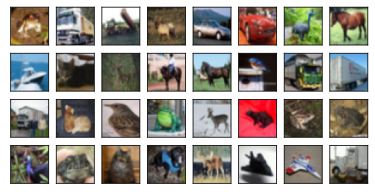

In [11]:
all_images =  paddlevision.datasets.Cifar10(mode='train' , download=True)
print(len(all_images))
d2l.show_images([all_images[i][0] for i in range(32)], 4, 8, scale=0.8);

为了在预测过程中得到确切的结果，我们通常对训练样本只进行图像增广，且在预测过程中不使用随机操作的图像增广。
在这里，我们[**只使用最简单的随机左右翻转**]。
此外，我们使用`ToTensor`实例将一批图像转换为深度学习框架所要求的格式，即形状为（批量大小，通道数，高度，宽度）的32位浮点数，取值范围为0～1。


In [12]:
train_augs = paddlevision.transforms.Compose([
     paddlevision.transforms.RandomHorizontalFlip(),
     paddlevision.transforms.ToTensor()])

test_augs = paddlevision.transforms.Compose([
     paddlevision.transforms.ToTensor()])

In [13]:
def load_cifar10(is_train, augs, batch_size):
    dataset = paddlevision.datasets.Cifar10(mode="train",
                                            transform=augs, download=True)
    dataloader = paddle.io.DataLoader(dataset, batch_size=batch_size,
                    num_workers=d2l.get_dataloader_workers(), shuffle=is_train)
    return dataloader

### 多GPU训练

我们在CIFAR-10数据集上训练 :numref:`sec_resnet`中的ResNet-18模型。
回想一下 :numref:`sec_multi_gpu_concise`中对多GPU训练的介绍。
接下来，我们[**定义一个函数，使用多GPU对模型进行训练和评估**]。


In [14]:
#@save
def train_batch_ch13(net, X, y, loss, trainer, devices):
    """用多GPU进行小批量训练
    飞桨不支持在notebook上进行多GPU训练
    Defined in :numref:`sec_image_augmentation`"""
    if isinstance(X, list):
        # 微调BERT中所需（稍后讨论）
        X = [paddle.to_tensor(x, place=devices[0]) for x in X]
    else:
        X = paddle.to_tensor(X, place=devices[0])
    y = paddle.to_tensor(y, place=devices[0])
    net.train()
    trainer.clear_grad()
    pred = net(X)
    l = loss(pred, y)
    l.sum().backward()
    trainer.step()
    train_loss_sum = l.sum()
    train_acc_sum = d2l.accuracy(pred, y)
    return train_loss_sum, train_acc_sum

In [15]:
#@save
def train_ch13(net, train_iter, test_iter, loss, trainer, num_epochs,
               devices=d2l.try_all_gpus()):
    """用多GPU进行模型训练
    Defined in :numref:`sec_image_augmentation`"""
    timer, num_batches = d2l.Timer(), len(train_iter)
    animator = d2l.Animator(xlabel='epoch', xlim=[1, num_epochs], ylim=[0, 1],
                            legend=['train loss', 'train acc', 'test acc'])
    net = paddle.DataParallel(net)
    for epoch in range(num_epochs):
        # 4个维度：储存训练损失，训练准确度，实例数，特点数
        metric = d2l.Accumulator(4)
        for i, (features, labels) in enumerate(train_iter):
            timer.start()
            l, acc = train_batch_ch13(
                net, features, labels, loss, trainer, devices)
            metric.add(l, acc, labels.shape[0], labels.numel())
            timer.stop()
            if (i + 1) % (num_batches // 5) == 0 or i == num_batches - 1:
                animator.add(epoch + (i + 1) / num_batches,
                             (metric[0] / metric[2], metric[1] / metric[3],
                              None))
        test_acc = d2l.evaluate_accuracy_gpu(net, test_iter)
        animator.add(epoch + 1, (None, None, test_acc))
    print(f'loss {metric[0] / metric[2]:.3f}, train acc '
          f'{metric[1] / metric[3]:.3f}, test acc {test_acc:.3f}')
    print(f'{metric[2] * num_epochs / timer.sum():.1f} examples/sec on '
          f'{str(devices)}')

现在，我们可以[**定义`train_with_data_aug`函数，使用图像增广来训练模型**]。该函数获取所有的GPU，并使用Adam作为训练的优化算法，将图像增广应用于训练集，最后调用刚刚定义的用于训练和评估模型的`train_ch13`函数。


In [16]:
batch_size, devices, net = 256, d2l.try_all_gpus(), d2l.resnet18(10, 3)

def init_weights(m):
    if type(m) in [nn.Linear, nn.Conv2D]:
        nn.initializer.XavierUniform(m.weight)

net.apply(init_weights)

def train_with_data_aug(train_augs, test_augs, net, lr=0.001):
    train_iter = load_cifar10(True, train_augs, batch_size)
    test_iter = load_cifar10(False, test_augs, batch_size)
    loss = nn.CrossEntropyLoss(reduction="none")
    trainer = paddle.optimizer.Adam(learning_rate=lr, parameters=net.parameters())
    train_ch13(net, train_iter, test_iter, loss, trainer, 10, devices[:1])

W0818 09:18:14.902511 73688 gpu_resources.cc:61] Please NOTE: device: 0, GPU Compute Capability: 7.0, Driver API Version: 11.8, Runtime API Version: 11.8
W0818 09:18:14.932250 73688 gpu_resources.cc:91] device: 0, cuDNN Version: 8.7.


让我们使用基于随机左右翻转的图像增广来[**训练模型**]。


loss 0.166, train acc 0.944, test acc 0.936
3465.5 examples/sec on [Place(gpu:0)]


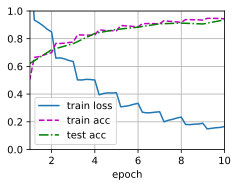

In [17]:
train_with_data_aug(train_augs, test_augs, net)

## 小结

* 图像增广基于现有的训练数据生成随机图像，来提高模型的泛化能力。
* 为了在预测过程中得到确切的结果，我们通常对训练样本只进行图像增广，而在预测过程中不使用带随机操作的图像增广。
* 深度学习框架提供了许多不同的图像增广方法，这些方法可以被同时应用。

## 练习

1. 在不使用图像增广的情况下训练模型：`train_with_data_aug(no_aug, no_aug)`。比较使用和不使用图像增广的训练结果和测试精度。这个对比实验能支持图像增广可以减轻过拟合的论点吗？为什么？
2. 在基于CIFAR-10数据集的模型训练中结合多种不同的图像增广方法。它能提高测试准确性吗？
3. 参阅深度学习框架的在线文档。它还提供了哪些其他的图像增广方法？


[Discussions](https://discuss.d2l.ai/t/11801)
